# Building a 5000 dimensional Logistic Regression and Softmax Regression Sentiment Classifier Based on the Netflix Large Movie Review dataset
The final exercise in Chapter 5 suggests implementing a final project for sentiment analysis. "Sentiment analysis can be considered a binary classification problem. The input is natural language text, and the output is a binary decision that infers positive or negative sentiment." The chapter end suggests taking a look at some datasets in particular the [Large Movie Review Dataset](http://mng.bz/60nj). The excercise also suggests visiting the Kaggle challenge for [Bag of Words Meets Bags of Popcorn](https://www.kaggle.com/c/word2vec-nlp-tutorial). 

The Kaggle tutorial is excellent, and I've borrowed big pieces from it. The main differences in the Kaggle tutorial are that they use Scikit-Learn and Random Forrest, and there is no Tensorflow in it. They also use Pandas and assume that the train data is a 25000 * 5000 column Pandas data frame, and that each vertical slice / column in the frame is the full term frequency feature set counts for word X1, word X2.... word XN.

I've made a few changes to the tutorial besides using Tensorflow. I outline them below:

   1. Instead of using [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/), I used [Tika Python](http://github.com/chrismattmann/tika-python) to clean the review text. Should be obvious why...
   2. I added [TQDM](https://github.com/tqdm/tqdm) progress bars on the most important iterations. 
   3. I added some plots here and there, including looking at the term frequency distribution for the first 100 words in the 5000 word vocabulary, and a plot for the ROC curve.
   4. I added computation of precision and recall, and TP, TN, FP, FN
   5. I added saving for the model weights. 
   
I have a feeling I made this harder than it needed to be &#9786; That said, I couldn't even visualize based on the example given in the book for 2d logistic regresion what 5000d logistic regression looked like. So, I made a visual of it to hopefully help others when they are similarly thinking about it. I think once I learn more about Tensorflow, I will be able to clean this code up some more too. 

<img src="../figs/ch06-final-bow-model.png" width="400" height="200" alt="Bag of Word Model in 5000 dimensions"/>

Here are some immensely useful references I found along the way. FWIW, my Nd logreg classifier is <b>~87%</b> accurate. The softmax reg classifier is <b>~81%</b> Not bad!

## Useful References

   1. [Plot ROC Curve for Binary Classification](https://qiita.com/bmj0114/items/460424c110a8ce22d945) by @bmj0114
   2. [Intersecting Lists and Finding their Indices](https://stackoverflow.com/questions/12570417/python-finding-corresponding-indices-for-an-intersection-of-two-lists) by mgilson
   3. [An Introduction to Bag of Words](https://medium.freecodecamp.org/an-introduction-to-bag-of-words-and-how-to-code-it-in-python-for-nlp-282e87a9da04) by Free Code Camp.
   4. [Bag of Words Meets Popcorn Tutorial](https://www.kaggle.com/c/word2vec-nlp-tutorial/overview) by Kaggle.
   5. [Large Movie Review Dataset](http://ai.stanford.edu/~amaas/data/sentiment/) by Stanford.
   6. [What Bag of Words Looks Like Visually](https://bit.ly/2KCTYGe) by Unknown.
   7. [Working with Bag of Words - Tensorflow Cookbook](https://github.com/nfmcclure/tensorflow_cookbook/blob/master/07_Natural_Language_Processing/02_Working_with_Bag_of_Words/02_bag_of_words.ipynb) by Nick F. Mcclure.


In [1]:
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tika import parser
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import roc_curve, auc
import re
import math
from tqdm.notebook import tqdm
from os import listdir
from os.path import isfile, join
import nltk
nltk.download('popular')

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/mattmann/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/mattmann/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/mattmann/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/mattmann/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/mattmann/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/mattmann/nltk_data...
[nltk_data]    |   Package movie_review

True

In [2]:
def review_to_words( raw_review ):
    # Function to convert a raw review to a string of words
    # The input is a single string (a raw movie review), and 
    # the output is a single string (a preprocessed movie review)
    #
    # 1. Remove HTML
    review_text = parser.from_buffer( "<html>" + raw_review + "</html>" )["content"]
    #
    # 2. Remove non-letters        
    letters_only = re.sub("[^a-zA-Z]", " ", review_text) 
    #
    # 3. Convert to lower case, split into individual words
    words = letters_only.lower().split()                             
    #
    # 4. In Python, searching a set is much faster than searching
    #   a list, so convert the stop words to a set
    stops = set(stopwords.words("english"))                  
    # 
    # 5. Remove stop words
    meaningful_words = [w for w in words if not w in stops]   
    #
    # 6. Join the words back into one string separated by space, 
    # and return the result.
    return( " ".join( meaningful_words )) 

In [3]:
train = pd.read_csv("../data/word2vec-nlp-tutorial/labeledTrainData.tsv", header=0, \
                    delimiter="\t", quoting=3)

In [4]:
train.shape

(25000, 3)

In [5]:
train.columns.values

array(['id', 'sentiment', 'review'], dtype=object)

In [6]:
train.head()

,id,sentiment,review
0,"""5814_8""",1,"""With all this stuff going down at the moment ..."
1,"""2381_9""",1,"""\""The Classic War of the Worlds\"" by Timothy ..."
2,"""7759_3""",0,"""The film starts with a manager (Nicholas Bell..."
3,"""3630_4""",0,"""It must be assumed that those who praised thi..."
4,"""9495_8""",1,"""Superbly trashy and wondrously unpretentious ..."


In [7]:
parsed = parser.from_buffer("<html>"+train["review"][0]+"</html>")
print(train["review"][0])
print(parsed["content"])

"With all this stuff going down at the moment with MJ i've started listening to his music, watching the odd documentary here and there, watched The Wiz and watched Moonwalker again. Maybe i just want to get a certain insight into this guy who i thought was really cool in the eighties just to maybe make up my mind whether he is guilty or innocent. Moonwalker is part biography, part feature film which i remember going to see at the cinema when it was originally released. Some of it has subtle messages about MJ's feeling towards the press and also the obvious message of drugs are bad m'kay.<br /><br />Visually impressive but of course this is all about Michael Jackson so unless you remotely like MJ in anyway then you are going to hate this and find it boring. Some may call MJ an egotist for consenting to the making of this movie BUT MJ and most of his fans would say that he made it for the fans which if true is really nice of him.<br /><br />The actual feature film bit when it finally sta

In [8]:
# Get the number of reviews based on the dataframe column size
num_reviews = train["review"].size

# Initialize an empty list to hold the clean reviews
clean_train_reviews = []

# Loop over each review; create an index i that goes from 0 to the length
# of the movie review list 
for i in tqdm(range( 0, num_reviews )):
    # Call our function for each one, and add the result to the list of
    # clean reviews
    clean_train_reviews.append( review_to_words( train["review"][i] ) )

In [9]:
# Initialize the "CountVectorizer" object, which is scikit-learn's
# bag of words tool.  
vectorizer = CountVectorizer(analyzer = "word",   \
                             tokenizer = None,    \
                             preprocessor = None, \
                             stop_words = None,   \
                             max_features = 5000) 

# fit_transform() does two functions: First, it fits the model
# and learns the vocabulary; second, it transforms our training data
# into feature vectors. The input to fit_transform should be a list of 
# strings.
train_data_features = vectorizer.fit_transform(clean_train_reviews)

# Numpy arrays are easy to work with, so convert the result to an 
# array
train_data_features = train_data_features.toarray()

In [10]:
print(train_data_features.shape)

(25000, 5000)


In [11]:
# Take a look at the words in the vocabulary
vocab = vectorizer.get_feature_names()
print("size %d %s " % (len(vocab), vocab))

size 5000 ['abandoned', 'abc', 'abilities', 'ability', 'able', 'abraham', 'absence', 'absent', 'absolute', 'absolutely', 'absurd', 'abuse', 'abusive', 'abysmal', 'academy', 'accent', 'accents', 'accept', 'acceptable', 'accepted', 'access', 'accident', 'accidentally', 'accompanied', 'accomplished', 'according', 'account', 'accuracy', 'accurate', 'accused', 'achieve', 'achieved', 'achievement', 'acid', 'across', 'act', 'acted', 'acting', 'action', 'actions', 'activities', 'actor', 'actors', 'actress', 'actresses', 'acts', 'actual', 'actually', 'ad', 'adam', 'adams', 'adaptation', 'adaptations', 'adapted', 'add', 'added', 'adding', 'addition', 'adds', 'adequate', 'admire', 'admit', 'admittedly', 'adorable', 'adult', 'adults', 'advance', 'advanced', 'advantage', 'adventure', 'adventures', 'advertising', 'advice', 'advise', 'affair', 'affect', 'affected', 'afford', 'aforementioned', 'afraid', 'africa', 'african', 'afternoon', 'afterwards', 'age', 'aged', 'agent', 'agents', 'ages', 'aging', 

In [12]:
# Sum up the counts of each vocabulary word
dist = np.sum(train_data_features, axis=0)

# For each, print the vocabulary word and the number of times it 
# appears in the training set
for tag, count in zip(vocab, dist):
    print("%d, %s" % (count, tag))

187, abandoned
125, abc
108, abilities
454, ability
1259, able
85, abraham
116, absence
83, absent
352, absolute
1485, absolutely
306, absurd
192, abuse
91, abusive
98, abysmal
297, academy
485, accent
203, accents
300, accept
130, acceptable
144, accepted
92, access
318, accident
200, accidentally
88, accompanied
124, accomplished
296, according
186, account
81, accuracy
284, accurate
123, accused
179, achieve
139, achieved
124, achievement
90, acid
971, across
1251, act
660, acted
6494, acting
3355, action
311, actions
83, activities
2389, actor
4488, actors
1219, actress
369, actresses
394, acts
793, actual
4240, actually
148, ad
303, adam
98, adams
454, adaptation
80, adaptations
154, adapted
810, add
440, added
166, adding
347, addition
337, adds
113, adequate
124, admire
621, admit
134, admittedly
101, adorable
511, adult
376, adults
101, advance
90, advanced
153, advantage
510, adventure
204, adventures
91, advertising
259, advice
90, advise
346, affair
93, affect
113, affected


296, gold
123, goldberg
260, golden
754, gone
241, gonna
15147, good
106, goodness
161, goofy
245, gordon
1040, gore
369, gorgeous
234, gory
3587, got
136, gothic
129, gotta
286, gotten
424, government
109, grab
80, grabs
328, grace
462, grade
118, gradually
86, graham
307, grand
98, grandfather
127, grandmother
262, grant
201, granted
239, graphic
169, graphics
97, grasp
237, gratuitous
189, grave
121, gray
89, grayson
9061, great
174, greater
745, greatest
154, greatly
82, greatness
86, greed
91, greedy
113, greek
404, green
83, greg
79, gregory
250, grew
158, grey
79, grief
102, griffith
188, grim
103, grinch
150, gripping
196, gritty
180, gross
353, ground
1034, group
108, groups
224, grow
298, growing
252, grown
134, grows
163, gruesome
91, guarantee
167, guard
1310, guess
99, guessed
151, guessing
133, guest
125, guide
142, guilt
198, guilty
563, gun
94, gundam
283, guns
143, guts
3036, guy
1304, guys
184, ha
505, hair
105, hal
2095, half
173, halfway
221, hall
245, halloween
84,

775, showing
994, shown
2308, shows
168, shut
125, shy
487, sick
82, sid
1277, side
105, sidekick
157, sides
180, sidney
323, sight
274, sign
89, signed
80, significance
182, significant
106, signs
130, silence
439, silent
889, silly
139, silver
852, similar
98, similarities
98, similarly
84, simmons
272, simon
1023, simple
91, simplicity
101, simplistic
1966, simply
95, simpson
157, sin
245, sinatra
2907, since
86, sincere
271, sing
274, singer
79, singers
520, singing
918, single
149, sings
163, sinister
87, sink
185, sir
93, sirk
82, sissy
818, sister
207, sisters
709, sit
166, sitcom
244, site
95, sits
451, sitting
669, situation
487, situations
386, six
83, sixties
125, size
180, skill
267, skills
212, skin
305, skip
321, sky
122, slap
176, slapstick
491, slasher
89, slaughter
117, slave
164, sleazy
325, sleep
179, sleeping
80, slice
93, slick
137, slight
122, slightest
541, slightly
117, sloppy
1132, slow
412, slowly
1646, small
105, smaller
406, smart
290, smile
87, smiling
494,

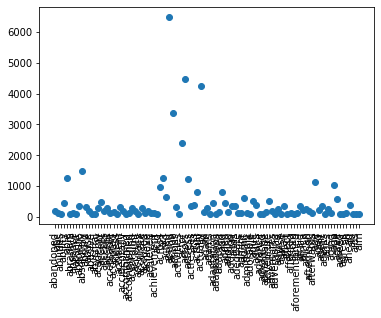

In [13]:
# plot the word count for first 100 words
plt.scatter(vocab[0:99], dist[0:99])
plt.xticks(vocab[0:99], rotation='vertical')
plt.show()

In [14]:
# set up Tensorflow nD logistic regression
learning_rate = 0.1
training_epochs = 2000

In [15]:
def loss(inputs, outputs):
    return tf.reduce_mean(-tf.math.log(inputs * outputs + (1 - inputs) * (1 - outputs)))

In [16]:
class Model(object):
    def __init__(self):
        self.w = tf.Variable([0.] * (len(train_data_features)+1), name="w")
        print(self.w.shape)

    def __call__(self, x):
        linear = self.w[0]
        for i in range(0, x.shape[0]):
            linear = linear + (self.w[i+1] * x[i])

        return tf.sigmoid(linear) 

In [17]:
optimizer = tf.keras.optimizers.SGD(learning_rate)

In [18]:
def train_step(model, inputs, outputs):
    with tf.GradientTape() as t:
        current_loss = loss(model(inputs), outputs)
        
    grads = t.gradient(current_loss, [model.w])
    optimizer.apply_gradients(zip(grads,[model.w]))
    return current_loss

In [19]:
def train_x(x):
    step_x = []
    for i in range(0, x.shape[1]):
        step_x.append(x[:, i, None].reshape(len(x)))
        
    return np.asarray(step_x)

In [20]:
Xs = train_x(train_data_features)
ys = train['sentiment'].values

In [21]:
print(Xs.shape)
print(ys.shape)

(5000, 25000)
(25000,)


In [22]:
model = Model()

(25001,)


In [23]:
ckpt = tf.train.Checkpoint(step=tf.Variable(1), optimizer=optimizer, weights=model.w)
manager = tf.train.CheckpointManager(ckpt, '../models/en-netflix-binary-sentiment.ckpt', max_to_keep=3)

In [24]:
prev_err = 0
for epoch in tqdm(range(training_epochs)):
    err = train_step(model, Xs, ys)
    
    ckpt.step.assign_add(1)
    if int(ckpt.step) % 10 == 0:
        save_path = manager.save()
        print("Saved checkpoint for step {}: {}".format(int(ckpt.step), save_path))
        print("loss {:1.2f}".format(err.numpy()))
    
    print(epoch, err.numpy())
    if abs(prev_err - err) < 0.0001:
        break
    prev_err = err

w_val = model.w.numpy()
save_path = manager.save()

0 0.693146
1 0.68367267
2 0.67517424
3 0.66737765
4 0.6601467
5 0.6533886
6 0.64703435
7 0.64103085
Saved checkpoint for step 10: ../models/en-netflix-binary-sentiment.ckpt/ckpt-1
loss 0.64
8 0.6353369
9 0.62991923
10 0.62475115
11 0.61981046
12 0.61507845
13 0.6105392
14 0.6061786
15 0.6019847
16 0.5979464
17 0.59405416
Saved checkpoint for step 20: ../models/en-netflix-binary-sentiment.ckpt/ckpt-2
loss 0.59
18 0.5902991
19 0.58667326
20 0.5831693
21 0.57978046
22 0.57650065
23 0.5733241
24 0.57024544
25 0.5672598
26 0.5643625
27 0.56154937
Saved checkpoint for step 30: ../models/en-netflix-binary-sentiment.ckpt/ckpt-3
loss 0.56
28 0.5588163
29 0.55615956
30 0.5535757
31 0.5510613
32 0.54861337
33 0.5462289
34 0.5439053
35 0.54163986
36 0.53943014
37 0.537274
Saved checkpoint for step 40: ../models/en-netflix-binary-sentiment.ckpt/ckpt-4
loss 0.54
38 0.5351691
39 0.53311354
40 0.53110516
41 0.52914226
42 0.5272232
43 0.52534616
44 0.5235096
45 0.5217122
46 0.51995236
47 0.51822877
Sav

Saved checkpoint for step 350: ../models/en-netflix-binary-sentiment.ckpt/ckpt-35
loss 0.37
348 0.36807233
349 0.36787993
350 0.36768815
351 0.36749703
352 0.36730647
353 0.36711657
354 0.36692727
355 0.36673856
356 0.3665504
357 0.36636293
Saved checkpoint for step 360: ../models/en-netflix-binary-sentiment.ckpt/ckpt-36
loss 0.37
358 0.366176
359 0.36598969
360 0.3658039
361 0.36561874
362 0.36543414
363 0.36525008
364 0.36506665
365 0.36488378
366 0.3647015
367 0.36451977
Saved checkpoint for step 370: ../models/en-netflix-binary-sentiment.ckpt/ckpt-37
loss 0.36
368 0.36433855
369 0.3641579
370 0.36397782
371 0.3637983
372 0.36361933
373 0.3634409
374 0.36326298
375 0.36308563
376 0.36290878
377 0.3627325
Saved checkpoint for step 380: ../models/en-netflix-binary-sentiment.ckpt/ckpt-38
loss 0.36
378 0.36255673
379 0.3623815
380 0.36220673
381 0.3620326
382 0.36185887
383 0.3616857
384 0.36151302
385 0.36134085
386 0.36116922
387 0.36099812
Saved checkpoint for step 390: ../models/en-

In [25]:
print(w_val)
print(np.max(w_val))

[ 0.00287739 -0.00082148  0.01867105 ...  0.          0.
  0.        ]
0.4994014


In [26]:
def predict(test_review, vocab, weights, threshold=0.5):
    #clean the review
    test_review_c = review_to_words(test_review)
    
    #create the test vocabulary and counts
    n_vectorizer = CountVectorizer(analyzer = "word",   \
                             tokenizer = None,    \
                             preprocessor = None, \
                             stop_words = None,   \
                             max_features = 5000) 
    ex_data_features = n_vectorizer.fit_transform([test_review_c])
    ex_data_features = ex_data_features.toarray()
    test_vocab = n_vectorizer.get_feature_names()
    test_vocab_counts = ex_data_features.reshape(ex_data_features.shape[1])
    
    # figure out the intersection of the test vocabulary from the review with the actual full vocabulary
    ind_dict = dict((k, i) for i, k in enumerate(vocab))
    test_ind_dict = dict((k, i) for i, k in enumerate(test_vocab))
    inter = set(ind_dict).intersection(test_vocab)
    indices = [ ind_dict[x] for x in inter ]
    test_indices = [test_ind_dict[x] for x in inter]
    
    # all zeros for the 5000 feature vec except for the overlap indices that we have counts for
    test_feature_vec = np.zeros(train_data_features.shape[1])
    for i in range(len(indices)):
        test_feature_vec[indices[i]] = test_vocab_counts[test_indices[i]]
     
    # our log reg model
    test_linear = weights[0]
    for i in range(0, train_data_features.shape[1]):
        test_linear = test_linear + (weights[i+1] * test_feature_vec[i])
    y_test = tf.sigmoid(test_linear)
    
    # here it is the prediction
    return np.greater(y_test, threshold).astype(float)

In [27]:
test = pd.read_csv("../data/word2vec-nlp-tutorial/testData.tsv", header=0, \
                    delimiter="\t", quoting=3)

In [28]:
test.head()

,id,review
0,"""12311_10""","""Naturally in a film who's main themes are of ..."
1,"""8348_2""","""This movie is a disaster within a disaster fi..."
2,"""5828_4""","""All in all, this is a movie for kids. We saw ..."
3,"""7186_2""","""Afraid of the Dark left me with the impressio..."
4,"""12128_7""","""A very accurate depiction of small time mob l..."


In [29]:
#try it out on new data
new_neg_review = "Man, this movie really sucked. It was terrible. I could not possibly watch this movie again!"
new_pos_review = "I think that this is a fantastic movie, it really "

In [30]:
new_neg_review_c = review_to_words(new_neg_review)
new_pos_review_c = review_to_words(new_pos_review)
print(new_neg_review_c)
print(new_pos_review_c)         

man movie really sucked terrible could possibly watch movie
think fantastic movie really


In [31]:
predict(new_neg_review, vocab, w_val)

0.0

In [32]:
predict(new_pos_review, vocab, w_val)

1.0

In [33]:
# Generate Kaggle Submission
# Create an empty list and append the clean reviews one by one
num_reviews = len(test["review"])
result = [] 
for i in tqdm(range(0, num_reviews)):
    r = predict(test["review"][i], vocab, w_val)
    result.append(r)

# Copy the results to a pandas dataframe with an "id" column and
# a "sentiment" column
output = pd.DataFrame( data={"id":test["id"], "sentiment":result} )

# Use pandas to write the comma-separated output file
output.to_csv( "../data/cache/Bag_of_Words_model.csv", index=False, quoting=3 )

In [34]:
# test on unseen samples from IMDB movie reviews and compute TP, TN, FP, FN and precision + accuracy
pos_test_path = "../data/aclImdb/test/pos/"
neg_test_path = "../data/aclImdb/test/neg/"
only_pos_files = [f for f in listdir(pos_test_path) if isfile(join(pos_test_path, f))]
only_neg_files = [f for f in listdir(neg_test_path) if isfile(join(neg_test_path, f))]

only_pos_file_contents = []
for i in range(0, len(only_pos_files)):
    with open(pos_test_path + only_pos_files[i], 'r') as file:
        r_data = file.read()
        only_pos_file_contents.append(r_data)
        
only_neg_file_contents = []
for i in range(0, len(only_neg_files)):
    with open(neg_test_path + only_neg_files[i], 'r') as file:
        r_data = file.read()
        only_neg_file_contents.append(r_data)

In [35]:
TP = 0.
TN = 0.
FP = 0.
FN = 0.
predictions_test = np.zeros(len(only_pos_file_contents) * 2)

In [36]:
for i in tqdm(range(0, len(only_pos_file_contents))):
    sent = predict(only_pos_file_contents[i], vocab, w_val)
    predictions_test[i] = sent
    if sent == 1.:
        TP += 1
    elif sent == 0.:
        FN += 1

In [37]:
for i in tqdm(range(0, len(only_neg_file_contents))):
    sent = predict(only_neg_file_contents[i], vocab, w_val)
    predictions_test[len(only_neg_file_contents)+i] = sent
    if sent == 0.:
        TN += 1
    elif sent == 1.:
        FP += 1

In [38]:
precision = (TP) / (TP + FP)

In [39]:
recall = (TP) / (TP + FN)

In [40]:
print("precision %f recall %f" % (precision, recall))

precision 0.859793 recall 0.875200


In [41]:
print(TP)
print(TN)
print(FP)
print(FN)

10940.0
10716.0
1784.0
1560.0


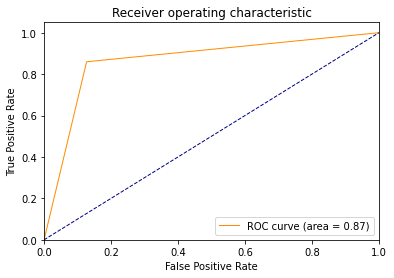

In [42]:
outcome_test = np.ones(len(only_pos_files))
outcome_test = np.append(outcome_test, np.zeros(len(only_neg_files)))

fpr, tpr, thresholds = roc_curve(predictions_test, outcome_test)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# Try Softmax Regression
Chapter 6 in the book teaches us also about softmax regression. The big difference with softmax is that we can predict more than 2 classes (N output classes) and to do so, we set up an equation like Y = WX + B, where W are the weights (num_features * num_labels), X is the input feature data (num_train * num_features), and B the offset constant (num_labels) and Y is the one-hot encoded class labels we are trying to predict (num_labels). Y, X, W and B are matrices. The book also teaches us to use batch training, so we'll set all that up here. One interesting property is that Softmax natively provides class confidence for each prediction. This could be done with n-d logistic regression by estimating tthe difference from absolute 0 or 1 for the predicted y_model value and then divide by 0.5.

In [43]:
learning_rate = 0.01
training_epochs = 1000
num_labels = 2
batch_size = 100

In [44]:
def softmax_feat_vec_from_review(test_review, vocab):
    #assumption: review is clean
    #create the test vocabulary and counts
    n_vectorizer = CountVectorizer(analyzer = "word",   \
                             tokenizer = None,    \
                             preprocessor = None, \
                             stop_words = None,   \
                             max_features = 5000) 
    
    ex_data_features = n_vectorizer.fit_transform([test_review])
    ex_data_features = ex_data_features.toarray()
    test_vocab = n_vectorizer.get_feature_names()
    test_vocab_counts = ex_data_features.reshape(ex_data_features.shape[1])
    
    # figure out the intersection of the test vocabulary from the review with the actual full vocabulary
    ind_dict = dict((k, i) for i, k in enumerate(vocab))
    test_ind_dict = dict((k, i) for i, k in enumerate(test_vocab))
    inter = set(ind_dict).intersection(test_vocab)
    indices = [ ind_dict[x] for x in inter ]
    test_indices = [test_ind_dict[x] for x in inter]
    
    # all zeros for the 5000 feature vec except for the overlap indices that we have counts for
    test_feature_vec = np.zeros(train_data_features.shape[1])
    for i in range(len(indices)):
        test_feature_vec[indices[i]] = test_vocab_counts[test_indices[i]]
     
    
    return test_feature_vec


In [45]:
num_pos_labels = len(train.loc[train['sentiment'] == 1.])
num_neg_labels = len(train.loc[train['sentiment'] == 0.])
lab_mat = []
for i in range(len(train['sentiment'])):
    if train['sentiment'][i] == 1.0:
        #lab_mat = lab_mat + [[1., 0.]]
        lab_mat = lab_mat + [[0., 1.]]
    elif train['sentiment'][i] == 0.0:
        #lab_mat = lab_mat + [[0., 1.]]
        lab_mat = lab_mat + [[1., 0.]]

labels = np.matrix(lab_mat)
print(labels)

[[0. 1.]
 [0. 1.]
 [1. 0.]
 ...
 [1. 0.]
 [1. 0.]
 [0. 1.]]


In [46]:
xs = train_data_features.astype(float)
train_size, num_features = xs.shape
print(xs.shape)
print(labels.shape)

(25000, 5000)
(25000, 2)


In [47]:
#shuffle the labels so that the system doesn't learn that the order of the data matters
arr = np.arange(xs.shape[0])
np.random.shuffle(arr)
xs = xs[arr, :]
labels = labels[arr, :]

In [48]:
def loss_s(inputs, outputs):
    # sometimes the result of y_model can be 0, and log0 is NaN, so account for it
    # see: https://stackoverflow.com/questions/38538635/tensorflow-returning-nan-when-implementing-logistic-regression
    return -tf.reduce_sum(outputs * tf.math.log(tf.maximum(inputs, 1e-15)))

In [49]:
class SoftmaxModel(object):
    def __init__(self, num_features, num_labels):
        self.W = tf.Variable(tf.zeros([num_features, num_labels], dtype=tf.double), dtype=tf.double, name="s_W")
        self.b = tf.Variable(tf.zeros([num_labels], dtype=tf.double), dtype=tf.double, name="s_b")
        print(self.W.shape)
        print(self.b.shape)

    def __call__(self, x):
        return tf.nn.softmax(tf.matmul(x, self.W) + self.b)

In [50]:
s_optimizer = tf.keras.optimizers.SGD(learning_rate)

In [51]:
def train_step_s(model, inputs, outputs):
    with tf.GradientTape() as t:
        current_loss = loss_s(model(inputs), outputs)
        
    grads = t.gradient(current_loss, [model.W, model.b])
    optimizer.apply_gradients(zip(grads,[model.W, model.b]))
    return current_loss

In [52]:
def correct_predictions(model, inputs, outputs):
    return tf.equal(tf.argmax(model(inputs), 1), tf.argmax(outputs, 1))

In [53]:
def accuracy(predictions):
    return tf.reduce_mean(tf.cast(predictions, tf.double))

In [54]:
test_reviews = []
clean_test_reviews = []
test_reviews.extend(only_pos_file_contents)
test_reviews.extend(only_neg_file_contents)

In [55]:
for i in tqdm(range(len(test_reviews))):
    test_review_c = review_to_words(test_reviews[i])
    clean_test_reviews.append(test_review_c)

In [56]:
test_xs = np.zeros((len(clean_test_reviews), num_features))
for i in tqdm(range(len(clean_test_reviews))):
    test_xs[i] = softmax_feat_vec_from_review(clean_test_reviews[i], vocab)

In [57]:
test_xs.shape

(25000, 5000)

In [58]:
test_labels = np.matrix([[0., 1.]] * len(only_pos_file_contents) + [[1., 0.]] * len(only_neg_file_contents))

In [59]:
model_s = SoftmaxModel(num_features, num_labels)

(5000, 2)
(2,)


In [60]:
ckpt_s = tf.train.Checkpoint(step=tf.Variable(1), optimizer=s_optimizer, weights=model_s.W, biases=model_s.b)
manager_s = tf.train.CheckpointManager(ckpt_s, '../models/ch4-softmax-netflix-sentiment.ckpt', max_to_keep=3)

In [61]:
for step in tqdm(range(training_epochs * train_size // batch_size)):
    offset = (step * batch_size) % train_size
    batch_xs = xs[offset:(offset + batch_size), :]
    batch_labels = labels[offset:(offset + batch_size)]
    err = train_step_s(model_s, batch_xs, batch_labels)
    
    ckpt_s.step.assign_add(1)
    if int(ckpt_s.step) % 10 == 0:
        save_path = manager_s.save()
        print("Saved checkpoint for step {}: {}".format(int(ckpt_s.step), save_path))
        print("loss {:1.2f}".format(err.numpy()))
        
    print (step, err.numpy())            

W_val = model_s.W.numpy()
print('w', W_val)
b_val = model_s.b.numpy()
print('b', b_val)
predictions = correct_predictions(model_s, test_xs, test_labels)
print(predictions)
acc = accuracy(predictions).numpy()
print('accuracy {:.2f}'.format(acc))
save_path = manager_s.save()
print("Model saved in path: %s" % save_path)

0 69.31471805599453
1 551.5844420525614
2 1692.8522741023423
3 1585.3928742917722
4 1163.114892469203
5 1614.0393424842975
6 1450.6286085862484
7 1655.962077987714
Saved checkpoint for step 10: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1
loss 2125.67
8 2125.668241987814
9 1708.3123288800082
10 1403.9944083500993
11 1762.4237266814962
12 848.8190465743834
13 945.6926513922025
14 1250.2993520939262
15 759.2080830586806
16 1225.288420995593
17 1037.9292542798855
Saved checkpoint for step 20: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2
loss 331.31
18 331.31461996906285
19 514.4337131843705
20 1171.0739914423027
21 375.34849416843645
22 139.34421494860356
23 614.2943569917563
24 713.0475053942384
25 570.1263739428813
26 505.7923284411302
27 892.4538713083958
Saved checkpoint for step 30: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3
loss 531.97
28 531.97096639715
29 803.8859530238957
30 427.9310605784122
31 674.2743723035833
32 253.967636257088
33 345.39264037337034
34

267 149.49517991185073
Saved checkpoint for step 270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-27
loss 316.05
268 316.051025957555
269 249.5893932708778
270 240.84813453118417
271 242.0102024301406
272 138.05706115324622
273 192.29423017754198
274 196.91861949653338
275 210.15556581491148
276 291.6792597179722
277 454.78974542925846
Saved checkpoint for step 280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-28
loss 214.32
278 214.31598101243713
279 237.1739367137228
280 118.86370429154847
281 293.6536656270231
282 171.63696739010263
283 375.6052653889651
284 375.9919470889304
285 339.1419173884916
286 338.4176594682989
287 200.2600386625221
Saved checkpoint for step 290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-29
loss 236.28
288 236.27550897718208
289 246.54036987204626
290 250.15120392041467
291 118.59821107547674
292 164.29200050892575
293 220.24351663230942
294 248.13483008014725
295 158.4535156469986
296 158.49890076718444
297 306.73020714446216
Saved checkp

534 206.8756219654441
535 211.44101443763907
536 129.61751187275996
537 114.97860481950171
Saved checkpoint for step 540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-54
loss 175.19
538 175.18514261064038
539 91.96395257627529
540 206.29120381939146
541 137.29548353723527
542 151.86127046689057
543 159.63628878018875
544 312.1825119894595
545 63.97693684635372
546 135.68390209257439
547 215.09050642055456
Saved checkpoint for step 550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-55
loss 189.93
548 189.92807528998895
549 222.09772218084242
550 129.9339073552967
551 237.56793634922877
552 168.4505241193746
553 202.05187248788738
554 230.1724488154436
555 411.54836300001057
556 293.6726714078757
557 198.57307569941437
Saved checkpoint for step 560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-56
loss 96.74
558 96.74367411966824
559 221.8062932218171
560 93.59919296692794
561 275.92623541820944
562 161.31384726572276
563 85.90971518544728
564 183.22536926292733
565 156.2555

810 57.34033569284475
811 201.57580789283816
812 133.969931017587
813 111.99083336140504
814 180.90978034293002
815 83.1844492990165
816 154.71494333581887
817 182.031911873668
Saved checkpoint for step 820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-82
loss 75.07
818 75.0705424153553
819 131.1081090817842
820 191.78455924265006
821 174.5879130472568
822 95.85824479542562
823 227.54567848609838
824 354.91967633048466
825 187.96348990562709
826 182.75545382189952
827 177.36316231007763
Saved checkpoint for step 830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-83
loss 144.71
828 144.70610913348293
829 117.59134542306549
830 95.68616727038966
831 84.85632980825821
832 46.34068669014253
833 272.21663273466766
834 53.77888130086632
835 138.46903259462528
836 223.81626310090266
837 186.42408781194962
Saved checkpoint for step 840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-84
loss 280.72
838 280.7244126355056
839 256.888319856128
840 94.92284860870124
841 175.650573716657

1086 232.9891374656646
1087 96.0930053380169
Saved checkpoint for step 1090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-109
loss 112.87
1088 112.87151467482586
1089 168.40098354322052
1090 118.13904087510508
1091 81.75628341254784
1092 121.2873436150225
1093 111.61543864455025
1094 115.79290649382784
1095 273.88401892012723
1096 300.621713026402
1097 265.1788469693852
Saved checkpoint for step 1100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-110
loss 176.65
1098 176.6468047296073
1099 147.0437587569956
1100 176.6115453249982
1101 219.76949170351497
1102 216.1721481600364
1103 285.7354322853966
1104 196.5773020839348
1105 83.1532559723982
1106 230.67135544998965
1107 326.5586084843597
Saved checkpoint for step 1110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-111
loss 98.54
1108 98.53883379878411
1109 184.88035839519637
1110 264.81837774529436
1111 194.62555826406043
1112 120.77202462384912
1113 161.12946016689006
1114 156.03425228535735
1115 78.42310589380833
1116 2

1359 117.19695596616961
1360 190.9992087340445
1361 119.81035786111065
1362 110.56420287053677
1363 105.86223196162885
1364 96.0703451601345
1365 25.642006488261764
1366 151.28481158630694
1367 107.03272038006537
Saved checkpoint for step 1370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-137
loss 65.31
1368 65.31423183921875
1369 88.16877854017861
1370 237.85118870537235
1371 80.42762972406555
1372 43.47803820935175
1373 221.77391404899097
1374 311.12141801241484
1375 313.5540733526946
1376 189.17081271698362
1377 55.842749018371634
Saved checkpoint for step 1380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-138
loss 129.31
1378 129.3103349295638
1379 46.74555170416058
1380 135.20966246263825
1381 158.25290140010497
1382 324.43254420385483
1383 199.87530989272253
1384 99.48207759596703
1385 116.90009870238747
1386 174.31572406537148
1387 130.89438787094528
Saved checkpoint for step 1390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-139
loss 114.78
1388 114.7777120451523

1616 116.56234341724078
1617 96.40805384294279
Saved checkpoint for step 1620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-162
loss 75.54
1618 75.54008482498492
1619 48.932420362996986
1620 271.7272293590696
1621 100.11896315427808
1622 35.926715686048254
1623 159.66996388346692
1624 119.58954239112012
1625 203.60288354490388
1626 116.25113615310559
1627 136.94230804898913
Saved checkpoint for step 1630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-163
loss 95.63
1628 95.62892442453686
1629 80.29179033128406
1630 89.93365633237892
1631 156.24208020612386
1632 268.863190030032
1633 93.3300903838153
1634 53.359584370307566
1635 91.14343365548878
1636 140.01227587508293
1637 48.816140342399635
Saved checkpoint for step 1640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-164
loss 39.27
1638 39.27131669331002
1639 175.62742247987396
1640 100.71438218838057
1641 221.63971127600877
1642 200.75490113092886
1643 147.34434823204782
1644 157.10479149452166
1645 126.48167183990996
1

1876 105.22016374287976
1877 93.10911022345464
Saved checkpoint for step 1880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-188
loss 139.77
1878 139.76886808215048
1879 52.1692716465919
1880 168.30269045904842
1881 100.39049378834349
1882 172.57109755538784
1883 103.0668776271889
1884 110.04600811759174
1885 133.66878469567547
1886 143.5394202461713
1887 169.7384560532989
Saved checkpoint for step 1890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-189
loss 269.03
1888 269.0344577346011
1889 152.98010364087344
1890 120.23411864879701
1891 109.16040932463557
1892 89.09610492201989
1893 90.24841475238058
1894 114.09925407046835
1895 163.2947858056392
1896 60.11849221493271
1897 183.54125646200126
Saved checkpoint for step 1900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-190
loss 124.95
1898 124.9526595733567
1899 141.03755769578694
1900 170.46510646309585
1901 162.33762919851705
1902 208.97501917379782
1903 123.01683405980549
1904 141.12834917015047
1905 213.6839525544512

2130 90.29684822369396
2131 166.76425041293513
2132 198.0743241514425
2133 209.17353048218388
2134 238.17977254603503
2135 125.45500389585592
2136 314.0279780256748
2137 308.1746415499919
Saved checkpoint for step 2140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-214
loss 127.66
2138 127.66417616785445
2139 171.09729577520238
2140 192.82156048223246
2141 113.40264637584211
2142 96.96508636333687
2143 94.10793434245218
2144 127.72813649363405
2145 177.42971169789064
2146 49.24383926836881
2147 115.2939011964468
Saved checkpoint for step 2150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-215
loss 83.22
2148 83.22462713384861
2149 67.83249316373505
2150 173.5036779130644
2151 150.53074206684823
2152 168.19901023105498
2153 114.54899660713053
2154 93.78718629744827
2155 174.2855415357202
2156 146.60798070227338
2157 81.74404793370654
Saved checkpoint for step 2160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-216
loss 67.18
2158 67.18223189167529
2159 172.1237108499841
2160

2397 116.39107003585283
Saved checkpoint for step 2400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-240
loss 38.39
2398 38.38809068278893
2399 102.92891315702288
2400 185.9980898230358
2401 157.8194263044705
2402 128.35925109605643
2403 68.0710640887535
2404 106.35997748256149
2405 164.36634523220852
2406 102.50125737370416
2407 94.38326569170992
Saved checkpoint for step 2410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-241
loss 80.95
2408 80.94717743775193
2409 178.9887960110913
2410 156.84332226460174
2411 29.56012413969311
2412 112.40220641623944
2413 87.24852184526645
2414 23.242256801789605
2415 44.900862746956705
2416 210.12702735323577
2417 56.4222319172321
Saved checkpoint for step 2420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-242
loss 81.98
2418 81.98445764770862
2419 176.97277632160402
2420 130.88377728067655
2421 75.3502691347639
2422 57.09514057680069
2423 140.07174081928093
2424 94.18014184596765
2425 150.68443617043238
2426 143.61886358188883
2427 1

2642 102.55136813169548
2643 90.90426584106409
2644 169.00519994565366
2645 202.6549435789516
2646 79.86652702748538
2647 112.5618678029879
Saved checkpoint for step 2650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-265
loss 47.36
2648 47.361474785609246
2649 113.27573183364441
2650 177.28206666280556
2651 148.65275689564433
2652 106.790013364384
2653 41.5169576466708
2654 107.39787458146904
2655 161.8290110692768
2656 96.56146112141069
2657 81.68822550453096
Saved checkpoint for step 2660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-266
loss 73.10
2658 73.10476301548208
2659 148.1227839335629
2660 65.86691464843344
2661 74.08699832828394
2662 187.62195935110364
2663 95.57140108118287
2664 16.154012699226065
2665 35.91680649476712
2666 223.7783367794217
2667 21.15140940176084
Saved checkpoint for step 2670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-267
loss 48.39
2668 48.38997159434619
2669 114.07109890034128
2670 116.41394293628508
2671 184.5884446344128
2672 116.6

2915 31.852906286600494
2916 192.65581532857846
2917 50.99026256540362
Saved checkpoint for step 2920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-292
loss 62.74
2918 62.73731889450265
2919 116.72416369300022
2920 65.09401354448894
2921 84.2524121153661
2922 52.6801767892683
2923 127.13406436557484
2924 111.52724650927186
2925 114.44575288560056
2926 95.35732732513274
2927 131.48556778865736
Saved checkpoint for step 2930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-293
loss 130.57
2928 130.5727817126332
2929 188.12955574465735
2930 141.30923593795964
2931 135.59574713013643
2932 139.53116361059364
2933 135.00295823587055
2934 148.83974454604697
2935 97.66180868073359
2936 63.5837834933189
2937 94.44559344189078
Saved checkpoint for step 2940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-294
loss 88.42
2938 88.41521289687739
2939 84.9130484750827
2940 26.53525385302605
2941 53.9888573884994
2942 62.20953367480497
2943 112.52923213034556
2944 171.6394935690684
2945 105.

3189 76.74625884542526
3190 16.119549577762857
3191 65.61603257115229
3192 77.78450186852355
3193 66.30772266791527
3194 140.39968373290446
3195 40.4397792911759
3196 55.638582504070996
3197 266.30280607600827
Saved checkpoint for step 3200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-320
loss 356.16
3198 356.15712309721937
3199 163.31182429427977
3200 165.7887900432379
3201 143.87254145670963
3202 36.16176150576851
3203 176.65096458717522
3204 66.33809954822608
3205 152.33579724301248
3206 52.171629736214655
3207 83.24932038099882
Saved checkpoint for step 3210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-321
loss 114.06
3208 114.06315203202362
3209 198.49193599031622
3210 121.51292572130527
3211 151.0707672255963
3212 221.662967887325
3213 169.31444925397258
3214 137.0336870460877
3215 69.69110323934432
3216 79.6974858899925
3217 30.799009357722433
Saved checkpoint for step 3220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-322
loss 126.08
3218 126.08258807155978
321

Saved checkpoint for step 3460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-346
loss 91.49
3458 91.49267294829198
3459 172.2265288586578
3460 72.54771230778037
3461 85.22929328689663
3462 141.67251707904632
3463 158.070894078611
3464 87.04947580219321
3465 115.85944502633478
3466 59.18664866886905
3467 54.72076702582762
Saved checkpoint for step 3470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-347
loss 104.26
3468 104.26423044058046
3469 111.76719562423578
3470 53.622650189589706
3471 52.00598060444787
3472 207.6721390114576
3473 123.60760104785311
3474 51.89355517740175
3475 68.60054064196045
3476 42.9502983790382
3477 92.42684231995565
Saved checkpoint for step 3480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-348
loss 38.77
3478 38.766470458253906
3479 164.23397672012703
3480 157.7979029751163
3481 81.94437696101794
3482 117.81549008687843
3483 147.7822971336896
3484 94.47483490567447
3485 33.99751650166999
3486 89.04433544928277
3487 113.29697290690635
Saved chec

3719 131.6580998285666
3720 7.557068636026393
3721 64.80092541951717
3722 148.09449385106305
3723 95.81538432788292
3724 39.438454916767604
3725 36.592081464757314
3726 48.8503853859396
3727 83.76019335140619
Saved checkpoint for step 3730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-373
loss 60.29
3728 60.292653645989645
3729 219.02027313831456
3730 172.53775024419988
3731 123.40566203564063
3732 184.07171928782037
3733 166.70566899649933
3734 84.90487025646688
3735 21.77825013320031
3736 49.47009875459112
3737 141.01600725428648
Saved checkpoint for step 3740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-374
loss 161.45
3738 161.4501382523417
3739 110.30112041756888
3740 68.86498475562308
3741 58.00388434245278
3742 229.2473702706734
3743 125.5283597299168
3744 105.90562336878905
3745 117.24765761951457
3746 102.71160831736505
3747 146.65328828755784
Saved checkpoint for step 3750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-375
loss 75.68
3748 75.68476782140577
3749

3985 3.713187950231671
3986 46.783387133772116
3987 75.32219306687313
Saved checkpoint for step 3990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-399
loss 141.79
3988 141.79430948380156
3989 27.559855482900463
3990 83.52340413398208
3991 47.91883873919335
3992 167.99081969877096
3993 96.93115465870784
3994 131.70686332129583
3995 158.3799599996455
3996 75.2949282185727
3997 154.2649075606057
Saved checkpoint for step 4000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-400
loss 115.86
3998 115.85865528096778
3999 121.87887411172258
4000 126.75698798132751
4001 93.23281304831215
4002 136.11472301290885
4003 153.64983351082142
4004 63.332430502395
4005 114.9345760772859
4006 224.39678231221527
4007 157.11841092300529
Saved checkpoint for step 4010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-401
loss 51.62
4008 51.622066860842466
4009 106.3449877188917
4010 130.46408833021505
4011 122.79429487702457
4012 146.130803529603
4013 104.88111276864004
4014 69.8045097271202
4015 1

4244 83.2504964177519
4245 154.26068919158797
4246 88.54713493997353
4247 150.36309147379407
Saved checkpoint for step 4250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-425
loss 145.86
4248 145.863442339488
4249 160.48546359181645
4250 275.99257796560966
4251 207.1001542117691
4252 114.30488100481212
4253 66.79684145973035
4254 134.44524858686546
4255 50.24504951464582
4256 192.1494098888529
4257 138.82700109249203
Saved checkpoint for step 4260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-426
loss 70.82
4258 70.82098525005375
4259 7.415331878044194
4260 164.12217137116693
4261 102.40755818870043
4262 158.5325624494315
4263 100.76185261958477
4264 126.26719191915268
4265 101.56829103628175
4266 98.3328242630492
4267 48.68323980641051
Saved checkpoint for step 4270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-427
loss 109.35
4268 109.354628547169
4269 164.89720734550562
4270 111.57145410619303
4271 46.387219065030976
4272 61.572766564562926
4273 74.06338222285876
4274 

Saved checkpoint for step 4500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-450
loss 130.80
4498 130.79507707058727
4499 126.28098713040248
4500 86.37330901566594
4501 89.4870630168192
4502 151.92157422314278
4503 54.86323780629379
4504 83.85750287151546
4505 77.82062379543129
4506 137.45829659557
4507 110.15477995758322
Saved checkpoint for step 4510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-451
loss 65.87
4508 65.87110343955308
4509 69.74914895914986
4510 83.90829567752058
4511 71.37853973790403
4512 131.5633516042313
4513 73.37655534218578
4514 81.05851272552495
4515 84.81676801678607
4516 133.4235419204789
4517 61.08009233467986
Saved checkpoint for step 4520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-452
loss 101.58
4518 101.58277299695128
4519 141.335571384359
4520 105.04077582155828
4521 31.31532755300642
4522 45.553350439301425
4523 57.69251569052664
4524 106.7185276870702
4525 67.48118581634316
4526 90.86964141636379
4527 115.45123484530787
Saved checkpo

4759 7.892571081676422
4760 74.84767399883701
4761 74.67806154754746
4762 115.24776664681663
4763 114.84411285031803
4764 92.89712597506244
4765 80.52534560076778
4766 95.68315591254381
4767 48.78915699077191
Saved checkpoint for step 4770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-477
loss 98.85
4768 98.85176009846354
4769 121.8949832329517
4770 123.86862724264826
4771 25.769841347716298
4772 43.2796237363295
4773 27.159229130482558
4774 93.5850101896853
4775 73.16558789678813
4776 38.48337537511652
4777 101.91187495704436
Saved checkpoint for step 4780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-478
loss 38.58
4778 38.576652890481355
4779 109.00376501574073
4780 33.26484856075824
4781 45.59791635833322
4782 148.34009981793702
4783 152.9193625541989
4784 160.51478883573066
4785 115.07381618016883
4786 86.43468624011845
4787 71.83136465918395
Saved checkpoint for step 4790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-479
loss 92.57
4788 92.57396956062496
4789 37.61

5013 50.05049156544211
5014 95.50419466378855
5015 55.375481980460194
5016 80.21433989281242
5017 73.39153383575994
Saved checkpoint for step 5020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-502
loss 110.02
5018 110.02037901847396
5019 121.53174036210544
5020 94.3819352562691
5021 16.3327574943422
5022 33.49907435324517
5023 33.594662865430315
5024 141.15663225961927
5025 73.49518196845032
5026 20.117421773934616
5027 93.23026023918872
Saved checkpoint for step 5030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-503
loss 115.20
5028 115.20014002271537
5029 177.9803570518806
5030 68.00504879740738
5031 122.88725244454638
5032 95.81788162973254
5033 81.48743421350807
5034 111.87271095924322
5035 129.50715529503623
5036 74.31362660232358
5037 104.96042369725507
Saved checkpoint for step 5040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-504
loss 81.50
5038 81.49927777843477
5039 18.48645574625516
5040 41.873527555660054
5041 26.715790871999094
5042 45.990960052998815
5043 

5280 50.76130580690876
5281 43.121320492752865
5282 54.34175139844606
5283 100.91889705884776
5284 129.9714216371661
5285 131.22030932958643
5286 78.29742625938073
5287 94.79073251451777
Saved checkpoint for step 5290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-529
loss 130.13
5288 130.13404943675624
5289 85.41525795297531
5290 31.771211335873577
5291 44.714189772180504
5292 70.3906635261057
5293 139.55415605979383
5294 191.16038787390332
5295 69.29862013110485
5296 86.29647912977394
5297 82.77734042383096
Saved checkpoint for step 5300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-530
loss 131.37
5298 131.36914756988983
5299 181.27303165798895
5300 56.2487990583614
5301 103.88176366675563
5302 116.71810623859483
5303 54.19550297756769
5304 112.66710323316546
5305 117.7512438101107
5306 78.79536461081352
5307 139.05613984841995
Saved checkpoint for step 5310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-531
loss 37.98
5308 37.979271549201734
5309 98.22680564688807
5310

5556 45.4089444848827
5557 57.29651533672346
Saved checkpoint for step 5560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-556
loss 63.18
5558 63.18345733401661
5559 73.74769984257175
5560 58.376016362679884
5561 33.40287954609272
5562 119.9584791245662
5563 82.4491749228192
5564 42.712786244548965
5565 50.83485469756772
5566 120.13957694393943
5567 48.70274164664352
Saved checkpoint for step 5570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-557
loss 38.25
5568 38.254290628181934
5569 44.32416666143182
5570 63.9964495671052
5571 172.69381464442228
5572 30.167649435710505
5573 77.82145654515337
5574 90.51611659260368
5575 39.8232375512922
5576 14.354197311105917
5577 63.53976844741509
Saved checkpoint for step 5580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-558
loss 95.89
5578 95.89194688291221
5579 82.37549934762728
5580 57.10883272611123
5581 90.56777832281755
5582 19.965303782638856
5583 166.27906709479038
5584 42.0794373650718
5585 104.00616599170235
5586 70.316861

5825 26.682182007822178
5826 18.83431896875421
5827 53.38338853083106
Saved checkpoint for step 5830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-583
loss 85.91
5828 85.9123067650178
5829 87.93440926082866
5830 57.596213181191914
5831 99.1782561393301
5832 17.181437735061955
5833 155.18293479435656
5834 71.22971361184105
5835 109.74130031842
5836 90.92704617088752
5837 94.82972699947562
Saved checkpoint for step 5840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-584
loss 93.11
5838 93.11403549290944
5839 139.80013695515152
5840 37.47154866548429
5841 37.69562641312716
5842 52.172541531711445
5843 51.81827626320994
5844 128.43164904051875
5845 44.110494541261964
5846 142.76441059428453
5847 100.47610589231024
Saved checkpoint for step 5850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-585
loss 17.00
5848 17.004467831178385
5849 106.44412665510578
5850 121.28786224435581
5851 122.05088362161261
5852 74.65378467327324
5853 127.90109465982376
5854 107.93941629863089
5855 11

6102 79.48925546219459
6103 149.80392941119717
6104 88.25160211892194
6105 95.00405791713678
6106 11.699885706707988
6107 105.5028455836405
Saved checkpoint for step 6110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-611
loss 26.83
6108 26.833707267990967
6109 67.13882821350762
6110 123.45193787079253
6111 80.8888810633633
6112 63.586925388586955
6113 75.97138009866372
6114 58.3227585953617
6115 13.067518711282117
6116 92.81850226042289
6117 28.114291931738038
Saved checkpoint for step 6120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-612
loss 20.02
6118 20.019548940141938
6119 28.674413855380323
6120 157.81959610953865
6121 47.30115176314747
6122 11.039022175977136
6123 143.0258715468267
6124 156.08135231406942
6125 179.10612043331056
6126 56.34472630616017
6127 49.08168958219848
Saved checkpoint for step 6130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-613
loss 91.65
6128 91.64665924609918
6129 8.36659437110752
6130 42.53060312366224
6131 57.65634547191332
6132 141.

6360 60.669943945941554
6361 64.38507638348794
6362 67.49801633685772
6363 89.98560289024473
6364 48.435141924669765
6365 8.08311240711545
6366 77.47253041527946
6367 11.994655436522393
Saved checkpoint for step 6370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-637
loss 21.68
6368 21.676580797749708
6369 41.63561754920635
6370 154.00329576369924
6371 40.70869781719801
6372 0.12400684417639993
6373 135.40118881606998
6374 114.94947392746538
6375 149.45805483202375
6376 69.56935909192069
6377 85.95568445603091
Saved checkpoint for step 6380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-638
loss 130.89
6378 130.89246031415146
6379 51.83885528335545
6380 54.16610288890202
6381 119.20481690472175
6382 161.5064258993193
6383 66.30559850795085
6384 69.67121332797993
6385 22.818658935269823
6386 129.97263771370794
6387 35.17392067754574
Saved checkpoint for step 6390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-639
loss 42.95
6388 42.954754425463925
6389 147.97871795018153
639

Saved checkpoint for step 6630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-663
loss 83.36
6628 83.36185946216693
6629 39.561827090370095
6630 60.130191701708725
6631 62.05302957443313
6632 100.9257476359089
6633 38.463249665089954
6634 70.20184222475551
6635 10.13152281528721
6636 167.28611447933122
6637 33.54057004408697
Saved checkpoint for step 6640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-664
loss 9.68
6638 9.68090965928813
6639 121.91099580893297
6640 92.36572433484687
6641 102.88816602208868
6642 54.24471265936202
6643 36.8328857883121
6644 60.311996406853474
6645 65.93655935397601
6646 32.93575453767935
6647 103.51972300874218
Saved checkpoint for step 6650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-665
loss 32.45
6648 32.44749445509363
6649 37.56868252648264
6650 178.2017713369583
6651 104.70191130158828
6652 91.75939882643668
6653 32.42474507225565
6654 64.618048149218
6655 152.67183985078378
6656 67.47575833312847
6657 95.49143198918802
Saved checkpoi

6882 107.41418888599057
6883 75.80541785384324
6884 73.23814803067944
6885 50.01464818365054
6886 177.0604239661691
6887 81.58127941386826
Saved checkpoint for step 6890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-689
loss 55.31
6888 55.306944810074015
6889 162.2756332853436
6890 134.86625355661045
6891 172.50894463424063
6892 370.98508677194235
6893 139.46284704416738
6894 122.55954449260793
6895 95.90316513643197
6896 85.84788055382484
6897 152.6244288750462
Saved checkpoint for step 6900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-690
loss 15.37
6898 15.366428450394965
6899 48.04573858637909
6900 183.3924624131766
6901 134.69473251306715
6902 114.49384624670404
6903 24.35382667952487
6904 42.883376376433276
6905 249.35292115117258
6906 136.36647383066554
6907 116.26316895444614
Saved checkpoint for step 6910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-691
loss 55.81
6908 55.80693832634052
6909 80.21502033650192
6910 68.4699242730079
6911 27.306745896469835
6912 

7157 95.04212510231254
Saved checkpoint for step 7160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-716
loss 51.78
7158 51.77507769471618
7159 79.72033533811249
7160 45.13577838591784
7161 17.52136796029402
7162 110.44050131817619
7163 28.09328387672955
7164 13.18253346057082
7165 33.32954374747224
7166 161.2448448458142
7167 33.06214907930233
Saved checkpoint for step 7170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-717
loss 17.93
7168 17.927391663508175
7169 94.53965936697551
7170 41.12769409654514
7171 68.07577741509677
7172 25.64047394544028
7173 63.69863391304096
7174 34.64928284527503
7175 100.36702625467517
7176 91.76985569815834
7177 119.20195163974856
Saved checkpoint for step 7180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-718
loss 71.98
7178 71.97945423774344
7179 105.85174344559728
7180 83.34548819795295
7181 41.79331417117944
7182 37.94461265427962
7183 62.1855291606858
7184 90.27246980755854
7185 104.36777936493786
7186 24.070440498478938
7187 63.58798

7427 121.49584806339205
Saved checkpoint for step 7430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-743
loss 111.33
7428 111.33026549806961
7429 91.57040698384918
7430 102.50057273148036
7431 44.71722356453251
7432 58.53691908365005
7433 59.76976226336624
7434 97.12373442745292
7435 77.22082820551438
7436 23.691475676976314
7437 87.88661053851075
Saved checkpoint for step 7440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-744
loss 75.71
7438 75.70767816415993
7439 70.56656990739327
7440 29.160920529164425
7441 47.60411269218008
7442 69.16852062181601
7443 61.44008274929327
7444 85.29502346273512
7445 15.912012462170514
7446 53.910819304227864
7447 157.11743427437398
Saved checkpoint for step 7450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-745
loss 190.78
7448 190.7803539787277
7449 125.83377012085413
7450 56.48162110956129
7451 52.35615147113481
7452 17.253978690908564
7453 55.7135922302499
7454 55.57041691157163
7455 130.04432790464608
7456 35.0218029875927
7457 47.

Saved checkpoint for step 7680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-768
loss 72.96
7678 72.96228901878311
7679 130.63748098955784
7680 100.55197081635062
7681 45.84733976666304
7682 51.76777466926138
7683 118.852829987339
7684 86.65592357774469
7685 77.04795043944009
7686 39.35210409613413
7687 60.55935965776274
Saved checkpoint for step 7690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-769
loss 73.29
7688 73.2908301025209
7689 58.3858118961131
7690 24.633393002876442
7691 30.508410024153704
7692 42.148864254485325
7693 58.40880915676878
7694 94.97145411473693
7695 9.919394927850341
7696 42.01885389440686
7697 182.76902597824198
Saved checkpoint for step 7700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-770
loss 175.73
7698 175.7300227307895
7699 90.3832701732693
7700 85.59333359844534
7701 76.37456496273303
7702 5.180382042957273
7703 50.278826578874096
7704 44.0952419235656
7705 143.98151341316236
7706 66.97076743280638
7707 8.03683854536116
Saved checkpoint

7931 85.42015113349808
7932 51.19250867309126
7933 78.40651898827007
7934 99.51941528400135
7935 95.92618871353677
7936 26.181928487235005
7937 61.85989525992329
Saved checkpoint for step 7940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-794
loss 117.69
7938 117.69313719864638
7939 76.26181634629557
7940 34.23571947404045
7941 54.812915014275994
7942 57.617445817054204
7943 54.19863139338715
7944 82.33734537648186
7945 18.327781421738077
7946 45.9337189881133
7947 131.04968481125076
Saved checkpoint for step 7950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-795
loss 84.31
7948 84.31301262415565
7949 85.0342918462746
7950 67.41007235954649
7951 95.42609402378712
7952 12.60009714169584
7953 65.59358188227438
7954 61.9697783542144
7955 153.7625687921941
7956 23.61657972567383
7957 42.012058618023985
Saved checkpoint for step 7960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-796
loss 29.08
7958 29.07848930198964
7959 140.37905070023544
7960 90.0652378997936
7961 73.156688

8194 106.83746668979506
8195 76.33559865505585
8196 111.29086516309171
8197 158.1996285224816
Saved checkpoint for step 8200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-820
loss 109.99
8198 109.98960675385726
8199 70.73561600300513
8200 72.48432729468807
8201 25.22231746045365
8202 41.85010706890996
8203 45.69462272221289
8204 50.70372123171896
8205 156.94557226680138
8206 52.32234833366718
8207 28.723395631826957
Saved checkpoint for step 8210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-821
loss 25.50
8208 25.495971550965127
8209 133.7620446925971
8210 63.474098021341
8211 50.64034563719919
8212 126.34467321577432
8213 125.32164054562617
8214 35.25553473020403
8215 57.532170340037204
8216 41.9144981835395
8217 38.61891936429459
Saved checkpoint for step 8220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-822
loss 97.90
8218 97.89792413392126
8219 104.04719872138708
8220 19.52636935029217
8221 52.17220002508021
8222 99.42217240873705
8223 70.3958854947114
8224 40.6615

Saved checkpoint for step 8460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-846
loss 33.41
8458 33.40676894939279
8459 152.74822863113766
8460 48.74110765651852
8461 58.87602963179787
8462 106.95892040356856
8463 79.34224994442678
8464 66.4034195855697
8465 52.308342866487905
8466 66.93199996447395
8467 36.79554319302332
Saved checkpoint for step 8470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-847
loss 93.61
8468 93.6140678002809
8469 78.20376491223973
8470 21.156433301173625
8471 33.26692896086692
8472 107.0997828812762
8473 64.35727594188623
8474 11.381490151352182
8475 35.293584903592325
8476 24.76068415269834
8477 70.3662941623805
Saved checkpoint for step 8480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-848
loss 82.94
8478 82.9445172051972
8479 267.88207856894724
8480 267.07751033060765
8481 275.742380160414
8482 129.58617075999015
8483 187.6464314086249
8484 81.85326117714067
8485 22.084789564002367
8486 54.67417466597435
8487 53.78769494177735
Saved checkpoi

8714 51.747025785774554
8715 44.16332136942021
8716 81.62150395379719
8717 145.87763803731917
Saved checkpoint for step 8720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-872
loss 96.40
8718 96.39968141788614
8719 79.10503226683792
8720 17.51850097033298
8721 46.859282138343865
8722 87.93040583420895
8723 65.90295019827997
8724 22.1860991967778
8725 33.509571717591506
8726 28.623292410138404
8727 50.669378980811274
Saved checkpoint for step 8730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-873
loss 29.15
8728 29.14770221028112
8729 124.1912462195535
8730 102.70870558762373
8731 68.83306744121435
8732 76.90727485656552
8733 175.41827762174674
8734 59.989851245557446
8735 47.41155844389261
8736 59.6200124505394
8737 66.72114576992138
Saved checkpoint for step 8740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-874
loss 80.08
8738 80.08285343029489
8739 35.80208359137375
8740 25.06443973260651
8741 29.19490976321292
8742 98.011001356936
8743 82.34813088445473
8744 52.441067

8976 45.097408835573205
8977 61.38438768757207
Saved checkpoint for step 8980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-898
loss 15.92
8978 15.921385517200921
8979 124.32841997713217
8980 103.60594889712179
8981 70.12333803891501
8982 49.84865027293547
8983 150.40163926456816
8984 40.134817000564624
8985 9.279981000165158
8986 13.265537559252936
8987 56.20745062734839
Saved checkpoint for step 8990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-899
loss 110.33
8988 110.32596329922539
8989 84.81244783483746
8990 31.936108087573558
8991 44.06247686269433
8992 95.86534254325218
8993 89.55488955865621
8994 42.861940985023296
8995 106.40830144054708
8996 37.61770575997386
8997 104.47789582978626
Saved checkpoint for step 9000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-900
loss 91.91
8998 91.91169217512788
8999 41.2445406940201
9000 95.1709728871635
9001 32.16227189937211
9002 100.70335357827851
9003 45.374715108084025
9004 36.47826771710939
9005 71.28315036396333
9006 1

Saved checkpoint for step 9230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-923
loss 74.47
9228 74.4688329995589
9229 236.18191431761633
9230 136.02007238742024
9231 60.24455032782232
9232 61.5688841759163
9233 150.2940922203302
9234 99.19772549233176
9235 19.718452799173953
9236 27.348452312567844
9237 43.5950673675813
Saved checkpoint for step 9240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-924
loss 105.37
9238 105.37187149567004
9239 20.046700001013406
9240 44.79073776934774
9241 63.65658619229756
9242 88.25599873542384
9243 69.63664740200484
9244 89.38489317286145
9245 104.18484047218243
9246 35.50086462558712
9247 109.49473922214798
Saved checkpoint for step 9250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-925
loss 94.84
9248 94.8389303764904
9249 23.3259243333227
9250 84.42230784329095
9251 74.94329161083763
9252 108.01885960342753
9253 69.4088101192266
9254 24.518182658540262
9255 84.47239388353096
9256 108.41868770352099
9257 105.29096665533831
Saved checkp

Saved checkpoint for step 9490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-949
loss 85.15
9488 85.14660136800575
9489 11.043351628584247
9490 39.760787460841975
9491 37.72379125807627
9492 91.67288819979225
9493 39.51522711650352
9494 51.98558420227826
9495 93.18979775825187
9496 48.020795315841916
9497 83.55746064990171
Saved checkpoint for step 9500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-950
loss 105.48
9498 105.47711088357639
9499 25.34033599260792
9500 50.79086355535442
9501 35.13287728490023
9502 107.69378353228444
9503 48.705130899565155
9504 53.58481117005013
9505 55.017361140902224
9506 128.68212440136392
9507 74.72979639022597
Saved checkpoint for step 9510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-951
loss 12.29
9508 12.293056897027217
9509 4.026477494667567
9510 50.83910170496942
9511 48.89907898691695
9512 95.84836763438136
9513 61.3990749944045
9514 90.00131909821354
9515 49.17393618679691
9516 73.44342008801803
9517 42.39141756402215
Saved chec

9765 60.14049550152518
9766 95.89283223112153
9767 38.80027032973658
Saved checkpoint for step 9770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-977
loss 129.32
9768 129.31945737209284
9769 45.9635198264088
9770 100.51386961937718
9771 4.324553811866935
9772 84.52668469660843
9773 54.14295094540701
9774 72.86926541336295
9775 53.77739338843194
9776 14.887302160809037
9777 77.54830832031713
Saved checkpoint for step 9780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-978
loss 59.50
9778 59.50442743946316
9779 94.762985466651
9780 9.155257910543392
9781 8.238877073288318
9782 26.548896136763993
9783 71.11183135797312
9784 110.66300874010298
9785 135.92452937425003
9786 81.8857755528047
9787 68.44714974234192
Saved checkpoint for step 9790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-979
loss 77.93
9788 77.92629455577512
9789 28.836615570275537
9790 26.247501481767227
9791 23.830289822781978
9792 31.071786909219448
9793 73.6440988568004
9794 104.13389756365801
9795 60.5065

10031 27.415880089726002
10032 19.682236176002
10033 81.25979959750195
10034 121.83582115831823
10035 117.26339323268343
10036 79.38891503809546
10037 84.50930992335472
Saved checkpoint for step 10040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1004
loss 94.74
10038 94.74293347819412
10039 95.27022203943491
10040 27.75158810413649
10041 21.92205874262132
10042 42.62733442371641
10043 88.6237739196162
10044 163.09360611989968
10045 101.05469480919614
10046 81.63761398047944
10047 28.925902891859934
Saved checkpoint for step 10050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1005
loss 109.88
10048 109.87901112940595
10049 285.11525519928773
10050 82.70654367412767
10051 132.42100752011288
10052 142.0694588397927
10053 12.582872392802528
10054 81.6402201992761
10055 10.569463138824334
10056 3.730342609987971
10057 50.42897570236733
Saved checkpoint for step 10060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1006
loss 28.87
10058 28.87267048151964
10059 90.08281453205635

10293 104.97004766404663
10294 112.29491392047638
10295 74.75847026718324
10296 83.00178973723379
10297 9.66092905420076
Saved checkpoint for step 10300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1030
loss 8.84
10298 8.836849500081438
10299 169.22835411603845
10300 94.58611901491739
10301 89.97184944735923
10302 107.52745284773493
10303 5.256457555072209
10304 82.35752716560083
10305 19.198092339184253
10306 18.78744276839504
10307 51.19699505704528
Saved checkpoint for step 10310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1031
loss 24.35
10308 24.34698322796807
10309 52.74209507899942
10310 60.01719664695024
10311 24.645571197066094
10312 91.71630818592664
10313 41.18800124210029
10314 41.7160293739278
10315 76.6684095517005
10316 107.74816148381503
10317 29.32244134600264
Saved checkpoint for step 10320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1032
loss 9.90
10318 9.8993448008469
10319 36.54046037321512
10320 34.93541636766784
10321 53.2485936244501
10322 19

Saved checkpoint for step 10550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1055
loss 11.21
10548 11.207449426266036
10549 105.91996374545667
10550 15.7394946825663
10551 54.588675629853086
10552 116.16575706838131
10553 29.825945369027917
10554 176.0305628622098
10555 214.83641354962842
10556 42.4841785636469
10557 70.02735462815329
Saved checkpoint for step 10560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1056
loss 18.26
10558 18.259920003831965
10559 76.98564384609568
10560 57.88318966873272
10561 40.35775091945942
10562 90.84413305073767
10563 45.8561146806674
10564 50.50845258760015
10565 37.76629267928378
10566 104.39815969633597
10567 11.150516702081383
Saved checkpoint for step 10570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1057
loss 23.18
10568 23.17747401821783
10569 42.573588446781606
10570 50.48447684997988
10571 14.878788373474752
10572 7.744156544558152
10573 96.93354128837476
10574 48.096701391354
10575 19.18004523797377
10576 17.983331820535764


10802 93.39107703503336
10803 56.90067973327186
10804 71.45643750757077
10805 2.678791530209444
10806 33.61756615135031
10807 71.45834444489834
Saved checkpoint for step 10810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1081
loss 20.45
10808 20.450422527491607
10809 62.622822277637084
10810 60.87038330771081
10811 61.37212796783889
10812 81.75657243456033
10813 52.047046213039465
10814 70.6294441490773
10815 35.31380542128459
10816 94.28417180629077
10817 33.900356383774586
Saved checkpoint for step 10820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1082
loss 70.41
10818 70.41058024583977
10819 32.03838326465894
10820 20.672217259980265
10821 36.32814438204071
10822 20.203529549376064
10823 70.70930979830294
10824 58.14283175587151
10825 24.447366005577926
10826 20.45902371828835
10827 55.57818512592468
Saved checkpoint for step 10830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1083
loss 48.80
10828 48.803264707156295
10829 87.51353946315919
10830 40.883118452672704

11047 14.575692265286294
Saved checkpoint for step 11050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1105
loss 17.80
11048 17.80498987270722
11049 129.91389229697063
11050 10.377848385905157
11051 47.99879108181928
11052 113.44817279065124
11053 45.59243405287832
11054 48.25237975864512
11055 6.787858534820359
11056 26.584179468146765
11057 46.64393726263338
Saved checkpoint for step 11060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1106
loss 25.75
11058 25.752980513509858
11059 59.93666865618787
11060 54.6823614929699
11061 61.24717826348579
11062 94.77988058293815
11063 48.91703448976312
11064 52.09889571035609
11065 61.65301701504112
11066 91.4180518606217
11067 20.888008668998218
Saved checkpoint for step 11070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1107
loss 4.44
11068 4.436028394378127
11069 50.04334620739171
11070 50.78982564361899
11071 29.097031080147648
11072 3.5473866580585804
11073 76.56117997624342
11074 52.72253731259936
11075 16.58741389679777
1

11284 117.88549886905494
11285 90.0957732716208
11286 78.42474587843435
11287 85.06282213887441
Saved checkpoint for step 11290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1129
loss 61.19
11288 61.185862941024055
11289 10.41205833062664
11290 9.591571219915123
11291 1.135774091446178
11292 19.331362369258215
11293 112.57187553381448
11294 126.0977675027053
11295 80.58581604575585
11296 104.57760785304315
11297 38.43187480735497
Saved checkpoint for step 11300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1130
loss 6.20
11298 6.196529001947725
11299 116.48847366750434
11300 23.75318636953962
11301 40.86613497258067
11302 76.79935056080747
11303 21.45954195600808
11304 191.18874661258351
11305 73.34653754049691
11306 19.805249789866487
11307 48.57398987180719
Saved checkpoint for step 11310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1131
loss 16.68
11308 16.682905564806404
11309 111.86731054672755
11310 90.035555363702
11311 78.06383412807688
11312 136.84494054148792


11550 42.79520902236166
11551 53.07122879967359
11552 91.3382322770228
11553 18.27493701899603
11554 120.8160857571622
11555 21.67827186987249
11556 16.381683902217247
11557 46.62323911140296
Saved checkpoint for step 11560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1156
loss 22.95
11558 22.950306862886436
11559 86.97411778031596
11560 44.74357471754292
11561 61.6086769190855
11562 106.12377270061904
11563 18.818735478484847
11564 44.08720833746809
11565 41.28110248587124
11566 101.41540354563344
11567 21.60084969878415
Saved checkpoint for step 11570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1157
loss 24.39
11568 24.386332554259255
11569 13.724169923366924
11570 74.90186340582025
11571 68.61558973544555
11572 67.32995511977512
11573 116.19329548411247
11574 69.21947803557231
11575 33.94593798334738
11576 33.390084173616586
11577 50.761571080287595
Saved checkpoint for step 11580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1158
loss 68.18
11578 68.18099755546491

Saved checkpoint for step 11810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1181
loss 30.43
11808 30.43243355704121
11809 42.65162019544639
11810 46.80464678748758
11811 67.5556662839753
11812 118.66185132833243
11813 26.636748746734977
11814 48.06553168871025
11815 59.44597231174613
11816 94.16836283439564
11817 34.048308013201364
Saved checkpoint for step 11820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1182
loss 14.18
11818 14.182880033481988
11819 41.37285996496455
11820 67.7297935428025
11821 46.39043000388825
11822 81.10705265070084
11823 69.98991192912789
11824 68.35736819667798
11825 20.74707035597802
11826 42.58833029326111
11827 63.166539224143335
Saved checkpoint for step 11830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1183
loss 56.59
11828 56.585731876854496
11829 73.19376865199223
11830 44.676516453981606
11831 92.69938809903488
11832 16.659915660516035
11833 115.49838074258241
11834 20.053763403414845
11835 52.96117723470392
11836 51.73776831934815

Saved checkpoint for step 12060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1206
loss 25.95
12058 25.947507467094844
12059 51.700525590017506
12060 62.466874240970384
12061 61.06885015487002
12062 81.10261291772247
12063 24.702260264806064
12064 34.594115209672715
12065 46.78050755460393
12066 103.54960159334343
12067 40.97017311448195
Saved checkpoint for step 12070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1207
loss 26.94
12068 26.942540443760475
12069 52.828636982554194
12070 55.48602802527013
12071 7.3398336371219965
12072 36.94133698066388
12073 81.56290590259894
12074 44.144735503930406
12075 10.60774222311893
12076 14.6738155443179
12077 69.45047610908148
Saved checkpoint for step 12080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1208
loss 68.74
12078 68.74373185322212
12079 91.90110884666385
12080 37.475575969152125
12081 88.72437226452999
12082 13.906835964851705
12083 111.60911189087471
12084 11.985996484725758
12085 51.66230223696461
12086 72.767599353

12307 71.4564782556846
Saved checkpoint for step 12310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1231
loss 41.11
12308 41.11340202401893
12309 61.449909698789924
12310 39.40232045903011
12311 29.640582541204235
12312 146.42611370999356
12313 33.353596245287115
12314 44.985427081856685
12315 52.47973466929742
12316 89.78418087566055
12317 11.37171330979178
Saved checkpoint for step 12320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1232
loss 20.10
12318 20.10247021523843
12319 24.882009494715305
12320 34.06660291131831
12321 21.621875195658546
12322 3.9724439509332887
12323 73.10728252054115
12324 48.714405939916
12325 25.406398346398007
12326 53.6509522680762
12327 71.26864734838159
Saved checkpoint for step 12330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1233
loss 55.31
12328 55.31074259105721
12329 83.21299318139557
12330 43.042464096437634
12331 77.32782189234628
12332 6.194308379205048
12333 142.35796166455265
12334 24.182245404280483
12335 55.93507198181388

12544 126.4291434868887
12545 46.274002890407765
12546 78.33716808542906
12547 11.573880490903168
Saved checkpoint for step 12550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1255
loss 33.71
12548 33.71130398134891
12549 115.24720987803187
12550 12.641500169864447
12551 63.28593439189304
12552 98.69758025362417
12553 18.704756834427194
12554 54.00402368055816
12555 16.562574315954144
12556 49.915898064478675
12557 102.05662019143935
Saved checkpoint for step 12560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1256
loss 25.06
12558 25.056624463015098
12559 78.47410085045337
12560 56.04527559822201
12561 34.91097019890811
12562 80.20972709499365
12563 44.73910809949079
12564 41.78619761045351
12565 86.60634034827186
12566 100.07235481668906
12567 42.629897894802816
Saved checkpoint for step 12570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1257
loss 21.11
12568 21.10549049092441
12569 56.42938181465208
12570 31.554473410552884
12571 64.35835620123802
12572 80.3556090909

12780 9.4850423447382
12781 26.253834323332462
12782 19.734527526052293
12783 55.61719681126929
12784 111.54763542871879
12785 104.94812817710715
12786 82.462821035865
12787 56.63726955270063
Saved checkpoint for step 12790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1279
loss 36.33
12788 36.32790458623494
12789 4.108575047292167
12790 16.409509720562614
12791 20.322596109364483
12792 23.84399111569154
12793 79.48985928819887
12794 122.88635804907744
12795 38.26319944387712
12796 75.90937972816789
12797 11.0689971903988
Saved checkpoint for step 12800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1280
loss 6.73
12798 6.726956255409546
12799 123.5888883404215
12800 28.298287262176274
12801 70.79990836956148
12802 79.90423445275157
12803 25.816074651599983
12804 135.7755453586213
12805 181.5384448817179
12806 49.54596879399992
12807 66.66934861756519
Saved checkpoint for step 12810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1281
loss 21.72
12808 21.722803963715933
128

Saved checkpoint for step 13040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1304
loss 53.38
13038 53.38464111946068
13039 16.05669754033526
13040 30.600332743300353
13041 25.061581766186418
13042 18.155578620155016
13043 98.29284778862797
13044 164.1101401526492
13045 71.78105973534716
13046 81.57080006985035
13047 24.886031140690122
Saved checkpoint for step 13050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1305
loss 24.68
13048 24.680826338501017
13049 126.44706455186446
13050 48.455520941334726
13051 63.22954652039431
13052 94.61985589823963
13053 17.800755460741616
13054 158.05351513517698
13055 125.36445101843773
13056 24.28422181346839
13057 45.825591338543795
Saved checkpoint for step 13060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1306
loss 18.16
13058 18.15623194495823
13059 74.2691142598243
13060 61.17341635356886
13061 19.77286402988006
13062 110.79680578079633
13063 53.19913338018587
13064 35.72603784821818
13065 40.50311054464883
13066 90.45733841625

13279 103.26347997039831
13280 0.21716124229439715
13281 14.924212755594379
13282 20.106107284310745
13283 68.06900862017258
13284 120.82936230503816
13285 105.0261861890746
13286 74.80794265847408
13287 72.81243436182889
Saved checkpoint for step 13290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1329
loss 68.55
13288 68.55270417051823
13289 15.193426608854406
13290 9.037816597707733
13291 2.6676066660545787
13292 22.747799587931834
13293 91.70437041298254
13294 117.13481159688416
13295 81.6165270737182
13296 106.67127372333917
13297 5.881781490719284
Saved checkpoint for step 13300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1330
loss 2.39
13298 2.386419659139812
13299 108.64041590330484
13300 20.129215453910074
13301 71.26370809435264
13302 123.5197055244268
13303 35.81976000191852
13304 66.36309261620625
13305 0.9418651247650237
13306 12.549484733263471
13307 52.390088560940725
Saved checkpoint for step 13310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1331
loss

13519 51.86390735294119
13520 91.98500415328134
13521 20.773780570065234
13522 23.586891347966628
13523 17.207367915277892
13524 56.25973050199057
13525 44.37951040864979
13526 27.767372262901393
13527 63.537573425934696
Saved checkpoint for step 13530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1353
loss 94.84
13528 94.83618045196336
13529 101.52205445257425
13530 13.424307707889419
13531 10.138391014749358
13532 33.29877378092526
13533 68.04664205202852
13534 104.6242690691421
13535 99.60600351093996
13536 92.28690253372633
13537 45.93071381212629
Saved checkpoint for step 13540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1354
loss 49.96
13538 49.95826072619287
13539 7.339037164344277
13540 22.619206315560714
13541 0.8459001479890154
13542 22.198134572735164
13543 74.36559762449805
13544 120.12041435507155
13545 63.61027425158414
13546 87.66243227051896
13547 5.680789315194174
Saved checkpoint for step 13550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1355
loss 2

13766 74.80916318867753
13767 59.204019032785794
Saved checkpoint for step 13770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1377
loss 92.31
13768 92.31046783526108
13769 73.68128315140646
13770 89.94076476693722
13771 11.216481679935832
13772 69.44030730496137
13773 1.6633826661473143
13774 65.5268456792502
13775 47.817724429164855
13776 31.910840847810555
13777 4.7083677167682385
Saved checkpoint for step 13780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1378
loss 19.62
13778 19.615587839565283
13779 84.82336120094125
13780 11.32285032109979
13781 3.147955351771069
13782 10.661218810014208
13783 65.13836611869402
13784 105.93257687078182
13785 84.0897102137077
13786 79.30582436510142
13787 48.854018451438876
Saved checkpoint for step 13790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1379
loss 37.44
13788 37.43941859781146
13789 2.2212914028511648
13790 11.742910052335738
13791 6.131898647341924
13792 22.51574249583623
13793 67.30718561599456
13794 132.36126165539

Saved checkpoint for step 14020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1402
loss 119.53
14018 119.53177935717714
14019 59.15535739664581
14020 76.27643048797013
14021 15.343520434044226
14022 36.93716797778888
14023 15.679361298757584
14024 77.0547795771351
14025 60.79332634085405
14026 14.88304309661993
14027 39.14838076841906
Saved checkpoint for step 14030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1403
loss 0.40
14028 0.39514087730399594
14029 90.93541281287405
14030 2.8127037846084733
14031 19.9118597159333
14032 13.48459253958696
14033 48.329163948625364
14034 121.1547494187248
14035 69.81204705900093
14036 69.36289943127053
14037 56.92139988474402
Saved checkpoint for step 14040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1404
loss 144.48
14038 144.47625350245755
14039 156.45083614929436
14040 36.12633263409813
14041 106.97763403724659
14042 28.224371511742582
14043 63.748016952587115
14044 129.19261287460571
14045 60.11488579421525
14046 76.1512433756

Saved checkpoint for step 14260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1426
loss 13.62
14258 13.62232674177951
14259 6.098194345618903
14260 50.98607078081048
14261 113.28990618758175
14262 120.28304342737057
14263 65.81033718826377
14264 98.58664438638208
14265 45.01109519860179
14266 83.03697564144633
14267 42.414320053876246
Saved checkpoint for step 14270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1427
loss 80.44
14268 80.44027688960179
14269 61.361762627890165
14270 98.1258416871503
14271 8.902299855834935
14272 57.37688488102641
14273 1.027042592295124
14274 42.70821360535962
14275 49.46728502312463
14276 7.222773536531463
14277 38.80592854535737
Saved checkpoint for step 14280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1428
loss 4.06
14278 4.060726405642999
14279 88.72149034089881
14280 0.6680871936230998
14281 25.578524229608526
14282 42.853971290409184
14283 74.05555270333264
14284 128.12188026453373
14285 106.93885085548884
14286 77.30849813165364


Saved checkpoint for step 14500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1450
loss 99.94
14498 99.93742366453918
14499 19.65977499925758
14500 88.92549915529521
14501 70.18863111752121
14502 101.16800048717727
14503 52.80842880167575
14504 31.624906157547073
14505 46.29123170002348
14506 94.14371205039275
14507 61.349670796007516
Saved checkpoint for step 14510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1451
loss 23.36
14508 23.362218934483472
14509 11.223472919379486
14510 52.23596277668403
14511 40.12078307449069
14512 48.30458531574405
14513 70.47909975699815
14514 64.28538915998759
14515 46.79875648410379
14516 95.13070588763122
14517 40.485933399047575
Saved checkpoint for step 14520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1452
loss 78.42
14518 78.42484877142164
14519 68.17540797804742
14520 78.55905235965591
14521 5.741527674551663
14522 30.361640722288243
14523 5.96559351800559
14524 65.52468634586097
14525 43.442856040407165
14526 15.241420062526215

14744 148.04788625125798
14745 162.2560855674985
14746 40.47032989264467
14747 85.84702121407076
Saved checkpoint for step 14750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1475
loss 90.36
14748 90.36452064020786
14749 14.591962442095324
14750 57.098938494184495
14751 21.092827391957393
14752 93.066522706651
14753 66.29190656842943
14754 19.086582988999403
14755 45.55021618857028
14756 46.31779393640092
14757 84.04374876509027
Saved checkpoint for step 14760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1476
loss 26.07
14758 26.06660500698361
14759 10.786965656079992
14760 56.87769067666049
14761 68.62929189626935
14762 61.49111009956037
14763 58.745308639266426
14764 71.11313048569295
14765 42.59791030756737
14766 73.71756700994675
14767 36.22413180358636
Saved checkpoint for step 14770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1477
loss 83.72
14768 83.723010909664
14769 40.071443836504194
14770 80.13787454542205
14771 16.196033074642646
14772 52.58327371986152
14

Saved checkpoint for step 15000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1500
loss 74.18
14998 74.17675728380107
14999 13.852517950189338
15000 40.5921539561496
15001 15.282133097898063
15002 84.76444874618537
15003 38.75588257263138
15004 50.18581780729192
15005 61.98399450425568
15006 130.98280850311647
15007 405.33475461204677
Saved checkpoint for step 15010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1501
loss 20.61
15008 20.61442387798619
15009 34.675098980205576
15010 43.69850671625297
15011 42.509441031859296
15012 91.47230352614272
15013 94.25781528355411
15014 76.48480730802115
15015 35.63958236945557
15016 80.3809938467835
15017 37.91512736635021
Saved checkpoint for step 15020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1502
loss 83.98
15018 83.98217569974176
15019 123.01960687585078
15020 107.38457881993301
15021 25.725147970119945
15022 56.0477980037898
15023 5.510935605591185
15024 75.10116850135583
15025 70.31837729731264
15026 9.212751821917259
1

15243 40.25484790554499
15244 40.69365062800172
15245 85.52142332669601
15246 35.25049160008108
15247 91.84918371992968
Saved checkpoint for step 15250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1525
loss 70.26
15248 70.25931626631125
15249 17.608023052631516
15250 68.99281477759848
15251 18.339636663070184
15252 87.77054443041493
15253 42.037622698930484
15254 41.504322286594075
15255 42.79353252924965
15256 61.40501830540652
15257 68.64686213552355
Saved checkpoint for step 15260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1526
loss 11.10
15258 11.0991514558253
15259 1.2329433728368828
15260 41.94747338381384
15261 42.7647708101342
15262 54.15610621539562
15263 63.27431914217958
15264 65.74283817470132
15265 38.13868758899503
15266 78.20145048893181
15267 46.71687332958547
Saved checkpoint for step 15270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1527
loss 79.10
15268 79.10424998124249
15269 43.571062916141564
15270 78.70892178816766
15271 5.916449146918278
152

15484 35.03709503876464
15485 26.350929346169956
15486 19.348957130693723
15487 42.030527160128486
Saved checkpoint for step 15490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1549
loss 66.11
15488 66.10974352954037
15489 14.167198478761687
15490 14.538930301183138
15491 42.835637884870366
15492 74.36540262493412
15493 34.66777743469103
15494 38.56628854434291
15495 98.92272788983865
15496 34.87386982018247
15497 81.58953003418111
Saved checkpoint for step 15500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1550
loss 78.69
15498 78.69145162567968
15499 15.912391849600802
15500 37.527064115997064
15501 17.559076685596505
15502 91.48255320241887
15503 49.758528579536026
15504 28.310169078841334
15505 41.937704382899895
15506 41.40620163540236
15507 73.9425025254833
Saved checkpoint for step 15510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1551
loss 8.47
15508 8.465154180391423
15509 6.654169721825386
15510 38.03751320285725
15511 69.63029740522481
15512 98.318501650535

Saved checkpoint for step 15730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1573
loss 17.49
15728 17.492968595917812
15729 145.47027371062015
15730 60.146773286144175
15731 90.54830065398097
15732 56.792954133140306
15733 140.23900940660147
15734 56.92770661797717
15735 3.008596348749023
15736 18.049150125625903
15737 42.08413519826385
Saved checkpoint for step 15740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1574
loss 78.76
15738 78.75519602438777
15739 22.748977755714186
15740 26.958376705742243
15741 14.961635355873522
15742 76.2940120052344
15743 44.09987802839397
15744 50.27941874286907
15745 85.80986799248274
15746 53.96152298990455
15747 101.26787744698537
Saved checkpoint for step 15750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1575
loss 73.03
15748 73.03094568471738
15749 9.238001300679423
15750 39.82628847114773
15751 36.94648584283804
15752 94.6362464435157
15753 51.29498625897824
15754 38.16146098805206
15755 41.461341135748945
15756 54.2276531868638

15986 6.075202691747704
15987 48.13067116842164
Saved checkpoint for step 15990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1599
loss 53.20
15988 53.19936578840493
15989 13.094789524758928
15990 24.14966102645956
15991 54.18037054637365
15992 79.31861956392459
15993 37.19273318952524
15994 38.39435849884468
15995 109.56030288668177
15996 58.47920099593682
15997 85.08133758948601
Saved checkpoint for step 16000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1600
loss 76.27
15998 76.27213030136696
15999 32.754820123702906
16000 41.963441624598914
16001 7.12361456698801
16002 99.26051570185975
16003 44.83138079682566
16004 17.653744447491444
16005 63.84842880606608
16006 136.30052924827606
16007 177.9533608735617
Saved checkpoint for step 16010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1601
loss 20.98
16008 20.980521328194932
16009 19.652294255327774
16010 82.07579377872631
16011 59.112988812638086
16012 73.4716228415657
16013 75.05990981961409
16014 56.56679373190845


16227 91.6453766662959
Saved checkpoint for step 16230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1623
loss 24.06
16228 24.063182697700398
16229 94.61652736934097
16230 57.20756616181356
16231 50.680059357090045
16232 44.42879951929764
16233 128.9489304594929
16234 50.279070476821744
16235 18.70212062849506
16236 11.553628390153348
16237 45.45666199969547
Saved checkpoint for step 16240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1624
loss 71.71
16238 71.71358466557155
16239 5.930663386139256
16240 16.211214805228582
16241 19.423219819154266
16242 82.91415930480338
16243 36.94573996751833
16244 36.66809206287619
16245 96.71396179425025
16246 35.31635238747019
16247 88.70580430268649
Saved checkpoint for step 16250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1625
loss 72.92
16248 72.91955571440751
16249 10.959997718275957
16250 64.87462919199187
16251 24.190079122150937
16252 89.58235499203002
16253 38.20293075425544
16254 23.312142054767726
16255 52.42628481393506

16464 46.31965085297804
16465 54.96076865231974
16466 58.6864116385673
16467 11.68944922728985
Saved checkpoint for step 16470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1647
loss 74.73
16468 74.72778646916828
16469 49.01664991685513
16470 6.578480420066314
16471 15.740744973424121
16472 84.7929638112417
16473 48.47966419858636
16474 0.1451733829338212
16475 10.453632309927627
16476 18.49113116393389
16477 76.25192654432144
Saved checkpoint for step 16480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1648
loss 36.98
16478 36.976966416570185
16479 111.13855945496654
16480 46.12248594680112
16481 71.3543937438767
16482 14.740403237150604
16483 116.66100965393397
16484 56.37933271369827
16485 6.554230808915364
16486 18.033642113550865
16487 47.90211924311937
Saved checkpoint for step 16490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1649
loss 93.19
16488 93.19198258827879
16489 31.422786051154773
16490 11.431562386058573
16491 42.65622727169299
16492 78.15118835510734


16714 35.0413498288085
16715 59.65696658334147
16716 57.84235756305601
16717 31.506757756198006
Saved checkpoint for step 16720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1672
loss 66.58
16718 66.5804494046296
16719 46.15808272424534
16720 7.662183408027227
16721 24.852423589328268
16722 78.43835921878119
16723 46.04403780027453
16724 30.61940327878923
16725 29.01165430637724
16726 25.940523456225492
16727 62.62529713536486
Saved checkpoint for step 16730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1673
loss 9.47
16728 9.470627701258955
16729 81.21280494045098
16730 66.99237204814625
16731 49.932996992569485
16732 35.564342606376414
16733 114.24525184873588
16734 37.34183681592083
16735 3.4662290905825426
16736 27.317093839288148
16737 44.00562227397374
Saved checkpoint for step 16740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1674
loss 44.96
16738 44.960740345079216
16739 9.44413495280548
16740 27.76007373898398
16741 28.04235794829819
16742 71.14310720444844
16

16955 128.50397003303667
16956 23.022960084011103
16957 6.47539411851716
Saved checkpoint for step 16960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1696
loss 25.53
16958 25.53496399312158
16959 115.61158985619952
16960 60.88719201477608
16961 45.108032743672915
16962 86.05798852628592
16963 87.78296579286604
16964 39.10713742312606
16965 35.304523203730355
16966 55.916729897098925
16967 20.6059826753121
Saved checkpoint for step 16970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1697
loss 69.01
16968 69.0074023386327
16969 55.04409444732025
16970 6.717247215197164
16971 28.98630124086637
16972 75.29023855570323
16973 45.8985518043194
16974 6.380880277200027
16975 9.835326079090027
16976 24.635454521280607
16977 85.9850188764165
Saved checkpoint for step 16980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1698
loss 10.77
16978 10.773688886209897
16979 93.77686172357011
16980 65.24438942019853
16981 61.23879432931279
16982 19.22446695710613
16983 130.8163452829988
1698

17220 22.94217434284566
17221 14.575644839726827
17222 81.29416605975808
17223 65.34238891955917
17224 7.818217412313686
17225 23.03949070442585
17226 14.792732341073748
17227 43.21590611970842
Saved checkpoint for step 17230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1723
loss 24.77
17228 24.771000832818427
17229 80.74837534552162
17230 73.3669361742759
17231 59.9357150775575
17232 27.74837761956519
17233 129.90879791326768
17234 45.65079470093293
17235 52.12611564463586
17236 62.896046508062476
17237 82.58849405760921
Saved checkpoint for step 17240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1724
loss 89.10
17238 89.10431269844796
17239 5.905702845353209
17240 18.261876829053033
17241 18.22554005870934
17242 85.47279271905649
17243 48.58864287084463
17244 54.74434276313886
17245 84.87275120413005
17246 34.70832375634954
17247 106.37824272011756
Saved checkpoint for step 17250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1725
loss 79.53
17248 79.5337614007404
172

Saved checkpoint for step 17470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1747
loss 62.40
17468 62.40049071997857
17469 51.56154479816066
17470 12.540747962592212
17471 27.74878199851736
17472 76.2382640289342
17473 57.88712780032321
17474 7.887704317650046
17475 11.669460560073446
17476 17.272357788704834
17477 48.8679179046285
Saved checkpoint for step 17480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1748
loss 23.69
17478 23.69121343567402
17479 79.90789756029406
17480 57.801667642617964
17481 53.099319237663835
17482 18.652170180423813
17483 119.99928499011952
17484 39.95233856618283
17485 20.595751970123242
17486 10.219681630977906
17487 41.00411936214712
Saved checkpoint for step 17490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1749
loss 44.43
17488 44.43009354747233
17489 11.274657630456781
17490 21.565628664589525
17491 34.53642485396665
17492 74.60726515846196
17493 48.61611957737533
17494 35.29589340613444
17495 72.44212061052977
17496 35.2773877721629

17717 8.418720689173178
Saved checkpoint for step 17720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1772
loss 64.20
17718 64.20181955458283
17719 61.13035414173685
17720 23.209918843091113
17721 11.480977361112991
17722 82.1938918686427
17723 45.130362160984305
17724 9.777556910410924
17725 21.978459730787854
17726 24.72659874448761
17727 56.495088794757955
Saved checkpoint for step 17730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1773
loss 18.03
17728 18.030907166236215
17729 155.53211967585634
17730 77.85673792407904
17731 60.50907996791597
17732 21.85319307330088
17733 119.91986456125483
17734 40.090601428227295
17735 12.051939646533754
17736 4.5646280414644265
17737 35.051058154406526
Saved checkpoint for step 17740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1774
loss 52.49
17738 52.49439115896374
17739 6.658343585804243
17740 8.763865611243027
17741 31.053667339314917
17742 84.81551504231473
17743 37.83351452763483
17744 44.97501467043516
17745 76.5434317470

17967 16.74095216282829
Saved checkpoint for step 17970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1797
loss 71.44
17968 71.43727040536919
17969 64.50081275829413
17970 4.754584856234902
17971 12.505534242314562
17972 73.12238395822379
17973 37.342192483115525
17974 20.808167049881632
17975 27.890948667121464
17976 34.62149778354218
17977 79.37231773573073
Saved checkpoint for step 17980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1798
loss 64.26
17978 64.26474195487165
17979 83.30345552141819
17980 55.63048626097585
17981 63.01421169012599
17982 30.903303945043216
17983 132.8894008567744
17984 47.10215979120084
17985 18.428515685628117
17986 6.709554331730682
17987 36.87937112030015
Saved checkpoint for step 17990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1799
loss 44.35
17988 44.34834904113248
17989 4.673199475173072
17990 24.6902997653308
17991 54.64309076275989
17992 142.40364601101618
17993 127.9709355221184
17994 75.44436152572531
17995 84.07835479242488
1

18229 127.95706251665504
18230 53.61012985190691
18231 49.76070199505114
18232 14.224851801336879
18233 117.29656731324295
18234 35.07924612623655
18235 2.422735353821949
18236 10.289159986646201
18237 34.69606260991596
Saved checkpoint for step 18240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1824
loss 50.08
18238 50.07506745034506
18239 16.308102345646866
18240 27.958491050076937
18241 16.662878965743168
18242 71.91601912704914
18243 38.910063954577986
18244 41.42763141810561
18245 92.13164676092171
18246 34.59696155688122
18247 73.40455329665632
Saved checkpoint for step 18250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1825
loss 80.98
18248 80.97945606362069
18249 14.413303641058606
18250 46.10842211392268
18251 30.40294523373892
18252 77.97429465777614
18253 42.46377398509791
18254 33.489010141301534
18255 50.2433314548131
18256 53.71847405022678
18257 75.70364669292083
Saved checkpoint for step 18260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1826
loss 24.5

Saved checkpoint for step 18500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1850
loss 78.71
18498 78.7062996534231
18499 3.830039733112778
18500 41.47483763332948
18501 21.257630628875713
18502 82.07613277790048
18503 40.585062884906144
18504 23.85900358870229
18505 39.86377310569535
18506 64.70754682437301
18507 65.50317531712207
Saved checkpoint for step 18510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1851
loss 4.30
18508 4.300254758656443
18509 2.5054759482336313
18510 40.88476436554481
18511 63.41650318357669
18512 62.761702273443035
18513 40.37428917551262
18514 52.755782253687315
18515 34.691748720817316
18516 70.10431465317382
18517 36.39577348949925
Saved checkpoint for step 18520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1852
loss 84.36
18518 84.35908431774263
18519 43.532413402800046
18520 110.42036437254538
18521 40.03535457293457
18522 56.15556287621249
18523 6.362365358036712
18524 42.451328142108906
18525 37.66741439143692
18526 41.37979747848893


Saved checkpoint for step 18740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1874
loss 49.65
18738 49.64575627359437
18739 13.34442424488832
18740 7.837929850191517
18741 22.67052541913605
18742 75.00116124545656
18743 35.96676677558533
18744 43.599849951230674
18745 84.35957499460936
18746 45.20733005588049
18747 97.07230508411314
Saved checkpoint for step 18750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1875
loss 96.74
18748 96.73547606997604
18749 26.52196482115675
18750 46.269527402037966
18751 6.680063456320875
18752 85.38471602988878
18753 37.23098915788686
18754 14.97863257545359
18755 41.115637001270564
18756 51.113460611062074
18757 44.6162323224611
Saved checkpoint for step 18760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1876
loss 27.50
18758 27.50378099564614
18759 16.629274723808944
18760 35.754238702327804
18761 63.19936689389968
18762 46.41031631906646
18763 67.86451899681614
18764 64.6388555559732
18765 50.473433774867864
18766 71.13076107333276
18

18978 65.93160511859828
18979 261.6901215732033
18980 97.14264883047777
18981 46.39107517183331
18982 3.869233013906801
18983 146.23873606544927
18984 104.66051560490335
18985 36.16379681716292
18986 36.9462054019023
18987 36.06839783543376
Saved checkpoint for step 18990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1899
loss 69.57
18988 69.5714625619592
18989 13.691822477792337
18990 6.137723975709363
18991 20.292955496377648
18992 75.39609667482912
18993 37.268880626205025
18994 42.81034930980653
18995 75.5483902822177
18996 35.19676552129927
18997 76.29867085391874
Saved checkpoint for step 19000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1900
loss 75.52
18998 75.52194441192398
18999 35.71466948430201
19000 133.99429822012635
19001 34.19350622289808
19002 85.72919046833681
19003 42.08098921850926
19004 15.422672604356315
19005 58.61231187473031
19006 88.11891420789685
19007 51.349843140887394
Saved checkpoint for step 19010: ../models/ch4-softmax-netflix-sentiment.ckpt

19246 55.719827383833106
19247 86.31213884113313
Saved checkpoint for step 19250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1925
loss 83.23
19248 83.22731696223426
19249 2.317567639477941
19250 37.50551471286989
19251 36.27456784739067
19252 80.09582800727284
19253 39.916465328047394
19254 40.68848346798975
19255 54.598487298675664
19256 56.34332652516655
19257 55.74058334188932
Saved checkpoint for step 19260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1926
loss 20.69
19258 20.689793281179853
19259 0.9268172647269359
19260 36.79305500300669
19261 44.263185905621526
19262 56.395614416764815
19263 51.97975109280809
19264 63.930198754903074
19265 35.44962470831792
19266 74.5604632893447
19267 35.051780856291415
Saved checkpoint for step 19270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1927
loss 78.46
19268 78.45505085251419
19269 45.72178566514093
19270 77.60608075513314
19271 1.0721938230845118
19272 37.91251349319373
19273 0.0048838390720640345
19274 42.465801044

19483 113.47059145690827
19484 36.06212627548062
19485 1.6663827265837712
19486 11.138591746772642
19487 46.61522282176951
Saved checkpoint for step 19490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1949
loss 52.21
19488 52.20928391253022
19489 35.13131129763757
19490 13.200070077176134
19491 17.23693158376753
19492 89.2421149859554
19493 53.217588564411756
19494 50.7964491185805
19495 66.27872776917808
19496 35.10484350563308
19497 102.12003598739096
Saved checkpoint for step 19500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1950
loss 95.42
19498 95.42357153288742
19499 12.427083670523324
19500 36.604979116229096
19501 8.447400070112383
19502 76.63308179378967
19503 42.905226978075916
19504 30.19547341915067
19505 43.59469065320315
19506 53.33500528460465
19507 67.02398132939055
Saved checkpoint for step 19510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1951
loss 6.57
19508 6.565382078051049
19509 9.16077802091124
19510 62.74944408861373
19511 44.39532913990563
19

loss 53.44
19738 53.443652014026135
19739 5.564689699530101
19740 4.95404740356453
19741 29.59248396545523
19742 85.10223761525853
19743 47.25891248139617
19744 43.89048995384748
19745 75.83310786771264
19746 34.83270579991891
19747 77.56993839399391
Saved checkpoint for step 19750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1975
loss 75.99
19748 75.98628584763964
19749 25.47707187196521
19750 49.849091407127105
19751 13.55883702725729
19752 76.43124004648136
19753 56.113028662651956
19754 43.97330679000122
19755 41.728027351035074
19756 63.63377513666952
19757 74.6072810447111
Saved checkpoint for step 19760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1976
loss 47.94
19758 47.940096557821086
19759 70.58350284855157
19760 61.887736111635874
19761 38.21971671504068
19762 43.90835106927324
19763 62.38042589247349
19764 80.15638436586701
19765 36.62668962672376
19766 70.72695103677418
19767 37.55639015575717
Saved checkpoint for step 19770: ../models/ch4-softmax-netflix-sent

19987 43.08302285358498
Saved checkpoint for step 19990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1999
loss 59.02
19988 59.0191675814878
19989 5.944804660519193
19990 14.574142642752694
19991 32.31733984161466
19992 72.71449338591805
19993 34.77975499793365
19994 45.44465920150656
19995 75.86461142494355
19996 34.58007473030607
19997 70.22295753757122
Saved checkpoint for step 20000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2000
loss 86.53
19998 86.52995786590041
19999 19.2038946178201
20000 39.459437291228504
20001 19.936147857616163
20002 79.37051068043971
20003 48.54193181874838
20004 14.6705658545793
20005 40.02832433227971
20006 43.826579236620475
20007 51.130856392711436
Saved checkpoint for step 20010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2001
loss 13.06
20008 13.055825569662334
20009 6.070066185853515
20010 44.003365530169674
20011 36.41661900361533
20012 50.090656553983436
20013 48.926905963080515
20014 68.43182600376053
20015 45.51200611837065
2

20235 7.5881764239642
20236 30.38999167052954
20237 49.93514723721482
Saved checkpoint for step 20240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2024
loss 67.05
20238 67.04752783207252
20239 10.49132043969283
20240 11.306065731127449
20241 7.14496607350168
20242 71.96485810253087
20243 34.59082266205881
20244 44.26379123602802
20245 71.20320800485817
20246 34.55704540751185
20247 82.35877650367809
Saved checkpoint for step 20250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2025
loss 71.83
20248 71.82556031812663
20249 30.54512799909094
20250 63.20517548676018
20251 79.64241307182351
20252 122.28964569186266
20253 97.58185566360002
20254 35.7237300984658
20255 42.07065198903113
20256 51.233892134477934
20257 66.93241742925687
Saved checkpoint for step 20260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2026
loss 17.12
20258 17.123297953683622
20259 0.4668999958726164
20260 40.39599413066669
20261 50.23991154471917
20262 92.38401602424872
20263 82.7442587128738
20264 5

20483 109.53645049911218
20484 40.394715747806366
20485 1.0314477098328008
20486 2.2519680606649555
20487 44.363650073087
Saved checkpoint for step 20490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2049
loss 51.04
20488 51.04113415159996
20489 1.2699995753466375
20490 21.938091716628016
20491 51.300834503259665
20492 138.71965192384215
20493 115.02882895458805
20494 77.84478724689882
20495 82.23702229805511
20496 35.95716161871416
20497 97.549952725597
Saved checkpoint for step 20500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2050
loss 70.18
20498 70.18043746597525
20499 21.577349427438186
20500 48.71632702033071
20501 13.269762132797707
20502 93.15595629286749
20503 45.692796308795025
20504 14.535016803698056
20505 47.31071890192828
20506 129.1520033394605
20507 255.25272673193308
Saved checkpoint for step 20510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2051
loss 12.79
20508 12.791299492406203
20509 9.00495704501891
20510 49.661421511122526
20511 27.04635850584

20734 35.92159344620448
20735 3.268073768567948
20736 17.714925585867466
20737 34.96913502750991
Saved checkpoint for step 20740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2074
loss 44.90
20738 44.902915272032054
20739 9.463414368769163
20740 17.581733391196423
20741 25.695103645790603
20742 89.91597389665108
20743 57.73179757803518
20744 74.24394840946343
20745 71.72784270852245
20746 39.91448264208519
20747 75.91271743273649
Saved checkpoint for step 20750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2075
loss 73.47
20748 73.4717261349009
20749 12.410090479707428
20750 44.683092666916444
20751 12.58294691016312
20752 81.56400254802705
20753 39.04802240275452
20754 19.41797288790583
20755 41.075328985165704
20756 76.95700058260755
20757 82.24106592388537
Saved checkpoint for step 20760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2076
loss 20.93
20758 20.9318301035069
20759 45.34000938635115
20760 83.82205402118146
20761 52.826052656606976
20762 86.4469605879649
20

20983 134.42560514328537
20984 61.05958616019971
20985 11.976945783967805
20986 14.984341486281247
20987 67.07820929747983
Saved checkpoint for step 20990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2099
loss 52.25
20988 52.25178137383968
20989 5.000527113253729
20990 9.537511579026004
20991 18.55114756767573
20992 76.25749432224463
20993 35.35511207535426
20994 73.10625210865642
20995 80.51215044952738
20996 36.58356395241936
20997 69.44855886523439
Saved checkpoint for step 21000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2100
loss 83.53
20998 83.52610596874982
20999 18.42960428450101
21000 42.910858806201915
21001 13.111554858063222
21002 83.86906522094483
21003 44.772256529367795
21004 52.80131228204608
21005 46.306063823067305
21006 52.74196989543854
21007 43.80909791726494
Saved checkpoint for step 21010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2101
loss 17.20
21008 17.197492955339058
21009 5.127495431685572
21010 34.603159278188755
21011 79.0425441899405

21245 74.83535201622976
21246 51.7477437176393
21247 78.93358123617925
Saved checkpoint for step 21250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2125
loss 77.79
21248 77.79164825970591
21249 32.78233310672003
21250 70.88023926482609
21251 10.60348700323894
21252 92.39622832131462
21253 36.32258586158286
21254 18.66679603751967
21255 39.133693395167946
21256 52.96281648616183
21257 40.37760666785405
Saved checkpoint for step 21260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2126
loss 11.12
21258 11.120129773756371
21259 12.04338706401252
21260 38.38947574956563
21261 57.649525255872376
21262 44.71039771608736
21263 38.95167768223157
21264 56.58516135045424
21265 37.35131827355044
21266 79.91931908916736
21267 35.58817294253417
Saved checkpoint for step 21270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2127
loss 74.09
21268 74.0883511932106
21269 44.82889710877433
21270 65.98492911574516
21271 2.084064290592527
21272 41.91785091109922
21273 19.55039277436567
21274 

21497 85.8150185033512
Saved checkpoint for step 21500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2150
loss 74.21
21498 74.20550497988327
21499 3.5312807656990715
21500 38.591564243676295
21501 12.092031067863859
21502 73.45216024756172
21503 36.62603163721626
21504 7.0024370251709085
21505 50.47895039232432
21506 49.06104153949013
21507 47.06872258040758
Saved checkpoint for step 21510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2151
loss 9.11
21508 9.108502892579134
21509 1.5130265788083723
21510 52.576192654754394
21511 51.43381228816912
21512 39.475669975172806
21513 53.666344280375505
21514 56.683686605722954
21515 39.657163667281395
21516 69.11058778811977
21517 34.828341694816466
Saved checkpoint for step 21520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2152
loss 71.64
21518 71.64245252344463
21519 38.14809757795457
21520 63.14637612794683
21521 14.31380200182265
21522 39.07937968968057
21523 2.95475166853908
21524 40.77547854341927
21525 47.81294439812889

21749 10.334884700508645
21750 40.80861328951716
21751 13.944574817613846
21752 73.01843916641631
21753 38.70374979675
21754 10.520843168851732
21755 44.11169088830359
21756 51.21071169949993
21757 38.455306123990226
Saved checkpoint for step 21760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2176
loss 6.32
21758 6.320547210772208
21759 39.95962842738631
21760 49.941450928047736
21761 29.90643941276783
21762 47.309557586080786
21763 48.43609931464776
21764 65.71194481340203
21765 40.60289139807278
21766 72.88964010443078
21767 36.18304505760888
Saved checkpoint for step 21770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2177
loss 82.15
21768 82.15463826010443
21769 37.17099293941202
21770 64.1387815314238
21771 2.309819154118729
21772 54.28019893436942
21773 2.2844213026784033
21774 52.30141852716287
21775 54.417572840308125
21776 4.48519058771265
21777 16.80048590375226
Saved checkpoint for step 21780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2178
loss 2.19
21778 

22004 8.485662727124945
22005 47.96823177624555
22006 45.71779102894999
22007 45.888278000042654
Saved checkpoint for step 22010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2201
loss 8.27
22008 8.272114952585662
22009 34.89271027149152
22010 67.34265575083501
22011 39.21119064782158
22012 64.45416571096905
22013 44.941200853361174
22014 64.41764379620194
22015 183.93093474527964
22016 78.67866037777443
22017 35.54380767324007
Saved checkpoint for step 22020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2202
loss 74.24
22018 74.24004085197257
22019 39.76683000179882
22020 71.19307676609596
22021 1.2023485941267364
22022 53.66125875409018
22023 2.4392665211615943
22024 54.92307562216239
22025 48.3992406372085
22026 16.50048837352376
22027 15.68154066855703
Saved checkpoint for step 22030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2203
loss 2.31
22028 2.313901377873992
22029 80.88848374447483
22030 2.295082470432732
22031 14.51883210599778
22032 10.154074515825533
2203

22252 72.91623617310145
22253 52.05991675980326
22254 21.21192024136881
22255 41.47518496521154
22256 43.085247088343564
22257 40.55701767122938
Saved checkpoint for step 22260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2226
loss 6.24
22258 6.240789874030683
22259 2.21281020017796
22260 45.24993267329043
22261 37.483762871915005
22262 43.13564099873721
22263 45.49767630771547
22264 66.20061210574065
22265 36.88311430366792
22266 72.47121924470267
22267 38.61229845939055
Saved checkpoint for step 22270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2227
loss 80.90
22268 80.90498325898244
22269 36.937731238254194
22270 66.19969794983912
22271 5.128400059451801
22272 38.464612024251906
22273 0.3993717967100933
22274 39.79801174134946
22275 43.03817920701598
22276 5.56663316300772
22277 6.718496316649245
Saved checkpoint for step 22280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2228
loss 0.61
22278 0.6123536361403408
22279 82.54895251244233
22280 3.8893061015979926
2228

Saved checkpoint for step 22510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2251
loss 8.94
22508 8.937027170472037
22509 0.11045699359516459
22510 34.85803570864384
22511 45.9313392046702
22512 66.66357901673476
22513 61.627094804344694
22514 55.384075735896104
22515 39.29256080100761
22516 72.88352339199933
22517 37.126492925839464
Saved checkpoint for step 22520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2252
loss 77.06
22518 77.05876026621847
22519 41.18676526235166
22520 65.09295491067493
22521 5.289029959908163
22522 46.56959613831074
22523 2.9080394172417092
22524 41.37504983155848
22525 56.70014484029042
22526 14.808324028913347
22527 0.6283412812395696
Saved checkpoint for step 22530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2253
loss 0.35
22528 0.3525735262140103
22529 76.74643658068568
22530 1.8406023379023615
22531 4.3286146010874695
22532 3.9178399634298997
22533 44.93644239376968
22534 104.03416912621617
22535 76.04340408642275
22536 69.353565511895

Saved checkpoint for step 22770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2277
loss 111.16
22768 111.16135954323777
22769 101.42546148012762
22770 82.25467589262472
22771 5.654780077936416
22772 41.4060881688862
22773 6.629881693431244
22774 40.10304704397287
22775 56.64249805336762
22776 8.988834847010935
22777 17.426309224047458
Saved checkpoint for step 22780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2278
loss 1.45
22778 1.4549539039134831
22779 70.49216428056859
22780 11.79693957385664
22781 11.160679989583564
22782 7.6989806627114445
22783 61.529043141911266
22784 190.62785201814336
22785 114.75768349715354
22786 75.73438113920518
22787 48.22013889505133
Saved checkpoint for step 22790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2279
loss 44.79
22788 44.79049176579634
22789 3.070175564952502
22790 4.431714247794206
22791 5.42762597567328
22792 19.230790304971528
22793 44.07068307918556
22794 130.92009412834375
22795 37.32206045677124
22796 95.9312669588086

23011 30.312880850983493
23012 46.02795011756705
23013 56.43394381826752
23014 70.3518914981625
23015 66.34171650531682
23016 91.53932402038545
23017 41.32150586678683
Saved checkpoint for step 23020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2302
loss 77.51
23018 77.50542893164308
23019 38.74876285611272
23020 55.13582130744848
23021 0.6141689015492126
23022 51.429357327556154
23023 13.275657620355776
23024 40.701113270276835
23025 40.425697778365276
23026 17.329085911688185
23027 20.64169739736137
Saved checkpoint for step 23030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2303
loss 6.44
23028 6.436292065185656
23029 74.19648411324438
23030 4.971891347843119
23031 10.075514431023183
23032 14.573852780694448
23033 85.310522818636
23034 111.27698852198634
23035 98.43369012507154
23036 80.75305502300154
23037 48.036531470443734
Saved checkpoint for step 23040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2304
loss 48.29
23038 48.28911257707191
23039 2.95165480003811
2

23253 45.0529556738706
23254 10.52603963834119
23255 44.24009429029435
23256 44.863089717464135
23257 58.71349256412389
Saved checkpoint for step 23260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2326
loss 16.37
23258 16.37391978055911
23259 19.771761606768457
23260 43.75668609295673
23261 35.773062733513015
23262 41.17783345826592
23263 35.60031759863727
23264 55.944245127148776
23265 34.737802822476546
23266 75.99535333637641
23267 36.265044123969986
Saved checkpoint for step 23270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2327
loss 71.37
23268 71.37204916375586
23269 49.950335067439816
23270 65.6921729960725
23271 6.915996159502992
23272 43.770834792870126
23273 6.949676725072226
23274 40.01612417616502
23275 50.69740299161881
23276 4.441956636549614
23277 12.343743694687578
Saved checkpoint for step 23280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2328
loss 1.12
23278 1.1237765454222324
23279 95.35696941055248
23280 7.219185364385382
23281 8.593423045635799


23519 50.86213330552282
23520 72.0828783432149
23521 4.315969559406018
23522 62.66289944935341
23523 11.019112539332388
23524 43.66692213915936
23525 39.085035481610575
23526 7.3548485682104765
23527 8.335949996447141
Saved checkpoint for step 23530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2353
loss 0.17
23528 0.17425364469358173
23529 79.72873310811137
23530 8.12156088544638
23531 17.965682289075538
23532 35.42010565177312
23533 91.20181646207203
23534 107.96860339885853
23535 88.13216059542034
23536 69.1319932601041
23537 45.406978029951134
Saved checkpoint for step 23540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2354
loss 48.85
23538 48.854011800417176
23539 17.026130331758768
23540 5.010877999211655
23541 7.725362011366497
23542 9.792860774195477
23543 52.69173672958904
23544 127.19655574107833
23545 43.62842865945802
23546 91.43315895561378
23547 3.695834629532065
Saved checkpoint for step 23550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2355
loss 5.48
2

Saved checkpoint for step 23780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2378
loss 0.19
23778 0.188458893247187
23779 73.54463967628239
23780 4.482834552549995
23781 0.8943349257968615
23782 0.11945546632932592
23783 55.68005120304261
23784 117.9770348414745
23785 78.64913518990701
23786 69.53583087334957
23787 40.57529293095377
Saved checkpoint for step 23790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2379
loss 39.68
23788 39.68162929456119
23789 15.722359808139572
23790 6.861049622353483
23791 7.978572706706658
23792 11.96302558288694
23793 45.89865357249567
23794 133.14580858346164
23795 39.412974415718296
23796 80.60127639295882
23797 8.869248751211915
Saved checkpoint for step 23800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2380
loss 12.92
23798 12.924568635075023
23799 150.3861576983758
23800 38.633293716405944
23801 20.76377065645439
23802 85.87059229501943
23803 9.030079078429894
23804 52.62074876462455
23805 10.868661067079355
23806 3.949392187861908

24023 2.5189835347072695
24024 59.70364700173017
24025 86.10073051541315
24026 0.0765158583151044
24027 42.10850885389251
Saved checkpoint for step 24030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2403
loss 2.59
24028 2.589787050613229
24029 69.2162745416715
24030 2.6406627856294294
24031 11.469049085319595
24032 10.159718641533187
24033 47.41623557365366
24034 126.19991038913132
24035 102.98980047963352
24036 78.74306343099747
24037 62.417414363712794
Saved checkpoint for step 24040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2404
loss 46.68
24038 46.676771664567035
24039 4.8678728093792065
24040 17.490656251193137
24041 0.07267105998569084
24042 7.224508515794725
24043 50.62840060223281
24044 117.60964158947031
24045 49.68272370372477
24046 91.45392713842458
24047 4.523337432543112
Saved checkpoint for step 24050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2405
loss 4.52
24048 4.52109400813631
24049 116.01863778672151
24050 13.746798680480833
24051 7.23562977272

24285 75.55851520827449
24286 82.29689384760316
24287 46.54237238196724
Saved checkpoint for step 24290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2429
loss 37.20
24288 37.19941027409138
24289 1.2182099579955963
24290 6.851316794308762
24291 4.9649034171621045
24292 9.586141090572807
24293 43.3482477822096
24294 128.86665404540685
24295 34.999530873491956
24296 77.22848268316352
24297 12.956711414964818
Saved checkpoint for step 24300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2430
loss 6.25
24298 6.245805665358304
24299 104.32210686918256
24300 14.761243219823047
24301 21.561782604490535
24302 93.35892497554775
24303 2.467075007820795
24304 42.691048130663916
24305 0.03928079722037989
24306 4.29292853307688
24307 38.68528663598941
Saved checkpoint for step 24310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2431
loss 3.35
24308 3.3510730795431805
24309 49.818956937248075
24310 46.586618656430915
24311 10.89261591503
24312 84.99913084042856
24313 5.1753496276246045

24535 88.55665533914964
24536 73.74699895579332
24537 49.11954310539807
Saved checkpoint for step 24540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2454
loss 46.05
24538 46.04570508252884
24539 5.4376482752193045
24540 15.824550912380266
24541 10.626863568197475
24542 3.9984767539361012
24543 38.033584617218494
24544 119.3085793219536
24545 47.56983494915536
24546 72.70581941323549
24547 1.282060217852464
Saved checkpoint for step 24550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2455
loss 4.54
24548 4.538136307891911
24549 107.25180392587353
24550 8.428070741668648
24551 7.53321115179104
24552 89.78419141183211
24553 0.2908830284779259
24554 52.38148762595857
24555 0.16831245134859382
24556 15.187876411462872
24557 38.23267516404831
Saved checkpoint for step 24560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2456
loss 12.68
24558 12.683984047219976
24559 36.63849637874123
24560 51.05121213263705
24561 7.624025891929657
24562 82.66569561343549
24563 16.1527405053601

Saved checkpoint for step 24790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2479
loss 38.97
24788 38.97255363540571
24789 4.783358807380625
24790 0.8982951315988773
24791 1.3304422036671877
24792 6.123743764719284
24793 41.78435979146177
24794 125.34384009099627
24795 49.94917833146744
24796 92.01462766437263
24797 33.26322572832393
Saved checkpoint for step 24800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2480
loss 6.11
24798 6.109964737769808
24799 114.50332771947107
24800 3.403437219043706
24801 8.54247957743347
24802 69.21312289786167
24803 0.5483955780725356
24804 46.279334409769874
24805 0.17419194859619203
24806 9.630322016302484
24807 40.130181870826085
Saved checkpoint for step 24810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2481
loss 2.13
24808 2.1293940324944276
24809 36.44495714986499
24810 35.25355597033843
24811 12.154632039070295
24812 74.95879571369981
24813 10.219997856643204
24814 37.246920575985556
24815 35.2987826197105
24816 72.3445710045485

25042 11.410513756962644
25043 43.197241222481445
25044 114.02318261519174
25045 36.52894164060628
25046 69.69279065959913
25047 8.386087499245543
Saved checkpoint for step 25050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2505
loss 0.41
25048 0.41378314669430794
25049 109.0061611300176
25050 6.678050065502506
25051 15.046313075903761
25052 82.09263863391008
25053 2.7498842290904135
25054 48.328643965928016
25055 0.46437165430913735
25056 6.162666712928563
25057 55.68382108596876
Saved checkpoint for step 25060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2506
loss 10.07
25058 10.073533787873606
25059 47.333581498519194
25060 34.82863258899692
25061 8.098307549295281
25062 79.01924504769407
25063 3.859960397456957
25064 34.97531481601706
25065 35.2280105506915
25066 77.7359001943387
25067 25.90302535693553
Saved checkpoint for step 25070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2507
loss 13.39
25068 13.393069453293348
25069 2.236413656250919
25070 12.946719318353

25285 73.37737462586134
25286 72.32295890111759
25287 43.27084572217547
Saved checkpoint for step 25290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2529
loss 42.11
25288 42.11288053688797
25289 6.762552092112785
25290 15.318495678053486
25291 11.688946912338928
25292 4.383267967005769
25293 40.67869757255118
25294 116.69046988610344
25295 59.04308497525233
25296 78.50399724305703
25297 3.7882532796359683
Saved checkpoint for step 25300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2530
loss 0.30
25298 0.30234815933322173
25299 103.80157528367711
25300 1.7576733147028816
25301 20.556654769074473
25302 77.39092636626498
25303 2.270537791928869
25304 45.97445500668618
25305 0.07830244151524186
25306 0.18121542024292261
25307 51.34651491647533
Saved checkpoint for step 25310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2531
loss 1.21
25308 1.214471157609095
25309 39.17145359396033
25310 36.904741368700456
25311 5.1022973065322095
25312 69.89582579611508
25313 8.8323929655

25540 46.554837720853016
25541 93.7758680548031
25542 2.2229996698555725
25543 48.499322103804005
25544 122.50507699568053
25545 83.65818906445114
25546 72.48239435508654
25547 3.41436908991489
Saved checkpoint for step 25550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2555
loss 11.90
25548 11.901072962138707
25549 108.31872122557107
25550 0.17492263654025514
25551 28.229745719102695
25552 84.98020377010786
25553 3.0219089866541915
25554 41.10042546718832
25555 0.030440996740754508
25556 0.5285704451562143
25557 41.64153913297822
Saved checkpoint for step 25560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2556
loss 18.11
25558 18.113608963406957
25559 36.14848536661949
25560 37.53816175150983
25561 19.962529923747258
25562 103.00332925648749
25563 13.883017688775215
25564 34.937445805752375
25565 34.89511258718443
25566 76.11687455711402
25567 5.352990361875934
Saved checkpoint for step 25570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2557
loss 1.37
25568 1.3661177

25789 4.386970131228619
25790 2.777537607242049
25791 4.3268922033039425
25792 2.3312036329178003
25793 39.62637616264889
25794 123.81036973167662
25795 39.69892002811861
25796 72.32448167308578
25797 12.085775222907772
Saved checkpoint for step 25800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2580
loss 10.57
25798 10.574591897812937
25799 107.0230518884918
25800 8.540746732702365
25801 24.319422266432333
25802 69.43309632119804
25803 9.281394464537005
25804 71.70652068207643
25805 34.25760992640272
25806 15.158784020304944
25807 52.32158716794194
Saved checkpoint for step 25810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2581
loss 2.28
25808 2.278410717254199
25809 51.66503899137445
25810 40.0302672204225
25811 13.458739801989653
25812 69.68219306828574
25813 16.991789166439254
25814 34.86526610929755
25815 38.494609649375526
25816 73.27451611343106
25817 14.934045511268245
Saved checkpoint for step 25820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2582
loss 25.2

26037 42.03588630840235
Saved checkpoint for step 26040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2604
loss 49.10
26038 49.1019365846908
26039 10.95804454007439
26040 4.232596231296977
26041 0.2835623614953102
26042 3.078142813768912
26043 38.28146244071586
26044 113.88373856510408
26045 36.851311798633155
26046 86.07265479422689
26047 1.545371716666115
Saved checkpoint for step 26050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2605
loss 1.53
26048 1.5269004500763428
26049 109.56661759347261
26050 8.243616603143863
26051 28.614575450916128
26052 81.48312957904724
26053 11.431842157665347
26054 43.66336502905821
26055 4.347984370460913
26056 5.598661213950987
26057 42.365014925939356
Saved checkpoint for step 26060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2606
loss 5.65
26058 5.645514186403799
26059 46.48249019135179
26060 40.03571032722423
26061 9.692754436637554
26062 74.1272693947814
26063 8.323389587044579
26064 41.077528825858614
26065 38.94368753260839
26

26300 37.09947753576006
26301 10.337178142138951
26302 71.06034473478297
26303 3.4675550909537547
26304 48.84609664525937
26305 0.04214556069381477
26306 1.5836893053645544
26307 38.887760786440325
Saved checkpoint for step 26310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2631
loss 0.45
26308 0.44638445114447434
26309 34.989594670975436
26310 46.90880761846142
26311 19.402653863373033
26312 70.37166908160145
26313 7.020543431213897
26314 43.16119858339125
26315 38.69921305201403
26316 72.07729363298454
26317 7.719724479319118
Saved checkpoint for step 26320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2632
loss 1.11
26318 1.1130872200956297
26319 2.0394671057278284
26320 0.37814078057108547
26321 2.4189593098077395
26322 5.162702249514556
26323 70.47594568730253
26324 36.431759209735105
26325 5.2739962074080315
26326 7.814372611585085
26327 35.05942699959542
Saved checkpoint for step 26330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2633
loss 34.91
26328 34.9142311

26557 41.64442039453145
Saved checkpoint for step 26560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2656
loss 8.56
26558 8.559633292808433
26559 39.51713898672401
26560 40.676634125341266
26561 3.675550331281212
26562 71.7403975584071
26563 8.910797321451046
26564 34.549845726358356
26565 36.61564499086499
26566 69.41060362781229
26567 16.722416416697698
Saved checkpoint for step 26570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2657
loss 0.31
26568 0.3076340416217027
26569 4.714343417812123
26570 0.6773652730228876
26571 10.209518579247232
26572 36.45131980650056
26573 77.11887045715163
26574 45.322496335398654
26575 25.006246016865237
26576 6.446974909271278
26577 63.38877101739935
Saved checkpoint for step 26580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2658
loss 41.35
26578 41.354970951428065
26579 70.00171969464532
26580 52.60117620495808
26581 98.9007705540715
26582 51.89035969822884
26583 131.78859446784307
26584 7.370242355809895
26585 48.62533683346375
2

26799 104.70546075059697
26800 3.5031436290969253
26801 9.023713090601694
26802 81.11335561947752
26803 7.474520802313951
26804 42.61951877724762
26805 0.18063935526452501
26806 1.871941126051761
26807 37.93882560407544
Saved checkpoint for step 26810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2681
loss 1.73
26808 1.7301155059114532
26809 35.18858583351682
26810 34.85356965763637
26811 10.467294706401018
26812 93.73882450117712
26813 11.63696013112645
26814 40.2719283557012
26815 35.16043771179106
26816 69.83102908211335
26817 12.049375435935643
Saved checkpoint for step 26820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2682
loss 2.65
26818 2.6538403714310803
26819 0.4501222779393409
26820 3.147339660734688
26821 6.747021744873804
26822 1.8381672053677849
26823 69.09042447481013
26824 38.1361832276398
26825 0.3530899591717465
26826 2.3662036124375225
26827 36.699785213561306
Saved checkpoint for step 26830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2683
loss 47.2

27050 4.022083231639288
27051 7.67215101290406
27052 69.62874739466443
27053 1.7345068140572764
27054 45.12929340743904
27055 3.456617966948612
27056 1.2259950277809852
27057 39.623411166765514
Saved checkpoint for step 27060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2706
loss 1.03
27058 1.026122934600031
27059 43.608252207642884
27060 37.25246792469426
27061 6.453857828622322
27062 73.85255277646613
27063 19.3602509516805
27064 35.17088704450111
27065 34.93536275493881
27066 90.43881506143177
27067 1.5031974160538544
Saved checkpoint for step 27070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2707
loss 1.76
27068 1.7643060727653457
27069 12.142994187479236
27070 1.4860687003095183
27071 11.945141861940035
27072 18.679147090252425
27073 69.10222924289435
27074 44.603129810645946
27075 12.207258853863062
27076 20.289926541204096
27077 49.50837183559109
Saved checkpoint for step 27080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2708
loss 40.44
27078 40.4436520576875

27314 34.54556133099287
27315 37.245815529137474
27316 69.44368928249185
27317 2.098739068862976
Saved checkpoint for step 27320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2732
loss 6.54
27318 6.544078112470112
27319 1.2838769646892028
27320 6.3465051537161274
27321 8.239227089438513
27322 20.683936737460346
27323 69.10901667518559
27324 43.619396429662565
27325 1.2769845812525789
27326 4.949152585756264
27327 49.00681198177903
Saved checkpoint for step 27330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2733
loss 38.11
27328 38.10656794795763
27329 69.23756126308312
27330 35.278973554402015
27331 69.19285884195395
27332 1.39642426648291
27333 109.39262380618652
27334 3.729396274062864
27335 40.369087432652705
27336 41.165775195661865
27337 42.76246255976487
Saved checkpoint for step 27340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2734
loss 4.54
27338 4.542927670929606
27339 70.0099015859812
27340 2.3083812454010646
27341 6.754885154460457
27342 43.22689366933277


27572 5.973711438177215
27573 69.09779391930525
27574 35.476449195372126
27575 1.8552605689318222
27576 0.15310572128839178
27577 37.24211795596371
Saved checkpoint for step 27580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2758
loss 37.03
27578 37.0283958192818
27579 69.12354476231583
27580 36.80580488775592
27581 71.32067442006948
27582 1.1113799990000544
27583 104.20117648718865
27584 8.905457370125061
27585 37.58235237309424
27586 34.7630017763147
27587 48.47726930484016
Saved checkpoint for step 27590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2759
loss 6.89
27588 6.8945520250392685
27589 73.22760217734978
27590 1.7450588477255249
27591 4.7877169647608575
27592 38.964730861891844
27593 0.8312088585596376
27594 109.48287970001417
27595 2.8305611779255826
27596 36.035519317725374
27597 36.00552057355545
Saved checkpoint for step 27600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2760
loss 2.05
27598 2.0517980117031613
27599 103.88659217328305
27600 34.6338113155

27829 70.11463063220589
27830 37.10514084971052
27831 69.50850548962933
27832 1.2740635260124207
27833 104.9873840860986
27834 3.0376527217695766
27835 38.31694012586756
27836 66.34635336282528
27837 78.90852359462818
Saved checkpoint for step 27840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2784
loss 24.87
27838 24.86808323966913
27839 107.25010446432678
27840 10.012143946196762
27841 10.092579148944624
27842 46.245690992184215
27843 18.189707120276978
27844 104.65426270652829
27845 19.146020797782185
27846 39.23852737528776
27847 42.12464881212906
Saved checkpoint for step 27850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2785
loss 0.61
27848 0.6063448503861518
27849 104.22082259008714
27850 39.86733650696045
27851 79.0816749773658
27852 39.830879624840904
27853 74.63590700011986
27854 38.591127290302275
27855 72.25716076685656
27856 0.6654865681303032
27857 69.32255526042803
Saved checkpoint for step 27860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2786
loss 2

28069 1.794175203144336
28070 14.385945321441516
28071 7.429178092917528
28072 2.90525671739825
28073 69.5293496426925
28074 35.46350605690603
28075 1.4622489192268473
28076 2.4900341453978507
28077 36.483634542754494
Saved checkpoint for step 28080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2808
loss 36.29
28078 36.28965932319666
28079 70.01444872144407
28080 36.08891011718739
28081 69.2700407825014
28082 0.15049749732136752
28083 104.82044080035104
28084 0.9425886065940483
28085 34.887945282248005
28086 39.84672767983639
28087 54.38097571376247
Saved checkpoint for step 28090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2809
loss 2.23
28088 2.226408551377047
28089 71.9426839154172
28090 4.002577108549126
28091 5.2152130907473815
28092 47.04578395420705
28093 8.263128348191804
28094 121.27147181105653
28095 9.01540501820358
28096 64.90560134919042
28097 48.25857755677821
Saved checkpoint for step 28100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2810
loss 18.15
28

28332 6.137843402983072
28333 108.54597184508043
28334 3.3802586356922393
28335 49.58314911017225
28336 38.10019916679603
28337 54.90505195948158
Saved checkpoint for step 28340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2834
loss 2.31
28338 2.311818494689743
28339 77.56305647817406
28340 4.810387143679547
28341 8.185682683859074
28342 51.96193770172742
28343 14.637514585189985
28344 104.0118348794685
28345 15.62232900329349
28346 50.71090807918936
28347 61.843121961419314
Saved checkpoint for step 28350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2835
loss 9.29
28348 9.287346926002193
28349 108.13845655906124
28350 41.81895942691036
28351 70.19715184794367
28352 37.14843898142742
28353 76.07459443736958
28354 41.086234856201465
28355 89.91182560196333
28356 12.887692117423523
28357 83.24244827951448
Saved checkpoint for step 28360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2836
loss 14.40
28358 14.39857787008807
28359 48.0942710161081
28360 41.603528163252456
28

28589 81.89457768870113
28590 14.173512563069503
28591 15.505770068623175
28592 42.35958145902178
28593 4.911564661136532
28594 109.08535411974572
28595 27.462052167547323
28596 46.85731901754542
28597 34.930069993246015
Saved checkpoint for step 28600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2860
loss 9.43
28598 9.43064304507006
28599 128.54804684410968
28600 35.062207123460695
28601 75.2946837759888
28602 37.24600461786858
28603 75.21092273248465
28604 45.41720112374048
28605 76.55578829346835
28606 11.518631811937233
28607 70.98601056502767
Saved checkpoint for step 28610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2861
loss 5.13
28608 5.13355395978868
28609 38.617576528674775
28610 45.58487366679536
28611 0.5774888856061685
28612 6.263555489679611
28613 6.045909121386491
28614 36.95993374365515
28615 0.18587549597139333
28616 71.52161218845151
28617 10.153983931859951
Saved checkpoint for step 28620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2862
loss 3.16


28829 71.12778534793992
28830 36.54194174173442
28831 70.25987460370376
28832 3.293414290919198
28833 108.53815723136987
28834 0.5077913018784385
28835 47.40732249523511
28836 48.93382346380662
28837 42.31427685059734
Saved checkpoint for step 28840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2884
loss 5.97
28838 5.974709255073651
28839 80.12566422596768
28840 3.8371503712974153
28841 9.797115647939822
28842 47.18957767893738
28843 5.343643641375124
28844 113.94938287481443
28845 17.652087357134313
28846 37.91274950900813
28847 35.36855620585369
Saved checkpoint for step 28850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2885
loss 2.98
28848 2.979182036426438
28849 105.05830244628913
28850 36.3904880998785
28851 69.1582549820459
28852 34.65445261578949
28853 69.16536955805735
28854 45.35159861941216
28855 74.7519049133585
28856 2.890484003728882
28857 69.34826285510768
Saved checkpoint for step 28860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2886
loss 3.07
28858 3

Saved checkpoint for step 29090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2909
loss 1.74
29088 1.7385640160899327
29089 73.2690546449536
29090 10.216177642183178
29091 3.563153944049845
29092 61.855285253957305
29093 2.862629271314654
29094 107.15615950571373
29095 4.009741208854968
29096 39.46892932781662
29097 35.93270428015939
Saved checkpoint for step 29100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2910
loss 6.32
29098 6.3235585754820205
29099 103.9489581909816
29100 45.643860457277526
29101 75.70834659337687
29102 34.699007783173116
29103 82.4727356239894
29104 36.60536351246089
29105 71.45896941390254
29106 1.4300655338064672
29107 69.83013071922113
Saved checkpoint for step 29110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2911
loss 1.33
29108 1.3325035283465534
29109 38.353992321548304
29110 45.087022235477825
29111 13.515623218816653
29112 12.742062937202828
29113 4.501939717358924
29114 35.63497474316272
29115 2.4611798501154993
29116 69.5761673663109

29332 2.425670663371463
29333 107.7853726398898
29334 1.308899693464605
29335 35.828857779181064
29336 34.63497772552461
29337 39.26962482174227
Saved checkpoint for step 29340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2934
loss 8.48
29338 8.483737871209206
29339 73.03043332916312
29340 9.652012463827269
29341 13.96433831546948
29342 55.290362709245215
29343 26.03912010473712
29344 190.05631565943912
29345 2.547258301910582
29346 49.46556584150469
29347 43.353402779638984
Saved checkpoint for step 29350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2935
loss 11.51
29348 11.514290235713602
29349 118.24474500953053
29350 38.604980554182276
29351 80.29197430268019
29352 35.13059768585846
29353 71.30639831883032
29354 48.34660448639081
29355 76.44574413194817
29356 10.409818112003745
29357 69.1374915078231
Saved checkpoint for step 29360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2936
loss 4.85
29358 4.85464575290214
29359 36.15454972987519
29360 41.934908480953766
29

29576 4.375462551093226
29577 36.96040420343377
Saved checkpoint for step 29580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2958
loss 35.37
29578 35.369512153625124
29579 77.04374105445947
29580 35.41985053418474
29581 78.02992735284121
29582 6.244460018559457
29583 110.72974856041992
29584 5.281544044687078
29585 40.28756814755562
29586 38.822736338543955
29587 43.04929741796352
Saved checkpoint for step 29590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2959
loss 5.86
29588 5.859488308890257
29589 70.31714324805966
29590 3.844736743898595
29591 5.722649216389752
29592 47.7854962755901
29593 5.411886924275072
29594 109.47980556197729
29595 0.7916862813226176
29596 36.3715283750318
29597 39.364072642245134
Saved checkpoint for step 29600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2960
loss 1.78
29598 1.7752980083430123
29599 105.46022305687981
29600 37.139783761661036
29601 72.05793341660899
29602 35.09818674885909
29603 81.41273998557861
29604 34.99151643175434
29

Saved checkpoint for step 29820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2982
loss 2.00
29818 1.9997769489254775
29819 2.120712205255108
29820 1.1090831526639817
29821 3.6477949441607826
29822 2.2832486123368323
29823 69.19546236166892
29824 39.804992169729196
29825 16.566154558581864
29826 0.18553273491476602
29827 45.27628294573363
Saved checkpoint for step 29830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2983
loss 40.19
29828 40.19262379240661
29829 70.88533687795984
29830 40.17928596548284
29831 69.57436636212935
29832 1.6705197377828698
29833 104.55444055236774
29834 1.7676348349001334
29835 38.429881042690184
29836 34.79490101822133
29837 41.48689264997789
Saved checkpoint for step 29840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2984
loss 6.47
29838 6.470355857531451
29839 73.18389140267257
29840 4.592871231919707
29841 5.255584360941331
29842 46.26353728271334
29843 1.750211173985871
29844 104.74247686479583
29845 1.279586205824704
29846 35.72760010411

Saved checkpoint for step 30070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3007
loss 7.46
30068 7.464886860415642
30069 3.024599328260129
30070 3.608558797555744
30071 6.397266221609813
30072 4.801222079467729
30073 72.00690798448139
30074 34.867304041109136
30075 0.16052614021478862
30076 0.5875354174827538
30077 40.853314035122324
Saved checkpoint for step 30080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3008
loss 38.94
30078 38.940804751825254
30079 71.44934143923307
30080 37.63230677749642
30081 69.32600964006133
30082 2.0441793884927546
30083 104.61075633250647
30084 5.369073229669997
30085 36.68488575460772
30086 36.10045237503243
30087 38.95380151905343
Saved checkpoint for step 30090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3009
loss 0.39
30088 0.3897054568180812
30089 76.78117075648449
30090 2.0544078610154437
30091 0.41997981389851047
30092 39.787328268485425
30093 1.5139861140172992
30094 104.18282433762263
30095 1.7566005934502313
30096 34.93980436

Saved checkpoint for step 30320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3032
loss 1.99
30318 1.9902505244486572
30319 6.866391118942381
30320 15.486415390322946
30321 5.959295217586507
30322 0.7746515822314263
30323 69.88407523947424
30324 35.83816646154681
30325 0.5533293223673676
30326 6.136872888793456
30327 39.04144631769914
Saved checkpoint for step 30330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3033
loss 35.03
30328 35.02503616102286
30329 74.77880906211914
30330 40.89296403428909
30331 70.21416594109084
30332 1.5426829743723074
30333 105.13504289546921
30334 0.7426845209892325
30335 35.97473900667058
30336 35.71755818233842
30337 45.79440560924506
Saved checkpoint for step 30340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3034
loss 0.53
30338 0.5257024215922106
30339 74.31756226328912
30340 1.3056060120625306
30341 5.443173165465144
30342 45.709584268464766
30343 2.0642179494367987
30344 104.19026288110737
30345 3.6994056895564413
30346 35.64433912253

30571 4.6659445266428685
30572 0.2823698265461927
30573 69.45094935474634
30574 37.45646459357119
30575 0.058996023541461426
30576 8.688171225944899
30577 48.215020315654
Saved checkpoint for step 30580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3058
loss 38.38
30578 38.376632825833184
30579 69.67392985259184
30580 37.163262189362825
30581 70.62597887273922
30582 8.130355552917273
30583 104.23327493934096
30584 4.564290973781035
30585 34.9429773012618
30586 35.422212690691914
30587 37.54122936239332
Saved checkpoint for step 30590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3059
loss 13.31
30588 13.307642996887088
30589 70.222438577615
30590 2.946034524507691
30591 7.732149491470378
30592 35.45639543762034
30593 9.430782463430633
30594 115.52596944242006
30595 3.132812905938041
30596 45.60331223608349
30597 34.7329182616345
Saved checkpoint for step 30600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3060
loss 2.38
30598 2.378169197307236
30599 105.49995179571506
30

Saved checkpoint for step 30820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3082
loss 4.15
30818 4.148561824728159
30819 1.290903246128959
30820 3.0800929416433416
30821 15.013875802546856
30822 13.314767233614843
30823 69.17868383303158
30824 38.669761969989636
30825 5.576767555631344
30826 3.8962057100820244
30827 45.25947829983557
Saved checkpoint for step 30830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3083
loss 39.99
30828 39.985763952999
30829 71.54204945772211
30830 35.319759253946465
30831 69.9273876188507
30832 1.8879162290066958
30833 105.46517521019791
30834 5.239996989365663
30835 35.63511557695867
30836 36.34206402691855
30837 42.32163442662265
Saved checkpoint for step 30840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3084
loss 15.87
30838 15.873516853614754
30839 151.4310520431332
30840 26.908714921365952
30841 6.655005055324166
30842 38.14594859685245
30843 1.534001829869072
30844 104.47827851562893
30845 1.1061020577234788
30846 36.36935163082189

31056 0.9310936003173539
31057 36.26230405304991
Saved checkpoint for step 31060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3106
loss 1.02
31058 1.017746400313013
31059 37.934516718620586
31060 35.376355365269525
31061 0.6831835667177134
31062 74.13367097640091
31063 12.53990678823038
31064 34.990320634093536
31065 36.05753766266558
31066 78.55480862706948
31067 5.864847709715598
Saved checkpoint for step 31070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3107
loss 1.85
31068 1.845926413474788
31069 0.9245618085118491
31070 9.09444105367308
31071 2.6532397937201475
31072 1.2242465435453833
31073 70.16087071311011
31074 39.70809704207027
31075 0.9444296347014511
31076 1.4345204978343504
31077 40.587599656255776
Saved checkpoint for step 31080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3108
loss 37.22
31078 37.220401888780884
31079 72.24673694946559
31080 39.67739165416715
31081 69.66835620253771
31082 1.7098636046617552
31083 103.66188626986812
31084 5.369405417706

31316 70.22994888978266
31317 0.15694241193401937
Saved checkpoint for step 31320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3132
loss 1.04
31318 1.0390724421134894
31319 8.994399784599821
31320 11.586414717134547
31321 5.920110921233148
31322 3.626192228482818
31323 71.01825033274511
31324 36.884398093225215
31325 1.3255105018572995
31326 1.6100951604343796
31327 36.01609057809779
Saved checkpoint for step 31330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3133
loss 36.01
31328 36.01490558984103
31329 70.87009583326042
31330 35.279919250633654
31331 69.1739751210751
31332 0.07186498155678293
31333 107.13167831408678
31334 4.457706598159953
31335 37.498366738097175
31336 34.55083025677869
31337 36.461170910202966
Saved checkpoint for step 31340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3134
loss 4.51
31338 4.508454670109791
31339 70.52039654709647
31340 2.4569036940003017
31341 1.1554945192710053
31342 43.25824524678741
31343 1.5918709482619162
31344 104.30007584

Saved checkpoint for step 31570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3157
loss 0.34
31568 0.34049767940566467
31569 0.1987830490649607
31570 2.2259932090168584
31571 2.4920432652334674
31572 3.373204418107305
31573 69.07942833155312
31574 36.29842920953714
31575 0.13326094602997543
31576 1.691634625029846
31577 37.240657460570986
Saved checkpoint for step 31580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3158
loss 34.81
31578 34.80682605695175
31579 69.17918866253396
31580 35.07740597623312
31581 69.27904736579652
31582 0.15297264057046794
31583 104.85569541553829
31584 3.0608778390963707
31585 40.08045175051682
31586 35.05435770827114
31587 36.45914082855999
Saved checkpoint for step 31590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3159
loss 0.19
31588 0.19193789289090527
31589 69.43610157420198
31590 1.444566833387741
31591 2.034984557325334
31592 38.6933206250584
31593 1.071816960477903
31594 106.71389396117519
31595 0.9068902135313166
31596 35.426289603

31813 5.0742046592938586
31814 35.02651553586785
31815 35.863934173765934
31816 72.83601413977699
31817 0.29965720784455935
Saved checkpoint for step 31820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3182
loss 0.04
31818 0.03683794290770283
31819 0.39444419367333355
31820 2.248877219794014
31821 1.3082704149038933
31822 2.0295890296443306
31823 69.08505803226375
31824 38.197703057903084
31825 2.742648871404435
31826 0.10385483623420855
31827 35.052640179625264
Saved checkpoint for step 31830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3183
loss 37.41
31828 37.411641896919
31829 69.20981862359108
31830 35.07831847791277
31831 70.01954706723416
31832 8.914442111536376
31833 110.12492245071905
31834 5.414069549651056
31835 34.58940206760612
31836 34.720824620137385
31837 42.43753265152806
Saved checkpoint for step 31840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3184
loss 6.43
31838 6.431877256500012
31839 69.87470135797372
31840 1.447218117073949
31841 1.36858918516

Saved checkpoint for step 32070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3207
loss 0.19
32068 0.19229482839094914
32069 0.4775247617205881
32070 0.10020018745608719
32071 1.5566565167399744
32072 1.5463792668448786
32073 69.8389589815722
32074 37.137044133828994
32075 0.18376490413019347
32076 3.162056533426652
32077 36.12948863320582
Saved checkpoint for step 32080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3208
loss 37.39
32078 37.39070830664015
32079 70.416661662937
32080 36.24007260618485
32081 69.28873774484275
32082 3.6311365810085787
32083 103.97090057488944
32084 0.951070098157963
32085 34.78537985372117
32086 34.636066433843745
32087 36.10849755838231
Saved checkpoint for step 32090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3209
loss 0.26
32088 0.26373791632716365
32089 71.6766211662379
32090 0.7280257417659425
32091 0.2742130589107985
32092 39.6103811250092
32093 2.598668121781998
32094 108.45258930707769
32095 3.5697323396496654
32096 42.8288524369

32327 37.5626481027951
Saved checkpoint for step 32330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3233
loss 35.77
32328 35.773876392450745
32329 73.36028113658926
32330 35.59471086874017
32331 78.87945918754264
32332 0.039855766841363424
32333 107.4588313487946
32334 4.600675646818584
32335 34.775043311537445
32336 34.555725362623875
32337 38.81354846838788
Saved checkpoint for step 32340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3234
loss 14.17
32338 14.167941650124984
32339 70.511930107169
32340 0.142881382871562
32341 0.7714120626858232
32342 38.37637098059833
32343 0.6492099668093949
32344 103.74339646545803
32345 0.04272425871189081
32346 35.37773690097092
32347 35.094417733655646
Saved checkpoint for step 32350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3235
loss 1.12
32348 1.121373229454424
32349 108.27832669615975
32350 41.60927085126406
32351 97.10822664920352
32352 36.11798578714756
32353 72.14714043376094
32354 34.765932153750065
32355 72.68185115809

32573 69.1667191073889
32574 35.39189967648258
32575 1.7440527389949967
32576 0.12355629022217313
32577 39.048752711302484
Saved checkpoint for step 32580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3258
loss 38.59
32578 38.586053033226136
32579 69.3684315754883
32580 34.722012130979024
32581 69.10017242309597
32582 1.6990736193280989
32583 104.12778474194059
32584 6.060396644607792
32585 35.207288138418605
32586 34.78598896004522
32587 39.90802798070945
Saved checkpoint for step 32590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3259
loss 0.53
32588 0.5325776048645785
32589 71.18117554925165
32590 0.5398969866801013
32591 3.5446696090928205
32592 41.72713066329102
32593 0.8435697977970086
32594 106.2861976928783
32595 1.3325451616442172
32596 36.13592165335883
32597 34.9508343412883
Saved checkpoint for step 32600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3260
loss 3.67
32598 3.6674694484276724
32599 104.01158679178025
32600 34.66168303943993
32601 69.23983358417

32813 0.7439675855462083
32814 34.94432889395625
32815 34.81847215588393
32816 69.35781717475204
32817 0.9802710875615199
Saved checkpoint for step 32820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3282
loss 0.86
32818 0.8644782244780799
32819 1.595819617547417
32820 0.02087180488507795
32821 2.2163049728133393
32822 3.5874331291964916
32823 69.10681697070021
32824 37.24982108640555
32825 13.03394896996039
32826 11.474670238194333
32827 41.234334699759195
Saved checkpoint for step 32830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3283
loss 37.29
32828 37.29443733023366
32829 69.25522344255621
32830 37.38372323731516
32831 69.67719592121628
32832 0.5687492038557485
32833 104.37743223391475
32834 2.229507314316465
32835 34.592754702594846
32836 36.40714714128818
32837 35.07131518659976
Saved checkpoint for step 32840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3284
loss 1.23
32838 1.2270100097603913
32839 71.43034417320004
32840 8.70568349321923
32841 6.9610543319553

33059 36.78145031642658
33060 34.6002697681625
33061 1.091715056168383
33062 69.2459166009101
33063 2.0464727071951336
33064 34.99779223329634
33065 34.60230521076822
33066 69.96995190607605
33067 0.8417143195600302
Saved checkpoint for step 33070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3307
loss 1.50
33068 1.4994229766942502
33069 1.7641189977753051
33070 0.3052697624121586
33071 0.27384205797530514
33072 2.0251113548961333
33073 69.19017714361887
33074 34.87624282697511
33075 0.2539491785091791
33076 2.4851779844279
33077 41.40547341205344
Saved checkpoint for step 33080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3308
loss 34.82
33078 34.819671041269984
33079 69.19065723857913
33080 34.83834471006496
33081 69.24158522287232
33082 0.3545817563093966
33083 103.72781287269282
33084 2.8924820661639745
33085 34.88587846757865
33086 34.74891044249751
33087 35.10234589216993
Saved checkpoint for step 33090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3309
loss 0.55


33303 0.16581814604649034
33304 46.342834984790784
33305 1.4714775681606502
33306 0.17529855605448744
33307 35.46709147646573
Saved checkpoint for step 33310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3331
loss 3.43
33308 3.426746313335724
33309 39.13599887800332
33310 34.78119629005905
33311 4.77711694903493
33312 70.37017775800268
33313 1.1519826644604467
33314 36.991782544751494
33315 35.34319652036267
33316 69.5320370028348
33317 3.580710053375131
Saved checkpoint for step 33320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3332
loss 0.41
33318 0.4112915234609466
33319 1.0541665956853243
33320 0.4058010886552757
33321 4.579493518798259
33322 9.520317566813763
33323 71.1813553992528
33324 35.71750142309092
33325 3.7922672579079943
33326 1.0194419323874946
33327 37.05375437572059
Saved checkpoint for step 33330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3333
loss 36.03
33328 36.03008036230423
33329 69.9149286116562
33330 35.54810781584323
33331 70.30651320434143


33547 0.505769979853611
Saved checkpoint for step 33550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3355
loss 0.02
33548 0.02267320561231962
33549 103.68474950029541
33550 1.917493300738014
33551 3.301596012193588
33552 72.48759494542544
33553 0.27847836764740247
33554 36.033851884987385
33555 5.063167349300469
33556 0.5120305217495589
33557 34.77408787654706
Saved checkpoint for step 33560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3356
loss 0.50
33558 0.49888842013951107
33559 36.71806282156206
33560 41.945511896982936
33561 0.33425790660923455
33562 69.2074742052746
33563 0.931800124926276
33564 34.629338672496566
33565 34.677177389468994
33566 69.68505562334651
33567 2.489505637417919
Saved checkpoint for step 33570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3357
loss 0.21
33568 0.2108759081171093
33569 0.5242999309064044
33570 0.296375579226485
33571 2.2032251697742615
33572 4.279362873522639
33573 69.14865704813712
33574 34.89871182144893
33575 0.0666019406

33805 0.116860964764455
33806 0.8660936936892529
33807 36.66068801228767
Saved checkpoint for step 33810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3381
loss 0.23
33808 0.2280795987296525
33809 35.82744990090153
33810 34.81843494293083
33811 0.610975240258568
33812 70.04812467489046
33813 0.8933261886342325
33814 35.71711738705941
33815 34.5787699848162
33816 69.59394096306517
33817 0.2503377402530621
Saved checkpoint for step 33820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3382
loss 0.15
33818 0.15351552677346064
33819 0.5306508628641237
33820 1.1599351278601697
33821 0.3497492060859363
33822 1.7635186068090558
33823 69.17272581589135
33824 35.158326570277076
33825 0.9189347700539864
33826 0.11062609985003197
33827 35.11284600382975
Saved checkpoint for step 33830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3383
loss 35.16
33828 35.16381110855742
33829 69.20412958760463
33830 34.84091841854222
33831 69.81065096052652
33832 0.30761258097662636
33833 103.74351757

Saved checkpoint for step 34060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3406
loss 0.34
34058 0.3406377989051025
34059 38.66893884084558
34060 34.59011709646768
34061 1.2727608920179103
34062 69.71570269167631
34063 0.9772222897794787
34064 35.369010244836126
34065 34.78780120008424
34066 69.25559050606381
34067 0.058478642103168534
Saved checkpoint for step 34070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3407
loss 0.19
34068 0.19108562288929795
34069 1.6868737538083183
34070 0.31862960486402764
34071 2.2658868018041733
34072 7.762859989681694
34073 69.16791846354513
34074 37.43651001877926
34075 1.6863420613802271
34076 0.6182812927968157
34077 36.10123839793671
Saved checkpoint for step 34080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3408
loss 35.33
34078 35.330044452552585
34079 69.32633894214695
34080 39.5568070289765
34081 69.10260227257521
34082 0.4227796289255838
34083 103.85791225431373
34084 0.967530901035492
34085 35.35762793837942
34086 34.5762306

34316 69.5403860286269
34317 0.6391937346034523
Saved checkpoint for step 34320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3432
loss 0.44
34318 0.44486751315250916
34319 0.18116793750150365
34320 0.9046513289320888
34321 1.001556401590483
34322 0.9816192561122653
34323 70.81682885950224
34324 34.80843078355368
34325 0.031181897088841323
34326 0.3110304660692845
34327 36.573984355698215
Saved checkpoint for step 34330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3433
loss 35.09
34328 35.09162462192123
34329 70.13418632893563
34330 35.39686473010864
34331 69.10200499502764
34332 0.105734182565984
34333 104.31616556354498
34334 1.1841418109868178
34335 35.38875548317906
34336 34.76557940040354
34337 35.45942814919804
Saved checkpoint for step 34340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3434
loss 0.29
34338 0.29297117822040336
34339 69.98480689542349
34340 1.8715140491221611
34341 0.3231121023432978
34342 36.97831536940702
34343 3.196708797720869
34344 104.608133

34566 69.50139518166293
34567 0.5475565307102721
Saved checkpoint for step 34570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3457
loss 0.32
34568 0.3170901607548178
34569 0.2325813556137809
34570 15.955735870479955
34571 13.67824569881978
34572 34.641230157705095
34573 69.88476353658376
34574 48.102014233980015
34575 7.302445682375828
34576 0.9161484591260401
34577 37.552008872408635
Saved checkpoint for step 34580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3458
loss 36.30
34578 36.30001907013274
34579 71.55155099107898
34580 36.5009694480653
34581 69.78966457167489
34582 0.12398992221389193
34583 106.29891046685208
34584 3.384784424568361
34585 51.34416846228497
34586 59.71831894333777
34587 36.11451316209852
Saved checkpoint for step 34590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3459
loss 6.71
34588 6.714725254484058
34589 69.4519265503681
34590 0.3499921700833609
34591 3.706617916638035
34592 36.20866557824004
34593 4.809016791392291
34594 103.9802023808823

Saved checkpoint for step 34810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3481
loss 0.28
34808 0.2763229987893462
34809 34.75729204215423
34810 34.65809090253761
34811 2.4348994841372305
34812 69.45229296924045
34813 2.1029542717477003
34814 35.49280048652825
34815 34.99992455324739
34816 70.96039952945696
34817 0.10656986485996442
Saved checkpoint for step 34820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3482
loss 0.65
34818 0.6479167352208351
34819 2.843660292744956
34820 3.2237311961940733
34821 1.0455923893445103
34822 3.1365282081368724
34823 69.14698383751791
34824 35.66440346394261
34825 0.27147543363852217
34826 0.7034300505089379
34827 38.0825829202386
Saved checkpoint for step 34830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3483
loss 35.52
34828 35.52306529911918
34829 72.23305997398583
34830 34.70180155422711
34831 69.09629478286894
34832 0.4069400238528873
34833 103.6738324081341
34834 0.3632428707998556
34835 34.99925204138518
34836 34.54587007623

35047 1.0359038277653245
Saved checkpoint for step 35050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3505
loss 0.17
35048 0.16855014157469247
35049 104.05404530225738
35050 3.1351057802615134
35051 1.6538099902797192
35052 69.08526185235463
35053 0.26618760054603546
35054 35.726406125387804
35055 0.40458738348539464
35056 0.5219090484664581
35057 35.187170887106156
Saved checkpoint for step 35060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3506
loss 0.42
35058 0.4178735253954294
35059 34.735547427677915
35060 35.048660478221684
35061 1.0494585610452518
35062 69.29873910814732
35063 0.5861798586534868
35064 34.564732824021725
35065 35.13604837348234
35066 69.17298936619102
35067 0.20306478353836627
Saved checkpoint for step 35070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3507
loss 0.08
35068 0.0763724700427869
35069 0.6864284746281825
35070 0.17811310624515805
35071 0.8558655862722326
35072 1.4846721909080585
35073 69.9937497912533
35074 35.01736321503804
35075 0.

35281 5.580071442695324
35282 4.054794558355477
35283 36.907526944668945
35284 103.90216951258714
35285 69.76041711605563
35286 69.25635120549273
35287 35.53345772623387
Saved checkpoint for step 35290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3529
loss 37.40
35288 37.402590782265
35289 0.28550392148542436
35290 1.6564078363793593
35291 2.310058098076988
35292 1.8034745024618424
35293 35.39711000020198
35294 104.06031353495396
35295 35.662332670639714
35296 69.44080564075875
35297 1.1241596581036601
Saved checkpoint for step 35300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3530
loss 6.12
35298 6.121275727160887
35299 103.7429798784423
35300 0.4025582374258634
35301 0.9038082420070137
35302 69.39805561721353
35303 2.5645804757472583
35304 34.60114711088273
35305 0.11147083488937078
35306 1.2077869482982484
35307 35.992359557828934
Saved checkpoint for step 35310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3531
loss 0.14
35308 0.14250564290739323
35309 34.68546346

35537 36.44562778250643
Saved checkpoint for step 35540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3554
loss 35.08
35538 35.07768775392669
35539 0.13334760463113138
35540 0.47587485833584664
35541 1.0116037364261214
35542 1.0930791272994536
35543 34.981097924833435
35544 106.83534945435449
35545 34.58965466448845
35546 69.21683755344367
35547 0.919228457315916
Saved checkpoint for step 35550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3555
loss 0.06
35548 0.0564049859946965
35549 104.03038136841523
35550 0.08887670512372256
35551 1.5858694778827862
35552 69.09777096260827
35553 0.09767457458417211
35554 34.82485781855834
35555 0.15278728508293335
35556 6.190698020394725
35557 35.54151958435973
Saved checkpoint for step 35560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3556
loss 7.34
35558 7.337001577823453
35559 35.33153016132556
35560 37.40456088854243
35561 1.5533872875047443
35562 70.68381954513822
35563 0.21072490156064128
35564 34.62902407857927
35565 34.6488

35773 0.11846828438404612
35774 34.582803198862045
35775 34.67335692450739
35776 2.707437441064747
35777 6.917633816368344
Saved checkpoint for step 35780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3578
loss 4.16
35778 4.1584023698611245
35779 69.39552286198075
35780 0.25724088394071043
35781 0.3356749187295256
35782 3.0730875963630817
35783 35.79734461232067
35784 104.37850892159892
35785 69.21997801156286
35786 69.31675418581275
35787 35.60035796760726
Saved checkpoint for step 35790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3579
loss 34.66
35788 34.65773469866322
35789 0.16679507006922145
35790 0.24273445273356814
35791 0.3478289121788639
35792 0.07564604693501334
35793 35.38559734629337
35794 103.6530608639105
35795 34.59163015783481
35796 72.04400570790943
35797 0.7390627493449801
Saved checkpoint for step 35800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3580
loss 1.11
35798 1.108238568793035
35799 103.81707172355996
35800 0.6169956500111595
35801 0.525153

36010 34.65664964386723
36011 17.019647860347682
36012 38.041572519198006
36013 35.36568468039482
36014 35.672849238487565
36015 35.12785238039158
36016 69.23083725144127
36017 34.950943423740576
Saved checkpoint for step 36020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3602
loss 69.22
36018 69.21983652067902
36019 34.56437224636302
36020 36.35660946473683
36021 0.34941852439714866
36022 34.94252618959251
36023 2.7643390884618526
36024 37.78070398821534
36025 35.76121670587341
36026 1.4753396201682125
36027 0.26679451394575127
Saved checkpoint for step 36030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3603
loss 0.51
36028 0.5144654235920061
36029 70.88198898265523
36030 0.16273805461993762
36031 0.6497112052257935
36032 0.5865301327443391
36033 35.55162712390349
36034 103.64200436839133
36035 72.32424666098215
36036 69.49237391726561
36037 35.948416141259
Saved checkpoint for step 36040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3604
loss 35.24
36038 35.237116054

36249 0.5885703983131186
36250 34.58713815080691
36251 5.53743909243678
36252 71.09619459983838
36253 36.13076336819196
36254 9.113665573117888
36255 34.661301956928206
36256 35.36321688178406
36257 34.625161096580875
Saved checkpoint for step 36260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3626
loss 0.69
36258 0.6949645974885877
36259 0.20680317460672043
36260 34.616295176868945
36261 12.940485771380226
36262 35.45502951987044
36263 35.11634771473446
36264 36.21533834764689
36265 34.946158093829176
36266 69.42627399380063
36267 34.618323654843444
Saved checkpoint for step 36270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3627
loss 69.19
36268 69.18684686970734
36269 34.96960679118836
36270 35.10160261393258
36271 0.04645686060787956
36272 35.93092364143186
36273 0.5638165955759713
36274 35.9965191424615
36275 36.769607057748146
36276 0.5804042489775783
36277 0.1433020756287331
Saved checkpoint for step 36280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3628
loss 

36494 36.27798547166168
36495 39.70614904044388
36496 34.693799282019384
36497 69.11130225151781
Saved checkpoint for step 36500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3650
loss 69.20
36498 69.19587470744644
36499 0.3785661226219607
36500 35.22019636911694
36501 0.3685802284444982
36502 69.28373692830067
36503 35.38486036029348
36504 0.7700513912808234
36505 35.02556294671357
36506 35.01416683436634
36507 35.767734348964865
Saved checkpoint for step 36510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3651
loss 0.40
36508 0.3961195892708996
36509 0.999082843483067
36510 34.90139391110689
36511 13.07958122283704
36512 35.04169106026746
36513 34.70525667055887
36514 34.86202986817853
36515 35.063673251522175
36516 69.19547958608197
36517 34.6019906966569
Saved checkpoint for step 36520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3652
loss 69.36
36518 69.36494827572147
36519 34.65322241503303
36520 34.63933556234783
36521 0.05728931788503713
36522 34.806606953035164

36750 35.34984960955238
36751 1.7571889176999897
36752 69.23566345378498
36753 34.78980715393026
36754 0.2728351291536322
36755 34.88452047487032
36756 35.13435909707386
36757 34.87668969986163
Saved checkpoint for step 36760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3676
loss 0.97
36758 0.9718635179112932
36759 0.6749705456969398
36760 36.19273616618868
36761 12.565077533554554
36762 34.98572453267265
36763 35.12514774252031
36764 37.24346976315126
36765 35.01903556802484
36766 69.49852066679108
36767 34.55324775919111
Saved checkpoint for step 36770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3677
loss 71.36
36768 71.36216566005953
36769 36.279430992751564
36770 36.02695266546736
36771 0.3863140162844937
36772 34.75190423890928
36773 1.3064869323314
36774 35.44243540504669
36775 34.71210022743059
36776 1.6664990773499424
36777 0.09047835881337543
Saved checkpoint for step 36780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3678
loss 0.05
36778 0.05435781079833365

36996 34.61033008438965
36997 69.30751638108066
Saved checkpoint for step 37000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3700
loss 69.22
36998 69.21587999069122
36999 0.4860626556651624
37000 34.628962344727654
37001 1.5086217006623726
37002 69.61546380908992
37003 35.1699995170754
37004 2.628060956144812
37005 34.703260325485
37006 34.821029466446824
37007 34.70292034868998
Saved checkpoint for step 37010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3701
loss 0.15
37008 0.14766941961791039
37009 1.2186246155301441
37010 34.94676037135377
37011 11.64502576279887
37012 35.5483797657037
37013 34.643355370916034
37014 34.724896151873786
37015 35.28113847976891
37016 69.25780713439404
37017 34.57353950151431
Saved checkpoint for step 37020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3702
loss 69.50
37018 69.49879396698765
37019 34.817308724392916
37020 34.97208114759603
37021 2.7902141465339487
37022 41.48272249320336
37023 1.2970120678363615
37024 34.68878316464575


37254 0.5641872633770496
37255 34.73472670202835
37256 34.85916090199175
37257 35.58430363356875
Saved checkpoint for step 37260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3726
loss 0.20
37258 0.19689316065123963
37259 0.06325009042771801
37260 34.807597298210574
37261 10.450110153286737
37262 35.39959549875506
37263 34.622731301700824
37264 35.28516163852547
37265 35.09005968380708
37266 70.45614640921414
37267 34.54776060371283
Saved checkpoint for step 37270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3727
loss 69.48
37268 69.47937060778446
37269 34.602656748249295
37270 34.63688559140226
37271 0.19151067828397247
37272 35.83072507346789
37273 0.16265485503030425
37274 34.922175903720664
37275 34.68585148858514
37276 0.9593486519369006
37277 0.3780870716844126
Saved checkpoint for step 37280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3728
loss 0.05
37278 0.04945115784011386
37279 69.16465269054795
37280 0.2546529746399843
37281 0.04519775028415768
37282 0.2976

37495 35.24360398156964
37496 34.672417673866384
37497 69.11717162902954
Saved checkpoint for step 37500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3750
loss 69.17
37498 69.16741034898877
37499 0.778830323409355
37500 34.732222815465086
37501 0.8343104100364287
37502 69.5062305979487
37503 35.56382144309982
37504 0.21097234952867439
37505 34.67394792291267
37506 34.87314453743582
37507 35.07581850229781
Saved checkpoint for step 37510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3751
loss 0.22
37508 0.218866677374006
37509 0.1389752163074986
37510 34.77768601644917
37511 10.233169338029388
37512 34.65356858486085
37513 34.88271458234581
37514 34.8463975618243
37515 35.24718904570653
37516 69.26204742688739
37517 34.57127090928284
Saved checkpoint for step 37520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3752
loss 70.50
37518 70.497378326452
37519 34.65358009590692
37520 34.67259226379951
37521 0.06815090224634289
37522 35.971053150469444
37523 0.20422544272105128


37732 0.537612051848634
37733 103.74017841157985
37734 34.67771161160116
37735 0.13067583011439024
37736 0.16481299692571041
37737 34.61056797811212
Saved checkpoint for step 37740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3774
loss 34.66
37738 34.663660931847225
37739 0.1455564419038881
37740 0.21264734053247802
37741 0.6005748228570968
37742 69.52786475781255
37743 34.66170255836494
37744 34.744929212610366
37745 35.291117107008176
37746 34.69961151681514
37747 69.17541760063312
Saved checkpoint for step 37750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3775
loss 69.15
37748 69.1505580198666
37749 0.09651301481897212
37750 34.75923481316776
37751 0.33986716939761413
37752 69.21546750999966
37753 34.84064603145577
37754 1.3992147707059321
37755 34.649235745179574
37756 34.73886119351412
37757 34.98453836033496
Saved checkpoint for step 37760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3776
loss 0.36
37758 0.3637752952751584
37759 0.08712568658409937
37760 34.821

37992 69.76254045749155
37993 34.86441290432217
37994 34.691815561493655
37995 34.91090737571005
37996 34.71983738902023
37997 69.14093119427545
Saved checkpoint for step 38000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3800
loss 69.14
37998 69.13702636471382
37999 0.18051946273357328
38000 34.66616106458074
38001 0.21521124471560188
38002 69.26391471665592
38003 34.82822173725363
38004 0.4834179642565017
38005 34.79414506919722
38006 36.986386096148664
38007 38.230993123680285
Saved checkpoint for step 38010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3801
loss 0.18
38008 0.18473362821377
38009 0.3012800380636228
38010 34.998311231536256
38011 10.140390575333695
38012 35.6274891312164
38013 34.98179579641303
38014 35.17090310054712
38015 35.28125012269349
38016 69.16965563040748
38017 34.55135278885
Saved checkpoint for step 38020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3802
loss 69.83
38018 69.8319667944929
38019 35.153958196095864
38020 34.754921936219894
3

38246 34.605014395522076
38247 69.20357602196533
Saved checkpoint for step 38250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3825
loss 69.21
38248 69.20725883980316
38249 0.19886288468832714
38250 34.65846543270539
38251 0.3116388300183922
38252 69.32949550923463
38253 34.6775608692514
38254 0.5973330899935893
38255 34.63045229503164
38256 34.88111680172551
38257 35.650143668891516
Saved checkpoint for step 38260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3826
loss 0.27
38258 0.2669547300452221
38259 0.06664388499530043
38260 34.737728500502264
38261 8.24119619744068
38262 34.65755300131194
38263 34.60083094980728
38264 34.87033163449424
38265 35.03744500864515
38266 69.54322009419269
38267 34.55704872367528
Saved checkpoint for step 38270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3827
loss 69.40
38268 69.39665576214429
38269 34.598356987042216
38270 34.821590397032196
38271 0.061958877894323534
38272 34.70421912599852
38273 0.2036587770957201
38274 34.672801023

38504 0.36970089727071553
38505 34.6943353992122
38506 34.81841409960528
38507 35.61813524266942
Saved checkpoint for step 38510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3851
loss 0.33
38508 0.3323395667208896
38509 0.043795024002616104
38510 34.70911844616698
38511 7.521072606880797
38512 34.62230500261273
38513 34.59113875170989
38514 34.97406558925242
38515 34.89952931335046
38516 69.25051713115313
38517 34.55684390863429
Saved checkpoint for step 38520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3852
loss 69.48
38518 69.48247410876363
38519 34.59628867146552
38520 34.687771989605295
38521 0.05811440748794894
38522 34.632004256377115
38523 0.2146667181496703
38524 34.65715739029054
38525 34.696824879086826
38526 0.2343661239519443
38527 0.0932844484056741
Saved checkpoint for step 38530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3853
loss 0.03
38528 0.029893673655629303
38529 69.17525764157558
38530 0.10128066158022199
38531 0.1453692423775313
38532 0.182587

38754 0.45075966974845255
38755 34.69991334154049
38756 34.743860102240454
38757 34.83021600560072
Saved checkpoint for step 38760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3876
loss 0.23
38758 0.23173213666634057
38759 0.09342176024384796
38760 34.74573477520742
38761 6.591714386359403
38762 34.70866044746599
38763 34.59705917561563
38764 34.92761192332306
38765 35.03429981226674
38766 69.25773400681112
38767 34.572735161672654
Saved checkpoint for step 38770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3877
loss 69.50
38768 69.49603693583497
38769 34.637298353864395
38770 34.688785377836155
38771 0.06493991783849645
38772 34.63074421165706
38773 0.14414085380909322
38774 34.675819629183614
38775 34.7238122617396
38776 0.14837054591941823
38777 0.07175207908702147
Saved checkpoint for step 38780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3878
loss 0.04
38778 0.044397376333639535
38779 69.171539210978
38780 0.11890158688228906
38781 0.20534619753507777
38782 0.15

39011 5.6464760494993795
39012 34.675057000743195
39013 34.60105904539486
39014 34.926642777424334
39015 34.880241748555015
39016 69.23865422803917
39017 34.56122486231707
Saved checkpoint for step 39020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3902
loss 69.52
39018 69.51797338706879
39019 34.656034308089836
39020 34.71621832288947
39021 0.0644076008752755
39022 34.62981550899311
39023 0.11822839847899899
39024 34.633239929110374
39025 34.70627396867052
39026 0.21545332879687581
39027 0.09167210278856971
Saved checkpoint for step 39030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3903
loss 0.04
39028 0.04455533785219657
39029 69.15920751668946
39030 0.10152750924640566
39031 0.10878269063940249
39032 0.14098183240289114
39033 34.62857593499137
39034 103.74379223505767
39035 69.1382272244869
39036 69.15460891955358
39037 34.69910229768951
Saved checkpoint for step 39040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3904
loss 34.64
39038 34.64287901216575
39039 0.039

39266 69.21853026214208
39267 34.559060421855925
Saved checkpoint for step 39270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3927
loss 69.48
39268 69.47766150029818
39269 34.680796386821896
39270 34.70835159407126
39271 0.0646322837595168
39272 34.63391139924669
39273 0.1098107166768557
39274 34.61893843216907
39275 34.71624921152127
39276 0.11445695685178958
39277 0.08998738407170971
Saved checkpoint for step 39280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3928
loss 0.05
39278 0.047631978236219084
39279 69.18111203314923
39280 0.1034730629689738
39281 0.15616704086943883
39282 0.13323983329008665
39283 34.62285090365788
39284 103.75763248735379
39285 69.12785823559582
39286 69.15282269665795
39287 34.73677272333687
Saved checkpoint for step 39290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3929
loss 34.65
39288 34.64596890661074
39289 0.036789184096186235
39290 0.18257219647645287
39291 0.03188616341443521
39292 0.01558206540539549
39293 34.72322474058097
39294 

39511 3.976737633307875
39512 34.68066763479321
39513 34.59584105142951
39514 34.86664829367334
39515 34.82988986058372
39516 69.20568525496046
39517 34.559255182217505
Saved checkpoint for step 39520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3952
loss 69.42
39518 69.42050911935223
39519 34.67348385571712
39520 34.700658154831736
39521 0.0666746632124461
39522 34.64193219704491
39523 0.10861790124451122
39524 34.6124690591267
39525 34.73556586048269
39526 0.14486766923584868
39527 0.08967419119225385
Saved checkpoint for step 39530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3953
loss 0.05
39528 0.049024190665620054
39529 69.16468703460968
39530 0.09607718960724322
39531 0.10747219999379004
39532 0.12387091663324029
39533 34.62576935654816
39534 103.73209643584426
39535 69.12953260639196
39536 69.1514646342199
39537 34.7460649438385
Saved checkpoint for step 39540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3954
loss 34.65
39538 34.64746397227806
39539 0.03621099

39767 34.55962887023577
Saved checkpoint for step 39770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3977
loss 69.39
39768 69.39222858889866
39769 34.66066284927023
39770 34.69246969344853
39771 0.06816378680387028
39772 34.646507427917
39773 0.10755226342595739
39774 34.61023447456988
39775 34.726447563435194
39776 0.13698843390345478
39777 0.0878584583316847
Saved checkpoint for step 39780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3978
loss 0.05
39778 0.05079434887702307
39779 69.16268400232765
39780 0.09380971633410201
39781 0.10885179804066286
39782 0.11783460125595002
39783 34.625229488020956
39784 103.72671013537442
39785 69.13048328181031
39786 69.1511439908139
39787 34.75755609484512
Saved checkpoint for step 39790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-3979
loss 34.65
39788 34.647486381826674
39789 0.0348415115730544
39790 0.17338332687456662
39791 0.02896634079591052
39792 0.013650011048285442
39793 34.71770872765114
39794 103.68202655743525
39795 3

40009 0.06393855785813012
40010 34.68374510735612
40011 2.4738165049227545
40012 34.6855152027249
40013 34.59133098905044
40014 34.83909286401194
40015 34.81875302444743
40016 69.18484568208629
40017 34.56026996179378
Saved checkpoint for step 40020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4002
loss 69.37
40018 69.36598821651481
40019 34.651544253933444
40020 34.68528686094901
40021 0.06928394396792387
40022 34.64836756485735
40023 0.10520270434154386
40024 34.608206861192606
40025 34.72845606152981
40026 0.12517907764699834
40027 0.08861512468373678
Saved checkpoint for step 40030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4003
loss 0.05
40028 0.0535409720261738
40029 69.16081840139958
40030 0.09140510216928603
40031 0.10235188377643208
40032 0.11313465968879072
40033 34.6236841422813
40034 103.72287142833002
40035 69.13254579492806
40036 69.1506353050429
40037 34.766931634204184
Saved checkpoint for step 40040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4004


Saved checkpoint for step 40270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4027
loss 69.34
40268 69.34263756162903
40269 34.6420836516937
40270 34.67760478531358
40271 0.07015887331916998
40272 34.64810106102939
40273 0.10226983158815034
40274 34.60662549771054
40275 34.71842168380547
40276 0.12810035901244204
40277 0.08834096358049623
Saved checkpoint for step 40280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4028
loss 0.06
40278 0.05579331577327551
40279 69.1584572488832
40280 0.08879380729593139
40281 0.0927386481757052
40282 0.10827909151633662
40283 34.621431511184
40284 103.71635469152312
40285 69.1340870071268
40286 69.14980340985161
40287 34.769662572165856
Saved checkpoint for step 40290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4029
loss 34.65
40288 34.64514332280567
40289 0.03330176386873876
40290 0.1625013422116881
40291 0.027609511382251685
40292 0.012937372012020885
40293 34.706844487228345
40294 103.67537808531782
40295 34.640787663031624
40296 69

40525 34.71322191339463
40526 0.11981353129905918
40527 0.09040856730107463
Saved checkpoint for step 40530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4053
loss 0.06
40528 0.05839818465155061
40529 69.15767249739767
40530 0.08665384991809598
40531 0.0859740692213214
40532 0.10427396712377998
40533 34.61802832120308
40534 103.71271223583182
40535 69.13462710536659
40536 69.1487530907439
40537 34.77318540092906
Saved checkpoint for step 40540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4054
loss 34.64
40538 34.643747004056905
40539 0.033022844812929456
40540 0.15658711945224618
40541 0.027513345480322585
40542 0.012829810653945808
40543 34.69998386052513
40544 103.67280278563098
40545 34.637685754057905
40546 69.17529580923286
40547 0.15327809598733652
Saved checkpoint for step 40550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4055
loss 0.06
40548 0.056324522711654404
40549 103.68537002029483
40550 0.09333358004020667
40551 0.11564027865680045
40552 69.1645716584226

40785 69.13419000492185
40786 69.147521749796
40787 34.77152617817319
Saved checkpoint for step 40790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4079
loss 34.64
40788 34.64223704169111
40789 0.0331205330490931
40790 0.1501210561652199
40791 0.027684657336131135
40792 0.012917474275542276
40793 34.69241218448037
40794 103.67049924283482
40795 34.634482632737424
40796 69.17139479534846
40797 0.14696947699747004
Saved checkpoint for step 40800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4080
loss 0.06
40798 0.05600943704306726
40799 103.6810612786688
40800 0.0874016509142744
40801 0.1122968552312009
40802 69.16021200738227
40803 0.04893439917167266
40804 34.601382290797254
40805 0.050413386108517685
40806 0.12865707087382244
40807 34.62869541429794
Saved checkpoint for step 40810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4081
loss 0.04
40808 0.03946637701901617
40809 34.6197433268316
40810 34.57060859951921
40811 0.08933346794385691
40812 69.1366269381081
40813 0.1

41040 0.16580274040630316
41041 0.021417824129784244
41042 0.06168299959045803
41043 34.758830312464994
41044 103.66315419602375
41045 34.774349043062685
41046 69.18229071175102
41047 0.23330213362126864
Saved checkpoint for step 41050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4105
loss 0.15
41048 0.15235215913465433
41049 103.64848938493893
41050 0.07776023015439643
41051 0.32774343753923363
41052 69.23712348188238
41053 0.06883961673382791
41054 34.58130193752598
41055 0.24041982641761306
41056 0.1231329364669173
41057 34.73040429015085
Saved checkpoint for step 41060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4106
loss 0.02
41058 0.021852007832168903
41059 34.5881553061805
41060 34.553244966983975
41061 0.11909948648087998
41062 69.14966536794553
41063 0.08910310063724991
41064 34.60439951261944
41065 34.593028529983116
41066 69.11510513126554
41067 0.08681359168890304
Saved checkpoint for step 41070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4107
loss 0.17


41281 0.5794497024703354
41282 0.06589180245980557
41283 34.813196445829156
41284 103.70155739419984
41285 69.15542957749427
41286 69.12468746710796
41287 34.78632033531254
Saved checkpoint for step 41290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4129
loss 34.63
41288 34.62944013833811
41289 0.10727341005601612
41290 0.06056796835880639
41291 0.26070080315722144
41292 0.07648663117313631
41293 35.10163717974002
41294 110.27936061165073
41295 41.927634923503405
41296 72.02148915870963
41297 0.6257551754559267
Saved checkpoint for step 41300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4130
loss 0.04
41298 0.04308806394262683
41299 104.02143414175276
41300 0.09953720374295871
41301 0.5551499225351197
41302 69.1447493115317
41303 0.13497536565290166
41304 34.69985784964713
41305 0.14956779245338572
41306 0.21443006813591609
41307 34.821584633662596
Saved checkpoint for step 41310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4131
loss 0.05
41308 0.04540887532927988
413

Saved checkpoint for step 41540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4154
loss 34.66
41538 34.662435715220084
41539 0.07656771307382944
41540 0.1543796513824473
41541 0.09812776276642825
41542 0.023279628488658548
41543 34.78677319391393
41544 103.73367999641877
41545 35.03031101941248
41546 69.14373996611725
41547 0.3118725646772768
Saved checkpoint for step 41550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4155
loss 0.53
41548 0.531571485260296
41549 103.88431164168773
41550 0.1264642443163906
41551 0.10779921303933002
41552 69.1495655340983
41553 0.026552201765946727
41554 34.63705807730045
41555 0.054176813029960774
41556 0.12987920706663592
41557 34.65760918589764
Saved checkpoint for step 41560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4156
loss 0.03
41558 0.028528892887364002
41559 34.61625637237852
41560 34.568800646555665
41561 0.24569654186267745
41562 69.14430233287632
41563 0.19609235420348958
41564 34.568613906710226
41565 34.59042894520103
41

41777 0.0964746834366067
Saved checkpoint for step 41780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4178
loss 0.03
41778 0.026854007043018567
41779 69.20428509541718
41780 0.02554669099217669
41781 0.04722221278989968
41782 0.13098858882149855
41783 34.61551063388702
41784 103.72127782087156
41785 69.10264776025181
41786 69.20013850982201
41787 34.711451813325354
Saved checkpoint for step 41790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4179
loss 34.63
41788 34.62894534920136
41789 0.0785142295994968
41790 0.13359370607530313
41791 0.06465748606248388
41792 0.02114983020530002
41793 34.710405062173415
41794 103.67493622210682
41795 34.589316200943124
41796 69.12925532390324
41797 0.21620872801035104
Saved checkpoint for step 41800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4180
loss 0.09
41798 0.09092451433939108
41799 103.87859497665889
41800 0.16850314359013915
41801 0.09116146475126799
41802 69.17823127589672
41803 0.033556814370710356
41804 34.62769205244117

42019 34.60889793982067
42020 34.66902542543354
42021 0.10746000727976973
42022 34.635940986809175
42023 0.10147267703131461
42024 34.62662438117599
42025 34.68223787413179
42026 0.1136892519423008
42027 0.10962254484254155
Saved checkpoint for step 42030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4203
loss 0.04
42028 0.03528500630912471
42029 69.18890254989226
42030 0.036616018920944966
42031 0.10593752510640374
42032 0.1017502329997503
42033 34.59660865624694
42034 103.71981824332408
42035 69.10366623193104
42036 69.17834475325168
42037 34.75696400810857
Saved checkpoint for step 42040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4204
loss 34.62
42038 34.61784987686904
42039 0.06677360497462732
42040 0.1479966891702749
42041 0.054587650266586726
42042 0.017918075530185616
42043 34.722355814239954
42044 103.67128598935928
42045 34.58403101125567
42046 69.12896533163712
42047 0.169058456025557
Saved checkpoint for step 42050: ../models/ch4-softmax-netflix-sentiment.ckpt/c

42260 34.686831460055835
42261 0.6480130749190678
42262 34.69351651521864
42263 34.5625845610513
42264 34.866503662096214
42265 34.7751303926909
42266 69.19609949210232
42267 34.54938506949088
Saved checkpoint for step 42270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4227
loss 69.29
42268 69.28896112345748
42269 34.606856918712516
42270 34.64681839707805
42271 0.10394649357096855
42272 34.62851352031078
42273 0.09122516499846879
42274 34.614936389874785
42275 34.68562861400121
42276 0.10663262314702461
42277 0.09762348812661528
Saved checkpoint for step 42280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4228
loss 0.04
42278 0.03997807281671634
42279 69.17575152499488
42280 0.041158101567621806
42281 0.06974860081004146
42282 0.09854662739557206
42283 34.59358583992864
42284 103.71490289537985
42285 69.10497558817858
42286 69.16842588396655
42287 34.76242309927034
Saved checkpoint for step 42290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4229
loss 34.62
42288 34.61

42501 0.1740500917285887
42502 69.18101575589151
42503 34.67107624084579
42504 0.12166177523301143
42505 34.61928566602543
42506 34.78080660279918
42507 34.76755974595019
Saved checkpoint for step 42510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4251
loss 0.14
42508 0.1390300229008185
42509 0.03504748605067143
42510 34.67297778472778
42511 0.5394063142232283
42512 34.68802987923169
42513 34.564100413902565
42514 34.83979352984759
42515 34.77238731150263
42516 69.19573157853702
42517 34.55069498855628
Saved checkpoint for step 42520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4252
loss 69.28
42518 69.28320903422112
42519 34.604896961440325
42520 34.63450626825623
42521 0.10111015654212382
42522 34.62381963010097
42523 0.08427795551702666
42524 34.607878814984915
42525 34.68311383495692
42526 0.0978250100373516
42527 0.0930946509884224
Saved checkpoint for step 42530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4253
loss 0.04
42528 0.04382749672657642
42529 69.168027

42764 34.81528561298822
42765 34.76637101202658
42766 69.19545081384327
42767 34.551992026673084
Saved checkpoint for step 42770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4277
loss 69.28
42768 69.27900060612484
42769 34.60331210423052
42770 34.627796882125054
42771 0.0983668419987549
42772 34.621402353501466
42773 0.07909102443883358
42774 34.60261956367906
42775 34.67983659396047
42776 0.09211181657882109
42777 0.0890859627871037
Saved checkpoint for step 42780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4278
loss 0.05
42778 0.046739508542827095
42779 69.16276795971612
42780 0.048715085704485794
42781 0.053541970914387726
42782 0.09289886224415043
42783 34.59095792180927
42784 103.70261985355125
42785 69.10804312549755
42786 69.16078004909592
42787 34.747736893932476
Saved checkpoint for step 42790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4279
loss 34.61
42788 34.61437837263013
42789 0.05200167555833769
42790 0.13083513977049255
42791 0.046375903077389466
427

Saved checkpoint for step 43010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4301
loss 0.13
43008 0.12626529131343223
43009 0.033219437008339014
43010 34.65733501986028
43011 0.4284777947305123
43012 34.67774714899923
43013 34.56616764821462
43014 34.794050414613245
43015 34.75889280767291
43016 69.19480705488236
43017 34.55326413931223
Saved checkpoint for step 43020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4302
loss 69.28
43018 69.27514373957038
43019 34.60181314997065
43020 34.6236261323634
43021 0.09564262417311045
43022 34.61985798597416
43023 0.0750961332716416
43024 34.59872005398015
43025 34.676772302988596
43026 0.08751173001835705
43027 0.08563785321646258
Saved checkpoint for step 43030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4303
loss 0.05
43028 0.04896910724818912
43029 69.15895615417628
43030 0.05135918253241201
43031 0.04882331535297346
43032 0.09040577473034056
43033 34.58992400036629
43034 103.69833463068966
43035 69.10999497307148
43036 69.1

Saved checkpoint for step 43260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4326
loss 0.12
43258 0.12193310298864549
43259 0.03269179152977658
43260 34.652065051044964
43261 0.39502739717528634
43262 34.6729276925989
43263 34.566738407801935
43264 34.775897165335834
43265 34.75056087433425
43266 69.19375005098732
43267 34.5544833371742
Saved checkpoint for step 43270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4327
loss 69.27
43268 69.27120902482542
43269 34.600372498145276
43270 34.62079290597644
43271 0.09291977383935968
43272 34.618647458478534
43273 0.07186793878362638
43274 34.59576808587536
43275 34.673847713449696
43276 0.08365958379358093
43277 0.08246185712902376
Saved checkpoint for step 43280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4328
loss 0.05
43278 0.050637330427972846
43279 69.15598651338762
43280 0.053255031622722125
43281 0.04519512391128043
43282 0.08802651067337736
43283 34.58897425952543
43284 103.69482795993223
43285 69.1121297895018
43286

Saved checkpoint for step 43510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4351
loss 0.12
43508 0.11845970572368622
43509 0.03232086910304
43510 34.647562773931284
43511 0.36895051849671495
43512 34.668308291210195
43513 34.567067760826596
43514 34.76039032409669
43515 34.741965418357886
43516 69.19230296142413
43517 34.555614453323344
Saved checkpoint for step 43520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4352
loss 69.27
43518 69.26707294246103
43519 34.59899947342299
43520 34.618666855588586
43521 0.09025119572164308
43522 34.617545125327645
43523 0.06915033619811004
43524 34.59349584866179
43525 34.670853121877066
43526 0.08032599283261137
43527 0.07949205438808271
Saved checkpoint for step 43530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4353
loss 0.05
43528 0.0518321757117738
43529 69.15354688569396
43530 0.05451579750830205
43531 0.04233846583119945
43532 0.08574418590638541
43533 34.58809001859457
43534 103.69184998528183
43535 69.11419924470533
43536 

43755 34.61476653655435
43756 34.73012613642519
43757 34.71629752012469
Saved checkpoint for step 43760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4376
loss 0.12
43758 0.11563121097426306
43759 0.032064799398405425
43760 34.64353862206002
43761 0.3477796971124034
43762 34.66389847385409
43763 34.56721672741021
43764 34.74706919285672
43765 34.73353882847199
43766 69.19054296711727
43767 34.55662792720816
Saved checkpoint for step 43770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4377
loss 69.26
43768 69.26275939905483
43769 34.59771976414991
43770 34.61692563222685
43771 0.08768109410930003
43772 34.61645959237874
43773 0.06678911327450264
43774 34.59171316537074
43775 34.66772806306072
43776 0.07736437038393089
43777 0.07671763954065942
Saved checkpoint for step 43780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4378
loss 0.05
43778 0.052624642184267975
43779 69.15146524200732
43780 0.05526926422702688
43781 0.0400398125688721
43782 0.08356576280152167
43783 34.58

Saved checkpoint for step 44010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4401
loss 0.11
44008 0.11328903978511784
44009 0.03189475614099528
44010 34.639846066227356
44011 0.3300560205499941
44012 34.65971168430792
44013 34.56723834165205
44014 34.735536915407806
44015 34.72552966566084
44016 69.18855746296902
44017 34.55750553678236
Saved checkpoint for step 44020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4402
loss 69.26
44018 69.25833676095156
44019 34.59654895628638
44020 34.615402460380466
44021 0.08523346365869702
44022 34.6153586153204
44023 0.06469336353325206
44024 34.5902838414814
44025 34.66452404396971
44026 0.07468398085576436
44027 0.0741383592308173
Saved checkpoint for step 44030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4403
loss 0.05
44028 0.05307537277879626
44029 69.14963423960948
44030 0.0556311935425051
44031 0.038150017865768784
44032 0.08150291118022482
44033 34.58649784983925
44034 103.68691252776875
44035 69.1172843403039
44036 69.152

44249 0.10456503858641222
44250 34.57625919281389
44251 0.13520415267522534
44252 69.15416800245002
44253 34.63196930357354
44254 0.10489225935771344
44255 34.613556838038306
44256 34.71628125875861
44257 34.700469136757164
Saved checkpoint for step 44260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4426
loss 0.11
44258 0.11131377020382363
44259 0.03178994111610505
44260 34.63641133693714
44261 0.3148744243131224
44262 34.65575389789006
44263 34.567174527980704
44264 34.7254741667096
44265 34.71805214901146
44266 69.18642249046114
44267 34.558240222187024
Saved checkpoint for step 44270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4427
loss 69.25
44268 69.25387832451838
44269 34.59548931770444
44270 34.614010792883384
44271 0.08291551008713768
44272 34.61423692431629
44273 0.06280779358996129
44274 34.589109700553124
44275 34.66131810463043
44276 0.0722338285685051
44277 0.07174879724688393
Saved checkpoint for step 44280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4

44489 0.04665581652143369
44490 0.08103718677145771
44491 0.06255788353754577
44492 69.20540520330735
44493 34.62461077158409
44494 34.64034395640962
44495 34.71943338071869
44496 34.591767668981454
44497 69.11225755043007
Saved checkpoint for step 44500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4450
loss 69.12
44498 69.12000879244813
44499 0.10284514377801698
44500 34.57528745681523
44501 0.13041803186052775
44502 69.15222257015782
44503 34.62944996994
44504 0.10291847787158104
44505 34.61282492213281
44506 34.71033245444462
44507 34.69358256775139
Saved checkpoint for step 44510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4451
loss 0.11
44508 0.10961609246374163
44509 0.031734738660671724
44510 34.63319840867154
44511 0.301641606171469
44512 34.652023735846214
44513 34.567056321967904
44514 34.71662740153442
44515 34.71113911748181
44516 69.18419933334134
44517 34.558833712563754
Saved checkpoint for step 44520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4452
l

44742 69.20175949778466
44743 34.62101365532734
44744 34.63756002600961
44745 34.71466039576528
44746 34.590131492408034
44747 69.11215414506651
Saved checkpoint for step 44750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4475
loss 69.12
44748 69.11916514061241
44749 0.10126369467259581
44750 34.57443165564139
44751 0.12599659155855875
44752 69.15049099513982
44753 34.62722728809697
44754 0.10110138788738848
44755 34.61201951525216
44756 34.70492130582412
44757 34.68728472118377
Saved checkpoint for step 44760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4476
loss 0.11
44758 0.10812953515635083
44759 0.031717049990218855
44760 34.6301901298024
44761 0.2899470733078017
44762 34.648515938533194
44763 34.56690548129655
44764 34.70879415232051
44765 34.70477822130311
44766 69.1819368158873
44767 34.559293902340094
Saved checkpoint for step 44770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4477
loss 69.25
44768 69.24510067038591
44769 34.59366853333775
44770 34.6114634096

44992 69.19850076546166
44993 34.61779009737929
44994 34.63508039966737
44995 34.710338007071535
44996 34.58862386574484
44997 69.11209421853779
Saved checkpoint for step 45000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4500
loss 69.12
44998 69.1184101336537
44999 0.09981617537445585
45000 34.57369378758447
45001 0.12191714957108904
45002 69.14893388906057
45003 34.62524438717948
45004 0.09943989793175506
45005 34.61115947356101
45006 34.69997696989179
45007 34.681508442669056
Saved checkpoint for step 45010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4501
loss 0.11
45008 0.10680452126318465
45009 0.031727364256115664
45010 34.627377128239345
45011 0.2794944767689099
45012 34.64522359011377
45013 34.56673661628534
45014 34.70181162354352
45015 34.69893411130225
45016 69.17967304647948
45017 34.559632528067326
Saved checkpoint for step 45020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4502
loss 69.24
45018 69.24086906194478
45019 34.5928825498859
45020 34.610273826

45233 103.65129555045087
45234 34.56799418223973
45235 0.04929254646241599
45236 0.05121432506826326
45237 34.56475503256035
Saved checkpoint for step 45240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4524
loss 34.61
45238 34.6077880258037
45239 0.04646188698470249
45240 0.07759354717611655
45241 0.06013910112796646
45242 69.19555609968252
45243 34.614888793381176
45244 34.63284926178471
45245 34.70640922989872
45246 34.58722772524988
45247 69.11206844808873
Saved checkpoint for step 45250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4525
loss 69.12
45248 69.11773228095703
45249 0.09849389717194568
45250 34.573067533195825
45251 0.11815202997462246
45252 69.14751840496015
45253 34.62345992014133
45254 0.09792732679442044
45255 34.610264748789696
45256 34.695438807867504
45257 34.676195594795104
Saved checkpoint for step 45260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4526
loss 0.11
45258 0.10560385016347076
45259 0.03175831610372802
45260 34.62475156180658
45261 0

45479 69.15279063463234
45480 34.60432803699141
45481 34.61548246987807
45482 0.13666237266070846
45483 103.65106336795014
45484 34.56785614492336
45485 0.04878769949569289
45486 0.05166563235744978
45487 34.56449346432527
Saved checkpoint for step 45490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4549
loss 34.61
45488 34.607332110317714
45489 0.046501112475008086
45490 0.0765608869397949
45491 0.059593455342977525
45492 69.19287010859077
45493 34.61226574991236
45494 34.630822235630774
45495 34.70282277961888
45496 34.585927916949075
45497 69.11206884652702
Saved checkpoint for step 45500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4550
loss 69.12
45498 69.11712247371415
45499 0.0972858295168898
45500 34.572539154829
45501 0.11467229924822031
45502 69.14621817430174
45503 34.62184312506994
45504 0.09655309715559787
45505 34.60935328376371
45506 34.691255477577776
45507 34.67129652659121
Saved checkpoint for step 45510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-45

45733 103.65083169059936
45734 34.567743378737454
45735 0.04828726146123925
45736 0.05201216208553696
45737 34.56425238985382
Saved checkpoint for step 45740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4574
loss 34.61
45738 34.60680212221596
45739 0.04656679107370239
45740 0.07556979363870357
45741 0.05913893874029732
45742 69.19039986243376
45743 34.60988319944595
45744 34.62896378173812
45745 34.69953337322592
45746 34.58471174495769
45747 69.11208842322196
Saved checkpoint for step 45750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4575
loss 69.12
45748 69.11657326469373
45749 0.0961799003524748
45750 34.57208947644329
45751 0.11145027241218039
45752 69.14501279328925
45753 34.62037061112771
45754 0.09530437589356787
45755 34.60843982217204
45756 34.687383838537436
45757 34.666768551029726
Saved checkpoint for step 45760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4576
loss 0.10
45758 0.1034698953348689
45759 0.03186184855465769
45760 34.62002388248939
45761 0.25

45983 103.65059742806375
45984 34.56764635727035
45985 0.047788803088323756
45986 0.05225459237176467
45987 34.56402552878306
Saved checkpoint for step 45990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4599
loss 34.61
45988 34.60621900827419
45989 0.046646815255854866
45990 0.07461287921932402
45991 0.05875829234651517
45992 69.188111628971
45993 34.607708942460484
45994 34.62724533488573
45995 34.69650140951509
45996 34.583568781011806
45997 69.11212108508118
Saved checkpoint for step 46000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4600
loss 69.12
45998 69.11607835863167
45999 0.0951639412235228
46000 34.57169674789455
46001 0.10846072313898705
46002 69.14388689457618
46003 34.619024182383335
46004 0.09416749831765464
46005 34.60753582924883
46006 34.683787741279446
46007 34.66257458850619
Saved checkpoint for step 46010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4601
loss 0.10
46008 0.10249927145533161
46009 0.031927994502225415
46010 34.617897571739974
46011 

Saved checkpoint for step 46240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4624
loss 34.61
46238 34.605599268010565
46239 0.04673106348593721
46240 0.07368453670676614
46241 0.058437315303154276
46242 69.18597873283892
46243 34.605715835480424
46244 34.625643970070556
46245 34.69369243790328
46246 34.582490455558705
46247 69.11216164907641
Saved checkpoint for step 46250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4625
loss 69.12
46248 69.1156322600558
46249 0.09422632701199847
46250 34.57133994141662
46251 0.10568115105316703
46252 69.1428290079815
46253 34.617789342422675
46254 0.09312903407870328
46255 34.60664983897735
46256 34.68043680266132
46257 34.65868218148878
Saved checkpoint for step 46260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4626
loss 0.10
46258 0.10157570728072966
46259 0.032001251139896714
46260 34.61591162945774
46261 0.23973412429631774
46262 34.63168324400874
46263 34.56586519121226
46264 34.67581066422128
46265 34.67590977385576
46266 69.

46481 34.6166591409045
46482 0.12603982737306577
46483 103.65011620914605
46484 34.56747703246592
46485 0.046798686005881635
46486 0.05244480513342521
46487 34.563597904927576
Saved checkpoint for step 46490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4649
loss 34.60
46488 34.60495572148906
46489 0.046811161512179914
46490 0.07278084247812373
46491 0.05816435210324826
46492 69.18398010275862
46493 34.603881257843675
46494 34.62414141223666
46495 34.691076679871756
46496 34.58146967148862
46497 69.1122058976028
Saved checkpoint for step 46500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4650
loss 69.12
46498 69.11523003504239
46499 0.0933563436273266
46500 34.57100162076372
46501 0.10309155668027943
46502 69.14183045044149
46503 34.616654252801524
46504 0.09217644713226893
46505 34.60578786326655
46506 34.677305277557075
46507 34.655062757078625
Saved checkpoint for step 46510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4651
loss 0.10
46508 0.10069070832361815
46509 

46723 34.57419619632277
46724 0.05223228943850844
46725 0.05892358303176069
46726 0.06664787328841067
46727 34.68596270884895
Saved checkpoint for step 46730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4673
loss 0.05
46728 0.053844559995833666
46729 69.14842330887801
46730 34.60190284008801
46731 34.61686493016133
46732 0.12396021705205024
46733 103.64986911838591
46734 34.56739846761644
46735 0.04631011055180281
46736 0.0524067561429414
46737 34.5633921964921
Saved checkpoint for step 46740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4674
loss 34.60
46738 34.60429828803452
46739 0.04688026556852365
46740 0.0718993398246465
46741 0.057929921399423004
46742 69.182099179208
46743 34.60218650113747
46744 34.62272324504304
46745 34.688628638913954
46746 34.58050053168696
46747 69.11225061789312
Saved checkpoint for step 46750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4675
loss 69.11
46748 69.1148671571535
46749 0.09254432881918706
46750 34.570669563363126
46751 0.100

46977 34.683966991685146
Saved checkpoint for step 46980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4698
loss 0.05
46978 0.052835463575628794
46979 69.14754863501551
46980 34.60152272914787
46981 34.617031971707725
46982 0.12205665287357761
46983 103.64961860072992
46984 34.567321639577415
46985 0.045828548683656094
46986 0.05229164360778564
46987 34.56319023416409
Saved checkpoint for step 46990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4699
loss 34.60
46988 34.603634622209036
46989 0.046932899484362994
46990 0.07103875686910038
46991 0.05772641412350946
46992 69.18032298215327
46993 34.600616103873406
46994 34.62137822344647
46995 34.68632672355038
46996 34.57957817397203
46997 69.11229357896794
Saved checkpoint for step 47000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4700
loss 69.11
46998 69.11453941661388
46999 0.09178165297338167
47000 34.570336874750176
47001 0.09841259127969354
47002 69.1399854810016
47003 34.61464488971668
47004 0.09048473115322543
470

47231 34.61715953662166
47232 0.1203016887809053
47233 103.64936584311329
47234 34.56724547519123
47235 0.04535598459887916
47236 0.05210910725168972
47237 34.56299160639178
Saved checkpoint for step 47240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4724
loss 34.60
47238 34.602970570019124
47239 0.04696483155371705
47240 0.07019870316192067
47241 0.05754780773403517
47242 69.17864126949644
47243 34.599157192746254
47244 34.62009764239442
47245 34.6841528196389
47246 34.57869865449158
47247 69.11233343007297
Saved checkpoint for step 47250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4725
loss 69.11
47248 69.11424287601393
47249 0.09106062254623468
47250 34.57000097574626
47251 0.09629260190187258
47252 69.13912907521842
47253 34.613754287746765
47254 0.08972647121843899
47255 34.603376028304666
47256 34.669020469249375
47257 34.64560243339889
Saved checkpoint for step 47260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4726
loss 0.10
47258 0.09821548582246706
47259 0.

47477 34.68023101978474
Saved checkpoint for step 47480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4748
loss 0.05
47478 0.05107968934140983
47479 69.14583608395134
47480 34.600805007927036
47481 34.617247375788445
47482 0.11866844193453861
47483 103.64911233418887
47484 34.56716913526993
47485 0.044894122194184746
47486 0.05186890361736006
47487 34.56279628489347
Saved checkpoint for step 47490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4749
loss 34.60
47488 34.602310491351815
47489 0.046972960355630755
47490 0.06937937866856053
47491 0.05738937782293434
47492 69.17704579862487
47493 34.59779889075731
47494 34.61887475305222
47495 34.68209181005451
47496 34.57785882277918
47497 69.11236953658195
Saved checkpoint for step 47500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4750
loss 69.11
47498 69.11397385774006
47499 0.09037437991721345
47500 34.56966213622742
47501 0.09430098549294315
47502 69.13831150749738
47503 34.61293008863787
47504 0.08901561973645869
47505 

47720 0.05057235455775169
47721 0.0747548887545984
47722 69.12559733613143
47723 34.5732414431101
47724 0.052041843354542
47725 0.05616838667959621
47726 0.0636300813155273
47727 34.6784745525862
Saved checkpoint for step 47730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4773
loss 0.05
47728 0.05031604837492968
47729 69.14500266088588
47730 34.60045925247365
47731 34.617295678803806
47732 0.1171317630057673
47733 103.64885976118646
47734 34.56709189626913
47735 0.04444424716140959
47736 0.05158050502966593
47737 34.56260444346504
Saved checkpoint for step 47740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4774
loss 34.60
47738 34.601657513344094
47739 0.04695518868622728
47740 0.06858131757094567
47741 0.0572474126483476
47742 69.17552972307467
47743 34.59653182859866
47744 34.61770424244881
47745 34.68013108541661
47746 34.57705616762685
47747 69.11240178661268
Saved checkpoint for step 47750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4775
loss 69.11
47748 69.1137

47979 69.14418623760069
47980 34.60011840893398
47981 34.61730503329586
47982 0.1156694598344368
47983 103.64860988430466
47984 34.56701309234131
47985 0.04400714176739181
47986 0.051252769011103774
47987 34.5624163309321
Saved checkpoint for step 47990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4799
loss 34.60
47988 34.60101375652659
47989 0.04691028402218166
47990 0.0678051797234136
47991 0.057118945503662664
47992 69.17408713924873
47993 34.595347770175955
47994 34.61658179979456
47995 34.67826009572224
47996 34.57628864830482
47997 69.11243040221399
Saved checkpoint for step 48000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4800
loss 69.11
47998 69.113505019327
47999 0.08908267544619503
48000 34.56898320276463
48001 0.09065708068218184
48002 69.13678143390004
48003 34.61145502648953
48004 0.08770883174083217
48005 34.60123117736357
48006 34.66206432383239
48007 34.63782985242156
Saved checkpoint for step 48010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4801
l

48221 0.07337124546926943
48222 69.1244365234486
48223 34.572972263397126
48224 0.05175866827496725
48225 0.054901832458578076
48226 0.0623718086385308
48227 34.67515490753268
Saved checkpoint for step 48230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4823
loss 0.05
48228 0.04898394654562325
48229 69.143387491047
48230 34.5997805486523
48231 34.617276384390586
48232 0.11426323407808248
48233 103.6483644045958
48234 34.56693209356303
48235 0.043583060713372444
48236 0.05089368862661407
48237 34.562232193084604
Saved checkpoint for step 48240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4824
loss 34.60
48238 34.60038054646187
48239 0.04683773745329779
48240 0.0670515949329479
48241 0.057001519731446175
48242 69.17271277340859
48243 34.59423934603513
48244 34.615503786258
48245 34.67646997214255
48246 34.57555454119007
48247 69.11245577949828
Saved checkpoint for step 48250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4825
loss 69.11
48248 69.11329922527229
48249 0.0884

48472 69.12393430515941
48473 34.57287207755357
48474 0.05158172980824889
48475 0.05429237489250652
48476 0.061786274261721175
48477 34.6735825532871
Saved checkpoint for step 48480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4848
loss 0.05
48478 0.0484048493365279
48479 69.14260676009934
48480 34.5994443632144
48481 34.61721099277427
48482 0.11289911785320672
48483 103.64812484746315
48484 34.566848308378134
48485 0.04317177053178879
48486 0.05051023082217997
48487 34.56205223129438
Saved checkpoint for step 48490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4849
loss 34.60
48488 34.59975860736168
48489 0.04673763567363778
48490 0.06632105867950899
48491 0.05689299700468492
48492 69.17140178237835
48493 34.59319987906215
48494 34.61446701082592
48495 34.67475322297433
48496 34.574852327208
48497 69.1124783695025
Saved checkpoint for step 48500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4850
loss 69.11
48498 69.11310902767828
48499 0.0878669083799068
48500 34.56831

Saved checkpoint for step 48720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4872
loss 34.64
48718 34.636326816751556
48719 34.61644366807683
48720 0.04835798402466755
48721 0.07205049421924713
48722 69.12347601787853
48723 34.572789381574985
48724 0.05138505234124981
48725 0.05369817324786231
48726 0.06122481552127605
48727 34.67206336357163
Saved checkpoint for step 48730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4873
loss 0.05
48728 0.047877648419524965
48729 69.14184416387604
48730 34.599109085680816
48731 34.617110389414336
48732 0.11156737472372663
48733 103.64789247763977
48734 34.56676120145255
48735 0.042772640874353424
48736 0.05010826231422918
48737 34.56187658404362
Saved checkpoint for step 48740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4874
loss 34.60
48738 34.59914823150092
48739 0.04661055498120936
48740 0.06561387239501429
48741 0.05679141430071053
48742 69.1701496365472
48743 34.59222328183692
48744 34.61346859929966
48745 34.67310349134195
48

48968 34.635177019342855
48969 34.61572414118828
48970 0.047863579451535423
48971 0.0714137873173433
48972 69.12305638120975
48973 34.57272066941439
48974 0.05117107911582078
48975 0.05311882855379199
48976 0.0606845499770966
48977 34.67059398884376
Saved checkpoint for step 48980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4898
loss 0.05
48978 0.04739830732143358
48979 69.14109968888872
48980 34.59877441662789
48981 34.61697632665971
48982 0.11026197607142732
48983 103.64766825157388
48984 34.566670318055365
48985 0.04238476578171306
48986 0.04969255568368636
48987 34.561705320488024
Saved checkpoint for step 48990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4899
loss 34.60
48988 34.59854942179208
48989 0.04645747761172811
48990 0.06493011788955254
48991 0.05669489067621586
48992 69.16895205865274
48993 34.59130400299164
48994 34.6125059317421
48995 34.671515357143306
48996 34.573538189143676
48997 69.1125168365133
Saved checkpoint for step 49000: ../models/ch4-softmax-n

Saved checkpoint for step 49220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4922
loss 34.63
49218 34.63408691175703
49219 34.61502947264577
49220 0.0473898725628879
49221 0.07079284857609225
49222 69.122670748703
49223 34.57266288462981
49224 0.05094188328790175
49225 0.05255392724491577
49226 0.06016315351290692
49227 34.66917137438286
Saved checkpoint for step 49230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4923
loss 0.05
49228 0.046963063788877726
49229 69.1403732467454
49230 34.59844044471773
49231 34.61681072841828
49232 0.10897983249431437
49233 103.64745280577344
49234 34.566575307189076
49235 0.04200709170309281
49236 0.04926686463934449
49237 34.56153844011492
Saved checkpoint for step 49240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4924
loss 34.60
49238 34.597962008270926
49239 0.04627972365223883
49240 0.0642696548810115
49241 0.05660158216018296
49242 69.16780500111199
49243 34.59043700081427
49244 34.61157661917064
49245 34.66998416852744
49246 34.

Saved checkpoint for step 49470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4947
loss 34.63
49468 34.63305193519034
49469 34.61435752909715
49470 0.046935879237233497
49471 0.07018761346487636
49472 69.12231505848646
49473 34.572613400149436
49474 0.05069918394767309
49475 0.05200303077678582
49476 0.05965875290336856
49477 34.66779270238692
Saved checkpoint for step 49480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4948
loss 0.05
49478 0.04656836168137998
49479 69.13966470839954
49480 34.598107558532895
49481 34.61661564431902
49482 0.10771995398791011
49483 103.64724647623811
49484 34.566475938649624
49485 0.04163853428144734
49486 0.04883405544597376
49487 34.56137587709747
Saved checkpoint for step 49490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4949
loss 34.60
49488 34.59738574016305
49489 0.046078888725955836
49490 0.0636321328076054
49491 0.056509680651923674
49492 69.16670465212398
49493 34.589617725964835
49494 34.610678493766024
49495 34.668505894624666

49704 34.59064596232329
49705 103.70074040572777
49706 0.09142855398285506
49707 0.017769206852639267
Saved checkpoint for step 49710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4971
loss 0.09
49708 0.09114742061580453
49709 103.7084607807031
49710 34.7034867064562
49711 34.557648471929824
49712 69.23218365361467
49713 69.12007907050128
49714 34.5880880949852
49715 34.607403834836994
49716 34.5951494472749
49717 0.0980475922403282
Saved checkpoint for step 49720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4972
loss 34.63
49718 34.63206772755336
49719 34.61370634773087
49720 0.046500833842316035
49721 0.06959796933201975
49722 69.12198577604757
49723 34.57256998959219
49724 0.050444396251959914
49725 0.051465686220832724
49726 0.059169822610230356
49727 34.666455360621164
Saved checkpoint for step 49730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4973
loss 0.05
49728 0.04621081952335246
49729 69.13897392248961
49730 34.597776352432405
49731 34.61639321228953
49732 0

Saved checkpoint for step 49950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4995
loss 34.57
49948 34.56584170228533
49949 0.19026260614240126
49950 0.17618840364633342
49951 0.06782035936325852
49952 0.012836204921436625
49953 34.57599451367524
49954 34.58987796776387
49955 103.69927540496165
49956 0.09005113416714192
49957 0.017432963807450772
Saved checkpoint for step 49960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4996
loss 0.09
49958 0.09009941860358958
49959 103.70707470579742
49960 34.70044461665448
49961 34.55741016301376
49962 69.22976455336637
49963 69.11921924679245
49964 34.58734578519034
49965 34.60678891401388
49966 34.59446194482502
49967 0.0969694871831174
Saved checkpoint for step 49970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-4997
loss 34.63
49968 34.63113014566122
49969 34.61307414134151
49970 0.04608411569132062
49971 0.06902375624476959
49972 69.1216798285781
49973 34.572530791061794
49974 0.05017870691388782
49975 0.050941442823256244
4997

50190 0.04411840570219162
50191 0.040001626458998865
50192 34.667759990101565
50193 34.62592456436481
50194 34.61522419394381
50195 0.027422150148280887
50196 0.07040633719035347
50197 103.68019457096867
Saved checkpoint for step 50200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5020
loss 34.57
50198 34.565516538457786
50199 0.18767074944580833
50200 0.17457207483039983
50201 0.06692757777319742
50202 0.01261052292990261
50203 34.57531767734498
50204 34.58914477764373
50205 103.69788358999809
50206 0.08873038824935736
50207 0.017115558134447945
Saved checkpoint for step 50210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5021
loss 0.09
50208 0.0891047513071783
50209 103.70574307991768
50210 34.69753158603405
50211 34.55718651858257
50212 69.22744995161645
50213 69.11840120407763
50214 34.586623674800144
50215 34.60619023158206
50216 34.593799820781456
50217 0.09592463683785449
Saved checkpoint for step 50220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5022
loss 34.63

50425 69.12456151640335
50426 69.12238131278755
50427 69.14258444005056
Saved checkpoint for step 50430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5043
loss 0.08
50428 0.07944696488312433
50429 69.09197081989751
50430 0.08885064709783996
50431 34.59769416364725
50432 34.60274321206217
50433 34.61439840754269
50434 69.15684232180084
50435 69.13035455559299
50436 0.0592618633467522
50437 34.57660584730486
Saved checkpoint for step 50440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5044
loss 34.59
50438 34.588869881180145
50439 34.596003598139
50440 0.04354191977595777
50441 0.039605249832070186
50442 34.66642254300418
50443 34.624778258922916
50444 34.61425845721544
50445 0.027112004507321805
50446 0.06988108364995416
50447 103.67981965616546
Saved checkpoint for step 50450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5045
loss 34.57
50448 34.56520872713802
50449 0.18515453170812957
50450 0.17303074754585118
50451 0.06606536419338857
50452 0.012401163183013266
50453 3

50662 34.63011840583895
50663 0.06697746638684099
50664 0.03649256045200948
50665 0.02013507817527043
50666 69.11829164470672
50667 0.05891685423497347
Saved checkpoint for step 50670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5067
loss 0.03
50668 0.03366949888166014
50669 69.17699737795043
50670 0.040463049035684685
50671 34.612205405980355
50672 0.04685318434384121
50673 34.61672657999464
50674 34.57952946990102
50675 69.12378867678392
50676 69.121895686931
50677 69.14152942916654
Saved checkpoint for step 50680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5068
loss 0.08
50678 0.07854378809114584
50679 69.09185770718221
50680 0.08761408353007519
50681 34.59692130681442
50682 34.60199576771209
50683 34.61371571969124
50684 69.1559239447756
50685 69.12969906732914
50686 0.05855246927253904
50687 34.576030268391875
Saved checkpoint for step 50690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5069
loss 34.59
50688 34.58854475780919
50689 34.595500952379986
50690 0.0429

50916 69.11782884046077
50917 0.05839222007754881
Saved checkpoint for step 50920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5092
loss 0.03
50918 0.03340323221611114
50919 69.17634697440586
50920 0.040013123943228174
50921 34.611343689642936
50922 0.046388060602889095
50923 34.615676403972195
50924 34.57906473327323
50925 69.12304366153208
50926 69.12143065881608
50927 69.14051174509594
Saved checkpoint for step 50930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5093
loss 0.08
50928 0.07766929594399057
50929 69.09174655744847
50930 0.08641514310122045
50931 34.596169507532295
50932 34.60126754407928
50933 34.61304828911051
50934 69.15503122429814
50935 69.12906884663397
50936 0.05786352218194126
50937 34.57546961862914
Saved checkpoint for step 50940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5094
loss 34.59
50938 34.58823086213651
50939 34.59501183676479
50940 0.04247030549200605
50941 0.038830571302292796
50942 34.663874663551724
50943 34.622589531344545
50944 3

51156 34.62183485393314
51157 34.59666104057439
Saved checkpoint for step 51160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5116
loss 0.05
51158 0.05424927291677026
51159 69.11974369605942
51160 0.06218293370068805
51161 0.03921490697888763
51162 34.62865679318293
51163 0.06643177825869312
51164 0.035884079276755666
51165 0.020036334732761486
51166 69.1173843604922
51167 0.05788308773408679
Saved checkpoint for step 51170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5117
loss 0.03
51168 0.03314037239916019
51169 69.17572351898188
51170 0.03957389285353064
51171 34.610511718455804
51172 0.04594637322351732
51173 34.61466873266036
51174 34.57861942526465
51175 69.12232535044846
51176 69.1209853691272
51177 69.139529669712
Saved checkpoint for step 51180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5118
loss 0.08
51178 0.07682184494504905
51179 69.09163747426199
51180 0.08525269662233895
51181 34.59543893101406
51182 34.60055876838849
51183 34.61239524938476
51184 69.15

51406 34.62084194960051
51407 34.5957197566126
Saved checkpoint for step 51410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5141
loss 0.05
51408 0.05385460961766049
51409 69.11928513757903
51410 0.06214564271627966
51411 0.03870652645639751
51412 34.62795515812105
51413 0.06616883885929203
51414 0.03559549328371361
51415 0.01998326399941878
51416 69.11695712539968
51417 0.0573889167727737
Saved checkpoint for step 51420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5142
loss 0.03
51418 0.03288068394590861
51419 69.1751244411866
51420 0.039145100228452724
51421 34.609708070014506
51422 0.04552667760816217
51423 34.613701023609174
51424 34.57819254013
51425 69.12163273509458
51426 69.12055900508017
51427 69.13858163492682
Saved checkpoint for step 51430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5143
loss 0.08
51428 0.07599998072127857
51429 69.09153056992521
51430 0.08412561746348896
51431 34.59472953645423
51432 34.59986953824521
51433 34.611755921415345
51434 69.153

Saved checkpoint for step 51660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5166
loss 0.05
51658 0.053460723776252814
51659 69.11884782131652
51660 0.06208089496369179
51661 0.03821849194790275
51662 34.627271900233225
51663 0.06591153520037644
51664 0.035316588555847676
51665 0.019927804651375787
51666 69.11654611966313
51667 0.05690912733066858
Saved checkpoint for step 51670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5167
loss 0.03
51668 0.03262393625443778
51669 69.1745474184886
51670 0.03872648250708208
51671 34.60893139684361
51672 0.04512765718906037
51673 34.612770912450344
51674 34.57778309150745
51675 69.12096488552342
51676 69.12015077990489
51677 69.13766619396688
Saved checkpoint for step 51680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5168
loss 0.08
51678 0.07520241116086866
51679 69.09142596244627
51680 0.08303279403525987
51681 34.59404112107717
51682 34.599199839281766
51683 34.61112975760144
51684 69.15249429838508
51685 69.1273108643031
51686 

51890 34.59037647690522
51891 34.59590120877553
51892 34.60434854667252
51893 0.06049537395628677
51894 34.64014593160204
51895 34.61195626775436
51896 0.07528738512473003
51897 69.15511885162607
Saved checkpoint for step 51900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5190
loss 0.10
51898 0.09747663995268072
51899 34.55151737639464
51900 138.2065884871979
51901 69.12008732373359
51902 69.13813621667147
51903 0.05174521340398533
51904 0.07159880091367268
51905 69.21056263544689
51906 34.61896396496597
51907 34.59394188613354
Saved checkpoint for step 51910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5191
loss 0.05
51908 0.0530690508792007
51909 69.11843078481047
51910 0.061990918983360566
51911 0.03774979260079856
51912 34.6266062126715
51913 0.0656592650634911
51914 0.03504678832793327
51915 0.01987003052618857
51916 69.11615040225126
51917 0.05644311895310265
Saved checkpoint for step 51920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5192
loss 0.03
51918 0.0323

Saved checkpoint for step 52130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5213
loss 69.09
52128 69.09167409711634
52129 0.04256354676955933
52130 34.573862373260724
52131 34.586538572591586
52132 34.59681394549912
52133 34.56139006727368
52134 34.56351314905315
52135 0.027997312518398113
52136 103.66734063977373
52137 0.030584024650420556
Saved checkpoint for step 52140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5214
loss 0.04
52138 0.03730752184559934
52139 69.13640728283889
52140 34.59004526321796
52141 34.59554349964524
52142 34.60387647314358
52143 0.059883227224571935
52144 34.6389867325387
52145 34.61119326369486
52146 0.07409741434447234
52147 69.15409932497556
Saved checkpoint for step 52150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5215
loss 0.10
52148 0.09649129337871759
52149 34.55138605984141
52150 138.20607165232713
52151 69.11979679775877
52152 69.13770587495958
52153 0.05109702574710344
52154 0.07108171159404372
52155 69.20913212448743
52156 34.

52372 0.04005676937878915
52373 69.15946501070584
52374 103.66490754839417
52375 69.09782754652494
52376 34.58095880718862
52377 34.55870048187242
Saved checkpoint for step 52380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5238
loss 69.09
52378 69.09158876544144
52379 0.04232611664343429
52380 34.57368392391979
52381 34.58662654492799
52382 34.596408474868184
52383 34.5613144944652
52384 34.56349848357157
52385 0.027815922984149193
52386 103.66689373119578
52387 0.030366427225636303
Saved checkpoint for step 52390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5239
loss 0.04
52388 0.03693278711668317
52389 69.13567257023499
52390 34.5897211385594
52391 34.59520178436595
52392 34.60340867129636
52393 0.05928334476456081
52394 34.63785816676417
52395 34.6104434576119
52396 0.07294615267830817
52397 69.15310667331809
Saved checkpoint for step 52400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5240
loss 0.10
52398 0.09552334915170095
52399 34.55125793714556
52400 138.20557

Saved checkpoint for step 52610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5261
loss 0.05
52608 0.05376170217923937
52609 34.574087333720165
52610 34.64620582307352
52611 0.09192925347013775
52612 0.06274979362523415
52613 0.08509651295848214
52614 34.61145297098905
52615 0.006367040340638504
52616 69.0978480861634
52617 0.010213589290339902
Saved checkpoint for step 52620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5262
loss 0.01
52618 0.012271499720383003
52619 0.035197902089027
52620 103.67842463744654
52621 34.5582142138105
52622 0.03982450397959146
52623 69.15849190290828
52624 103.66459735506638
52625 69.09784164713237
52626 34.580751618540845
52627 34.558563287589195
Saved checkpoint for step 52630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5263
loss 69.09
52628 69.09150787485902
52629 0.042085935185662206
52630 34.57350999982826
52631 34.58670561664319
52632 34.596023332896365
52633 34.56123832937408
52634 34.56348368654665
52635 0.027642604091632605
5263

52847 34.600671657374136
Saved checkpoint for step 52850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5285
loss 0.06
52848 0.05620779755467139
52849 103.66890122653926
52850 34.61750822138847
52851 69.1204875350866
52852 34.58508616869628
52853 69.124421649516
52854 34.61942946401233
52855 69.14132066231801
52856 0.03894370224812424
52857 69.0927646110261
Saved checkpoint for step 52860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5286
loss 0.05
52858 0.05352013372257365
52859 34.57393126290639
52860 34.64542647630714
52861 0.09114462722986932
52862 0.062194217310809194
52863 0.08443608340738352
52864 34.6108065666379
52865 0.00627453977317547
52866 69.0978441003935
52867 0.010077642417536397
Saved checkpoint for step 52870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5287
loss 0.01
52868 0.012219111487805329
52869 0.034694751418605944
52870 103.67790746404513
52871 34.558072906372615
52872 0.03959991254254203
52873 69.15754788311914
52874 103.66429191998854
52875 69.

53091 0.06211462907934534
53092 34.568144068061244
53093 0.07610066237173145
53094 103.66770594889317
53095 0.06274198396085083
53096 34.57370856986288
53097 34.60025773156628
Saved checkpoint for step 53100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5310
loss 0.06
53098 0.055651570959261744
53099 103.6685888349045
53100 34.6167929697
53101 69.1202281798829
53102 34.58476889096649
53103 69.12437242922202
53104 34.61898523403849
53105 69.14099043814362
53106 0.038646732312594086
53107 69.0925789211478
Saved checkpoint for step 53110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5311
loss 0.05
53108 0.053279270130856836
53109 34.57377672971931
53110 34.644671161477994
53111 0.09038202518886429
53112 0.06165564539165719
53113 0.08379261224077508
53114 34.61017454169395
53115 0.006186053125076801
53116 69.09783989756573
53117 0.009946239708029677
Saved checkpoint for step 53120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5312
loss 0.01
53118 0.012170408701796455
53119 0

53330 34.599497473182744
53331 69.11493541527432
53332 0.03632996631911788
53333 103.66074157298075
53334 0.10978732506644531
53335 34.583075816105755
53336 34.56043250048903
53337 34.61410903459771
Saved checkpoint for step 53340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5334
loss 0.05
53338 0.05197005025970091
53339 69.19299180429358
53340 0.05367688736942905
53341 0.061738241250617776
53342 34.56805971080497
53343 0.07555069138471136
53344 103.66725839613811
53345 0.06242353284055566
53346 34.57359594138508
53347 34.59984645999555
Saved checkpoint for step 53350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5335
loss 0.06
53348 0.055116808790023175
53349 103.66828061605665
53350 34.61608665745782
53351 69.11997376987581
53352 34.584457168938656
53353 69.12431912079747
53354 34.6185501739447
53355 69.14065953826594
53356 0.038357180835723335
53357 69.092399711032
Saved checkpoint for step 53360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5336
loss 0.05
53358 0.05

53584 0.10900155715958042
53585 34.58283351569119
53586 34.560237552281734
53587 34.613511081020526
Saved checkpoint for step 53590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5359
loss 0.05
53588 0.05157357151274424
53589 69.19199051166855
53590 0.053432093666960626
53591 0.06137172548289819
53592 34.56797435242398
53593 0.07501180916088573
53594 103.66681841768882
53595 0.062106435552872645
53596 34.57348745259365
53597 34.599438222395584
Saved checkpoint for step 53600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5360
loss 0.05
53598 0.054602400723998745
53599 103.66797642167211
53600 34.61538909173346
53601 69.11972442327342
53602 34.58415087499723
53603 69.12426182955109
53604 34.61812373313046
53605 69.14032832067093
53606 0.03807471022214024
53607 69.09222680429335
Saved checkpoint for step 53610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5361
loss 0.05
53608 0.052800521956698446
53609 34.5734714515434
53610 34.643228254773135
53611 0.0889183675588327
53612 

53818 0.05100582950463513
53819 0.03666611545098515
53820 0.03633626182628564
53821 0.10060985911259726
53822 0.07543065800963883
53823 69.092997758671
53824 34.60339388063215
53825 0.04063612708835302
53826 0.021329195796089644
53827 34.618007131272776
Saved checkpoint for step 53830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5383
loss 34.59
53828 34.5874653532236
53829 69.10350557372689
53830 34.59837163449257
53831 69.11445668274642
53832 0.03546612886716707
53833 103.66017053348885
53834 0.10823030986693524
53835 34.58259488353976
53836 34.560047006346245
53837 34.61293172344755
Saved checkpoint for step 53840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5384
loss 0.05
53838 0.051179548032912116
53839 69.19100178557099
53840 0.05318513458075348
53841 0.06101440396315815
53842 34.56788815575225
53843 0.07448357915396178
53844 103.66638602432103
53845 0.06179090146780405
53846 34.573382579418684
53847 34.59903334954727
Saved checkpoint for step 53850: ../models/ch4-soft

54054 34.591028534421156
54055 0.021561296289020395
54056 0.05196429482347484
54057 34.601118318069105
Saved checkpoint for step 54060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5406
loss 0.03
54058 0.026278368820850547
54059 34.590899099550654
54060 34.54977344049171
54061 0.04389442533694082
54062 69.11269767106569
54063 0.07054934907651336
54064 34.56135322131225
54065 34.556949987662136
54066 69.11678807556547
54067 0.017935383609845347
Saved checkpoint for step 54070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5407
loss 0.05
54068 0.05064864702584888
54069 0.03668768691610814
54070 0.036046645496082684
54071 0.09976505557746919
54072 0.07482840845010193
54073 69.09288180420029
54074 34.603143268161524
54075 0.04035062975487968
54076 0.021170313205889753
54077 34.61768481857005
Saved checkpoint for step 54080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5408
loss 34.59
54078 34.58705824184102
54079 69.10345842127609
54080 34.59783183008472
54081 69.114226972711

54292 0.014570303907807296
54293 34.594508781542636
54294 103.63691731742401
54295 34.57537677983255
54296 69.12238007717968
54297 0.06100321288940817
Saved checkpoint for step 54300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5430
loss 0.03
54298 0.025919191735775674
54299 103.64475945549901
54300 0.03961540520623779
54301 0.0647964082132877
54302 69.11034560642175
54303 0.036757058580630865
54304 34.59076967907963
54305 0.021402529301165117
54306 0.05154916995674948
54307 34.60081511449237
Saved checkpoint for step 54310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5431
loss 0.03
54308 0.02614897273888647
54309 34.590440388462206
54310 34.54973973994039
54311 0.04361696412583805
54312 69.11233363279351
54313 0.07013966260029034
54314 34.56119267277469
54315 34.55678855352072
54316 69.11652596764434
54317 0.01792850236392654
Saved checkpoint for step 54320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5432
loss 0.05
54318 0.05030176329424704
54319 0.03670686676027358

54543 34.59399869206578
54544 103.63674616792488
54545 34.575365447620804
54546 69.12227380152385
54547 0.06042844393798386
Saved checkpoint for step 54550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5455
loss 0.03
54548 0.02567037591555319
54549 103.6446303292185
54550 0.039166777656960715
54551 0.06454283941797037
54552 69.11007838729391
54553 0.03647130462568643
54554 34.590515075882905
54555 0.021247323598836236
54556 0.05114444887817885
54557 34.60051826279543
Saved checkpoint for step 54560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5456
loss 0.03
54558 0.02602293980630519
54559 34.58999586433732
54560 34.54970670774924
54561 0.04334759155530288
54562 69.1119777103741
54563 0.0697363401589349
54564 34.56103619685869
54565 34.55663364613712
54566 69.11626674904745
54567 0.017923338330369756
Saved checkpoint for step 54570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5457
loss 0.05
54568 0.04996456631054542
54569 0.03672329058536815
54570 0.035486611495232134
5

Saved checkpoint for step 54780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5478
loss 0.03
54778 0.029376326171805175
54779 69.11752793815309
54780 0.038339952702949084
54781 0.02327379680320555
54782 0.05073834778659796
54783 34.570459076016306
54784 103.65363828691707
54785 69.12194554547679
54786 69.12079763835104
54787 34.6277448027685
Saved checkpoint for step 54790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5479
loss 34.59
54788 34.58819256345735
54789 0.020169426459966285
54790 0.059285099949907175
54791 0.025405640410070603
54792 0.01464488114178869
54793 34.59349990655746
54794 103.63658182163744
54795 34.57535067604926
54796 69.1221628069039
54797 0.05986963276991508
Saved checkpoint for step 54800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5480
loss 0.03
54798 0.025428607829334593
54799 103.64450014003366
54800 0.038728932391860045
54801 0.06429396420317084
54802 69.1098157763838
54803 0.03618765243785844
54804 34.59026460384775
54805 0.021095619719650

55009 0.03666062903978394
55010 34.58329928633503
55011 0.140746184375186
55012 34.59734290844917
55013 34.56373470323774
55014 34.61493603180054
55015 34.61798420305459
55016 69.13139039174078
55017 34.552392673555744
Saved checkpoint for step 55020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5502
loss 69.16
55018 69.16022360553958
55019 34.57955047688726
55020 34.58587403764858
55021 0.045446506232867494
55022 34.58620263712638
55023 0.03909047172039361
55024 34.573577877706136
55025 34.59900684745954
55026 0.041238559112773784
55027 0.03925271433637569
Saved checkpoint for step 55030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5503
loss 0.03
55028 0.029056694073285157
55029 69.11719924895051
55030 0.038079204070671176
55031 0.023214318735950406
55032 0.05044858096092243
55033 34.57028360424849
55034 103.65342171823443
55035 69.12190157561585
55036 69.12038510418515
55037 34.62700194155075
Saved checkpoint for step 55040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckp

Saved checkpoint for step 55250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5525
loss 69.11
55248 69.11010738063942
55249 0.07372553088711789
55250 34.5622732494411
55251 0.06330353624433353
55252 69.12464540247456
55253 34.600011936669446
55254 0.07469617187429704
55255 34.58843154063022
55256 34.626660802844064
55257 34.602045100592605
Saved checkpoint for step 55260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5526
loss 0.08
55258 0.07852059076999343
55259 0.036768925937951225
55260 34.58286018508713
55261 0.13946750940386496
55262 34.596950330903596
55263 34.5637084280634
55264 34.6142078828779
55265 34.617267573641044
55266 69.13085695885763
55267 34.55224476254942
Saved checkpoint for step 55270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5527
loss 69.16
55268 69.15936990533103
55269 34.57938125436396
55270 34.585580900189285
55271 0.045172472543015485
55272 34.5859220032058
55273 0.038930603984539854
55274 34.57341027976983
55275 34.59845602430411
55276 0.041

55485 0.03440500444980849
55486 0.038949016488597735
55487 34.55852233677469
Saved checkpoint for step 55490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5549
loss 34.59
55488 34.586556132492355
55489 0.03844922432020967
55490 0.053180960389482466
55491 0.05281804599533901
55492 69.14878078842116
55493 34.57790691708275
55494 34.59527309960759
55495 34.64319812280991
55496 34.56365672366396
55497 69.11274207538378
Saved checkpoint for step 55500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5550
loss 69.11
55498 69.11002552122599
55499 0.07326240550671526
55500 34.56212503889996
55501 0.06279624737088091
55502 69.1244325266633
55503 34.59972655227321
55504 0.07434536093279433
55505 34.58813226812329
55506 34.62597434906117
55507 34.601452257110694
Saved checkpoint for step 55510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5551
loss 0.08
55508 0.07803850712836405
55509 0.03687231226737483
55510 34.58243528843299
55511 0.13822441491291917
55512 34.59657067363162
55513 3

55727 34.64288564988271
Saved checkpoint for step 55730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5573
loss 0.04
55728 0.04282029738485074
55729 69.1270474368156
55730 34.5913429099427
55731 34.607754493791674
55732 0.084302728562333
55733 103.6444225145484
55734 34.56334996958357
55735 0.034155562960555504
55736 0.03860178276703836
55737 34.558442679495315
Saved checkpoint for step 55740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5574
loss 34.59
55738 34.58621410215373
55739 0.03811881082908575
55740 0.05287538760719801
55741 0.05260572835574507
55742 69.14826428085141
55743 34.57760796580482
55744 34.59481298323381
55745 34.64243195847352
55746 34.563423712706175
55747 69.11274706770334
Saved checkpoint for step 55750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5575
loss 69.11
55748 69.10994461671831
55749 0.07280385368772269
55750 34.561980147596664
55751 0.06230390321929995
55752 69.12422699027793
55753 34.599444483715004
55754 0.07399931586977873
55755 34.5

55969 34.60156668460989
55970 0.03986529676244096
55971 0.059023556783806594
55972 69.1173213154291
55973 34.57123528916203
55974 0.042791882207995374
55975 0.04145159766957724
55976 0.04977155757216903
55977 34.64216559115436
Saved checkpoint for step 55980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5598
loss 0.04
55978 0.042741673168156004
55979 69.12670502159358
55980 34.59113783291818
55981 34.607382207297185
55982 0.08364793054640711
55983 103.64437396658663
55984 34.563232015903516
55985 0.03390955197818248
55986 0.03826024428083833
55987 34.55836566601461
Saved checkpoint for step 55990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5599
loss 34.59
55988 34.585878979545626
55989 0.037791546081100046
55990 0.05257623787589018
55991 0.05239116226304785
55992 69.14776033057764
55993 34.5773178907129
55994 34.59436370092258
55995 34.64168202283824
55996 34.56319620113587
55997 69.1127514096253
Saved checkpoint for step 56000: ../models/ch4-softmax-netflix-sentiment.ckpt/

56210 34.65307177555195
56211 34.5542006850463
56212 69.19169667766192
56213 69.10661459177989
56214 34.574220571875905
56215 34.59495910991772
56216 34.58276698944218
56217 0.07751947111022214
Saved checkpoint for step 56220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5622
loss 34.62
56218 34.61591323006444
56219 34.60120295758826
56220 0.03969955278197394
56221 0.058725157169793846
56222 69.11718511315023
56223 34.57115805848486
56224 0.04250595381620169
56225 0.04115943467446874
56226 0.04946617660833121
56227 34.64146111840837
Saved checkpoint for step 56230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5623
loss 0.04
56228 0.04266201409652625
56229 69.12637152499043
56230 34.59093603718663
56231 34.60701283865715
56232 0.08300927856944539
56233 103.6443281901355
56234 34.563115707921455
56235 0.03366690966981045
56236 0.03792430794000185
56237 34.55829120388733
Saved checkpoint for step 56240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5624
loss 34.59
56238 34.5

56453 34.565850327465704
56454 34.57773095178514
56455 103.67708583745711
56456 0.06703354142105025
56457 0.012789302049516735
Saved checkpoint for step 56460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5646
loss 0.07
56458 0.07412836530898291
56459 103.68433182099288
56460 34.65190639035796
56461 34.5541240090487
56462 69.19071582744499
56463 69.10632539914718
56464 34.5738577547332
56465 34.59459085008348
56466 34.58243841702731
56467 0.07694174788307967
Saved checkpoint for step 56470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5647
loss 34.62
56468 34.615486367668254
56469 34.60084642158646
56470 0.03953771912233245
56471 0.0584332961371653
56472 69.11705003588033
56473 34.571079905749784
56474 0.0422242416782621
56475 0.040873797550841175
56476 0.04916500123070201
56477 34.64077170782449
Saved checkpoint for step 56480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5648
loss 0.04
56478 0.042581192967208824
56479 69.12604660434968
56480 34.59073730467428
56481 34.

56704 34.577442203482555
56705 103.6765783854183
56706 0.06645101456895582
56707 0.012696844161540438
Saved checkpoint for step 56710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5671
loss 0.07
56708 0.07375303649181637
56709 103.68379630327269
56710 34.65077567311203
56711 34.554049103661924
56712 69.18975974151063
56713 69.10604585504359
56714 34.57350409577637
56715 34.59422922062954
56716 34.58211707536718
56717 0.0763753748907825
Saved checkpoint for step 56720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5672
loss 34.62
56718 34.61506749848764
56719 34.60049685345451
56720 0.03937954061994802
56721 0.05814768046333141
56722 69.11691600306746
56723 34.57100095192988
56724 0.04194681105613
56725 0.04059450590770074
56726 0.04886798639188767
56727 34.640096848447165
Saved checkpoint for step 56730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5673
loss 0.04
56728 0.042499130913949405
56729 69.12572993371204
56730 34.59054143010274
56731 34.606283019898754
56732 0.08

56943 34.604263976842745
56944 34.596511306281904
56945 0.02108237555115253
56946 0.059230530005272994
56947 103.67384205068274
Saved checkpoint for step 56950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5695
loss 34.56
56948 34.56086396129923
56949 0.1391015014266287
56950 0.14654122716826984
56951 0.05131474958968728
56952 0.009936683503452256
56953 34.56542265389981
56954 34.57716107139796
56955 103.67608540824173
56956 0.06588253569246746
56957 0.012607600740715574
Saved checkpoint for step 56960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5696
loss 0.07
56958 0.07338723865422014
56959 103.68327689106866
56960 34.64967806223932
56961 34.55397588937691
56962 69.18882730858297
56963 69.10577547711108
56964 34.57315931966795
56965 34.593874104613114
56966 34.58180275030233
56967 0.07582010811827414
Saved checkpoint for step 56970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5697
loss 34.61
56968 34.6146562937151
56969 34.60015403338039
56970 0.039224775855342175
56

Saved checkpoint for step 57190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5719
loss 34.58
57188 34.582935617666536
57189 34.58593045810813
57190 0.03471323528714625
57191 0.03169672128182181
57192 34.64101381783672
57193 34.603723152213526
57194 34.59604470285395
57195 0.020922862188331316
57196 0.05891550623329577
57197 103.67367298077308
Saved checkpoint for step 57200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5720
loss 34.56
57198 34.56076781199579
57199 0.1378691101334544
57200 0.14577927313571806
57201 0.05094433988376165
57202 0.009895645323910983
57203 34.565218290068024
57204 34.57688719691814
57205 103.67560627426434
57206 0.0653275499000896
57207 0.012521390263813884
Saved checkpoint for step 57210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5721
loss 0.07
57208 0.07303051128005542
57209 103.68277289682794
57210 34.648612078608046
57211 34.55390429644793
57212 69.18791748423159
57213 69.10551380900432
57214 34.57282315850915
57215 34.59352538656985
57

Saved checkpoint for step 57440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5744
loss 34.58
57438 34.58277297490974
57439 34.58565633897338
57440 0.0345306361090864
57441 0.03149991359409958
57442 34.64032564347082
57443 34.60319479009999
57444 34.59558977051282
57445 0.02076736151994705
57446 0.05860620889146113
57447 103.67350565629968
Saved checkpoint for step 57450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5745
loss 34.56
57448 34.56067375418175
57449 0.13666509619805095
57450 0.1450272378791779
57451 0.05058345510631975
57452 0.00985627060796774
57453 34.56501981761778
57454 34.57662024373051
57455 103.67514039690529
57456 0.064785528043012
57457 0.012438044602022778
Saved checkpoint for step 57460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5746
loss 0.07
57458 0.07268242850272469
57459 103.68228366224234
57460 34.647576321038834
57461 34.55383426311432
57462 69.18702928592514
57463 69.10526041849482
57464 34.57249535171201
57465 34.593182952481406
57466 34

57670 0.031162620245860525
57671 34.59581350769263
57672 0.03954312581038676
57673 34.59776429421477
57674 34.57127251182008
57675 69.11043499894984
57676 69.11402318959504
57677 69.12272815379045
Saved checkpoint for step 57680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5768
loss 0.06
57678 0.06128815501197349
57679 69.08977896489336
57680 0.06457081158887618
57681 34.58243064865417
57682 34.588048825614806
57683 34.59914196906151
57684 69.13761472386884
57685 69.1177226303085
57686 0.04469328643330443
57687 34.5644827816918
Saved checkpoint for step 57690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5769
loss 34.58
57688 34.582612546697774
57689 34.585387106008376
57690 0.034353474963600805
57691 0.03130863224357016
57692 34.63965023904654
57693 34.60267849556559
57694 34.59514614976189
57695 0.02061573180647252
57696 0.05830253960925652
57697 103.67333997225734
Saved checkpoint for step 57700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5770
loss 34.56
57698 34.5

57919 69.16384322713046
57920 0.030932590666119548
57921 34.59542064890179
57922 0.039417371840191534
57923 34.5973330006441
57924 34.57108617291579
57925 69.11015962376646
57926 69.11386343317878
57927 69.12231353498439
Saved checkpoint for step 57930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5793
loss 0.06
57928 0.06086606612738308
57929 69.08974479966766
57930 0.06404097969088912
57931 34.58209308233523
57932 34.587739649657756
57933 34.598741262245944
57934 69.13714888079436
57935 69.11744065283968
57936 0.04434680094041166
57937 34.56419634496126
Saved checkpoint for step 57940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5794
loss 34.58
57938 34.58245433177946
57939 34.58512261304793
57940 0.03418145408692429
57941 0.031122724533809334
57942 34.63898732359108
57943 34.60217389801305
57944 34.59471349722302
57945 0.020467837608637532
57946 0.05800440049412293
57947 103.67317583512724
Saved checkpoint for step 57950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-

Saved checkpoint for step 58170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5817
loss 0.03
58168 0.02688049879561121
58169 69.16349791026073
58170 0.030708190451101194
58171 34.595035980554144
58172 0.03929715261311508
58173 34.59691113902721
58174 34.570903842272735
58175 69.10989315159401
58176 69.11370813008546
58177 69.12191057045435
Saved checkpoint for step 58180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5818
loss 0.06
58178 0.06045292790440514
58179 69.08971268919294
58180 0.06352520420008129
58181 34.581763462759255
58182 34.587439216334076
58183 34.59834701452142
58184 69.13669253678466
58185 69.11716552533616
58186 0.04400744641625998
58187 34.56391674005945
Saved checkpoint for step 58190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5819
loss 34.58
58188 34.582298328272955
58189 34.58486272136002
58190 0.03401429516371254
58191 0.030942037336510936
58192 34.638336629383616
58193 34.60168064897382
58194 34.594291484766735
58195 0.020323549687670472
58196

58402 69.1307100902329
58403 0.04016916033697859
58404 0.06234584536619438
58405 69.1830112888971
58406 34.6027748710519
58407 34.579326722171025
Saved checkpoint for step 58410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5841
loss 0.05
58408 0.045144562978171696
58409 69.11208127604206
58410 0.05559831375822151
58411 0.030108169315779747
58412 34.61326271855371
58413 0.05981012410318495
58414 0.02989193225656861
58415 0.017901187061438124
58416 69.10930796371491
58417 0.04754964092619293
Saved checkpoint for step 58420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5842
loss 0.03
58418 0.026699364184634044
58419 69.16315639203094
58420 0.03048930409802929
58421 34.594659203271895
58422 0.03918224838055241
58423 34.59649824816458
58424 34.57072530086756
58425 69.10963521614246
58426 69.1135570498892
58427 69.12151884943157
Saved checkpoint for step 58430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5843
loss 0.06
58428 0.06004841676543196
58429 69.08968251700912
58430 

Saved checkpoint for step 58650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5865
loss 0.08
58648 0.07612417688568925
58649 34.548790549122124
58650 138.1969448452743
58651 69.11401218239025
58652 69.13052388010775
58653 0.039863837131518386
58654 0.06210513352270533
58655 69.18225321974019
58656 34.602346199403826
58657 34.57896374448321
Saved checkpoint for step 58660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5866
loss 0.04
58658 0.04492564362156953
58659 69.11193805976517
58660 0.055310494927465204
58661 0.029927972348770045
58662 34.612844808686084
58663 0.059592073362756764
58664 0.02973254323548579
58665 0.0178203073241072
58666 69.10912965405505
58667 0.0472897501471558
Saved checkpoint for step 58670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5867
loss 0.03
58668 0.026521286597173566
58669 69.1628185114211
58670 0.030275818300996696
58671 34.59429003500406
58672 0.0390724506597269
58673 34.59609389585752
58674 34.57055034043224
58675 69.10938546615068
586

58889 69.12255630113506
58890 34.58310304522029
58891 34.589908074168264
58892 34.593118660552484
58893 0.047308191388640626
58894 34.61646303902068
58895 34.59537152908532
58896 0.05242847203064943
58897 69.13404000863036
Saved checkpoint for step 58900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5890
loss 0.08
58898 0.07550893783306158
58899 34.548715656817826
58900 138.19669973109626
58901 69.1138313557584
58902 69.13034140866284
58903 0.039564779312770894
58904 0.06186962292430474
58905 69.18151160363439
58906 34.601926771335116
58907 34.578609908207106
Saved checkpoint for step 58910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5891
loss 0.04
58908 0.044711858568713445
58909 69.11179887508372
58910 0.055024283231425025
58911 0.02975302028724364
58912 34.61243163330024
58913 0.05937432220826437
58914 0.029574627905426448
58915 0.017739771466777736
58916 69.10895535998131
58917 0.04703416285359575
Saved checkpoint for step 58920: ../models/ch4-softmax-netflix-sentiment.

59136 103.65906445780308
59137 0.026195589058185836
Saved checkpoint for step 59140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5914
loss 0.03
59138 0.029537965717867386
59139 69.12221158385898
59140 34.582895618135325
59141 34.58978864945387
59142 34.59279534120818
59143 0.046959119485750905
59144 34.615862817321094
59145 34.594941698289865
59146 0.051893714389149755
59147 69.13349683987869
Saved checkpoint for step 59150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5915
loss 0.07
59148 0.07490391642114828
59149 34.54864240757657
59150 138.19645937533676
59151 69.11365338580606
59152 69.13016241496959
59153 0.039271722059518205
59154 0.06163908011890175
59155 69.18078599203052
59156 34.60151621826068
59157 34.57826483951884
Saved checkpoint for step 59160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5916
loss 0.04
59158 0.04450308587273502
59159 69.11166349345238
59160 0.05473991071241769
59161 0.0295830839284747
59162 34.61202308405893
59163 0.05915694519737215
591

59369 0.02616309012210013
59370 103.66783282242085
59371 34.55567586191396
59372 0.0352296787792897
59373 69.1402606442289
59374 103.6577491114154
59375 69.0978988199351
59376 34.576872736497506
59377 34.55578546571384
Saved checkpoint for step 59380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5938
loss 69.09
59378 69.09066096133601
59379 0.03606759249058667
59380 34.569895395296875
59381 34.586041771403586
59382 34.590205470977345
59383 34.559243108344354
59384 34.56266357658427
59385 0.025132161743021714
59386 103.65886377146191
59387 0.026080364463918836
Saved checkpoint for step 59390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5939
loss 0.03
59388 0.0293379822829916
59389 69.12187501966712
59390 34.582690425174675
59391 34.589672726820694
59392 34.59247702816323
59393 0.046616402660058745
59394 34.6152744649543
59395 34.594521102018255
59396 0.05137206232746972
59397 69.13296434101274
Saved checkpoint for step 59400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-

59623 69.1397924642463
59624 103.6575439115844
59625 69.09788051420207
59626 34.576773341198326
59627 34.55570481085655
Saved checkpoint for step 59630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5963
loss 69.09
59628 69.09066427231514
59629 0.035883872301322395
59630 34.56978526703297
59631 34.58594598780915
59632 34.59008448707994
59633 34.559173329619185
59634 34.56261746102267
59635 0.025095304338471534
59636 103.65866669559252
59637 0.02596693750564231
Saved checkpoint for step 59640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5964
loss 0.03
59638 0.029141703696835327
59639 69.12154633079835
59640 34.582487384595254
59641 34.58956011525556
59642 34.592163676551785
59643 0.04627987364567617
59644 34.614697625735594
59645 34.59410954142683
59646 0.05086306579297126
59647 69.13244226751326
Saved checkpoint for step 59650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5965
loss 0.07
59648 0.07372367001878813
59649 34.548500796718564
59650 138.19599212728886
59651 69.

Saved checkpoint for step 59860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5986
loss 0.05
59858 0.047416007289796586
59859 34.56998900389789
59860 34.63045737261719
59861 0.0753060308777379
59862 0.051182293560787157
59863 0.0709237104094029
59864 34.59736726238106
59865 0.004670421047355091
59866 69.09750606016082
59867 0.007674669344233685
Saved checkpoint for step 59870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5987
loss 0.01
59868 0.011783538199821884
59869 0.025744631991629793
59870 103.66724944419073
59871 34.555549267635975
59872 0.034957072917382204
59873 69.13933438223415
59874 103.65734161215086
59875 69.09786085704476
59876 34.5766760846
59877 34.5556251078931
Saved checkpoint for step 59880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-5988
loss 69.09
59878 69.09066904037299
59879 0.03570321664012049
59880 34.56967618002275
59881 34.585847329612285
59882 34.58996687147945
59883 34.55910374771381
59884 34.56257076354054
59885 0.025061148304753575
59886 

Saved checkpoint for step 60100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6010
loss 0.05
60098 0.04590656719086633
60099 103.66113171257888
60100 34.59995062010649
60101 69.11499426162074
60102 34.57781261850452
60103 69.12170600687251
60104 34.6089359856362
60105 69.13222588971722
60106 0.032459239389437095
60107 69.08940880497485
Saved checkpoint for step 60110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6011
loss 0.05
60108 0.04722409055489361
60109 34.56986551939704
60110 34.630088931434784
60111 0.07488680477442096
60112 0.05089260053572156
60113 0.07056433359590748
60114 34.5970109568137
60115 0.004633255758025186
60116 69.097484488128
60117 0.007624314968811434
Saved checkpoint for step 60120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6012
loss 0.01
60118 0.011792225332142229
60119 0.02554352718417617
60120 103.66696478137047
60121 34.5554876043127
60122 0.03482290382502641
60123 69.13888604486559
60124 103.65714215596245
60125 69.0978398839567
60126 34.5

60339 69.17018193697398
60340 0.04658050553383899
60341 0.053618756053811015
60342 34.56567469783902
60343 0.0634805246992898
60344 103.65748445106875
60345 0.05452131958119209
60346 34.57101620501575
60347 34.590034098896034
Saved checkpoint for step 60350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6035
loss 0.05
60348 0.045687588625378216
60349 103.66090110148846
60350 34.59945219877402
60351 69.11486637886833
60352 34.57762023096243
60353 69.12157861925542
60354 34.60863167931315
60355 69.13194335030465
60356 0.032289292726068355
60357 69.08934629039395
Saved checkpoint for step 60360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6036
loss 0.05
60358 0.04703369161020514
60359 34.569743385095435
60360 34.629728422526455
60361 0.0744745384410295
60362 0.050607702817658654
60363 0.07021077518566238
60364 34.59666071153347
60365 0.004596913573975613
60366 69.09746232880575
60367 0.007575681396162189
Saved checkpoint for step 60370: ../models/ch4-softmax-netflix-sentiment.ck

60574 34.5976898987427
60575 0.035320217165649204
60576 0.018319940312621477
60577 34.60951625279339
Saved checkpoint for step 60580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6058
loss 34.58
60578 34.578956902416174
60579 69.10185759730305
60580 34.58758782851093
60581 69.1095926102885
60582 0.027378755923089526
60583 103.65375361463794
60584 0.09185431556896012
60585 34.57712466620293
60586 34.55622325045793
60587 34.602013392973035
Saved checkpoint for step 60590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6059
loss 0.04
60588 0.04192793719142036
60589 69.16955325715911
60590 0.04633724231455456
60591 0.0533786540545721
60592 34.56559778033336
60593 0.06313240206915471
60594 103.65721584652374
60595 0.05428053645023012
60596 34.570926461038674
60597 34.58974569541842
Saved checkpoint for step 60600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6060
loss 0.05
60598 0.04547394872429217
60599 103.66067261606625
60600 34.59896035573206
60601 69.11474113068743
60602 3

Saved checkpoint for step 60820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6082
loss 0.04
60818 0.04353306487852672
60819 0.036085829096084626
60820 0.03024455095993416
60821 0.08252396868491507
60822 0.062036492573846774
60823 69.09010861665153
60824 34.59750463457036
60825 0.03518970968839611
60826 0.018244831512613864
60827 34.60922881874099
Saved checkpoint for step 60830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6083
loss 34.58
60828 34.57871912147833
60829 69.10178555480366
60830 34.587299829701735
60831 69.10944563650602
60832 0.027169582333016702
60833 103.65356246696038
60834 0.09137687292874919
60835 34.576949251358364
60836 34.556120295025906
60837 34.601726626828025
Saved checkpoint for step 60840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6084
loss 0.04
60838 0.04164314740085319
60839 69.16893509140678
60840 0.046095713420764725
60841 0.053140854262793434
60842 34.56552177262556
60843 0.06278825500754473
60844 103.65695162673245
60845 0.05404219374

61055 0.018204688161867266
61056 0.04333480806546246
61057 34.59363810977903
Saved checkpoint for step 61060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6106
loss 0.02
61058 0.02362658739689162
61059 34.581861589445836
61060 34.54915256041917
61061 0.03817362293795222
61062 69.10497046590123
61063 0.06107905116610268
61064 34.55800255755013
61065 34.554150590738764
61066 69.11064347038528
61067 0.017945781077027156
Saved checkpoint for step 61070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6107
loss 0.04
61068 0.04332660296727576
61069 0.036031085448574
61070 0.030085356925064432
61071 0.08202716943879963
61072 0.06167546909259003
61073 69.09002418597743
61074 34.59732084919152
61075 0.03506229929801846
61076 0.018171533840273202
61077 34.60894393902792
Saved checkpoint for step 61080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6108
loss 34.58
61078 34.57848554566551
61079 69.10171316227567
61080 34.58701750927094
61081 69.1093001194585
61082 0.026965290379767446
6

Saved checkpoint for step 61300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6130
loss 0.02
61298 0.020987315659649505
61299 103.64119262389175
61300 0.03018262324931761
61301 0.058834331530043145
61302 69.10421130939119
61303 0.0296183299422894
61304 34.58494300743481
61305 0.01811547791084752
61306 0.04311077403931576
61307 34.59338654042042
Saved checkpoint for step 61310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6131
loss 0.02
61308 0.023556730401587983
61309 34.581638934673975
61310 34.54914277745639
61311 0.03802000585422031
61312 69.1047655458965
61313 0.0608050868188354
61314 34.55791569505495
61315 34.55409282311641
61316 69.1104693560471
61317 0.017946359999456124
Saved checkpoint for step 61320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6132
loss 0.04
61318 0.04312262581349426
61319 0.03597545418769768
61320 0.029928998742527052
61321 0.08153755366150436
61322 0.06132112351701291
61323 69.0899410914418
61324 34.597138546277066
61325 0.03493786173261216

61555 0.0180277045292912
61556 0.04289071634593992
61557 34.5931362093905
Saved checkpoint for step 61560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6156
loss 0.02
61558 0.02348788765366265
61559 34.581420809333835
61560 34.54913367669194
61561 0.037868543041432515
61562 69.10456419953414
61563 0.060534829809632464
61564 34.557830503681345
61565 34.554036621357184
61566 69.1102981198604
61567 0.01794678702954606
Saved checkpoint for step 61570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6157
loss 0.04
61568 0.04292104526224664
61569 0.035919050850767305
61570 0.02977540514598971
61571 0.08105491114664137
61572 0.060973297275215416
61573 69.0898593260761
61574 34.59695772724931
61575 0.03481627706148322
61576 0.018030130944456105
61577 34.60838183754697
Saved checkpoint for step 61580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6158
loss 34.58
61578 34.57803060855125
61579 69.10156752780823
61580 34.586469143038954
61581 69.10901323893079
61582 0.02657086749942785


61795 34.57383191216725
61796 69.11787063008083
61797 0.04893103259531123
Saved checkpoint for step 61800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6180
loss 0.02
61798 0.020753415406401545
61799 103.64096719808045
61800 0.02969420850399469
61801 0.05846770785262138
61802 69.1038605746772
61803 0.02918323608001645
61804 34.584609269547464
61805 0.01794132960630847
61806 0.04267448786920332
61807 34.59288722448892
Saved checkpoint for step 61810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6181
loss 0.02
61808 0.023420030850834633
61809 34.581207042961836
61810 34.54912522654324
61811 0.03771915647928606
61812 69.10436636398401
61813 0.060268217353266956
61814 34.55774693194079
61815 34.55398187974525
61816 69.11012972158925
61817 0.01794704091351338
Saved checkpoint for step 61820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6182
loss 0.04
61818 0.04272178302080611
61819 0.035861979978181316
61820 0.029624511284448863
61821 0.08057903524876611
61822 0.0606318311263

62039 0.018126367858519347
62040 0.048734859142075315
62041 0.024433247141869056
62042 0.01570957327867003
62043 34.58246782478311
62044 103.63373783655058
62045 34.573750983010825
62046 69.11770144175298
62047 0.0486612114180363
Saved checkpoint for step 62050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6205
loss 0.02
62048 0.020640574565170825
62049 103.64085641964243
62050 0.029456812129887145
62051 0.058286497913078786
62052 69.10368890937026
62053 0.02896981893104382
62054 34.5844456119973
62055 0.017856318484592917
62056 0.04246194592058397
62057 34.59263969392332
Saved checkpoint for step 62060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6206
loss 0.02
62058 0.023353136030612096
62059 34.58099747010347
62060 34.54911739444653
62061 0.0375717741537331
62062 69.10417198397992
62063 0.06000518679112632
62064 34.55766492811572
62065 34.55392849548059
62066 69.10996411901786
62067 0.017947097535954137
Saved checkpoint for step 62070: ../models/ch4-softmax-netflix-sentim

Saved checkpoint for step 62290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6229
loss 34.58
62288 34.580510973623475
62289 0.018075552973801173
62290 0.048455673875637886
62291 0.02441258735540832
62292 0.01573355362100254
62293 34.582174807160634
62294 103.63368097610314
62295 34.573669142736435
62296 69.11753260257986
62297 0.04839723225350719
Saved checkpoint for step 62300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6230
loss 0.02
62298 0.020530352243583835
62299 103.64074690841892
62300 0.029223811331897713
62301 0.05810663566585756
62302 69.10351964931832
62303 0.028759189538993667
62304 34.584284060509475
62305 0.017772639768503018
62306 0.042252952501392466
62307 34.592393724564936
Saved checkpoint for step 62310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6231
loss 0.02
62308 0.02328718263387082
62309 34.58079193035433
62310 34.549110147150174
62311 0.037426329712597586
62312 69.10398101028574
62313 0.05974567542480661
62314 34.557584440519726
62315 34.553

62522 34.57962252360811
62523 0.0354319419659727
62524 34.56973146783237
62525 34.5875162469279
62526 0.036822253468589236
62527 0.03506832848679307
Saved checkpoint for step 62530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6253
loss 0.02
62528 0.02257512742121799
62529 69.10997704428549
62530 0.03189875655193772
62531 0.021943112014525975
62532 0.04381215096850387
62533 34.566716420657215
62534 103.64927023649042
62535 69.1197007583707
62536 69.11120327144044
62537 34.612087340025724
Saved checkpoint for step 62540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6254
loss 34.58
62538 34.58030821715004
62539 0.018025665856066207
62540 0.048180559977001144
62541 0.02439219351383677
62542 0.015756513720175735
62543 34.58188632809937
62544 103.6336257473562
62545 34.57358647498934
62546 69.11736420152732
62547 0.048138885057140465
Saved checkpoint for step 62550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6255
loss 0.02
62548 0.020422664184716575
62549 103.64063864505191

Saved checkpoint for step 62760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6276
loss 0.07
62758 0.06696541205005362
62759 0.039184493812584174
62760 34.574199677900175
62761 0.11241673758222565
62762 34.58888478227614
62763 34.56280068479781
62764 34.599981130505554
62765 34.6031542183412
62766 69.11988357891975
62767 34.549279256222
Saved checkpoint for step 62770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6277
loss 69.14
62768 69.14198731749255
62769 34.575471402261314
62770 34.579286429439904
62771 0.03939146196222332
62772 34.57945142464826
62773 0.03534192361469182
62774 34.569633006573646
62775 34.587254995425724
62776 0.03670342062229845
62777 0.03494701998999266
Saved checkpoint for step 62780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6278
loss 0.02
62778 0.022427782373025434
62779 69.1098020641995
62780 0.03173440823363258
62781 0.021908399367607193
62782 0.043640623981964714
62783 34.566633375337744
62784 103.64917135719415
62785 69.11961859220779
627

Saved checkpoint for step 63010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6301
loss 0.07
63008 0.06666422498592958
63009 0.03924356932540132
63010 34.57400356834434
63011 0.11176186021417289
63012 34.588687367486116
63013 34.56276882800125
63014 34.59967488515284
63015 34.60283933863802
63016 69.11962723446773
63017 34.54921485005103
Saved checkpoint for step 63020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6302
loss 69.14
63018 69.14158922635508
63019 34.57536481689274
63020 34.57913477096227
63021 0.03924553918086705
63022 34.57928272858521
63023 0.03525397391001503
63024 34.569536174170054
63025 34.586999199106636
63026 0.03658586861654465
63027 0.034827265388883734
Saved checkpoint for step 63030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6303
loss 0.02
63028 0.022283376192906428
63029 69.1096302538244
63030 0.03157240566965321
63031 0.021873975576990688
63032 0.04347136574140195
63033 34.56655156828585
63034 103.6490732724067
63035 69.11953636290784
63036 

63246 34.558282078982835
63247 69.11242295235385
Saved checkpoint for step 63250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6325
loss 69.11
63248 69.10797626031555
63249 0.06145266848666646
63250 34.55872865502672
63251 0.05201955923638974
63252 69.1198740660144
63253 34.59251593338135
63254 0.06534457335442262
63255 34.580833237655945
63256 34.61110556751363
63257 34.58965085712233
Saved checkpoint for step 63260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6326
loss 0.07
63258 0.06636694800367787
63259 0.03929730947812865
63260 34.57381087729867
63261 0.11111782397850663
63262 34.58849281512306
63263 34.5627370433094
63264 34.599375514074886
63265 34.60253005871181
63266 69.11937560787877
63267 34.54915193916321
Saved checkpoint for step 63270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6327
loss 69.14
63268 69.14119884727106
63269 34.57525917768305
63270 34.57898541846758
63271 0.03910146686194835
63272 34.579116399310585
63273 0.0351681038965982
63274 34.569440

63485 0.027913284253757522
63486 0.030195476103312732
63487 34.55686012583453
Saved checkpoint for step 63490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6349
loss 34.58
63488 34.578089556818085
63489 0.02989258968913718
63490 0.04554254535915579
63491 0.04588380986306951
63492 69.13678133401018
63493 34.571273303481554
63494 34.58452986955942
63495 34.624566609705674
63496 34.55815496110466
63497 69.11239662677613
Saved checkpoint for step 63500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6350
loss 69.11
63498 69.1079259577173
63499 0.06115561167850485
63500 34.55864761947859
63501 0.05177331332171451
63502 69.11975854685664
63503 34.59233253949723
63504 0.06509924411808891
63505 34.580646134641576
63506 34.61076178937032
63507 34.58937775073771
Saved checkpoint for step 63510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6351
loss 0.07
63508 0.06607344650353227
63509 0.03934549262510452
63510 34.573621484454634
63511 0.11048435791465183
63512 34.588301060976804
635

63723 34.56878148593799
63724 0.035866648070481164
63725 0.03476037671575208
63726 0.042058842122444824
63727 34.62549935556061
Saved checkpoint for step 63730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6373
loss 0.04
63728 0.039909665353235715
63729 69.11928805762095
63730 34.58572762929365
63731 34.59731075402999
63732 0.0691066558070024
63733 103.64336978957056
63734 34.56031146658226
63735 0.027753997082807902
63736 0.02998550384503395
63737 34.55682568863286
Saved checkpoint for step 63740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6374
loss 34.58
63738 34.57788420598135
63739 0.02969393276900179
63740 0.0453509800837619
63741 0.0456829067774895
63742 69.13651182788865
63743 34.571128738642116
63744 34.58428744010632
63745 34.62412608690538
63746 34.558029888570765
63747 69.11236978621683
Saved checkpoint for step 63750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6375
loss 69.11
63748 69.10787644205595
63749 0.060863450619909644
63750 34.558568063338775
6375

63957 0.010929818284081877
Saved checkpoint for step 63960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6396
loss 0.07
63958 0.06574972660320544
63959 103.67314276074708
63960 34.62801149225619
63961 34.55243506955427
63962 69.1693509425916
63963 69.1005947595761
63964 34.56621661658954
63965 34.58612904197614
63966 34.57519876796581
63967 0.06394728128494294
Saved checkpoint for step 63970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6397
loss 34.61
63968 34.60541481834159
63969 34.59255547614735
63970 0.03564260791657328
63971 0.05161640327685549
63972 69.1133700603719
63973 34.56870893804439
63974 0.035701603414702826
63975 0.0346052299780789
63976 0.041863997520074386
63977 34.625090571162715
Saved checkpoint for step 63980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6398
loss 0.04
63978 0.03981475257757267
63979 69.11911837105183
63980 34.585572130554766
63981 34.597031943855484
63982 0.06876762830503406
63983 103.64333271798237
63984 34.56023765537877
63985 0.0

64191 0.02779109358358277
64192 34.625780207474556
64193 34.59253640087845
64194 34.5866645952316
64195 0.017670702242463622
64196 0.05206812244353755
64197 103.66942668879872
Saved checkpoint for step 64200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6420
loss 34.56
64198 34.558526415330206
64199 0.11230439359198147
64200 0.12765712983059874
64201 0.043447628297653626
64202 0.009170365392069536
64203 34.56116609018868
64204 34.571236314501746
64205 103.66615424132665
64206 0.05367888594495755
64207 0.010888397231792466
Saved checkpoint for step 64210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6421
loss 0.07
64208 0.06553752440655625
64209 103.672884646301
64210 34.62745497648608
64211 34.55239421744804
64212 69.16882402531799
64213 69.10046552090952
64214 34.56604035356973
64215 34.58591468903916
64216 34.57502208373907
64217 0.06362664443862379
Saved checkpoint for step 64220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6422
loss 34.61
64218 34.605144625722836
64

64431 34.57541547411534
64432 34.581986960473465
64433 34.59030080290239
64434 69.12782751173634
64435 69.11197124698296
64436 0.037357637526104714
64437 34.558717175667134
Saved checkpoint for step 64440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6444
loss 34.58
64438 34.57906456102558
64439 34.57957016301062
64440 0.030886881920456643
64441 0.02769507078148416
64442 34.62535986046915
64443 34.5922412365534
64444 34.58642589026719
64445 0.01758379500254357
64446 0.051880745366668375
64447 103.66928747414501
Saved checkpoint for step 64450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6445
loss 34.56
64448 34.55845393051005
64449 0.1116315397472431
64450 0.1271018384903362
64451 0.043249719328554655
64452 0.009152636281594068
64453 34.56106127546312
64454 34.57108529076705
64455 103.66591527094775
64456 0.05336486779859603
64457 0.01084774673306289
Saved checkpoint for step 64460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6446
loss 0.07
64458 0.06532766199183315
64

64670 0.02648838900808899
64671 34.587172706382944
64672 0.03749928995064252
64673 34.58822965415889
64674 34.567092576556384
64675 69.10516316756923
64676 69.11068351181368
64677 69.11446957986054
Saved checkpoint for step 64680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6468
loss 0.05
64678 0.0520610003063099
64679 69.08925747543024
64680 0.05381729366725664
64681 34.57521859440773
64682 34.58182847552142
64683 34.5900407588555
64684 69.12755471257506
64685 69.11181218775437
64686 0.03714678597791827
64687 34.55856558113837
Saved checkpoint for step 64690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6469
loss 34.58
64688 34.57895823521433
64689 34.579397842609026
64690 0.030790761911598775
64691 0.02760093995562413
64692 34.62494584344851
64693 34.591951072534265
64694 34.58619175998118
64695 0.017498082314753173
64696 0.05169643133302421
64697 103.66914894837275
Saved checkpoint for step 64700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6470
loss 34.56
64698 34.

64911 0.026684828535783713
64912 34.60378770701808
64913 0.05440982923914857
64914 0.026137776656647675
64915 0.015969952688162835
64916 69.1056897718534
64917 0.04196338210439663
Saved checkpoint for step 64920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6492
loss 0.02
64918 0.022965648683347734
64919 69.15531794245722
64920 0.026374204705073893
64921 34.58693165034085
64922 0.03745937665645011
64923 34.58796014535928
64924 34.56697285798389
64925 69.10504029313671
64926 69.11059051744787
64927 69.11426937586864
Saved checkpoint for step 64930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6493
loss 0.05
64928 0.05180724345563971
64929 69.0892449807406
64930 0.05354816457553459
64931 34.57502514903521
64932 34.58167326137337
64933 34.589784716517364
64934 69.12728681315289
64935 69.1116557364225
64936 0.03693895373416602
64937 34.55841729293196
Saved checkpoint for step 64940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6494
loss 34.58
64938 34.578853297574135
64939 3

Saved checkpoint for step 65150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6515
loss 0.06
65148 0.0629320000000487
65149 34.547334925973054
65150 138.19175254616877
65151 69.11020581208916
65152 69.12648042654423
65153 0.033631615577388516
65154 0.057194664298103
65155 69.16714000769704
65156 34.59370217463388
65157 34.571923782155
Saved checkpoint for step 65160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6516
loss 0.04
65158 0.04072795206645844
65159 69.10913595361761
65160 0.048759001926080785
65161 0.02659120797861842
65162 34.60347841969363
65163 0.05421803505096191
65164 0.026009348434955355
65165 0.015903206471105984
65166 69.10558328128845
65167 0.041787110736130256
Saved checkpoint for step 65170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6517
loss 0.02
65168 0.02285378674213341
65169 69.15505199773752
65170 0.026262578958248774
65171 34.58669401023886
65172 0.03742026005145067
65173 34.587694309583426
65174 34.56685484007024
65175 69.10492044125732
6517

65391 34.58755057290297
65392 34.586183718547915
65393 0.03993842555813238
65394 34.60398914954612
65395 34.586646772647754
65396 0.04183696392235441
65397 69.12283556729592
Saved checkpoint for step 65400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6540
loss 0.06
65398 0.0625205470563501
65399 34.54729679856621
65400 138.19159135037745
65401 69.11009237220537
65402 69.12634181994906
65403 0.03344560345082855
65404 0.05704263316569664
65405 69.16669099651553
65406 34.5934452934803
65407 34.57171963441399
Saved checkpoint for step 65410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6541
loss 0.04
65408 0.04061117353273028
65409 69.10904880940595
65410 0.04854823147822001
65411 0.0264995673934543
65412 34.60317306721476
65413 0.054027526512568036
65414 0.025882224805482832
65415 0.01583698628999761
65416 69.10547855994176
65417 0.041612982899248765
Saved checkpoint for step 65420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6542
loss 0.02
65418 0.0227437948470601
65419 

65630 34.56742926743056
65631 34.583167657387534
65632 34.58786254587249
65633 34.557575162614555
65634 34.5614125127091
65635 0.024787407885249774
65636 103.65472289224081
65637 0.02367465648561625
Saved checkpoint for step 65640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6564
loss 0.03
65638 0.025351829512225272
65639 69.11545611457744
65640 34.57812379363881
65641 34.58747797755636
65642 34.58596935723394
65643 0.03971353360958648
65644 34.60361467825252
65645 34.58638866485766
65646 0.04153420578416247
65647 69.12250327877852
Saved checkpoint for step 65650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6565
loss 0.06
65648 0.06211482990896913
65649 34.547259784747446
65650 138.19143244331457
65651 69.1099808315772
65652 69.12620386761813
65653 0.033262974815465925
65654 0.05689240817499938
65655 69.16624921379237
65656 34.59319292943987
65657 34.57151909604651
Saved checkpoint for step 65660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6566
loss 0.04
65658 0.0404

65867 0.0068523542941708844
Saved checkpoint for step 65870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6587
loss 0.01
65868 0.012186513484990495
65869 0.02203505789938484
65870 103.66145769698511
65871 34.55426836585197
65872 0.03204114398489927
65873 69.1306449670609
65874 103.65323145019826
65875 69.09710191274516
65876 34.57476373802636
65877 34.55392835479249
Saved checkpoint for step 65880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6588
loss 69.09
65878 69.09103062097039
65879 0.03210484520434651
65880 34.5673426085348
65881 34.58304586423027
65882 34.587787849448326
65883 34.55751367243185
65884 34.56135874429625
65885 0.024788327849839913
65886 103.65458271667673
65887 0.023593410368877583
Saved checkpoint for step 65890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6589
loss 0.03
65888 0.02522717734519664
65889 69.11525894447007
65890 34.577959918881746
65891 34.58740606002487
65892 34.58575813516551
65893 0.039492286518321346
65894 34.60324653031715
65895 

66102 34.573897549717174
66103 69.11846703775286
66104 34.602304277101005
66105 69.12609422912124
66106 0.028909032383825167
66107 69.08834115258489
Saved checkpoint for step 66110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6611
loss 0.04
66108 0.04298555885525709
66109 34.56722772000035
66110 34.62308636592422
66111 0.06643674122994278
66112 0.04513561177895009
66113 0.06335823116383207
66114 34.59003576483264
66115 0.0039432617296617
66116 69.09685472371117
66117 0.006831861323906393
Saved checkpoint for step 66120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6612
loss 0.01
66118 0.012207186291513735
66119 0.02191903306209182
66120 103.66125596573161
66121 34.554221564440205
66122 0.03193074991046504
66123 69.13035739485034
66124 103.65308650686788
66125 69.09706339510309
66126 34.574693262228124
66127 34.55386444314263
Saved checkpoint for step 66130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6613
loss 69.09
66128 69.09104999566395
66129 0.0319778176176026
6613

Saved checkpoint for step 66340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6634
loss 0.04
66338 0.036346966618862574
66339 69.15761225149261
66340 0.04130078837089886
66341 0.04854179363560179
66342 34.56407768322197
66343 0.0561302477120956
66344 103.65210533441376
66345 0.0492933892408241
66346 34.56891694242758
66347 34.58401397932396
Saved checkpoint for step 66350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6635
loss 0.04
66348 0.04155598689175277
66349 103.65599567629033
66350 34.589307826136796
66351 69.11238337760878
66352 34.57376170294473
66353 69.11833074788215
66354 34.60205550386266
66355 69.12586898447547
66356 0.028781613630309007
66357 69.08830903905627
Saved checkpoint for step 66360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6636
loss 0.04
66358 0.04282102320554213
66359 34.56712789421388
66360 34.622850391115854
66361 0.06613377847479138
66362 0.044936821741111785
66363 0.06310587212101712
66364 34.589802653832635
66365 0.003921454283432841
663

66580 34.58191670750445
66581 69.10638007366299
66582 0.023465572423506612
66583 103.64980383829874
66584 0.082012377730181
66585 34.573373229314626
66586 34.5542593764824
66587 34.59631283945432
Saved checkpoint for step 66590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6659
loss 0.04
66588 0.03614513168049853
66589 69.15718463309337
66590 0.04110786074114994
66591 0.04836261514769159
66592 34.5640216308946
66593 0.05586645872543204
66594 103.65192314025438
66595 0.0490970022616012
66596 34.56883343263651
66597 34.58379944040173
Saved checkpoint for step 66600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6660
loss 0.04
66598 0.04141438578924285
66599 103.65581697616216
66600 34.58895186464543
66601 69.11229832156079
66602 34.57362763287992
66603 69.11819472683014
66604 34.60180881523814
66605 69.12564606843456
66606 0.028655640278795712
66607 69.08827744284368
Saved checkpoint for step 66610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6661
loss 0.04
66608 0.0426572

66823 69.08842939412081
66824 34.59347369666234
66825 0.03275796058259858
66826 0.01684661622005633
66827 34.603056112493825
Saved checkpoint for step 66830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6683
loss 34.57
66828 34.574071270730464
66829 69.1000579419686
66830 34.58172406753643
66831 69.10625770841216
66832 0.023341486528564354
66833 103.6496615634261
66834 0.08166437922459217
66835 34.573236677061516
66836 34.554196523728976
66837 34.59611549467679
Saved checkpoint for step 66840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6684
loss 0.04
66838 0.03594627937034847
66839 69.15676322701174
66840 0.04091707965993648
66841 0.04818586803835513
66842 34.56396632518173
66843 0.05560579081694417
66844 103.65174375263122
66845 0.048902216409361585
66846 34.56875037097656
66847 34.583587540897916
Saved checkpoint for step 66850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6685
loss 0.04
66848 0.04127449354643762
66849 103.65564024910046
66850 34.58860044944568
66851

67060 34.549042074848
67061 0.034968830478996245
67062 69.10093889559232
67063 0.05539878673239066
67064 34.55628553853588
67065 34.5530255172592
67066 69.10716237266303
67067 0.017878137493943104
Saved checkpoint for step 67070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6707
loss 0.04
67068 0.03900744504040352
67069 0.03460693074162092
67070 0.026998187312751214
67071 0.07184760272281293
67072 0.05467691911932966
67073 69.08837342998356
67074 34.593320745390486
67075 0.032677769437315485
67076 0.016799028445983927
67077 34.602826623121466
Saved checkpoint for step 67080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6708
loss 34.57
67078 34.573913196886686
67079 69.09998990822075
67080 34.58153412066844
67081 69.10613616600685
67082 0.023219685197139937
67083 103.6495207011544
67084 0.08132060165222588
67085 34.57310152874557
67086 34.55413490895803
67087 34.59592054589363
Saved checkpoint for step 67090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6709
loss 0.04
670

Saved checkpoint for step 67310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6731
loss 0.02
67308 0.022137943131895817
67309 34.57733251510821
67310 34.54904031707054
67311 0.03485306022767207
67312 69.10080588742552
67313 0.055196396178769674
67314 34.55622711323579
67315 34.55298461871762
67316 69.10704384307438
67317 0.017870964041553222
Saved checkpoint for step 67320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6732
loss 0.04
67318 0.038851464366323335
67319 0.03454681356532527
67320 0.026895570175971772
67321 0.07148145651129582
67322 0.05444122523792228
67323 69.08831839198463
67324 34.593168838023956
67325 0.03259880726020008
67326 0.01675189497204564
67327 34.60259915258995
Saved checkpoint for step 67330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6733
loss 34.57
67328 34.57375737120502
67329 69.09992237152197
67330 34.581346799085736
67331 69.10601544748846
67332 0.02310009568224521
67333 103.64938122777899
67334 0.08098097320143968
67335 34.57296775818817

67545 34.57185285406929
67546 69.11417377384265
67547 0.0438870367859705
Saved checkpoint for step 67550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6755
loss 0.02
67548 0.018719179546291983
67549 103.63871238942498
67550 0.025188548092180425
67551 0.05459078223206554
67552 69.10045191634875
67553 0.02498583284692383
67554 34.581337608984114
67555 0.016280826494622952
67556 0.038496404361347554
67557 34.58770771094019
Saved checkpoint for step 67560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6756
loss 0.02
67558 0.022087384367424925
67559 34.57718480801223
67560 34.54903859642977
67561 0.03473843889286904
67562 69.10067516937426
67563 0.05499625562546333
67564 34.5561695409886
67565 34.5529439086369
67566 69.1069270147582
67567 0.017863519791637146
Saved checkpoint for step 67570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6757
loss 0.04
67568 0.03869726660476521
67569 0.03448679220621571
67570 0.026794695112859687
67571 0.07111918512709428
67572 0.054209143476606

Saved checkpoint for step 67800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6780
loss 0.02
67798 0.018654022289463747
67799 103.63862745810141
67800 0.025030741333010594
67801 0.05443490178565173
67802 69.10032673558436
67803 0.02483559056141216
67804 34.58121572926974
67805 0.016220586938006765
67806 0.03834126386781804
67807 34.587509323113586
Saved checkpoint for step 67810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6781
loss 0.02
67808 0.02203732673555797
67809 34.577038993702395
67810 34.54903689732731
67811 0.03462494224739038
67812 69.10054668128004
67813 0.054798318973765955
67814 34.55611280905673
67815 34.552903373273026
67816 69.10681184524175
67817 0.017855824159750865
Saved checkpoint for step 67820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6782
loss 0.04
67818 0.038544831390681066
67819 0.03442688004337191
67820 0.026695525216334927
67821 0.07076073282233832
67822 0.05398059478363536
67823 69.08821100245812
67824 34.59286812807107
67825 0.032444402

68042 0.016023024981586902
68043 34.57653042945458
68044 103.63272461555326
68045 34.57167824312465
68046 69.11387883218522
68047 0.043536208927137096
Saved checkpoint for step 68050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6805
loss 0.02
68048 0.018590600959135912
68049 103.63854358581537
68050 0.024875542887112512
68051 0.05428008813025757
68052 69.1002032979546
68053 0.024687769033383638
68054 34.58109519680442
68055 0.01616117287991503
68056 0.03818789114125606
68057 34.5873131190062
Saved checkpoint for step 68060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6806
loss 0.02
68058 0.02198775102265385
68059 34.576895018285214
68060 34.54903520502595
68061 0.034512547128723585
68062 69.10042036389635
68063 0.054602541958124855
68064 34.55605690530877
68065 34.55286300060611
68066 69.10669829296015
68067 0.01784789693315141
Saved checkpoint for step 68070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6807
loss 0.04
68068 0.03839413734201954
68069 0.0343670901483246

68286 69.10677285866521
68287 34.605620240468866
Saved checkpoint for step 68290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6829
loss 34.58
68288 34.576227491899694
68289 0.017066688327376567
68290 0.04282752674010057
68291 0.023946444209355648
68292 0.01602564664565942
68293 34.5763252366335
68294 103.63269433771251
68295 34.57159120600046
68296 69.11373321890832
68297 0.043364870363561014
Saved checkpoint for step 68300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6830
loss 0.02
68298 0.0185288939381854
68299 103.63846076871184
68300 0.024722895814933643
68301 0.05412634775265733
68302 69.10008158254783
68303 0.024542324986577435
68304 34.58097596730495
68305 0.016102566312402748
68306 0.038036252726172656
68307 34.587119074231225
Saved checkpoint for step 68310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6831
loss 0.02
68308 0.021938638579851327
68309 34.576752829557655
68310 34.549033505639485
68311 0.034401231442794146
68312 69.10029615899006
68313 0.054408882

Saved checkpoint for step 68530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6853
loss 0.02
68528 0.019699562064454945
68529 69.10646772539255
68530 0.028571842999228585
68531 0.021188018828488777
68532 0.04021655202287044
68533 34.56495829590116
68534 103.64699003212209
68535 69.1177297231142
68536 69.10661270059354
68537 34.60538500779083
Saved checkpoint for step 68540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6854
loss 34.58
68538 34.576072578739705
68539 0.017030939918773913
68540 0.04263074499501546
68541 0.02392646966193327
68542 0.016027581421097427
68543 34.57612282714384
68544 103.63266473466078
68545 34.57150437885263
68546 69.11358885714056
68547 0.043196170657820776
Saved checkpoint for step 68550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6855
loss 0.02
68548 0.018468879343245887
68549 103.63837900245767
68550 0.024572744919104873
68551 0.05397368663303698
68552 69.09996156776734
68553 0.024399214233816968
68554 34.58085799747142
68555 0.01604474971

68774 34.567724880829864
68775 34.58228784667589
68776 0.034182901850191245
68777 0.03244858807027069
Saved checkpoint for step 68780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6878
loss 0.02
68778 0.019603435863358228
68779 69.10634544007063
68780 0.028458363682905764
68781 0.021159519663841945
68782 0.04008653577705819
68783 34.56489204936883
68784 103.64689609809109
68785 69.11764914242735
68786 69.10645480024493
68787 34.60515271806573
Saved checkpoint for step 68790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6879
loss 34.58
68788 34.57591931681452
68789 0.01699556746602171
68790 0.042436446607065595
68791 0.0239063555507968
68792 0.01602884639482305
68793 34.57592314002982
68794 103.63263578157778
68795 34.57141778383055
68796 69.1134457553647
68797 0.043030053943992154
Saved checkpoint for step 68800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6880
loss 0.02
68798 0.01841053499818127
68799 103.63829828224394
68800 0.024425036729947665
68801 0.05382211012877

69020 34.576026067012734
69021 0.03622243047541454
69022 34.57584172716884
69023 0.03365800959638986
69024 34.567661399508395
69025 34.58212120669323
69026 0.034088282882416075
69027 0.03235830801354518
Saved checkpoint for step 69030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6903
loss 0.02
69028 0.01950876932992819
69029 69.10622461894788
69030 0.028346580781253215
69031 0.021131183400184293
69032 0.03995787946437586
69033 34.56482616741479
69034 103.64680215382074
69035 69.11756884116363
69036 69.10629911116649
69037 34.604923292575165
Saved checkpoint for step 69040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6904
loss 34.58
69038 34.575767677583315
69039 0.01696056271394732
69040 0.042244577333255165
69041 0.02388609566368191
69042 0.016029458386651207
69043 34.5757261155068
69044 103.63260745471975
69045 34.57133144217198
69046 69.11330392098915
69047 0.04286646595471605
Saved checkpoint for step 69050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6905
loss 0.

69264 34.593706663953924
69265 34.59639358229106
69266 69.11449671764517
69267 34.54800300513057
Saved checkpoint for step 69270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6927
loss 69.13
69268 69.13367074146836
69269 34.57293144203014
69270 34.57591437785384
69271 0.036114090224699275
69272 34.575718697369695
69273 0.033605220999425416
69274 34.567598937911356
69275 34.58195692701173
69276 0.03399425843804349
69277 0.03226889768445484
Saved checkpoint for step 69280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6928
loss 0.02
69278 0.019415523482099094
69279 69.1061052285168
69280 0.02823645623996037
69281 0.021103001568838535
69282 0.0398305650218809
69283 34.56476063907445
69284 103.6467081999353
69285 69.11748883612773
69286 69.10614558806067
69287 34.604696654944924
Saved checkpoint for step 69290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6929
loss 34.58
69288 34.5756176325303
69289 0.016925917904045962
69290 0.04205508452834294
69291 0.023865684300162945
692

Saved checkpoint for step 69510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6951
loss 0.06
69508 0.05992603978745166
69509 0.0391785771771077
69510 34.56987956553179
69511 0.09785638298859652
69512 34.58440845493053
69513 34.561961598485865
69514 34.59351709992927
69515 34.59618117847695
69516 69.11433193629469
69517 34.547967129629036
Saved checkpoint for step 69520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6952
loss 69.13
69518 69.13341756896986
69519 34.572841374131414
69520 34.57580390860011
69521 0.03600701403774323
69522 34.57559694936645
69523 0.03355290492067922
69524 34.56753747055891
69525 34.58179493686528
69526 0.03390081171358474
69527 0.03218033910960902
Saved checkpoint for step 69530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6953
loss 0.02
69528 0.019323660629488627
69529 69.10598723695449
69530 0.028127952504100658
69531 0.021074966014098598
69532 0.03970457466430184
69533 34.5646954547585
69534 103.64661423802593
69535 69.11740914350257
69536 

Saved checkpoint for step 69760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6976
loss 0.06
69758 0.05970065688167172
69759 0.03913796793318543
69760 34.569751320164464
69761 0.09741642106717288
69762 34.58427095891874
69763 34.561931477310935
69764 34.59333030312106
69765 34.59597157632982
69766 69.11416954614666
69767 34.54793199815801
Saved checkpoint for step 69770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6977
loss 69.13
69768 69.13316817652478
69769 34.572751793223865
69770 34.57569463900724
69771 0.035901183805623446
69772 34.57547645414587
69773 0.033501005176021975
69774 34.56747697300702
69775 34.58163516869518
69776 0.033807927304289734
69777 0.032092615534799473
Saved checkpoint for step 69780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-6978
loss 0.02
69778 0.019233144314507948
69779 69.10587061396987
69780 0.028021032584340234
69781 0.02104706889403709
69782 0.039579890767726125
69783 34.56463060618331
69784 103.64652027060067
69785 69.11732977880618


70007 34.58338055291514
Saved checkpoint for step 70010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7001
loss 0.06
70008 0.05947734597816151
70009 0.03909592565814132
70010 34.56962487899213
70011 0.09698196881370698
70012 34.584135092091444
70013 34.561901464099854
70014 34.593146191216654
70015 34.59576470747149
70016 69.11400948388868
70017 34.54789758910862
Saved checkpoint for step 70020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7002
loss 69.13
70018 69.13292246578459
70019 34.57266269420084
70020 34.575586548856684
70021 0.03579658077322627
70022 34.575357184342174
70023 0.03344946865439956
70024 34.567417421805025
70025 34.58147755792696
70026 0.03371559109661124
70027 0.03200571133541097
Saved checkpoint for step 70030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7003
loss 0.02
70028 0.019143939258807363
70029 69.1057553306656
70030 0.027915660113847524
70031 0.021019302673283852
70032 0.039456495768209615
70033 34.56456608629686
70034 103.64642630103921
7

70241 0.040967589723226304
70242 69.13068342188396
70243 34.56800627074856
70244 34.57903844376095
70245 34.6145675382129
70246 34.55534756752228
70247 69.1116426861553
Saved checkpoint for step 70250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7025
loss 69.11
70248 69.10676169062683
70249 0.05475359463875763
70250 34.55693259194437
70251 0.04629292871193742
70252 69.1170129624188
70253 34.58801892249021
70254 0.05916182762968306
70255 34.57629293132149
70256 34.60313630765632
70257 34.58318488390154
Saved checkpoint for step 70260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7026
loss 0.06
70258 0.059256070822354415
70259 0.0390525314535926
70260 34.56950019978183
70261 0.0965528990855902
70262 34.58400082088834
70263 34.56187156497968
70264 34.5929646848993
70265 34.59556050476661
70266 69.11385168863526
70267 34.54786388141326
Saved checkpoint for step 70270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7027
loss 69.13
70268 69.13268034132561
70269 34.5725740718718

Saved checkpoint for step 70500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7050
loss 69.11
70498 69.1067226625917
70499 0.054565735304564544
70500 34.556882913474894
70501 0.046123443866845935
70502 69.11692316440664
70503 34.587876810535306
70504 0.058966128078341014
70505 34.57615256233357
70506 34.60290155121331
70507 34.5829913528553
Saved checkpoint for step 70510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7051
loss 0.06
70508 0.05903679609727648
70509 0.039007860486747196
70510 34.56937724123328
70511 0.0961290889691874
70512 34.583868112649476
70513 34.56184178610346
70514 34.59278570770032
70515 34.59535890238402
70516 69.11369610182365
70517 34.54783085454383
Saved checkpoint for step 70520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7052
loss 69.13
70518 69.1324417105424
70519 34.57248592095467
70520 34.57537382630468
70521 0.03559097794392255
70522 34.5751222192902
70523 0.03334728805226071
70524 34.56730106930902
70525 34.581168563985244
70526 0.03353

70746 34.55517682202185
70747 69.11158353311916
Saved checkpoint for step 70750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7075
loss 69.11
70748 69.10668379484297
70749 0.054380615018833275
70750 34.55683400885166
70751 0.04595585255055173
70752 69.11683409560956
70753 34.58773572877635
70754 0.058772108249133315
70755 34.57601345739864
70756 34.60266953609435
70757 34.582799922186865
Saved checkpoint for step 70760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7076
loss 0.06
70758 0.058819487417769226
70759 0.03896198258219194
70760 34.56925596300469
70761 0.09571041965669606
70762 34.58373693555526
70763 34.5618121336135
70764 34.59260918586416
70765 34.5951598358487
70766 69.11354266710256
70767 34.547798488508704
Saved checkpoint for step 70770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7077
loss 69.13
70768 69.13220648354864
70769 34.5723982360775
70770 34.57526915386789
70771 0.03548993727311209
70772 34.57500647682632
70773 0.03329655285463054
70774 34.56724

71000 34.55678586261338
71001 0.045790116952541426
71002 69.11674574733641
71003 34.58759566439397
71004 0.0585797589124818
71005 34.575875603469164
71006 34.6024402137061
71007 34.58261055554744
Saved checkpoint for step 71010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7101
loss 0.06
71008 0.05860411132312165
71009 0.03891496275513508
71010 34.56913632573351
71011 0.09529677632508712
71012 34.583607258564506
71013 34.56178261360516
71014 34.59243504822446
71015 34.5949632420845
71016 69.1133913302182
71017 34.547766763848585
Saved checkpoint for step 71020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7102
loss 69.13
71018 69.13197457308507
71019 34.57231101178885
71020 34.57516558088125
71021 0.03539004206373654
71022 34.57489186517461
71023 0.03324599855121056
71024 34.56718824330934
71025 34.58086749061606
71026 0.033351485541333
71027 0.03166601025021089
Saved checkpoint for step 71030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7103
loss 0.02
71028 0.018799564

71254 0.058389069751527474
71255 34.575738988204364
71256 34.602213536842186
71257 34.582423217765964
Saved checkpoint for step 71260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7126
loss 0.06
71258 0.05839063526711302
71259 0.038866861689646905
71260 34.569018291052
71261 0.09488804801621116
71262 34.58347905135237
71263 34.561753232090844
71264 34.592263226091085
71265 34.594769059447955
71266 69.1132420388991
71267 34.54773566163206
Saved checkpoint for step 71270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7127
loss 69.13
71268 69.13174589443453
71269 34.57222424257421
71270 34.57506308776042
71271 0.03529127022503668
71272 34.574778363968925
71273 0.03319558685432904
71274 34.567133103106876
71275 34.580719789016435
71276 0.033261716879748354
71277 0.031583001753215524
Saved checkpoint for step 71280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7128
loss 0.02
71278 0.018716425022526274
71279 69.1051980810673
71280 0.027410785707219207
71281 0.020882190619847387

71489 0.025036963150815533
71490 0.04037530884580255
71491 0.04017945530734079
71492 69.12975551272672
71493 34.56750741120689
71494 34.578209814889114
71495 34.6130697318526
71496 34.55492797953241
71497 69.1114905443946
Saved checkpoint for step 71500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7150
loss 69.11
71498 69.10656808599882
71499 0.05384093830072745
71500 34.55669178687192
71501 0.045464067306019276
71502 69.11657117981736
71503 34.5873185398925
71504 0.05820002935406137
71505 34.575603599856
71506 34.601989459530095
71507 34.5822378747923
Saved checkpoint for step 71510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7151
loss 0.06
71508 0.058179027604806643
71509 0.03881773616606949
71510 34.56890182159807
71511 0.09448412751710417
71512 34.58335228425015
71513 34.56172399496469
71514 34.59209365314695
71515 34.594577227753376
71516 69.11309474274292
71517 34.54770516345051
Saved checkpoint for step 71520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7152
l

71747 69.11145822089641
Saved checkpoint for step 71750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7175
loss 69.11
71748 69.10652979429463
71749 0.053666030831660674
71750 34.55664582970459
71751 0.04530368301738674
71752 69.1164849452988
71753 34.5871814573227
71754 0.058012625216011034
71755 34.57546942715861
71756 34.6017679368901
71757 34.58205449364732
Saved checkpoint for step 71760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7176
loss 0.06
71758 0.05796925757573675
71759 0.038767639442060665
71760 34.568786881021424
71761 0.09408491123953691
71762 34.58322692818813
71763 34.56169490796807
71764 34.59192626535377
71765 34.59438768829043
71766 69.11294939310622
71767 34.547675251412876
Saved checkpoint for step 71770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7177
loss 69.13
71768 69.13129790595137
71769 34.57205204712397
71770 34.574861264060566
71771 0.03509700523509535
71772 34.57455461706843
71773 0.03309505205042161
71774 34.56702527488617
71775 34.5804

71993 34.56731486634016
71994 34.57789169999411
71995 34.61249532138472
71996 34.55476667822053
71997 69.11142516703251
Saved checkpoint for step 72000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7200
loss 69.11
71998 69.10649163236226
71999 0.05349349775495086
72000 34.556600575488595
72001 0.045145013820395936
72002 69.11639940068446
72003 34.58704534708875
72004 0.05782684375471461
72005 34.575336459225184
72006 34.601548925007215
72007 34.5818730423804
Saved checkpoint for step 72010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7201
loss 0.06
72008 0.05776129528344612
72009 0.038716621591840895
72010 34.56867343398486
72011 0.09369029909793783
72012 34.583102954642726
72013 34.56166597665616
72014 34.59176100086635
72015 34.594200383834384
72016 69.11280594299923
72017 34.547645908140225
Saved checkpoint for step 72020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7202
loss 69.13
72018 69.13107843872083
72019 34.57196660974882
72020 34.57476189571437
72021 0.03500

72235 0.023418785162889103
72236 0.02437923156093568
72237 34.555905824369596
Saved checkpoint for step 72240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7224
loss 34.57
72238 34.5723177984867
72239 0.024706542633449367
72240 0.03998090271920316
72241 0.039724988055483516
72242 69.12922105075694
72243 34.567220023296116
72244 34.57773540947521
72245 34.61221315251318
72246 34.55468734487537
72247 69.11139135036908
Saved checkpoint for step 72250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7225
loss 69.11
72248 69.10645359515644
72249 0.05332327060106907
72250 34.556556011706625
72251 0.04498802684841034
72252 69.11631453917153
72253 34.586910199140995
72254 0.057642670330034604
72255 34.575204685449265
72256 34.601332380816714
72257 34.58169349003447
Saved checkpoint for step 72260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7226
loss 0.06
72258 0.05755511167144507
72259 0.03866472980813685
72260 34.56856144616135
72261 0.09330019438498845
72262 34.58298033558855
7

72482 0.060033637568394665
72483 103.64167480301094
72484 34.558185219609584
72485 0.023316971008529967
72486 0.024250989169237205
72487 34.555883876326014
Saved checkpoint for step 72490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7249
loss 34.57
72488 34.572186784173816
72489 0.024599982353137973
72490 0.039852263519055964
72491 0.039576513688146436
72492 69.12904637419423
72493 34.56712611086821
72494 34.57758093617123
72495 34.61193425936535
72496 34.554608864732
72497 69.11135674384076
Saved checkpoint for step 72500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7250
loss 69.11
72498 69.1064156778914
72499 0.05315528253229035
72500 34.556512126285426
72501 0.04483269004609354
72502 69.11623035422787
72503 34.58677600378768
72504 0.05746008927119162
72505 34.575074095414024
72506 34.60111826200362
72507 34.58151580661843
Saved checkpoint for step 72510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7251
loss 0.06
72508 0.05735067849588958
72509 0.03861200867112932
7

72729 69.11428645963551
72730 34.58086875179367
72731 34.58882935645778
72732 0.059840082810951115
72733 103.64161890144123
72734 34.558133805058496
72735 0.02321632559465283
72736 0.02412444395223555
72737 34.55586212568463
Saved checkpoint for step 72740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7274
loss 34.57
72738 34.57205720512209
72739 0.02449514247534066
72740 0.03972499749720783
72741 0.03942952821527899
72742 69.12887337547477
72743 34.56703311260632
72744 34.57742826046714
72745 34.61165858245882
72746 34.55453122009258
72747 69.11132132582594
Saved checkpoint for step 72750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7275
loss 69.11
72748 69.10637787601281
72749 0.05298946839165246
72750 34.55646890755732
72751 0.04467897213909955
72752 69.11614683956108
72753 34.58664275163808
72754 0.057279083907133335
72755 34.574944678809295
72756 34.60090652691631
72757 34.58133996308683
Saved checkpoint for step 72760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-

72969 34.58594513727031
72970 0.03222118531089847
72971 0.04605325652092608
72972 69.10990017088616
72973 34.566525993199974
72974 0.031168806557731986
72975 0.030371677037937098
72976 0.036516708478921786
72977 34.61350396898166
Saved checkpoint for step 72980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7298
loss 0.04
72978 0.03654049719981865
72979 69.1141714181839
72980 34.58075413854511
72981 34.58863461391157
72982 0.05964924459982916
72983 103.6415627916315
72984 34.55808276949087
72985 0.02311682581781199
72986 0.02399956961211572
72987 34.55584056826928
Saved checkpoint for step 72990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7299
loss 34.57
72988 34.57192903381291
72989 0.02439198231158103
72990 0.03959908042817559
72991 0.03928401950938868
72992 69.12870201966977
72993 34.566941012210634
72994 34.577277363388816
72995 34.61138606385463
72996 34.55445439408512
72997 69.11128508013002
Saved checkpoint for step 73000: ../models/ch4-softmax-netflix-sentiment.ckpt/

Saved checkpoint for step 73220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7322
loss 34.60
73218 34.59696895634279
73219 34.58579105389928
73220 0.03214100145616674
73221 0.0459265593842933
73222 69.10981676470327
73223 34.56647586806895
73224 0.03107230414235025
73225 0.030283243679423585
73226 0.03640365541210783
73227 34.613250093207135
Saved checkpoint for step 73230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7323
loss 0.04
73228 0.03645652724086306
73229 69.11405736522488
73230 34.58064051809398
73231 34.5884417912018
73232 0.059461061713001265
73233 103.64150648708166
73234 34.55803210824296
73235 0.023018448888171818
73236 0.023876340361789674
73237 34.555819200289385
Saved checkpoint for step 73240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7324
loss 34.57
73238 34.57180224359444
73239 0.024290461872355475
73240 0.039474488608084286
73241 0.03913997481970194
73242 69.12853227286948
73243 34.56684979347802
73244 34.57712822652432
73245 34.611116647175415


73470 0.032061559444616056
73471 0.04580117527059105
73472 69.10973396066306
73473 34.5664262711705
73474 0.03097698169011095
73475 0.03019601561829877
73476 0.036292025690290525
73477 34.61299906360196
Saved checkpoint for step 73480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7348
loss 0.04
73478 0.03637302491804581
73479 69.11394428408742
73480 34.58052788325722
73481 34.58825086386616
73482 0.05927547448977506
73483 103.64145000130472
73484 34.55798181675734
73485 0.02292117236942065
73486 0.023754730906715114
73487 34.55579801831663
Saved checkpoint for step 73490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7349
loss 34.57
73488 34.57167680864583
73489 0.024190541871758238
73490 0.039351198880005905
73491 0.038997380825687336
73492 69.1283641021586
73493 34.56675944025538
73494 34.57698083195617
73495 34.61085027762557
73496 34.55430313449012
73497 69.11121006739144
Saved checkpoint for step 73500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7350
loss 69.11
734

73720 0.031982858858081664
73721 0.04567709173689152
73722 69.10965175319417
73723 34.56637720130688
73724 0.030882811644856276
73725 0.03010996572762868
73726 0.036181788305813326
73727 34.612750825203
Saved checkpoint for step 73730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7373
loss 0.04
73728 0.03628999257658753
73729 69.11383215859863
73730 34.580416226995865
73731 34.58806180734597
73732 0.05909242483131259
73733 103.64139334784346
73734 34.55793189054193
73735 0.022824974218015322
73736 0.02363471643307778
73737 34.555777019260006
Saved checkpoint for step 73740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7374
loss 34.57
73738 34.57155270393656
73739 0.024092183731002192
73740 0.03922918865672454
73741 0.03885622368946435
73742 69.12819747559581
73743 34.56666993639961
73744 34.57683516220495
73745 34.610586902013516
73746 34.55422867110305
73747 69.11117129386949
Saved checkpoint for step 73750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7375
loss 69.11
7

73969 34.5853364537103
73970 0.03190489921678989
73971 0.04555429620626002
73972 69.10957013708382
73973 34.56632865734615
73974 0.030789766780280597
73975 0.030025066949520427
73976 0.03607291280612003
73977 34.61250532389322
Saved checkpoint for step 73980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7398
loss 0.04
73978 0.03620743235657037
73979 69.11372097307661
73980 34.58030554239536
73981 34.58787459702234
73982 0.05891185620046328
73983 103.64133654028149
73984 34.557882325137236
73985 0.02272983282126573
73986 0.023516272602260687
73987 34.55575620033963
Saved checkpoint for step 73990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7399
loss 34.57
73988 34.57142990518169
73989 0.02399534958034676
73990 0.03910843594142355
73991 0.03871648910680452
73992 69.12803236219666
73993 34.56658126574315
73994 34.576691200184165
73995 34.6103264687756
73996 34.554154966698675
73997 69.11113167920534
Saved checkpoint for step 74000: ../models/ch4-softmax-netflix-sentiment.ckpt/

74221 0.04543277594206942
74222 69.10948910748694
74223 34.56628063823274
74224 0.030697820198257272
74225 0.029941292273634356
74226 0.03596536923582468
74227 34.61226250640958
Saved checkpoint for step 74230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7423
loss 0.04
74228 0.036125346244087246
74229 69.11361071232223
74230 34.58019582264733
74231 34.58768920825459
74232 0.05873371362126952
74233 103.64127959224946
74234 34.55783311609118
74235 0.02263572703388862
74236 0.023399375551392872
74237 34.55573555906
Saved checkpoint for step 74240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7424
loss 34.57
74238 34.57130838879252
74239 0.023900002259012388
74240 0.038988919346654605
74241 0.03857816235643498
74242 69.12786873191946
74243 34.56649341206455
74244 34.57654892916593
74245 34.610068928001404
74246 34.554082008199345
74247 69.1110912316301
Saved checkpoint for step 74250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7425
loss 69.11
74248 69.10615325758442
74249

74456 0.044058500719985544
74457 0.009639388726393373
Saved checkpoint for step 74460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7446
loss 0.06
74458 0.0580769739404545
74459 103.66498720039523
74460 34.61085853285017
74461 34.55115004547479
74462 69.1525735572385
74463 69.09684883261778
74464 34.56104826281376
74465 34.5790499286075
74466 34.56967503755083
74467 0.05379925193672806
Saved checkpoint for step 74470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7447
loss 34.60
74468 34.596034010689166
74469 34.585039639340394
74470 0.03175120035181197
74471 0.04531251802867545
74472 69.10940865993429
74473 34.56623314300371
74474 0.030606945327340127
74475 0.029858614712662254
74476 0.03585912807633121
74477 34.61202232035307
Saved checkpoint for step 74480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7448
loss 0.04
74478 0.03604373612459555
74479 69.11350136161
74480 34.58008706103364
74481 34.58750561642052
74482 0.05855794367853624
74483 103.64122251742656
74484 34.

74691 0.02475392884625631
74692 34.61211627565021
74693 34.583252602894575
74694 34.57939742538572
74695 0.014746924009262108
74696 0.04600482352142796
74697 103.66415426575121
Saved checkpoint for step 74700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7470
loss 34.56
74698 34.55589749585889
74699 0.09172960942966665
74700 0.1080470187500394
74701 0.03695641678603021
74702 0.008454712939400718
74703 34.55786477228936
74704 34.56630099078694
74705 103.65867219700277
74706 0.043884182911388056
74707 0.009617259986031204
Saved checkpoint for step 74710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7471
loss 0.06
74708 0.05791619563325262
74709 103.66483709282318
74710 34.61055984057262
74711 34.5511249523856
74712 69.15226974199624
74713 69.0967872616296
74714 34.56096476423917
74715 34.57891748152097
74716 34.569579653354026
74717 0.05361692088947508
Saved checkpoint for step 74720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7472
loss 34.60
74718 34.59585229546989
7471

74943 34.583087862327226
74944 34.57927245037673
74945 0.014691610090061084
74946 0.045889723228484405
74947 103.66404159495121
Saved checkpoint for step 74950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7495
loss 34.56
74948 34.555846551573225
74949 0.09137642397895353
74950 0.10765676844790001
74951 0.036835680109517766
74952 0.008437841229469275
74953 34.55780639111479
74954 34.56620828787137
74955 103.65853719514399
74956 0.04371194310538791
74957 0.009595463587389509
Saved checkpoint for step 74960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7496
loss 0.06
74958 0.05775625621925782
74959 103.66468834119007
74960 34.610264703075174
74961 34.55109996914638
74962 69.15196905826389
74963 69.0967264909293
74964 34.56088248097771
74965 34.57878634103659
74966 34.569485533044165
74967 0.05343651569540571
Saved checkpoint for step 74970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7497
loss 34.60
74968 34.595672304069176
74969 34.584747720665526
74970 0.031600456723413

75185 69.10684310253028
75186 0.030351522928529218
75187 34.55430131983878
Saved checkpoint for step 75190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7519
loss 34.58
75188 34.57526519845514
75189 34.57367617149506
75190 0.027758149847940422
75191 0.024637126387185806
75192 34.61161515694278
75193 34.58292497798289
75194 34.57914901025105
75195 0.01463683943767027
75196 0.04577548001357175
75197 103.66392939658726
Saved checkpoint for step 75200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7520
loss 34.56
75198 34.55579610374069
75199 0.0910276879416208
75200 0.1072694461378419
75201 0.03671615747716458
75202 0.008421019438701976
75203 34.55774873486526
75204 34.56611647555282
75205 103.65840356666841
75206 0.04354174594707998
75207 0.009573994410574337
Saved checkpoint for step 75210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7521
loss 0.06
75208 0.05759714937708327
75209 103.66454091916253
75210 34.609973045896766
75211 34.55107509251064
75212 69.15167143974105
7

75437 34.554233562721976
Saved checkpoint for step 75440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7544
loss 34.58
75438 34.57518731337723
75439 34.57356545115196
75440 0.02770235265497062
75441 0.024579181011082203
75442 34.6113683328618
75443 34.58276391136598
75444 34.57902707148626
75445 0.014582602857892618
75446 0.045662074323791824
75447 103.66381765890651
Saved checkpoint for step 75450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7545
loss 34.56
75448 34.55574614315775
75449 0.09068331136228222
75450 0.10688502278464804
75451 0.03659783220598562
75452 0.008404249788694805
75453 34.55769179527502
75454 34.56602554430261
75455 103.65827128519697
75456 0.043373557802501156
75457 0.009552847053233096
Saved checkpoint for step 75460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7546
loss 0.06
75458 0.057438868780333385
75459 103.6643948016702
75460 34.609684796267565
75461 34.551050319611036
75462 69.15137682112865
75463 69.0966072687255
75464 34.56072141898415


75672 0.03596258724986148
75673 34.57896987022488
75674 34.56301256293129
75675 69.10156481802954
75676 69.10706661574096
75677 69.10855095911194
Saved checkpoint for step 75680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7568
loss 0.04
75678 0.04356406675295879
75679 69.08867545860663
75680 0.04564757827743242
75681 34.568982059603776
75682 34.576806729427304
75683 34.58159640707341
75684 69.11915293722538
75685 69.10666748760221
75686 0.030105303620163407
75687 34.55416684149353
Saved checkpoint for step 75690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7569
loss 34.58
75688 34.575109688413775
75689 34.573455648537355
75690 0.027647086736214407
75691 0.02452152748768635
75692 34.611123936452124
75693 34.58260462480518
75694 34.57890660124002
75695 0.014528890850146022
75696 0.04554948753032829
75697 103.66370636971516
Saved checkpoint for step 75700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7570
loss 34.56
75698 34.55569666022773
75699 0.09034320680240338
75700

Saved checkpoint for step 75920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7592
loss 0.02
75918 0.019369307782089944
75919 69.14554746056191
75920 0.02296195893513603
75921 34.57889980314085
75922 0.035927120180537966
75923 34.57880568725274
75924 34.56293999323324
75925 69.10150794976708
75926 69.10699245830449
75927 69.10846054846331
Saved checkpoint for step 75930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7593
loss 0.04
75928 0.04341646023751887
75929 69.08866232916031
75930 0.0455210467399114
75931 34.56887771288229
75932 34.57671670096756
75933 34.58145460353235
75934 69.11902051545712
75935 69.10658124226316
75936 0.029984277535615743
75937 34.55410113069905
Saved checkpoint for step 75940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7594
loss 34.58
75938 34.5750323187292
75939 34.57334675273965
75940 0.02759234017904699
75941 0.024464157965084835
75942 34.61088192111393
75943 34.582447081414784
75944 34.5787875673015
75945 0.014475693602543645
75946 0.0454

Saved checkpoint for step 76160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7616
loss 0.04
76158 0.03699745150907538
76159 69.10572557569685
76160 0.0416987540990212
76161 0.023715065667215054
76162 34.593022726249444
76163 0.04690662060190533
76164 0.021552917575104052
76165 0.013508106712069042
76166 69.1020037607167
76167 0.035655745713020055
Saved checkpoint for step 76170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7617
loss 0.02
76168 0.019311524796577023
76169 69.14536409115948
76170 0.022905020030895635
76171 34.57876212449359
76172 0.035891472035029175
76173 34.57864305639046
76174 34.562868046415396
76175 69.10145165575446
76176 69.10691852168503
76177 69.10837136856998
Saved checkpoint for step 76180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7618
loss 0.04
76178 0.04327035521951961
76179 69.08864927075223
76180 0.04539624012597903
76181 34.56877453567763
76182 34.57662731717468
76183 34.58131440841816
76184 69.11888986985332
76185 69.10649601479398
761

76389 69.10920122347407
76390 34.57217722448165
76391 34.58464894957625
76392 34.57901719719008
76393 0.03274567867373712
76394 34.59224924802505
76395 34.57827285240236
76396 0.032614990254960605
76397 69.1121809117313
Saved checkpoint for step 76400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7640
loss 0.05
76398 0.04878070710010917
76399 34.546446782794916
76400 138.18617722698147
76401 69.10629086559292
76402 69.12064929274847
76403 0.027735952143258046
76404 0.051547413801797407
76405 69.15223888682797
76406 34.58534538824577
76407 34.565308282251095
Saved checkpoint for step 76410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7641
loss 0.04
76408 0.03693241665286627
76409 69.10565536414252
76410 0.04157892905909309
76411 0.023665875273529452
76412 34.5928387518414
76413 0.046763195137024156
76414 0.0214751479299553
76415 0.013465117301810551
76416 69.10193789556612
76417 0.03554533832550029
Saved checkpoint for step 76420: ../models/ch4-softmax-netflix-sentiment.ckpt/

76627 34.55161900444697
Saved checkpoint for step 76630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7663
loss 69.09
76628 69.0916508482467
76629 0.027672368989350216
76630 34.56426674616431
76631 34.57801755043663
76632 34.58515115041807
76633 34.55529954039802
76634 34.558927150872776
76635 0.024752698803344676
76636 103.64952491042584
76637 0.020870340439617607
Saved checkpoint for step 76640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7664
loss 0.02
76638 0.021455494482623155
76639 69.10909402693538
76640 34.57206315439798
76641 34.584583676677866
76642 34.57889518454899
76643 0.03262985746867897
76644 34.59206946013337
76645 34.57813679883712
76646 0.032476276160834
76647 69.11200834086885
Saved checkpoint for step 76650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7665
loss 0.05
76648 0.04854393028111566
76649 34.54643904542847
76650 138.18608157181626
76651 69.106221140283
76652 69.12052764053583
76653 0.027646530130516017
76654 0.05144405793673584
76655 69.15

76874 103.64806908407351
76875 69.09533219793634
76876 34.57173333939598
76877 34.55157667392361
Saved checkpoint for step 76880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7688
loss 69.09
76878 69.09165777302209
76879 0.02759061064967343
76880 34.56420627519677
76881 34.57790763955325
76882 34.58510334329718
76883 34.5552553471784
76884 34.55887289836341
76885 0.024744194422074053
76886 103.64942518789982
76887 0.0208220562450072
Saved checkpoint for step 76890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7689
loss 0.02
76888 0.021393376024573578
76889 69.108988041482
76890 34.57195005741566
76891 34.58451824809455
76892 34.57877452606259
76893 0.0325155672338795
76894 34.59189250219831
76895 34.578002586578485
76896 0.03233978815199474
76897 69.1118381091397
Saved checkpoint for step 76900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7690
loss 0.05
76898 0.04830976017887306
76899 34.54643151083027
76900 138.18598684889787
76901 69.10615201365681
76902 69.1204063409

77116 69.09569698275857
77117 0.006506372522054201
Saved checkpoint for step 77120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7712
loss 0.01
77118 0.012770438176542914
77119 0.018441582703512954
77120 103.6544681552883
77121 34.55255714913356
77122 0.027748517175085374
77123 69.12121431505867
77124 103.64797352727932
77125 69.09529228755484
77126 34.57166428723066
77127 34.55153485169962
Saved checkpoint for step 77130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7713
loss 69.09
77128 69.09166435260252
77129 0.027509664551436892
77130 34.564146165983566
77131 34.5777981737819
77132 34.585056779731616
77133 34.5552113501378
77134 34.558818908297
77135 0.02473522780090756
77136 103.64932619048238
77137 0.020774346089380585
Saved checkpoint for step 77140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7714
loss 0.02
77138 0.02133206529312554
77139 69.10888324430654
77140 34.571837925497555
77141 34.584452657259845
77142 34.57865519657046
77143 0.032402784846311435
77144 

77360 34.6147681331234
77361 0.055359240112223575
77362 0.038400619719017044
77363 0.054509510584370126
77364 34.58252022344474
77365 0.003265792051574413
77366 69.09567194659904
77367 0.00650645657720321
Saved checkpoint for step 77370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7737
loss 0.01
77368 0.012772714802444698
77369 0.018388464810347706
77370 103.65435083310888
77371 34.552526413945294
77372 0.0276671107795002
77373 69.12106432306841
77374 103.64787875982825
77375 69.09525243471177
77376 34.57159524850551
77377 34.55149353409867
Saved checkpoint for step 77380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7738
loss 69.09
77378 69.09167059125244
77379 0.027429520303978522
77380 34.564086412249395
77381 34.57768916296373
77382 34.5850115615581
77383 34.555167541415365
77384 34.55876518493368
77385 0.024725796996569047
77386 103.64922791325793
77387 0.020727206835069865
Saved checkpoint for step 77390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7739
loss 0.02

Saved checkpoint for step 77600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7760
loss 0.04
77598 0.036492400905171085
77599 103.64962370071598
77600 34.576924680101435
77601 69.1093541868472
77602 34.56892218477423
77603 69.11267819710851
77604 34.59271089549556
77605 69.11781785757213
77606 0.024255901486440353
77607 69.08716261787798
Saved checkpoint for step 77610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7761
loss 0.04
77608 0.036248775222527646
77609 34.563213878766035
77610 34.61461869771207
77611 0.05516301279625278
77612 0.03829187237446796
77613 0.054359859729997434
77614 34.58240418762628
77615 0.003255337522689808
77616 69.09564696333979
77617 0.006506675424745342
Saved checkpoint for step 77620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7762
loss 0.01
77618 0.012774525553123642
77619 0.018336141655445462
77620 103.65423471055612
77621 34.55249592679288
77622 0.02758624738011667
77623 69.12091614196133
77624 103.64778477989617
77625 69.09521264018514


77842 34.56213529052694
77843 0.04667384063040313
77844 103.64587115386377
77845 0.0418306832575361
77846 34.56560577637188
77847 34.57639495428302
Saved checkpoint for step 77850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7785
loss 0.04
77848 0.03640446790997598
77849 103.64951373436907
77850 34.57671879092917
77851 69.10929896928354
77852 34.56883464401804
77853 69.1125662992498
77854 34.59253684802673
77855 69.11767898742286
77856 0.024176090197524095
77857 69.08714210784147
Saved checkpoint for step 77860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7786
loss 0.04
77858 0.03612185401634617
77859 34.563139153043245
77860 34.61447029701852
77861 0.05496852132866751
77862 0.03818453374787038
77863 0.05421181694046798
77864 34.5822897494992
77865 0.0032450125854292487
77866 69.0956220324589
77867 0.006507020177569329
Saved checkpoint for step 77870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7787
loss 0.01
77868 0.01277587498838224
77869 0.018284596290339076
77870 

78086 34.55229348354748
78087 34.58905733704956
Saved checkpoint for step 78090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7809
loss 0.03
78088 0.029486094343845578
78089 69.14250288231344
78090 0.03419315762573481
78091 0.04215706863819858
78092 34.5621053193897
78093 0.046517194412367874
78094 103.6457706520989
78095 0.04170105800673387
78096 34.56554503666946
78097 34.576270039984635
Saved checkpoint for step 78100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7810
loss 0.04
78098 0.03631754947796429
78099 103.64940484739805
78100 34.57651538008363
78101 69.10924417233593
78102 34.56874776104044
78103 69.11245504779403
78104 34.59236402189074
78105 69.11754158519572
78106 0.02409697261745851
78107 69.08712182757763
Saved checkpoint for step 78110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7811
loss 0.04
78108 0.03599575815052791
78109 34.56306497959932
78110 34.61432292141092
78111 0.05477573753792227
78112 0.03807859049855343
78113 0.05406535564770676
78114 34.

78330 34.57496730040926
78331 69.10151688808995
78332 0.019340297681974428
78333 103.64439317429343
78334 0.06919388825863099
78335 34.56810258046898
78336 34.55226540162026
78337 34.588928349080554
Saved checkpoint for step 78340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7834
loss 0.03
78338 0.0293855991535346
78339 69.14226373009696
78340 0.0340779532912487
78341 0.04205618454461028
78342 34.56207582859438
78343 0.046362176169416645
78344 103.64567118103227
78345 0.04157263415351921
78346 34.56548470205303
78347 34.576146481593014
Saved checkpoint for step 78350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7835
loss 0.04
78348 0.03623165867724534
78349 103.6492970238549
78350 34.576314418954226
78351 69.10918980161927
78352 34.568661524470684
78353 69.1123444408192
78354 34.5921924091165
78355 69.11740563488398
78356 0.024018539193303826
78357 69.08710178026652
Saved checkpoint for step 78360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7836
loss 0.04
78358 0.035

78581 69.10143210817651
78582 0.01927923583462327
78583 103.64430224913173
78584 0.06897993052562043
78585 34.56800983639345
78586 34.55223774203898
78587 34.588800060318455
Saved checkpoint for step 78590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7859
loss 0.03
78588 0.029286503382403965
78589 69.14202714939121
78590 0.03396401291476177
78591 0.041956431861206574
78592 34.56204682069379
78593 0.04620876322852571
78594 103.64557271777397
78595 0.04144539639876241
78596 34.56542476869606
78597 34.57602426008723
Saved checkpoint for step 78600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7860
loss 0.04
78598 0.03614680929252301
78599 103.64919024805647
78600 34.5761158793245
78601 69.10913586321745
78602 34.56857592292782
78603 69.1122344761601
78604 34.59202200221158
78605 69.11727112076328
78606 0.023940780550344837
78607 69.08708196913116
Saved checkpoint for step 78610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7861
loss 0.04
78608 0.035746024374247544
78609 34

78824 34.58725246029023
78825 0.029741165289756337
78826 0.014845839819130473
78827 34.59392809410562
Saved checkpoint for step 78830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7883
loss 34.57
78828 34.56838274603542
78829 69.09735488864402
78830 34.57473917260437
78831 69.10134802191956
78832 0.019219001340096867
78833 103.6442121713551
78834 0.06876776724758686
78835 34.567917750762774
78836 34.55221049440654
78837 34.58867243943957
Saved checkpoint for step 78840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7884
loss 0.03
78838 0.029188780442690125
78839 69.1417931033239
78840 0.03385132676417338
78841 0.04185779591039075
78842 34.56201829859785
78843 0.046056933346846476
78844 103.64547523973482
78845 0.041319329254105294
78846 34.565365232995916
78847 34.575903356845494
Saved checkpoint for step 78850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7885
loss 0.04
78848 0.03606301545985477
78849 103.64908450458944
78850 34.575919733375244
78851 69.10908236352171
78

Saved checkpoint for step 79080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7908
loss 34.57
79078 34.56829725441842
79079 69.09730942193792
79080 34.574626533036614
79081 69.10126462274857
79082 0.01915958658669207
79083 103.64412292926511
79084 0.06855737074786825
79085 34.567826318681966
79086 34.55218364822435
79087 34.58854545607231
Saved checkpoint for step 79090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7909
loss 0.03
79088 0.029092403819456047
79089 69.14156155529693
79090 0.033739885003133095
79091 0.04176026236309437
79092 34.56199026544727
79093 0.045906664684771836
79094 103.64537872467893
79095 0.04119441706911418
79096 34.56530609158873
79097 34.57578375369095
Saved checkpoint for step 79100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7910
loss 0.04
79098 0.03598029122680932
79099 103.6489797783153
79100 34.575725953683715
79101 69.10902930904152
79102 34.568406580058415
79103 69.11201646413775
79104 34.59168477821704
79105 69.11700633906032
79106 0.

79330 34.574514815207316
79331 69.10118190441408
79332 0.019100984427014345
79333 103.64403451075242
79334 0.06834871438327704
79335 34.56773553540057
79336 34.55215719288186
79337 34.58841908108187
Saved checkpoint for step 79340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7934
loss 0.03
79338 0.028997347009251367
79339 69.14133246877576
79340 0.0336296775563754
79341 0.04166381723543692
79342 34.56196272445281
79343 0.04575793577619829
79344 103.64528315079637
79345 0.04107064405833542
79346 34.565247341362806
79347 34.57566543293863
Saved checkpoint for step 79350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7935
loss 0.04
79348 0.035898650038582045
79349 103.64887605437475
79350 34.57553451321739
79351 69.1089767061873
79352 34.568322817081636
79353 69.11190841156693
79354 34.59151794819625
79355 69.11687604053594
79356 0.023711461621842518
79357 69.08702398479349
Saved checkpoint for step 79360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7936
loss 0.04
79358 0.

79580 34.57440399850258
79581 69.10109986109995
79582 0.01904318806501664
79583 103.64394690325688
79584 0.06814177262482608
79585 34.56764539633828
79586 34.55213111765115
79587 34.588293286884024
Saved checkpoint for step 79590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7959
loss 0.03
79588 0.028903583453751106
79589 69.14110580706172
79590 0.03352069396002107
79591 0.041568446880944056
79592 34.5619356786995
79593 0.045610725496525215
79594 103.64518849679573
79595 0.04094799432815983
79596 34.565188979468765
79597 34.57554837744059
Saved checkpoint for step 79600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7960
loss 0.04
79598 0.0358181041556289
79599 103.64877331819068
79600 34.57534538532186
79601 69.10892456102621
79602 34.568239646191
79603 69.11180099096975
79604 34.59135229808944
79605 69.1167471160328
79606 0.023636310901021806
79607 69.08700514993048
Saved checkpoint for step 79610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7961
loss 0.04
79608 0.0352

79833 103.64386009372967
79834 0.06793652115216312
79835 34.56755589711651
79836 34.552105411687926
79837 34.58816804777947
Saved checkpoint for step 79840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7984
loss 0.03
79838 0.028811086470588006
79839 69.14088153305346
79840 0.033412923200203906
79841 0.04147413797715568
79842 34.561909130917286
79843 0.04546501302913904
79844 103.64509474201625
79845 0.0408264519035425
79846 34.56513100332551
79847 34.57543257062556
Saved checkpoint for step 79850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7985
loss 0.04
79848 0.03573866401442692
79849 103.6486715554689
79850 34.5751585437019
79851 69.10887287901419
79852 34.56815705818622
79853 69.11169419952006
79854 34.59118782217944
79855 69.11661954948511
79856 0.023561789748324628
79857 69.08698656635273
Saved checkpoint for step 79860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-7986
loss 0.04
79858 0.035135823820986505
79859 34.56256134069342
79860 34.61331943161053
79861 0.05

Saved checkpoint for step 80080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8008
loss 34.57
80078 34.56796724118971
80079 69.09713118386155
80080 34.574184987432126
80081 69.10093777911982
80082 0.018929986507580036
80083 103.643774068601
80084 0.06773293695826663
80085 34.56746703359489
80086 34.55208006403906
80087 34.588043340296444
Saved checkpoint for step 80090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8009
loss 0.03
80088 0.02871982918454243
80089 69.14065960900686
80090 0.03330635354521069
80091 0.041380877505582433
80092 34.561883083222284
80093 0.04532077783134982
80094 103.6450018665573
80095 0.04070600075466795
80096 34.56507341061996
80097 34.575317996528256
Saved checkpoint for step 80100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8010
loss 0.04
80098 0.035660337549700855
80099 103.64857075219572
80100 34.5749739623948
80101 69.10882166471067
80102 34.5680750448956
80103 69.11158803435653
80104 34.59102451495049
80105 69.11649332428789
80106 0.0234

Saved checkpoint for step 80330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8033
loss 34.57
80328 34.56788769062029
80329 69.09708749354138
80330 34.574076753521034
80331 69.10085773199543
80332 0.01887456822697217
80333 103.64368881375748
80334 0.06753099845932306
80335 34.56737880191007
80336 34.552055063657725
80337 34.58791914352591
Saved checkpoint for step 80340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8034
loss 0.03
80338 0.028629784463253583
80339 69.14043999630512
80340 0.03320097237820825
80341 0.04128865272407044
80342 34.56185753683534
80343 0.04517799960095589
80344 103.6449098514216
80345 0.040586624823765974
80346 34.56501619929891
80347 34.5752046398041
Saved checkpoint for step 80350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8035
loss 0.04
80348 0.035583129503508025
80349 103.64847089463137
80350 34.57479161573582
80351 69.10877092148493
80352 34.567993599388274
80353 69.1114824926033
80354 34.59086237102952
80355 69.11636842312832
80356 0.023

Saved checkpoint for step 80580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8058
loss 34.57
80578 34.56780929675631
80579 69.09704413223098
80580 34.57396934186612
80581 69.10077834315626
80582 0.01881992924938701
80583 103.6436043145329
80584 0.06733068560302687
80585 34.56729119851451
80586 34.5520303994262
80587 34.58779543943025
Saved checkpoint for step 80590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8059
loss 0.03
80588 0.02854092486243767
80589 69.140222655253
80590 0.03309676603929657
80591 0.04119745113101998
80592 34.56183249178797
80593 0.04503665824475557
80594 103.64481867866667
80595 0.04046830805226831
80596 34.56495936755174
80597 34.575092485724475
Saved checkpoint for step 80600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8060
loss 0.04
80598 0.035507040752999396
80599 103.64837196929895
80600 34.574611478315
80601 69.10872065122575
80602 34.567912716170305
80603 69.11137757138216
80604 34.590701385126316
80605 69.1162448278312
80606 0.023341914

80829 69.09700108877135
80830 34.573862734200475
80831 69.10069961048814
80832 0.018766062323574355
80833 103.64352055571737
80834 0.0671319799670608
80835 34.567204220212126
80836 34.55200606018676
80837 34.58767221310486
Saved checkpoint for step 80840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8084
loss 0.03
80838 0.02845322258615604
80839 69.14000754490976
80840 0.03299371968695377
80841 0.04110726042128625
80842 34.5618079466283
80843 0.044896733850426224
80844 103.64472833155757
80845 0.04035103440857101
80846 34.56490291378267
80847 34.57498152014857
Saved checkpoint for step 80850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8085
loss 0.04
80848 0.03543206769372091
80849 103.64827396296752
80850 34.57443352492541
80851 69.10867085406906
80852 34.567832391350166
80853 69.11127326781488
80854 34.59054155197406
80855 69.11612251923022
80856 0.023269822744937652
80857 69.08691478546758
Saved checkpoint for step 80860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-

81080 34.57375691312166
81081 69.1006215327898
81082 0.018712959619598533
81083 103.6434375215882
81084 0.06693486483842472
81085 34.5671178641873
81086 34.55198203478035
81087 34.58754945297128
Saved checkpoint for step 81090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8109
loss 0.03
81088 0.02836664946782302
81089 69.13979462297667
81090 0.03289181718948743
81091 0.04101806843418616
81092 34.56178389814245
81093 0.04475820666314577
81094 103.64463879471248
81095 0.0402347879165829
81096 34.564846836572094
81097 34.57487172946863
Saved checkpoint for step 81100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8110
loss 0.04
81098 0.03535820171789597
81099 103.64817686263041
81100 34.57425773050306
81101 69.10862152815915
81102 34.56775262275965
81103 69.11116957901541
81104 34.59038286627267
81105 69.11600147707725
81106 0.023198315774523092
81107 69.08689748423909
Saved checkpoint for step 81110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8111
loss 0.03
81108 0.034545

Saved checkpoint for step 81340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8134
loss 0.03
81338 0.028281176977147965
81339 69.13958384575223
81340 0.03279104105676328
81341 0.04092986309470277
81342 34.56176034110788
81343 0.04462105706819808
81344 103.64455005423156
81345 0.04011955268520759
81346 34.564791134627455
81347 34.5747631005277
Saved checkpoint for step 81350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8135
loss 0.04
81348 0.035285428826465556
81349 103.64808065547837
81350 34.57408407005888
81351 69.1085726694603
81352 34.567673410017555
81353 69.11106650207155
81354 34.59022532263569
81355 69.11588168000009
81356 0.02312738482776357
81357 69.08688044059708
Saved checkpoint for step 81360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8136
loss 0.03
81358 0.03442982807665715
81359 34.562151267645945
81360 34.612497487853595
81361 0.05241307448443096
81362 0.03682342657601277
81363 0.05229401014061902
81364 34.580842287178115
81365 0.0031128864213818947
8

81586 34.55193488110505
81587 34.5873053021267
Saved checkpoint for step 81590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8159
loss 0.03
81588 0.02819677625719398
81589 69.13937516816623
81590 0.032691372421076975
81591 0.040842632349715254
81592 34.56173726809557
81593 0.04448526558047919
81594 103.64446209780003
81595 0.04000531293878634
81596 34.564735806725075
81597 34.574655620510356
Saved checkpoint for step 81600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8160
loss 0.04
81598 0.03521372940912873
81599 103.64798532886908
81600 34.57391251860407
81601 69.10852427163357
81602 34.56759475452691
81603 69.11096403401757
81604 34.59006891554337
81605 69.11576310551784
81606 0.02305702097984244
81607 69.08686365321503
Saved checkpoint for step 81610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8161
loss 0.03
81608 0.034314942681240974
81609 34.56208481330804
81610 34.61236379221844
81611 0.05224159829629637
81612 0.036735871850609045
81613 0.05216718651833825
81614

81847 34.574549276810195
Saved checkpoint for step 81850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8185
loss 0.04
81848 0.03514307821815919
81849 103.64789087029476
81850 34.57374305107021
81851 69.10847632599194
81852 34.567516659400205
81853 69.11086217180015
81854 34.58991363930251
81855 69.11564573011846
81856 0.022987215364263555
81857 69.08684711994434
Saved checkpoint for step 81860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8186
loss 0.03
81858 0.034200858670059495
81859 34.562018883038434
81860 34.61223100051635
81861 0.05207150770544244
81862 0.036649523817896684
81863 0.052041616655803646
81864 34.58065699350272
81865 0.0030957272596037876
81866 69.09522919652281
81867 0.006523348778423211
Saved checkpoint for step 81870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8187
loss 0.01
81868 0.012739533013143674
81869 0.017553637262186055
81870 103.65241960338363
81871 34.55201526696635
81872 0.02629239889210877
81873 69.11863905021443
81874 103.646307678589

Saved checkpoint for step 82090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8209
loss 0.03
82088 0.02803107351882135
82089 69.13896392558354
82090 0.03249527555777712
82091 0.04067104614344283
82092 34.56169253266706
82093 0.044217679623481415
82094 103.64428849611608
82095 0.03977975756359091
82096 34.564626268102444
82097 34.57444405687968
Saved checkpoint for step 82100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8210
loss 0.04
82098 0.03507344454990005
82099 103.64779726734974
82100 34.57357564222648
82101 69.10842882154168
82102 34.5674391293134
82103 69.1107609122409
82104 34.5897594880141
82105 69.11552952939913
82106 0.022917959217883623
82107 69.08683083780616
Saved checkpoint for step 82110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8211
loss 0.03
82108 0.034087580127050404
82109 34.56195346896038
82110 34.612099094109105
82111 0.05190279331993642
82112 0.03656435929292044
82113 0.05191728457507625
82114 34.58056613298764
82115 0.0030872908975116435
8211

82325 0.02901771864792644
82326 0.014368168185098657
82327 34.59183963907299
Saved checkpoint for step 82330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8233
loss 34.57
82328 34.56729081298115
82329 69.09674877656579
82330 34.57323907829776
82331 69.10024098386798
82332 0.018458578167668046
82333 103.64303264428315
82334 0.06597268435892442
82335 34.56669534758389
82336 34.55186623083114
82337 34.58694247713546
Saved checkpoint for step 82340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8234
loss 0.03
82338 0.027949712941139775
82339 69.13876126509302
82340 0.032398803322423855
82341 0.04058666609591555
82342 34.56167084355533
82343 0.044085846841240374
82344 103.64420283455374
82345 0.03966841124447555
82346 34.564572054679914
82347 34.57433994807042
Saved checkpoint for step 82350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8235
loss 0.04
82348 0.03500479263350256
82349 103.64770450770091
82350 34.573410266596674
82351 69.10838174511275
82352 34.56736217029437
823

82582 0.01840984842557049
82583 103.64295360965066
82584 0.0657848579558877
82585 34.56661268803987
82586 34.551843860440115
82587 34.58682245707516
Saved checkpoint for step 82590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8259
loss 0.03
82588 0.0278693073067922
82589 69.13856051388751
82590 0.032303350921663934
82591 0.04050321135503354
82592 34.56164958522166
82593 0.043955295568807
82594 103.64411792432853
82595 0.03955799909280561
82596 34.56451820976367
82597 34.5742369374738
Saved checkpoint for step 82600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8260
loss 0.03
82598 0.03493708221147236
82599 103.6476125790632
82600 34.57324689837974
82601 69.10833508157467
82602 34.56728578945721
82603 69.11056018754292
82604 34.58945453553486
82605 69.115300551175
82606 0.022781061128711814
82607 69.08679901099536
Saved checkpoint for step 82610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8261
loss 0.03
82608 0.03386345692445851
82609 34.56182415502729
82610 34.6118378

82836 34.55182173016212
82837 34.58670291065652
Saved checkpoint for step 82840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8284
loss 0.03
82838 0.027789827774835477
82839 69.13836162341622
82840 0.03220889425887005
82841 0.0404206690483611
82842 34.5616287388392
82843 0.04382600706133616
82844 103.64403376116746
82845 0.039448506381914945
82846 34.56446473148951
82847 34.574135011771716
Saved checkpoint for step 82850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8285
loss 0.03
82848 0.03487026928245364
82849 103.64752146918255
82850 34.57308551137732
82851 69.10828881412797
82852 34.56720999469806
82853 69.11046071512192
82854 34.58930372134256
82855 69.11518772242606
82856 0.02271340269644079
82857 69.08678345650706
Saved checkpoint for step 82860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8286
loss 0.03
82858 0.03375262081915745
82859 34.56176023704438
82860 34.61170847427869
82861 0.051404834625100614
82862 0.036315704916310775
82863 0.051551559230534824
82864 

83086 34.55179983078446
83087 34.58658384788006
Saved checkpoint for step 83090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8309
loss 0.03
83088 0.02771124600392694
83089 69.13816454554562
83090 0.03211540885734652
83091 0.04033902600571588
83092 34.56160828381181
83093 0.04369796277939944
83094 103.64395034210361
83095 0.039339918684130434
83096 34.56441161770065
83097 34.57403415710766
Saved checkpoint for step 83100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8310
loss 0.03
83098 0.03480430696533289
83099 103.64743116582767
83100 34.57292607893273
83101 69.10824292465546
83102 34.56713479437061
83103 69.11036183076324
83104 34.58915400609075
83105 69.11507596645015
83106 0.022646260887097196
83107 69.08676813368069
Saved checkpoint for step 83110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8311
loss 0.03
83108 0.03364260678199257
83109 34.561696799350585
83110 34.61157989018118
83111 0.05124155759332919
83112 0.03623500418616224
83113 0.05143202269833183
83114 3

83319 0.031059179595250955
83320 0.022746920494113747
83321 0.054452091767369294
83322 0.04432844041173043
83323 69.08598857060878
83324 34.58542291771382
83325 0.028819412829688022
83326 0.014242128429788625
83327 34.5912817551772
Saved checkpoint for step 83330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8333
loss 34.57
83328 34.567014980183984
83329 69.09658524214971
83330 34.572837672953426
83331 69.0999484545784
83332 0.018267701596742267
83333 103.64272009127737
83334 0.06523047888282876
83335 34.56636838603956
83336 34.55177815357768
83337 34.58646527952093
Saved checkpoint for step 83340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8334
loss 0.03
83338 0.02763353433873811
83339 69.13796923299311
83340 0.03202287014413096
83341 0.04025826874503621
83342 34.56158819811195
83343 0.04357114441424556
83344 103.64386766527964
83345 0.03923222189484191
83346 34.564358865920774
83347 34.57393435898624
Saved checkpoint for step 83350: ../models/ch4-softmax-netflix-sentiment

83571 0.05426646609416355
83572 0.044216443123006946
83573 69.08596269438277
83574 34.585327387775024
83575 0.028770581805888592
83576 0.014211178063564917
83577 34.59114480394173
Saved checkpoint for step 83580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8358
loss 34.57
83578 34.5669478819039
83579 69.09654483490661
83580 34.57273905362815
83581 69.09987698983569
83582 0.01822161297919579
83583 103.64264339633296
83584 0.06504870364191671
83585 34.566288176434554
83586 34.55175669032999
83587 34.58634721660054
Saved checkpoint for step 83590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8359
loss 0.03
83588 0.027556665986863325
83589 69.137775639743
83590 0.031931253731300714
83591 0.040178383474229286
83592 34.56156845866115
83593 0.04344553391226305
83594 103.64378572972639
83595 0.03912540225227972
83596 34.564306473343116
83597 34.57383560220736
Saved checkpoint for step 83600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8360
loss 0.03
83598 0.03467473788852471
8

83826 0.014180426037694226
83827 34.59100883210949
Saved checkpoint for step 83830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8383
loss 34.57
83828 34.56688143214842
83829 69.09650460229147
83830 34.57264112272788
83831 69.09980619227261
83832 0.018176142699377965
83833 103.64256725032729
83834 0.06486842982786302
83835 34.56620857823031
83836 34.551735433371846
83837 34.58622966990071
Saved checkpoint for step 83840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8384
loss 0.03
83838 0.02748061517767159
83839 69.13758372142411
83840 0.03184053568027912
83841 0.04009935610864018
83842 34.561549041732086
83843 0.04332111349716475
83844 103.64370453512714
83845 0.03901944635225141
83846 34.56425443683583
83847 34.57373787083819
Saved checkpoint for step 83850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8385
loss 0.03
83848 0.03461103146398227
83849 103.647164973045
83850 34.57245923468125
83851 69.10810733147966
83852 34.56691284365767
83853 69.11006866319129
83854 34.5

84071 0.053901044613882995
84072 0.04399515320439461
84073 69.08591147055819
84074 34.58513814827716
84075 0.028673879855687222
84076 0.01414986086154055
84077 34.59087382463361
Saved checkpoint for step 84080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8408
loss 34.57
84078 34.566815586400146
84079 69.09646453923548
84080 34.57254388032269
84081 69.09973606024806
84082 0.018131273024762244
84083 103.64249164067013
84084 0.06468965254625353
84085 34.5661295906344
84086 34.55171437559076
84087 34.586112649541185
Saved checkpoint for step 84090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8409
loss 0.03
84088 0.02740535729620235
84089 69.13739343563327
84090 0.03175069273691028
84091 0.0400211723027029
84092 34.561529923351934
84093 0.0431978656887584
84094 103.64362408158003
84095 0.0389143411573362
84096 34.56420275296216
84097 34.57364114822324
Saved checkpoint for step 84100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8410
loss 0.03
84098 0.034547978117688824
8409

84320 0.022585116664983328
84321 0.053721191600852126
84322 0.04388585772966934
84323 69.08588612550813
84324 34.58504442784804
84325 0.02862602168451445
84326 0.014119472076630746
84327 34.59073976615332
Saved checkpoint for step 84330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8433
loss 34.57
84328 34.566750302960564
84329 69.09642464229731
84330 34.572447327458036
84331 69.09966659099737
84332 0.018086986017419017
84333 103.64241655577618
84334 0.06451236626531269
84335 34.56605121254054
84336 34.55169351043594
84337 34.58599616463405
Saved checkpoint for step 84340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8434
loss 0.03
84338 0.027330868987410124
84339 69.13720474219242
84340 0.0316617025281883
84341 0.03994381749353125
84342 34.561511079687854
84343 0.04307577331761498
84344 103.64354436936804
84345 0.03881007400031108
84346 34.56415141801316
84347 34.57354541702984
Saved checkpoint for step 84350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8435
loss 0.03


84571 0.05354320583725371
84572 0.04377745655533042
84573 69.0858609604862
84574 34.58495129912728
84575 0.028578497724213853
84576 0.014089250369628891
84577 34.59060664108833
Saved checkpoint for step 84580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8458
loss 34.57
84578 34.566685543359306
84579 69.09638490955027
84580 34.57235146592998
84581 69.09959778061292
84582 0.018043263686544787
84583 103.64234198507422
84584 0.06433656461290886
84585 34.56597344247103
84586 34.55167283191373
84587 34.58588022302201
Saved checkpoint for step 84590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8459
loss 0.03
84588 0.02725712822833383
84589 69.13701760333355
84590 0.0315735437150438
84591 0.039867276953646814
84592 34.56149248739903
84593 0.04295481953526428
84594 103.64346539874691
84595 0.03870663258197653
84596 34.56410042805003
84597 34.573450659324244
Saved checkpoint for step 84600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8460
loss 0.03
84598 0.03442364298225804
845

Saved checkpoint for step 84820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8482
loss 0.03
84818 0.031020988082119724
84819 0.030755821576894025
84820 0.022506863782582914
84821 0.05336705920802985
84822 0.043669942946074514
84823 69.0858359772619
84824 34.58485875583131
84825 0.028531310124109574
84826 0.01405918762993336
84827 34.590474433731295
Saved checkpoint for step 84830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8483
loss 34.57
84828 34.56662127261779
84829 69.09634534042044
84830 34.57225629805726
84831 69.0995296240686
84832 0.018000088131085678
84833 103.64226791898818
84834 0.06416224022321804
84835 34.56589627853392
84836 34.55165233457427
84837 34.5857648311013
Saved checkpoint for step 84840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8484
loss 0.03
84838 0.0271841143680312
84839 69.13683198381037
84840 0.031486196099142105
84841 0.03979153584980173
84842 34.56147412394257
84843 0.04283498782000914
84844 103.64338716975685
84845 0.03860400496376576

85062 69.09485533998611
85063 0.044819481909934844
85064 34.553622754283765
85065 34.550458573361986
85066 69.10128533881374
85067 0.017393573671487424
Saved checkpoint for step 85070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8507
loss 0.03
85068 0.030937521370575954
85069 0.030705684042139896
85070 0.022468374696596172
85071 0.05319272393254076
85072 0.04356330804218765
85073 69.08581117764966
85074 34.58476679141023
85075 0.028484459443571343
85076 0.014029276957348104
85077 34.590343128336094
Saved checkpoint for step 85080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8508
loss 34.57
85078 34.566557459375055
85079 69.09630593549059
85080 34.57216182645989
85081 69.09946211528109
85082 0.017957441668826814
85083 103.64219434889395
85084 0.06398938463540675
85085 34.56581971839543
85086 34.551632013490966
85087 34.58564999372438
Saved checkpoint for step 85090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8509
loss 0.03
85088 0.027111808137027772
85089 69.136647850

85314 34.55359871144504
85315 34.55042928273102
85316 69.10122704061631
85317 0.017389458583332434
Saved checkpoint for step 85320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8532
loss 0.03
85318 0.03085467444489391
85319 0.030655678079910695
85320 0.02243030045566225
85321 0.05302017261820639
85322 0.043457541001163696
85323 69.08578656343842
85324 34.58467539911014
85325 0.02843794478470419
85326 0.013999512627498236
85327 34.59021270919947
Saved checkpoint for step 85330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8533
loss 34.57
85328 34.566494075891825
85329 69.09626669628437
85330 34.57206805385243
85331 69.09939524720136
85332 0.017915306949592813
85333 103.64212126705714
85334 0.06381798824330054
85335 34.56574375926699
85336 34.55161186423359
85337 34.58553571417376
Saved checkpoint for step 85340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8534
loss 0.03
85338 0.02704019162949181
85339 69.13646517458233
85340 0.031313859699917755
85341 0.039642392459717
8

Saved checkpoint for step 85570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8557
loss 0.03
85568 0.030772446450306908
85569 0.0306058065983926
85570 0.022392633276614234
85571 0.05284937830109
85572 0.04335262920086087
85573 69.08576213633205
85574 34.584584572040185
85575 0.028391763955148745
85576 0.013969890023836909
85577 34.59008316073504
Saved checkpoint for step 85580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8558
loss 34.57
85578 34.56643109795202
85579 69.09622762504509
85580 34.57197498285838
85581 69.09932901192697
85582 0.01787366705133958
85583 103.64204866655682
85584 0.0636480402921875
85585 34.56566839790555
85586 34.55159188283689
85587 34.58542199419581
Saved checkpoint for step 85590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8559
loss 0.03
85588 0.026969248262324767
85589 69.13628392706244
85590 0.031228836580687928
85591 0.03956896053370294
85592 34.56142019801292
85593 0.042482064773244316
85594 103.64315692662846
85595 0.038300890660541174

Saved checkpoint for step 85820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8582
loss 0.03
85818 0.0306908356407544
85819 0.030556072086974945
85820 0.02235536521778434
85821 0.0526803144753181
85822 0.04324855848330329
85823 69.08573789790177
85824 34.58449430323955
85825 0.028345913648255724
85826 0.013940405545344764
85827 34.58995446753833
Saved checkpoint for step 85830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8583
loss 34.57
85828 34.56636850468387
85829 69.09618872452015
85830 34.571882615849894
85831 69.09926340082802
85832 0.01783250555890703
85833 103.64197654120102
85834 0.06347952891683821
85835 34.56559363062547
85836 34.55157206576556
85837 34.58530883408218
Saved checkpoint for step 85840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8584
loss 0.03
85838 0.026898962715828055
85839 69.13610408305344
85840 0.031144555927812748
85841 0.03949626888019301
85842 34.56140254806267
85843 0.04236656263471353
85844 103.64308165535839
85845 0.03820140558625753

Saved checkpoint for step 86080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8608
loss 34.57
86078 34.5663062783223
86079 69.09614999776088
86080 34.571790954815235
86081 69.09919840467887
86082 0.01779180662594914
86083 103.64190488543807
86084 0.06331244121349425
86085 34.56551945331971
86086 34.551552409877466
86087 34.58519623278662
Saved checkpoint for step 86090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8609
loss 0.03
86088 0.026829320860672454
86089 69.13592561942292
86090 0.031061003439889264
86091 0.03942430303752352
86092 34.56138503306753
86093 0.04225210480539364
86094 103.64300711822787
86095 0.03810267950870243
86096 34.56380149596171
86097 34.57290150421439
Saved checkpoint for step 86100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8610
loss 0.03
86098 0.03406192677222132
86099 103.64640607857763
86100 34.571154984235136
86101 69.1077149848405
86102 34.56628124307964
86103 69.10921946042544
86104 34.58744034183968
86105 69.11381048802087
86106 0.021

86327 34.58969958656624
Saved checkpoint for step 86330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8633
loss 34.57
86328 34.566244403932906
86329 69.09611144794397
86330 34.57170000125442
86331 69.09913401378945
86332 0.017751555021120895
86333 103.64183369426829
86334 0.063146763338013
86335 34.565445861488335
86336 34.551532912385774
86337 34.585084188065444
Saved checkpoint for step 86340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8634
loss 0.03
86338 0.026760309675611917
86339 69.1357485150582
86340 0.030978165831377573
86341 0.03935304877348485
86342 34.56136763864461
86343 0.04213867665816891
86344 103.64293331173141
86345 0.0380047023126405
86346 34.56375280168625
86347 34.57281303207533
Saved checkpoint for step 86350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8635
loss 0.03
86348 0.03400295152671921
86349 103.6463251886609
86350 34.571018334211104
86351 69.10767241364582
86352 34.56621428845801
86353 69.10912781707448
86354 34.58730419605233
86355 69.11

86564 34.553480090370066
86565 34.55028554238654
86566 69.10094087913625
86567 0.017369191377124005
Saved checkpoint for step 86570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8657
loss 0.03
86568 0.03044967634731748
86569 0.030407710420168065
86570 0.02224587468517092
86571 0.05218324812674771
86572 0.04294123380910781
86573 69.08566632769319
86574 34.5842267770581
86575 0.028210299969162366
86576 0.013852757765207453
86577 34.58957336934949
Saved checkpoint for step 86580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8658
loss 34.57
86578 34.566182869115345
86579 69.09607307821814
86580 34.57160975610243
86581 69.09907021813117
86582 0.017711736159978574
86583 103.64176296315881
86584 0.06298248062241757
86585 34.56537285027209
86586 34.5515135708213
86587 34.584972696631546
Saved checkpoint for step 86590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8659
loss 0.03
86588 0.0266919171599176
86589 69.13557275067777
86590 0.030896030740975074
86591 0.03928249212333883


86809 34.5691034918559
86810 34.548706379602315
86811 0.02846311947214585
86812 69.09448131096121
86813 0.04408439429524463
86814 34.553456647653526
86815 34.550257336053825
86816 69.1008846815483
86817 0.01736519623195879
Saved checkpoint for step 86820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8682
loss 0.03
86818 0.030370500574884423
86819 0.030358542659576306
86820 0.02221012172957576
86821 0.05202085091822434
86822 0.042840364443179534
86823 69.08564285595888
86824 34.58413867235401
86825 0.028165722815565168
86826 0.013823806181034543
86827 34.58944794858534
Saved checkpoint for step 86830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8683
loss 34.57
86828 34.56612166370098
86829 69.09603489157823
86830 34.571520219677815
86831 69.09900700745371
86832 0.017672336124247484
86833 103.64169268796446
86834 0.06281957770261154
86835 34.56530041448921
86836 34.55149438299604
86837 34.58486175431359
Saved checkpoint for step 86840: ../models/ch4-softmax-netflix-sentiment.c

87055 0.013104987842566165
87056 0.029999691748302804
87057 34.57724900633834
Saved checkpoint for step 87060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8706
loss 0.02
87058 0.019023026101017543
87059 34.56902534295607
87060 34.54870140938799
87061 0.028409412965772325
87062 69.09442980817724
87063 0.043982789352843873
87064 34.55343328798521
87065 34.55022931043109
87066 69.10082882071852
87067 0.01736121941733237
Saved checkpoint for step 87070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8707
loss 0.03
87068 0.030291921677318392
87069 0.030309520314384948
87070 0.022174727029872714
87071 0.05186005900215222
87072 0.042740251564478346
87073 69.08561957783141
87074 34.58405109197088
87075 0.028121449225846133
87076 0.013794986011011883
87077 34.58932331044117
Saved checkpoint for step 87080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8708
loss 34.57
87078 34.56606077945646
87079 69.09599689076578
87080 34.57143139165418
87081 69.0989443713903
87082 0.0176333416701

87294 103.63141114043842
87295 34.56635293177197
87296 69.10595575022259
87297 0.03478758764949167
Saved checkpoint for step 87300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8730
loss 0.02
87298 0.016667961995301895
87299 103.63461719262531
87300 0.017935688873550654
87301 0.04517663267855915
87302 69.09429552766692
87303 0.017675150431233265
87304 34.57403596538767
87305 0.01307555508959734
87306 0.02992278407720856
87307 34.577162564906246
Saved checkpoint for step 87310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8731
loss 0.02
87308 0.018991905827813172
87309 34.56894780634229
87310 34.54869648124453
87311 0.028356335093634097
87312 69.09437877992613
87313 0.043882013747168346
87314 34.5534100073342
87315 34.55020146570057
87316 69.10077329385034
87317 0.017357260412061523
Saved checkpoint for step 87320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8732
loss 0.03
87318 0.03021393379920867
87319 0.030260644642707828
87320 0.02213968242745686
87321 0.051700848816

87542 0.015187794050640432
87543 34.565857505156785
87544 103.63140314334444
87545 34.56630403332176
87546 69.10588658948689
87547 0.03470616522229097
Saved checkpoint for step 87550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8755
loss 0.02
87548 0.016652686993980096
87549 103.63458939560874
87550 0.01788590252907801
87551 0.045089139358216276
87552 69.09424848750076
87553 0.017617773267220714
87554 34.57396451888846
87555 0.013046300986459427
87556 0.02984646157234278
87557 34.57707678960435
Saved checkpoint for step 87560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8756
loss 0.02
87558 0.018960822374964395
87559 34.568870879951774
87560 34.548691595332166
87561 0.028303876598972304
87562 69.09432822347777
87563 0.04378205823910786
87564 34.553386801923104
87565 34.55017380208002
87566 69.10071809837879
87567 0.017353318648317365
Saved checkpoint for step 87570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8757
loss 0.03
87568 0.03013653067914309
87569 0.0302119168

87797 0.03462520578297844
Saved checkpoint for step 87800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8780
loss 0.02
87798 0.01663724183542796
87799 103.6345619658935
87800 0.01783670173035004
87801 0.04500241796985316
87802 69.0942018509775
87803 0.017560961357465526
87804 34.57389350019347
87805 0.013017223647050312
87806 0.02977071546915197
87807 34.57699166790403
Saved checkpoint for step 87810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8781
loss 0.02
87808 0.018929774304591494
87809 34.568794561097064
87810 34.54868675171992
87811 0.02825202768516369
87812 69.0942781359929
87813 0.04368291314443437
87814 34.55336366820751
87815 34.55014631980722
87816 69.10066323191998
87817 0.017349393502630196
Saved checkpoint for step 87820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8782
loss 0.03
87818 0.030059705727792926
87819 0.030163338080032857
87820 0.022070611293808377
87821 0.051387081761424785
87822 0.04244427253768397
87823 69.08555090739807
87824 34.5837914340

88035 69.11255908379492
88036 69.09846467069517
88037 34.59222531372248
Saved checkpoint for step 88040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8804
loss 34.57
88038 34.5674210667642
88039 0.014944516543161146
88040 0.032550515311469755
88041 0.021864906866753846
88042 0.01515577262760673
88043 34.56567781952052
88044 103.63138796470591
88045 34.56620739474215
88046 69.10575003513004
88047 0.03454470471492867
Saved checkpoint for step 88050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8805
loss 0.02
88048 0.016621627895996933
88049 103.63453489812132
88050 0.017788078572694106
88051 0.04491645482921662
88052 69.09415561200525
88053 0.01750470404094557
88054 34.57382290108888
88055 0.012988321081950558
88056 0.029695537038752898
88057 34.576907188068354
Saved checkpoint for step 88060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8806
loss 0.02
88058 0.01889876094334194
88059 34.56871884654222
88060 34.54868195039607
88061 0.028200778068861055
88062 69.094228514504

Saved checkpoint for step 88290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8829
loss 34.57
88288 34.567339130534485
88289 0.014923709680692974
88290 0.032466441657532014
88291 0.02183383839092459
88292 0.015139698980608032
88293 34.565589159280215
88294 103.63138078702282
88295 34.56615965163752
88296 69.10568261809595
88297 0.034464657556185684
Saved checkpoint for step 88300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8830
loss 0.02
88298 0.016605846866432968
88299 103.63450818705167
88300 0.017740025388565665
88301 0.04483123608842893
88302 69.09410976466698
88303 0.01744899074607934
88304 34.573752713638186
88305 0.012959591212388152
88306 0.029620917624302415
88307 34.57682333906402
Saved checkpoint for step 88310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8831
loss 0.02
88308 0.018867782275137888
88309 34.568643732575076
88310 34.54867719127836
88311 0.02815011703123826
88312 69.0941793559077
88313 0.04348701380274232
88314 34.55331760274175
88315 34.550091

88526 0.028118868958772456
88527 0.027122115982570635
Saved checkpoint for step 88530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8853
loss 0.01
88528 0.014775484085874056
88529 69.09974496647447
88530 0.022756172050237857
88531 0.019038014254689567
88532 0.03265193835678461
88533 34.56067308589202
88534 103.64011119082322
88535 69.11244962515576
88536 69.09832594514067
88537 34.59197043662651
Saved checkpoint for step 88540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8854
loss 34.57
88538 34.56725771245978
88539 0.014903084744981721
88540 0.032382869045550884
88541 0.021802720614917094
88542 0.015123588149269812
88543 34.56550127064459
88544 103.63137388535159
88545 34.5661122909258
88546 69.10561575934403
88547 0.03438505997622282
Saved checkpoint for step 88550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8855
loss 0.02
88548 0.01658990071268593
88549 103.6344818275436
88550 0.017692534710810903
88551 0.04474674787712086
88552 69.09406430318882
88553 0.0173938110

88782 0.032579506786985145
88783 34.56063099483247
88784 103.64004026077592
88785 69.11239527684737
88786 69.09825750312265
88787 34.59184417335865
Saved checkpoint for step 88790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8879
loss 34.57
88788 34.567176809665774
88789 0.01488263889809716
88790 0.03229978635548309
88791 0.021771556781045587
88792 0.015107443478323528
88793 34.56541414157082
88794 103.63136726009637
88795 34.566065311403136
88796 69.10554944788812
88797 0.03430590775933355
Saved checkpoint for step 88800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8880
loss 0.02
88798 0.016573791641972296
88799 103.63445581453993
88800 0.01764559924114595
88801 0.04466297641898873
88802 69.0940192219158
88803 0.017339154661008598
88804 34.57361354361857
88805 0.012902640882671726
88806 0.02947332175136944
88807 34.57665749245893
Saved checkpoint for step 88810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8881
loss 0.02
88808 0.018805931646078036
88809 34.56849528957

Saved checkpoint for step 89040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8904
loss 34.57
89038 34.567096419126244
89039 0.014862369128492765
89040 0.032217183426212936
89041 0.02174035011286981
89042 0.015091268121382492
89043 34.56532776044739
89044 103.63136091100063
89045 34.56601871187738
89046 69.1054836730568
89047 0.03422719679337609
Saved checkpoint for step 89050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8905
loss 0.02
89048 0.01655752207325844
89049 103.63443014305382
89050 0.017599211823379774
89051 0.04457990812613773
89052 69.09397451529402
89053 0.017285011564355468
89054 34.57354454693831
89055 0.012874415944492092
89056 0.029400328583298253
89057 34.576575475624544
Saved checkpoint for step 89060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8906
loss 0.02
89058 0.018775062077128882
89059 34.5684219513082
89060 34.54866316548629
89061 0.028001552687304945
89062 69.09403462422351
89063 0.043198985157649285
89064 34.553248965165956
89065 34.5500116

89270 34.5695949951923
89271 0.029846487567664087
89272 34.56889441888032
89273 0.02953243120565388
89274 34.56447998826078
89275 34.57318435750237
89276 0.02794410491940661
89277 0.026968156612041196
Saved checkpoint for step 89280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8928
loss 0.01
89278 0.01466332240365483
89279 69.099573516359
89280 0.02260922125188862
89281 0.018961982866035725
89282 0.032435964775913005
89283 34.560547415545116
89284 103.63989955440096
89285 69.11228734684497
89286 69.09812240237473
89287 34.59159394591577
Saved checkpoint for step 89290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8929
loss 34.57
89288 34.56701653767418
89289 0.014842272296305572
89290 0.03213505096466716
89291 0.021709103806292783
89292 0.01507506504329941
89293 34.56524211608593
89294 103.63135483712664
89295 34.565972491125194
89296 69.10541842450037
89297 0.03414892306263638
Saved checkpoint for step 89300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8930
loss 0.02


89524 34.56445247391639
89525 34.57310564636376
89526 0.02788673661621241
89527 0.02691758309882943
Saved checkpoint for step 89530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8953
loss 0.01
89528 0.01462684573750973
89529 69.09951728013046
89530 0.022560799413331153
89531 0.018936700671188668
89532 0.03236485283197235
89533 34.56050592496959
89534 103.63982977816713
89535 69.11223376637854
89536 69.09805572127611
89537 34.59146996157867
Saved checkpoint for step 89540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8954
loss 34.57
89538 34.56693716201535
89539 0.014822345172598277
89540 0.03205338046322298
89541 0.02167782102194373
89542 0.01505883702565887
89543 34.56515719770928
89544 103.63134903683883
89545 34.56592664785672
89546 69.10535369219437
89547 0.0340710826438357
Saved checkpoint for step 89550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8955
loss 0.02
89548 0.01652451202481987
89549 103.6343798049697
89550 0.017508053098019855
89551 0.044415828057493396

Saved checkpoint for step 89780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8978
loss 0.01
89778 0.014590814703504897
89779 69.09946149360317
89780 0.022512653931647145
89781 0.01891144194897454
89782 0.03229417857536562
89783 34.56046463232279
89784 103.63976038672587
89785 69.11218044275951
89786 69.09798960534826
89787 34.59134671700749
Saved checkpoint for step 89790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8979
loss 34.57
89788 34.566858288743575
89789 0.014802584473020821
89790 0.03197216412488266
89791 0.0216465048787216
89792 0.015042586674519222
89793 34.565072994936855
89794 103.6313435077912
89795 34.565881180687256
89796 69.10528946643964
89797 0.033993671704381556
Saved checkpoint for step 89800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-8980
loss 0.02
89798 0.01650777722467972
89799 103.63435512865325
89800 0.017463268004494634
89801 0.04433479063642834
89802 69.09384258908115
89803 0.017125565075265456
89804 34.57333983389533
89805 0.012790714439

90016 69.10555133569736
90017 34.546343995627446
Saved checkpoint for step 90020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9002
loss 69.12
90018 69.12006314470014
90019 34.566759975760874
90020 34.569415094963226
90021 0.029659535090302978
90022 34.56871993904297
90023 0.029391515839153594
90024 34.564397728585774
90025 34.5729494001858
90026 0.027773303592334327
90027 0.02681753623393688
Saved checkpoint for step 90030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9003
loss 0.01
90028 0.014555223220000657
90029 69.0994061523832
90030 0.02246478212194954
90031 0.018886202822765222
90032 0.03222394027361393
90033 34.56042353657669
90034 103.63969138022748
90035 69.11212737611962
90036 69.09792404427458
90037 34.59122420256827
Saved checkpoint for step 90040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9004
loss 34.57
90038 34.56677991435682
90039 0.014782986886389422
90040 0.031891394795635394
90041 0.02161515844838878
90042 0.015026316429619938
90043 34.564989497768

90266 69.10547776195683
90267 34.54633208303496
Saved checkpoint for step 90270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9027
loss 69.12
90268 69.11995259023195
90269 34.56670086619215
90270 34.569355722580234
90271 0.02959771805508842
90272 34.568662493249604
90273 0.029344715608570427
90274 34.56437049145363
90275 34.57287186269667
90276 0.027717230432770322
90277 0.026768055320230074
Saved checkpoint for step 90280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9028
loss 0.01
90278 0.014520065023863285
90279 69.09935125204058
90280 0.02241718130619375
90281 0.018860979755618235
90282 0.03215413585863891
90283 34.560382636732754
90284 103.63962275882224
90285 69.11207456640963
90286 69.09785902809868
90287 34.59110240882478
Saved checkpoint for step 90290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9029
loss 34.57
90288 34.5667020352735
90289 0.01476354909872335
90290 0.031811065903402436
90291 0.021583784751063977
90292 0.015010028574484077
90293 34.564906696565

Saved checkpoint for step 90510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9051
loss 0.05
90508 0.04603338565837729
90509 0.034111394497794364
90510 34.56297251257445
90511 0.07291964268906728
90512 34.57619910652925
90513 34.55996374311975
90514 34.58301074751344
90515 34.58419732251013
90516 69.10540472313733
90517 34.54632027332291
Saved checkpoint for step 90520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9052
loss 69.12
90518 69.11984283457356
90519 34.56664211234967
90520 34.56929664962901
90521 0.029536149100555974
90522 34.56860539850522
90523 0.029297995357965973
90524 34.564343340823726
90525 34.57279471394773
90526 0.027661580666661918
90527 0.026718930640305838
Saved checkpoint for step 90530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9053
loss 0.01
90528 0.01448533367978099
90529 69.0992967881176
90530 0.022369848808194554
90531 0.018835769540148643
90532 0.032084762958300005
90533 34.56034193180943
90534 103.63955452264227
90535 69.11202201340687
90

90753 34.57901812385985
90754 0.04713836648180718
90755 34.56801740818118
90756 34.59003515929434
90757 34.57235279488523
Saved checkpoint for step 90760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9076
loss 0.05
90758 0.045913595238593154
90759 0.03404743802209621
90760 34.562921130049865
90761 0.07271984025701378
90762 34.576124283909735
90763 34.55994487791846
90764 34.582922847760514
90765 34.58409895766611
90766 69.10533221364574
90767 34.54630856498306
Saved checkpoint for step 90770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9077
loss 69.12
90768 69.11973386701015
90769 34.56658370945384
90770 34.56923787710708
90771 0.02947482700566978
90772 34.56854865147718
90773 0.029251352113489434
90774 34.564316273975734
90775 34.572717952639955
90776 0.027606350251718127
90777 0.02667015787443322
Saved checkpoint for step 90780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9078
loss 0.01
90778 0.01445102258944327
90779 69.09924275613649
90780 0.022322781950943754
9078

Saved checkpoint for step 91010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9101
loss 0.05
91008 0.04579461623760805
91009 0.03398356672310961
91010 34.56287020301206
91011 0.07252171005877801
91012 34.576049900373484
91013 34.559926076045166
91014 34.58283557987988
91015 34.58400131101649
91016 69.10526022791035
91017 34.546296956523534
Saved checkpoint for step 91020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9102
loss 69.12
91018 69.11962567699189
91019 34.5665256527532
91020 34.56917940579441
91021 0.02941375059923838
91022 34.56849224898395
91023 0.02920478320527435
91024 34.564289288314775
91025 34.57264157741137
91026 0.027551535214270905
91027 0.02662173256110396
Saved checkpoint for step 91030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9103
loss 0.01
91028 0.014417125000646534
91029 69.0991891516067
91030 0.022275978055754875
91031 0.018785376403930947
91032 0.031947300875980106
91033 34.560261102822906
91034 103.63941920630131
91035 69.11191767581104
91

91253 34.5788534846051
91254 0.04692586106196421
91255 34.567875464801396
91256 34.58982219168376
91257 34.57217776043334
Saved checkpoint for step 91260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9126
loss 0.05
91258 0.04567643941001638
91259 0.03391978516057958
91260 34.562819723580276
91261 0.07232523463054358
91262 34.57597595547921
91263 34.55990733650864
91264 34.58274894127109
91265 34.58390437204924
91266 69.10518876038932
91267 34.54628544646912
Saved checkpoint for step 91270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9127
loss 69.12
91268 69.11951825413433
91269 34.566467937536565
91270 34.56912123626869
91271 0.029352918762713537
91272 34.56843618797262
91273 0.029158286244616152
91274 34.5642623813634
91275 34.57256558682597
91276 0.02749713164558644
91277 0.026573650130511797
Saved checkpoint for step 91280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9128
loss 0.01
91278 0.014383634016420064
91279 69.09913597003158
91280 0.022229434442803023
91281 0

91490 0.03294991223143524
91491 0.03155693032346513
91492 69.11909683227474
91493 34.561685313367114
91494 34.5698471136388
91495 34.59729657749383
91496 34.550419112427456
91497 69.10755428951475
Saved checkpoint for step 91500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9150
loss 69.10
91498 69.10372179886198
91499 0.04404558499224044
91500 34.554535864086844
91501 0.03646170406749656
91502 69.1113655973229
91503 34.57877197304465
91504 0.04682080979150019
91505 34.56780521500054
91506 34.58971692122205
91507 34.57209132000575
Saved checkpoint for step 91510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9151
loss 0.05
91508 0.04555905563861608
91509 0.03385609761591806
91510 34.56276968411136
91511 0.0721303964957272
91512 34.575902448544795
91513 34.559888658409385
91514 34.58266292918363
91515 34.58380813054614
91516 69.10511780557832
91517 34.546274033361755
Saved checkpoint for step 91520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9152
loss 69.12
91518 69.1194

91743 34.56163021033335
91744 34.569778936883466
91745 34.59715880718888
91746 34.55038164480304
91747 69.10750226896302
Saved checkpoint for step 91750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9175
loss 69.10
91748 69.10368691137836
91749 0.04395546337986196
91750 34.55451984089678
91751 0.036382113224612614
91752 69.11131470551217
91753 34.57869099192599
91754 0.046716544635735144
91755 34.567735439296506
91756 34.58961244395713
91757 34.57200558822652
Saved checkpoint for step 91760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9176
loss 0.05
91758 0.045442455937440514
91759 0.0337925081017668
91760 34.562720077191884
91761 0.07193717817663389
91762 34.575829378665794
91763 34.55987004093268
91764 34.58257754071062
91765 34.583712576579885
91766 69.1050473580175
91767 34.54626271576114
Saved checkpoint for step 91770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9177
loss 69.12
91768 69.11930566918295
91769 34.566353512966366
91770 34.56900580397429
91771 0.02923

91977 34.599500586406705
Saved checkpoint for step 91980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9198
loss 0.03
91978 0.03146211208137119
91979 69.10764272507679
91980 34.57444807656326
91981 34.57795783140776
91982 0.05008203455680786
91983 103.63739858069123
91984 34.554986559138015
91985 0.0177820050233093
91986 0.017895189788201704
91987 34.55452600476632
Saved checkpoint for step 91990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9199
loss 34.56
91988 34.564966749037964
91989 0.019417789770322626
91990 0.03282087922390518
91991 0.03140698242161079
91992 69.11889419846733
91993 34.56157547811807
91994 34.56971125515024
91995 34.59702194307002
91996 34.55034451370326
91997 69.10745035477618
Saved checkpoint for step 92000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9200
loss 69.10
91998 69.10365203268194
91999 0.04386592933655803
92000 34.55450391662462
92001 0.03630302303491062
92002 69.11126407047043
92003 34.578610535182854
92004 0.04661305484792875
92005 

92214 34.55689418458451
92215 34.57204652178353
92216 34.56508411451965
92217 0.044172647085295544
Saved checkpoint for step 92220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9222
loss 34.59
92218 34.58652366796502
92219 34.57704685179296
92220 0.0279817863771706
92221 0.03918343666129892
92222 69.10489485529943
92223 34.56406982259545
92224 0.025776901099042952
92225 0.025520019597317388
92226 0.03030291611343132
92227 34.59936239127289
Saved checkpoint for step 92230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9223
loss 0.03
92228 0.03140895155953365
92229 69.10757963148484
92230 34.5743885633669
92231 34.57785597896543
92232 0.049993100801969906
92233 103.63735007943576
92234 34.55495287046962
92235 0.01773089922846058
92236 0.01784240181135807
92237 34.55450980051157
Saved checkpoint for step 92240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9224
loss 34.56
92238 34.56490226937421
92239 0.019375255354062603
92240 0.032757016589952316
92241 0.031332836743974295


Saved checkpoint for step 92450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9245
loss 34.55
92448 34.553154438975675
92449 0.07408292007023143
92450 0.08628330202821244
92451 0.030667224748390107
92452 0.0074066464482738835
92453 34.55507625329455
92454 34.561457012533104
92455 103.65162962422636
92456 0.035402814522413464
92457 0.008607573153409704
Saved checkpoint for step 92460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9246
loss 0.05
92458 0.048443317192824444
92459 103.65676316355172
92460 34.59553029637805
92461 34.54953226972494
92462 69.13611260150697
92463 69.0937424641246
92464 34.556851676756665
92465 34.571972645969076
92466 34.56504216536988
92467 0.0440740282417294
Saved checkpoint for step 92470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9247
loss 34.59
92468 34.58642332556989
92469 34.57696095510405
92470 0.0279454978411854
92471 0.0391211095260179
92472 69.10484353271804
92473 34.564049120875744
92474 0.02572373335527694
92475 0.02547373203176213

92687 34.551203388553276
Saved checkpoint for step 92690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9269
loss 34.57
92688 34.570393918633386
92689 34.56760448597928
92690 0.02465225485116479
92691 0.021206754405536512
92692 34.598540460763445
92693 34.57465451561068
92694 34.573028483457996
92695 0.011790941767532682
92696 0.039230038239731334
92697 103.65716635120634
Saved checkpoint for step 92700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9270
loss 34.55
92698 34.55312697211447
92699 0.07390264696577588
92700 0.08604732015053673
92701 0.030602526215723663
92702 0.0073948301437271715
92703 34.55504924989638
92704 34.56140769380494
92705 103.65155833081799
92706 0.03531863232297162
92707 0.00859941016720309
Saved checkpoint for step 92710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9271
loss 0.05
92708 0.04833541195540568
92709 103.65667588638749
92710 34.595378319288486
92711 34.549511490745054
92712 69.13594267336123
92713 69.09371169907509
92714 34.5568094754

92924 34.5591232552209
92925 69.0983823842514
92926 69.10218966309071
92927 69.10419441198735
Saved checkpoint for step 92930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9293
loss 0.04
92928 0.03593831222760166
92929 69.08800610792547
92930 0.03951084352072333
92931 34.5637467834278
92932 34.57182478002033
92933 34.57436628381855
92934 69.11263967063861
92935 69.102404259194
92936 0.02415482399501058
92937 34.551174794964396
Saved checkpoint for step 92940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9294
loss 34.57
92938 34.57033405971649
92939 34.567536755397214
92940 0.024615812138398925
92941 0.02116594561232992
92942 34.598402142256376
92943 34.57456749515372
92944 34.572963810977356
92945 0.011761969227373046
92946 0.03915379481255207
92947 103.657087833109
Saved checkpoint for step 92950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9295
loss 34.55
92948 34.553099766442834
92949 0.07372355933111804
92950 0.08581292380960992
92951 0.030538278431687046
92952 0.00

93169 69.1355992449367
93170 0.019723138163799503
93171 34.57205187041379
93172 0.03294730054729189
93173 34.57034819311223
93174 34.55908184258667
93175 69.098341962201
93176 69.10213095565612
93177 69.10414795784764
Saved checkpoint for step 93180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9318
loss 0.04
93178 0.03585097898152608
93179 69.08799875906753
93180 0.03944207807923144
93181 34.56368843209365
93182 34.57176361660691
93183 34.57428822920882
93184 69.11257017863913
93185 69.10235839631052
93186 0.0240923632396522
93187 34.55114647261407
Saved checkpoint for step 93190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9319
loss 34.57
93188 34.570274494465394
93189 34.5674694424562
93190 0.024579560025386242
93191 0.02112532883794658
93192 34.59826483767104
93193 34.57448107465123
93194 34.572899486770616
93195 0.01173322380197668
93196 0.039078017744684015
93197 103.65700972349484
Saved checkpoint for step 93200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9320


93416 69.09837994294418
93417 0.030008675956687096
Saved checkpoint for step 93420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9342
loss 0.02
93418 0.016679545854225215
93419 69.1354869697616
93420 0.019684451927820475
93421 34.57197896747814
93422 0.03290176361352241
93423 34.570257787625266
93424 34.55904071827484
93425 69.09830166924348
93426 69.10207263964152
93427 69.10410176965999
Saved checkpoint for step 93430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9343
loss 0.04
93428 0.03576410554825611
93429 69.08799145743268
93430 0.03937362304681087
93431 34.563630443112594
93432 34.57170270365118
93433 34.574210693978515
93434 69.11250114353612
93435 69.10231278232467
93436 0.024030356043100713
93437 34.55111841791573
Saved checkpoint for step 93440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9344
loss 34.57
93438 34.57021522125001
93439 34.567402542653774
93440 0.024543497758692825
93441 0.02108490309193714
93442 34.598128534165745
93443 34.57439524700302
93444 

Saved checkpoint for step 93660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9366
loss 0.03
93658 0.03307894517407954
93659 69.10171507488933
93660 0.03595498745300198
93661 0.020846913913825565
93662 34.583364127959044
93663 0.03870319075855374
93664 0.01778409535456338
93665 0.011264011127440538
93666 69.09834093122299
93667 0.029945838763364572
Saved checkpoint for step 93670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9367
loss 0.02
93668 0.016653432086131924
93669 69.13537535625892
93670 0.01964596736472829
93671 34.57190657052412
93672 0.03285625171945307
93673 34.57016805348341
93674 34.558999876313166
93675 69.0982615056104
93676 69.10201470981139
93677 69.10405584327484
Saved checkpoint for step 93680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9368
loss 0.04
93678 0.03567768965642332
93679 69.08798420250251
93680 0.03930547602923366
93681 34.56357281411307
93682 34.57164204180181
93683 34.5741336708402
93684 69.1124325595679
93685 69.1022674123684
93686 0.

Saved checkpoint for step 93900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9390
loss 0.04
93898 0.03709376450156352
93899 34.54605635472972
93900 138.18113796821342
93901 69.10283463975868
93902 69.11327209710524
93903 0.023501261038020266
93904 0.045804563740075584
93905 69.14020961963665
93906 34.57832102247127
93907 34.56053532928355
Saved checkpoint for step 93910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9391
loss 0.03
93908 0.033027029604674525
93909 69.10166900685999
93910 0.03588934547980303
93911 0.020812667241046426
93912 34.58326415788039
93913 0.03860934078675148
93914 0.01774680734074164
93915 0.011241277697742979
93916 69.09830221556021
93917 0.029883384603240516
Saved checkpoint for step 93920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9392
loss 0.02
93918 0.01662753673829266
93919 69.13526439750746
93920 0.019607683617098907
93921 34.57183467287994
93922 0.03281076580037038
93923 34.57007898219389
93924 34.558959310886024
93925 69.09822147151525

94145 34.57171301916611
94146 0.026330388565347623
94147 69.10403114917844
Saved checkpoint for step 94150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9415
loss 0.04
94148 0.036980101278130104
94149 34.54605199650726
94150 138.18108267927278
94151 69.10279502407552
94152 69.11318603521678
94153 0.023460212268376225
94154 0.045738485177608756
94155 69.140086609718
94156 34.578241653398514
94157 34.56048930513809
Saved checkpoint for step 94160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9416
loss 0.03
94158 0.032975196912477876
94159 69.10162316615417
94160 0.03582392442006136
94161 0.020778588130518083
94162 34.5831649952312
94163 0.03851604119938234
94164 0.01770984143575265
94165 0.011218750208434831
94166 69.09826379169031
94167 0.02982131055017658
Saved checkpoint for step 94170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9417
loss 0.02
94168 0.016601855578714207
94169 69.13515408672285
94170 0.01956959985660938
94171 34.57176326793131
94172 0.03276530679399848

94385 0.023354258048283387
94386 103.64406443365797
94387 0.018432776627111486
Saved checkpoint for step 94390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9439
loss 0.02
94388 0.01834052474094091
94389 69.10362035295553
94390 34.56607887215308
94391 34.57985228583376
94392 34.57255500385391
94393 0.026806025467210552
94394 34.58375470010551
94395 34.57165072441764
94396 0.02627116602467213
94397 69.10395513328976
Saved checkpoint for step 94400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9440
loss 0.04
94398 0.03686747223046832
94399 34.546047628704194
94400 138.18102775984568
94401 69.10275553706525
94402 69.11310043709798
94403 0.023419456007236265
94404 0.04567276711515135
94405 69.13996450017387
94406 34.578162707267595
94407 34.5604436580877
Saved checkpoint for step 94410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9441
loss 0.03
94408 0.03292344901510153
94409 69.10157755090523
94410 0.03575872603084398
94411 0.020744674854728612
94412 34.58306663082528
9441

94620 103.64833749208975
94621 34.550859416385734
94622 0.023203451219063836
94623 69.1137337267248
94624 103.6429361318246
94625 69.09283866695017
94626 34.56718684472425
94627 34.549629819805645
Saved checkpoint for step 94630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9463
loss 69.09
94628 69.09152391929925
94629 0.023339056924211496
94630 34.56072960959369
94631 34.571553870360205
94632 34.58257265690779
94633 34.552619346573366
94634 34.555714200193364
94635 0.02332687177035557
94636 103.644008057081
94637 0.018405380120147172
Saved checkpoint for step 94640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9464
loss 0.02
94638 0.018307452350721093
94639 69.10356372230862
94640 34.56601734992717
94641 34.57978839161823
94642 34.57248712069582
94643 0.026743684936756627
94644 34.58367354144687
94645 34.571588990934586
94646 0.026212373393263343
94647 69.10387984355103
Saved checkpoint for step 94650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9465
loss 0.04
94648 0.

94860 34.6061894193911
94861 0.044912160834255865
94862 0.033226562107808014
94863 0.046821475310249744
94864 34.57678853191517
94865 0.0027398913700049437
94866 69.09398778829278
94867 0.006521082009117193
Saved checkpoint for step 94870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9487
loss 0.01
94868 0.012144628193735081
94869 0.01600026444432629
94870 103.64827310403918
94871 34.55083948471932
94872 0.023152282465405995
94873 69.11365789662472
94874 103.64288078224124
94875 69.09280967777305
94876 34.56712909671269
94877 34.54961367865622
Saved checkpoint for step 94880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9488
loss 69.09
94878 69.09151708318264
94879 0.023294485795237914
94880 34.560691182240056
94881 34.57148302105778
94882 34.582522010421776
94883 34.55258983949215
94884 34.555678137815185
94885 0.02329938538631101
94886 103.64395211518917
94887 0.01837808208301871
Saved checkpoint for step 94890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9489
loss 0.

95110 34.6060867353621
95111 0.044801340715482516
95112 0.033173952136940285
95113 0.04673882145836833
95114 34.57672368468976
95115 0.0027342016623096727
95116 69.09396430562055
95117 0.006519292111561257
Saved checkpoint for step 95120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9512
loss 0.01
95118 0.012129709072327622
95119 0.015977733628969648
95120 103.64820916155475
95121 34.55081964650549
95122 0.023101418333832214
95123 69.11358264809743
95124 103.64282578235392
95125 69.09278082530516
95126 34.56707154163195
95127 34.549597751189914
Saved checkpoint for step 95130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9513
loss 69.09
95128 69.09151019087246
95129 0.023250193661571977
95130 34.560652999584065
95131 34.57141255468638
95132 34.58247124642926
95133 34.552560527436185
95134 34.55564228540926
95135 0.02327180461410419
95136 103.64389660240505
95137 0.018350882428073045
Saved checkpoint for step 95140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9514
loss 0

Saved checkpoint for step 95350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9535
loss 0.03
95348 0.03203875422136794
95349 103.64378490396565
95350 34.56695084554868
95351 69.10623864283875
95352 34.564175245438406
95353 69.10616808121625
95354 34.58299803840863
95355 69.11061447201016
95356 0.019918652181515423
95357 69.08620650013556
Saved checkpoint for step 95360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9536
loss 0.03
95358 0.02916038496268183
95359 34.559091502083604
95360 34.60598450434896
95361 0.04469133846965505
95362 0.033121688085273826
95363 0.04665661883806584
95364 34.57665909025686
95365 0.0027285439312611684
95366 69.09394084392099
95367 0.006517448706491319
Saved checkpoint for step 95370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9537
loss 0.01
95368 0.012114739479257652
95369 0.015955372864528396
95370 103.64814565659631
95371 34.55079990131438
95372 0.023050856553081665
95373 69.11350797242804
95374 103.64277113034314
95375 69.09275210811374

95585 34.5630802073507
95586 34.55091065325679
95587 34.581282630695775
Saved checkpoint for step 95590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9559
loss 0.02
95588 0.02458147409425123
95589 69.13003629366004
95590 0.028335638892723787
95591 0.0371164974131385
95592 34.5607572938278
95593 0.038553195160513844
95594 103.64064781736143
95595 0.03482850575199405
95596 34.56214574457729
95597 34.57000045766305
Saved checkpoint for step 95600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9560
loss 0.03
95598 0.0319882394366295
95599 103.64372315145889
95600 34.56685741706355
95601 69.10620149128872
95602 34.56412701724897
95603 69.10609496249145
95604 34.5828932708962
95605 69.11054046295227
95606 0.01987334332604035
95607 69.0861980882992
Saved checkpoint for step 95610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9561
loss 0.03
95608 0.02908451776312942
95609 34.559047606138755
95610 34.60588272243693
95611 0.044582145499053316
95612 0.033069764632173745
95613 0.0465

95826 0.012872245805100147
95827 34.585373843307664
Saved checkpoint for step 95830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9583
loss 34.56
95828 34.5641163002426
95829 69.09478144498702
95830 34.56873432067515
95831 69.09704762285354
95832 0.016460162309267255
95833 103.63944003872638
95834 0.0577452882012494
95835 34.56302447686783
95836 34.55089627562018
95837 34.581188193432716
Saved checkpoint for step 95840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9584
loss 0.02
95838 0.024531411788930285
95839 69.12990213087326
95840 0.028273908788975042
95841 0.03706485107010529
95842 34.56074123215043
95843 0.03847024395269585
95844 103.64059597706003
95845 0.034753008575595
95846 34.56210705267306
95847 34.56993439962759
Saved checkpoint for step 95850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9585
loss 0.03
95848 0.031937938076777625
95849 103.64366180572407
95850 34.56676487424903
95851 69.10616448145632
95852 34.56407914312934
95853 69.10602231581883
95854 34.

96072 0.03951930349813851
96073 69.08490408613238
96074 34.58120348752652
96075 0.026687414993353108
96076 0.012848331851979328
96077 34.58527116019835
Saved checkpoint for step 96080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9608
loss 34.56
96078 34.56406589445698
96079 69.09474953696193
96080 34.56866767458979
96081 69.09700046230898
96082 0.01643102846943381
96083 103.63938448594732
96084 0.05762339595205426
96085 34.56296911201026
96086 34.55088201264769
96087 34.58109416668645
Saved checkpoint for step 96090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9609
loss 0.02
96088 0.024481756105577523
96089 69.12976890468889
96090 0.028212609588447464
96091 0.0370135891246956
96092 34.56072518481596
96093 0.03838791319560418
96094 103.64054455618
96095 0.03467797600904673
96096 34.562068588143795
96097 34.56986877174869
Saved checkpoint for step 96100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9610
loss 0.03
96098 0.03188784940897277
96099 103.64360086205352
96100 3

96324 34.581131826432255
96325 0.02665123526970413
96326 0.012824548358686363
96327 34.5851689791217
Saved checkpoint for step 96330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9633
loss 34.56
96328 34.56401576388055
96329 69.09471775504474
96330 34.56860153036844
96331 69.09695363540874
96332 0.016402101455346093
96333 103.63932927809333
96334 0.05750241838883169
96335 34.5629141086619
96336 34.550867863054194
96337 34.581000549830115
Saved checkpoint for step 96340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9634
loss 0.02
96338 0.02443250290975147
96339 69.12963660530322
96340 0.028151736049445705
96341 0.036962706808393336
96342 34.56070915152155
96343 0.0383061955230649
96344 103.64049354799917
96345 0.03460340294325855
96346 34.56203034940526
96347 34.569803568637916
Saved checkpoint for step 96350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9635
loss 0.03
96348 0.03183797265442804
96349 103.64354031581374
96350 34.566582401679874
96351 69.1060908840422
96352

Saved checkpoint for step 96560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9656
loss 0.02
96558 0.017876740090491373
96559 34.56646733668037
96560 34.54854189529569
96561 0.026729872426887798
96562 69.09279027791774
96563 0.040646841488906224
96564 34.55258277711894
96565 34.54929704748791
96566 69.09893502161107
96567 0.017213140325858623
Saved checkpoint for step 96570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9657
loss 0.03
96568 0.0276825224218221
96569 0.028564280528497094
96570 0.02102917130129949
96571 0.046740522111029206
96572 0.03935728442545558
96573 69.08487067639335
96574 34.58106051673446
96575 0.026615224616229564
96576 0.012800894685074515
96577 34.58506729677229
Saved checkpoint for step 96580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9658
loss 34.56
96578 34.563965907460904
96579 69.0946860971398
96580 34.56853588238889
96581 69.09690713868636
96582 0.016373379249188122
96583 103.63927441269786
96584 0.05738234882792172
96585 34.5628594628047

Saved checkpoint for step 96800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9680
loss 0.02
96798 0.01599122473578417
96799 103.63377784584137
96800 0.01639715044837428
96801 0.04229632170241409
96802 69.09274806078865
96803 0.01581808677859167
96804 34.57157737392203
96805 0.012070291120855958
96806 0.027365295992038605
96807 34.57429201508545
Saved checkpoint for step 96810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9681
loss 0.02
96808 0.01784800582085129
96809 34.566409438877905
96810 34.54853839240432
96811 0.026692208099362257
96812 69.09275436178554
96813 0.04057062910002694
96814 34.55256105119039
96815 34.54927580983452
96816 69.09889074379308
96817 0.017208934811882712
Saved checkpoint for step 96820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9682
loss 0.03
96818 0.027622202088797815
96819 0.028521620378179194
96820 0.021003007254253196
96821 0.04662736007627105
96822 0.03927680974674232
96823 69.08485419398934
96824 34.58098955480297
96825 0.02657938128

97054 34.57151909861198
97055 0.01204634626144952
97056 0.027306046621399297
97057 34.574225682760904
Saved checkpoint for step 97060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9706
loss 0.02
97058 0.01781936124564265
97059 34.56635195169961
97060 34.54853492134372
97061 0.02665475089519243
97062 69.09271875673798
97063 0.04049491951647344
97064 34.55253935417904
97065 34.5492547228126
97066 69.09884673081103
97067 0.01720469203053855
Saved checkpoint for step 97070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9707
loss 0.03
97068 0.02756224434866273
97069 0.02847913158251333
97070 0.020977003384236387
97071 0.046515101575685225
97072 0.039196685282505625
97073 69.08483785809767
97074 34.580918937050924
97075 0.026543703562363047
97076 0.012753974238072407
97077 34.58486541566603
Saved checkpoint for step 97080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9708
loss 34.56
97078 34.56386701286273
97079 69.09462314538314
97080 34.568406053047774
97081 69.09681512227776

97307 34.574159754311566
Saved checkpoint for step 97310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9731
loss 0.02
97308 0.017790806883794537
97309 34.566294870094126
97310 34.548531481852926
97311 0.02661749418035788
97312 69.092683458559
97313 0.04041970751086355
97314 34.55251768633714
97315 34.549233784643555
97316 69.09880298147264
97317 0.017200410553989402
Saved checkpoint for step 97320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9732
loss 0.03
97318 0.027502645312327705
97319 0.028436814102081237
97320 0.020951157504154015
97321 0.04640373341136646
97322 0.039116906442720416
97323 69.08482166738483
97324 34.58084865993553
97325 0.026508189721451678
97326 0.012730706188386643
97327 34.5847652109098
Saved checkpoint for step 97330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9733
loss 34.56
97328 34.563817972560486
97329 69.09459184774325
97330 34.56834186081797
97331 69.09676959601444
97332 0.016288421889112295
97333 103.63911184702184
97334 0.0570275235136

97539 0.014256627429579585
97540 0.02965567487847211
97541 0.0206733808670053
97542 0.014536709654406753
97543 34.56277406613787
97544 103.63126449129882
97545 34.56464415900063
97546 69.10350954450507
97547 0.03179030660047635
Saved checkpoint for step 97550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9755
loss 0.02
97548 0.015932117148076498
97549 103.63372674500974
97550 0.016301447337742664
97551 0.04210082746578801
97552 69.09264340085315
97553 0.015694349703078023
97554 34.571403485272505
97555 0.011998794279483412
97556 0.027188603192010184
97557 34.57409422553719
Saved checkpoint for step 97560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9756
loss 0.02
97558 0.017762343204004296
97559 34.56623818905956
97560 34.54852807366973
97561 0.026580431631403143
97562 69.09264846307828
97563 0.04034498795789832
97564 34.552496047950456
97565 34.549212993537765
97566 69.09875949461392
97567 0.01719608899169608
Saved checkpoint for step 97570: ../models/ch4-softmax-netflix-se

97794 103.63126293730122
97795 34.56460919154997
97796 69.10345795639218
97797 0.03172515139382276
Saved checkpoint for step 97800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9780
loss 0.02
97798 0.015912323326657866
97799 103.6337100803579
97800 0.016270225475484425
97801 0.042036535783048376
97802 69.09260899230684
97803 0.015653714980241984
97804 34.57134614578254
97805 0.011975186122752798
97806 0.027130402432277014
97807 34.574029092304194
Saved checkpoint for step 97810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9781
loss 0.02
97808 0.01773397062754426
97809 34.56618190364453
97810 34.54852469653007
97811 0.026543557229224177
97812 69.09261376617235
97813 0.04027075582810721
97814 34.55247443933574
97815 34.549192347697776
97816 69.09871626909745
97817 0.01719172599162557
Saved checkpoint for step 97820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9782
loss 0.03
97818 0.027384508211108168
97819 0.028352692814321394
97820 0.020899931269480785
97821 0.046183616

98032 0.030186590062380766
98033 34.559206042899554
98034 103.63768421304457
98035 69.11055860155841
98036 69.09607317537458
98037 34.58764181338054
Saved checkpoint for step 98040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9804
loss 34.56
98038 34.564513763543545
98039 0.014224979382208435
98040 0.029518659465027092
98041 0.020611204035301266
98042 0.014504324879999914
98043 34.56264408677543
98044 103.63126131048199
98045 34.56457448760319
98046 69.10340668549975
98047 0.03166034615722488
Saved checkpoint for step 98050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9805
loss 0.02
98048 0.015892488771154595
98049 103.63369359339507
98050 0.01623933509834378
98051 0.04197267362816545
98052 69.09257481897129
98053 0.01561338007724297
98054 34.57128911673391
98055 0.011951689245894244
98056 0.027072544631514664
98057 34.57396435054355
Saved checkpoint for step 98060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9806
loss 0.02
98058 0.017705689530951127
98059 34.56612600

98269 34.56497345729637
98270 34.56761375836052
98271 0.027746176226815182
98272 34.5669944095933
98273 0.027881402196788793
98274 34.56353341615689
98275 34.57058585159833
98276 0.0261260663620739
98277 0.025347947843632774
Saved checkpoint for step 98280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9828
loss 0.01
98278 0.013580433306158601
98279 69.09780096924774
98280 0.021021493571389875
98281 0.01805351458395544
98282 0.030128776472253677
98283 34.55917082458968
98284 103.63762756515703
98285 69.11051327450062
98286 69.09602198554168
98287 34.587539228838445
Saved checkpoint for step 98290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9829
loss 34.56
98288 34.5644498757481
98289 0.014209288993331728
98290 0.029450689399438533
98291 0.02058016809972001
98292 0.014488155929017733
98293 34.56257984069311
98294 103.63125960027561
98295 34.564540043017836
98296 69.10335572843002
98297 0.03159588935798316
Saved checkpoint for step 98300: ../models/ch4-softmax-netflix-sentimen

98517 34.54598854986985
Saved checkpoint for step 98520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9852
loss 69.12
98518 69.1166953611937
98519 34.56492388878583
98520 34.567564141197856
98521 0.027692200430228957
98522 34.56694712376961
98523 0.027836663625007953
98524 34.56350804720297
98525 34.570520086823414
98526 0.02608201810107391
98527 0.02530786397251151
Saved checkpoint for step 98530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9853
loss 0.01
98528 0.013555449843214044
98529 69.0977582013855
98530 0.020981417448445044
98531 0.01802822292809959
98532 0.03007127546761789
98533 34.55913576392666
98534 103.63757126535629
98535 69.11046814532176
98536 69.0959711486579
98537 34.58743715317244
Saved checkpoint for step 98540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9854
loss 34.56
98538 34.56438637343994
98539 0.014193686055959703
98540 0.02938307609250567
98541 0.020549168421632194
98542 0.014472003268542097
98543 34.562516084227624
98544 103.63125779657841

98765 34.581283581835955
98766 69.10326070288784
98767 34.54597940729851
Saved checkpoint for step 98770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9877
loss 69.12
98768 69.116606837123
98769 34.564874550783955
98770 34.56751480509208
98771 0.027638459925459307
98772 34.56690010335946
98773 0.027791987705454047
98774 34.5634827128641
98775 34.57045463763797
98776 0.026038273071713323
98777 0.02526799654140865
Saved checkpoint for step 98780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9878
loss 0.01
98778 0.013530650169835304
98779 69.09771573444863
98780 0.020941532129504056
98781 0.018002931521031502
98782 0.030014083745211893
98783 34.559100859764555
98784 103.63751531138985
98785 69.11042321151072
98786 69.09592066117114
98787 34.587335582130045
Saved checkpoint for step 98790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9879
loss 34.56
98788 34.564323253801234
98789 0.014178169387881917
98790 0.029315818299794662
98791 0.020518205891577747
98792 0.0144558673825

99006 34.58688548776571
99007 34.56979732540316
Saved checkpoint for step 99010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9901
loss 0.04
99008 0.04236626742542597
99009 0.03200205029977184
99010 34.561442783251564
99011 0.06696180768220134
99012 34.57389167781714
99013 34.55935463898832
99014 34.580353420671265
99015 34.5812046835751
99016 69.10320289935939
99017 34.5459703276815
Saved checkpoint for step 99020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9902
loss 69.12
99018 69.1165188261394
99019 34.56482544056747
99020 34.567465748807024
99021 0.027584954922174602
99022 34.56685334592463
99023 0.027747375070641393
99024 34.56345741223651
99025 34.57038950163325
99026 0.025994827643328368
99027 0.025228342178723266
Saved checkpoint for step 99030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9903
loss 0.01
99028 0.013506028067615248
99029 69.09767356499165
99030 0.020901835834147935
99031 0.017977640902023806
99032 0.029957198061418902
99033 34.559066110973426
99

Saved checkpoint for step 99250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9925
loss 69.10
99248 69.10265264312947
99249 0.04150186730704056
99250 34.554078786401696
99251 0.034212756880690004
99252 69.10990556988958
99253 34.576481236214725
99254 0.04390960283966728
99255 34.565839972891816
99256 34.58680069811985
99257 34.569729767988065
Saved checkpoint for step 99260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9926
loss 0.04
99258 0.04226961508287293
99259 0.031942380573255914
99260 34.56140354552719
99261 0.06680936964653525
99262 34.57383072311131
99263 34.55933767928878
99264 34.580284571147786
99265 34.58112627162142
99266 69.10314547203077
99267 34.54596131019456
Saved checkpoint for step 99270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9927
loss 69.12
99268 69.11643132187271
99269 34.56477655547305
99270 34.5674169710684
99271 0.027531685636557404
99272 34.566806849036745
99273 0.027702826382704267
99274 34.56343214444069
99275 34.57032467643731
99276 0

Saved checkpoint for step 99490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9949
loss 34.56
99488 34.56324764712521
99489 0.01828315661905958
99490 0.031072849347273584
99491 0.02939641650684215
99492 69.11608921358271
99493 34.56008793000612
99494 34.5678812534846
99495 34.59329702683558
99496 34.54936431591315
99497 69.10595180050852
Saved checkpoint for step 99500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9950
loss 69.10
99498 69.10261880381847
99499 0.04142758645965022
99500 34.55406523246065
99501 0.03414719819076679
99502 69.10986233886972
99503 34.57641408996741
99504 0.04382550889406964
99505 34.56578272767112
99506 34.58671645689453
99507 34.56966272101482
Saved checkpoint for step 99510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9951
loss 0.04
99508 0.042173525086988205
99509 0.031882857692376004
99510 34.561364586402824
99511 0.06665804863969951
99512 34.57377013064898
99513 34.55932077249777
99514 34.58021617827423
99515 34.581048341146115
99516 69.1

Saved checkpoint for step 99730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9973
loss 0.03
99728 0.029937732076306366
99729 69.10585566781296
99730 34.57275878125785
99731 34.57509988053409
99732 0.04752661536935042
99733 103.63601125312444
99734 34.55400206016218
99735 0.01633147141909251
99736 0.01643816739656931
99737 34.55402454783565
Saved checkpoint for step 99740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9974
loss 34.56
99738 34.5631973892642
99739 0.018249666541398712
99740 0.031019932668742888
99741 0.029336240871961995
99742 69.11600269140735
99743 34.560042996989566
99744 34.56782605700425
99745 34.59318434264164
99746 34.549335444894105
99747 69.10590398353708
Saved checkpoint for step 99750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9975
loss 69.10
99748 69.10258501520235
99749 0.04135373993063512
99750 34.55405174375691
99751 0.03408204069974758
99752 69.10981933241862
99753 34.57634731600036
99754 0.043741958336656526
99755 34.565725828236765
9975

Saved checkpoint for step 99990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-9999
loss 34.56
99988 34.5631475510852
99989 0.01821641462495565
99990 0.03096732229776962
99991 0.029276458951411233
99992 69.11591658442995
99993 34.559998337887194
99994 34.56777118479895
99995 34.593072327471866
99996 34.549306782790644
99997 69.10585630938328
Saved checkpoint for step 100000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10000
loss 69.10
99998 69.10255127783199
99999 0.04128032347070132
100000 34.55403831956411
100001 0.034017281085567355
100002 69.10977654875327
100003 34.5762809102099
100004 0.043658945602408517
100005 34.565669271479194
100006 34.58654959715359
100007 34.56953013614171
Saved checkpoint for step 100010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10001
loss 0.04
100008 0.041983009151246795
100009 0.03176425498584925
100010 34.561287490215584
100011 0.06635870157383376
100012 34.57365002111663
100013 34.55928711719063
100014 34.58008073483655
100015 34.58

100235 0.016246582746446026
100236 0.016355647448361568
100237 34.553992303258845
Saved checkpoint for step 100240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10024
loss 34.56
100238 34.56309812983122
100239 0.018183397601113063
100240 0.030915014908112385
100241 0.029217066724851755
100242 69.11583088961868
100243 34.55995395063195
100244 34.567716632733365
100245 34.59296097518724
100246 34.54927832667354
100247 69.10580877817786
Saved checkpoint for step 100250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10025
loss 69.10
100248 69.10251759222787
100249 0.04120733288424855
100250 34.55402495916058
100251 0.03395291601618526
100252 69.10973398608778
100253 34.57621486854332
100254 0.04357646519510757
100255 34.56561305432455
100256 34.58646696758369
100257 34.56946458726031
Saved checkpoint for step 100260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10026
loss 0.04
100258 0.041888571885719095
100259 0.03170517642150033
100260 34.561249346417206
100261 0.0662106478

Saved checkpoint for step 100480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10048
loss 0.03
100478 0.029802614371826255
100479 69.10569902871669
100480 34.572610104661536
100481 34.574852724765435
100482 0.04729856190449047
100483 103.63588934582467
100484 34.55391326106716
100485 0.01620450144071557
100486 0.01631485775829288
100487 34.55397619105018
Saved checkpoint for step 100490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10049
loss 34.56
100488 34.563049122771865
100489 0.01815061225891511
100490 0.030863007202843944
100491 0.029158060219626053
100492 69.1157456039777
100493 34.559909833185586
100494 34.56766239673834
100495 34.592850279708486
100496 34.54925007366519
100497 69.10576139002808
Saved checkpoint for step 100500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10050
loss 69.10
100498 69.10248395888183
100499 0.041134764028734463
100500 34.55401166182909
100501 0.03388894215029149
100502 69.10969164263562
100503 34.57614918699977
100504 0.043494511685

Saved checkpoint for step 100720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10072
loss 34.58
100718 34.583456457828504
100719 34.57440125107951
100720 0.026871419111674642
100721 0.037252302751698226
100722 69.10329597985891
100723 34.56339339243351
100724 0.02411564826266764
100725 0.02409463581455896
100726 0.02851599769179598
100727 34.59512161243194
Saved checkpoint for step 100730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10073
loss 0.03
100728 0.02975800866659485
100729 69.10564737518925
100730 34.57256104792213
100731 34.574771366043045
100732 0.04722320405833649
100733 103.63584917386524
100734 34.55388391362125
100735 0.0161626599869295
100736 0.01627437813839245
100737 34.55396008616674
Saved checkpoint for step 100740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10074
loss 34.56
100738 34.56300052719935
100739 0.018118055443400977
100740 0.03081129591365354
100741 0.029099435510098325
100742 69.11566072454815
100743 34.55986598353645
100744 34.56760847

100946 0.036944127704986146
100947 103.65477211834016
Saved checkpoint for step 100950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10095
loss 34.55
100948 34.55234695229289
100949 0.06854231694956275
100950 0.07906041356678757
100951 0.028687987736678865
100952 0.007040851900875248
100953 34.55427283206694
100954 34.559981084873186
100955 103.64948521524911
100956 0.032854082506801316
100957 0.008380205009803922
Saved checkpoint for step 100960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10096
loss 0.05
100958 0.045094295737944524
100959 103.65405855308963
100960 34.590923041940485
100961 34.54886820849568
100962 69.13096320809208
100963 69.09280872271239
100964 34.55556851730082
100965 34.5697168111341
100966 34.563814197200415
100967 0.04111652163612354
Saved checkpoint for step 100970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10097
loss 34.58
100968 34.583375709107955
100969 34.57433102174372
100970 0.026841935773996465
100971 0.037200027484576556
100972 69.10

101177 69.10278317518376
Saved checkpoint for step 101180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10118
loss 0.03
101178 0.03328729918329945
101179 69.08778459811475
101180 0.03739598478501986
101181 34.56199736451471
101182 34.569938215254574
101183 34.572031357888946
101184 69.11056092282357
101185 69.10100011285436
101186 0.02230878096398317
101187 34.55036558996031
Saved checkpoint for step 101190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10119
loss 34.57
101188 34.56851136925479
101189 34.56551222321369
101190 0.023513080160626927
101191 0.01992152309523544
101192 34.59434124588698
101193 34.571995244960604
101194 34.57099694743024
101195 0.010914330930269563
101196 0.03688167589330109
101197 103.65470533055864
Saved checkpoint for step 101200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10120
loss 34.55
101198 34.552326495183785
101199 0.0683955402672136
101200 0.07887025571508545
101201 0.028635796257492845
101202 0.007031019418653114
101203 34.55425228

101401 69.10170476101315
101402 69.1108769771296
101403 0.022373404363915935
101404 0.04396124208125972
101405 69.13686669350146
101406 34.57611402973077
101407 34.55929997515031
Saved checkpoint for step 101410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10141
loss 0.03
101408 0.031516212619299155
101409 69.10038527865017
101410 0.03402698826021823
101411 0.019855873498773973
101412 34.58060270012623
101413 0.0360263779963369
101414 0.016761910466487836
101415 0.01064396494061766
101416 69.09726008366204
101417 0.028173464088279903
Saved checkpoint for step 101420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10142
loss 0.02
101418 0.015932243665215923
101419 69.13221008747993
101420 0.018549165505040474
101421 34.569879347250186
101422 0.03146281799847883
101423 34.56767949806624
101424 34.55784738098619
101425 69.0970812855625
101426 69.10038935980997
101427 69.10274381149645
Saved checkpoint for step 101430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10143
loss 0

101637 0.017678378716682028
Saved checkpoint for step 101640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10164
loss 0.02
101638 0.017454775346619864
101639 69.102127270052
101640 34.56446685776986
101641 34.57804108564573
101642 34.57073789614303
101643 0.025148653815085253
101644 34.5816056018567
101645 34.570056941121
101646 0.024715680010037634
101647 69.10203025023917
Saved checkpoint for step 101650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10165
loss 0.03
101648 0.033991788288273386
101649 34.545912867946505
101650 138.17958143794402
101651 69.1016692213753
101652 69.11080329267617
101653 0.022338781784615496
101654 0.04390413482046436
101655 69.13676624166007
101656 34.57604630929419
101657 34.55926335114718
Saved checkpoint for step 101660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10166
loss 0.03
101658 0.03146766224960564
101659 69.10034552044722
101660 0.03396851708124009
101661 0.019826090272810945
101662 34.58052397354848
101663 0.0359472476272488
1

101881 34.56964127763773
101882 34.5810813914661
101883 34.55183723988015
101884 34.554749544509825
101885 0.022508856584214025
101886 103.64254156391888
101887 0.017653857151579945
Saved checkpoint for step 101890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10189
loss 0.02
101888 0.01742668897545554
101889 69.10208073632735
101890 34.564417022063985
101891 34.577980244466126
101892 34.57068043756151
101893 0.0250966484938331
101894 34.58153818947384
101895 34.570008251060095
101896 0.024666846497484487
101897 69.10197225261723
Saved checkpoint for step 101900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10190
loss 0.03
101898 0.03390432723546952
101899 34.54590789273295
101900 138.17953613406613
101901 69.10163381810712
101902 69.11072997465037
101903 0.02230431312147324
101904 0.043847269313610514
101905 69.1366664196317
101906 34.575978942617084
101907 34.55922698331848
Saved checkpoint for step 101910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10191
loss 0.03
1

Saved checkpoint for step 102130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10213
loss 69.09
102128 69.09129905357666
102129 0.02211040428159618
102130 34.559675582535164
102131 34.56958012242513
102132 34.58102989658117
102133 34.551812758655515
102134 34.55471911507606
102135 0.02248044114752928
102136 103.64249609319323
102137 0.01762943540530562
Saved checkpoint for step 102140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10214
loss 0.02
102138 0.01739874961886142
102139 69.10203449626916
102140 34.564367529993284
102141 34.577919516029276
102142 34.5706232975061
102143 0.025044959085573224
102144 34.581471172752885
102145 34.569959916137485
102146 0.024618290904133745
102147 69.10191473762325
Saved checkpoint for step 102150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10215
loss 0.03
102148 0.033817545450776525
102149 34.54590289636606
102150 138.17949110490133
102151 69.10159855101368
102152 69.1106570204754
102153 0.022269995792251245
102154 0.04379064242016

102376 34.565489956638984
102377 34.54921247915303
Saved checkpoint for step 102380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10238
loss 69.09
102378 69.0912909884627
102379 0.022072896586915504
102380 34.55964367948244
102381 34.569519260225405
102382 34.58097843678919
102383 34.55178842693401
102384 34.554688862893656
102385 0.022452043089422877
102386 103.6424509207074
102387 0.017605113401618973
Saved checkpoint for step 102390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10239
loss 0.02
102388 0.01737095578621701
102389 69.10198854667966
102390 34.56431837806815
102391 34.57785890088331
102392 34.5705664731203
102393 0.02499358315563817
102394 34.58140454750836
102395 34.56991193102287
102396 0.024570009822072265
102397 69.10185769866605
Saved checkpoint for step 102400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10240
loss 0.03
102398 0.03373143464609936
102399 34.54589787915603
102400 138.1794463477818
102401 69.10156341989793
102402 69.11058442759989
10240

102613 0.04443852326068262
102614 34.57489280036604
102615 0.0025767866857491677
102616 69.09327414647687
102617 0.006446920693881485
Saved checkpoint for step 102620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10262
loss 0.01
102618 0.011668661490450727
102619 0.015367905949398956
102620 103.64646305701692
102621 34.55026588166767
102622 0.02170660009836659
102623 69.1115582058112
102624 103.64132969261087
102625 69.09197263741277
102626 34.56543850182759
102627 34.5492013204771
Saved checkpoint for step 102630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10263
loss 69.09
102628 69.09128289350545
102629 0.022035586948771363
102630 34.55961196556076
102631 34.56945868892907
102632 34.58092701480941
102633 34.551764243227595
102634 34.55465878682115
102635 0.022423664610491015
102636 103.64240604297298
102637 0.017580891045733894
Saved checkpoint for step 102640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10264
loss 0.02
102638 0.01734330600330239
102639 69.101942884

102851 69.10518159421159
102852 34.562858074112945
102853 69.10417234857877
102854 34.580141620283655
102855 69.10861231439291
102856 0.01869586298603859
102857 69.08599643098805
Saved checkpoint for step 102860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10286
loss 0.03
102858 0.02709256872636849
102859 34.55789537178869
102860 34.603107696420906
102861 0.041732514019857087
102862 0.03169171746478659
102863 0.04436692646531825
102864 34.5748355029187
102865 0.002571930035021537
102866 69.0932517871779
102867 0.00644410458126028
Saved checkpoint for step 102870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10287
loss 0.01
102868 0.011653132037618842
102869 0.015349410647624032
102870 103.64640963149704
102871 34.550248734494495
102872 0.021664147273345508
102873 69.11149744293886
102874 103.64128466462171
102875 69.0919474289155
102876 34.56538725284131
102877 34.54919027306555
Saved checkpoint for step 102880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10288
loss 69

Saved checkpoint for step 103100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10310
loss 0.03
103098 0.0305678345765113
103099 103.64204085770892
103100 34.56442141617571
103101 69.10514821272949
103102 34.562818022939894
103103 69.10411257429271
103104 34.58005569077605
103105 69.10855244363012
103106 0.018659366649821214
103107 69.08599074852522
Saved checkpoint for step 103110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10311
loss 0.03
103108 0.027030420803839564
103109 34.55785922099034
103110 34.60301747208069
103111 0.041644079693278865
103112 0.0316480037300024
103113 0.044295612583309725
103114 34.574778441125694
103115 0.002567095612046633
103116 69.09322947933674
103117 0.006441275061792008
Saved checkpoint for step 103120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10312
loss 0.01
103118 0.011637606398247635
103119 0.015331015423482704
103120 103.64635646616907
103121 34.550231667619556
103122 0.021621935215177537
103123 69.11143705708243
103124 103.64123

103347 34.56813132413839
Saved checkpoint for step 103350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10335
loss 0.03
103348 0.03052348395129944
103349 103.64198984953447
103350 34.56435095019507
103351 69.10511493595091
103352 34.56277817901941
103353 69.1040532140118
103354 34.579970300283144
103355 69.10849295939074
103356 0.01862310792462477
103357 69.08598513798971
Saved checkpoint for step 103360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10336
loss 0.03
103358 0.02696867072320943
103359 34.557823274468994
103360 34.602927574658786
103361 0.04155623392230451
103362 0.031604509825792805
103363 0.04422457837009994
103364 34.57472161447261
103365 0.0025622831707115073
103366 69.09320722368301
103367 0.006438433130863008
Saved checkpoint for step 103370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10337
loss 0.01
103368 0.011622085595791263
103369 0.015312718967167209
103370 103.64630355778328
103371 34.550214680644295
103372 0.021579962169801764
103373 69.111377

Saved checkpoint for step 103590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10359
loss 0.02
103588 0.023161629054679497
103589 69.12616173386417
103590 0.02655115304696855
103591 0.03563300522917732
103592 34.560249820585526
103593 0.036173427362073296
103594 103.6391676851076
103595 0.03262116324320884
103596 34.56101275118387
103597 34.568076483301525
Saved checkpoint for step 103600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10360
loss 0.03
103598 0.03047931536178146
103599 103.64193913474041
103600 34.564281090370194
103601 69.10508176247268
103602 34.56273853945841
103603 69.10399426561567
103604 34.57988544362883
103605 69.10843385696248
103606 0.018587083717449517
103607 69.08597959816832
Saved checkpoint for step 103610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10361
loss 0.03
103608 0.026907315168437355
103609 34.55778752936299
103610 34.60283800109262
103611 0.04146897087029201
103612 0.03156123299257903
103613 0.04415382066974484
103614 34.5746650224

103813 0.03862353149889151
103814 34.55196591318855
103815 34.548735858856425
103816 69.09775459747311
103817 0.017071805017832332
Saved checkpoint for step 103820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10382
loss 0.03
103818 0.026068006579575084
103819 0.027396091040295452
103820 0.02032846887571295
103821 0.04378241201981613
103822 0.03715192300564364
103823 69.08444756288617
103824 34.57913051546828
103825 0.02563701137139302
103826 0.012168587872586092
103827 34.582323906197566
Saved checkpoint for step 103830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10383
loss 34.56
103828 34.56263442040508
103829 69.0938153967663
103830 34.56682507318291
103831 69.0956887834115
103832 0.015621372404866527
103833 103.63782199948676
103834 0.054268738318592566
103835 34.561415311766666
103836 34.55048929801466
103837 34.57838038178076
Saved checkpoint for step 103840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10384
loss 0.02
103838 0.023122663473490162
103839 69.126053

104061 0.025670450416652394
104062 69.09183236335508
104063 0.038560035164160955
104064 34.55194519907504
104065 34.548718285245826
104066 69.09771757793852
104067 0.017066090279787335
Saved checkpoint for step 104070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10407
loss 0.03
104068 0.02601688496102066
104069 0.027358314641354763
104070 0.020306202703717996
104071 0.043690861016663855
104072 0.03708018797250609
104073 69.08443482788817
104074 34.579068266273964
104075 0.025605316613290765
104076 0.012148537923012275
104077 34.58223605954442
Saved checkpoint for step 104080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10408
loss 34.56
104078 34.56259227203611
104079 69.09378686796441
104080 34.56677201425504
104081 69.09565083613438
104082 0.015597968902294743
104083 103.63777636212977
104084 0.0541732108785499
104085 34.561369936075685
104086 34.550477985259505
104087 34.57829922813617
Saved checkpoint for step 104090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-104

104301 0.04050434174536587
104302 69.09179128953463
104303 0.014694001342961893
104304 34.56996128570885
104305 0.011399754386112671
104306 0.025729256097207057
104307 34.57246223289269
Saved checkpoint for step 104310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10431
loss 0.02
104308 0.01702883497636551
104309 34.56484246499374
104310 34.54844683310633
104311 0.02563714432038585
104312 69.09180415103924
104313 0.038496915159740866
104314 34.55192452739028
104315 34.5487008143735
104316 69.09768079386401
104317 0.01706031380158106
Saved checkpoint for step 104320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10432
loss 0.03
104318 0.025966040452153314
104319 0.02732070122598755
104320 0.020284046505458585
104321 0.04359991562249782
104322 0.03700871729956065
104323 69.08442220502377
104324 34.57900627729898
104325 0.025573742544728044
104326 0.012128598397067987
104327 34.582148643278124
Saved checkpoint for step 104330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-104

Saved checkpoint for step 104540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10454
loss 34.56
104538 34.56297073245526
104539 0.013842787101445535
104540 0.02786405141535078
104541 0.01981776999463751
104542 0.014090363800726528
104543 34.56112181352129
104544 103.6311691733228
104545 34.563752309820735
104546 69.10217501383926
104547 0.0300931763937361
Saved checkpoint for step 104550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10455
loss 0.02
104548 0.015370612223245709
104549 103.63331550434012
104550 0.01553883519315528
104551 0.040450299603527
104552 69.09176258239052
104553 0.014660492474825308
104554 34.569911935087255
104555 0.011379082109894497
104556 0.02567935573492104
104557 34.57240641003436
Saved checkpoint for step 104560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10456
loss 0.02
104558 0.01700296701287961
104559 34.564795199793
104560 34.54844417973768
104561 0.025603946464518412
104562 69.09177614572965
104563 0.038434167674818706
104564 34.551903

104761 0.06371498571702171
104762 34.57257641352039
104763 34.5589777154696
104764 34.578873458552586
104765 34.57951489631815
104766 69.10197110928542
104767 34.54577714428844
Saved checkpoint for step 104770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10477
loss 69.11
104768 69.11462280267277
104769 34.56375340054281
104770 34.56641122530381
104771 0.026419756475622516
104772 34.56584512369641
104773 0.026740566458370703
104774 34.562883081530764
104775 34.56897294681862
104776 0.02507007206317005
104777 0.024368153914759577
Saved checkpoint for step 104780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10478
loss 0.01
104778 0.012977090768378451
104779 69.0967784751421
104780 0.02003729815247301
104781 0.017397376060415096
104782 0.028726684118216578
104783 34.558307410427204
104784 103.63627015430376
104785 69.10939713588378
104786 69.09480554019491
104787 34.58503915686552
Saved checkpoint for step 104790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10479
loss 34.

Saved checkpoint for step 105000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10500
loss 69.10
104998 69.10188792346531
104999 0.039896214117398895
105000 34.553782302471646
105001 0.0328004709333725
105002 69.1089649422626
105003 34.57502426753406
105004 0.04210362060419168
105005 34.56460558951955
105006 34.5849913067993
105007 34.56830616077865
Saved checkpoint for step 105010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10501
loss 0.04
105008 0.040190849259373565
105009 0.030611829859839842
105010 34.560571490559
105011 0.06358499450995007
105012 34.57252308834458
105013 34.558961936312656
105014 34.578813434868586
105015 34.57944641284818
105016 69.10192152069922
105017 34.545769357597635
Saved checkpoint for step 105020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10502
loss 69.11
105018 69.11454542324765
105019 34.56370909388636
105020 34.56636840721346
105021 0.02637194751897589
105022 34.56580398882981
105023 0.026697720734722433
105024 34.56285838106551
1050

105239 0.017567813117162535
105240 0.02992761494423088
105241 0.02810526994665526
105242 69.11419921560677
105243 34.55912030193181
105244 34.56668703210656
105245 34.590864193167754
105246 34.54874838785447
105247 69.10488821038096
Saved checkpoint for step 105250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10525
loss 69.10
105248 69.10185534900334
105249 0.0398309355607097
105250 34.55377007295399
105251 0.03274329063115354
105252 69.10892643295438
105253 34.5749647414508
105254 0.042030725637685645
105255 34.56455556479872
105256 34.58491827664884
105257 34.56824943284101
Saved checkpoint for step 105260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10526
loss 0.04
105258 0.040106234564953616
105259 0.030555868334334216
105260 34.56053807865796
105261 0.06345584202399507
105262 34.5724700627686
105263 34.55894620625288
105264 34.5787537222098
105265 34.57937830932253
105266 69.10187224121053
105267 34.545761616821466
Saved checkpoint for step 105270: ../models/ch4-softma

105473 34.56302513329204
105474 0.02329270514930197
105475 0.0234017259983337
105476 0.027652925121791773
105477 34.59308272319013
Saved checkpoint for step 105480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10548
loss 0.03
105478 0.028948340491297835
105479 69.10471509315468
105480 34.5716728783397
105481 34.573316616953676
105482 0.04584984759808329
105483 103.63512845086211
105484 34.553350050613346
105485 0.015411180948940608
105486 0.015560979885162458
105487 34.55365614509571
Saved checkpoint for step 105490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10549
loss 34.56
105488 34.562151855151875
105489 0.017539063659732342
105490 0.029880950126494155
105491 0.028053212199092417
105492 69.11412154360696
105493 34.559081181143036
105494 34.56663836311277
105495 34.590765445195785
105496 34.548723667181854
105497 69.10484368058235
Saved checkpoint for step 105500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10550
loss 69.10
105498 69.10182283275404
105499 0.0397660

Saved checkpoint for step 105720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10572
loss 34.58
105718 34.58192307817481
105719 34.57306494675731
105720 0.026308025631792905
105721 0.036238827158455056
105722 69.1024734933089
105723 34.5630057387092
105724 0.023251112942636133
105725 0.02336687576735496
105726 0.027609657510479932
105727 34.59298088862116
Saved checkpoint for step 105730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10573
loss 0.03
105728 0.028907563590107217
105729 69.104668436729
105730 34.57162828126599
105731 34.57324456429617
105732 0.045780459899912876
105733 103.63509268023525
105734 34.5533231863958
105735 0.015373814287661918
105736 0.015526206507266861
105737 34.55364029229488
Saved checkpoint for step 105740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10574
loss 34.56
105738 34.5621109301644
105739 0.017510489461050778
105740 0.029834521937389807
105741 0.028001466820993973
105742 69.11404422676216
105743 34.55904229108145
105744 34.56658993

105944 34.56998295759223
105945 0.01050051881875151
105946 0.03576055955640782
105947 103.65349173167769
Saved checkpoint for step 105950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10595
loss 34.55
105948 34.55196374251057
105949 0.06575265605874969
105950 0.07545981266736025
105951 0.02769953453914161
105952 0.00685152664972863
105953 34.55388800360765
105954 34.559273044215395
105955 103.64844640833684
105956 0.03160951037343049
105957 0.008272489824366451
Saved checkpoint for step 105960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10596
loss 0.04
105958 0.043392984060229525
105959 103.65268527263972
105960 34.58866645399405
105961 34.54852185300579
105962 69.12844589436386
105963 69.09236108812013
105964 34.55493399792356
105965 34.568581284329504
105966 34.56323334720917
105967 0.039664646436608594
Saved checkpoint for step 105970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10597
loss 34.58
105968 34.58185054783557
105969 34.573001673617405
105970 0.0262811938

Saved checkpoint for step 106190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10619
loss 34.57
106188 34.56753130153998
106189 34.56445450102988
106190 0.022923237050852974
106191 0.019255170600109957
106192 34.59227166365965
106193 34.57067117262485
106194 34.56993159223129
106195 0.010479895002339503
106196 0.03570478594303156
106197 103.65343061250849
Saved checkpoint for step 106200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10620
loss 34.55
106198 34.551945858435566
106199 0.06562075501778032
106200 0.07529030910681637
106201 0.027653031820217014
106202 0.0068424257116315315
106203 34.5538701021709
106204 34.5592401616777
106205 103.64839803988525
106206 0.03155141117346729
106207 0.008267267347628452
Saved checkpoint for step 106210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10621
loss 0.04
106208 0.04331245716906948
106209 103.65262024637906
106210 34.588561142228784
106211 34.548505391557676
106212 69.12832849010832
106213 69.0923405446154
106214 34.554904

Saved checkpoint for step 106430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10643
loss 0.03
106428 0.031828342246697186
106429 69.08765831028266
106430 0.03620320903973418
106431 34.561043700398386
106432 34.56887095514346
106433 34.570759087638635
106434 69.10942957283964
106435 69.1001954276199
106436 0.021323575353977248
106437 34.54996185097585
Saved checkpoint for step 106440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10644
loss 34.57
106438 34.56748444664452
106439 34.56440452227068
106440 0.022894950551171037
106441 0.019223405305389286
106442 34.59217452336649
106443 34.57060885163302
106444 34.569880417074124
106445 0.010459375338939488
106446 0.03564931498894011
106447 103.65336975424293
Saved checkpoint for step 106450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10645
loss 34.55
106448 34.55192808146986
106449 0.065489529767361
106450 0.07512174288401428
106451 0.027606793607829062
106452 0.006833356168641197
106453 34.55385231875842
106454 34.55920749

106657 34.55858078945142
Saved checkpoint for step 106660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10666
loss 0.03
106658 0.03052439371076355
106659 69.09958681072516
106660 0.032846539944362055
106661 0.01925476204081643
106662 34.579061562921794
106663 0.03444511808624462
106664 0.016196540145492266
106665 0.0103042853924409
106666 69.09664086757437
106667 0.027139931594321084
Saved checkpoint for step 106670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10667
loss 0.02
106668 0.015509454713273918
106669 69.13034142672039
106670 0.017906143653209722
106671 34.568695058503565
106672 0.0305457701737719
106673 34.566262066807205
106674 34.557158554463534
106675 69.09635290729307
106676 69.0994522311714
106677 69.10195517789852
Saved checkpoint for step 106680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10668
loss 0.03
106678 0.0317629168032868
106679 69.08765244605944
106680 0.036149128505444675
106681 34.56100082597489
106682 34.56882247910902
106683 34.5707019906

106903 0.021643882455609508
106904 0.042756239271894016
106905 69.13479388543477
106906 34.574702702401865
106907 34.558548946879576
Saved checkpoint for step 106910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10691
loss 0.03
106908 0.03047863738968961
106909 69.09955060668204
106910 0.03279275603650447
106911 0.019227339561280588
106912 34.57899362730391
106913 0.03437379753237909
106914 0.016171638515305946
106915 0.010289397563541556
106916 69.09661320454316
106917 0.027093606138225076
Saved checkpoint for step 106920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10692
loss 0.02
106918 0.01549020624136042
106919 69.13025716770566
106920 0.017877399747770896
106921 34.56864169509831
106922 0.030502769166269882
106923 34.5661991152607
106924 34.5571271559834
106925 69.09631961325773
106926 69.0994105729637
106927 69.10191932265825
Saved checkpoint for step 106930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10693
loss 0.03
106928 0.031697845792193466
106929 69.087646

107152 69.10927058610355
107153 0.021612169930084184
107154 0.04270379775197418
107155 69.13470607730274
107156 34.5746422886236
107157 34.55851730339384
Saved checkpoint for step 107160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10716
loss 0.03
107158 0.03043301543646266
107159 69.09951455905151
107160 0.03273918664075809
107161 0.0192000196770183
107162 34.57892614838661
107163 0.03430281734151516
107164 0.01614690320505877
107165 0.01027461596969971
107166 69.09658569353115
107167 0.02704752660114014
Saved checkpoint for step 107170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10717
loss 0.02
107168 0.015471027997506508
107169 69.13017331031216
107170 0.017848819576214148
107171 34.56858858560544
107172 0.030459833098237504
107173 34.566136549589366
107174 34.5570958740608
107175 69.09628644259382
107176 69.09936917356191
107177 69.10188361300484
Saved checkpoint for step 107180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10718
loss 0.03
107178 0.031633127445592

Saved checkpoint for step 107400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10740
loss 0.03
107398 0.032138611302997847
107399 34.54579372618282
107400 138.1786045157047
107401 69.1008890584726
107402 69.10920471869439
107403 0.021580571316918006
107404 0.04265153961615769
107405 69.13461879053341
107406 34.57458218393177
107407 34.55848585665018
Saved checkpoint for step 107410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10741
loss 0.03
107408 0.03038752773200149
107409 69.09947866669603
107410 0.03268583090282993
107411 0.019172801590826842
107412 34.57885912150372
107413 0.034232175078379584
107414 0.016122332157087766
107415 0.010259939308340994
107416 69.0965583329577
107417 0.02700169088241797
Saved checkpoint for step 107420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10742
loss 0.02
107418 0.015451918973478047
107419 69.13008985108794
107420 0.017820402165927215
107421 34.568535727630625
107422 0.03041696251444
107423 34.56607436650993
107424 34.5570647075

107630 34.559014894838846
107631 34.56830548676824
107632 34.57990987902475
107633 34.55130956483182
107634 34.55409249129077
107635 0.021862910445731607
107636 103.6415655694683
107637 0.017117064328667327
Saved checkpoint for step 107640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10764
loss 0.02
107638 0.01681843648420532
107639 69.10108542537367
107640 34.56335901028983
107641 34.576613181191064
107642 34.56944087461906
107643 0.023982946969585285
107644 34.58008886317645
107645 34.56897647800843
107646 0.02361412015037554
107647 69.10075910712771
Saved checkpoint for step 107650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10765
loss 0.03
107648 0.03206491857984019
107649 34.54578835892939
107650 138.17856491314856
107651 69.10085673974119
107652 69.10913916421426
107653 0.021549085413436735
107654 0.04259946271283842
107655 69.13453202098566
107656 34.57452238639311
107657 34.558454604336745
Saved checkpoint for step 107660: ../models/ch4-softmax-netflix-sentiment.ck

107871 34.54992214252498
107872 0.02086340402915243
107873 69.11035601898419
107874 103.64044308820009
107875 69.09146336080445
107876 34.564404742273375
107877 34.54898917846225
Saved checkpoint for step 107880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10788
loss 69.09
107878 69.09110674033646
107879 0.02129471693620869
107880 34.55898678396231
107881 34.568250610460524
107882 34.5798597218389
107883 34.55128818732813
107884 34.55406585059099
107885 0.021835319394422615
107886 103.64152618519194
107887 0.01709488150330132
Saved checkpoint for step 107890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10789
loss 0.02
107888 0.016793500459055883
107889 69.1010451294675
107890 34.563316538987344
107891 34.57655520558271
107892 34.569390249178305
107893 0.023937880727683613
107894 34.58002986836689
107895 34.56893500358136
107896 0.02357113496985173
107897 69.10071105016267
Saved checkpoint for step 107900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10790
loss 0.03
107

Saved checkpoint for step 108100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10810
loss 0.03
108098 0.02971429014901725
108099 103.64107356211414
108100 34.5631193532106
108101 69.10450081842049
108102 34.56205718434585
108103 69.1030011037012
108104 34.57844376471872
108105 69.10743035388828
108106 0.017975521951255125
108107 69.08589065575298
Saved checkpoint for step 108110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10811
loss 0.03
108108 0.025866808155501526
108109 34.557175653403505
108110 34.601278002933256
108111 0.039991654760476794
108112 0.030816529091276773
108113 0.042924329438368374
108114 34.57368585022586
108115 0.002474723069708437
108116 69.09279505207475
108117 0.006383224775109372
Saved checkpoint for step 108120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10812
loss 0.01
108118 0.011329278431326925
108119 0.014982315729574482
108120 103.6453436725142
108121 34.54990660253222
108122 0.020825657846822575
108123 69.11030235942815
108124 103.640403

108345 0.03148645461322006
108346 34.56043123569131
108347 34.567088025836796
Saved checkpoint for step 108350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10835
loss 0.03
108348 0.029673395683555984
108349 103.64102795459829
108350 34.56305971569528
108351 69.10446936791169
108352 34.56202098623987
108353 69.10294955396728
108354 34.57836814635439
108355 69.10737770356222
108356 0.017943431177801332
108357 69.08588624402162
Saved checkpoint for step 108360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10836
loss 0.03
108358 0.025812363412642345
108359 34.55714326972485
108360 34.601194095723976
108361 0.03991444827314502
108362 0.030776918400710358
108363 0.042858325338259604
108364 34.5736336079617
108365 0.0024703043272022687
108366 69.0927739519585
108367 0.006380307059641707
Saved checkpoint for step 108370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10837
loss 0.01
108368 0.011314030021342403
108369 0.01496576109049869
108370 103.64529539802182
108371 34.5498911

108595 0.03142988897833106
108596 34.560402285628065
108597 34.56703861808981
Saved checkpoint for step 108600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10860
loss 0.03
108598 0.029632664158060828
108599 103.6409825936905
108600 34.56300055290704
108601 69.104437997236
108602 34.561984950483016
108603 69.1028983696882
108604 34.57829297069199
108605 69.10732535520799
108606 0.017911523135974532
108607 69.08588188122913
Saved checkpoint for step 108610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10861
loss 0.03
108608 0.025758253543685848
108609 34.557111042322965
108610 34.601110465443185
108611 0.03983772227134859
108612 0.030737479547079408
108613 0.04279254959902408
108614 34.57358158852509
108615 0.00246590327333312
108616 69.0927529133554
108617 0.0063773925553284126
Saved checkpoint for step 108620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10862
loss 0.01
108618 0.011298802328100955
108619 0.014949283554140992
108620 103.64524733707339
108621 34.549875740

Saved checkpoint for step 108830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10883
loss 34.56
108828 34.56183526838723
108829 69.09326279526397
108830 34.56582638941283
108831 69.09497394969276
108832 0.01518041419439796
108833 103.63695912141944
108834 0.052489825044951796
108835 34.56055707769619
108836 34.55027535410253
108837 34.57682996966888
Saved checkpoint for step 108840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10884
loss 0.02
108838 0.02239965655498731
108839 69.12401258626959
108840 0.025558839316424584
108841 0.03481358247735715
108842 34.55992549302812
108843 0.03486469762981888
108844 103.6383512696325
108845 0.03137362268112118
108846 34.56037349266595
108847 34.566989453538824
Saved checkpoint for step 108850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10885
loss 0.03
108848 0.029592094649724475
108849 103.6409374773709
108850 34.56294185894873
108851 69.10440670550378
108852 34.561949075533605
108853 69.10284754830731
108854 34.57821823377498
10

109057 34.571450197517464
Saved checkpoint for step 109060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10906
loss 0.02
109058 0.016552851460632012
109059 34.56398959451799
109060 34.54839978858242
109061 0.025023897534485452
109062 69.09130467650773
109063 0.037364238851472636
109064 34.55154044685441
109065 34.54838676540931
109066 69.0970251671738
109067 0.016938718565966442
Saved checkpoint for step 109070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10907
loss 0.03
109068 0.02504989701337093
109069 0.02663629498746947
109070 0.019882043089194328
109071 0.04197823017514553
109072 0.035699261914623186
109073 69.0842023218802
109074 34.577875156540756
109075 0.024995074996755476
109076 0.01176985264026667
109077 34.58056693929216
Saved checkpoint for step 109080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10908
loss 34.56
109078 34.56179764011996
109079 69.0932361552264
109080 34.5657796566949
109081 69.09494049832848
109082 0.01515976214853453
109083 103.636918592

109294 103.63102708410416
109295 34.56322954746457
109296 69.10138177816742
109297 0.029080304536550677
Saved checkpoint for step 109300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10930
loss 0.01
109298 0.01499340321174237
109299 103.63308216719483
109300 0.01513031458030045
109301 0.03948168794202011
109302 69.09125141497763
109303 0.01406565512440249
109304 34.56902442656317
109305 0.011006431755332087
109306 0.024781144633259547
109307 34.571399607359254
Saved checkpoint for step 109310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10931
loss 0.02
109308 0.01652869339628073
109309 34.56394717652331
109310 34.54839748459353
109311 0.024992603091443404
109312 69.09128015797464
109313 0.037307883539326805
109314 34.551520718851435
109315 34.54837110201547
109316 69.09699285551018
109317 0.016931701039929012
Saved checkpoint for step 109320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10932
loss 0.03
109318 0.025004170870418136
109319 0.026601824026071426
109320 0.019

109537 34.58339256121585
Saved checkpoint for step 109540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10954
loss 34.56
109538 34.56193217214789
109539 0.013579513401298735
109540 0.02674074017777201
109541 0.019229199311528982
109542 0.013783676127126988
109543 34.56013440119353
109544 103.63101808334008
109545 34.56320351404147
109546 69.10134220110571
109547 0.02902980857367827
Saved checkpoint for step 109550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10955
loss 0.01
109548 0.014973829787881233
109549 103.63307056035922
109550 0.015110830350456288
109551 0.03943352212056705
109552 69.09122621966739
109553 0.014036424175137296
109554 34.56898021816052
109555 0.01098785767262335
109556 0.02473636793381765
109557 34.57134926710202
Saved checkpoint for step 109560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10956
loss 0.02
109558 0.016504623167744988
109559 34.56390498839426
109560 34.54839519506634
109561 0.024961403073246576
109562 69.09125580263778
109563 0.0372

Saved checkpoint for step 109780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10978
loss 0.01
109778 0.012555335638267218
109779 69.0960994549218
109780 0.01935249569218226
109781 0.016898045719810025
109782 0.02776326180235649
109783 34.55770522266554
109784 103.6353615544515
109785 69.10860527308179
109786 69.09400023000276
109787 34.58330962627469
Saved checkpoint for step 109790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10979
loss 34.56
109788 34.56188320815234
109789 0.013566936209209951
109790 0.026687720816725533
109791 0.019200309218771305
109792 0.013768664515107823
109793 34.56008866251674
109794 103.63100895316458
109795 34.56317761676399
109796 69.10130282876459
109797 0.02897958017555923
Saved checkpoint for step 109800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-10980
loss 0.01
109798 0.01495428954953604
109799 103.6330590097451
109800 0.015091532886105211
109801 0.0393856132316668
109802 69.09120118595246
109803 0.014007388854002795
109804 34.568936

110010 34.55993990082657
110011 0.061149062722915856
110012 34.57151626032013
110013 34.558656305593146
110014 34.577672006532076
110015 34.57815127670485
110016 69.10099154582531
110017 34.54562256018644
Saved checkpoint for step 110020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11002
loss 69.11
110018 69.11307341023601
110019 34.562859006783754
110020 34.56555872984719
110021 0.025464837578831633
110022 34.56502261064187
110023 0.025860038640979584
110024 34.56236809477576
110025 34.56780556395918
110026 0.024327913697254493
110027 0.023652889035512093
Saved checkpoint for step 110030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11003
loss 0.01
110028 0.012534924520637357
110029 69.0960675703446
110030 0.019319716886493546
110031 0.016873278128172423
110032 0.0277174001298394
110033 34.55767639823532
110034 103.63531890258163
110035 69.10856693614963
110036 69.09396255847393
110037 34.58322704404293
Saved checkpoint for step 110040: ../models/ch4-softmax-netflix-sentime

110241 0.027120147250805873
110242 69.11271092417667
110243 34.55837972813573
110244 34.56575748904026
110245 34.58898703892616
110246 34.54828121209443
110247 69.10402437327608
Saved checkpoint for step 110250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11025
loss 69.10
110248 69.10121629934406
110249 0.038594514010172616
110250 34.55353516032091
110251 0.031663566767472257
110252 69.1081930434184
110253 34.57383193989551
110254 0.040657839430734435
110255 34.56361102649813
110256 34.58354359425714
110257 34.56719208934339
Saved checkpoint for step 110260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11026
loss 0.04
110258 0.03850154827300704
110259 0.02947179115499929
110260 34.55991018442948
110261 0.06103481250170065
110262 34.571468724157484
110263 34.55864149830983
110264 34.57761756675733
110265 34.578089955517235
110266 69.10094796205152
110267 34.54561562909005
Saved checkpoint for step 110270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11027
loss 69.11
1102

110483 103.63445115924479
110484 34.55283541679007
110485 0.014701826439494936
110486 0.01491309341423928
110487 34.55334307564546
Saved checkpoint for step 110490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11049
loss 34.56
110488 34.56139767110292
110489 0.01699809491418106
110490 0.02899390696896275
110491 0.027073794462055843
110492 69.1126399751266
110493 34.558344890699296
110494 34.56571327873862
110495 34.58889828360192
110496 34.5482592506985
110497 69.1039826470596
Saved checkpoint for step 110500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11050
loss 69.10
110498 69.10118497963893
110499 0.03853592638664405
110500 34.55352385785456
110501 0.03161254177558816
110502 69.1081580968424
110503 34.57377799623489
110504 0.04059315183592082
110505 34.563566421710796
110506 34.58347887829656
110507 34.56714279821565
Saved checkpoint for step 110510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11051
loss 0.04
110508 0.038425417297102776
110509 0.02941938777157837
1

Saved checkpoint for step 110730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11073
loss 0.03
110728 0.028125077274615794
110729 69.1037800485755
110730 34.57077626925159
110731 34.571888902172404
110732 0.04444737521295205
110733 103.63441931073793
110734 34.55281090840703
110735 0.014668362796649318
110736 0.014883194036507218
110737 34.553327675028385
Saved checkpoint for step 110740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11074
loss 34.56
110738 34.56136331852189
110739 0.01697259849351682
110740 0.02895167925814819
110741 0.027027699080312623
110742 69.11256934281835
110743 34.55831024946057
110744 34.56566926978661
110745 34.588809984597354
110746 34.54823741238844
110747 69.10394105900966
Saved checkpoint for step 110750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11075
loss 69.10
110748 69.10115372106
110749 0.03847762666934929
110750 34.553512594054396
110751 0.03156177783000398
110752 69.10812330348072
110753 34.57372429277529
110754 0.0405288149520396

110966 34.56273016318169
110967 0.03837333454558735
Saved checkpoint for step 110970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11097
loss 34.58
110968 34.58046985218634
110969 34.571798800887954
110970 0.025767831783759524
110971 0.035230584211928845
110972 69.10168514054241
110973 34.56259663715098
110974 0.022414413281849094
110975 0.022667060060516213
110976 0.02674518824658504
110977 34.59095197106493
Saved checkpoint for step 110980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11098
loss 0.03
110978 0.02808747428586503
110979 69.10373773068373
110980 34.570735555053034
110981 34.57182517231677
110982 0.04438331161400495
110983 103.63438764442198
110984 34.55278651325124
110985 0.014635080470461827
110986 0.014853518700765338
110987 34.55331230167821
Saved checkpoint for step 110990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11099
loss 34.56
110988 34.56132926475973
110989 0.016947236953490947
110990 0.028909637151995654
110991 0.026981858656962246
110992 69.

111201 0.026776249474995965
111202 0.006666623858307916
111203 34.55353555664815
111204 34.55862589328538
111205 103.64749350366813
111206 0.030462093130203607
111207 0.008163104226217103
Saved checkpoint for step 111210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11121
loss 0.04
111208 0.04178458510013092
111209 103.65138523750855
111210 34.586591107704166
111211 34.54819247381533
111212 69.12613306835505
111213 69.0919635458525
111214 34.55434094619889
111215 34.567508240509554
111216 34.562706712768616
111217 0.03831239269878274
Saved checkpoint for step 111220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11122
loss 34.58
111218 34.58040402886222
111219 34.57174159463571
111220 0.02574326467682437
111221 0.03518368110612952
111222 69.10164933040713
111223 34.56257704963113
111224 0.02237626797265222
111225 0.02263514065177365
111226 0.026706003339021026
111227 34.59086018135152
Saved checkpoint for step 111230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11123
los

111442 34.59034040340057
111443 34.56943074033686
111444 34.568895238171855
111445 0.010068692356469584
111446 0.03459924283071392
111447 103.65220474038213
Saved checkpoint for step 111450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11145
loss 34.55
111448 34.55159273676404
111449 0.06299853299729
111450 0.07193527141903054
111451 0.026734944111067943
111452 0.006658128580641066
111453 34.55351993657802
111454 34.55859718860141
111455 103.64745121438689
111456 0.030411024161853404
111457 0.008157856852732922
Saved checkpoint for step 111460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11146
loss 0.04
111458 0.04171212970548412
111459 103.65132658830278
111460 34.58649907905124
111461 34.54817761535505
111462 69.1260305388066
111463 69.09194629998382
111464 34.554314337966055
111465 34.567459835406545
111466 34.56268340923261
111467 0.038251769938957875
Saved checkpoint for step 111470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11147
loss 34.58
111468 34.5803384871

111674 34.55655159535467
111675 69.095709948386
111676 69.09866666754432
111677 69.10126461497534
Saved checkpoint for step 111680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11168
loss 0.03
111678 0.03052648145703317
111679 69.08753688263288
111680 0.035115112514263226
111681 34.56018537025841
111682 34.567894040067806
111683 34.569620009544266
111684 69.1084147711185
111685 69.09944231044676
111686 0.020448371476834423
111687 34.54962405354031
Saved checkpoint for step 111690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11169
loss 34.57
111688 34.56654435765445
111689 34.563413475269314
111690 0.022322398343244388
111691 0.01858716443250115
111692 34.590253700874335
111693 34.5693750204797
111694 34.568847826740424
111695 0.01005004577487727
111696 0.034549505100078974
111697 103.65214897912782
Saved checkpoint for step 111700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11170
loss 34.55
111698 34.55157688102677
111699 0.06288026671311851
111700 0.07178463006515072

111920 0.017335546697540498
111921 34.567624892358054
111922 0.02965712311209766
111923 34.56501698502039
111924 34.55652234917724
111925 69.09567903531385
111926 69.0986299237378
111927 69.10123148792212
Saved checkpoint for step 111930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11193
loss 0.03
111928 0.030468126169299004
111929 69.08753117261342
111930 0.03506567388120007
111931 34.56014655793174
111932 34.56784957763649
111933 34.56956875661754
111934 69.10836899336203
111935 69.09940761052503
111936 0.020409051614283327
111937 34.549609377575095
Saved checkpoint for step 111940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11194
loss 34.57
111938 34.56650161087769
111939 34.56336894489503
111940 0.022296048888075713
111941 0.01855825362293429
111942 34.59016743687348
111943 34.56931958302235
111944 34.568800585688145
111945 0.01003147536468439
111946 0.03450001246973711
111947 103.65209344488412
Saved checkpoint for step 111950: ../models/ch4-softmax-netflix-sentiment.

Saved checkpoint for step 112160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11216
loss 0.03
112158 0.02954848819447485
112159 69.09882471455569
112160 0.03171152178622313
112161 0.01867400752653251
112162 34.57766575685222
112163 0.03295130114352864
112164 0.015684173470574134
112165 0.00999939954406925
112166 69.09606519785433
112167 0.026174449759311887
Saved checkpoint for step 112170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11217
loss 0.02
112168 0.015100935257819408
112169 69.1285753659815
112170 0.01731002291899518
112171 34.567576428540434
112172 0.02961560300099294
112173 34.56496149829752
112174 34.55649320274428
112175 69.09564823658799
112176 69.0985934112336
112177 69.10119848769322
Saved checkpoint for step 112180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11218
loss 0.03
112178 0.03041008784642062
112179 69.08752546786769
112180 0.03501643953084019
112181 34.560107920057156
112182 34.56780529290606
112183 34.56951776105824
112184 69.1083234314782

112389 69.10035633922993
112390 34.56259587129363
112391 34.57553368683169
112392 34.56851876394646
112393 0.02316939026385255
112394 34.57901688186948
112395 34.56822788381011
112396 0.022831783576697066
112397 69.0999014040388
Saved checkpoint for step 112400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11240
loss 0.03
112398 0.03075773753944961
112399 34.54568452975339
112400 138.17785249457523
112401 69.10026759703337
112402 69.10795046721393
112403 0.020970901814582096
112404 0.041641862674989566
112405 69.13297644688464
112406 34.57344209924955
112407 34.55789491210091
Saved checkpoint for step 112410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11241
loss 0.03
112408 0.029505636797027737
112409 69.09879169160212
112410 0.031662258782923364
112411 0.01864867200807137
112412 34.577606887744444
112413 0.03288698064564831
112414 0.015662500448975287
112415 0.009986571225184438
112416 69.0960405626373
112417 0.02613307143635095
Saved checkpoint for step 112420: ../models/

Saved checkpoint for step 112630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11263
loss 69.09
112628 69.09093892546282
112629 0.020686858185412084
112630 34.55848073592667
112631 34.567254778703706
112632 34.5789224324858
112633 34.5509041248839
112634 34.553587200618786
112635 0.021321368927570115
112636 103.6408199212488
112637 0.016690615349379566
Saved checkpoint for step 112640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11264
loss 0.02
112638 0.016340556559630792
112639 69.10031996614275
112640 34.562558116263354
112641 34.575478183003035
112642 34.568472394812865
112643 0.023128943123931645
112644 34.57896312151888
112645 34.56819059899771
112646 0.02279251080779488
112647 69.09985924761277
Saved checkpoint for step 112650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11265
loss 0.03
112648 0.03069348031585865
112649 34.54567899516767
112650 138.17781698669143
112651 69.1002378894252
112652 69.10789076592954
112653 0.02094146463091167
112654 0.0415930187524222

112856 0.017395117310656735
112857 69.08581433707502
Saved checkpoint for step 112860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11286
loss 0.02
112858 0.024887047794766342
112859 34.556585594882236
112860 34.5997295271085
112861 0.038602780671605275
112862 0.03009161848245926
112863 0.0417077436443397
112864 34.57273069640182
112865 0.0023936541570235125
112866 69.09240482132583
112867 0.006328807787266237
Saved checkpoint for step 112870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11287
loss 0.01
112868 0.011043563831169395
112869 0.014680237292887048
112870 103.64446195996888
112871 34.54962485728896
112872 0.020146185103113626
112873 69.10933694871383
112874 103.63970262457866
112875 69.0910136972822
112876 34.563499089506024
112877 34.54881622100831
Saved checkpoint for step 112880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11288
loss 69.09
112878 69.09092990638143
112879 0.02065633767104548
112880 34.55845549120089
112881 34.56720474300762
112882 34.5788739

Saved checkpoint for step 113110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11311
loss 0.02
113108 0.024838516171804007
113109 34.55655592834792
113110 34.59965060807505
113111 0.03853399138405008
113112 0.03005498139496688
113113 0.04164581550204025
113114 34.572682570451335
113115 0.0023895485171047085
113116 69.09238491390656
113117 0.006326030986706725
Saved checkpoint for step 113120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11312
loss 0.01
113118 0.011028786700736738
113119 0.014665024200978113
113120 103.64441757353362
113121 34.54961072291421
113122 0.020112312935604757
113123 69.10928881070939
113124 103.63966795235169
113125 69.09099203695936
113126 34.56345569728196
113127 34.54880812126191
Saved checkpoint for step 113130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11313
loss 69.09
113128 69.09092087003415
113129 0.02062595681606113
113130 34.55843037702024
113131 34.56715493648195
113132 34.57882563172247
113133 34.55086602825445
113134 34.553539699

113331 69.09440149897675
113332 0.014826380563615944
113333 103.63626398704369
113334 0.051095176017795035
113335 34.55986524190373
113336 34.550101535107245
113337 34.57555884435561
Saved checkpoint for step 113340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11334
loss 0.02
113338 0.021827660689010563
113339 69.12236796524408
113340 0.02479825018565822
113341 0.0341836428230604
113342 34.559655515211894
113343 0.033863614012401996
113344 103.63772047710265
113345 0.03040947328091806
113346 34.55988072633939
113347 34.56614350390332
Saved checkpoint for step 113350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11335
loss 0.03
113348 0.028888488276911678
113349 103.64016504141145
113350 34.56195914202534
113351 69.10385610369713
113352 34.56132924518822
113353 69.10199176229295
113354 34.57694379497249
113355 69.10638398196406
113356 0.017337367268651715
113357 69.08580710907907
Saved checkpoint for step 113360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11336
loss 0.

113563 0.03639368176431049
113564 34.55119345846335
113565 34.54811636475532
113566 69.09647471302172
113567 0.01680350903458043
Saved checkpoint for step 113570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11357
loss 0.02
113568 0.024261719508414614
113569 0.026038247395022765
113570 0.019528871120772485
113571 0.04060557886995693
113572 0.034539887881269576
113573 69.08402489227285
113574 34.57687778467504
113575 0.024479325274172986
113576 0.011462419562747768
113577 34.57919855953874
Saved checkpoint for step 113580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11358
loss 34.56
113578 34.56115535493455
113579 69.09277264284148
113580 34.564983285813476
113581 69.09437144158696
113582 0.014807739999782823
113583 103.6362274001606
113584 0.05102243131519659
113585 34.55982880466462
113586 34.55009231846102
113587 34.57549146283129
Saved checkpoint for step 113590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11359
loss 0.02
113588 0.021797738342011038
113589 69.122281

113810 34.54835812662713
113811 0.024445064379252354
113812 69.09086517343044
113813 0.03634232189751682
113814 34.55117470136232
113815 34.548102016946295
113816 69.09644598908554
113817 0.016795470901632387
Saved checkpoint for step 113820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11382
loss 0.02
113818 0.024220011091654555
113819 0.026006371288500897
113820 0.019509900171689465
113821 0.040533464790654804
113822 0.034477716045604116
113823 69.08401580355842
113824 34.57682430494661
113825 0.02445147783568412
113826 0.011446186723538341
113827 34.57912598302683
Saved checkpoint for step 113830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11383
loss 34.56
113828 34.56112153726353
113829 69.09274777531263
113830 34.564941343263314
113831 69.0943415572089
113832 0.014789199660855915
113833 103.63619101554664
113834 0.05095012763000874
113835 34.55979256471277
113836 34.550083144623436
113837 34.57542440955568
Saved checkpoint for step 113840: ../models/ch4-softmax-netflix

114040 0.02582881070305368
114041 0.018717549480270178
114042 0.01351864360915946
114043 34.55935825045115
114044 103.6308371517766
114045 34.562756799752044
114046 69.10066331516455
114047 0.02816470685190856
Saved checkpoint for step 114050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11405
loss 0.01
114048 0.014627716751193695
114049 103.6328700110931
114050 0.014790212477914167
114051 0.03860724760251512
114052 69.09079913376856
114053 0.013542138996787766
114054 34.56822282521774
114055 0.010670345506637719
114056 0.02396957867496282
114057 34.57048326609987
Saved checkpoint for step 114060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11406
loss 0.02
114058 0.016086116830473982
114059 34.56318261920555
114060 34.54835603499518
114061 0.0244154978773395
114062 69.09084348971858
114063 0.036291213773415376
114064 34.55115600065614
114065 34.548087735668716
114066 69.09641745140533
114067 0.016787380693656886
Saved checkpoint for step 114070: ../models/ch4-softmax-netflix

Saved checkpoint for step 114270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11427
loss 69.11
114268 69.11192322774127
114269 34.56218707505769
114270 34.56493223330648
114271 0.02476376985047542
114272 34.5644141109296
114273 0.02518022683474125
114274 34.56195692788467
114275 34.56694318679901
114276 0.023781597868099545
114277 0.02311189896455408
Saved checkpoint for step 114280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11428
loss 0.01
114278 0.012196940975402026
114279 69.0955520418551
114280 0.018782145626278553
114281 0.01645604514608738
114282 0.026968465051736838
114283 34.55720380770099
114284 103.63463127334273
114285 69.10793158527514
114286 69.09335612436905
114287 34.58187464482207
Saved checkpoint for step 114290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11429
loss 34.56
114288 34.5610452058305
114289 0.01334888033851004
114290 0.025780679960613808
114291 0.018689663427405325
114292 0.013504251510717467
114293 34.55931789960064
114294 103.63082624

114502 69.10761881154636
114503 34.57294619783536
114504 0.039603679364995426
114505 34.5628832408019
114506 34.58248997546616
114507 34.56639497942942
Saved checkpoint for step 114510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11451
loss 0.04
114508 0.03725538056957569
114509 0.028604813466679667
114510 34.55942808426244
114511 0.05918883220911276
114512 34.57069745931489
114513 34.558395980259725
114514 34.5767242105923
114515 34.577090955582555
114516 69.10024531233154
114517 34.545502940484695
Saved checkpoint for step 114520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11452
loss 69.11
114518 69.11185818013792
114519 34.5621489242952
114520 34.564896937859004
114521 0.024724389832765092
114522 34.56437975566633
114523 0.025141239607723635
114524 34.561932921046875
114525 34.566894719394405
114526 0.023750762416612003
114527 0.023081007628199507
Saved checkpoint for step 114530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11453
loss 0.01
114528 0.012177583177082

114732 0.04344963338913531
114733 103.63393356666542
114734 34.5524338210347
114735 0.01415678914730032
114736 0.014434097992635068
114737 34.55308522832831
Saved checkpoint for step 114740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11474
loss 34.56
114738 34.560852387424994
114739 0.016581971425313057
114740 0.028299906346832722
114741 0.026323256006515337
114742 69.1114809375348
114743 34.5577813301983
114744 34.56499119318605
114745 34.58745634645827
114746 34.54790385129439
114747 69.10329429259782
Saved checkpoint for step 114750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11475
loss 69.10
114748 69.10066196085602
114749 0.03758197716125697
114750 34.553337293203064
114751 0.030782963257307
114752 69.10758627511917
114753 34.57289606876409
114754 0.0395445277009586
114755 34.56284235328849
114756 34.58243092586213
114757 34.56635064603921
Saved checkpoint for step 114760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11476
loss 0.04
114758 0.03718512793271156
11

114982 0.04338914267870421
114983 103.63390462590226
114984 34.55241116555785
114985 0.014126247414435434
114986 0.014407774801574277
114987 34.553070340843526
Saved checkpoint for step 114990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11499
loss 34.56
114988 34.560822730084965
114989 0.016558567414333186
114990 0.028260565276392376
114991 0.026281181379981332
114992 69.11141543628288
114993 34.55774977450145
114994 34.564950367943595
114995 34.58737526903051
114996 34.547883944739915
114997 69.10325502622936
Saved checkpoint for step 115000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11500
loss 69.10
114998 69.10063175228996
114999 0.03752820155390418
115000 34.55332662466316
115001 0.030736251977626826
115002 69.10755386784305
115003 34.572846147412044
115004 0.039485675266904934
115005 34.5628016683315
115006 34.58237218334013
115007 34.56630657930959
Saved checkpoint for step 115010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11501
loss 0.04
115008 0.037115199

115226 0.02610142560656694
115227 34.58944425449537
Saved checkpoint for step 115230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11523
loss 0.03
115228 0.027467613651303013
115229 69.10304603250188
115230 34.57006876135785
115231 34.57079611479713
115232 0.04332886381072357
115233 103.63387584362903
115234 34.55238861393853
115235 0.014095867533564422
115236 0.014381647234672217
115237 34.55305548647833
Saved checkpoint for step 115240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11524
loss 34.56
115238 34.56079332382427
115239 0.016535274452022564
115240 0.028221377650667727
115241 0.026239323684280783
115242 69.11135022247157
115243 34.557718386075194
115244 34.564909717621696
115245 34.5872945872336
115246 34.54786414364276
115247 69.10321589498821
Saved checkpoint for step 115250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11525
loss 69.10
115248 69.10060160586171
115249 0.0374746717788656
115250 34.553315987807466
115251 0.030689758161957667
115252 69.107521588

115459 103.65042495534402
115460 34.58510361527076
115461 34.547949370802364
115462 69.12447597215191
115463 69.09168904725871
115464 34.553906679590675
115465 34.56671535245642
115466 34.56232887833933
115467 0.037322695417101745
Saved checkpoint for step 115470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11547
loss 34.58
115468 34.579325888493784
115469 34.57080759996028
115470 0.025340695900497187
115471 0.034399311045271344
115472 69.10106262460154
115473 34.562242420590714
115474 0.021750455598912456
115475 0.022109644424816645
115476 0.026064985234284323
115477 34.58935887812411
Saved checkpoint for step 115480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11548
loss 0.03
115478 0.027432225223206295
115479 69.10300690014328
115480 34.5700309809132
115481 34.57073865720393
115482 0.04326879555192323
115483 103.63384721846923
115484 34.552366165562105
115485 0.014065648460796026
115486 0.014355713732785063
115487 34.55304066551544
Saved checkpoint for step 115490: ../mo

Saved checkpoint for step 115690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11569
loss 34.57
115688 34.5658813421842
115689 34.56272804694582
115690 0.021909251633593068
115691 0.01813839470751781
115692 34.588923028316444
115693 34.568520086790144
115694 34.56811200373
115695 0.009761426061214534
115696 0.03378546892731609
115697 103.65128687926261
Saved checkpoint for step 115700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11570
loss 34.55
115698 34.551333330542
115699 0.0610617257087648
115700 0.06947583046718296
115701 0.026066457529709534
115702 0.006517825590621618
115703 34.553269128598046
115704 34.55813501871628
115705 103.64677046540432
115706 0.029586981693081223
115707 0.008067212544445493
Saved checkpoint for step 115710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11571
loss 0.04
115708 0.04053322280452469
115709 103.65037080855416
115710 34.58502101208149
115711 34.547935675068786
115712 69.12438395415026
115713 69.0916740704563
115714 34.55388227707

115914 0.015371824064804125
115915 0.009815043781533092
115916 69.09570831018695
115917 0.025574296294988128
Saved checkpoint for step 115920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11592
loss 0.01
115918 0.014838437044902389
115919 69.12746607099916
115920 0.016943462527916165
115921 34.56687437169982
115922 0.029002335107957265
115923 34.564166787617275
115924 34.556067618294676
115925 69.09519970176483
115926 69.09807254074144
115927 69.10071812062388
Saved checkpoint for step 115930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11593
loss 0.03
115928 0.02957630746595137
115929 69.08744047263727
115930 0.034301440346638366
115931 34.55954830011092
115932 34.56716153377564
115933 34.56878253259684
115934 69.10766464581178
115935 69.09886589601754
115936 0.01980595588783342
115937 34.54938984041684
Saved checkpoint for step 115940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11594
loss 34.57
115938 34.565841353809205
115939 34.562687067622996
115940 0.02188399001

116161 0.018278757631468245
116162 34.57676625763679
116163 0.03195710125235055
116164 0.0153519179458626
116165 0.009803331777633897
116166 69.09568544719792
116167 0.025535781824004473
Saved checkpoint for step 116170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11617
loss 0.01
116168 0.014821361061327568
116169 69.1273945562183
116170 0.016920058533169077
116171 34.566829168282325
116172 0.028962111141469345
116173 34.5641162060931
116174 34.55603999904994
116175 69.09517067855236
116176 69.09803954090609
116177 69.10068703395183
Saved checkpoint for step 116180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11618
loss 0.03
116178 0.029523091751005114
116179 69.0874348421491
116180 0.034255277022559934
116181 34.55951226038238
116182 34.56711993064213
116183 34.56873542149524
116184 69.10762228906825
116185 69.09883285977176
116186 0.019769813669973595
116187 34.54937701799198
Saved checkpoint for step 116190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11619
loss 34

Saved checkpoint for step 116390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11639
loss 0.02
116388 0.016008285803336714
116389 69.09979564429999
116390 34.56201762563612
116391 34.57466168838
116392 34.56779963839857
116393 0.02254811245845282
116394 34.57818460538271
116395 34.56765311251635
116396 0.022224366360421664
116397 69.09925788462914
Saved checkpoint for step 116400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11640
loss 0.03
116398 0.029777759296223817
116399 34.54559564898613
116400 138.17730610804807
116401 69.09980761598418
116402 69.10702723318681
116403 0.02051085378248587
116404 0.040877062977714866
116405 69.13179137007347
116406 34.57260878997251
116407 34.557467651490235
Saved checkpoint for step 116410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11641
loss 0.03
116408 0.028837278702720896
116409 69.0982805293123
116410 0.030900121977727894
116411 0.01825474558908035
116412 34.576712905563724
116413 0.03189737874522936
116414 0.0153321192810626

Saved checkpoint for step 116620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11662
loss 0.01
116618 0.010825015129613414
116619 0.014458577934436516
116620 103.6438164999356
116621 34.54941989342078
116622 0.01965642869252519
116623 69.10864033047235
116624 103.6392035209393
116625 69.09069655507537
116626 34.56286594807641
116627 34.548699141310365
Saved checkpoint for step 116630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11663
loss 69.09
116628 69.09079263691254
116629 0.02021474801521326
116630 34.55809185220704
116631 34.56648104620188
116632 34.57815876382418
116633 34.55061101664171
116634 34.5532212954139
116635 0.02090510282360891
116636 103.64028142532268
116637 0.016373917125715617
Saved checkpoint for step 116640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11664
loss 0.02
116638 0.01598685726419545
116639 69.099762029175
116640 34.561983223938945
116641 34.574608332019075
116642 34.56775621908682
116643 0.022511038703904796
116644 34.57813444845431
116

Saved checkpoint for step 116850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11685
loss 0.03
116848 0.02837379633725148
116849 103.63961194889355
116850 34.56127875956034
116851 69.10344309914228
116852 34.56087814756325
116853 69.10139641055542
116854 34.57603725750092
116855 69.10574797052658
116856 0.016948919663861542
116857 69.08575986357853
Saved checkpoint for step 116860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11686
loss 0.02
116858 0.024143531085503135
116859 34.55612608115633
116860 34.59849586727205
116861 0.037548739884476726
116862 0.029521590853363054
116863 0.040740544170057416
116864 34.571985337681745
116865 0.0023297810089896627
116866 69.09209394632488
116867 0.006285937378791829
Saved checkpoint for step 116870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11687
loss 0.01
116868 0.010810690783266755
116869 0.014444280759943251
116870 103.64377499263239
116871 34.54940675944614
116872 0.019625126287336148
116873 69.10859575028461
116874 103.639

Saved checkpoint for step 117090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11709
loss 0.02
117088 0.021396628418036853
117089 69.12111608546944
117090 0.024219073138692856
117091 0.03369955127962364
117092 34.559437017884804
117093 0.03309871649649057
117094 103.63723368534122
117095 0.029670293075486947
117096 34.55950370846855
117097 34.56548952157893
Saved checkpoint for step 117100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11710
loss 0.03
117098 0.028338042327938406
117099 103.63957390952032
117100 34.561232586123886
117101 69.10341407894515
117102 34.56084687645628
117103 69.10135599326479
117104 34.57597509963775
117105 69.10570421002707
117106 0.016922176138236888
117107 69.0857566867928
Saved checkpoint for step 117110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11711
loss 0.02
117108 0.024099293602318494
117109 34.55609839617423
117110 34.59842076379979
117111 0.03748601164440402
117112 0.029487051247071523
117113 0.04068172850664339
117114 34.57194046

117325 0.024069520796981055
117326 0.01122759044325293
117327 34.57814526873513
Saved checkpoint for step 117330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11733
loss 34.56
117328 34.56066727792221
117329 69.09240922965519
117330 34.56437639115714
117331 69.0939405290437
117332 0.014539538055541295
117333 103.63570196762808
117334 0.049979443263148585
117335 34.55930485883566
117336 34.54995894288187
117337 34.57451905896371
Saved checkpoint for step 117340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11734
loss 0.02
117338 0.02136916560249071
117339 69.12103609277348
117340 0.024182080412996576
117341 0.03366842266285588
117342 34.55942265834642
117343 0.03304970683274873
117344 103.6372023470463
117345 0.029622898991484417
117346 34.55947955629228
117347 34.56544741813074
Saved checkpoint for step 117350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11735
loss 0.03
117348 0.028302417673474446
117349 103.6395360581807
117350 34.561186713784146
117351 69.103385121551

117550 0.014575919038258169
117551 0.03801020705804739
117552 69.09049867858165
117553 0.013195539826230705
117554 34.56767890026825
117555 0.010443949092754498
117556 0.02342110910566079
117557 34.569857054839886
Saved checkpoint for step 117560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11756
loss 0.02
117558 0.015779364557855308
117559 34.56266503771447
117560 34.54832742715929
117561 0.024010596386013
117562 69.09055363677129
117563 0.035600826202129586
117564 34.550900217180725
117565 34.547894469584804
117566 69.09603670663842
117567 0.0166689612911816
Saved checkpoint for step 117570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11757
loss 0.02
117568 0.02361875061539821
117569 0.025544130749919743
117570 0.01923228595315851
117571 0.039499455618468814
117572 0.03357275228235164
117573 69.08388795216634
117574 34.576044719302416
117575 0.024042771958485233
117576 0.011212572988509148
117577 34.578077647754846
Saved checkpoint for step 117580: ../models/ch4-softmax-n

117802 69.0904781885622
117803 0.013171923517067658
117804 34.567641394165015
117805 0.010428411075659701
117806 0.023383432386861858
117807 34.569813749770354
Saved checkpoint for step 117810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11781
loss 0.02
117808 0.015758061784128134
117809 34.56262942732159
117810 34.54832542029648
117811 0.023982306722065375
117812 69.09053387052225
117813 0.03555322047837374
117814 34.55088238368246
117815 34.5478811208642
117816 69.09601079743601
117817 0.016660157146835896
Saved checkpoint for step 117820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11782
loss 0.02
117818 0.023580233619483606
117819 0.025514334466689936
117820 0.019214206835021615
117821 0.03943356622605338
117822 0.033514241570878525
117823 69.08387995419373
117824 34.575994201757545
117825 0.024016090395502204
117826 0.011197632238767493
117827 34.57801033807455
Saved checkpoint for step 117830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11783
loss 34.56
117828 3

118053 0.013148451488052323
118054 34.56760405720753
118055 0.010412953686246734
118056 0.023345949290999198
118057 34.56977062507997
Saved checkpoint for step 118060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11806
loss 0.02
118058 0.015736838790467278
118059 34.56259399127993
118060 34.548323416836475
118061 0.02395409956212523
118062 69.09051422400628
118063 0.035505831651311465
118064 34.5508646090962
118065 34.54786783043164
118066 69.09598505261208
118067 0.016651309976257377
Saved checkpoint for step 118070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11807
loss 0.02
118068 0.02354190566365232
118069 0.025484660514417154
118070 0.019196177350656304
118071 0.03936804141544554
118072 0.033455955757575755
118073 69.08387201702209
118074 34.57594385986513
118075 0.02398947542183908
118076 0.011182767686221895
118077 34.57794333732756
Saved checkpoint for step 118080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11808
loss 34.56
118078 34.56057441619538
118079 69.0

118296 69.10007548832198
118297 0.027416880535959202
Saved checkpoint for step 118300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11830
loss 0.01
118298 0.01431326724477737
118299 103.63269138116277
118300 0.014533504221189828
118301 0.037886615972036505
118302 69.09043757945248
118303 0.013125122313000663
118304 34.56756688753261
118305 0.01039757620455474
118306 0.0233086586549898
118307 34.56972767906479
Saved checkpoint for step 118310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11831
loss 0.02
118308 0.01571569533168323
118309 34.5625587283523
118310 34.548321416518654
118311 0.023925974577879715
118312 69.09049469629798
118313 0.03545865784424555
118314 34.55084689351925
118315 34.54785459785531
118316 69.09595947084038
118317 0.016642420352444447
Saved checkpoint for step 118320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11832
loss 0.02
118318 0.023503765593617606
118319 0.025455107975843192
118320 0.01917819687851088
118321 0.03930287851416872
118322 0.033

Saved checkpoint for step 118540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11854
loss 34.56
118538 34.560322679075064
118539 0.013155969851037778
118540 0.025000004669983693
118541 0.018224965464086574
118542 0.013265194670155777
118543 34.55867171624724
118544 103.63063215075111
118545 34.56234642056424
118546 69.10004239185437
118547 0.027374777057765934
Saved checkpoint for step 118550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11855
loss 0.01
118548 0.014295187979909958
118549 103.6326811072567
118550 0.014519622457762357
118551 0.03784572967882782
118552 69.09041745838033
118553 0.013101934576404626
118554 34.567529883294256
118555 0.010382277909961376
118556 0.02327155931948992
118557 34.56968491004052
Saved checkpoint for step 118560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11856
loss 0.02
118558 0.015694631162406186
118559 34.56252363731415
118560 34.54831941908586
118561 0.023897931440673204
118562 69.09047528648486
118563 0.03541169721359784
118564 

Saved checkpoint for step 118790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11879
loss 34.56
118788 34.56028209198878
118789 0.013144981772704796
118790 0.02495619383217267
118791 0.018198203012353503
118792 0.013251468829435589
118793 34.5586359064886
118794 103.63062034436695
118795 34.5623245524098
118796 69.1000094531088
118797 0.02733287147145397
Saved checkpoint for step 118800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11880
loss 0.01
118798 0.014277157220203902
118799 103.63267085506001
118800 0.014505866473383667
118801 0.037804994900044284
118802 69.09039745832277
118803 0.01307888687372091
118804 34.5674930426643
118805 0.010367058081551033
118806 0.023234650128353674
118807 34.56964231634255
Saved checkpoint for step 118810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11881
loss 0.02
118808 0.01567364603713554
118809 34.56248871695279
118810 34.54831742428434
118811 0.023869969821523864
118812 69.09045599366692
118813 0.035364947948456626
118814 34.550

119029 69.09502876064532
119030 0.018222682787041648
119031 0.016000373149520814
119032 0.02619459401887032
119033 34.556712199780605
119034 103.6339407370514
119035 69.10725558903553
119036 69.09274692834768
119037 34.58046892173966
Saved checkpoint for step 119040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11904
loss 34.56
119038 34.560241708964305
119039 0.013134032146597705
119040 0.02491260699126118
119041 0.01817150653616112
119042 0.013237781003724865
119043 34.5586003264922
119044 103.63060850709073
119045 34.56230277534274
119046 69.09997667105594
119047 0.027291161984400868
Saved checkpoint for step 119050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11905
loss 0.01
119048 0.014259175268260737
119049 103.63266062398765
119050 0.014492234797532044
119051 0.03776440938948881
119052 69.0903775783101
119053 0.013055977811660359
119054 34.56745636383287
119055 0.010351915998474839
119056 0.023197929928107347
119057 34.569599896326004
Saved checkpoint for step 119060:

119256 34.58141795137426
119257 34.565595872898164
Saved checkpoint for step 119260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11926
loss 0.04
119258 0.03597410018144398
119259 0.02769576685110548
119260 34.558933345303444
119261 0.057317699803474384
119262 34.56991042998845
119263 34.558133696347696
119264 34.57578841072565
119265 34.57605962584914
119266 69.09953694881325
119267 34.545387149680394
Saved checkpoint for step 119270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11927
loss 69.11
119268 69.11067314941599
119269 34.56145175820087
119270 34.5642558828568
119271 0.024011573837298864
119272 34.56375477432776
119273 0.024422637447989677
119274 34.5614814343169
119275 34.56602094504513
119276 0.023189271393961854
119277 0.022511958680064555
Saved checkpoint for step 119280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11928
loss 0.01
119278 0.011820813232291325
119279 69.09500260368424
119280 0.01819438225152802
119281 0.015976764211528844
119282 0.02615556590

119486 0.013965943792673002
119487 34.55280827682318
Saved checkpoint for step 119490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11949
loss 34.56
119488 34.56032923870835
119489 0.016155211933229198
119490 0.027577174182727756
119491 0.025559046947345718
119492 69.11028409189197
119493 34.557208941139535
119494 34.564244336288446
119495 34.585980731503064
119496 34.547542950518746
119497 69.10257120219347
Saved checkpoint for step 119500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11950
loss 69.10
119498 69.10009861627208
119499 0.036600337074471787
119500 34.55313969661713
119501 0.029930659914895616
119502 69.10699109914525
119503 34.57198122475899
119504 0.038474526547053634
119505 34.56210217586015
119506 34.581364284925336
119507 34.56555619548191
Saved checkpoint for step 119510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11951
loss 0.04
119508 0.035909675621511275
119509 0.027649645274540325
119510 34.55890840174416
119511 0.057224252338967156
119512 34.569

119716 34.56198406443543
119717 0.03641135645908594
Saved checkpoint for step 119720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11972
loss 34.58
119718 34.5783171065585
119719 34.569940040642756
119720 0.024966023726257155
119721 0.03363700255218996
119722 69.10051476534537
119723 34.56190495917906
119724 0.02116602048173287
119725 0.02161332483891257
119726 0.025468120275656057
119727 34.58795847290302
Saved checkpoint for step 119730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11973
loss 0.03
119728 0.02684718870337034
119729 69.10236602104241
119730 34.5694119792341
119731 34.56981065445244
119732 0.042278743482404665
119733 103.63338333782917
119734 34.551999717338916
119735 0.01357556040295972
119736 0.013943082132554262
119737 34.55279406028695
Saved checkpoint for step 119740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11974
loss 34.56
119738 34.56030389845029
119739 0.0161337343123326
119740 0.02754049282610309
119741 0.025520767449276876
119742 69.1102237

119941 0.017691526563229688
119942 34.58761318549664
119943 34.56767920627117
119944 34.567375452522036
119945 0.009472389831630873
119946 0.03303244267579839
119947 103.6504296327391
Saved checkpoint for step 119950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11995
loss 34.55
119948 34.55109317098037
119949 0.05926900983016951
119950 0.06721395110835855
119951 0.025456229548100374
119952 0.006385325777606193
119953 34.55304413127601
119954 34.55771680979215
119955 103.6461548209261
119956 0.028838176235650784
119957 0.007973223211271786
Saved checkpoint for step 119960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11996
loss 0.04
119958 0.039446840001186256
119959 103.64948724708444
119960 34.58369312544181
119961 34.54771227842879
119962 69.12290472192399
119963 69.09143706330804
119964 34.55348522287743
119965 34.56593953403478
119966 34.56196463210447
119967 0.03635994209079994
Saved checkpoint for step 119970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-11997
los

120185 69.09831684280635
120186 0.019214472086593003
120187 34.54918475677551
Saved checkpoint for step 120190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12019
loss 34.57
120188 34.56518635412807
120189 34.56202182152215
120190 0.021463397824033767
120191 0.01766612974352333
120192 34.587539120130884
120193 34.56763167345746
120194 34.567333529567094
120195 0.009455892010281549
120196 0.032989836072290245
120197 103.65038099618998
Saved checkpoint for step 120200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12020
loss 34.55
120198 34.55107957773304
120199 0.05916766453574373
120200 0.06708650731442714
120201 0.025421986864307015
120202 0.006377778589134574
120203 34.55303164306735
120204 34.557693450656636
120205 103.64612043568323
120206 0.028796240999482928
120207 0.007967583386854264
Saved checkpoint for step 120210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12021
loss 0.04
120208 0.039385600029615664
120209 103.64943736590459
120210 34.58361928709834
120211 34

120423 34.56329859157004
120424 34.55558422207119
120425 69.094693522133
120426 69.09750917506412
120427 69.10017516072918
Saved checkpoint for step 120430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12043
loss 0.03
120428 0.028660627286544477
120429 69.0873397696854
120430 0.03349704165346107
120431 34.558921805420056
120432 34.56643593137275
120433 34.56796826844438
120434 69.10692937056149
120435 69.0982853593384
120436 0.01918114079752216
120437 34.54917350137676
Saved checkpoint for step 120440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12044
loss 34.57
120438 34.56514923861923
120439 34.561984470720276
120440 0.021439144910889774
120441 0.017640827813401188
120442 34.58746536742283
120443 34.56758434201898
120444 34.56729175968683
120445 0.009439447387946704
120446 0.03294740626156061
120447 103.65033255314779
Saved checkpoint for step 120450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12045
loss 34.55
120448 34.55106604030033
120449 0.05906675508316229
1204

Saved checkpoint for step 120660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12066
loss 0.03
120658 0.02816160570060617
120659 69.09776976850748
120660 0.03014161615640965
120661 0.017858098841931604
120662 34.57585285598243
120663 0.03092354568405551
120664 0.01501090904992742
120665 0.009603312289299237
120666 69.09529236187291
120667 0.024871448826940347
Saved checkpoint for step 120670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12067
loss 0.01
120668 0.01452267216821105
120669 69.1261544931036
120670 0.016518630147489385
120671 34.566047467434736
120672 0.028253135348856737
120673 34.56325287150763
120674 34.555558201202984
120675 69.09466639160888
120676 69.09747969879402
120677 69.10014598486455
Saved checkpoint for step 120680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12068
loss 0.03
120678 0.028612270930776347
120679 69.0873342146355
120680 0.033453933043094616
120681 34.55888831841402
120682 34.56639700522042
120683 34.56792503995562
120684 69.106890123

Saved checkpoint for step 120890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12089
loss 0.02
120888 0.01563534865003764
120889 69.099213583989
120890 34.56142647445136
120891 34.57372201581065
120892 34.56704271698537
120893 0.021909694266918217
120894 34.57731140141912
120895 34.5670553023857
120896 0.02159133402023518
120897 69.09860360578213
Saved checkpoint for step 120900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12090
loss 0.03
120898 0.02878464917681759
120899 34.54549586182006
120900 138.1767424741505
120901 69.09932841501038
120902 69.10606518366495
120903 0.020019504857438586
120904 0.04005591138859423
120905 69.13057688052969
120906 34.57174624225005
120907 34.557027288863964
Saved checkpoint for step 120910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12091
loss 0.03
120908 0.028122926235436527
120909 69.0977406723895
120910 0.030098563975638648
120911 0.017835420906328118
120912 34.57580488967784
120913 0.030868637617798133
120914 0.014992860327394279

121119 0.014209768979732418
121120 103.64309737282721
121121 34.54919332772846
121122 0.019116808398655108
121123 69.10787045606284
121124 103.6386579601448
121125 69.09033709391993
121126 34.56215346449785
121127 34.54856932448488
Saved checkpoint for step 121130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12113
loss 69.09
121128 69.09062343198109
121129 0.019722023753818055
121130 34.55768909393327
121131 34.56567507694801
121132 34.57733028993014
121133 34.55031165775414
121134 34.552845299061886
121135 0.020455784591786586
121136 103.63972979422292
121137 0.016040996074252332
Saved checkpoint for step 121140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12114
loss 0.02
121138 0.015615391315170483
121139 69.09918259784544
121140 34.56139527969697
121141 34.573671104723076
121142 34.567002117616376
121143 0.02187594071301934
121144 34.57726462006045
121145 34.56702341600452
121146 0.021557644877300115
121147 69.09856915308617
Saved checkpoint for step 121150: ../models/ch

Saved checkpoint for step 121360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12136
loss 0.02
121358 0.02338369657274502
121359 34.55564514516237
121360 34.59717793068282
121361 0.03647100773778639
121362 0.0289174679968723
121363 0.0397098943178535
121364 34.57120661988282
121365 0.0022624515356997068
121366 69.09176368364606
121367 0.006242644046806408
Saved checkpoint for step 121370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12137
loss 0.01
121368 0.01055837440565974
121369 0.014196457472460365
121370 103.64305911885117
121371 34.54918134120018
121372 0.019088244669763096
121373 69.10782961291108
121374 103.63862917019384
121375 69.09031777433631
121376 34.56211530017006
121377 34.54856240605897
Saved checkpoint for step 121380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12138
loss 69.09
121378 69.09061389908194
121379 0.019695754656010204
121380 34.55766768662692
121381 34.565632172888066
121382 34.5772852473834
121383 34.55029592383563
121384 34.5528254247264

Saved checkpoint for step 121590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12159
loss 0.02
121588 0.020923530423344078
121589 69.11973645551048
121590 0.023581824979225632
121591 0.03315833717603351
121592 34.55918207757956
121593 0.03225070333696237
121594 103.6366889788035
121595 0.028849877829082698
121596 34.55908593394418
121597 34.56475801823047
Saved checkpoint for step 121600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12160
loss 0.03
121598 0.027715642382623036
121599 103.63892009535971
121600 34.56044939424104
121601 69.10290231908628
121602 34.560303972195946
121603 69.10067098052899
121604 34.57491076429694
121605 69.10495084414319
121606 0.01646159787130217
121607 69.08570300549353
Saved checkpoint for step 121610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12161
loss 0.02
121608 0.023343632487369755
121609 34.55561947230199
121610 34.59710675356495
121611 0.036414163808339124
121612 0.02888494072801097
121613 0.039654334323882726
121614 34.571165104

121819 0.025053608242941096
121820 0.018931302762618535
121821 0.03842716576303337
121822 0.03260831888806523
121823 69.08375969836601
121824 34.57520913487367
121825 0.02359780905303216
121826 0.010968613898706816
121827 34.5769738140217
Saved checkpoint for step 121830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12183
loss 34.56
121828 34.56013219750035
121829 69.0919997305983
121830 34.56370350083839
121831 69.09346832247235
121832 0.014242457748206074
121833 103.63512427679149
121834 0.04882120348508091
121835 34.55872616383402
121836 34.549809451576856
121837 34.57344057458892
Saved checkpoint for step 121840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12184
loss 0.02
121838 0.020898475298636813
121839 69.11966336321845
121840 0.02354812621719864
121841 0.03312937227873278
121842 34.559168112101574
121843 0.03220560541234226
121844 103.6366598665553
121845 0.02880622137534132
121846 34.55906371977258
121847 34.56471895087879
Saved checkpoint for step 121850: ../model

122049 103.63253930789384
122050 0.0143378285219656
122051 0.03728826950972348
122052 69.09014804010265
122053 0.012791392348031358
122054 34.56702820644177
122055 0.010176014300912807
122056 0.02277161046354744
122057 34.56910383157271
Saved checkpoint for step 122060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12206
loss 0.02
122058 0.015407920806072579
122059 34.56204975015775
122060 34.54829162190704
122061 0.023513736969846523
122062 69.09021544422569
122063 0.034775674275486
122064 34.55058828588824
122065 34.54766278166934
122066 69.09559443097153
122067 0.016504366366786618
Saved checkpoint for step 122070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12207
loss 0.02
122068 0.022953455113894995
122069 0.0250257674028783
122070 0.018913992528072902
122071 0.03836712862261236
122072 0.032553562750017195
122073 69.08375262391417
122074 34.575161470719394
122075 0.023572175354769558
122076 0.010954903670110212
122077 34.57691144156938
Saved checkpoint for step 122080: .

Saved checkpoint for step 122300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12230
loss 0.01
122298 0.014029979028209998
122299 103.63252930546847
122300 0.014325683365590177
122301 0.03724944042206525
122302 69.09012963623076
122303 0.012770164393883166
122304 34.56699347547134
122305 0.010161817940491128
122306 0.022737242524871457
122307 34.56906352874244
Saved checkpoint for step 122310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12231
loss 0.02
122308 0.015388016575981378
122309 34.56201709726031
122310 34.54828963914968
122311 0.02348688202170395
122312 69.09019770085263
122313 0.03473171111837593
122314 34.550571522047996
122315 34.547650422105484
122316 69.09557128373065
122317 0.016494873990553872
Saved checkpoint for step 122320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12232
loss 0.02
122318 0.0229181717739795
122319 0.024998033501720064
122320 0.018896723237714526
122321 0.038307414050813775
122322 0.032499022604299724
122323 69.08374559685447
122324 

122539 0.01298467537435894
122540 0.024325016643140067
122541 0.01780486280286376
122542 0.013050193640046158
122543 34.558125123999986
122544 103.63044041324346
122545 34.56200693850456
122546 69.09953362248059
122547 0.026726846662408047
Saved checkpoint for step 122550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12255
loss 0.01
122548 0.01401270904747435
122549 103.63251931762589
122550 0.014313642921655028
122551 0.0372107338524498
122552 69.0901113397022
122553 0.012749056887671247
122554 34.56695888313172
122555 0.010147689421095504
122556 0.022703047450792022
122557 34.56902337864394
Saved checkpoint for step 122560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12256
loss 0.02
122558 0.015368187729291279
122559 34.561984597908044
122560 34.54828765560981
122561 0.023460103665124615
122562 69.0901800622012
122563 0.03468793574780102
122564 34.55055481782112
122565 34.54763811413214
122566 69.09554827816666
122567 0.016485348598642723
Saved checkpoint for step 122570: 

122780 0.017809660172276556
122781 0.0156507343347021
122782 0.02562583435952322
122783 34.55634927176464
122784 103.63344829279809
122785 69.10674564800112
122786 69.09231038660786
122787 34.57943012701094
Saved checkpoint for step 122790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12279
loss 34.56
122788 34.559659622557454
122789 0.012974282199584613
122790 0.024284599859047934
122791 0.017779192982600125
122792 0.013037086687955468
122793 34.55809273553689
122794 103.63042829241547
122795 34.56198641789419
122796 69.09950307396267
122797 0.026687872547150555
Saved checkpoint for step 122800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12280
loss 0.01
122798 0.013995491741315837
122799 103.63250934400844
122800 0.014301705859485083
122801 0.03717214822330551
122802 69.09009314967116
122803 0.0127280686307754
122804 34.56692442793623
122805 0.010133628060065368
122806 0.022669024076126292
122807 34.56898337992825
Saved checkpoint for step 122810: ../models/ch4-softmax-net

123016 69.09902687540453
123017 34.54530227716558
Saved checkpoint for step 123020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12302
loss 69.11
123018 69.10980164067152
123019 34.56093678357884
123020 34.56378623883096
123021 0.023491177054595906
123022 34.56329579522009
123023 0.023885651518627003
123024 34.56113260385558
123025 34.56539301186486
123026 0.02277572772779726
123027 0.022085015060962217
Saved checkpoint for step 123030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12303
loss 0.01
123028 0.011553932627804499
123029 69.09462530331565
123030 0.017782982958747424
123031 0.01562778497490155
123032 0.025589150315917585
123033 34.55632582544858
123034 103.63341700626432
123035 69.10671237007023
123036 69.09228255102786
123037 34.579362959525554
Saved checkpoint for step 123040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12304
loss 34.56
123038 34.55962234168689
123039 0.012963925012264213
123040 0.024244382223111417
123041 0.017753593668301645
123042 0.013024

123243 34.55679368622819
123244 34.563694934155734
123245 34.58490498097531
123246 34.547282046679136
123247 69.10203417678017
Saved checkpoint for step 123250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12325
loss 69.10
123248 69.09966959284907
123249 0.03588002935141104
123250 34.55299049609096
123251 0.02930511330091534
123252 69.10654836931297
123253 34.57130513598399
123254 0.03769497202343482
123255 34.561562791130385
123256 34.58058900139808
123257 34.564986646867155
Saved checkpoint for step 123260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12326
loss 0.03
123258 0.03497707228797057
123259 0.02697785384362692
123260 34.55854560097037
123261 0.055877449984911925
123262 34.569301558407645
123263 34.557920796212926
123264 34.57504414211668
123265 34.57524956705139
123266 69.09899425309601
123267 34.54529680734892
Saved checkpoint for step 123270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12327
loss 69.11
123268 69.10974543170671
123269 34.56090350538593
1232

123481 34.56906353701817
123482 0.04145124863519046
123483 103.63300648482262
123484 34.55169841267444
123485 0.013177730713731253
123486 0.01361957697804331
123487 34.55258536405466
Saved checkpoint for step 123490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12349
loss 34.56
123488 34.559946681227046
123489 0.015822167849811768
123490 0.027004859000140352
123491 0.024967559238904733
123492 69.10934965303204
123493 34.55676703274143
123494 34.56365948870242
123495 34.58483583120605
123496 34.54726535223033
123497 69.10199942000278
Saved checkpoint for step 123500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12350
loss 69.10
123498 69.09964147822791
123499 0.03583357025626823
123500 34.552980738356744
123501 0.02926473969379357
123502 69.1065195975741
123503 34.57126139473622
123504 0.037644842450237755
123505 34.56152812242966
123506 34.580539196769045
123507 34.56495029776392
Saved checkpoint for step 123510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12351
loss 0.

123726 0.024942999515360782
123727 34.58672122184399
Saved checkpoint for step 123730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12373
loss 0.03
123728 0.026323125630632903
123729 69.10180180728781
123730 34.568867683994604
123731 34.569015962674925
123732 0.0413975368979545
123733 103.63298234739463
123734 34.55167900029187
123735 0.013152283691338699
123736 0.013599246695551891
123737 34.55257175931098
Saved checkpoint for step 123740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12374
loss 34.56
123738 34.55992428940001
123739 0.015802071078663077
123740 0.026970076792934124
123741 0.024932011540890867
123742 69.10929333753559
123743 34.55674050149228
123744 34.56362418660472
123745 34.584766989239256
123746 34.54724874213873
123747 69.10196479255238
Saved checkpoint for step 123750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12375
loss 69.10
123748 69.09961342397003
123749 0.035787298018175775
123750 34.55297100294807
123751 0.029224523866709037
123752 69.106490

Saved checkpoint for step 123960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12396
loss 0.04
123958 0.03849997482950067
123959 103.64871542590528
123960 34.58256353289042
123961 34.54751694211691
123962 69.1216467113727
123963 69.0912407459862
123964 34.55313998627956
123965 34.565298377638044
123966 34.56166441264419
123967 0.03556750023256039
Saved checkpoint for step 123970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12397
loss 34.58
123968 34.577369038323134
123969 34.56913112807703
123970 0.02461916837196433
123971 0.03289458700416183
123972 69.10000208052328
123973 34.5615655462097
123974 0.020620868368291446
123975 0.021142567838207463
123976 0.024911287506864187
123977 34.58664629306476
Saved checkpoint for step 123980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12398
loss 0.03
123978 0.02629117597834317
123979 69.10176770508622
123980 34.56883483871973
123981 34.568968657457546
123982 0.04134400223976097
123983 103.6329583279235
123984 34.551659668448984
1

Saved checkpoint for step 124200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12420
loss 34.55
124198 34.55086932864311
124199 0.057603394555052444
124200 0.06512519877930877
124201 0.024896929056111034
124202 0.006260823509907188
124203 34.552842392514385
124204 34.55733697858045
124205 103.64559536093967
124206 0.02815422846069359
124207 0.00787574886979819
Saved checkpoint for step 124210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12421
loss 0.04
124208 0.03844304768527783
124209 103.64866899854044
124210 34.58249642502933
124211 34.547505173597195
124212 69.12157200782474
124213 69.0912292290563
124214 34.5531192626209
124215 34.56525969629365
124216 34.561646256867945
124217 0.035519773439590896
Saved checkpoint for step 124220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12422
loss 34.58
124218 34.577315022669495
124219 34.569085232397725
124220 0.0245996334096244
124221 0.03285151139212147
124222 69.0999729450058
124223 34.561545546283746
124224 0.02058997831

124444 34.56664387967605
124445 0.009183307269576831
124446 0.032291342113881516
124447 103.64958313946181
Saved checkpoint for step 124450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12445
loss 34.55
124448 34.55085661540531
124449 0.057509061072687
124450 0.06500727061349011
124451 0.024865473954391443
124452 0.006253753093968321
124453 34.55283120239474
124454 34.557315737110514
124455 103.64556403455396
124456 0.028115822989665647
124457 0.007869914689402546
Saved checkpoint for step 124460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12446
loss 0.04
124458 0.0383863746883132
124459 103.64862277799753
124460 34.58242970418878
124461 34.547493454570834
124462 69.12149774129105
124463 69.09121779454412
124464 34.5530986359523
124465 34.565221171726904
124466 34.56162816616156
124467 0.0354722490623372
Saved checkpoint for step 124470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12447
loss 34.58
124468 34.57726119498177
124469 34.569039516846466
124470 0.02458019473

124684 69.1062830488909
124685 69.09776341436816
124686 0.01863760928067471
124687 34.54899448349156
Saved checkpoint for step 124690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12469
loss 34.56
124688 34.56454082843115
124689 34.561377779822045
124690 0.02103431085315076
124691 0.017224678872565357
124692 34.5862568890482
124693 34.566808741170625
124694 34.56660464002781
124695 0.009167721112563813
124696 0.03225169262848241
124697 103.6495378669083
Saved checkpoint for step 124700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12470
loss 34.55
124698 34.55084394955775
124699 0.0574151153160267
124700 0.0648898666941694
124701 0.0248341716381636
124702 0.006246710991476188
124703 34.55282008484725
124704 34.55729461328863
124705 103.64553287486778
124706 0.028077609966872558
124707 0.007864070132345895
Saved checkpoint for step 124710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12471
loss 0.04
124708 0.038329954100197156
124709 103.64857676327672
124710 34.582363366

124920 0.016170185738858155
124921 34.565361240870146
124922 0.027610938391626996
124923 34.5625128076646
124924 34.555128702795805
124925 69.09422058745258
124926 69.09700538394117
124927 69.0996646817636
Saved checkpoint for step 124930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12493
loss 0.03
124928 0.027827342903252356
124929 69.08724038810679
124930 0.03274459666319786
124931 34.55833849871946
124932 34.56575588667699
124933 34.56721985792043
124934 69.10624635364587
124935 69.0977334764321
124936 0.01860694494392219
124937 34.548984637695305
Saved checkpoint for step 124940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12494
loss 34.56
124938 34.564506317505575
124939 34.56134369248478
124940 0.021010916316833137
124941 0.01720099270616188
124942 34.58618832998142
124943 34.56676472857761
124944 34.56656554477589
124945 0.009152183442298876
124946 0.0322121947607521
124947 103.64949277411841
Saved checkpoint for step 124950: ../models/ch4-softmax-netflix-sentiment.c

125165 0.009421131794345401
125166 69.09493167786492
125167 0.02425643976465255
Saved checkpoint for step 125170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12517
loss 0.01
125168 0.014239932164056173
125169 69.1249954529552
125170 0.01615051165973076
125171 34.565322350723335
125172 0.027574013901705538
125173 34.56247136769756
125174 34.55510417682492
125175 69.09419525420279
125176 69.09697898061232
125177 69.09963719962965
Saved checkpoint for step 125180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12518
loss 0.03
125178 0.02778325198553832
125179 69.08723490298784
125180 0.03270420131229749
125181 34.55830725211122
125182 34.56571934230303
125183 34.56718004608773
125184 69.10620979886757
125185 69.09770362177815
125186 0.018576420553807687
125187 34.54897486377742
Saved checkpoint for step 125190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12519
loss 34.56
125188 34.564471943128936
125189 34.56130977607648
125190 0.02098756654096491
125191 0.01717739161061236

125409 69.09723359015045
125410 0.029351789561405876
125411 0.017438835592526413
125412 34.57498695975821
125413 0.02992319829852324
125414 0.01468229550654221
125415 0.009411468905541127
125416 69.09491251877904
125417 0.024223574736814045
Saved checkpoint for step 125420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12542
loss 0.01
125418 0.014224679655826388
125419 69.1249332284389
125420 0.016130923532935756
125421 34.56528361924937
125422 0.027537184679277966
125423 34.5624301503445
125424 34.55507973096696
125425 69.09417001810326
125426 69.09695273517832
125427 69.09960980615597
Saved checkpoint for step 125430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12543
loss 0.03
125428 0.027739381060282856
125429 69.08722942138628
125430 0.032663948337906076
125431 34.558276122132554
125432 34.5656829232113
125433 34.56714041137457
125434 69.10617338360146
125435 69.09767385015626
125436 0.018546035290773092
125437 34.54896516111668
Saved checkpoint for step 125440: ../models

125659 69.09720631083958
125660 0.0293118176680269
125661 0.01741742638791769
125662 34.57494392103611
125663 0.029872985673566263
125664 0.014665791789875832
125665 0.009401851173700092
125666 69.09489344830104
125667 0.024190839503527607
Saved checkpoint for step 125670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12567
loss 0.01
125668 0.01420947436215051
125669 69.12487122210503
125670 0.01611142056497215
125671 34.56524504563366
125672 0.02750045076743367
125673 34.562389154096934
125674 34.555055364911304
125675 69.09414487887
125676 69.09692664632537
125677 69.09958250082073
Saved checkpoint for step 125680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12568
loss 0.03
125678 0.02769572837716189
125679 69.08722394324664
125680 0.03262383694095878
125681 34.558245108022675
125682 34.56564662874713
125683 34.56710095249966
125684 69.10613710690973
125685 69.09764416131932
125686 0.018515788341041766
125687 34.548955529099636
Saved checkpoint for step 125690: ../models/ch

125909 69.09717912246425
125910 0.02927200013655623
125911 0.017396080620048156
125912 34.574901122675286
125913 0.029823008607226795
125914 0.014649362728239444
125915 0.009392278180195578
125916 69.09487446585456
125917 0.024158233047010487
Saved checkpoint for step 125920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12592
loss 0.01
125918 0.0141943161688085
125919 69.1248094326192
125920 0.016092001975822987
125921 34.56520662906651
125922 0.027463812199375614
125923 34.56234837745821
125924 34.555031078347014
125925 69.09411983621894
125926 69.09690071274592
125927 69.09955528310904
Saved checkpoint for step 125930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12593
loss 0.03
125928 0.02765229219221619
125929 69.08721846851091
125930 0.03258386633307802
125931 34.55821420902965
125932 34.56561045826745
125933 34.567061668190085
125934 69.10610096787104
125935 69.09761455502336
125936 0.018485678896484167
125937 34.548945967120396
Saved checkpoint for step 125940: ../mode

126156 34.57082995685193
126157 34.5565598338976
Saved checkpoint for step 126160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12616
loss 0.03
126158 0.02733667451353182
126159 69.09715202465222
126160 0.029232336193611357
126161 0.017374797983391803
126162 34.5748585628842
126163 0.02977326589906
126164 0.014633007745423811
126165 0.009382749513855863
126166 69.09485557086555
126167 0.02412575436294451
Saved checkpoint for step 126170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12617
loss 0.01
126168 0.014179204959598802
126169 69.12474785867258
126170 0.016072666998882792
126171 34.56516836874305
126172 0.02742726899871671
126173 34.56230781894331
126174 34.55500687096272
126175 69.09409488986572
126176 69.09687493313905
126177 69.09952815251289
Saved checkpoint for step 126180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12618
loss 0.03
126178 0.027609070768020168
126179 69.08721299711837
126180 0.03254403573626843
126181 34.55818342441025
126182 34.56557441114044

126406 34.57078856051408
126407 34.556538703685774
Saved checkpoint for step 126410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12641
loss 0.03
126408 0.027300431378705924
126409 69.0971250170431
126410 0.02919282506683054
126411 0.017353578176043733
126412 34.574816239884605
126413 0.02972375634312734
126414 0.0146167262764831
126415 0.009373264770776223
126416 69.09483676276207
126417 0.024093402460362914
Saved checkpoint for step 126420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12642
loss 0.01
126418 0.014164140616269976
126419 69.12468649898098
126420 0.016053414880876884
126421 34.565130263863104
126422 0.027390821179781977
126423 34.56226747707858
126424 34.5549827424467
126425 69.0940700395258
126426 69.09684930621043
126427 69.09950110853093
Saved checkpoint for step 126430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12643
loss 0.03
126428 0.02756606237382643
126429 69.08720752900572
126430 0.03250434438261631
126431 34.55815275342985
126432 34.5655384867

Saved checkpoint for step 126650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12665
loss 0.03
126648 0.027653144898122543
126649 34.54537077898797
126650 138.1760905541565
126651 69.09877183045504
126652 69.10494190585719
126653 0.01942851594069192
126654 0.0390611468542156
126655 69.12918284060545
126656 34.57074735846218
126657 34.5565176711927
Saved checkpoint for step 126660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12666
loss 0.03
126658 0.027264293176194963
126659 69.09709809928792
126660 0.029153465985021314
126661 0.017332420899653343
126662 34.57477415191139
126663 0.02967447872825122
126664 0.014600517767432087
126665 0.009363823554138829
126666 69.09481804097464
126667 0.024061176361527114
Saved checkpoint for step 126670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12667
loss 0.01
126668 0.014149123018472551
126669 69.12462535228435
126670 0.016034244881750245
126671 34.565092313631006
126672 0.0273544687479042
126673 34.56222735040147
126674 34.5549586

Saved checkpoint for step 126880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12688
loss 69.09
126878 69.09040091172254
126879 0.019144947127071946
126880 34.55721954322571
126881 34.56473417707725
126882 34.576320884203376
126883 34.54997223191551
126884 34.552412635030485
126885 0.019910698988532538
126886 103.63909866406635
126887 0.015647725215267333
Saved checkpoint for step 126890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12689
loss 0.02
126888 0.01517649212390319
126889 69.09850459816677
126890 34.560719791290296
126891 34.57253817589509
126892 34.5661063016808
126893 0.021144464595515985
126894 34.57623273244124
126895 34.566323447474105
126896 0.020823435018879857
126897 69.09782440970261
Saved checkpoint for step 126900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12690
loss 0.03
126898 0.027606950488628698
126899 34.54536542931067
126900 138.1760637726597
126901 69.09874896562269
126902 69.10489555786893
126903 0.019403703530215713
126904 0.0390192096727

127113 0.03847472863030156
127114 34.5702944456958
127115 0.002183402337321238
127116 69.09137106020542
127117 0.006196788695448956
Saved checkpoint for step 127120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12712
loss 0.01
127118 0.010251352738571019
127119 0.013903914245759832
127120 103.64222546881766
127121 34.548922222906725
127122 0.01846825149193037
127123 69.10694029876304
127124 103.63800533058071
127125 69.08989152700649
127126 34.56127558241897
127127 34.54841063768167
Saved checkpoint for step 127130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12713
loss 69.09
127128 69.09039108913589
127129 0.019121088161499405
127130 34.55720014068282
127131 34.564695343522956
127132 34.5762782563573
127133 34.54995849827837
127134 34.55239492094527
127135 0.01988772147535565
127136 103.63907293395805
127137 0.015631377700755737
Saved checkpoint for step 127140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12714
loss 0.02
127138 0.015158235288173463
127139 69.098476528

127361 0.03518502323899459
127362 0.028163598524227285
127363 0.038422985354858635
127364 34.57025670600023
127365 0.002180145504523721
127366 69.09135471152311
127367 0.0061950548662921285
Saved checkpoint for step 127370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12737
loss 0.01
127368 0.010238387543194593
127369 0.0138917551281369
127370 103.64219114292261
127371 34.548911651043404
127372 0.018442802056599112
127373 69.10690366883476
127374 103.63797973986232
127375 69.08987376103337
127376 34.561240650855495
127377 34.54840433470619
Saved checkpoint for step 127380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12738
loss 69.09
127378 69.0903812549014
127379 0.019097327109390654
127380 34.557180816684216
127381 34.5646566739706
127382 34.5762357328863
127383 34.549944846069344
127384 34.55237729300788
127385 0.019864802931800526
127386 103.63904733857166
127387 0.015615089696896761
Saved checkpoint for step 127390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12739

127598 0.026941484398276285
127599 103.63813095177643
127600 34.55952426800011
127601 69.10225065619112
127602 34.55963370784257
127603 69.09986371946181
127604 34.573636973723694
127605 69.10403567133713
127606 0.01590292144404961
127607 69.08563877978726
Saved checkpoint for step 127610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12761
loss 0.02
127608 0.022442238108060175
127609 34.5550340732645
127610 34.59545843574062
127611 0.035134760794575656
127612 0.028133330000284236
127613 0.03837139942108973
127614 34.570219116844555
127615 0.002176903772948635
127616 69.09133842114657
127617 0.006193342972307273
Saved checkpoint for step 127620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12762
loss 0.01
127618 0.010225453464713465
127619 0.013879639956821663
127620 103.64215696936954
127621 34.54890113466996
127622 0.018417470192790407
127623 69.1068671973509
127624 103.63795426644396
127625 69.0898560572026
127626 34.56120584456088
127627 34.54839805456687
Saved checkpoint 

127836 34.54962390105431
127837 34.572134936220834
Saved checkpoint for step 127840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12784
loss 0.02
127838 0.020330384554887886
127839 69.11800893130521
127840 0.022788007022458694
127841 0.03246363057106346
127842 34.55883726605613
127843 0.031180348017943282
127844 103.63599402508868
127845 0.02781191280149412
127846 34.55855809102282
127847 34.56382682157534
Saved checkpoint for step 127850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12785
loss 0.03
127848 0.026910457390620465
127849 103.63809993138923
127850 34.55948823423216
127851 69.10222425745349
127852 34.55960700235897
127853 69.09983230147066
127854 34.57358716099909
127855 69.10399950176813
127856 0.015880900553447812
127857 69.08563622884144
Saved checkpoint for step 127860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12786
loss 0.02
127858 0.022407013289665594
127859 34.55501091048171
127860 34.59539214954012
127861 0.035084745835960586
127862 0.0281031474743

128076 0.010645423559114454
128077 34.57549082908043
Saved checkpoint for step 128080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12808
loss 34.56
128078 34.5594694968745
128079 69.09147716699043
128080 34.562849042531326
128081 69.09288167462996
128082 0.013865355740827805
128083 103.63440411566307
128084 0.04732283644854979
128085 34.55799805709071
128086 34.549616434372815
128087 34.572083508621986
Saved checkpoint for step 128090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12809
loss 0.02
128088 0.02030798771042111
128089 69.11794388009612
128090 0.022758239742033483
128091 0.03243700170447909
128092 34.55882361134061
128093 0.031139878111809644
128094 103.63596757599703
128095 0.027772549965336627
128096 34.55853808221318
128097 34.563791455089124
Saved checkpoint for step 128100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12810
loss 0.03
128098 0.026879522208866136
128099 103.6380690515939
128100 34.55945238474181
128101 69.10219791884008
128102 34.5595803905

128319 0.024362352625178475
128320 0.018493651125964843
128321 0.036965362828938225
128322 0.03125322582275613
128323 69.08358941639614
128324 34.57401962984741
128325 0.022948680450602416
128326 0.010633301478922193
128327 34.57543460633794
Saved checkpoint for step 128330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12833
loss 34.56
128328 34.55944474733526
128329 69.09145734364873
128330 34.56281651600149
128331 69.09285968727862
128332 0.013850985100935102
128333 103.6343770828532
128334 0.04726490406929999
128335 34.557970550706074
128336 34.54960898519866
128337 34.57203230509588
Saved checkpoint for step 128340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12834
loss 0.02
128338 0.020285685014691482
128339 69.11787911933976
128340 0.02272861527130295
128341 0.03241045331262601
128342 34.55880996333307
128343 0.031099579051043387
128344 103.63594122489238
128345 0.027733340748882084
128346 34.558518151684495
128347 34.563756226356944
Saved checkpoint for step 128350: .

128554 34.5661667427049
128555 0.009827262632704396
128556 0.021931144099006795
128557 34.56810236677003
Saved checkpoint for step 128560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12856
loss 0.01
128558 0.014914300991310777
128559 34.56124790186044
128560 34.54823933567202
128561 0.022839594218176905
128562 69.08978628370565
128563 0.033690454877791806
128564 34.550171649779266
128565 34.54735742413085
128566 69.09503570159606
128567 0.016248164909441906
Saved checkpoint for step 128570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12857
loss 0.02
128568 0.022088644365335797
128569 0.024337030011763024
128570 0.018477300329592192
128571 0.03691301483767677
128572 0.031203876240405576
128573 69.08358336191735
128574 34.573975856414854
128575 0.022924394688850745
128576 0.010621237976367194
128577 34.575378605426764
Saved checkpoint for step 128580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12858
loss 34.56
128578 34.55942012481088
128579 69.09143760140184
128580 34

128802 69.08968647489895
128803 0.012257255053247202
128804 34.56613519383749
128805 0.009814622718755453
128806 0.021900883201052632
128807 34.568065644283834
Saved checkpoint for step 128810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12881
loss 0.01
128808 0.014896281346590275
128809 34.561218897104624
128810 34.548237274771516
128811 0.0228146319808797
128812 69.08977103338583
128813 0.03365098691182314
128814 34.550156413023096
128815 34.54734631101472
128816 69.09501587572312
128817 0.016237978068213567
Saved checkpoint for step 128820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12882
loss 0.02
128818 0.02205745312236833
128819 0.024311794450005933
128820 0.018460983033264558
128821 0.03686093535730753
128822 0.031154725067754213
128823 69.08357733886942
128824 34.57393222254297
128825 0.022900156827268283
128826 0.010609232687464389
128827 34.57532282466685
Saved checkpoint for step 128830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12883
loss 34.56
128828 3

Saved checkpoint for step 129040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12904
loss 34.56
129038 34.5587805945017
129039 0.012725897305828775
129040 0.023335270805488962
129041 0.017160726158139412
129042 0.012722373391176468
129043 34.55734248130092
129044 103.6301248308101
129045 34.56149656717747
129046 69.0987831587091
129047 0.02576473946875675
Saved checkpoint for step 129050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12905
loss 0.01
129048 0.01358269559349397
129049 103.63226383729123
129050 0.01403317027753801
129051 0.03624302844367363
129052 69.08967069479107
129053 0.012238899305165507
129054 34.56610375246209
129055 0.009802034790655608
129056 0.021870763856538515
129057 34.56802904527521
Saved checkpoint for step 129060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12906
loss 0.01
129058 0.014878331185684747
129059 34.561190018837216
129060 34.54823520882035
129061 0.02278973882313339
129062 69.08975586996165
129063 0.03361167777802093
129064 34.550

129269 34.560141767707904
129270 34.56306666286318
129271 0.022691615348959325
129272 34.56259009087779
129273 0.023050157232586754
129274 34.56057089969289
129275 34.56445903346866
129276 0.022136906683805326
129277 0.02141304779852627
Saved checkpoint for step 129280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12928
loss 0.01
129278 0.011137357839276777
129279 69.09405277956341
129280 0.017148930625062207
129281 0.015070259316861342
129282 0.02471859369806821
129283 34.555768078197794
129284 103.63269246779194
129285 69.10590837138362
129286 69.09163318733027
129287 34.57776264488885
Saved checkpoint for step 129290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12929
loss 34.56
129288 34.558747624828044
129289 0.012716409905899742
129290 0.023299586038862424
129291 0.017136927401026264
129292 0.012710308831897082
129293 34.55731466271554
129294 103.63011276435613
129295 34.56147782445758
129296 69.09875601972158
129297 0.025729704041019975
Saved checkpoint for step 129300

129495 34.58326365958592
129496 34.54688882875499
129497 69.10120335576184
Saved checkpoint for step 129500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12950
loss 69.10
129498 69.09898460707194
129499 0.034771648475996966
129500 34.55275279428113
129501 0.028340098874361966
129502 69.10585313113981
129503 34.5702578432178
129504 0.03650318432807442
129505 34.56074012809371
129506 34.579406506747986
129507 34.56413181093088
Saved checkpoint for step 129510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12951
loss 0.03
129508 0.03355312138237365
129509 0.02593766752829138
129510 34.55798167020568
129511 0.05383895140118136
129512 34.568434766955214
129513 34.557599679069945
129514 34.57395108320402
129515 34.57407314362217
129516 69.09822841765089
129517 34.5451670486603
Saved checkpoint for step 129520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12952
loss 69.11
129518 69.10841208868709
129519 34.56011149937329
129520 34.56303939656513
129521 0.0226611764867172
129522 

129730 34.56811497728667
129731 34.567950783119905
129732 0.040159838838324934
129733 103.63243668543751
129734 34.55123583902794
129735 0.012578534879099
129736 0.013152960649089118
129737 34.5522569961347
Saved checkpoint for step 129740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12974
loss 34.56
129738 34.559432067618324
129739 0.01534273556185482
129740 0.026166807088916173
129741 0.024123856299644513
129742 69.1080102122528
129743 34.55613779203074
129744 34.56281815251943
129745 34.58320157352904
129746 34.546874093037275
129747 69.10117173573506
Saved checkpoint for step 129750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12975
loss 69.10
129748 69.09895797134051
129749 0.03472948552079721
129750 34.552743536861534
129751 0.02830328806866631
129752 69.10582627664462
129753 34.570217878496514
129754 0.03645799024903127
129755 34.56070902687841
129756 34.57936173053713
129757 34.56409978467314
Saved checkpoint for step 129760: ../models/ch4-softmax-netflix-sentiment.

129975 0.020516802999660147
129976 0.024186527399975528
129977 34.58492578695134
Saved checkpoint for step 129980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12998
loss 0.03
129978 0.025551335583869454
129979 69.10098656463514
129980 34.56808515201095
129981 34.56790939664067
129982 0.04011033156453693
129983 103.63241527871179
129984 34.5512182583405
129985 0.012556083691959662
129986 0.013135981524228547
129987 34.552244369808875
Saved checkpoint for step 129990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-12999
loss 34.56
129988 34.55941324544101
129989 0.015324504120325369
129990 0.02613458018518084
129991 0.024091943037000116
129992 69.1079594724786
129993 34.55611399747565
129994 34.562786214050334
129995 34.58313974431949
129996 34.54685942942763
129997 69.10114023615915
Saved checkpoint for step 130000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13000
loss 69.10
129998 69.09893139342114
129999 0.03468747990757026
130000 34.55273429720841
130001 0.02826660498

130222 69.09930494032146
130223 34.56106561386319
130224 0.019886056813910036
130225 0.020491653686185576
130226 0.024157772680219153
130227 34.58485718183958
Saved checkpoint for step 130230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13023
loss 0.03
130228 0.02552160301249392
130229 69.10095548031634
130230 34.568055443093556
130231 34.5678682341384
130232 0.04006098353504551
130233 103.63239397335126
130234 34.55120074377834
130235 0.012533742304186222
130236 0.013119122632303942
130237 34.5522317822523
Saved checkpoint for step 130240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13024
loss 34.56
130238 34.559394543913264
130239 0.015306341766160622
130240 0.026102447870759486
130241 0.02406016233065379
130242 69.10790894082919
130243 34.55609030111059
130244 34.562754401812775
130245 34.58307817011276
130246 34.54684483746879
130247 69.10110885658372
Saved checkpoint for step 130250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13025
loss 69.10
130248 69.098904873

Saved checkpoint for step 130470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13047
loss 34.58
130468 34.57602341580588
130469 34.56799376459998
130470 0.02414211291931772
130471 0.031795937197602216
130472 69.09927833686606
130473 34.56104565136847
130474 0.019858240497443787
130475 0.020466575779241172
130476 0.02412912799652104
130477 34.58478881166776
Saved checkpoint for step 130480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13048
loss 0.03
130478 0.025491955984280886
130479 69.10092450604904
130480 34.568025849746995
130481 34.567827293810346
130482 0.04001179411509049
130483 103.63237276886301
130484 34.551183294858234
130485 0.01251150998732052
130486 0.013102382977852482
130487 34.55221923339812
Saved checkpoint for step 130490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13049
loss 34.56
130488 34.55937596153105
130489 0.015288248142702712
130490 0.026070409665208426
130491 0.024028513327873466
130492 69.10785861622986
130493 34.55606670217334
130494 34.56

130695 0.008807946411229879
130696 0.0313431114211941
130697 103.64850362746598
Saved checkpoint for step 130700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13070
loss 34.55
130698 34.55055303168462
130699 0.05527043444216649
130700 0.06222048894026466
130701 0.024125918724514105
130702 0.006086220383048621
130703 34.55257400683088
130704 34.55682131931323
130705 103.64483161986159
130706 0.027214408360030844
130707 0.0077210827575120225
Saved checkpoint for step 130710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13071
loss 0.04
130708 0.037047307343707675
130709 103.64753165984743
130710 34.58087604992034
130711 34.547215606464
130712 69.11977160067813
130713 69.09095608247904
130714 34.552613007390704
130715 34.56430598548545
130716 34.56119459941309
130717 0.03434592487713775
Saved checkpoint for step 130720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13072
loss 34.58
130718 34.575974008668354
130719 34.56795223369056
130720 0.024125014323538994
130721 0.0317545

130923 34.561576752791396
130924 34.55456155917297
130925 69.09363882588944
130926 69.09641269686315
130927 69.09902859240928
Saved checkpoint for step 130930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13093
loss 0.03
130928 0.02682641034232658
130929 69.08710957658721
130930 0.03181288744779076
130931 34.55761931869555
130932 34.56491218267239
130933 34.566310754619934
130934 69.10540580754069
130935 69.09703941156799
130936 0.01791116727074205
130937 34.54876856441576
Saved checkpoint for step 130940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13094
loss 34.56
130938 34.56371708384646
130939 34.560574437458065
130940 0.020462490703673453
130941 0.016657059462393216
130942 34.584618365492354
130943 34.56575612633874
130944 34.565669145504685
130945 0.008793543966391624
130946 0.03130694079800995
130947 103.64846263832095
Saved checkpoint for step 130950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13095
loss 34.55
130948 34.55054140909092
130949 0.0551854109230495

131169 69.12355982341883
131170 0.015702458813026905
131171 34.56443477065519
131172 0.02671639611082066
131173 34.56154026077416
131174 34.55453886976796
131175 69.09361574542658
131176 69.09638973456951
131177 69.09900310663315
Saved checkpoint for step 131180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13118
loss 0.03
131178 0.026787130663852018
131179 69.08710415546145
131180 0.03177570698203718
131181 34.55759067780511
131182 34.56487848406126
131183 34.56627485698094
131184 69.10537237208712
131185 69.09701148706473
131186 0.01788376775063903
131187 34.54876034539911
Saved checkpoint for step 131190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13119
loss 34.56
131188 34.56368573640915
131189 34.56054430722242
131190 0.020440171392185368
131191 0.016635373944564442
131192 34.58455589593599
131193 34.56571596072443
131194 34.56563347740547
131195 0.0087791883127877
131196 0.03127089768252971
131197 103.64842181161852
Saved checkpoint for step 131200: ../models/ch4-soft

131409 69.0966033408726
131410 0.02843351979931488
131411 0.016941941156125906
131412 34.574016876418746
131413 0.02878063447482431
131414 0.014305752034147431
131415 0.009192228754894248
131416 69.09447798962742
131417 0.023471575389357673
Saved checkpoint for step 131420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13142
loss 0.01
131418 0.013872494271571821
131419 69.1235025112319
131420 0.015684724912340495
131421 34.56439961261106
131422 0.02668184719702625
131423 34.56150395798652
131424 34.55451625299664
131425 69.09359275523752
131426 69.09636690062594
131427 69.09897769861678
Saved checkpoint for step 131430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13143
loss 0.03
131428 0.026748031032543744
131429 69.08709873584252
131430 0.03173865204938818
131431 34.5575621374811
131432 34.5648448974951
131433 34.56623910802219
131434 69.10533905751188
131435 69.09698364038724
131436 0.017856489212090446
131437 34.54875218475813
Saved checkpoint for step 131440: ../models/ch

131643 0.020598704789298063
131644 34.57543711580402
131645 34.56578779783786
131646 0.020272210938382537
131647 69.09726927485119
Saved checkpoint for step 131650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13165
loss 0.03
131648 0.02677009027018059
131649 34.54526545439601
131650 138.17557712960786
131651 69.09833395049917
131652 69.10405122299704
131653 0.01894541248674263
131654 0.03824229910755617
131655 69.12809363029844
131656 34.5699623805987
131657 34.55611669908797
Saved checkpoint for step 131660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13166
loss 0.03
131658 0.026562757485743316
131659 69.09657816115214
131660 0.028397042772750354
131661 0.01692197692666745
131662 34.57397913667062
131663 0.028735736185045692
131664 0.014290900697650998
131665 0.009183584149684135
131666 69.09446087893072
131667 0.023441679301117593
Saved checkpoint for step 131670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13167
loss 0.01
131668 0.013858382971023491
131669 69.12344

131897 69.09724137251347
Saved checkpoint for step 131900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13190
loss 0.03
131898 0.026728045765687127
131899 34.54526028474132
131900 138.17555262566356
131901 69.09831308102972
131902 69.1040086162438
131903 0.018921962491914017
131904 0.03820243413033669
131905 69.12804184318658
131906 34.56992499984097
131907 34.55609759550534
Saved checkpoint for step 131910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13191
loss 0.03
131908 0.02652870230256324
131909 69.0965530659297
131910 0.02836070212662533
131911 0.016902069711304625
131912 34.57394159757514
131913 0.028691043793281308
131914 0.01427611271138091
131915 0.009174976081780167
131916 69.09444384328188
131917 0.023411891314647153
Saved checkpoint for step 131920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13192
loss 0.01
131918 0.013844315397826344
131919 69.12338846136426
131920 0.015649466124662406
131921 34.56432971427476
131922 0.02661303137101869
131923 34.5614319

132122 0.017980612834497197
132123 69.10623639921982
132124 103.63751451741324
132125 69.08954777434248
132126 34.5605999432241
132127 34.54828870655654
Saved checkpoint for step 132130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13213
loss 69.09
132128 69.09019231470884
132129 0.018663772723462695
132130 34.556827765867766
132131 34.56395179113344
132132 34.575447419475935
132133 34.54970024901867
132134 34.552057973078966
132135 0.019440331993009347
132136 103.63858544577613
132137 0.015316463561982147
Saved checkpoint for step 132140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13214
loss 0.01
132138 0.0148061011732703
132139 69.09793722024514
132140 34.560164570872914
132141 34.57156846967592
132142 34.565346496161794
132143 0.020544024763153396
132144 34.57535605351843
132145 34.56573340379252
132146 0.020216901035331324
132147 69.09721359365278
Saved checkpoint for step 132150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13215
loss 0.03
132148 0.026686187586175

132359 34.55460966408445
132360 34.59422966972231
132361 0.034224692776821254
132362 0.027574000152244017
132363 0.03742024622208451
132364 34.569532065693465
132365 0.0021181808483307428
132366 69.09103960849436
132367 0.006164918980458744
Saved checkpoint for step 132370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13237
loss 0.01
132368 0.009985442213646131
132369 0.01365735259571741
132370 103.64153537312384
132371 34.548711465061146
132372 0.017957353213678195
132373 69.10620270746551
132374 103.63749106177168
132375 69.08953121116812
132376 34.560567383428975
132377 34.54828282602519
Saved checkpoint for step 132380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13238
loss 69.09
132378 69.09018226750872
132379 0.01864186063224696
132380 34.55680988609039
132381 34.56391619608879
132382 34.57540695020724
132383 34.54968811747816
132384 34.55204195063619
132385 0.019418557125902826
132386 103.63856236067605
132387 0.015301293822605649
Saved checkpoint for step 132390: ../

132597 34.56317772227751
Saved checkpoint for step 132600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13260
loss 0.03
132598 0.026337647988705117
132599 103.63753625242526
132600 34.558836870289085
132601 69.10173408119743
132602 34.559116974469006
132603 69.09926411964915
132604 34.572685666793454
132605 69.1033389801372
132606 0.015480203546452333
132607 69.08558910052581
Saved checkpoint for step 132610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13261
loss 0.02
132608 0.02176927148447037
132609 34.5545882159295
132610 34.594166744694796
132611 0.034179036014014175
132612 0.027545360517199493
132613 0.03737166396188456
132614 34.56949725918379
132615 0.0021152408055317047
132616 69.0910244238205
132617 0.006163632747979205
Saved checkpoint for step 132620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13262
loss 0.01
132618 0.009973102184377938
132619 0.013646045411807119
132620 103.6415040504985
132621 34.54870199488742
132622 0.017934194820835015
132623 69.106169

132825 0.02251872267617714
132826 0.010424773018649478
132827 34.574458978097155
Saved checkpoint for step 132830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13283
loss 34.56
132828 34.55902015551348
132829 69.09111416304837
132830 34.562249946299936
132831 69.09248109842196
132832 0.013600136549755169
132833 103.63391135746147
132834 0.04624401448822658
132835 34.557494597560435
132836 34.5494774395061
132837 34.57114728713994
Saved checkpoint for step 132840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13284
loss 0.02
132838 0.0198995080788612
132839 69.11676075428878
132840 0.022218601396092556
132841 0.03194540011506471
132842 34.55856504511829
132843 0.030402418080952814
132844 103.63548299551421
132845 0.027052525582267846
132846 34.55817203987333
132847 34.56314485194931
Saved checkpoint for step 132850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13285
loss 0.03
132848 0.026308336715120832
132849 103.63750787820089
132850 34.55880424292108
132851 69.101708880

Saved checkpoint for step 133060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13306
loss 0.01
133058 0.014600408554770197
133059 34.56074438443313
133060 34.54820137481206
133061 0.022400662750151974
133062 69.08952456955957
133063 0.03300361801435933
133064 34.54990599272006
133065 34.54716396353872
133066 69.09469544751659
133067 0.0160620560942377
Saved checkpoint for step 133070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13307
loss 0.02
133068 0.021548605680893094
133069 0.023895538776860722
133070 0.018188553398944353
133071 0.036014886220763966
133072 0.030348744047160748
133073 69.08347930412657
133074 34.57321113074512
133075 0.022495273924468512
133076 0.010413702867581778
133077 34.5744067017328
Saved checkpoint for step 133080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13308
loss 34.56
133078 34.55899767657452
133079 69.09109583974875
133080 34.56221946247257
133081 69.0924609684068
133082 0.013586602057005353
133083 103.63388658632269
133084 0.04618845

Saved checkpoint for step 133290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13329
loss 34.56
133288 34.55824128660206
133289 0.012569158945834755
133290 0.02275026864690341
133291 0.01676592998999997
133292 0.012522790318119202
133293 34.556889873931475
133294 103.62992152298676
133295 34.561185824662395
133296 69.09833771595711
133297 0.025186640703309178
Saved checkpoint for step 133300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13330
loss 0.01
133298 0.01332195691877587
133299 103.63210032099445
133300 0.013877415659379397
133301 0.0356455614328019
133302 69.08941524944065
133303 0.01194041931755622
133304 34.565584885950734
133305 0.009595517407346654
133306 0.021379216071681577
133307 34.56742492339443
Saved checkpoint for step 133310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13331
loss 0.01
133308 0.014583607970436193
133309 34.56071751087663
133310 34.548199206450086
133311 0.022376911214851816
133312 69.08951078972575
133313 0.03296687702649542
133314 3

133514 34.573291933171404
133515 34.57336949044258
133516 69.09778294984551
133517 34.54509041566453
Saved checkpoint for step 133520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13352
loss 69.11
133518 69.10762640146368
133519 34.559642096402015
133520 34.562617769442966
133521 0.022188649947451317
133522 34.56214743664267
133523 0.022523329953488373
133524 34.56020583563367
133525 34.56389385977839
133526 0.021734095067550464
133527 0.02098250285256758
Saved checkpoint for step 133530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13353
loss 0.01
133528 0.01087315196036244
133529 69.09369818853618
133530 0.016751581528676493
133531 0.01471012063632637
133532 0.02417416216978587
133533 34.555417549334216
133534 103.63225744808966
133535 69.10539081272475
133536 69.09123797411885
133537 34.576754898500155
Saved checkpoint for step 133540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13354
loss 34.56
133538 34.55821091905582
133539 0.01256023622690211
133540 0.02271723285

Saved checkpoint for step 133760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13376
loss 0.03
133758 0.032668364516704226
133759 0.0252828515114719
133760 34.55762260004957
133761 0.052580508839986925
133762 34.567895567971824
133763 34.55738829298778
133764 34.57325171975619
133765 34.573326669080146
133766 69.09775614326071
133767 34.5450857762771
Saved checkpoint for step 133770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13377
loss 69.11
133768 69.10757892561242
133769 34.55961366123376
133770 34.56259230044585
133771 0.0221599914133148
133772 34.56212224484915
133773 0.022493348330508374
133774 34.560184828151556
133775 34.563862125430894
133776 0.021711123122648168
133777 0.02095781592441
Saved checkpoint for step 133780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13378
loss 0.01
133778 0.010858065136331179
133779 69.09367811624453
133780 0.01672900234224351
133781 0.014689431687469768
133782 0.024143249922123796
133783 34.555397590520805
133784 103.6322331748

Saved checkpoint for step 134000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13400
loss 69.10
133998 69.09851392428932
133999 0.034036027602386464
134000 34.55258875671368
134001 0.027696273656075188
134002 69.10537955087679
134003 34.56956002916133
134004 0.035715470203273175
134005 34.56019969640315
134006 34.57862686109955
134007 34.56357777510831
Saved checkpoint for step 134010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13401
loss 0.03
134008 0.032618254424168464
134009 0.02524557617231864
134010 34.55760203447552
134011 0.05250938107633953
134012 34.56786496758309
134013 34.55737602628714
134014 34.57321161933985
134015 34.5732839787188
134016 69.09772945321369
134017 34.54508115377916
Saved checkpoint for step 134020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13402
loss 69.11
134018 69.10753163541847
134019 34.55958532908336
134020 34.562566931579596
134021 0.022131432598782932
134022 34.562097142773965
134023 0.022463476787869148
134024 34.56016387396524


Saved checkpoint for step 134240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13424
loss 34.56
134238 34.55911056230328
134239 0.015024865597627796
134240 0.025600829415234984
134241 0.02356903949874926
134242 69.10712788566931
134243 34.55572392144173
134244 34.56226207776488
134245 34.58212621211327
134246 34.54662074851827
134247 69.10062271400787
Saved checkpoint for step 134250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13425
loss 69.10
134248 69.09848831327352
134249 0.03399655706534343
134250 34.55257979645332
134251 0.027661620481203887
134252 69.1053538203463
134253 34.569522580748675
134254 0.03567323090812237
134255 34.5601708339515
134256 34.57858510604367
134257 34.56354831707218
Saved checkpoint for step 134260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13426
loss 0.03
134258 0.03256835127818131
134259 0.02520843511366541
134260 34.55758152873941
134261 0.052438561096558714
134262 34.56783448463902
134263 34.55736377812133
134264 34.57317163150193
13

134462 69.11884105063356
134463 69.09081811061515
134464 34.55234745071234
134465 34.56379728708194
134466 34.560949073478746
134467 0.033722192192527894
Saved checkpoint for step 134470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13447
loss 34.58
134468 34.57525258501825
134469 34.56734754407984
134470 0.023878864586585204
134471 0.03114229279403576
134472 69.09886486261314
134473 34.56072715446248
134474 0.01942886483967949
134475 0.020074829996804353
134476 0.023685287359190815
134477 34.583725863377936
Saved checkpoint for step 134480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13448
loss 0.03
134478 0.025029083066348306
134479 69.10044327897546
134480 34.567567428942326
134481 34.56720101383151
134482 0.03924583560383044
134483 103.632046847171
134484 34.55091267377179
134485 0.012170053392108795
134486 0.012849978617281432
134487 34.55202364703256
Saved checkpoint for step 134490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13449
loss 34.56
134488 34.559093697

134690 0.020132127575501917
134691 0.01633948322881215
134692 34.58370384898206
134693 34.56516791395465
134694 34.56514739021051
134695 0.008583124371096708
134696 0.030779275809667907
134697 103.64786692132995
Saved checkpoint for step 134700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13470
loss 34.55
134698 34.550371262917174
134699 0.05394839454557106
134700 0.06058567705566838
134701 0.023695344640750116
134702 0.005988295801337312
134703 34.55243035522617
134704 34.55653933562727
134705 103.64440847030443
134706 0.026690733357949734
134707 0.007623576073485993
Saved checkpoint for step 134710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13471
loss 0.04
134708 0.03626190259259447
134709 103.64689402702723
134710 34.579980242016156
134711 34.54705175047586
134712 69.11878143420381
134713 69.09080934499903
134714 34.55233038797589
134715 34.5637643598648
134716 34.56093304081627
134717 0.03368187966263836
Saved checkpoint for step 134720: ../models/ch4-softmax-netflix-

134934 69.10488500290057
134935 69.09660185378613
134936 0.01748690994430784
134937 34.54864381172616
Saved checkpoint for step 134940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13494
loss 34.56
134938 34.56322904422805
134939 34.56010918523061
134940 0.020110441653117612
134941 0.01631888456880564
134942 34.58364454006726
134943 34.56512975436692
134944 34.56511359061649
134945 0.008569471268647249
134946 0.030745059956002657
134947 103.64782845150063
Saved checkpoint for step 134950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13495
loss 34.55
134948 34.55036018463909
134949 0.05386839654664032
134950 0.06048702947878905
134951 0.023669435844111762
134952 0.005982414584206755
134953 34.55242187219345
134954 34.556522544709466
134955 103.64438307004787
134956 0.02665924485526873
134957 0.007617443420726679
Saved checkpoint for step 134960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13496
loss 0.04
134958 0.036214510858033566
134959 103.64685563537839
134960 34.579

135174 34.55418551273324
135175 69.09325853801477
135176 69.09603904258815
135177 69.09860564837453
Saved checkpoint for step 135180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13518
loss 0.03
135178 0.02618210736240713
135179 69.08701754359537
135180 0.031197473983385144
135181 34.557145719935406
135182 34.56435422730099
135183 34.56571999905449
135184 69.1048534291553
135185 69.09657515219331
135186 0.017461364869304205
135187 34.54863647304781
Saved checkpoint for step 135190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13519
loss 34.56
135188 34.56319946662247
135189 34.56008125474199
135190 0.02008879823364972
135191 0.016298355591145168
135192 34.583585430757246
135193 34.56509172227027
135194 34.565079910208894
135195 0.008555865090233995
135196 0.030710960673989138
135197 103.64779013351345
Saved checkpoint for step 135200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13520
loss 34.55
135198 34.55034913775038
135199 0.05378869688303306
135200 0.060388782426953

135414 0.014075525786805855
135415 0.009058148663132957
135416 69.09421295309996
135417 0.023005825059226038
Saved checkpoint for step 135420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13542
loss 0.01
135418 0.013651866702261047
135419 69.12261100533331
135420 0.015410157025528505
135421 34.56385556642108
135422 0.02614176451649293
135423 34.560947822525264
135424 34.55416401750049
135425 69.09323695270152
135426 69.09601811375711
135427 69.09858143288245
Saved checkpoint for step 135430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13543
loss 0.03
135428 0.026145683612014515
135429 69.0870121320678
135430 0.031162344482901696
135431 34.55711871371426
135432 34.564322370419006
135433 34.56568648732651
135434 69.10482196691432
135435 69.09654852548846
135436 0.017435930146581145
135437 34.54862918575178
Saved checkpoint for step 135440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13544
loss 34.56
135438 34.563169993619994
135439 34.56005345348553
135440 0.020067197365

Saved checkpoint for step 135650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13565
loss 0.03
135648 0.02611876403225706
135649 34.54518390293792
135650 138.1751972633277
135651 69.09801072231048
135652 69.10339000649127
135653 0.01857783505410323
135654 0.03761629979888302
135655 69.1272927588862
135656 34.569384107219534
135657 34.555821196824006
Saved checkpoint for step 135660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13566
loss 0.03
135658 0.026028846916110744
135659 69.09618665404692
135660 0.02783148709710949
135661 0.01661015419997413
135662 34.57340158134806
135663 0.028044533748888892
135664 0.014061644384161489
135665 0.009050056889844916
135666 69.09419698576588
135667 0.022977577664429233
Saved checkpoint for step 135670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13567
loss 0.01
135668 0.013638434720977848
135669 69.12255683612187
135670 0.015393547168769589
135671 34.563822682536
135672 0.0261087958092915
135673 34.56091454581643
135674 34.554142589

135884 34.551825274569076
135885 0.019119434231603418
135886 103.63825105523053
135887 0.015094290643976556
Saved checkpoint for step 135890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13589
loss 0.01
135888 0.014556883062756942
135889 69.09755823825498
135890 34.559798372860165
135891 34.570914324702436
135892 34.564834588625345
135893 0.020149354628209257
135894 34.574763237134725
135895 34.565336588623666
135896 0.019817508837517827
135897 69.0968110277205
Saved checkpoint for step 135900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13590
loss 0.03
135898 0.02607949620812477
135899 34.54517888938423
135900 138.17517435246955
135901 69.0979912449884
135902 69.10335008544163
135903 0.01855538772594088
135904 0.037577997766882296
135905 69.12724458348157
135906 34.56934932280184
135907 34.55580342903655
Saved checkpoint for step 135910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13591
loss 0.03
135908 0.025996234516543894
135909 69.09616288655822
135910 0.0277972353

136113 0.03670628264099558
136114 34.56902299698275
136115 0.0020756425737132695
136116 69.09081715196021
136117 0.006147660484281961
Saved checkpoint for step 136120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13612
loss 0.01
136118 0.009803238631669528
136119 0.01349146626686185
136120 103.64107908643336
136121 34.54857443414517
136122 0.01762022296150391
136123 69.10571294218164
136124 103.63715019268804
136125 69.08928959776891
136126 34.56009200842278
136127 34.54819686587835
Saved checkpoint for step 136130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13613
loss 69.09
136128 69.09003047934524
136129 0.01832336502228609
136130 34.55654937217871
136131 34.56339910094359
136132 34.574811871400144
136133 34.54951429185289
136134 34.55181032476876
136135 0.01909847010192565
136136 103.6382296367263
136137 0.015079876676492108
Saved checkpoint for step 136140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13614
loss 0.01
136138 0.01454068327277857
136139 69.09753369328

136363 0.036659786629098606
136364 34.56899001471993
136365 0.00207292468315646
136366 69.09080271336998
136367 0.006146657543801877
Saved checkpoint for step 136370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13637
loss 0.01
136368 0.009791306777292934
136369 0.013480677889654041
136370 103.64104966537812
136371 34.54856566963851
136372 0.017598502457503544
136373 69.10568128698108
136374 103.63712815775058
136375 69.08927393636009
136376 34.56006115697883
136377 34.54819127899031
Saved checkpoint for step 136380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13638
loss 69.09
136378 69.09002029356489
136379 0.018302789319738187
136380 34.55653249482011
136381 34.56336571416909
136382 34.57477298650285
136383 34.54950322187832
136384 34.551795442847826
136385 0.019077558611562854
136386 103.63820832313385
136387 0.015065510777759349
Saved checkpoint for step 136390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13639
loss 0.01
136388 0.014524533240646858
136389 69.097509

136605 69.1028190833762
136606 0.015167405483706459
136607 69.08555099835887
Saved checkpoint for step 136610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13661
loss 0.02
136608 0.02127463993981369
136609 34.55425643686455
136610 34.59318261898277
136611 0.0334764244045164
136612 0.02709740617097358
136613 0.036613425041540054
136614 34.56895714686991
136615 0.002070221370765464
136616 69.09078832193836
136617 0.006145671913182645
Saved checkpoint for step 136620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13662
loss 0.01
136618 0.009779401017527903
136619 0.013469921582441088
136620 103.64102036431248
136621 34.548556949865045
136622 0.017576872865850135
136623 69.10564975091292
136624 103.637106204073
136625 69.08925832954024
136626 34.560030407198106
136627 34.54818570936871
Saved checkpoint for step 136630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13663
loss 69.09
136628 69.09001010016036
136629 0.01828229311954958
136630 34.55651567610696
136631 34.5633324589

136841 0.031550060232856406
136842 34.558347661227764
136843 0.029825129875601663
136844 103.63509953524343
136845 0.026483820236357838
136846 34.55788257718103
136847 34.56263540443524
Saved checkpoint for step 136850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13685
loss 0.03
136848 0.02584987752347947
136849 103.63707013947072
136850 34.55830284050259
136851 69.10131375674365
136852 34.558705330239505
136853 69.09879707210202
136854 34.57194601352221
136855 69.10278761269039
136856 0.015148561657717644
136857 69.08554865684995
Saved checkpoint for step 136860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13686
loss 0.02
136858 0.021244901018314215
136859 34.55423639142949
136860 34.59312249805606
136861 0.033434181246888295
136862 0.027070037387596044
136863 0.0365671973210821
136864 34.568924392583206
136865 0.002067532601936373
136866 69.09077397735032
136867 0.0061447033746352565
Saved checkpoint for step 136870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13687

Saved checkpoint for step 137090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13709
loss 0.02
137088 0.01955909924519136
137089 69.11578024997648
137090 0.021773776874758195
137091 0.031525849418157115
137092 34.55833406548917
137093 0.0297903033929463
137094 103.63507626311676
137095 0.026449327483658455
137096 34.5578649991203
137097 34.56260456034947
Saved checkpoint for step 137100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13710
loss 0.03
137098 0.025821858704717156
137099 103.6370437560792
137100 34.55827274353125
137101 69.10128956437927
137102 34.55868187380539
137103 69.09877069213401
137104 34.57190432786897
137105 69.10275625820184
137106 0.015129798538550395
137107 69.08554631969265
Saved checkpoint for step 137110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13711
loss 0.02
137108 0.021215294385246865
137109 34.55421642481156
137110 34.5930625369233
137111 0.03339212631902516
137112 0.027042741082572763
137113 0.03652110291489412
137114 34.5688917510193

137334 0.04526140039205642
137335 34.557052242809
137336 34.54934926742996
137337 34.57032629001015
Saved checkpoint for step 137340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13734
loss 0.02
137338 0.019539750449400588
137339 69.11572468376177
137340 0.02174862437967825
137341 0.03150169359575178
137342 34.55832046793859
137343 0.029755620383569215
137344 103.6350530697078
137345 0.026414953765426935
137346 34.557847478348954
137347 34.56257382960836
Saved checkpoint for step 137350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13735
loss 0.03
137348 0.02579391214175552
137349 103.63701748276148
137350 34.55824278719834
137351 69.10126543086326
137352 34.55865849997568
137353 69.09874442786763
137354 34.57186283727412
137355 69.10272501926099
137356 0.015111115738063258
137357 69.08554398683768
Saved checkpoint for step 137360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13736
loss 0.02
137358 0.021185819083090703
137359 34.55419653661085
137360 34.59300273504961
13

137570 0.01790983783941099
137571 0.03519347087198064
137572 0.029553106862780683
137573 69.083382967197
137574 34.572487696233665
137575 0.022080857850754296
137576 0.010222980334654049
137577 34.57349754704372
Saved checkpoint for step 137580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13758
loss 34.56
137578 34.55861144921822
137579 69.09077883045015
137580 34.56168694076563
137581 69.0921132933104
137582 0.013349276739932792
137583 103.6334588095685
137584 0.04520787708497574
137585 34.55702858160526
137586 34.549342209195615
137587 34.570282410086236
Saved checkpoint for step 137590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13759
loss 0.02
137588 0.019520473507800933
137589 69.11566934250351
137590 0.021723578968881243
137591 0.031477592198367724
137592 34.558306868490675
137593 0.029721080184992005
137594 103.63502995453757
137595 0.026380698359696208
137596 34.557830014367056
137597 34.56254321157655
Saved checkpoint for step 137600: ../models/ch4-softmax-netflix

137803 0.011649620454733112
137804 34.56506507295891
137805 0.009390622699460128
137806 0.02089654014596442
137807 34.56681960335134
Saved checkpoint for step 137810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13781
loss 0.01
137808 0.01429225838968313
137809 34.560251745834776
137810 34.54815894361763
137811 0.021960440890688812
137812 69.08927521258607
137813 0.03232938564931621
137814 34.54964449503036
137815 34.54697387854772
137816 69.0943706768024
137817 0.01586103495973342
Saved checkpoint for step 137820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13782
loss 0.02
137818 0.02102412854944137
137819 0.023456731086573347
137820 0.017894636189965667
137821 0.035149896661600066
137822 0.0295105472888645
137823 69.08337780189507
137824 34.572448640855214
137825 0.022058255745284753
137826 0.010212837888745439
137827 34.57344873110401
Saved checkpoint for step 137830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13783
loss 34.56
137828 34.55859097085928
137829 69.090

138042 0.012313483891539474
138043 34.55643068419994
138044 103.62970031507987
138045 34.560856661253624
138046 69.09787725300279
138047 0.024580653617156046
Saved checkpoint for step 138050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13805
loss 0.01
138048 0.013049905787589472
138049 103.63192065407459
138050 0.01372188181188002
138051 0.0350070187920602
138052 69.08915592757695
138053 0.011634154005990782
138054 34.56503702102336
138055 0.009379612548291167
138056 0.0208707419581467
138057 34.56678693437218
Saved checkpoint for step 138060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13806
loss 0.01
138058 0.014276674330375768
138059 34.56022681749821
138060 34.54815663486904
138061 0.02193790972398173
138062 69.08926278233119
138063 0.03229524742715566
138064 34.54963124175563
138065 34.54696424838217
138066 69.094354455427
138067 0.01585037356115271
Saved checkpoint for step 138070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13807
loss 0.02
138068 0.020997717990

Saved checkpoint for step 138280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13828
loss 0.01
138278 0.010594696513129838
138279 69.09333054251012
138280 0.016336787346945596
138281 0.014326490434165368
138282 0.02360664331119542
138283 34.55504987175477
138284 103.63181919716443
138285 69.10483808519042
138286 69.09083522201533
138287 34.57569797923456
Saved checkpoint for step 138290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13829
loss 34.56
138288 34.557660556972856
138289 0.01239678445767376
138290 0.02211623953450404
138291 0.016327469669476097
138292 0.01230286369091008
138293 34.55640776134721
138294 103.62968888301079
138295 34.56083982055813
138296 69.0978540355506
138297 0.02454982624445878
Saved checkpoint for step 138300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13830
loss 0.01
138298 0.013036148433912202
138299 103.6319112955025
138300 0.013714127624213956
138301 0.03497423103995288
138302 69.08914297750003
138303 0.011618756330629722
138304 34.5650

138509 0.024597008469706905
138510 34.557241879449094
138511 0.05127970146540477
138512 34.56733330724464
138513 34.557158394270225
138514 34.57250868118733
138515 34.57253709656584
138516 69.09726808440894
138517 34.54500069542067
Saved checkpoint for step 138520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13852
loss 69.11
138518 69.10671104292592
138519 34.55909242175082
138520 34.56212672024314
138521 0.0216339975214134
138522 34.561659887223186
138523 0.021944223855369337
138524 34.55979597665352
138525 34.563286050564784
138526 0.021288762544459786
138527 0.020501895709903406
Saved checkpoint for step 138530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13853
loss 0.01
138528 0.010580506474416204
138529 69.09331196190384
138530 0.016315761186749447
138531 0.014306850589659241
138532 0.023577891261342306
138533 34.55503116489736
138534 103.63179741191013
138535 69.10480970711268
138536 69.09081508002548
138537 34.575644256470774
Saved checkpoint for step 138540: ../mode

138745 34.58112410578714
138746 34.54638827256916
138747 69.10010980190351
Saved checkpoint for step 138750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13875
loss 69.10
138748 69.09803678054641
138749 0.03330958314405285
138750 34.552420976775466
138751 0.0270563091613749
138752 69.10490024139023
138753 34.56887178962188
138754 0.034937715761951954
138755 34.55967079087845
138756 34.57785904666171
138757 34.56303945110151
Saved checkpoint for step 138760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13876
loss 0.03
138758 0.03170411914516482
138759 0.024562183797436903
138760 34.55722241685157
138761 0.05121407175404051
138762 34.567304775939775
138763 34.557146479737966
138764 34.572470653808914
138765 34.57249675566359
138766 69.09724346600579
138767 34.54499637047999
Saved checkpoint for step 138770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13877
loss 69.11
138768 69.10666709546867
138769 34.55906595795378
138770 34.56210313858746
138771 0.021607266302829775
138

138971 0.030428436363027056
138972 69.09842493626495
138973 34.56037176561416
138974 0.018979604748697983
138975 0.019654617549846855
138976 0.023216486535601332
138977 34.58259582827628
Saved checkpoint for step 138980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13898
loss 0.02
138978 0.02453357796286446
138979 69.09993179735605
138980 34.56708284817039
138981 34.566555108257724
138982 0.038429508110416975
138983 103.6317088109561
138984 34.55062610703757
138985 0.011815676100513822
138986 0.012597504644245243
138987 34.551814904299796
Saved checkpoint for step 138990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13899
loss 34.56
138988 34.55880558667593
138989 0.014711728943789746
138990 0.0250341835135031
138991 0.02302544997719613
138992 69.10626359028936
138993 34.555317471724585
138994 34.561715818413965
138995 34.58107039950254
138996 34.546375923513764
138997 69.10008230175019
Saved checkpoint for step 139000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13900


Saved checkpoint for step 139200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13920
loss 34.55
139198 34.550176444411164
139199 0.05255266709967845
139200 0.05886949698158189
139201 0.023245650327071953
139202 0.005886688201804274
139203 34.552285852581406
139204 34.55625123828203
139205 103.6439683096526
139206 0.02614457614490772
139207 0.0075127748272299935
Saved checkpoint for step 139210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13921
loss 0.04
139208 0.03543740772875613
139209 103.64622756139241
139210 34.57904541482276
139211 34.54687903941527
139212 69.1177540843933
139213 69.09065968057344
139214 34.55203617444206
139215 34.56319135338149
139216 34.56065094678985
139217 0.032981553686837264
Saved checkpoint for step 139220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13922
loss 34.57
139218 34.57438948244621
139219 34.56662801385398
139220 0.023592039751951017
139221 0.030389468611793872
139222 69.09840121504232
139223 34.560352137103926
139224 0.018955647

Saved checkpoint for step 139440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13944
loss 34.56
139438 34.562712112912145
139439 34.55962544450046
139440 0.019727413489892147
139441 0.015959703010119185
139442 34.582609920730604
139443 34.5644640401361
139444 34.56452491940293
139445 0.00833174407383524
139446 0.030148543408020895
139447 103.64716132363128
Saved checkpoint for step 139450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13945
loss 34.55
139448 34.55016589259139
139449 0.05247777783554897
139450 0.05877772615910598
139451 0.02322165902449471
139452 0.005881305497370594
139453 34.55227830929171
139454 34.55623608142256
139455 103.64394485849337
139456 0.026115464445726294
139457 0.007506602240300236
Saved checkpoint for step 139460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13946
loss 0.04
139458 0.035393316591876625
139459 103.64619200436954
139460 34.57899546861278
139461 34.54686978387407
139462 69.1176993733324
139463 69.09065178311184
139464 34.552020

139676 69.09567840147054
139677 69.09818042285148
Saved checkpoint for step 139680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13968
loss 0.03
139678 0.02554909990132811
139679 69.08691994537413
139680 0.03058229769341962
139681 34.556673221579125
139682 34.56379638561109
139683 34.56513613167444
139684 69.10430365591984
139685 69.09610715542772
139686 0.017019835630538493
139687 34.548512774801196
Saved checkpoint for step 139690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13969
loss 34.56
139688 34.56268431822233
139689 34.55959969778436
139690 0.019706544104184497
139691 0.015940371995887066
139692 34.58255419843118
139693 34.56442819225713
139694 34.5644932682507
139695 0.008318982793643586
139696 0.030116444299220394
139697 103.64712562661339
Saved checkpoint for step 139700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13970
loss 34.55
139698 34.55015536790787
139699 0.052403156821580234
139700 0.058686317991008645
139701 0.023197767197329282
139702 0.005875950

139909 69.095793586801
139910 0.02726579387841104
139911 0.01629390230691241
139912 34.57283767926665
139913 0.02736242394441426
139914 0.01383422695456968
139915 0.008917281356476334
139916 69.09393554032127
139917 0.022511876578587123
Saved checkpoint for step 139920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13992
loss 0.01
139918 0.013416216194770392
139919 69.12166247325962
139920 0.015120406022393786
139921 34.56328260555954
139922 0.025562203923050326
139923 34.56037347466874
139924 34.55378841679895
139925 69.09286271900753
139926 69.09565931133469
139927 69.0981574417239
Saved checkpoint for step 139930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-13993
loss 0.03
139928 0.025515263920414775
139929 69.0869145040215
139930 0.03054915299601948
139931 34.55664779125957
139932 34.56376633629775
139933 34.565104844541494
139934 69.10427411094827
139935 69.09608184592099
139936 0.016996284787715036
139937 34.548506344379845
Saved checkpoint for step 139940: ../models/ch

140155 69.12645634553903
140156 34.56878074010791
140157 34.55551335368619
Saved checkpoint for step 140160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14016
loss 0.03
140158 0.02545476086645368
140159 69.09577118333634
140160 0.027233585762990835
140161 0.01627576473312426
140162 34.57280597103103
140163 0.027323863766244887
140164 0.013821335622242886
140165 0.008909740511548638
140166 69.09392072650881
140167 0.022485306032078014
Saved checkpoint for step 140170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14017
loss 0.01
140168 0.013403494724123765
140169 69.12161137963241
140170 0.015104861328482945
140171 34.56325191302322
140172 0.025530857665105607
140173 34.56034303161627
140174 34.55376816271876
140175 69.09284270380061
140176 69.09564031480483
140177 69.09813452606839
Saved checkpoint for step 140180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14018
loss 0.03
140178 0.025481559834299405
140179 69.08690905979265
140180 0.030516113008119718
140181 34.556622

140400 138.17477731861862
140401 69.09765385374507
140402 69.10265780048347
140403 0.01816133200393648
140404 0.03690438882381694
140405 69.1264116915429
140406 34.5687485799477
140407 34.555496975408595
Saved checkpoint for step 140410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14041
loss 0.03
140408 0.02542365083534605
140409 69.0957488585849
140410 0.027201492777079537
140411 0.016257677910928976
140412 34.57277441754726
140413 0.027285470732231212
140414 0.013808496386782762
140415 0.00890222835384721
140416 69.09390597308703
140417 0.02245882391131237
Saved checkpoint for step 140420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14042
loss 0.01
140418 0.013390811050483052
140419 69.12156044967136
140420 0.015089372530337201
140421 34.56322133598997
140422 0.025499599827164682
140423 34.560312735429
140424 34.553747971548965
140425 69.09282276820466
140426 69.09562141103586
140427 69.09811167557015
Saved checkpoint for step 140430: ../models/ch4-softmax-netflix-sentime

Saved checkpoint for step 140640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14064
loss 0.01
140638 0.014257274869413139
140639 69.09710631886418
140640 34.55936608498508
140641 34.570132004053036
140642 34.56422049901339
140643 0.01968536275591783
140644 34.57404831929845
140645 34.56486035111801
140646 0.019347997026573797
140647 69.0963356128554
Saved checkpoint for step 140650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14065
loss 0.03
140648 0.02536226674461722
140649 34.545085519385665
140650 138.17475607510596
140651 69.09763580192954
140652 69.1026207410195
140653 0.018139977123730285
140654 0.036867821487939545
140655 69.12636721763567
140656 34.56871655701664
140657 34.555480671150164
Saved checkpoint for step 140660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14066
loss 0.03
140658 0.025392621179804856
140659 69.0957266123698
140660 0.02716951438985859
140661 0.016239641697783094
140662 34.572743017642466
140663 0.027247243839524517
140664 0.013795708951

140879 0.017945584342367503
140880 34.55623831283721
140881 34.56278658500951
140882 34.57408941719506
140883 34.54931399970963
140884 34.55153868947893
140885 0.018709968641205676
140886 103.63784177481614
140887 0.014814837668914893
Saved checkpoint for step 140890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14089
loss 0.01
140888 0.01424196512445568
140889 69.09708334926529
140890 34.55934423201575
140891 34.57009225438321
140892 34.56418920007225
140893 0.019661965125767476
140894 34.574011742083805
140895 34.564836057656876
140896 0.019324331034164543
140897 69.09631156165646
Saved checkpoint for step 140900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14090
loss 0.03
140898 0.025325947083115807
140899 34.5450807045
140900 138.17473491330935
140901 69.09761781881713
140902 69.10258382286437
140903 0.018118676904344246
140904 0.03683134164953401
140905 69.12632292226134
140906 34.568684670451994
140907 34.555464440592644
Saved checkpoint for step 140910: ../models/ch4-

Saved checkpoint for step 141130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14113
loss 69.09
141128 69.08982545839066
141129 0.017926442753804013
141130 34.556222477055066
141131 34.56275558318107
141132 34.57405233415592
141133 34.54930401189512
141134 34.551525016980435
141135 0.01869002722276538
141136 103.63782231500966
141137 0.014801334607004845
Saved checkpoint for step 141140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14114
loss 0.01
141138 0.014226699263418083
141139 69.09706045824656
141140 34.559322464761316
141141 34.57005264632924
141142 34.564158001034066
141143 0.019638664791399384
141144 34.5739752664338
141145 34.56481183911074
141146 0.019300764748920715
141147 69.09628760224659
Saved checkpoint for step 141150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14115
loss 0.03
141148 0.02528976205534611
141149 34.54507589951496
141150 138.17471383266343
141151 69.09759990381498
141152 69.10254704512202
141153 0.018097431071868363
141154 0.0367949489263

Saved checkpoint for step 141370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14137
loss 0.01
141368 0.009557976137379388
141369 0.013271262054982025
141370 103.64048539464014
141371 34.54839940989939
141372 0.017182477011525612
141373 69.1050720699738
141374 103.63670346439466
141375 69.08897189558728
141376 34.55946474835763
141377 34.548083023367184
Saved checkpoint for step 141380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14138
loss 69.09
141378 69.0898151439935
141379 0.017907372341713662
141380 34.55620669207496
141381 34.562724700657924
141382 34.57401534341785
141383 34.54929407589884
141384 34.55151140406072
141385 0.018670135425432877
141386 103.6378029456468
141387 0.014787874435027855
Saved checkpoint for step 141390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14139
loss 0.01
141388 0.014211477020098034
141389 69.09703764540667
141390 34.55930078266035
141391 34.570013179722494
141392 34.56412690158971
141393 0.019615461068237236
141394 34.573938891886

141591 0.031098931501502558
141592 34.5580889753085
141593 0.029187326243600115
141594 103.63467037025796
141595 0.025848151927056244
141596 34.5575579194034
141597 34.56206814312745
Saved checkpoint for step 141600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14160
loss 0.03
141598 0.02532954757654278
141599 103.63658694395833
141600 34.55775429092783
141601 69.10086409963156
141602 34.558273533127846
141603 69.0983148785893
141604 34.57118628513819
141605 69.10221104047099
141606 0.014805423978236226
141607 69.08550494281927
Saved checkpoint for step 141610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14161
loss 0.02
141608 0.020703945740466363
141609 34.553870056557166
141610 34.59200997431678
141611 0.03266588430178628
141612 0.026563589886164696
141613 0.035713596220060734
141614 34.5683225735228
141615 0.002019156906193925
141616 69.09050992944336
141617 0.006129240658793007
Saved checkpoint for step 141620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14162
loss

141823 69.08329741552535
141824 34.57183903358747
141825 0.021702553412122405
141826 0.010056531153151185
141827 34.572690229508794
Saved checkpoint for step 141830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14183
loss 34.56
141828 34.55827634024424
141829 69.0905007283089
141830 34.56120981547402
141831 69.09180810212482
141832 0.013134881008886861
141833 103.63308369294742
141834 0.04431476957949253
141835 34.55664009747953
141836 34.54922280178912
141837 34.569562306144086
Saved checkpoint for step 141840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14184
loss 0.02
141838 0.019203313281236187
141839 69.11476163256343
141840 0.02131340624968265
141841 0.03107567416983214
141842 34.55807533684657
141843 0.029155114258494055
141844 103.63464851403955
141845 0.02581580688231845
141846 34.55754134767699
141847 34.56203934650506
Saved checkpoint for step 141850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14185
loss 0.03
141848 0.02530284574127891
141849 103.6365625231

Saved checkpoint for step 142060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14206
loss 0.01
142058 0.01403563503219938
142059 34.55984039484216
142060 34.548118606365506
142061 0.021585917523828112
142062 69.08907247545031
142063 0.03176620153964131
142064 34.54942572095482
142065 34.546814947036346
142066 69.09410552718555
142067 0.015679250962890284
Saved checkpoint for step 142070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14207
loss 0.02
142068 0.02059017195985135
142069 0.02308571998300025
142070 0.017640625511297303
142071 0.034439631426748045
142072 0.028811843859485164
142073 69.08329252144492
142074 34.57180185754335
142075 0.021680689908957544
142076 0.010047119204161329
142077 34.57264418458238
Saved checkpoint for step 142080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14208
loss 34.56
142078 34.55825746071854
142079 69.09048498310207
142080 34.56118246684397
142081 69.09179078604262
142082 0.013122534490653606
142083 103.63306242970177
142084 0.04426

142292 0.01213819430427971
142293 34.556056625108255
142294 103.62950914473728
142295 34.5605764073349
142296 69.0974955158427
142297 0.024069926832735476
Saved checkpoint for step 142300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14230
loss 0.01
142298 0.012823501485273897
142299 103.63176305175548
142300 0.013594659439516838
142301 0.034460484020449884
142302 69.08894447301013
142303 0.01138133093387017
142304 34.56457263746208
142305 0.009197891130687896
142306 0.02044688231562592
142307 34.56624599122863
Saved checkpoint for step 142310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14231
loss 0.01
142308 0.014021079034475066
142309 34.55981698791325
142310 34.54811616042694
142311 0.02156444495376702
142312 69.08906109183208
142313 0.03173417383832134
142314 34.5494132712725
142315 34.54680590596182
142316 69.09409059651193
142317 0.01566853838362157
Saved checkpoint for step 142320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14232
loss 0.02
142318 0.02056560402

142529 69.09302434928819
142530 0.015989660216141274
142531 0.01400000167570409
142532 0.023131995371995385
142533 34.55473987493889
142534 103.63146477062156
142535 69.10436485806983
142536 69.09050615448615
142537 34.574809090853634
Saved checkpoint for step 142540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14254
loss 34.56
142538 34.557207873426684
142539 0.012259945027258187
142540 0.021618134479204652
142541 0.015975797359566304
142542 0.012128225912610356
142543 34.556035620246504
142544 103.62949811706149
142545 34.560560305761
142546 69.09747389357626
142547 0.024040734951040376
Saved checkpoint for step 142550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14255
loss 0.01
142548 0.01281067111878044
142549 103.63175388589666
142550 0.013587444348097423
142551 0.034429046047082315
142552 69.08893258653518
142553 0.011367025701637598
142554 34.564546034785316
142555 0.009187507349075133
142556 0.020422770054223625
142557 34.56621499122712
Saved checkpoint for step 142

Saved checkpoint for step 142760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14276
loss 0.03
142758 0.030986454262899372
142759 0.024021367366868333
142760 34.55691866549159
142761 0.05019951164793757
142762 34.566861347218854
142763 34.5569583671639
142764 34.571876355453185
142765 34.57186681340133
142766 69.09686307063714
142767 34.54492906697766
Saved checkpoint for step 142770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14277
loss 69.11
142768 69.10598597183477
142769 34.55865506609276
142770 34.56173741830544
142771 0.021192156813396965
142772 34.56127001030261
142773 0.021484567265882052
142774 34.55946491172088
142775 34.56280620195451
142776 0.02093196053568095
142777 0.020114589212673478
Saved checkpoint for step 142780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14278
loss 0.01
142778 0.010346003080407527
142779 69.09300695637421
142780 0.015969905161774378
142781 0.013981280630875689
142782 0.023104977926743434
142783 34.55472214844915
142784 103.631444

143004 0.03428242697726345
143005 34.55923030796644
143006 34.577214085200815
143007 34.56259251206538
Saved checkpoint for step 143010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14301
loss 0.03
143008 0.03094307445645263
143009 0.023988561877139887
143010 34.556900156519525
143011 0.05013823392612929
143012 34.56683441177288
143013 34.556946767109885
143014 34.5718400801299
143015 34.57182838334166
143016 69.09684011088473
143017 34.54492497356925
Saved checkpoint for step 143020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14302
loss 69.11
143018 69.10594473433932
143019 34.55863014992415
143020 34.56171525585857
143021 0.021166990742315137
143022 34.56124770920774
143023 0.0214584159743562
143024 34.55944593360062
143025 34.56277881655338
143026 0.020911549788818967
143027 0.02009239766362663
Saved checkpoint for step 143030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14303
loss 0.01
143028 0.010332593113758323
143029 69.09298962959593
143030 0.01595022166171471

Saved checkpoint for step 143240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14324
loss 34.56
143238 34.55855685326288
143239 0.014449608048599405
143240 0.02455220223556416
143241 0.022572318723845148
143242 69.10554371708497
143243 34.55497720439884
143244 34.56125925317822
143245 34.58018650578531
143246 34.546174473453235
143247 69.0996297787272
Saved checkpoint for step 143250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14325
loss 69.10
143248 69.09760276324135
143249 0.032664458326571506
143250 34.55226632083196
143251 0.02648349613244295
143252 69.10446367173026
143253 34.568264709903616
143254 0.0342449703974774
143255 34.559205299846106
143256 34.57717727950979
143257 34.56256714347335
Saved checkpoint for step 143260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14326
loss 0.03
143258 0.030899862113431542
143259 0.023955870248059917
143260 34.55688170329464
143261 0.05007719717756096
143262 34.56680756371413
143263 34.55693518542027
143264 34.57180390523605

143463 69.09053061937547
143464 34.551779385807144
143465 34.56268216969684
143466 34.5603947887968
143467 0.03236107586297003
Saved checkpoint for step 143470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14347
loss 34.57
143468 34.57366235930351
143469 34.56602460172637
143470 0.023354130546706098
143471 0.029738523421298384
143472 69.09800856052222
143473 34.56002064673986
143474 0.01856371391879339
143475 0.01925479295668954
143476 0.02277703255662955
143477 34.581530017176284
Saved checkpoint for step 143480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14348
loss 0.02
143478 0.02406394600160243
143479 69.09944874854456
143480 34.56662718332866
143481 34.56596272403259
143482 0.037658320662073405
143483 103.63139911425161
143484 34.55035671474796
143485 0.011489574828004875
143486 0.012373706435798914
143487 34.55161730412902
Saved checkpoint for step 143490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14349
loss 34.56
143488 34.55854283587509
143489 0.014434693795

Saved checkpoint for step 143710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14371
loss 0.03
143708 0.03466963091470129
143709 103.64560929906952
143710 34.578174890005975
143711 34.54671759859153
143712 69.11680279680398
143713 69.09052334829778
143714 34.5517648772928
143715 34.562653123117265
143716 34.56038000299642
143717 0.03232572872794398
Saved checkpoint for step 143720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14372
loss 34.57
143718 34.57362085560537
143719 34.565990221297604
143720 0.023340567774351402
143721 0.029700919980152455
143722 69.09798605888145
143723 34.560001285389525
143724 0.018541536087128663
143725 0.01923315165409845
143726 0.02275342238828889
143727 34.58147258852643
Saved checkpoint for step 143730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14373
loss 0.02
143728 0.024038597724579468
143729 69.09942269053039
143730 34.56660264043451
143731 34.56593122724476
143732 0.03761674551003383
143733 103.6313827007866
143734 34.5503422218760

Saved checkpoint for step 143960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14396
loss 0.03
143958 0.03462853285793437
143959 103.64557624322262
143960 34.578128208713
143961 34.546708941204926
143962 69.11675190492096
143963 69.09051611010304
143964 34.551750432730245
143965 34.562624173791384
143966 34.56036524705259
143967 0.032290504773384784
Saved checkpoint for step 143970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14397
loss 34.57
143968 34.57357948950555
143969 34.56595596060584
143970 0.02332704604134671
143971 0.029663394003779684
143972 69.09796362042113
143973 34.559981940304496
143974 0.018519452910848073
143975 0.019211569007502576
143976 0.022729893836746447
143977 34.58141534235513
Saved checkpoint for step 143980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14398
loss 0.02
143978 0.02401332667882354
143979 69.09939671168176
143980 34.56657817484462
143981 34.56589987135814
143982 0.03757530097801994
143983 103.63136636846056
143984 34.550327777290

144185 69.09566235992827
144186 0.01661068200825548
144187 34.548403443259176
Saved checkpoint for step 144190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14419
loss 34.56
144188 34.56219936405971
144189 34.559154697074014
144190 0.019338374596508782
144191 0.015602975600116996
144192 34.5815806476943
144193 34.56380223529123
144194 34.563941119116905
144195 0.008097240743294345
144196 0.029556299560390995
144197 103.64650627844998
Saved checkpoint for step 144200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14420
loss 34.55
144198 34.54997036799347
144199 0.05110411771588805
144200 0.05710090311214724
144201 0.022783917734368095
144202 0.005784175146249741
144203 34.55214366682558
144204 34.555963750645006
144205 103.64351709076522
144206 0.025584997818559174
144207 0.007389328708410947
Saved checkpoint for step 144210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14421
loss 0.03
144208 0.03458759301992994
144209 103.64554331645897
144210 34.57808169505295
144211 34.

144434 69.10375920935331
144435 69.09563830715402
144436 0.016588839099180522
144437 34.54839774647394
Saved checkpoint for step 144440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14444
loss 34.56
144438 34.56217323885252
144439 34.55913094637733
144440 0.019318338493026253
144441 0.015584798919952365
144442 34.58152814007759
144443 34.56376850168033
144444 34.56391138115507
144445 0.008085360121395874
144446 0.029526129328656586
144447 103.64647311740413
Saved checkpoint for step 144450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14445
loss 34.55
144448 34.54996032761306
144449 0.051034308493598385
144450 0.0570160440411138
144451 0.022761782470396515
144452 0.005779330051421465
144453 34.552137008054444
144454 34.555950200110836
144455 103.64349545266005
144456 0.025558219713664593
144457 0.007383166099879137
Saved checkpoint for step 144460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14446
loss 0.03
144458 0.034546810594621585
144459 103.64551051774689
144460 34

Saved checkpoint for step 144680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14468
loss 0.02
144678 0.024896161743323354
144679 69.08681043645645
144680 0.029938636568897163
144681 34.55618000658632
144682 34.56321316242182
144683 34.56453136854459
144684 69.10373151220804
144685 69.09561432234725
144686 0.016567086411988625
144687 34.54839208693324
Saved checkpoint for step 144690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14469
loss 34.56
144688 34.562147195937044
144689 34.559107292581324
144690 0.01929834653818196
144691 0.015566679993208658
144692 34.581475792928664
144693 34.56373487466974
144694 34.56388173785554
144695 0.00807352510724084
144696 0.02949605578825869
144697 103.64644008325982
Saved checkpoint for step 144700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14470
loss 34.55
144698 34.54995031135203
144699 0.05096473830243764
144700 0.05693151283226831
144701 0.022739732849955053
144702 0.005774511270347922
144703 34.55213038915726
144704 34.555936

144916 69.09365033657171
144917 0.02199676346859446
Saved checkpoint for step 144920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14492
loss 0.01
144918 0.013168772207000082
144919 69.12067085998557
144920 0.014819770103494787
144921 34.56268998906938
144922 0.024951857465281998
144923 34.55979131372463
144924 34.55339504701407
144925 69.09247718471373
144926 69.09529609043528
144927 69.09771115977266
Saved checkpoint for step 144930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14493
loss 0.02
144928 0.02486475454965078
144929 69.08680491552728
144930 0.02990747601496796
144931 34.556156169548686
144932 34.563184952338396
144933 34.56450223515647
144934 69.1037039075036
144935 69.0955904053097
144936 0.016545423479990384
144937 34.54838646427089
Saved checkpoint for step 144940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14494
loss 34.56
144938 34.56212123478066
144939 34.55908373491274
144940 0.01927839874796957
144941 0.015548618525352973
144942 34.58142360544295
1

145142 34.563672155107575
145143 0.019278550222008937
145144 34.57340510574759
145145 34.56443431183248
145146 0.01893672089911399
145147 69.09591617969305
Saved checkpoint for step 145150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14515
loss 0.02
145148 0.0247282645390235
145149 34.54500035902478
145150 138.17438713752065
145151 69.09732206737185
145152 69.10197698623683
145153 0.01776467779506701
145154 0.036224204147584656
145155 69.1255957682757
145156 34.56816265220773
145157 34.555199497879435
Saved checkpoint for step 145160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14516
loss 0.02
145158 0.024847526840611735
145159 69.09533939771033
145160 0.02661292470825081
145161 0.015923491397589785
145162 34.57220280223748
145163 0.026586478562253296
145164 0.013574061558586502
145165 0.00876471216061761
145166 69.09363666456866
145167 0.021971878865970202
Saved checkpoint for step 145170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14517
loss 0.01
145168 0.013156774

145384 34.55130138529469
145385 0.01835851810727875
145386 103.63750478249355
145387 0.014578155048409652
Saved checkpoint for step 145390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14539
loss 0.01
145388 0.013973651436356116
145389 69.09668296008735
145390 34.55896501302915
145391 34.56940078404839
145392 34.56364260813
145393 0.019256803776230624
145394 34.573370289635385
145395 34.56441132679097
145396 0.018914748486401397
145397 69.09589367827981
Saved checkpoint for step 145400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14540
loss 0.02
145398 0.024694212914370395
145399 34.544995720954105
145400 138.17436735491503
145401 69.09730522566812
145402 69.10194246345452
145403 0.017744316413146454
145404 0.036189234775747925
145405 69.12555443444387
145406 34.568133078527836
145407 34.555184541523786
Saved checkpoint for step 145410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14541
loss 0.02
145408 0.024817974953844912
145409 69.09531860756451
145410 0.026583029416

145632 34.57340036429183
145633 34.5491326267183
145634 34.55128872672467
145635 0.018339452205801125
145636 103.63748684767336
145637 0.014565388896545994
Saved checkpoint for step 145640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14564
loss 0.01
145638 0.01395913381301759
145639 69.09666141863678
145640 34.55894469781887
145641 34.569363688923055
145642 34.56361315565147
145643 0.01923514317398843
145644 34.57333556742503
145645 34.56438841216217
145646 0.018892864070237436
145647 69.09587125699481
Saved checkpoint for step 145650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14565
loss 0.02
145648 0.0246602784486335
145649 34.5449910926131
145650 138.1743476441534
145651 69.09728844249518
145652 69.1019080658545
145653 0.017724004816315062
145654 0.03615434582760829
145655 69.12551325191619
145656 34.568103625752315
145657 34.5551696531309
Saved checkpoint for step 145660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14566
loss 0.02
145658 0.02478849852417545
14565

145869 0.01309198882002157
145870 103.64001363545282
145871 34.548263325840075
145872 0.016835922632582552
145873 69.10455929415144
145874 103.63634411115596
145875 69.08871735698762
145876 34.55895933555882
145877 34.547990845874125
Saved checkpoint for step 145880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14588
loss 69.09
145878 69.08962872722344
145879 0.017575821066959343
145880 34.55593083732307
145881 34.56218858215336
145882 34.57336498895783
145883 34.54912354232858
145884 34.55127612098237
145885 0.018320433967196743
145886 103.63746899137692
145887 0.01455266161297239
Saved checkpoint for step 145890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14589
loss 0.01
145888 0.013944655685410355
145889 69.09663994878308
145890 34.558924458533866
145891 34.56932673090932
145892 34.56358379737538
145893 0.01921356783504307
145894 34.57330093872514
145895 34.564365567722874
145896 0.018871067035215947
145897 69.09584891525165
Saved checkpoint for step 145900: ../models/ch

146106 0.014504843136841819
146107 69.08546471076774
Saved checkpoint for step 146110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14611
loss 0.02
146108 0.020230076845536685
146109 34.553546887136974
146110 34.59100615967384
146111 0.03199325007861878
146112 0.02610692818165524
146113 0.03494618339300529
146114 34.567785350709435
146115 0.001977880540802133
146116 69.09027353138822
146117 0.006118706264218201
Saved checkpoint for step 146120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14612
loss 0.01
146118 0.009345089009316231
146119 0.01308225750933667
146120 103.6399883462983
146121 34.54825611132144
146122 0.016817393615851817
146123 69.10453171039224
146124 103.63632470396472
146125 69.08870367108615
146126 34.55893207230423
146127 34.54798586067868
Saved checkpoint for step 146130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14613
loss 69.09
146128 69.08961833624072
146129 0.017558028055490685
146130 34.55591595003783
146131 34.56215986208752
146132 34.5733297

146346 34.55725092180885
146347 34.5615378550806
Saved checkpoint for step 146350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14635
loss 0.02
146348 0.02483337281928866
146349 103.63613866370196
146350 34.55725176810928
146351 69.100435176394
146352 34.55786981035505
146353 69.09786978888403
146354 34.57049024958848
146355 69.10167241594237
146356 0.014488797511821128
146357 69.08546250458359
Saved checkpoint for step 146360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14636
loss 0.02
146358 0.020204757922190043
146359 34.5535295720762
146360 34.590951768739764
146361 0.03195732755712664
146362 0.0260822025238721
146363 0.034904672264800124
146364 34.5677563669415
146365 0.001975710817840437
146366 69.09026076194209
146367 0.0061182081647673595
Saved checkpoint for step 146370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14637
loss 0.01
146368 0.009334107580698922
146369 0.01307254901636951
146370 103.63996314987769
146371 34.54824893159573
146372 0.01679893843128367

146575 0.02129443386068864
146576 0.009884288445001766
146577 34.57184106350742
Saved checkpoint for step 146580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14658
loss 34.56
146578 34.557932367019845
146579 69.09021265429456
146580 34.56070280237075
146581 69.09149011975788
146582 0.012904924245909924
146583 103.63269375971987
146584 0.043353729749290484
146585 34.55623473088932
146586 34.54909002881398
146587 34.56881121212609
Saved checkpoint for step 146590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14659
loss 0.02
146588 0.0188706298122076
146589 69.11381584659412
146590 0.02088672769574897
146591 0.030641872012291915
146592 34.557815810036644
146593 0.028567288774075158
146594 103.63424605641416
146595 0.02522097718934416
146596 34.557235198463005
146597 34.56151089548171
Saved checkpoint for step 146600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14660
loss 0.02
146598 0.024807898800620745
146599 103.63611594520023
146600 34.557226510179014
146601 69.1004131

146806 0.020025627473637304
146807 34.56570112866289
Saved checkpoint for step 146810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14681
loss 0.01
146808 0.01376890697581929
146809 34.55940951655359
146810 34.54807072226198
146811 0.021188359748347985
146812 69.08886551098232
146813 0.031177204673412947
146814 34.54919662829723
146815 34.54664871327874
146816 69.09383316888429
146817 0.015475947996619586
Saved checkpoint for step 146820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14682
loss 0.02
146818 0.020140272823085916
146819 0.02269354695329815
146820 0.01736634613900764
146821 0.03370845097056858
146822 0.028082681381420407
146823 69.0832020318321
146824 34.57111484810544
146825 0.021273376081166508
146826 0.009875589913478169
146827 34.57179782369615
Saved checkpoint for step 146830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14683
loss 34.56
146828 34.55791509379122
146829 69.09019812331456
146830 34.56067682670703
146831 69.09147399858205
146832 0.012893082

147036 69.09018659305394
147037 34.57392143266148
Saved checkpoint for step 147040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14704
loss 34.56
147038 34.5567650043412
147039 0.01212404734650746
147040 0.02112707887738123
147041 0.01562316966554064
147042 0.011955081873103304
147043 34.55567522285671
147044 103.62930400096033
147045 34.56027719208613
147046 69.0970996149895
147047 0.023530324247214098
Saved checkpoint for step 147050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14705
loss 0.01
147048 0.012588652943633954
147049 103.63159114310147
147050 0.013461390460269267
147051 0.033876402467767956
147052 69.0887282277187
147053 0.011119384622800571
147054 34.5640801004902
147055 0.009005933381502348
147056 0.02000298530815902
147057 34.565671651269795
Saved checkpoint for step 147060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14706
loss 0.01
147058 0.013755430806290235
147059 34.55938761734332
147060 34.54806811955181
147061 0.021168038944261384
147062 69.08885

147271 0.02075289876448959
147272 34.56087836247988
147273 0.021028162090482208
147274 34.55913159814601
147275 34.56232491276843
147276 0.020573791401258073
147277 0.019724926934703155
Saved checkpoint for step 147280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14728
loss 0.01
147278 0.010110822519153063
147279 69.09270483870121
147280 0.01562622358557528
147281 0.013653279666945023
147282 0.022634561785609658
147283 34.55441190014726
147284 103.63110535180817
147285 69.10385795448096
147286 69.09016964723159
147287 34.57387364254179
Saved checkpoint for step 147290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14729
loss 34.56
147288 34.556741415735345
147289 0.012116752791107034
147290 0.021100815019032125
147291 0.015604147275471134
147292 0.011945804208138485
147293 34.55565614806623
147294 103.62929346653802
147295 34.56026182040291
147296 69.09707962568228
147297 0.02350277381721873
Saved checkpoint for step 147300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1

Saved checkpoint for step 147520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14752
loss 69.11
147518 69.10522763901497
147519 34.55819638606942
147520 34.56132922968725
147521 0.020729337916442204
147522 34.56085718190811
147523 0.02100366971073228
147524 34.55911358815588
147525 34.56229882908604
147526 0.020554448654359094
147527 0.01970387740163345
Saved checkpoint for step 147530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14753
loss 0.01
147528 0.01009813183925969
147529 69.09268864100012
147530 0.015607770910054074
147531 0.013635548797178085
147532 0.022609273985440593
147533 34.55439513076753
147534 103.63108741150839
147535 69.10383188444307
147536 69.09015278287922
147537 34.57382600796693
Saved checkpoint for step 147540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14754
loss 34.56
147538 34.5567179294014
147539 0.012109484128804778
147540 0.0210746538834534
147541 0.015585183100895118
147542 0.011936561608486315
147543 34.5556371694462
147544 103.6292829

Saved checkpoint for step 147750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14775
loss 69.10
147748 69.09718563512847
147749 0.03205778972275052
147750 34.55211515722864
147751 0.02594030355295088
147752 69.10404296945644
147753 34.56770079578968
147754 0.03358988622131861
147755 34.558771307275535
147756 34.57653469063363
147757 34.56212648961852
Saved checkpoint for step 147760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14776
loss 0.03
147758 0.030149603615995814
147759 0.023386287714166967
147760 34.55655906615637
147761 0.049018002790161996
147762 34.56633851683646
147763 34.55672981728747
147764 34.57116962872407
147765 34.5711181352839
147766 69.0964209434963
147767 34.54484949999778
Saved checkpoint for step 147770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14777
loss 69.11
147768 69.10518915135773
147769 34.55817308736968
147770 34.56130846787592
147771 0.020705864383730052
147772 34.56083605889261
147773 0.020979265168643783
147774 34.55909563054082
147

147989 0.014175361446821223
147990 0.02403980897754472
147991 0.022099829614477456
147992 69.10479392220256
147993 34.554620139073215
147994 34.56078132051482
147995 34.5792584343737
147996 34.545966989683485
147997 69.09915511304007
Saved checkpoint for step 148000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14800
loss 69.10
147998 69.09716294360265
147999 0.03202515370214751
148000 34.5521068502304
148001 0.025910947633414977
148002 69.10402004586663
148003 34.56767070897582
148004 0.033554514307086794
148005 34.5587480654441
148006 34.5765000537559
148007 34.56210285546624
Saved checkpoint for step 148010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14801
loss 0.03
148008 0.030109396074577594
148009 0.02335565943679062
148010 34.556541670350576
148011 0.04896125902428919
148012 34.566313210653895
148013 34.55671857756083
148014 34.57113531236584
148015 34.57108177198746
148016 69.09639974875111
148017 34.54484564231333
Saved checkpoint for step 148020: ../models/ch4-sof

148237 34.55141967515496
Saved checkpoint for step 148240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14824
loss 34.56
148238 34.558287804385316
148239 0.014161446996650371
148240 0.02401358002254788
148241 0.022075897768550505
148242 69.10475597082065
148243 34.554601975310895
148244 34.56075704141652
148245 34.57921119430196
148246 34.54595655081881
148247 69.09913097225895
Saved checkpoint for step 148250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14825
loss 69.10
148248 69.09714030208745
148249 0.031992626973106196
148250 34.55209855227978
148251 0.02588167580249537
148252 69.10399716869816
148253 34.567640750406255
148254 0.033519245999977874
148255 34.558724912188026
148256 34.57646552449973
148257 34.56207930646844
Saved checkpoint for step 148260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14826
loss 0.03
148258 0.030069337716488842
148259 0.02332513461704664
148260 34.556524330108594
148261 0.048904727096484885
148262 34.56628797986746
148263 34.556707355

148466 34.56010449689762
148467 0.031676736040125664
Saved checkpoint for step 148470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14847
loss 34.57
148468 34.57285782933117
148469 34.56535901996801
148470 0.02308947059062181
148471 0.029001331065496884
148472 69.0975700352959
148473 34.55963665485298
148474 0.018137637489919364
148475 0.018832872116774035
148476 0.02231985171168553
148477 34.580415298241675
Saved checkpoint for step 148480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14848
loss 0.02
148478 0.023571491722055533
148479 69.09894222576936
148480 34.56615039807338
148481 34.56535836413426
148482 0.03685116875621865
148483 103.63108587537147
148484 34.550075783228074
148485 0.011156975337916491
148486 0.01215349023116992
148487 34.5514095611353
Saved checkpoint for step 148490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14849
loss 34.56
148488 34.55827493312313
148489 0.014147582972915951
148490 0.023987423377041742
148491 0.022052056456726886
148492 69.10

148690 0.01898448579589252
148691 0.015284392806489003
148692 34.58065942833805
148693 34.563210996816956
148694 34.56341986892999
148695 0.00789027485035557
148696 0.029027648374523665
148697 103.64592826022282
Saved checkpoint for step 148700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14870
loss 34.55
148698 34.54979324838996
148699 0.049883067269684354
148700 0.055622351506885215
148701 0.02239806262258633
148702 0.00570093733941871
148703 34.55202957599615
148704 34.55573065562828
148705 103.64313948005069
148706 0.02511919821155668
148707 0.007278791828501309
Saved checkpoint for step 148710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14871
loss 0.03
148708 0.03387683683571452
148709 103.64497154613258
148710 34.57727181818416
148711 34.546550339095205
148712 69.11581963050335
148713 69.09038429879385
148714 34.55148765438965
148715 34.56209196744464
148716 34.56009026761268
148717 0.03164372075271368
Saved checkpoint for step 148720: ../models/ch4-softmax-netflix-s

148929 69.08671583492735
148930 0.029421207341612556
148931 34.555784840765
148932 34.56274521472544
148933 34.56404919234195
148934 69.10327442934164
148935 69.09521678721593
148936 0.016210653195915505
148937 34.54830122033077
Saved checkpoint for step 148940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14894
loss 34.56
148938 34.56171655550071
148939 34.55871928133182
148940 0.01896524499022457
148941 0.015267210997564552
148942 34.58060969187566
148943 34.56317911858137
148944 34.56339175162917
148945 0.007879196935017325
148946 0.028999147395011374
148947 103.64589728312437
Saved checkpoint for step 148950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14895
loss 34.55
148948 34.54978362720728
148949 0.04981736570495181
148950 0.05554316217767647
148951 0.02237737179113041
148952 0.005696555907708925
148953 34.552023572431345
148954 34.55571834118359
148955 103.64311919684609
148956 0.02509429229326036
148957 0.007272682255290185
Saved checkpoint for step 148960: ../mode

149165 0.008656062382482859
149166 69.09342500007446
149167 0.021584339833781756
Saved checkpoint for step 149170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14917
loss 0.01
149168 0.01296937995826406
149169 69.11987537399509
149170 0.01458006609893987
149171 34.56221917116555
149172 0.02445974138061835
149173 34.55933685728487
149174 34.553079333982154
149175 69.09217271741409
149176 69.09501225046887
149177 69.09735063660307
Saved checkpoint for step 149180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14918
loss 0.02
149178 0.02434705327048548
149179 69.08671021721186
149180 0.02939155680326804
149181 34.555762244332286
149182 34.56271843821657
149183 34.56402166140195
149184 69.10324832656607
149185 69.09519399190677
149186 0.016190447262053504
149187 34.54829616908553
Saved checkpoint for step 149190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14919
loss 34.56
149188 34.56169190645295
149189 34.558697246308
149190 0.018946048269540737
149191 0.015250081701034103

149390 34.55864882307925
149391 34.56882352371542
149392 34.56318250560184
149393 0.01892015578703514
149394 34.57282574231523
149395 34.564052991191005
149396 0.01857475029890294
149397 69.09554416736817
Saved checkpoint for step 149400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14940
loss 0.02
149398 0.02416477815300688
149399 34.54492282892213
149400 138.1740602949579
149401 69.09704341483442
149402 69.10140659740557
149403 0.01742515229803091
149404 0.035640428650734746
149405 69.12491280638203
149406 34.5676758221355
149407 34.554954284921486
Saved checkpoint for step 149410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14941
loss 0.02
149408 0.024355268536238088
149409 69.09499594786712
149410 0.026118695290663956
149411 0.015639257615288532
149412 34.571732356771165
149413 0.026006804314452327
149414 0.013378557695479604
149415 0.008649474659215674
149416 69.09341219890743
149417 0.021560762612304996
Saved checkpoint for step 149420: ../models/ch4-softmax-netflix-se

149631 34.56176895355587
149632 34.57284464960078
149633 34.5489922100232
149634 34.55109314252788
149635 0.018040821442603824
149636 103.6372101531228
149637 0.014366282917726148
Saved checkpoint for step 149640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14964
loss 0.01
149638 0.013732099742636335
149639 69.09632627125019
149640 34.55862966804572
149641 34.568788579851294
149642 34.5631545244248
149643 0.018899794078237206
149644 34.5727924709315
149645 34.56403117283828
149646 0.018554193446428238
149647 69.09552295204611
Saved checkpoint for step 149650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14965
loss 0.02
149648 0.02413261223880018
149649 34.54491835507492
149650 138.1740416728101
149651 69.09702750873467
149652 69.10137409864814
149653 0.01740560729215772
149654 0.03560678035591015
149655 69.12487387422054
149656 34.56764820011862
149657 34.55494044432803
Saved checkpoint for step 149660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14966
loss 0.02
149658

149869 0.012938942824043887
149870 103.63961981967354
149871 34.548151936822016
149872 0.016548135322119017
149873 69.1041285983401
149874 103.63603992066544
149875 69.0885038628565
149876 34.5585328899346
149877 34.54791269833442
Saved checkpoint for step 149880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14988
loss 69.09
149878 69.08946219645124
149879 0.017298549931790565
149880 34.55569774772262
149881 34.56174180954565
149882 34.572810633079484
149883 34.54898376544084
149884 34.55108133638625
149885 0.018022554319237126
149886 103.63719347078603
149887 0.014354151296844721
Saved checkpoint for step 149890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-14989
loss 0.01
149888 0.013718229539360688
149889 69.09630590315788
149890 34.558610581804196
149891 34.56875376703987
149892 34.56312663262309
149893 0.01887950921984668
149894 34.572759287094286
149895 34.56400942105114
149896 0.01853371481355568
149897 69.09550180759682
Saved checkpoint for step 149900: ../models/ch4-

150100 34.5568846917544
150101 69.10011071824184
150102 34.55756957444172
150103 69.09754197634798
150104 34.56998158726314
150105 69.10127171600097
150106 0.01425585418017605
150107 69.08542972792593
Saved checkpoint for step 150110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15011
loss 0.02
150108 0.019836732628452054
150109 34.553277471678996
150110 34.590152717931055
150111 0.031435439082618345
150112 0.02571927975545691
150113 0.034295649253790784
150114 34.567331747203056
150115 0.0019446380271803986
150116 69.0900735543339
150117 0.006111505282904898
Saved checkpoint for step 150120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15012
loss 0.01
150118 0.009171957506984973
150119 0.012929559451317504
150120 103.63959594707228
150121 34.54814525078253
150122 0.016530748903532004
150123 69.10410241051207
150124 103.63602133643855
150125 69.08849089916224
150126 34.55850691270743
150127 34.54790792523651
Saved checkpoint for step 150130: ../models/ch4-softmax-netflix-sent

Saved checkpoint for step 150340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15034
loss 0.02
150338 0.018622601759299355
150339 69.1131156212016
150340 0.02057074560346754
150341 0.030309082247288184
150342 34.55761061333839
150343 0.02813383046965118
150344 103.63394430839703
150345 0.024776451128024776
150346 34.55700404529986
150347 34.56111717262847
Saved checkpoint for step 150350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15035
loss 0.02
150348 0.02443325560568301
150349 103.63578475178042
150350 34.55686109553494
150351 69.10008952017519
150352 34.557550109459505
150353 69.0975208142869
150354 34.56994887747977
150355 69.10124572959855
150356 0.014240823751011558
150357 69.08542756245552
Saved checkpoint for step 150360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15036
loss 0.02
150358 0.019812951366462103
150359 34.553261159376774
150360 34.590100550238326
150361 0.031401735320125454
150362 0.025695608780196513
150363 0.03425594080044949
150364 34.56730409

150576 0.00974913604302576
150577 34.5711656599268
Saved checkpoint for step 150580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15058
loss 34.56
150578 34.55766530426516
150579 69.08998735357883
150580 34.56029514147336
150581 69.09123895559281
150582 0.012718406123942887
150583 103.63238685024223
150584 0.04257453837431869
150585 34.55591502192035
150586 34.54897839550378
150587 34.56821864194016
Saved checkpoint for step 150590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15059
loss 0.02
150588 0.018606494605790832
150589 69.11307030466556
150590 0.020550282570281953
150591 0.030287168348047573
150592 34.55759693339995
150593 0.028105835561738242
150594 103.63392465780314
150595 0.024747563424856595
150596 34.55698893329569
150597 34.56109161345647
Saved checkpoint for step 150600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15060
loss 0.02
150598 0.024408771525616484
150599 103.63576328348854
150600 34.556837605552914
150601 69.10006837538171
150602 34.55753071151

150805 0.00886178733161001
150806 0.019672311444186664
150807 34.56523901466616
Saved checkpoint for step 150810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15081
loss 0.01
150808 0.013559738573638673
150809 34.55906784452081
150810 34.54802810249853
150811 0.020870305729585762
150812 69.08870510528288
150813 0.030711081495576626
150814 34.54901512617842
150815 34.54651743129349
150816 69.09362055695274
150817 0.015305935514711863
Saved checkpoint for step 150820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15082
loss 0.02
150818 0.01978719100901111
150819 0.022380652891045946
150820 0.01714297786152407
150821 0.03313828538708845
150822 0.02750698871686906
150823 69.0831290542902
150824 34.57056292496785
150825 0.020942078380300377
150826 0.009740962686532715
150827 34.5711245810055
Saved checkpoint for step 150830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15083
loss 34.56
150828 34.557649251717265
150829 69.08997377019631
150830 34.560270209711305
150831 69.09122

Saved checkpoint for step 151040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15104
loss 34.56
151038 34.556399502147485
151039 0.012010356178634784
151040 0.020718836914391487
151041 0.015325666141184474
151042 0.011810766122819429
151043 34.55538128885445
151044 103.62913873278882
151045 34.5600354470964
151046 69.09678944830034
151047 0.023099130190681976
Saved checkpoint for step 151050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15105
loss 0.01
151048 0.01240487569369601
151049 103.63145039821981
151050 0.013353783297564316
151051 0.03340580720942275
151052 69.08856058339377
151053 0.010913672100938559
151054 34.56368566977235
151055 0.008852392919596727
151056 0.019650845027262585
151057 34.56521079293665
Saved checkpoint for step 151060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15106
loss 0.01
151058 0.0135471125821046
151059 34.55904708896135
151060 34.54802537047412
151061 0.02085092234874872
151062 69.08869545941121
151063 0.030682788091287775
151064 34.

151271 0.02038625465465932
151272 34.56054613189051
151273 0.02064655906641699
151274 34.55884961238029
151275 34.56191454826241
151276 0.020270947895120163
151277 0.019395448301947924
Saved checkpoint for step 151280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15128
loss 0.01
151278 0.009912285046224604
151279 69.09245265609776
151280 0.015338639940423168
151281 0.013375634843157172
151282 0.022239912368384535
151283 34.55414901898135
151284 103.63082902510389
151285 69.1034477673145
151286 69.0899092441528
151287 34.57312968893108
Saved checkpoint for step 151290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15129
loss 34.56
151288 34.55637747450105
151289 0.012003457522702375
151290 0.020694142737741027
151291 0.015307547155328297
151292 0.011802031891537295
151293 34.55536369376556
151294 103.62912864030842
151295 34.5600206270129
151296 69.09677073205579
151297 0.023072844937907365
Saved checkpoint for step 151300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1513

Saved checkpoint for step 151510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15151
loss 0.03
151508 0.029561765937865584
151509 0.022937502253163884
151510 34.556303950714295
151511 0.04818850618528128
151512 34.56596660669743
151513 34.55656302903836
151514 34.57066478707967
151515 34.570582914106986
151516 69.09611163350858
151517 34.54479273277004
Saved checkpoint for step 151520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15152
loss 69.10
151518 69.10462796748445
151519 34.55783332929707
151520 34.56100503525541
151521 0.020364057522169215
151522 34.560525819953774
151523 0.02062341490545752
151524 34.55883241582123
151525 34.56188936279746
151526 0.020252479059828014
151527 0.01937536482795289
Saved checkpoint for step 151530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15153
loss 0.01
151528 0.0099001893096235
151529 69.09243737600814
151530 0.015321194321693418
151531 0.013358705440425587
151532 0.022215929338170314
151533 34.554132959683166
151534 103.630812

Saved checkpoint for step 151750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15175
loss 69.10
151748 69.0968285074276
151749 0.031548489007595985
151750 34.551983298680966
151751 0.02548051424622823
151752 69.10368169521932
151753 34.56723446977288
151754 0.03303609245371757
151755 34.55840984005465
151756 34.575993116719395
151757 34.56175827951861
Saved checkpoint for step 151760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15176
loss 0.03
151758 0.029523706919065404
151759 0.022908374421724408
151760 34.556287384947005
151761 0.04813480719458124
151762 34.56594237822718
151763 34.55655204472549
151764 34.57063187622091
151765 34.57054799800521
151766 69.09609165385385
151767 34.54478902853214
Saved checkpoint for step 151770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15177
loss 69.10
151768 69.10459160287428
151769 34.557811315349866
151770 34.5609853196618
151771 0.02034194283879282
151772 34.56050555885221
151773 0.020600350880865818
151774 34.55881526815244
1

Saved checkpoint for step 151990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15199
loss 34.56
151988 34.55809988374219
151989 0.013958660887987584
151990 0.023628698282046855
151991 0.021727545993837367
151992 69.10420387618007
151993 34.554336572689614
151994 34.56040256711196
151995 34.57852039356155
151996 34.545805375005436
151997 69.09877826177086
Saved checkpoint for step 152000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15200
loss 69.10
151998 69.09680660219355
151999 0.031517551131398154
152000 34.55197513002393
152001 0.025452464415885428
152002 69.10365949982636
152003 34.56720636020336
152004 0.03300232091815288
152005 34.55838796729191
152006 34.57596013989673
152007 34.56173594913051
Saved checkpoint for step 152010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15201
loss 0.03
152008 0.029485784476212685
152009 0.022879342808158058
152010 34.556270874092036
152011 0.04808130157198304
152012 34.56591821776448
152013 34.556541076852206
152014 34.570599057

152222 69.09725585583867
152223 34.55935347509177
152224 0.01784092717858872
152225 0.018530905400558725
152226 0.021996506222818468
152227 34.579624060148774
Saved checkpoint for step 152230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15223
loss 0.02
152228 0.023221745605820444
152229 69.09858162113986
152230 34.565810744962505
152231 34.564937594947715
152232 0.0362782902389608
152233 103.63087068569828
152234 34.54987677491054
152235 0.010926170659632308
152236 0.012005026515626346
152237 34.55126104117015
Saved checkpoint for step 152240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15224
loss 34.56
152238 34.558087729369376
152239 0.013945527501407573
152240 0.023603599654282437
152241 0.02170501183074902
152242 69.10416818477714
152243 34.55431933509776
152244 34.560379557585286
152245 34.57847548246013
152246 34.545795645579545
152247 69.09875535420831
Saved checkpoint for step 152250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15225
loss 69.10
152248 69.09678

152467 0.031161319103630576
Saved checkpoint for step 152470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15247
loss 34.57
152468 34.57225113600202
152469 34.564857849632304
152470 0.02288449848043371
152471 0.028434490448923253
152472 69.0972353248213
152473 34.559334753521384
152474 0.01782180145078761
152475 0.01851119744722266
152476 0.02197550749383899
152477 34.57957261806266
Saved checkpoint for step 152480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15248
loss 0.02
152478 0.023199010499669645
152479 69.09855814199113
152480 34.565788601952256
152481 34.56491045099252
152482 0.03624105273911889
152483 103.63085690754508
152484 34.549863843001404
152485 0.010911316823957452
152486 0.011995583548127462
152487 34.55125134465333
Saved checkpoint for step 152490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15249
loss 34.56
152488 34.55807561925959
152489 0.013932441124933184
152490 0.02357856979964934
152491 0.021682561463872062
152492 69.1041326290161
152493 34.55

152691 0.015015623099160491
152692 34.57988089946031
152693 34.56271266999199
152694 34.56297994233946
152695 0.00771812430791472
152696 0.02858197942060027
152697 103.64544608190936
Saved checkpoint for step 152700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15270
loss 34.55
152698 34.54964197176154
152699 0.04885727316015871
152700 0.05439071329291886
152701 0.02207563684352483
152702 0.0056338008761102395
152703 34.551937190297
152704 34.5555407770718
152705 103.64282281578267
152706 0.024732218816926072
152707 0.007181606740111826
Saved checkpoint for step 152710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15271
loss 0.03
152708 0.0332842937182795
152709 103.64449345776436
152710 34.576592425101985
152711 34.54642502631696
152712 69.11508073966135
152713 69.09028047976611
152714 34.551282365828754
152715 34.56166854616169
152716 34.55986599129883
152717 0.0311299879606109
Saved checkpoint for step 152720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15272
loss 34

152934 69.1028666974081
152935 69.09485966336727
152936 0.015896931319292516
152937 34.54822384901969
Saved checkpoint for step 152940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15294
loss 34.56
152938 34.56133066482817
152939 34.55837639430739
152940 0.018663362050310085
152941 0.014999246706903314
152942 34.57983343266874
152943 34.56268233969482
152944 34.56295313084431
152945 0.007707717665385057
152946 0.028554837281356084
152947 103.64541686988497
Saved checkpoint for step 152950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15295
loss 34.55
152948 34.549632702735195
152949 0.04879491693945713
152950 0.05431618286469904
152951 0.02205607234208847
152952 0.0056298112543813495
152953 34.55193165740152
152954 34.55552938732098
152955 103.64280355448918
152956 0.02470882485710809
152957 0.0071755787694991035
Saved checkpoint for step 152960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15296
loss 0.03
152958 0.03324841473841947
152959 103.64446442735908
152960 34.57

153159 69.09470987609127
153160 0.02570629795044962
153161 0.01539958267422456
153162 34.571345582160895
153163 0.02552797077285595
153164 0.013216133822045202
153165 0.008553374708526457
153166 69.093225861545
153167 0.021215713652469853
Saved checkpoint for step 153170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15317
loss 0.01
153168 0.012790167977162537
153169 69.11916327699917
153170 0.01436643786211834
153171 34.56180112155756
153172 0.024017985687457357
153173 34.558938648825
153174 34.55279699392428
153175 69.09190411884504
153176 69.0947630870519
153177 69.09702585764221
Saved checkpoint for step 153180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15318
loss 0.02
153178 0.023885463560023586
153179 69.08661946445808
153180 0.028928250475143583
153181 34.55540999823096
153182 34.56230082197008
153183 34.56359280621271
153184 69.10284189933974
153185 69.09483787327173
153186 0.015877982425317648
153187 34.548219241795394
Saved checkpoint for step 153190: ../models/ch

153400 138.17376986148136
153401 69.09679489847663
153402 69.10089973655579
153403 0.017117878060298547
153404 0.035110875014658614
153405 69.12430494959872
153406 34.56724641316642
153407 34.55474022448317
Saved checkpoint for step 153410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15341
loss 0.02
153408 0.023911065770745143
153409 69.09469134507452
153410 0.025679560284165896
153411 0.015383965020851535
153412 34.57132066621296
153413 0.025497073648734797
153414 0.013205618799992751
153415 0.008547144498433905
153416 69.09321380561175
153417 0.0211932673093571
Saved checkpoint for step 153420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15342
loss 0.01
153418 0.012779225518264634
153419 69.11911988769613
153420 0.014353446596489381
153421 34.5617757530043
153422 0.023991044827253574
153423 34.55891462826027
153424 34.552779806219384
153425 69.09188787701689
153426 69.09474804341446
153427 69.0970060029488
Saved checkpoint for step 153430: ../models/ch4-softmax-netflix-se

153626 34.558151217367346
153627 34.54784239006419
Saved checkpoint for step 153630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15363
loss 69.09
153628 69.08930582089681
153629 0.01705217250405717
153630 34.55548849115178
153631 34.561346495534444
153632 34.57231010816229
153633 34.548861307268794
153634 34.55090976511097
153635 0.01775405634501109
153636 103.63695115309287
153637 0.014176378689461443
Saved checkpoint for step 153640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15364
loss 0.01
153638 0.013514505674564668
153639 69.09600816608115
153640 34.55833226609728
153641 34.56824697189915
153642 34.56271876741472
153643 0.018584155642992504
153644 34.57227179016038
153645 34.563690956017176
153646 0.018235580100428046
153647 69.09519281374487
Saved checkpoint for step 153650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15365
loss 0.02
153648 0.0236317639972592
153649 34.54484807521549
153650 138.17375222542245
153651 69.09677977540399
153652 69.10086895751995
1

Saved checkpoint for step 153860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15386
loss 0.02
153858 0.019489244282412506
153859 34.553038967312425
153860 34.589384252643164
153861 0.030943267655270966
153862 0.02537089707011747
153863 0.033711389096633584
153864 34.56692500778692
153865 0.001916160638198229
153866 69.08989410695052
153867 0.0061057224337299505
Saved checkpoint for step 153870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15387
loss 0.01
153868 0.009014527904172343
153869 0.012791245350054024
153870 103.63924765954121
153871 34.54804855593896
153872 0.016278045150884685
153873 69.10371929525846
153874 103.63574812029916
153875 69.08830158119275
153876 34.55812636863938
153877 34.54783779755111
Saved checkpoint for step 153880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15388
loss 69.09
153878 69.08929539785427
153879 0.017036184920070994
153880 34.55547483859546
153881 34.56132090791954
153882 34.57227737451258
153883 34.548853408946975
153884 34.5508

154085 34.55565033396408
154086 34.548880798025465
154087 34.567727745482465
Saved checkpoint for step 154090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15409
loss 0.02
154088 0.018386320345686907
154089 69.11245284826876
154090 0.020271193909209187
154091 0.029983667875129905
154092 34.55740554240206
154093 0.027725103333471907
154094 103.63365531584083
154095 0.02435255808103974
154096 34.556780972029486
154097 34.56074233371656
Saved checkpoint for step 154100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15410
loss 0.02
154098 0.02407233911525382
154099 103.63547016022196
154100 34.55651959218146
154101 69.09977786090383
154102 34.55726600221813
154103 69.09721318879738
154104 34.569475215496595
154105 69.10086631547469
154106 0.014022395892787993
154107 69.08539534454889
Saved checkpoint for step 154110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15411
loss 0.02
154108 0.019466757748807864
154109 34.55302352665288
154110 34.589334076511655
154111 0.030911443180

154321 0.03266998278003002
154322 0.027029511518325427
154323 69.08306725930967
154324 34.570098109212225
154325 0.02066069502602326
154326 0.009629663316241441
154327 34.57056279315556
Saved checkpoint for step 154330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15433
loss 34.56
154328 34.557431928012
154329 69.08978948116928
154330 34.55992757885562
154331 69.0910157561125
154332 0.012549077239568619
154333 103.63211523437303
154334 0.041868676262962326
154335 34.55563194099615
154336 34.54887383118156
154337 34.56769362258999
Saved checkpoint for step 154340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15434
loss 0.02
154338 0.01837096412008005
154339 69.11240992275894
154340 0.020251769164077785
154341 0.029962216071159717
154342 34.55739188599313
154343 0.027698683560874925
154344 103.63363647715542
154345 0.024325002780124273
154346 34.55676636509589
154347 34.56071797777667
Saved checkpoint for step 154350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15435
loss

154559 34.558763495708696
154560 34.547986308488696
154561 0.020585483526189052
154562 69.08856470265741
154563 0.03029631997376484
154564 34.548853519650386
154565 34.5464011985084
154566 69.09343323794918
154567 0.015148344996622515
Saved checkpoint for step 154570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15457
loss 0.02
154568 0.019475437665412133
154569 0.02210084749073711
154570 0.016939718253101026
154571 0.032637550327067416
154572 0.0269962941336016
154573 69.08306291279882
154574 34.570065515787256
154575 0.020640892345622046
154576 0.009621928203600777
154577 34.570523592450115
Saved checkpoint for step 154580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15458
loss 34.56
154578 34.55741691697283
154579 69.08977672782748
154580 34.559903552226864
154581 69.09100126989857
154582 0.012537973110386062
154583 103.63209764775263
154584 0.041822452744501235
154585 34.55561361484955
154586 34.54886686510882
154587 34.56765962243673
Saved checkpoint for step 154590: ..

Saved checkpoint for step 154790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15479
loss 34.56
154788 34.55607856289709
154789 0.01190926352893567
154790 0.020357923704603917
154791 0.015059498687974895
154792 0.01168310389878078
154793 34.55512643746267
154794 103.62899038002948
154795 34.5598165414432
154796 69.09651662113671
154797 0.022712699280275445
Saved checkpoint for step 154800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15480
loss 0.01
154798 0.012243335039950624
154799 103.6313220838444
154800 0.01325515988496782
154801 0.03298173213773671
154802 69.08841401654277
154803 0.010731769898190453
154804 34.56333196530114
154805 0.008714510488443041
154806 0.01933706466953302
154807 34.5647964383832
Saved checkpoint for step 154810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15481
loss 0.01
154808 0.013363745764299283
154809 34.55874372343916
154810 34.54798346169941
154811 0.02056693883618904
154812 69.08855565522133
154813 0.030269376495101297
154814 34.5488

Saved checkpoint for step 155030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15503
loss 0.01
155028 0.009734561046563905
155029 69.09222910250142
155030 0.015083146767634777
155031 0.013126810069727483
155032 0.021888097926582636
155033 34.55391242107991
155034 103.63058921580893
155035 69.10307604006039
155036 69.08968221680394
155037 34.57246600918467
Saved checkpoint for step 155040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15504
loss 34.56
155038 34.55605786880246
155039 0.011902699535120333
155040 0.02033456365881426
155041 0.01504217304089682
155042 0.011674841492136333
155043 34.55511012055597
155044 103.62898072544886
155045 34.55980220129553
155046 69.09649902326711
155047 0.022687523103134287
Saved checkpoint for step 155050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15505
loss 0.01
155048 0.012232914737456104
155049 103.63131365690231
155050 0.013248637447288724
155051 0.03295403583454719
155052 69.08840458217614
155053 0.010719991954540889
155054 34.

155269 34.55751122138418
155270 34.56071561961556
155271 0.020040759623957842
155272 34.56022704281916
155273 0.02028558984494455
155274 34.5585801844567
155275 34.56151745978322
155276 0.019981624110431577
155277 0.019081014141631658
Saved checkpoint for step 155280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15528
loss 0.01
155278 0.009722990394869567
155279 69.092214618708
155280 0.015066573313193752
155281 0.013110607697367884
155282 0.021865231000729977
155283 34.55389696593377
155284 103.63057383793183
155285 69.10305167761322
155286 69.08966762855235
155287 34.57242287537872
Saved checkpoint for step 155290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15529
loss 34.56
155288 34.55603725975833
155289 0.011896156575696095
155290 0.020311288023838515
155291 0.015024898459710114
155292 0.011666609127961417
155293 34.55509388523962
155294 103.62897110096901
155295 34.559787892197015
155296 69.09648149745162
155297 0.022662418520864893
Saved checkpoint for step 155300: ..

155514 34.57014910257775
155515 34.57003533193298
155516 69.0958011317214
155517 34.54473456400012
Saved checkpoint for step 155520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15552
loss 69.10
155518 69.10406117541076
155519 34.55749035551622
155520 34.56069679211757
155521 0.02001982969238103
155522 34.56020750273962
155523 0.020263667938888025
155524 34.55856373746439
155525 34.56149304340922
155526 0.01996396910329841
155527 0.019061839901332134
Saved checkpoint for step 155530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15553
loss 0.01
155528 0.009711453734853756
155529 69.09220018591596
155530 0.015050055553773124
155531 0.013094453044382328
155532 0.02184243520683357
155533 34.55388154940319
155534 103.63055853291642
155535 69.10302736619579
155536 69.08965310599982
155537 34.572379877405496
Saved checkpoint for step 155540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15554
loss 34.56
155538 34.55601673532337
155539 0.01188963449053772
155540 0.020288096248182

155749 0.031065614831170825
155750 34.551853594843976
155751 0.025041017518098802
155752 69.10333182483866
155753 34.56679818976524
155754 0.03250712843929519
155755 34.558069546561256
155756 34.57547728505627
155757 34.561410133019855
Saved checkpoint for step 155760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15576
loss 0.03
155758 0.028932792245954676
155759 0.022455109805096365
155760 34.55602973177115
155761 0.047301178002568056
155762 34.56556367694597
155763 34.556378478077285
155764 34.57011763275612
155765 34.57000187857605
155766 69.09578235958344
155767 34.544731002480006
Saved checkpoint for step 155770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15577
loss 69.10
155768 69.10402679472192
155769 34.557469564360034
155770 34.56067802101792
155771 0.019998974843992504
155772 34.56018800822544
155773 0.02024181815050708
155774 34.55854733486319
155775 34.56146867280259
155776 0.019946363163001114
155777 0.019042720381821743
Saved checkpoint for step 155780: ../mod

loss 34.56
155988 34.55791051796169
155989 0.013754051072035303
155990 0.0232352495973644
155991 0.021376824759103543
155992 69.10364873015706
155993 34.55406726054152
155994 34.56004305953643
155995 34.57781780811844
155996 34.54565462851464
155997 69.0984203542836
Saved checkpoint for step 156000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15600
loss 69.10
155998 69.09646258580273
155999 0.031036279070566268
156000 34.5518455589683
156001 0.02501419400804056
156002 69.10331032367955
156003 34.566771826811795
156004 0.032474860007354125
156005 34.558048947073914
156006 34.57544586735898
156007 34.561389006811574
Saved checkpoint for step 156010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15601
loss 0.03
156008 0.028896946822353525
156009 0.02242755739336666
156010 34.55601408444129
156011 0.04725061980018845
156012 34.565540546634146
156013 34.556367762593865
156014 34.57008625092488
156015 34.5699685140473
156016 69.09576366003073
156017 34.54472744916096
Saved checkpoi

156223 34.55905641419552
156224 0.017544225657614872
156225 0.018221715132694622
156226 0.021668417802402577
156227 34.57881993542925
Saved checkpoint for step 156230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15623
loss 0.02
156228 0.022866474809862723
156229 69.09821408015594
156230 34.56546339611143
156231 34.5645159452635
156232 0.035696368451185734
156233 103.63065830663021
156234 34.5496746099595
156235 0.010696088478491777
156236 0.011860141294306056
156237 34.55110877531866
Saved checkpoint for step 156240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15624
loss 34.56
156238 34.55789902862974
156239 0.013741644885268096
156240 0.023211224838591074
156241 0.02135558215840342
156242 69.10361513200226
156243 34.55405087694546
156244 34.56002117797523
156245 34.57777499016871
156246 34.54564554441178
156247 69.09839858029085
Saved checkpoint for step 156250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15625
loss 69.10
156248 69.09644148288899
156249 0.03100704063

Saved checkpoint for step 156460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15646
loss 0.03
156458 0.03275962602488927
156459 103.64406758965697
156460 34.57598713636722
156461 34.54631394042908
156462 69.11442189762892
156463 69.09018784131278
156464 34.55110184072519
156465 34.561290524943146
156466 34.559661189952955
156467 0.030671792789741442
Saved checkpoint for step 156470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15647
loss 34.57
156468 34.57167486856671
156469 34.564381843780026
156470 0.022682055267535348
156471 0.02788830843692199
156472 69.09691345137827
156473 34.55903802851348
156474 0.017526323007764934
156475 0.01820281816491215
156476 0.021648454166718636
156477 34.578770997646274
Saved checkpoint for step 156480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15648
loss 0.02
156478 0.02284486306980888
156479 69.09819167456652
156480 34.56544215780981
156481 34.56449045546815
156482 0.03566096566058409
156483 103.63064558823288
156484 34.54966230007

156686 0.015620368108808935
156687 34.548157194025606
Saved checkpoint for step 156690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15669
loss 34.56
156688 34.560984409115065
156689 34.55807241265666
156690 0.018390403522243835
156691 0.014759183417343266
156692 34.579137388827526
156693 34.56223849435185
156694 34.5625600566079
156695 0.007556344489831659
156696 0.028157175240115233
156697 103.64499093509704
Saved checkpoint for step 156700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15670
loss 34.55
156698 34.54949621770325
156699 0.047883217853776805
156700 0.05323115047628102
156701 0.02177028242077581
156702 0.005572768601974704
156703 34.55185152885597
156704 34.555364479647835
156705 103.64252144627595
156706 0.024368480023371185
156707 0.007085979032737604
Saved checkpoint for step 156710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15671
loss 0.03
156708 0.03272565091122588
156709 103.64403989785043
156710 34.575947815233484
156711 34.546306745593796
156712 

156913 0.025077264360496388
156914 0.013062256301556835
156915 0.00846214326835044
156916 69.09304956751586
156917 0.020885932261963593
Saved checkpoint for step 156920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15692
loss 0.01
156918 0.012629080833530723
156919 69.11852559160023
156920 0.014175764205860598
156921 34.5614294867965
156922 0.0236219091200221
156923 34.558588205098964
156924 34.552544620992094
156925 69.09166686418737
156926 69.09454350563078
156927 69.09673326649447
Saved checkpoint for step 156930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15693
loss 0.02
156928 0.02347302130353055
156929 69.08653288634311
156930 0.02851177448503994
156931 34.55509489051186
156932 34.561927109107984
156933 34.56320937290025
156934 69.10247917966606
156935 69.09451828950233
156936 0.015602497511083106
156937 34.548152924080725
Saved checkpoint for step 156940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15694
loss 34.56
156938 34.5609618280766
156939 34.558052707279

157151 69.09657280351517
157152 69.10044850955703
157153 0.016840014372749817
157154 0.03463091016179563
157155 69.12376188772906
157156 34.566866394918875
157157 34.5545531210175
Saved checkpoint for step 157160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15716
loss 0.02
157158 0.023510703979483003
157159 69.09442107987338
157160 0.025289364673532662
157161 0.015154964149745903
157162 34.570958976896584
157163 0.025048162675457557
157164 0.013052281071676676
157165 0.008456227270647008
157166 69.09303815132797
157167 0.020864458518349584
Saved checkpoint for step 157170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15717
loss 0.01
157168 0.012618569247716488
157169 69.11848405922191
157170 0.014163363390521546
157171 34.56140537184109
157172 0.023596108198092117
157173 34.55856556446664
157174 34.55252820207834
157175 69.09165151942699
157176 69.09452931469897
157177 69.09671414974372
Saved checkpoint for step 157180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15718

157391 34.567767759481825
157392 34.5623298623927
157393 0.018304616318047164
157394 34.57180268553562
157395 34.56338644097772
157396 0.017953356928414974
157397 69.09489807751177
Saved checkpoint for step 157400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15740
loss 0.02
157398 0.023184516871378374
157399 34.54478440532455
157400 138.1734945325788
157401 69.09655834945615
157402 69.10041920236279
157403 0.016821830786649214
157404 0.0345994607779442
157405 69.1237265249056
157406 34.56684177173127
157407 34.55454108620928
Saved checkpoint for step 157410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15741
loss 0.02
157408 0.023484548182160787
157409 69.0944035596704
157410 0.02526405947826197
157411 0.015140042797253637
157412 34.570935633027695
157413 0.025019175514540123
157414 0.01304233985628745
157415 0.00845033161062566
157416 69.09302677593044
157417 0.02084304660644895
Saved checkpoint for step 157420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15742
loss 0

Saved checkpoint for step 157620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15762
loss 0.01
157618 0.00886178724077177
157619 0.012657353771389403
157620 103.63891666169442
157621 34.54795807244554
157622 0.01603986305737725
157623 69.10335334741026
157624 103.6354846321326
157625 69.08812154687683
157626 34.55776221998461
157627 34.547770209756756
Saved checkpoint for step 157630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15763
loss 69.09
157628 69.08913925134287
157629 0.01680251336876361
157630 34.555274261111606
157631 34.56094794886828
157632 34.57179552644788
157633 34.54873853986537
157634 34.55073751822732
157635 0.017478826171721758
157636 103.63670775154702
157637 0.013995104217704923
Saved checkpoint for step 157640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15764
loss 0.01
157638 0.01330586904290855
157639 69.09570591301096
157640 34.55805087539562
157641 34.567736741736496
157642 34.56230458227725
157643 0.018286514569004802
157644 34.57177203501873

157844 103.63337807393015
157845 0.023948133341031595
157846 34.55656511114802
157847 34.56038485298818
Saved checkpoint for step 157850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15785
loss 0.02
157848 0.023724801346549314
157849 103.63517044794604
157850 34.55620016524046
157851 69.09947769366238
157852 34.556995929663486
157853 69.09692292924063
157854 34.56903148818652
157855 69.10050545741602
157856 0.013816313845356247
157857 69.08536359438419
Saved checkpoint for step 157860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15786
loss 0.02
157858 0.01913894788762262
157859 34.552798476338424
157860 34.58859678162983
157861 0.03044790512336968
157862 0.025014476989789924
157863 0.033114265603264664
157864 34.56650922605681
157865 0.0018883450498016771
157866 69.0897107333221
157867 0.006099826318279109
Saved checkpoint for step 157870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15787
loss 0.01
157868 0.008851773130722182
157869 0.01264858166752516
157870 103.63889

158073 69.08300294075275
158074 34.569617238839115
158075 0.0203676876287349
158076 0.009516444916725639
158077 34.569987169305364
Saved checkpoint for step 158080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15808
loss 34.56
158078 34.557213499469114
158079 69.08960368337296
158080 34.559573189169335
158081 69.09080333842459
158082 0.012384879392484324
158083 103.63185789906146
158084 0.041186032612370596
158085 34.55536389814035
158086 34.54876944591353
158087 34.567196245882236
Saved checkpoint for step 158090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15809
loss 0.02
158088 0.018146284213584815
158089 69.11178392918566
158090 0.019968062452404862
158091 0.029643875209949076
158092 34.55718742778378
158093 0.027314074576013637
158094 103.63335998909545
158095 0.023921837953171987
158096 34.55655096023741
158097 34.56036160311567
Saved checkpoint for step 158100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15810
loss 0.02
158098 0.023702099378928712
158099 103.635

158306 0.01905742145756512
158307 34.564424433017635
Saved checkpoint for step 158310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15831
loss 0.01
158308 0.013202308854989839
158309 34.55847333606686
158310 34.547942859614416
158311 0.020312885167650112
158312 69.08843276014218
158313 0.029900735676071058
158314 34.548699390170164
158315 34.54629130170887
158316 69.0932561736023
158317 0.01499298278170537
Saved checkpoint for step 158320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15832
loss 0.02
158318 0.01918053777353453
158319 0.02183320277434468
158320 0.016742328739050766
158321 0.03216625200300548
158322 0.026511569966085467
158323 69.082998717609
158324 34.569585775211685
158325 0.020348456343079975
158326 0.009509103778239858
158327 34.56994971569382
Saved checkpoint for step 158330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15833
loss 34.56
158328 34.557199434191475
158329 69.08959170685732
158330 34.55955001251609
158331 69.09078953889254
158332 0.0123741

158544 103.62884877677878
158545 34.55960465847956
158546 69.09626007561457
158547 0.022342450333881693
Saved checkpoint for step 158550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15855
loss 0.01
158548 0.012091342678768541
158549 103.631197323392
158550 0.013157800505628297
158551 0.0325736598286291
158552 69.08827660881299
158553 0.010559359932967399
158554 34.56299323540083
158555 0.008581990486880181
158556 0.019037911364865805
158557 34.56439839075055
Saved checkpoint for step 158560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15856
loss 0.01
158558 0.01319111762770938
158559 34.55845446782537
158560 34.547939908246825
158561 0.02029512585265627
158562 69.08842423940818
158563 0.02987498909888997
158564 34.548689362080886
158565 34.54628419393601
158566 69.09324470614766
158567 0.014982712066815614
Saved checkpoint for step 158570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15857
loss 0.02
158568 0.019161436059673635
158569 0.021815766823537246
158570 0.01672

158769 34.55722581708227
158770 34.56045705052242
158771 0.01975437019077539
158772 34.55995753208128
158773 0.019985063383874416
158774 34.55835385416183
158775 34.56117974700618
158776 0.01973884776078181
158777 0.018817459194818253
Saved checkpoint for step 158780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15878
loss 0.01
158778 0.00956451711010557
158779 69.0920170843047
158780 0.014840255281678741
158781 0.012888745959572184
158782 0.02155239360950887
158783 34.55368457528737
158784 103.63036594550873
158785 69.10271585705266
158786 69.08947008550626
158787 34.57183303224089
Saved checkpoint for step 158790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15879
loss 34.56
158788 34.55575742832386
158789 0.011806674174225904
158790 0.01999398950415871
158791 0.014788289237640879
158792 0.011554406841819348
158793 34.55487490966899
158794 103.62883958639605
158795 34.559590774994476
158796 69.09624352541846
158797 0.022318319769638245
Saved checkpoint for step 158800: ../m

159002 69.10305554833485
159003 34.56646286044868
159004 0.03209469389969086
159005 34.5578076301863
159006 34.57507620979522
159007 34.56114109431338
Saved checkpoint for step 159010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15901
loss 0.03
159008 0.02847620433291075
159009 0.022103747916820318
159010 34.555830368750534
159011 0.04665734975264492
159012 34.565267639202
159013 34.55624033812021
159014 34.56971643716894
159015 34.56957495833308
159016 69.09554480431129
159017 34.54468541780633
Saved checkpoint for step 159020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15902
loss 69.10
159018 69.10359063081893
159019 34.55720597698428
159020 34.560438983849245
159021 0.019734439948385314
159022 34.55993860654148
159023 0.019964105639097694
159024 34.558338000549995
159025 34.56115596065501
159026 0.01972186203043109
159027 0.01879902716328425
Saved checkpoint for step 159030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15903
loss 0.01
159028 0.00955344416737646
159

159235 0.010533651738441242
159236 0.011759494828862849
159237 34.5509984123718
Saved checkpoint for step 159240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15924
loss 34.56
159238 34.55776411070602
159239 0.013596121866716823
159240 0.022927950002710532
159241 0.02110658573639428
159242 69.10322156048056
159243 34.55385822174534
159244 34.55976359164319
159245 34.57727059767349
159246 34.54553944582805
159247 69.09814254667003
Saved checkpoint for step 159250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15925
loss 69.10
159248 69.09619181044557
159249 0.030663661531157398
159250 34.55174187087337
159251 0.02467212074727444
159252 69.10303458188139
159253 34.56643769047486
159254 0.03206359355810035
159255 34.55778799993892
159256 34.575046011819126
159257 34.561120894552396
Saved checkpoint for step 159260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15926
loss 0.03
159258 0.028441904141682742
159259 0.022077320560426075
159260 34.55581539002557
159261 0.04660900187

159458 0.03235980010838027
159459 103.64374062785586
159460 34.57552342310651
159461 34.54622928235993
159462 69.11391640703121
159463 69.09011634943892
159464 34.55096494547286
159465 34.5610004112648
159466 34.559500921917085
159467 0.030320406735284286
Saved checkpoint for step 159470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15947
loss 34.57
159468 34.571261302604476
159469 34.5640399981179
159470 0.022530599139269095
159471 0.027492275933347902
159472 69.09667984728671
159473 34.55881913445088
159474 0.017317079030087407
159475 0.017979860007070688
159476 0.021413582714894814
159477 34.57819550928177
Saved checkpoint for step 159480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15948
loss 0.02
159478 0.022590813928108345
159479 69.09792784324145
159480 34.565191281574286
159481 34.564191974935454
159482 0.03524474951959629
159483 103.6304977901196
159484 34.54951738716183
159485 0.010520487359709908
159486 0.011751392455058879
159487 34.55098935710202
Saved checkpoin

Saved checkpoint for step 159690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15969
loss 34.56
159688 34.56071739666684
159689 34.55784032803485
159690 0.018178827691998252
159691 0.014574238583261265
159692 34.578601095232194
159693 34.561897995789465
159694 34.56225727295718
159695 0.007441302445135389
159696 0.027851147058874176
159697 103.64466580966364
Saved checkpoint for step 159700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15970
loss 34.55
159698 34.54939039359338
159699 0.04718463048612115
159700 0.05240575314699237
159701 0.021551409680612987
159702 0.00553077326126966
159703 34.551790648267904
159704 34.55523965363697
159705 103.64230430010859
159706 0.024109793316568765
159707 0.007015606713969512
Saved checkpoint for step 159710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15971
loss 0.03
159708 0.032327239807497146
159709 103.64371388959322
159710 34.575485566405916
159711 34.54622239042876
159712 69.11387510514987
159713 69.0901104818112
159714 34.55

Saved checkpoint for step 159930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15993
loss 0.02
159928 0.023156211991856787
159929 69.08646265732457
159930 0.028190164694342254
159931 34.55485265333674
159932 34.5616400395882
159933 34.56291459657882
159934 69.10220109600846
159935 69.09427220779895
159936 0.015393257423830457
159937 34.54810314553599
Saved checkpoint for step 159940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15994
loss 34.56
159938 34.56069552820873
159939 34.557821409581194
159940 0.018161461376098944
159941 0.014559094868324279
159942 34.578557188540515
159943 34.56187018994571
159944 34.56223248650167
159945 0.007431945334230098
159946 0.027826103321094555
159947 103.64463930741682
Saved checkpoint for step 159950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-15995
loss 34.55
159948 34.549381706791934
159949 0.047127607745317344
159950 0.05233860951196384
159951 0.02153354054880966
159952 0.0055274136572053024
159953 34.55178567853106
159954 34.555

160167 0.020611490619854456
Saved checkpoint for step 160170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16017
loss 0.01
160168 0.012494567373922696
160169 69.11799484292342
160170 0.014017430922767889
160171 34.561122142148
160172 0.02329224417277396
160173 34.55830041656859
160174 34.552334967527486
160175 69.09147174928364
160176 69.09436314653315
160177 69.09648838377274
Saved checkpoint for step 160180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16018
loss 0.02
160178 0.023130319696359786
160179 69.08645677028727
160180 0.02816380919231047
160181 34.55483284505485
160182 34.561616584010835
160183 34.56289049077683
160184 69.10217839418667
160185 69.0942520772361
160186 0.01537624125804579
160187 34.548099109705795
Saved checkpoint for step 160190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16019
loss 34.56
160188 34.56067371733227
160189 34.55780255442738
160190 0.018144135180864166
160191 0.014543991212098841
160192 34.57851339952726
160193 34.56184247047316


160396 0.017738164816352032
160397 69.09467159582488
Saved checkpoint for step 160400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16040
loss 0.02
160398 0.022841254074374456
160399 34.54473500873928
160400 138.17329715523874
160401 69.09638817618362
160402 69.10007469273941
160403 0.016606883059706132
160404 0.034227280531666
160405 69.12330975205637
160406 34.56655267732532
160407 34.55440068886876
Saved checkpoint for step 160410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16041
loss 0.02
160408 0.02317572606091299
160409 69.09419790410367
160410 0.02496702914204247
160411 0.014964261455394968
160412 34.570662466179144
160413 0.024680031174106238
160414 0.01292560949682695
160415 0.008381145073992546
160416 69.0928933750177
160417 0.02059079194178564
Saved checkpoint for step 160420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16042
loss 0.01
160418 0.012484408832914632
160419 69.11795482429751
160420 0.014005503673272295
160421 34.561099040636016
160422 0.0232673

Saved checkpoint for step 160640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16064
loss 0.01
160638 0.013155071731531683
160639 69.09548894144868
160640 34.55784948935185
160641 34.567373097501765
160642 34.56200728427549
160643 0.01807429871183395
160644 34.57141002070955
160645 34.56313287212204
160646 0.017720637218586074
160647 69.09465307231558
Saved checkpoint for step 160650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16065
loss 0.02
160648 0.022813210469966504
160649 34.54473095389894
160650 138.17328104154433
160651 69.09637426203663
160652 69.10004656725076
160653 0.016589239793434386
160654 0.0341966950486349
160655 69.12327562867621
160656 34.566529095384865
160657 34.55438931314101
Saved checkpoint for step 160660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16066
loss 0.02
160658 0.023150404159512653
160659 69.09418113723468
160660 0.024942818030283823
160661 0.014949881937760407
160662 34.57064026073624
160663 0.02465247510927643
160664 0.012916088268

160870 103.63864265706235
160871 34.54788410447979
160872 0.015844475474295593
160873 69.10304898542395
160874 103.63526358743734
160875 69.08797269360676
160876 34.55745917243188
160877 34.54771340150614
Saved checkpoint for step 160880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16088
loss 69.09
160878 69.08900448494802
160879 0.016608717658848186
160880 34.555106504711986
160881 34.56064025164753
160882 34.571391321604445
160883 34.548643985784494
160884 34.55060519822832
160885 0.01726343300577241
160886 103.63652027406488
160887 0.01385392063465064
Saved checkpoint for step 160890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16089
loss 0.01
160888 0.013142721090554761
160889 69.09547121934693
160890 34.55783306156804
160891 34.56734348642099
160892 34.56198300458668
160893 0.018057023654570695
160894 34.571380323356586
160895 34.563113736747994
160896 0.01770317057351184
160897 69.09463460095662
Saved checkpoint for step 160900: ../models/ch4-softmax-netflix-sentiment

Saved checkpoint for step 161110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16111
loss 0.02
161108 0.018868326710296767
161109 34.5526129310036
161110 34.58798040162176
161111 0.030065846721703114
161112 0.02473564044481204
161113 0.03264813840146902
161114 34.566184121800184
161115 0.0018674574287261072
161116 69.0895675123522
161117 0.006094826862367276
Saved checkpoint for step 161120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16112
loss 0.01
161118 0.008723546842968994
161119 0.01253628269087108
161120 103.63862204744673
161121 34.547878571858725
161122 0.01582985195535571
161123 69.10302603755467
161124 103.63524685498645
161125 69.08796151201769
161126 34.55743632661549
161127 34.54770909098306
Saved checkpoint for step 161130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16113
loss 69.09
161128 69.08899415011332
161129 0.016594123053915676
161130 34.55509382354097
161131 34.560617144497904
161132 34.57136072622703
161133 34.548636888171636
161134 34.55059529

161333 103.63164552913307
161334 0.040612523512937024
161335 34.555142983174356
161336 34.54867924489543
161337 34.56678635764816
Saved checkpoint for step 161340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16134
loss 0.02
161338 0.017959815028530945
161339 69.11126721746038
161340 0.019733149082295242
161341 0.02937302787475736
161342 34.55701104494229
161343 0.02699745695469514
161344 103.63312925019495
161345 0.02358731810107115
161346 34.556369593182225
161347 34.560065627763386
Saved checkpoint for step 161350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16135
loss 0.02
161348 0.023412186173219288
161349 103.63490295062354
161350 34.55592042670865
161351 69.0992074645796
161352 34.556755643909106
161353 69.09666644158955
161354 34.56864191419015
161355 69.10018431627049
161356 0.013634103758685408
161357 69.08533438548388
Saved checkpoint for step 161360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16136
loss 0.02
161358 0.018847995610914506
161359 34.5525990068

161571 0.031779295260437004
161572 0.026111114700643714
161573 69.08294451027615
161574 34.56918315700012
161575 0.02010178573746212
161576 0.00941587374863884
161577 34.56947282254178
Saved checkpoint for step 161580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16158
loss 34.56
161578 34.557021877426074
161579 69.08944047700508
161580 34.55925365972887
161581 69.09061406481123
161582 0.012236099277243416
161583 103.63162958077936
161584 0.04056908454958961
161585 34.55512640793132
161586 34.54867232027879
161587 34.56675561414206
Saved checkpoint for step 161590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16159
loss 0.02
161588 0.017945776633222537
161589 69.11122841542834
161590 0.01971547688433348
161591 0.029352384148137026
161592 34.55699751679183
161593 0.026973706754757444
161594 103.63311183142937
161595 0.023562138918728714
161596 34.55635583722432
161597 34.560043329733155
Saved checkpoint for step 161600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16160
l

161806 0.018789657136020942
161807 34.5640661255124
Saved checkpoint for step 161810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16181
loss 0.01
161808 0.01304953552642173
161809 34.55821429582713
161810 34.547900970128936
161811 0.02006871353047221
161812 69.08831636570687
161813 0.029546819589099226
161814 34.548561618102994
161815 34.54619420881741
161816 69.09309920558998
161817 0.01485022060161094
Saved checkpoint for step 161820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16182
loss 0.02
161818 0.018919051401713627
161819 0.021593441992759612
161820 0.01656337489689206
161821 0.031750299225081796
161822 0.026081033280677412
161823 69.0829403923396
161824 34.56915266684509
161825 0.02008306358360034
161826 0.009408866379599522
161827 34.56943688978978
Saved checkpoint for step 161830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16183
loss 34.56
161828 34.557008612538446
161829 69.08942917961436
161830 34.559231237727275
161831 69.09060086140919
161832 0.0122256

162044 103.62872305619271
162045 34.55941298438315
162046 69.09603437671299
162047 0.02201068399271597
Saved checkpoint for step 162050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16205
loss 0.01
162048 0.011957323563627758
162049 103.63108391904589
162050 0.013067620211691377
162051 0.03220669216976797
162052 69.08815579265595
162053 0.010406138366639204
162054 34.56269014794136
162055 0.00846277677511514
162056 0.018770963955836384
162057 34.56404104456821
Saved checkpoint for step 162060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16206
loss 0.01
162058 0.013038935547553993
162059 34.55819620302123
162060 34.5478979333103
162061 0.020051629849254227
162062 69.08830828191195
162063 0.02952205636078376
162064 34.54855198598353
162065 34.546187469801794
162066 69.09308827913398
162067 0.01484010871471989
Saved checkpoint for step 162070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16207
loss 0.02
162068 0.018900847550815458
162069 0.021576662606485053
162070 0.01655

162271 0.019481212814818367
162272 34.55969634271188
162273 0.019697413048508017
162274 34.55813543674495
162275 34.56085078970632
162276 0.019505205617151765
162277 0.018563957985210253
Saved checkpoint for step 162280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16228
loss 0.01
162278 0.009412395715836283
162279 69.09182884511524
162280 0.014624033888231976
162281 0.01267600754146411
162282 0.021252523602704868
162283 34.55347937232412
162284 103.63017085990013
162285 69.10238944575204
162286 69.0892842135054
162287 34.57126846325631
Saved checkpoint for step 162290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16229
loss 34.56
162288 34.555493116669666
162289 0.011720847142447408
162290 0.019691703183776218
162291 0.014561023203383676
162292 0.01144754402794947
162293 34.554670641816585
162294 103.62871432255795
162295 34.55939951350404
162296 69.09601873859714
162297 0.021987477268682238
Saved checkpoint for step 162300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-

162512 34.564959573995324
162513 34.556094299118044
162514 34.569300323824784
162515 34.569131215886415
162516 69.09530183526093
162517 34.54463765918874
Saved checkpoint for step 162520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16252
loss 69.10
162518 69.10314265009457
162519 34.556935634010586
162520 34.560191388367556
162521 0.019462163061435812
162522 34.559677990809305
162523 0.019677324974854794
162524 34.55812011619286
162525 34.56082762740569
162526 0.01948885350710009
162527 0.01854621637893372
Saved checkpoint for step 162530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16253
loss 0.01
162528 0.009401765245632104
162529 69.09181573661935
162530 0.014608954940640927
162531 0.012661155117476177
162532 0.02123157706361501
162533 34.553464982887924
162534 103.6301573789911
162535 69.10236647724511
162536 69.08927135377404
162537 34.57122907078949
Saved checkpoint for step 162540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16254
loss 34.56
162538 34.555474806

162752 69.10274516682037
162753 34.56609346134463
162754 0.031637323712596976
162755 34.55752060579246
162756 34.57463286954724
162757 34.56084531090125
Saved checkpoint for step 162760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16276
loss 0.03
162758 0.027973360436079737
162759 0.02171599553494409
162760 34.555610786216604
162761 0.0459489377437558
162762 34.56493797486577
162763 34.55608397339619
162764 34.56927121340151
162765 34.569100133517345
162766 69.09528496608316
162767 34.54463429466056
Saved checkpoint for step 162770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16277
loss 69.10
162768 69.10311148871412
162769 34.556916844753594
162770 34.56017407305319
162771 0.019443171487724502
162772 34.55965967866377
162773 0.019657295627776475
162774 34.558104831512736
162775 34.56080450992374
162776 0.01947254536972996
162777 0.018528522150394522
Saved checkpoint for step 162780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16278
loss 0.01
162778 0.0093911656049271

Saved checkpoint for step 162980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16298
loss 0.02
162978 0.022306464699789103
162979 69.09763146431992
162980 34.5649071677023
162981 34.56385994037021
162982 0.03477871270031477
162983 103.63033602757875
162984 34.549354483596204
162985 0.01034190817100023
162986 0.011642229492445803
162987 34.55086479604762
Saved checkpoint for step 162990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16299
loss 34.56
162988 34.55760270185155
162989 0.013422545049138701
162990 0.022586457362976948
162991 0.020809968600017055
162992 69.10275338063825
162993 34.55362729895954
162994 34.5594536285701
162995 34.576663187103385
162996 34.54541391307175
162997 69.09783576092818
Saved checkpoint for step 163000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16300
loss 69.10
162998 69.09588874116615
162999 0.030253320786965326
163000 34.55162412819729
163001 0.024292122965245116
163002 69.10272478131668
163003 34.566069409213405
163004 0.031607518174

163224 0.017069318527655315
163225 0.01771075847270256
163226 0.021131492366306126
163227 34.57750586990267
Saved checkpoint for step 163230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16323
loss 0.02
163228 0.02228663851702351
163229 69.09761075172764
163230 34.5648871983698
163231 34.563836848975804
163232 0.03474620705231659
163233 103.6303248891354
163234 34.549343086329884
163235 0.010329549317235197
163236 0.01163472444634426
163237 34.5508560543068
Saved checkpoint for step 163240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16324
loss 34.56
163238 34.55759221277093
163239 0.013411287823565609
163240 0.02256417141134376
163241 0.02079074433345645
163242 69.10272306365307
163243 34.55361228233235
163244 34.559433404276895
163245 34.57662355427264
163246 34.545405806117756
163247 69.09781581969351
Saved checkpoint for step 163250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16325
loss 69.10
163248 69.0958688839954
163249 0.030226689981806228
163250 34.5516163556

Saved checkpoint for step 163470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16347
loss 34.57
163468 34.57073303610281
163469 34.56360281685056
163470 0.022328223634014238
163471 0.026982306943820714
163472 69.09637816440504
163473 34.558532462250135
163474 0.01705331874100166
163475 0.0176931863499837
163476 0.021113114454009926
163477 34.57746103594412
Saved checkpoint for step 163480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16348
loss 0.02
163478 0.022266876095521495
163479 69.0975900990336
163480 34.564867270112394
163481 34.56381383782251
163482 0.03471380397015287
163483 103.63031380434319
163484 34.5493317197652
163485 0.010317241802396088
163486 0.01162725677735612
163487 34.550847332993484
Saved checkpoint for step 163490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16349
loss 34.56
163488 34.557581756688755
163489 0.013400068853737573
163490 0.022541944136537123
163491 0.020771586830031556
163492 69.10269285524156
163493 34.553597312083916
163494 34.559

163703 34.551712597554506
163704 34.55508118380348
163705 103.64202544185943
163706 0.023782344588124664
163707 0.0069239846643326846
Saved checkpoint for step 163710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16371
loss 0.03
163708 0.03182130012339403
163709 103.64329591274183
163710 34.57489553634397
163711 34.5461154019231
163712 69.11323067222932
163713 69.09001819809473
163714 34.55078127791353
163715 34.560606842498615
163716 34.559279119915765
163717 0.029844157895634438
Saved checkpoint for step 163720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16372
loss 34.57
163718 34.57070085869533
163719 34.56357616367119
163720 0.02231554754167643
163721 0.026951115754357033
163722 69.09635966842
163723 34.558514749207276
163724 0.017037381631354955
163725 0.017675659379535844
163726 0.021094788146228644
163727 34.57741634227522
Saved checkpoint for step 163730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16373
loss 0.02
163728 0.02224717729112284
163729 69.097569506

Saved checkpoint for step 163950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16395
loss 34.55
163948 34.54924541286457
163949 0.04623938663517513
163950 0.051297133342578724
163951 0.021255006844757035
163952 0.005476453450159286
163953 34.55170780623496
163954 34.55507153705471
163955 103.64200839401326
163956 0.02376251043772893
163957 0.00691835094295421
Saved checkpoint for step 163960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16396
loss 0.03
163958 0.03179058605973587
163959 103.64327037551004
163960 34.574859610261385
163961 34.546108915454006
163962 69.1131913913587
163963 69.09001252026178
163964 34.55077082078541
163965 34.560584297048344
163966 34.55926626156268
163967 0.029816895948185998
Saved checkpoint for step 163970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16397
loss 34.57
163968 34.5706687773227
163969 34.56354958699525
163970 0.022302867869546276
163971 0.026920004375259744
163972 69.09634121389594
163973 34.55849706061722
163974 0.0170215068

164175 69.09124392684521
164176 69.09415280760584
164177 69.09619734784715
Saved checkpoint for step 164180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16418
loss 0.02
164178 0.02272638233978689
164179 69.08636198093319
164180 0.027751108500350233
164181 34.554523480855515
164182 34.561250855616784
164183 34.562514017463904
164184 69.10182481912189
164185 69.09393769570468
164186 0.015112207259916074
164187 34.54803650091695
Saved checkpoint for step 164190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16419
loss 34.56
164188 34.56033236969077
164189 34.55750922471369
164190 0.017872250640250175
164191 0.01430758351219365
164192 34.57782827097015
164193 34.56141050164855
164194 34.56182108587711
164195 0.00727795099121175
164196 0.027410510524573082
164197 103.64420185707205
Saved checkpoint for step 164200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16420
loss 34.55
164198 34.54923706055397
164199 0.04618535115687099
164200 0.0512340363155629
164201 0.02123804662704

164416 69.09272399556559
164417 0.020267142247279435
Saved checkpoint for step 164420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16442
loss 0.01
164418 0.01232540548442915
164419 69.11732959968833
164420 0.013819313448878837
164421 34.56073942362032
164422 0.022879462600008765
164423 34.55794392051581
164424 34.55207262844059
164425 69.09123011406174
164426 69.09414006532455
164427 69.09617952057303
Saved checkpoint for step 164430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16443
loss 0.02
164428 0.02270177271275104
164429 69.08635602496247
164430 0.027725865382535842
164431 34.55450460602935
164432 34.56122858701426
164433 34.56249105085211
164434 69.1018033170237
164435 69.09391852236034
164436 0.015096197557024321
164437 34.54803269642487
Saved checkpoint for step 164440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16444
loss 34.56
164438 34.560311499888165
164439 34.55749139845218
164440 0.017855583476438862
164441 0.014293124708051186
164442 34.57778638799652

164651 69.09615698005078
164652 69.0996081964899
164653 0.01631249635826608
164654 0.03371613117039946
164655 69.12274140825815
164656 34.566161485292966
164657 34.55421360670361
Saved checkpoint for step 164660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16466
loss 0.02
164658 0.022753573878142624
164659 69.09392015592422
164660 0.02456628077969948
164661 0.014725259771780606
164662 34.570295766443635
164663 0.024225526983184805
164664 0.012767747827838676
164665 0.008287905512543514
164666 69.09271371669419
164667 0.02024736765640662
Saved checkpoint for step 164670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16467
loss 0.01
164668 0.01231568396895517
164669 69.11729144322356
164670 0.013807957828764955
164671 34.56071755543793
164672 0.02285581037094643
164673 34.55792359626845
164674 34.55205759268541
164675 69.09121634971423
164676 69.09412736906279
164677 69.09616173480859
Saved checkpoint for step 164680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16468
loss

164893 0.01778889775583402
164894 34.570914474628346
164895 34.56281416278417
164896 0.017431772621417697
164897 69.0943458783676
Saved checkpoint for step 164900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16490
loss 0.02
164898 0.02234922115017867
164899 34.54466345911965
164900 138.17301456494735
164901 69.09614372508294
164902 69.09958150509439
164903 0.0162955440104751
164904 0.03368663984993611
164905 69.12270871996473
164906 34.56613908065326
164907 34.554203001100895
Saved checkpoint for step 164910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16491
loss 0.02
164908 0.022729279173570593
164909 69.09390428230137
164910 0.02454340590694555
164911 0.01471155455480739
164912 34.57027487717972
164913 0.024199683044128662
164914 0.012758714345074897
164915 0.008282589499568442
164916 69.09270347299542
164917 0.020227644492862774
Saved checkpoint for step 164920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16492
loss 0.01
164918 0.01230598735924543
164919 69.1172533

165130 34.55489508079692
165131 34.560257659522776
165132 34.570880532504475
165133 34.54852645165867
165134 34.55044188494329
165135 0.016992476838101674
165136 103.63628770159457
165137 0.013677380915071828
Saved checkpoint for step 165140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16514
loss 0.01
165138 0.012937747493944812
165139 69.09517798038621
165140 34.557561720628335
165141 34.566855315278865
165142 34.56158140186484
165143 0.017772646434368405
165144 34.57088592002871
165145 34.56279582926676
165146 0.01741530117347915
165147 69.09432824323818
Saved checkpoint for step 165150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16515
loss 0.02
165148 0.022322661512555002
165149 34.54465957279553
165150 138.17299931364482
165151 69.09613050734855
165152 69.09955489454833
165153 0.016278631849719217
165154 0.03365721182112299
165155 69.12267611030084
165156 34.5661167391957
165157 34.55419243767443
Saved checkpoint for step 165160: ../models/ch4-softmax-netflix-sentiment

165361 0.02959116107163431
165362 0.024384301880649835
165363 0.03206326614261708
165364 34.56577497439555
165365 0.0018421401694379877
165366 69.0893875485281
165367 0.006087617562586918
Saved checkpoint for step 165370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16537
loss 0.01
165368 0.008561487030427419
165369 0.012394291492882528
165370 103.63828132504702
165371 34.54778765838788
165372 0.015589703374873535
165373 69.10264545116533
165374 103.6349681538148
165375 69.08777714369609
165376 34.557057753104196
165377 34.54763688594436
Saved checkpoint for step 165380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16538
loss 69.09
165378 69.08881939129944
165379 0.016352350468028347
165380 34.55488291303879
165381 34.56023580661902
165382 34.570851092116676
165383 34.5485197347859
165384 34.550432608520545
165385 0.016976905490990603
165386 103.6362744387915
165387 0.013667279835828664
Saved checkpoint for step 165390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16539


165597 34.55969519429928
Saved checkpoint for step 165600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16560
loss 0.02
165598 0.023047308719612296
165599 103.63459283929481
165600 34.55560271673659
165601 69.0988916180739
165602 34.55647802384782
165603 69.09637212361984
165604 34.56819750249232
165605 69.09981337473434
165606 0.013424804033660755
165607 69.08529952372058
Saved checkpoint for step 165610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16561
loss 0.02
165608 0.018512315416096152
165609 34.55236954472233
165610 34.587159983910546
165611 0.02956405888864296
165612 0.02436407455289354
165613 0.03202970740419608
165614 34.56575144607884
165615 0.0018407145697024027
165616 69.08937720904134
165617 0.00608716400801888
Saved checkpoint for step 165620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16562
loss 0.01
165618 0.008552156931962781
165619 0.012386110370639438
165620 103.63826182990923
165621 34.54778248552793
165622 0.015576058451609195
165623 69.10262360

Saved checkpoint for step 165830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16583
loss 34.56
165828 34.556803505672235
165829 69.08925464564538
165830 34.55887954880749
165831 69.09039508347229
165832 0.012060997101978997
165833 103.63136644642415
165834 0.039844961473283536
165835 34.55485331513763
165836 34.548554995442586
165837 34.566249533594764
Saved checkpoint for step 165840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16584
loss 0.02
165838 0.017713528211217446
165839 69.11058841323668
165840 0.01942324581006234
165841 0.029005607082660957
165842 34.55676859706758
165843 0.026582358730377585
165844 103.63282273783403
165845 0.023145739432967667
165846 34.556126105497164
165847 34.55967395838965
Saved checkpoint for step 165850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16585
loss 0.02
165848 0.023026333471230648
165849 103.63457507852812
165850 34.55558473666931
165851 69.09887344431064
165852 34.556462150380796
165853 69.0963553603263
165854 34.568172263

Saved checkpoint for step 166060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16606
loss 0.01
166058 0.012874621507364358
166059 34.55791370719005
166060 34.54784862978504
166061 0.0197843540380061
166062 69.08818280169706
166063 0.029134377508512395
166064 34.54840138168135
166065 34.546083082878965
166066 69.09291829679557
166067 0.014679866952226815
Saved checkpoint for step 166070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16607
loss 0.02
166068 0.01861758969398318
166069 0.021314025666172902
166070 0.01635290678629203
166071 0.031272932857416315
166072 0.025584726000479924
166073 69.08287146374656
166074 34.56864434704242
166075 0.019770134031221062
166076 0.009293099777317284
166077 34.5688416722619
Saved checkpoint for step 166080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16608
loss 34.56
166078 34.55679111402952
166079 69.0892441153093
166080 34.55885800228724
166081 69.09038255592202
166082 0.012050879835288436
166083 103.63135142077877
166084 0.03980319

166291 0.014311940520172775
166292 0.01133130653039474
166293 34.55445374751466
166294 103.62857917135179
166295 34.55918789820228
166296 69.09577681809186
166297 0.021624726855221606
Saved checkpoint for step 166300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16630
loss 0.01
166298 0.011803715048565967
166299 103.63094973163683
166300 0.01295875151332724
166301 0.031778312500899235
166302 69.08801775133227
166303 0.010228991891670931
166304 34.56233846353803
166305 0.008323413368830777
166306 0.018461547008696427
166307 34.56362486804834
Saved checkpoint for step 166310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16631
loss 0.01
166308 0.012864668486147729
166309 34.55789647251713
166310 34.547845507226114
166311 0.019768013734734958
166312 69.08817519032505
166313 0.029110653290689542
166314 34.54839217904099
166315 34.54607676908935
166316 69.09290796440379
166317 0.01466994775272314
Saved checkpoint for step 166320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16

Saved checkpoint for step 166530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16653
loss 0.01
166528 0.009235801136139433
166529 69.09161175505585
166530 0.014373938897432536
166531 0.01242961810777635
166532 0.02090459065160727
166533 34.55323951609227
166534 103.62994926923484
166535 69.10200505777868
166536 69.08907263433761
166537 34.570615113911394
Saved checkpoint for step 166540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16654
loss 34.56
166538 34.555191751672325
166539 0.011620940739344372
166540 0.019343036574013123
166541 0.014296730604305417
166542 0.011324235156080168
166543 34.554440743778905
166544 103.62857101392112
166545 34.55917491458705
166546 69.09576219879841
166547 0.021602577421591704
Saved checkpoint for step 166550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16655
loss 0.01
166548 0.011794967068000243
166549 103.6309419465789
166550 0.01295236747161624
166551 0.03175368100371631
166552 69.08800990633695
166553 0.01021885185946022
166554 34.

166769 34.55662534304488
166770 34.55990335667184
166771 0.019146719601931688
166772 34.55937198621358
166773 0.019344476595445616
166774 34.55786493821123
166775 34.560440771084195
166776 0.019217460845091572
166777 0.018251657928259987
Saved checkpoint for step 166780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16678
loss 0.01
166778 0.00922568087477869
166779 69.09159935287143
166780 0.014359627907170228
166781 0.012415523679020686
166782 0.020884649673550106
166783 34.55322571932798
166784 103.62993671455979
166785 69.1019828425338
166786 69.0890606366493
166787 34.570577739931956
Saved checkpoint for step 166790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16679
loss 34.56
166788 34.555174665408295
166789 0.011615197523320273
166790 0.019323118018112893
166791 0.014281561474580515
166792 0.011317185575340335
166793 34.554427802785014
166794 103.62856289076444
166795 34.55916195917486
166796 69.09574763637544
166797 0.02158048800459438
Saved checkpoint for step 166800:

166996 34.54528783723523
166997 69.0975241980095
Saved checkpoint for step 167000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16700
loss 69.10
166998 69.09557609138716
166999 0.02983776241879215
167000 34.551501002698906
167001 0.023903091675264655
167002 69.1024035805612
167003 34.56569287148579
167004 0.031141900485093056
167005 34.55721362122108
167006 34.574154817516465
167007 34.56052813682479
Saved checkpoint for step 167010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16701
loss 0.03
167008 0.027431936276794477
167009 0.021298062628328084
167010 34.55537428272813
167011 0.045187300222733595
167012 34.564578654287324
167013 34.5559105789489
167014 34.56878829703594
167015 34.56858371210225
167016 69.09500750348242
167017 34.54457791369712
Saved checkpoint for step 167020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16702
loss 69.10
167018 69.10259824276787
167019 34.55660768269363
167020 34.55988681887575
167021 0.01912862453007648
167022 34.559354330909585
167

167222 69.09610502194863
167223 34.5582693621201
167224 0.016820650022202396
167225 0.01743493898923562
167226 0.020843460055231404
167227 34.57680511102315
Saved checkpoint for step 167230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16723
loss 0.02
167228 0.02197800075727607
167229 69.09728735462667
167230 34.564573012360945
167231 34.563477925831215
167232 0.03423984011177112
167233 103.63015374718513
167234 34.549164776503765
167235 0.01013859543404532
167236 0.011519543821755749
167237 34.55071893272719
Saved checkpoint for step 167240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16724
loss 34.56
167238 34.55742877626194
167239 0.013236251452206622
167240 0.022215413890103584
167241 0.02049200743215666
167242 69.10225237488649
167243 34.553378220376835
167244 34.559116695963304
167245 34.5760032050628
167246 34.54528020469726
167247 69.09750525045365
Saved checkpoint for step 167250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16725
loss 69.10
167248 69.095556904

167465 34.560275368131265
167466 34.55908842642714
167467 0.029443625715754432
Saved checkpoint for step 167470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16747
loss 34.57
167468 34.57022948830923
167469 34.56318534099432
167470 0.022124982756922557
167471 0.026492775095721646
167472 69.09608713502897
167473 34.55825202203569
167474 0.016805611951347044
167475 0.017418071350972425
167476 0.020825870083063178
167477 34.57676246769716
Saved checkpoint for step 167480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16748
loss 0.02
167478 0.021959241107038806
167479 69.09726763176963
167480 34.56455368948145
167481 34.5634561249041
167482 0.03420903313590519
167483 103.63014347649383
167484 34.5491538759914
167485 0.01012707072668076
167486 0.011512638255682012
167487 34.55071053203933
Saved checkpoint for step 167490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16749
loss 34.56
167488 34.55741882869777
167489 0.013225620031739004
167490 0.02219409303665743
167491 0.020473

Saved checkpoint for step 167700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16770
loss 34.55
167698 34.54912213335978
167699 0.04544646702088734
167700 0.050374159419033275
167701 0.02100590326638973
167702 0.005433189423303625
167703 34.55163673555048
167704 34.55492983018347
167705 103.6417577259737
167706 0.023473457597004525
167707 0.006835258799365052
Saved checkpoint for step 167710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16771
loss 0.03
167708 0.031341912057998744
167709 103.64289495407098
167710 34.57433344050461
167711 34.54601432495003
167712 69.11261558067618
167713 69.0899284005921
167714 34.55061820727995
167715 34.560253768706836
167716 34.55907587906732
167717 0.02941755044914776
Saved checkpoint for step 167720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16772
loss 34.57
167718 34.570198798116756
167719 34.563159868458726
167720 0.022112251806638436
167721 0.026462849714994484
167722 69.09606928775646
167723 34.55823470720214
167724 0.016790631

167937 34.54798049217941
Saved checkpoint for step 167940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16794
loss 34.56
167938 34.56002481481227
167939 34.557247790111255
167940 0.017626098886733055
167941 0.01409440185608977
167942 34.57721098767163
167943 34.56102462949486
167944 34.56147295045459
167945 0.007149499871322003
167946 0.027058721428414475
167947 103.643835063414
Saved checkpoint for step 167950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16795
loss 34.55
167948 34.54911406598691
167949 0.04539492331032434
167950 0.05031437501431381
167951 0.02098969237045202
167952 0.005430451117595144
167953 34.55163203784433
167954 34.55492056154783
167955 103.64174134063516
167956 0.023454736167348902
167957 0.006829816303310095
Saved checkpoint for step 167960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16796
loss 0.03
167958 0.031312776868862205
167959 103.64287041479813
167960 34.57429918688378
167961 34.54600819502204
167962 69.1125780650315
167963 69.08992285

168165 0.008215127319011474
168166 69.09257343674037
168167 0.019975787784454326
Saved checkpoint for step 168170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16817
loss 0.01
168168 0.01218215922455436
168169 69.11676817936358
168170 0.013652267987106576
168171 34.56041855179197
168172 0.02253180669211137
168173 34.5576460015158
168174 34.55185147308849
168175 69.09102858445644
168176 69.09395431914768
168177 69.09591699478275
Saved checkpoint for step 168180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16818
loss 0.02
168178 0.022341393226581734
168179 69.08626639160721
168180 0.027354751766213662
168181 34.55422768988415
168182 34.56090265993726
168183 34.562154193419225
168184 69.10148905143707
168185 69.09363747688947
168186 0.01486249169205726
168187 34.54797682932539
Saved checkpoint for step 168190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16819
loss 34.56
168188 34.56000472098295
168189 34.557230804654345
168190 0.0176099765357432
168191 0.01408046517299272

168390 34.55736385389777
168391 34.56650002849828
168392 34.56128787023758
168393 0.01756661971191162
168394 34.570520349291336
168395 34.56256129168388
168396 0.017206198182483902
168397 69.0941031150032
Saved checkpoint for step 168400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16840
loss 0.02
168398 0.021984548253498912
168399 34.5446098860978
168400 138.17280509766152
168401 69.095961989371
168402 69.0992161526022
168403 0.016062409039925653
168404 0.033280357684716946
168405 69.12225908173302
168406 34.56583177045098
168407 34.55405880426414
Saved checkpoint for step 168410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16841
loss 0.02
168408 0.02239514866966471
168409 69.09368710248636
168410 0.024230899600978864
168411 0.014523654407021261
168412 34.56998969509143
168413 0.023847591984832023
168414 0.012634930211103429
168415 0.008210062268984082
168416 69.09256366974608
168417 0.019956753780750663
Saved checkpoint for step 168420: ../models/ch4-softmax-netflix-senti

Saved checkpoint for step 168630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16863
loss 69.09
168628 69.08868722211943
168629 0.01617496345103444
168630 34.55472734776798
168631 34.55995789702458
168632 34.570474294518796
168633 34.54843423844834
168634 34.55031522281595
168635 0.01677807979187429
168636 103.63610601632226
168637 0.013538826267356523
Saved checkpoint for step 168640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16864
loss 0.01
168638 0.012775856682642119
168639 69.09494728210659
168640 34.55734896317273
168641 34.56647329916482
168642 34.561265756235905
168643 0.017551167718107028
168644 34.5704926485859
168645 34.562543529163555
168646 0.01719049124797941
168647 69.09408610600879
Saved checkpoint for step 168650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16865
loss 0.02
168648 0.021959081059023465
168649 34.544606127692916
168650 138.17279046124509
168651 69.09594927548042
168652 69.09919063694659
168653 0.016046054464242288
168654 0.03325180444840

168866 69.08924516405463
168867 0.006080938818133535
Saved checkpoint for step 168870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16887
loss 0.01
168868 0.008432948120334613
168869 0.012281479137711222
168870 103.63801362003215
168871 34.54771686039592
168872 0.015403280798828935
168873 69.10234463945866
168874 103.63474658509224
168875 69.08763320473076
168876 34.556759386641176
168877 34.547578612986655
Saved checkpoint for step 168880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16888
loss 69.09
168878 69.0886771171137
168879 0.01616156870501742
168880 34.55471557880203
168881 34.55993698033817
168882 34.57044575903571
168883 34.54842779634746
168884 34.55030643474406
168885 0.01676305843936261
168886 103.636093360048
168887 0.013529165056858654
Saved checkpoint for step 168890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16889
loss 0.01
168888 0.01276452533351756
168889 69.09493115622975
168890 34.5573341185397
168891 34.566446652639215
168892 34.56124370725733
1

169100 34.555357786771665
169101 69.09864114127265
169102 34.55626016415522
169103 69.09614266819344
169104 34.56785259865217
169105 69.09952262636683
169106 0.013261485949551972
169107 69.0852713734987
Saved checkpoint for step 169110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16911
loss 0.02
169108 0.01824912035191683
169109 34.55219034212111
169110 34.58654710376132
169111 0.029193545906018706
169112 0.024085697539822017
169113 0.03156943798575155
169114 34.565428075481194
169115 0.0018214296689263883
169116 69.08923518418439
169117 0.006080434092501003
Saved checkpoint for step 169120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16912
loss 0.01
169118 0.008423939069177542
169119 0.012273562529754962
169120 103.63799491826055
169121 34.54771193208176
169122 0.015390334701760777
169123 69.10232355823311
169124 103.63473102684395
169125 69.08762318862946
169126 34.55673852110541
169127 34.54757448062977
Saved checkpoint for step 169130: ../models/ch4-softmax-netflix-sent

Saved checkpoint for step 169340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16934
loss 0.02
169338 0.017530938512993574
169339 69.11008783042519
169340 0.019193529966618647
169341 0.028726003755624993
169342 34.55658185074897
169343 0.026276573010387175
169344 103.6325943998899
169345 0.022818698402742553
169346 34.55594260271802
169347 34.55938277611027
Saved checkpoint for step 169350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16935
loss 0.02
169348 0.022738179744322188
169349 103.6343318438833
169350 34.55534083834729
169351 69.09862357063191
169352 34.55624495356877
169353 69.09612669815955
169354 34.56782863324447
169355 69.09950234744068
169356 0.013250116567894307
169357 69.08526938355308
Saved checkpoint for step 169360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16936
loss 0.02
169358 0.01823075153109214
169359 34.552177862451586
169360 34.586504138818015
169361 0.029167695896249058
169362 0.024066146357909084
169363 0.03153723272972539
169364 34.5654053

Saved checkpoint for step 169570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16957
loss 0.02
169568 0.01838129583031622
169569 0.021092598971474353
169570 0.016185148940342814
169571 0.03090016397869924
169572 0.02519635632290964
169573 69.0828161627123
169574 34.56823936549658
169575 0.019519802523481997
169576 0.00920221346101448
169577 34.56837261127015
Saved checkpoint for step 169580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16958
loss 34.56
169578 34.55662254853451
169579 69.08910113095405
169580 34.558561558635915
169581 69.09021111140734
169582 0.011911275322987563
169583 103.63114602338243
169584 0.039227826810886574
169585 34.55462524720239
169586 34.54845223364747
169587 34.5658279010805
Saved checkpoint for step 169590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16959
loss 0.02
169588 0.0175181814047626
169589 69.11005294546678
169590 0.01917747778623908
169591 0.028706242081810784
169592 34.55656858260345
169593 0.026255266378378224
169594 103.632578

169803 0.01008964779196571
169804 34.562061807476326
169805 0.008212819398395682
169806 0.01821798878624959
169807 34.563296222664526
Saved checkpoint for step 169810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16981
loss 0.01
169808 0.012728950917388024
169809 34.55766008047497
169810 34.54780135816432
169811 0.01954346338098342
169812 69.08807129283181
169813 0.028784237158732205
169814 34.54826576088079
169815 34.54599088055826
169816 69.09276669912671
169817 0.014532234777688603
Saved checkpoint for step 169820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16982
loss 0.02
169818 0.018364804550707898
169819 0.021077061914157313
169820 0.016173355857317134
169821 0.030874185229284576
169822 0.025169284173744266
169823 69.08281226157663
169824 34.56821089321061
169825 0.019502170691072185
169826 0.009195865047999038
169827 34.56833980219718
Saved checkpoint for step 169830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-16983
loss 34.56
169828 34.55661084682714
169829 6

170037 34.57010217764079
Saved checkpoint for step 170040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17004
loss 34.55
170038 34.55495876568293
170039 0.01154176677829154
170040 0.01906985273331558
170041 0.01408797829008794
170042 0.011227456889056523
170043 34.5542651194197
170044 103.62846040885304
170045 34.558996081089006
170046 69.09556334714766
170047 0.021298677171371842
Saved checkpoint for step 170050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17005
loss 0.01
170048 0.011675592582116307
170049 103.63083408355848
170050 0.012863233126279674
170051 0.03141519993282528
170052 69.08790306791064
170053 0.010079902578268326
170054 34.56204248201503
170055 0.00820505849312654
170056 0.018200960930520326
170057 34.56327322120107
Saved checkpoint for step 170060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17006
loss 0.01
170058 0.01271950552566645
170059 34.55764353413277
170060 34.54779817633809
170061 0.019527715377077256
170062 69.0880640553045
170063 0.028761

170261 0.04463212993513445
170262 34.564313481495056
170263 34.555780753043805
170264 34.568433580750735
170265 34.56820339561719
170266 69.09480644297903
170267 34.54453567847701
Saved checkpoint for step 170270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17027
loss 69.10
170268 69.10222604138528
170269 34.55638386088519
170270 34.55967567971574
170271 0.01889752971774213
170272 34.559128205537
170273 0.019081767691323786
170274 34.55766172074836
170275 34.560132102685635
170276 0.019002938463043868
170277 0.018018542175647363
Saved checkpoint for step 170280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17028
loss 0.01
170278 0.00908700362153159
170279 69.09142973239405
170280 0.014163682096862345
170281 0.012222745071815182
170282 0.020611310920183708
170283 34.55303614826527
170284 103.62976610018694
170285 69.10167632810048
170286 69.08889754376895
170287 34.57006637321417
Saved checkpoint for step 170290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17029
loss 34

170497 69.09726443133329
Saved checkpoint for step 170500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17050
loss 69.10
170498 69.0953111501095
170499 0.02949199858974929
170500 34.55139555026244
170501 0.02357560985766427
170502 69.10212986715266
170503 34.56537457736315
170504 0.03075126514748741
170505 34.5569743174188
170506 34.573779808221246
170507 34.56028049930495
Saved checkpoint for step 170510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17051
loss 0.03
170508 0.02700692580830799
170509 0.0209700530085042
170510 34.55518832372251
170511 0.04459034844603382
170512 34.56429341485077
170513 34.555770868329205
170514 34.56840679386789
170515 34.56817464047467
170516 69.09479134881363
170517 34.54453245585163
Saved checkpoint for step 170520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17052
loss 69.10
170518 69.10219811092104
170519 34.556367078659484
170520 34.55965972566241
170521 0.018880054599475574
170522 34.559111069186805
170523 0.01906337036041879
17052

170729 69.09701627627405
170730 34.564305540837026
170731 34.563179034588615
170732 0.033817253032358406
170733 103.63001423560584
170734 34.54901464043489
170735 0.009981391914429986
170736 0.011425794076779352
170737 34.55060309964294
Saved checkpoint for step 170740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17074
loss 34.56
170738 34.557292252515445
170739 0.013090556278011846
170740 0.021921811253433864
170741 0.020243589047506384
170742 69.10186155148253
170743 34.55318266965655
170744 34.55884944761602
170745 34.57548055381337
170746 34.54517616819444
170747 69.09724632469157
Saved checkpoint for step 170750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17075
loss 69.10
170748 69.0952925249192
170749 0.02946791553230137
170750 34.55138810340195
170751 0.02355265920596019
170752 69.10211056748062
170753 34.565352196766064
170754 0.030723938843623757
170755 34.556957665115405
170756 34.57375364433724
170757 34.56026325735055
Saved checkpoint for step 170760: ../models

Saved checkpoint for step 170970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17097
loss 34.57
170968 34.56980785162365
170969 34.56283505838947
170970 0.02194651087002181
170971 0.02608089113922321
170972 69.09584082745253
170973 34.558011926092675
170974 0.016600947832179636
170975 0.017186347594091263
170976 0.020584390204166355
170977 34.57617920597631
Saved checkpoint for step 170980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17098
loss 0.02
170978 0.02170305316611643
170979 69.09699732125807
170980 34.56428667620316
170981 34.56315819072282
170982 0.033787775164958
170983 103.63000461287282
170984 34.54900411554705
170985 0.00997049543750613
170986 0.011419331597704762
170987 34.5505949708395
Saved checkpoint for step 170990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17099
loss 34.56
170988 34.5572827224094
170989 0.013080402870742277
170990 0.021901234695312802
170991 0.02022628504417667
170992 69.10183434617856
170993 34.553169020586246
170994 34.558830687

171203 34.55157121741543
171204 34.55480172239573
171205 103.64153183565409
171206 0.02321732003351469
171207 0.006760202289224213
Saved checkpoint for step 171210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17121
loss 0.03
171208 0.03094236944363978
171209 103.64255660798266
171210 34.573862829389796
171211 34.54593042426434
171212 69.11209987868831
171213 69.0898513744356
171214 34.5504824200672
171215 34.55995762044308
171216 34.5589023676688
171217 0.02906040057119432
Saved checkpoint for step 171220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17122
loss 34.57
171218 34.569778383978935
171219 34.562810549227024
171220 0.021933746737930346
171221 0.026052049042902266
171222 69.09582352285217
171223 34.5579949677077
171224 0.016586735745733078
171225 0.01717010604068948
171226 0.02056747260073735
171227 34.576138506681836
Saved checkpoint for step 171230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17123
loss 0.02
171228 0.02168521169463554
171229 69.0969784194104

Saved checkpoint for step 171440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17144
loss 34.56
171438 34.55974797872568
171439 34.557014815292625
171440 0.017403533444097178
171441 0.013902302546094408
171442 34.576655069304636
171443 34.56068033496227
171444 34.56115983632092
171445 0.007035320447696418
171446 0.02674195658330934
171447 103.64350751463638
Saved checkpoint for step 171450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17145
loss 34.55
171448 34.54900307332756
171449 0.044689951468509806
171450 0.049499254042696755
171451 0.020767747493746026
171452 0.00539391423911212
171453 34.55156655146922
171454 34.55479269448748
171455 103.64151598156488
171456 0.02319950537058614
171457 0.006754935676480647
Saved checkpoint for step 171460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17146
loss 0.03
171458 0.03091450069627422
171459 103.64253285647582
171460 34.57382993465816
171461 34.54592458604806
171462 69.11206381214154
171463 69.08984591837206
171464 34.5504

171677 69.0956799060276
Saved checkpoint for step 171680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17168
loss 0.02
171678 0.022019522998046603
171679 69.08618248317542
171680 0.027020790113443986
171681 34.55397931426494
171682 34.56061177120868
171683 34.56185226256359
171684 69.1012094965354
171685 69.09338598779766
171686 0.014654536662008314
171687 34.54792625132628
Saved checkpoint for step 171690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17169
loss 34.56
171688 34.55972856661143
171689 34.556998563024216
171690 0.01738789062997312
171691 0.01388882584940137
171692 34.576616071595026
171693 34.56065630677832
171694 34.561137892398136
171695 0.007027363434641932
171696 0.026719736901062333
171697 103.64348463339964
Saved checkpoint for step 171700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17170
loss 34.55
171698 34.54899528348098
171699 0.04464075942242553
171700 0.0494425529937138
171701 0.020752245149794513
171702 0.0053914285000946915
171703 34.5515618

171917 0.019695113967914887
Saved checkpoint for step 171920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17192
loss 0.01
171918 0.012044252618687419
171919 69.11622936151255
171920 0.013491915517455287
171921 34.560112321613104
171922 0.022199003571398385
171923 34.55736191098553
171924 34.55163930090564
171925 69.09083707623387
171926 69.09377813160748
171927 69.09566325350364
Saved checkpoint for step 171930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17193
loss 0.02
171928 0.021997054046069095
171929 69.08617648923287
171930 0.026997382574199622
171931 34.55396193111949
171932 34.560591469302686
171933 34.56183113999238
171934 69.10119002822618
171935 69.09336841351012
171936 0.014640034278293476
171937 34.54792268085766
Saved checkpoint for step 171940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17194
loss 34.56
171938 34.55970920167663
171939 34.55698236130564
171940 0.01737228109072025
171941 0.013875381274132036
171942 34.57657716629029
171943 34.56063235226

Saved checkpoint for step 172150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17215
loss 0.02
172148 0.02161040102588232
172149 34.54455444470175
172150 138.1725898769373
172151 69.0957748560993
172152 69.09884121957546
172153 0.01582120992735349
172154 0.03285849075316236
172155 69.12179277594284
172156 34.56551445090051
172157 34.553912527546494
Saved checkpoint for step 172160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17216
loss 0.02
172158 0.022049053139882726
172159 69.09346423998505
172160 0.02391134359895064
172161 0.014330266325362386
172162 34.56969800493747
172163 0.023489236701333887
172164 0.012507383882098008
172165 0.008136141101781364
172166 69.092421045908
172167 0.01967676119390075
Saved checkpoint for step 172170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17217
loss 0.01
172168 0.012035241890575057
172169 69.1161942144142
172170 0.013481450221769706
172171 34.56009240170749
172172 0.022177328485720967
172173 34.55734342530504
172174 34.551625461

Saved checkpoint for step 172380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17238
loss 69.09
172378 69.0885366749489
172379 0.015977584776230718
172380 34.55455368018886
172381 34.55965069714
172382 34.5700528089128
172383 34.54833947857448
172384 34.55018687168304
172385 0.01655673931881671
172386 103.63592045156368
172387 0.013397197032422016
Saved checkpoint for step 172390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17239
loss 0.01
172388 0.012609035589007323
172389 69.09471008107174
172390 34.55713102462484
172391 34.566081992501154
172392 34.560941692595435
172393 0.017325951476400914
172394 34.570083909782184
172395 34.56228147535505
172396 0.016961078444621788
172397 69.09383599389632
Saved checkpoint for step 172400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17240
loss 0.02
172398 0.021586046111794162
172399 34.54455081891406
172400 138.1725758497435
172401 69.09576264645044
172402 69.09881680605957
172403 0.015805441681779026
172404 0.03283085219628008


Saved checkpoint for step 172610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17261
loss 0.02
172608 0.017996931295031562
172609 34.552019345257186
172610 34.58595511418309
172611 0.028838678574962362
172612 0.02381582418003187
172613 0.031126468860860904
172614 34.5651155592013
172615 0.0018033107852562472
172616 69.08909799472056
172617 0.006072975196212352
Saved checkpoint for step 172620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17262
loss 0.01
172618 0.008300229950491933
172619 0.012164682921366212
172620 103.63773867714954
172621 34.547644602675746
172622 0.01521398017388046
172623 69.10203371948727
172624 103.63451687945026
172625 69.08748657692338
172626 34.55645245081787
172627 34.54751692177738
Saved checkpoint for step 172630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17263
loss 69.09
172628 69.08852672021901
172629 0.015964688426765655
172630 34.55454231693551
172631 34.55963070275541
172632 34.5700252013052
172633 34.54833329836981
172634 34.55017857

172844 103.63237460851107
172845 0.022505181142716102
172846 34.55576409526456
172847 34.55910250156025
Saved checkpoint for step 172850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17285
loss 0.02
172848 0.02245994294319085
172849 103.6340984327272
172850 34.55511085141961
172851 69.09838190765248
172852 34.55603665533653
172853 69.09590867754251
172854 34.5675018281097
172855 69.09922505425827
172856 0.01309491847264038
172857 69.08524183109147
Saved checkpoint for step 172860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17286
loss 0.02
172858 0.01797931808443917
172859 34.552007430902066
172860 34.585913599981296
172861 0.028813893988348663
172862 0.023796857151747924
172863 0.031095469883548284
172864 34.5650936379605
172865 0.001802058327125619
172866 69.0890883707348
172867 0.0060724145123747224
Saved checkpoint for step 172870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17287
loss 0.01
172868 0.00829156591423199
172869 0.012157043849485715
172870 103.637720762

173074 34.567846138135
173075 0.019275933532190682
173076 0.009114971615364412
173077 34.567921383066974
Saved checkpoint for step 173080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17308
loss 34.56
173078 34.55646258308185
173079 69.0889660461465
173080 34.55827456324498
173081 69.09004671498784
173082 0.011775296161375171
173083 103.63094937748016
173084 0.03866958231898011
173085 34.55442249194191
173086 34.54835711784534
173087 34.56545414252878
Saved checkpoint for step 173090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17309
loss 0.02
173088 0.017343374211713627
173089 69.10957623625941
173090 0.01895747180002365
173091 0.028432567962712194
173092 34.556383942569745
173093 0.025964066000824168
173094 103.63235923020312
173095 0.022483284398124245
173096 34.555751533199974
173097 34.55908288119453
Saved checkpoint for step 173100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17310
loss 0.02
173098 0.022440434895282566
173099 103.6340821259142
173100 34.555094931

173312 69.08797207275632
173313 0.02846774178680526
173314 34.54814359863331
173315 34.54590950650105
173316 69.09263143754441
173317 0.014396618120728726
Saved checkpoint for step 173320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17332
loss 0.02
173318 0.01813905181570812
173319 0.020863230620264475
173320 0.01601085183954641
173321 0.030518905863029615
173322 0.02479920643269553
173323 69.0827583187284
173324 34.56781848935002
173325 0.019258758240162002
173326 0.00910887069442435
173327 34.56788980682479
Saved checkpoint for step 173330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17333
loss 34.56
173328 34.556451465270634
173329 69.08895668496262
173330 34.558254414383015
173331 69.09003523025112
173332 0.011765715187701023
173333 103.63093564763855
173334 0.038630350007511256
173335 34.554408365430014
173336 34.54835035646256
173337 34.565428143211285
Saved checkpoint for step 173340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17334
loss 0.02
173338 0.01733115

173554 34.56177786695176
173555 0.00809828394579194
173556 0.017967510397881425
173557 34.56295764123048
Saved checkpoint for step 173560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17356
loss 0.01
173558 0.012590505969886314
173559 34.557416374975304
173560 34.54775329663029
173561 0.01931110013217048
173562 69.08796515446011
173563 0.028445489044081115
173564 34.54813502693484
173565 34.54590386087288
173566 69.09262199463289
173567 0.014387009112334766
Saved checkpoint for step 173570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17357
loss 0.02
173568 0.018123282380116894
173569 0.020848212778893205
173570 0.01599942742866709
173571 0.030494106833767548
173572 0.024773394073045116
173573 69.08275451347518
173574 34.56779089837407
173575 0.019241615284509055
173576 0.009102786563741392
173577 34.56785831588279
Saved checkpoint for step 173580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17358
loss 34.56
173578 34.55644038713242
173579 69.08894736109951
173580 34.55

Saved checkpoint for step 173790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17379
loss 34.55
173788 34.55472344540696
173789 0.011459657071748772
173790 0.018790182196036877
173791 0.013872543083764299
173792 0.011128070693855038
173793 34.55408953205747
173794 103.62834929074319
173795 34.55881043867879
173796 69.09536162979558
173797 0.020985369287625906
Saved checkpoint for step 173800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17380
loss 0.01
173798 0.01155365143256407
173799 103.63072062122636
173800 0.012768279712468881
173801 0.031065198927627248
173802 69.08779441608851
173803 0.009936800852123154
173804 34.561759384072126
173805 0.008090789026606508
173806 0.017951179739075576
173807 34.56293555241085
Saved checkpoint for step 173810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17381
loss 0.01
173808 0.012581513708114677
173809 34.55740046073234
173810 34.54775006933991
173811 0.019295895311027565
173812 69.08795825799783
173813 0.028423281872903647
17381

Saved checkpoint for step 174020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17402
loss 69.10
174018 69.10181720392791
174019 34.55613841234293
174020 34.5594404392195
174021 0.018639502133957278
174022 34.55887494521637
174023 0.018810675828936863
174024 34.55745030371693
174025 34.55981146205624
174026 0.018781568055833437
174027 0.017777555545821232
Saved checkpoint for step 174030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17403
loss 0.01
174028 0.008944415485021114
174029 69.09125577813782
174030 0.013962416561810806
174031 0.012025365561896645
174032 0.020329994751264055
174033 34.552840322959824
174034 103.62959318009072
174035 69.10135704527691
174036 69.08873229504331
174037 34.56954213367148
Saved checkpoint for step 174040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17404
loss 34.55
174038 34.55470826116288
174039 0.011454275292954199
174040 0.01877199755278961
174041 0.013858467715098112
174042 0.011121593417861793
174043 34.55407826315605
174044 103.6

loss 69.10
174248 69.09503584545969
174249 0.029139036446966693
174250 34.5512850793076
174251 0.023237272363001348
174252 69.10184377130057
174253 34.56504346987236
174254 0.030349129297311504
174255 34.55673038607166
174256 34.57339572568944
174257 34.560027812775196
Saved checkpoint for step 174260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17426
loss 0.03
174258 0.026570874615280578
174259 0.020633885926626853
174260 34.554996916637606
174261 0.04397862819051621
174262 34.56399790911816
174263 34.555624399744865
174264 34.568013170737345
174265 34.5677515177878
174266 69.09457089235468
174267 34.54448449264574
Saved checkpoint for step 174270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17427
loss 69.10
174268 69.10179070317915
174269 34.55612251827768
174270 34.55942505721298
174271 0.018622597814652298
174272 34.5588583462211
174273 0.01879296429036279
174274 34.55743643008804
174275 34.55979045781786
174276 0.01876710958901244
174277 0.017761797265773437
Saved chec

174486 0.011331932227989068
174487 34.55048315310329
Saved checkpoint for step 174490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17449
loss 34.56
174488 34.55715227580021
174489 0.012941640749313893
174490 0.02161847328376953
174491 0.019989908857579307
174492 69.10146292495024
174493 34.55298224363003
174494 34.55857241028555
174495 34.574939998315735
174496 34.54507011253051
174497 69.09698170273288
Saved checkpoint for step 174500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17450
loss 69.10
174498 69.09501779763944
174499 0.029116123984881878
174500 34.55127780937895
174501 0.02321515841710771
174502 69.1018249531006
174503 34.565021736673714
174504 0.030322899282234844
174505 34.556714557805954
174506 34.57337074418877
174507 34.560011407341776
Saved checkpoint for step 174510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17451
loss 0.03
174508 0.02654248015442298
174509 0.02061201469179182
174510 34.55498442306156
174511 0.0439388154317177
174512 34.56397856831

174720 0.02175493947808478
174721 0.025656208965594344
174722 69.09558518101291
174723 34.55776023973301
174724 0.01639316181590337
174725 0.016946924852590136
174726 0.02033501829391122
174727 34.57558168260258
Saved checkpoint for step 174730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17473
loss 0.02
174728 0.021441783578081533
174729 69.09671925062541
174730 34.56400721981362
174731 34.56285313424298
174732 0.033356550663778003
174733 103.62986541691743
174734 34.548849295561325
174735 0.009812069500433646
174736 0.011325901758671843
174737 34.550475306029405
Saved checkpoint for step 174740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17474
loss 34.56
174738 34.557143165630954
174739 0.012931964865078518
174740 0.02159864708650044
174741 0.019973434179160664
174742 69.10143705138562
174743 34.55296920420433
174744 34.55855426517043
174745 34.57490464547618
174746 34.545063226645176
174747 69.09696451845167
Saved checkpoint for step 174750: ../models/ch4-softmax-netfli

174947 103.64319310549905
Saved checkpoint for step 174950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17495
loss 34.55
174948 34.5488956718427
174949 0.044014825250929604
174950 0.04872308956872982
174951 0.02055483106914455
174952 0.005360522468041598
174953 34.55150127156951
174954 34.5546676674868
174955 103.6412977302871
174956 0.02295654231181585
174957 0.006682533257524384
Saved checkpoint for step 174960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17496
loss 0.03
174958 0.030533218223865562
174959 103.6422058221714
174960 34.573379044133176
174961 34.54584491709415
174962 69.11156923287336
174963 69.08977007904595
174964 34.55034333296823
174965 34.559652674023745
174966 34.5587208608231
174967 0.02869347791782148
Saved checkpoint for step 174970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17497
loss 34.57
174968 34.569346360924825
174969 34.562450729512676
174970 0.021742164658084026
174971 0.0256284963731101
174972 69.09556843199967
174973 34.557743665529

175177 69.0954500945333
Saved checkpoint for step 175180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17518
loss 0.02
175178 0.02171112195159731
175179 69.08609865196631
175180 0.026698377524705934
175181 34.553740145156006
175182 34.5603331218493
175183 34.56156174133289
175184 69.10094289906081
175185 69.09314454068164
175186 0.01445553426157005
175187 34.54787662788348
Saved checkpoint for step 175190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17519
loss 34.56
175188 34.559461661870046
175189 34.55677623239841
175190 0.01717233101438861
175191 0.013703491828373042
175192 34.57607961931731
175193 34.56032751210258
175194 34.560836405671935
175195 0.006918599941789057
175196 0.02641411134091198
175197 103.64317112393258
Saved checkpoint for step 175200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17520
loss 34.55
175198 34.54888813609771
175199 0.04396769689705917
175200 0.048669071431583076
175201 0.020539956315620243
175202 0.005358249420646176
175203 34.55149660

175411 0.014168961966099389
175412 34.56945554907088
175413 0.023193080153648214
175414 0.01240056898538408
175415 0.008075072283918211
175416 69.09230309119322
175417 0.019442060460616774
Saved checkpoint for step 175420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17542
loss 0.01
175418 0.011920112820978579
175419 69.11574580878964
175420 0.013347825288964048
175421 34.55983882188193
175422 0.021901195627284202
175423 34.5571078961199
175424 34.551448903538805
175425 69.09066666639175
175426 69.09362164335786
175427 69.095433949671
Saved checkpoint for step 175430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17543
loss 0.02
175428 0.021689594019044727
175429 69.08609267430137
175430 0.02667577894171148
175431 34.55372340162413
175432 34.56031366956908
175433 34.56154140999777
175434 69.10092434264818
175435 69.09312766739225
175436 0.014441643401278893
175437 34.54787310786041
Saved checkpoint for step 175440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17544
loss 3

175646 0.016771209353010186
175647 69.09362650497718
Saved checkpoint for step 175650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17565
loss 0.02
175648 0.02127588924851431
175649 34.544504462131705
175650 138.17239696372087
175651 69.09560680466527
175652 69.09850578914067
175653 0.015603948428533524
175654 0.03247698666374153
175655 69.12137070894931
175656 34.56522803756909
175657 34.55378292443455
Saved checkpoint for step 175660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17566
loss 0.02
175658 0.021736493083094503
175659 69.09326467258003
175660 0.023626371438617122
175661 0.014156787389834138
175662 34.56943726653977
175663 0.023170819377183183
175664 0.012392482979194708
175665 0.008070485283505787
175666 69.09229422632498
175667 0.019424298256785953
Saved checkpoint for step 175670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17567
loss 0.01
175668 0.01191140854660915
175669 69.11571195885644
175670 0.01333772771913537
175671 34.55981971958772
175672 0.0218

175873 69.10177285617647
175874 103.63432401379883
175875 69.08736559544825
175876 34.556196609245994
175877 34.547463797291776
Saved checkpoint for step 175880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17588
loss 69.09
175878 69.08839830072735
175879 0.015799869908897524
175880 34.55439695238634
175881 34.559376030179024
175882 34.5696717356436
175883 34.54825440469573
175884 34.55007346052177
175885 0.016357632845143584
175886 103.63575514674793
175887 0.013271335315314627
Saved checkpoint for step 175890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17589
loss 0.01
175888 0.012459202394334434
175889 69.09449731125311
175890 34.55693640886309
175891 34.56573206899974
175892 34.56065162359258
175893 0.017126450658047056
175894 34.569713190929534
175895 34.56204373583829
175896 0.01675693186909163
175897 69.09361065855438
Saved checkpoint for step 175900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17590
loss 0.02
175898 0.021252518457431663
175899 34.54450095522335

176102 34.55585060756224
176103 69.09571505550417
176104 34.567211931905995
176105 69.09897827640357
176106 0.012957207907233209
176107 69.08521678054922
Saved checkpoint for step 176110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17611
loss 0.02
176108 0.017754981646186933
176109 34.55185602197237
176110 34.58538293367624
176111 0.028498151791338286
176112 0.023553889625201656
176113 0.030700033919494524
176114 34.564813381826966
176115 0.0017862583124148997
176116 69.08896527458614
176117 0.006064794814380155
Saved checkpoint for step 176120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17612
loss 0.01
176118 0.008181006561723032
176119 0.012059372561958968
176120 103.63749234753016
176121 34.54758015886871
176122 0.01504622333997142
176123 69.1017530972668
176124 103.63430941066717
176125 69.08735651654648
176126 34.556177307669
176127 34.547459718026296
Saved checkpoint for step 176130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17613
loss 69.09
176128 69.0883885

176335 34.55424240395935
176336 34.548269585476554
176337 34.56512309804877
Saved checkpoint for step 176340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17634
loss 0.02
176338 0.017187065073309766
176339 69.10915232762343
176340 0.01876068396879065
176341 0.02818351255172839
176342 34.55621454880065
176343 0.025704931116886473
176344 103.63216313450114
176345 0.02220442619739492
176346 34.55559048525725
176347 34.55883247274273
Saved checkpoint for step 176350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17635
loss 0.02
176348 0.022191116627452084
176349 103.63387444914275
176350 34.55489385041396
176351 69.09814801250064
176352 34.555836575024344
176353 69.09570049598129
176354 34.56719013651199
176355 69.09895970762001
176356 0.012946861486009624
176357 69.08521487561606
Saved checkpoint for step 176360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17636
loss 0.02
176358 0.01773807294732355
176359 34.55184463632757
176360 34.58534279328371
176361 0.02847434636239707

176566 69.09251086014798
176567 0.01427249104130059
Saved checkpoint for step 176570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17657
loss 0.02
176568 0.0179375837292563
176569 0.020670542555944874
176570 0.01586418579858085
176571 0.030202145126752455
176572 0.02446983847156856
176573 69.08270934593784
176574 34.567464270796044
176575 0.019038412201284043
176576 0.009031045108374087
176577 34.567486952074596
Saved checkpoint for step 176580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17658
loss 34.56
176578 34.55631045190366
176579 69.08883831634685
176580 34.55799660400398
176581 69.08988891848708
176582 0.011642683119418906
176583 103.63076079635255
176584 0.038127998015802675
176585 34.55422886443467
176586 34.548262886082284
176587 34.56509824308547
Saved checkpoint for step 176590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17659
loss 0.02
176588 0.017175268078022672
176589 69.10912043756107
176590 0.018745830754982137
176591 0.02816455929398054
176592 34.55

176792 0.011051503738687596
176793 34.5539577270494
176794 103.62826573370299
176795 34.55866624369009
176796 69.09520800710722
176797 0.020743347417629017
Saved checkpoint for step 176800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17680
loss 0.01
176798 0.011460124370939984
176799 103.63063122511119
176800 0.01269278366979089
176801 0.030794099934823658
176802 69.08771147753339
176803 0.009826181467002985
176804 34.56154183130435
176805 0.008002182664032274
176806 0.01775865394584851
176807 34.562675062636906
Saved checkpoint for step 176810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17681
loss 0.01
176808 0.012475764737602407
176809 34.557212576757266
176810 34.54771115382167
176811 0.01911609878083123
176812 69.08787716060573
176813 0.02816025177512655
176814 34.548025382446596
176815 34.54583242622478
176816 69.09250177698891
176817 0.014263012941678007
Saved checkpoint for step 176820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17682
loss 0.02
176818 0.01792

177026 0.018610450863927826
177027 0.017590885228549923
Saved checkpoint for step 177030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17703
loss 0.01
177028 0.008834567261420593
177029 69.09112190634032
177030 0.013807452879032317
177031 0.011874028363441067
177032 0.020113027487935083
177033 34.55268892222877
177034 103.62946147064483
177035 69.10110822994905
177036 69.08860661647151
177037 34.56913940920367
Saved checkpoint for step 177040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17704
loss 34.55
177038 34.554530752988725
177039 0.011390534056720969
177040 0.018558115669659307
177041 0.01369222787346849
177042 0.011045234830339812
177043 34.55394707251657
177044 103.62825897799524
177045 34.55865439734123
177046 69.09519549829878
177047 0.020723510303532002
Saved checkpoint for step 177050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17705
loss 0.01
177048 0.011452482029103957
177049 103.63062382637325
177050 0.012686512860883958
177051 0.030771851379664497
1770

177255 34.55654385189897
177256 34.5731008804644
177257 34.559834394474834
Saved checkpoint for step 177260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17726
loss 0.03
177258 0.02623547235020403
177259 0.020375725882267427
177260 34.55484905776244
177261 0.043508468238219994
177262 34.56376870302938
177263 34.555509736908206
177264 34.56770885855297
177265 34.567423648839686
177266 69.09440204703589
177267 34.544446549620254
Saved checkpoint for step 177270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17727
loss 69.10
177268 69.10147976697777
177269 34.55593618990292
177270 34.559243241888346
177271 0.018422417127071437
177272 34.55866187609426
177273 0.01858379046577755
177274 34.55727201995551
177275 34.5595420249629
177276 0.018596422246234045
177277 0.017575564044280522
Saved checkpoint for step 177280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17728
loss 0.01
177278 0.008825575931328532
177279 69.0911109498162
177280 0.013794771804051073
177281 0.0118616728991

177486 0.011261336209015132
177487 34.5503901893684
Saved checkpoint for step 177490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17749
loss 34.56
177488 34.55704470648051
177489 0.01282751968998547
177490 0.021383711715416295
177491 0.019795667420898035
177492 69.10115796301966
177493 34.55282833979389
177494 34.5583572336467
177495 34.5745212112
177496 34.54498890715697
177497 69.09677915028473
Saved checkpoint for step 177500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17750
loss 69.09
177498 69.09480412381254
177499 0.028846967691485665
177500 34.551191504168266
177501 0.02295393850388166
177502 69.10160155202625
177503 34.56476413028181
177504 0.030013567870174153
177505 34.556528635415305
177506 34.57307678631293
177507 34.5598186076618
Saved checkpoint for step 177510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17751
loss 0.03
177508 0.026208036998036602
177509 0.020354628606444717
177510 34.554836934027826
177511 0.043470019367617026
177512 34.56374988301800

Saved checkpoint for step 177720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17772
loss 34.57
177718 34.56904105158081
177719 34.56219581112234
177720 0.021601687859769705
177721 0.025328510411424834
177722 69.09538654812515
177723 34.5575630349043
177724 0.016234873532998764
177725 0.01676168641076343
177726 0.020142006819400572
177727 34.57512296288581
Saved checkpoint for step 177730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17773
loss 0.02
177728 0.0212425140073102
177729 69.09650490274292
177730 34.56378803680352
177731 34.56261881341689
177732 0.03302589805604568
177733 103.62976061693477
177734 34.548729430145656
177735 0.009691761173222345
177736 0.011255623216122009
177737 34.55038255919604
Saved checkpoint for step 177740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17774
loss 34.56
177738 34.55703591164912
177739 0.012818201835917201
177740 0.02136445391216034
177741 0.01977981436077912
177742 69.10113308206039
177743 34.552815763621346
177744 34.558339

177946 0.0261808754660207
177947 103.6429333276051
Saved checkpoint for step 177950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17795
loss 34.55
177948 34.548806427231064
177949 0.043458548117800186
177950 0.04808687159337303
177951 0.020379176579356752
177952 0.005334166245888141
177953 34.551445246719396
177954 34.55456212366899
177955 103.64111585225416
177956 0.022757487784227853
177957 0.0066224343227486975
Saved checkpoint for step 177960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17796
loss 0.03
177958 0.030218959869803726
177959 103.64193325105752
177960 34.573006314603106
177961 34.54577956105495
177962 69.11116014468459
177963 69.08970578277881
177964 34.55023640926155
177965 34.55941738010716
177966 34.55857885590907
177967 0.02841104258210339
Saved checkpoint for step 177970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17797
loss 34.57
177968 34.569013762819445
177969 34.562172997232324
177970 0.021588924648982127
177971 0.025301675904064083
177972 69.0

178171 34.55963174824678
178172 0.021675503922477198
178173 34.55691510164978
178174 34.55130423653282
178175 69.09053801407794
178176 69.09350368659855
178177 69.09525868052513
Saved checkpoint for step 178180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17818
loss 0.02
178178 0.021457067443387996
178179 69.08602706000804
178180 0.02643089788029028
178181 34.55354212483042
178182 34.56010352504461
178183 34.561321332348804
178184 69.10072441403648
178185 69.09294524853443
178186 0.014291563636278513
178187 34.54783452472672
Saved checkpoint for step 178190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17819
loss 34.56
178188 34.55923984740954
178189 34.55659307095592
178190 0.016992520980532885
178191 0.013549515132153203
178192 34.57563339823205
178193 34.56005656105706
178194 34.56058629108479
178195 0.00682910724066527
178196 0.026159963878093506
178197 103.64291206540915
Saved checkpoint for step 178200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17820
loss 34.55

Saved checkpoint for step 178400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17840
loss 0.02
178398 0.021022524882237565
178399 34.54446633844362
178400 138.172250417648
178401 69.0954789487284
178402 69.09825153480328
178403 0.015438450698635992
178404 0.03218533007868409
178405 69.12104734728015
178406 34.56500890104626
178407 34.553685396780644
Saved checkpoint for step 178410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17841
loss 0.02
178408 0.02149763162594194
178409 69.0931131972614
178410 0.023410888784163107
178411 0.014024998440795163
178412 34.56923940911506
178413 0.022930604356510207
178414 0.012304673755264355
178415 0.008021033813619832
178416 69.09219860841583
178417 0.019231559024579827
Saved checkpoint for step 178420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17842
loss 0.01
178418 0.011817048641734912
178419 69.11534549259632
178420 0.01322828416278386
178421 34.55961325036705
178422 0.021655337923073475
178423 34.556897851120254
178424 34.55129

178629 0.015664363791421086
178630 34.554277269372676
178631 34.55916786504865
178632 34.56938034212786
178633 34.54818962799072
178634 34.549988339962766
178635 0.016206050837717246
178636 103.63563024706092
178637 0.013176675500370282
Saved checkpoint for step 178640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17864
loss 0.01
178638 0.012345216888750156
178639 69.09433556123766
178640 34.55678912597883
178641 34.56546671036673
178642 34.56043163988519
178643 0.016976583967858956
178644 34.56942865317678
178645 34.561861156201445
178646 0.016602838383416908
178647 69.09343879472057
Saved checkpoint for step 178650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17865
loss 0.02
178648 0.020999891250946083
178649 34.544462921433286
178650 138.17223730525774
178651 69.09546750001722
178652 69.09822881231875
178653 0.015423629112195683
178654 0.03215916356236328
178655 69.12101829573041
178656 34.56498922052191
178657 34.55367670912283
Saved checkpoint for step 178660: ../models

178864 34.56458290759587
178865 0.0017735649891500282
178866 69.08886390415691
178867 0.006057882477172459
Saved checkpoint for step 178870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17887
loss 0.01
178868 0.00809042577211415
178869 0.011979040806408088
178870 103.637305306022
178871 34.547531353829854
178872 0.014919952743263036
178873 69.10153847006467
178874 103.63415091669805
178875 69.08725873323408
178876 34.555968460354016
178877 34.547414879275934
Saved checkpoint for step 178880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17888
loss 69.09
178878 69.08828146096114
178879 0.015652218559163614
178880 34.55426653529853
178881 34.55914926164488
178882 34.56935419312585
178883 34.54818382404971
178884 34.54998076579278
178885 0.016192476886548325
178886 103.63561909995835
178887 0.013168252482139228
Saved checkpoint for step 178890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17889
loss 0.01
178888 0.012335010844286313
178889 69.09432108237392
178890 34.55677597

Saved checkpoint for step 179100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17910
loss 0.02
179098 0.0219861813107102
179099 103.63370481440509
179100 34.554731907984994
179101 69.0979693982501
179102 34.55568472749325
179103 69.09554335893591
179104 34.566954864603886
179105 69.09875925160377
179106 0.012835311738493794
179107 69.0851941343174
Saved checkpoint for step 179110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17911
loss 0.02
179108 0.017555228731139724
179109 34.55172176051949
179110 34.58490745006354
179111 0.028216825635960292
179112 0.023335354429325696
179113 0.030347112317377405
179114 34.56456225046729
179115 0.0017724409324837691
179116 69.0888548094891
179117 0.006057233706537355
Saved checkpoint for step 179120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17912
loss 0.01
179118 0.008082324069684116
179119 0.011971840021223217
179120 103.6372885737762
179121 34.54752699166207
179122 0.01490870129470918
179123 69.10151919779635
179124 103.63413670

179323 69.08266874854831
179324 34.56717198095883
179325 0.01885619455924876
179326 0.008967226896800217
179327 34.56715678716716
Saved checkpoint for step 179330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17933
loss 34.56
179328 34.55619597108258
179329 69.08874277859738
179330 34.55778426307148
179331 69.08976927430948
179332 0.011540689492838336
179333 103.63061788133993
179334 0.03771391302322062
179335 34.55408278700357
179336 34.54818952993245
179337 34.5648303474162
Saved checkpoint for step 179340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17934
loss 0.02
179338 0.017047532775286395
179339 69.1087761822923
179340 0.018585007803756742
179341 0.027958021575261987
179342 34.55606017015806
179343 0.025474710919284195
179344 103.63198830291424
179345 0.021956223087953648
179346 34.55544550686487
179347 34.558608744578265
Saved checkpoint for step 179350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17935
loss 0.02
179348 0.02196781639159874
179349 103.6336896623

179552 69.08763833489749
179553 0.009727511040709114
179554 34.561349134766395
179555 0.007923069898358153
179556 0.017587568463813544
179557 34.56244351494979
Saved checkpoint for step 179560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17956
loss 0.01
179558 0.012382131118382905
179559 34.557045157244794
179560 34.547675222735464
179561 0.01895544828221647
179562 69.0878054018168
179563 0.027924499139234248
179564 34.54793511040844
179565 34.545774743363104
179566 69.09240361158385
179567 0.014159403068403529
Saved checkpoint for step 179570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17957
loss 0.02
179568 0.017758159334947322
179569 0.020497401818910535
179570 0.015732262621623798
179571 0.029919978257290196
179572 0.024177279044472366
179573 69.08266509636766
179574 34.56714574113253
179575 0.01883982057245085
179576 0.008961512360195047
179577 34.567127243280595
Saved checkpoint for step 179580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17958
loss 34.56
17957

179783 34.55255409807443
179784 103.62934543897353
179785 69.10088517549649
179786 69.0884961523757
179787 34.56878257842814
Saved checkpoint for step 179790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17979
loss 34.55
179788 34.554375369236524
179789 0.011333400040837879
179790 0.01836889292343023
179791 0.013543989440292533
179792 0.010977360757941076
179793 34.55383306073265
179794 103.628186698054
179795 34.55852578361449
179796 69.09506073070159
179797 0.020508540420122713
Saved checkpoint for step 179800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17980
loss 0.01
179798 0.011369879133260423
179799 103.63054292943742
179800 0.012617759007375596
179801 0.030530481363615556
179802 69.08763181616686
179803 0.009718662678394562
179804 34.56133192879396
179805 0.007915975553454389
179806 0.017572262793589005
179807 34.562422799590486
Saved checkpoint for step 179810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-17981
loss 0.01
179808 0.012373766890861115
179809 34.55

180026 0.01844438226530042
180027 0.017409324018103838
Saved checkpoint for step 180030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18003
loss 0.01
180028 0.008728265159455484
180029 69.09099235031091
180030 0.013657561437312934
180031 0.0117282956556444
180032 0.019902851933208676
180033 34.55254202427783
180034 103.62933510070872
180035 69.10086513198026
180036 69.08848632546912
180037 34.568750704182236
Saved checkpoint for step 180040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18004
loss 34.55
180038 34.55436157716658
180039 0.011328264712835549
180040 0.018352006291742405
180041 0.013530702117858928
180042 0.010971286602970268
180043 34.5538229783925
180044 103.62818030803845
180045 34.55851424423352
180046 69.09504872938219
180047 0.020489285951627835
Saved checkpoint for step 180050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18005
loss 0.01
180048 0.011362499307421621
180049 103.63053561848855
180050 0.012611529956228974
180051 0.030508838769165908
180052 

180249 0.028609306738187214
180250 34.55111390503651
180251 0.022721007003285706
180252 69.101400606772
180253 34.56453306174894
180254 0.029738526091461527
180255 34.556364441621625
180256 34.572816394614954
180257 34.559648155911276
Saved checkpoint for step 180260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18026
loss 0.03
180258 0.02591127434645407
180259 0.020126644185883787
180260 34.55470548048582
180261 0.04305417930853709
180262 34.56354564157537
180263 34.55539740418959
180264 34.56741343691033
180265 34.56710471683772
180266 69.0942392867558
180267 34.5444089060856
Saved checkpoint for step 180270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18027
loss 69.10
180268 69.1011814189503
180269 34.55575770672606
180270 34.55906629272748
180271 0.018226877582382055
180272 34.55847032122409
180273 0.018380604667692323
180274 34.557111336373566
180275 34.559300233837234
180276 0.0184307638378864
180277 0.0173944154493776
Saved checkpoint for step 180280: ../models/ch4-so

180489 0.012717584384688584
180490 0.021155627879020637
180491 0.01960868987026738
180492 69.10086457961467
180493 34.552679877838706
180494 34.55814748677445
180495 34.57411398295088
180496 34.54491065081308
180497 69.09658435405632
Saved checkpoint for step 180500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18050
loss 69.09
180498 69.09459567017306
180499 0.028588115568370653
180500 34.55110692196252
180501 0.022700131394270438
180502 69.10138251754381
180503 34.56451229241631
180504 0.029713912481701212
180505 34.556349797912006
180506 34.572793135495104
180507 34.559632943733504
Saved checkpoint for step 180510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18051
loss 0.03
180508 0.02588474325043045
180509 0.020106282981299774
180510 34.55469369904347
180511 0.0430170055136123
180512 34.56352732340888
180513 34.55538815095972
180514 34.56738920613209
180515 34.56707852899466
180516 69.0942259821857
180517 34.544405780834715
Saved checkpoint for step 180520: ../models/ch4

180727 34.57468046999454
Saved checkpoint for step 180730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18073
loss 0.02
180728 0.021051838850893748
180729 69.09629736214913
180730 34.56357236498665
180731 34.562392546411225
180732 0.032707443549737085
180733 103.62966119846624
180734 34.54861298042035
180735 0.009576774121839366
180736 0.011189004939217505
180737 34.5502923588832
Saved checkpoint for step 180740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18074
loss 34.56
180738 34.55693232128475
180739 0.012708604683241686
180740 0.021136912924400775
180741 0.019593423148730735
180742 69.10084063157133
180743 34.55266774376306
180744 34.558130245711624
180745 34.57408055417253
180746 34.544904255238414
180747 69.09656845962928
Saved checkpoint for step 180750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18075
loss 69.09
180748 69.0945785286728
180749 0.02856699205662352
180750 34.55109995071787
180751 0.022679304989240992
180752 69.1013644577686
180753 34.56449156233

Saved checkpoint for step 180960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18096
loss 0.03
180958 0.029915526307321434
180959 103.64166736162008
180960 34.572645596905026
180961 34.545716733787955
180962 69.11076408338667
180963 69.08964204118217
180964 34.55013305518214
180965 34.55918938106041
180966 34.55843961900237
180967 0.028137976716654082
Saved checkpoint for step 180970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18097
loss 34.57
180968 34.568692183142566
180969 34.56190374966186
180970 0.02143593657601163
180971 0.024985240679835402
180972 69.09517700846025
180973 34.55735352570195
180974 0.016070812808413656
180975 0.01656707677900202
180976 0.0199390261460479
180977 34.574644302036454
Saved checkpoint for step 180980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18098
loss 0.02
180978 0.021036334797434955
180979 69.09628036339421
180980 34.563554541305386
180981 34.56237403917598
180982 0.032681441130270605
180983 103.62965314456443
180984 34.548603427

Saved checkpoint for step 181190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18119
loss 34.56
181188 34.559024130039084
181189 34.55641635153121
181190 0.016817105041802085
181191 0.013399972192252176
181192 34.575199083019264
181193 34.559795111077186
181194 34.560343591827014
181195 0.0067428475308920766
181196 0.025912718800093815
181197 103.6426613606132
Saved checkpoint for step 181200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18120
loss 34.55
181198 34.5487126401615
181199 0.04287788853709876
181200 0.04742606396166208
181201 0.020195671259596926
181202 0.005307729390915795
181203 34.55138436329827
181204 34.55444898873802
181205 103.6409237657658
181206 0.02255090763387827
181207 0.006559321090265264
Saved checkpoint for step 181210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18121
loss 0.03
181208 0.029890707929374108
181209 103.64164549357206
181210 34.57261606068178
181211 34.54571160716987
181212 69.11073164747985
181213 69.08963675230547
181214 34.550

181416 69.09209812083785
181417 0.019026635512361455
Saved checkpoint for step 181420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18142
loss 0.01
181418 0.011716923856535428
181419 69.11495766504689
181420 0.013112145335106754
181421 34.559395363942976
181422 0.02141778538783201
181423 34.55669421192914
181424 34.551138646913316
181425 69.09039151810559
181426 69.09336956761632
181427 69.09505693588294
Saved checkpoint for step 181430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18143
loss 0.02
181428 0.021192079765426905
181429 69.08594994095039
181430 0.026150041007116657
181431 34.553334558102044
181432 34.55986390362878
181433 34.56106937641388
181434 69.10049781306152
181435 69.0927369747069
181436 0.014120374184840424
181437 34.54778910512913
Saved checkpoint for step 181440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18144
loss 34.56
181438 34.55900641965368
181439 34.55640190454739
181440 0.016802680597567423
181441 0.013387708986444279
181442 34.57516340997

181646 0.016440667210526533
181647 69.09325628096929
Saved checkpoint for step 181650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18165
loss 0.02
181648 0.020733321438877635
181649 34.544422535712805
181650 138.17208258227015
181651 69.09533229059332
181652 69.09796107022626
181653 0.015248631291512748
181654 0.03184961746899279
181655 69.12067399914321
181656 34.564756019238416
181657 34.5535746805859
Saved checkpoint for step 181660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18166
loss 0.02
181658 0.021222618643919305
181659 69.09293987466678
181660 0.02316521413290402
181661 0.013874125031585612
181662 34.56901279142325
181663 0.02265716434960084
181664 0.012203386922204275
181665 0.007964882484937298
181666 69.09208992037433
181667 0.019009801368813868
Saved checkpoint for step 181670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18167
loss 0.01
181668 0.011708708613223755
181669 69.11492589308166
181670 0.01310261334314277
181671 34.55937753976237
181672 0.0213

181877 34.54736598630529
Saved checkpoint for step 181880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18188
loss 69.09
181878 69.08816631955969
181879 0.015508663647758911
181880 34.55413957031445
181881 34.55893005133772
181882 34.56904474150216
181883 34.548115222858904
181884 34.54989188663677
181885 0.01603220152192529
181886 103.63548791269316
181887 0.01306951184076293
Saved checkpoint for step 181890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18189
loss 0.01
181888 0.012214485615512454
181889 69.09415014281525
181890 34.55662111648407
181891 34.56516328330741
181892 34.560180186007535
181893 0.01680688929248402
181894 34.56909952050708
181895 34.56164982285785
181896 0.016427420631535437
181897 69.0932412996337
Saved checkpoint for step 181900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18190
loss 0.02
181898 0.02071151914033294
181899 34.54441922102443
181900 138.17206990273448
181901 69.09532119989997
181902 69.09793916137895
181903 0.015234284224331013
1

182121 34.547475559780345
182122 0.014776481866343472
182123 69.10129085818107
182124 103.63396853467867
182125 69.0871479567292
182126 34.55572961475465
182127 34.54736191137916
Saved checkpoint for step 182130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18213
loss 69.09
182128 69.0881568025017
182129 0.01549688005478132
182130 34.55412914083539
182131 34.55891211337382
182132 34.56901931045282
182133 34.54810959070712
182134 34.54988464168061
182135 0.01601905957859704
182136 103.63547718954626
182137 0.013061476030352296
Saved checkpoint for step 182140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18214
loss 0.01
182138 0.012204600059822941
182139 69.0941361257706
182140 34.55660845467933
182141 34.56514038167554
182142 34.56016121287754
182143 0.016794157457153888
182144 34.56907450968789
182145 34.561633757638305
182146 0.016414214227329953
182147 69.0932263528886
Saved checkpoint for step 182150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18215
loss 0.02
18214

182351 69.09776385470529
182352 34.55551094782965
182353 69.09536448751696
182354 34.56668681261728
182355 69.09853109328373
182356 0.012708681837327838
182357 69.08517013606267
Saved checkpoint for step 182360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18236
loss 0.02
182358 0.01734630210299768
182359 34.551581917943466
182360 34.584407125251055
182361 0.02792229023405421
182362 0.023104556794209995
182363 0.02997735039642854
182364 34.56429806933578
182365 0.001758272218286656
182366 69.08873832900787
182367 0.006048502885382431
Saved checkpoint for step 182370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18237
loss 0.01
182368 0.007978980905116166
182369 0.01187972763959804
182370 103.637075004439
182371 34.547471347421556
182372 0.01476568906645634
182373 69.10127206545617
182374 103.63395472054728
182375 69.0871396438112
182376 34.555711589771306
182377 34.54735783629208
Saved checkpoint for step 182380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18238
loss 69

Saved checkpoint for step 182580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18258
loss 34.56
182578 34.5560659648068
182579 69.08863498389564
182580 34.557539860409435
182581 69.08963248399223
182582 0.011422495327708782
182583 103.63045455248002
182584 0.03723729256254774
182585 34.55391669825444
182586 34.548103671745906
182587 34.56452619879714
Saved checkpoint for step 182590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18259
loss 0.02
182588 0.016901135990466058
182589 69.10838424392556
182590 0.018400738644856626
182591 0.02771856095531565
182592 34.55589529604344
182593 0.025234413828368798
182594 103.63180539315246
182595 0.021696757751849927
182596 34.555292364363986
182597 34.55837403922015
Saved checkpoint for step 182600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18260
loss 0.02
182598 0.021732981399262847
182599 103.63349665039911
182600 34.55453604236674
182601 69.09774828381836
182602 34.55549782404527
182603 69.09535102230498
182604 34.566666617477

182817 0.014038467255272632
Saved checkpoint for step 182820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18282
loss 0.02
182818 0.017570483295682258
182819 0.020314705592729944
182820 0.015592915517687758
182821 0.029624460380223587
182822 0.02387207270181651
182823 69.08261820829182
182824 34.566809567666056
182825 0.01862984600873246
182826 0.008888468184504658
182827 34.56675009370922
Saved checkpoint for step 182830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18283
loss 34.56
182828 34.55605618964185
182829 69.08862691128553
182830 34.55752134425247
182831 69.08962215936924
182832 0.011413504617095551
182833 103.6304422282592
182834 0.03720119514264027
182835 34.55390420745989
182836 34.54809710638587
182837 34.56450333658624
Saved checkpoint for step 182840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18284
loss 0.02
182838 0.01689006924574326
182839 69.10835474021668
182840 0.018386812848936517
182841 0.02770034926542426
182842 34.5558827212909
182843 0.025216

183046 69.09490780758448
183047 0.020261834572184008
Saved checkpoint for step 183050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18305
loss 0.01
183048 0.011275548463886776
183049 103.6304484271109
183050 0.012537078863428305
183051 0.030252897242104993
183052 69.08754896266896
183053 0.009605365729462148
183054 34.56111286944118
183055 0.007825196523853519
183056 0.017376919373720573
183057 34.562158438988185
Saved checkpoint for step 183060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18306
loss 0.01
183058 0.012267150961423067
183059 34.55683834071902
183060 34.54762922107373
183061 0.018756456710188447
183062 69.08771742323667
183063 0.02763141307137833
183064 34.54782338884077
183065 34.545704841132654
183066 69.09228316305773
183067 0.014029231523555797
Saved checkpoint for step 183070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18307
loss 0.02
183068 0.017556324787889852
183069 0.02030085568560753
183070 0.015582344852431339
183071 0.029602141899558274
18307

183271 0.01803565866679637
183272 34.55828353371455
183273 0.018183119937184196
183274 34.55695426380724
183275 34.55906500051395
183276 0.018269908637478474
183277 0.017218066909312643
Saved checkpoint for step 183280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18328
loss 0.01
183278 0.00861688955300573
183279 69.09085649872782
183280 0.013500615248398448
183281 0.01157649199908266
183282 0.019682447142921982
183283 34.552387758291374
183284 103.62920370153938
183285 69.10060804820407
183286 69.08836170029471
183287 34.56834459790804
Saved checkpoint for step 183290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18329
loss 34.55
183288 34.55418712050916
183289 0.011262360055866318
183290 0.018137131246175747
183291 0.013360716519818109
183292 0.010893717466818397
183293 34.55369597778293
183294 103.6280998600715
183295 34.55836650808396
183296 69.09489631448946
183297 0.020243173587141092
Saved checkpoint for step 183300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18

183509 0.019866528807637566
183510 34.55455441784044
183511 0.04257875505317884
183512 34.563310664972484
183513 34.555278434969026
183514 34.567102941238964
183515 34.566768802357636
183516 69.09406925903868
183517 34.544368401941306
Saved checkpoint for step 183520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18352
loss 69.10
183518 69.10087165095825
183519 34.55557275564026
183520 34.55887971868259
183521 0.018019911270834223
183522 34.55826817869378
183523 0.018166912064371023
183524 34.556941334558616
183525 34.55904569029883
183526 0.01825671425576531
183527 0.01720357937011178
Saved checkpoint for step 183530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18353
loss 0.01
183528 0.008608478913771589
183529 69.09084623232688
183530 0.013488768627962482
183531 0.011565068868518963
183532 0.019665796298802794
183533 34.55237609503831
183534 103.62919381640116
183535 69.10058853710447
183536 69.08835234792619
183537 34.56831398031836
Saved checkpoint for step 183540: ../mod

183754 0.029399647048037093
183755 34.55616353223473
183756 34.5724967630594
183757 34.55943926535062
Saved checkpoint for step 183760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18376
loss 0.03
183758 0.02554635280352503
183759 0.019846923318501335
183760 34.55454298133034
183761 0.04254287072277776
183762 34.56329286948004
183763 34.555269403429556
183764 34.567079454784846
183765 34.56674336245478
183766 69.09405643552465
183767 34.54436529677092
Saved checkpoint for step 183770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18377
loss 69.10
183768 69.10084837933185
183769 34.55555887778851
183770 34.55886557739113
183771 0.018004192197845763
183772 34.558252855686376
183773 0.018150741863815507
183774 34.55692842973436
183775 34.559026424752474
183776 0.018243551677784936
183777 0.017189123153378248
Saved checkpoint for step 183780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18378
loss 0.01
183778 0.008600090158226756
183779 69.09083599139238
183780 0.013476953691

Saved checkpoint for step 183990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18399
loss 34.56
183988 34.556823974790476
183989 0.012594308720508872
183990 0.020897580347991378
183991 0.0193991767673905
183992 69.1005360124782
183993 34.552513218973864
183994 34.55790935347269
183995 34.57365288395972
183996 34.5448227789952
183997 69.0963663988888
Saved checkpoint for step 184000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18400
loss 69.09
183998 69.0943588178115
183999 0.028298397037638107
184000 34.551010390764766
184001 0.022412960443426354
184002 69.1011323310326
184003 34.56422562408665
184004 0.02937590283994997
184005 34.556149511287266
184006 34.572474414515696
184007 34.55942467114051
Saved checkpoint for step 184010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18401
loss 0.03
184008 0.025520811783145345
184009 0.019827374205141537
184010 34.5545315703672
184011 0.0425070818710348
184012 34.56327511328651
184013 34.555260389215874
184014 34.56705602414616
1

184221 0.024653830437776553
184222 69.0949730961333
184223 34.557148268241264
184224 0.015913984179554908
184225 0.016378558812324914
184226 0.019742083919493697
184227 34.57418364834124
Saved checkpoint for step 184230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18423
loss 0.02
184228 0.020840128062640607
184229 69.09606337877166
184230 34.5633247989084
184231 34.56213812167209
184232 0.03235068928935038
184233 103.6295515165639
184234 34.54848131421658
184235 0.0094489103053657
184236 0.011115562069604406
184237 34.55019019232845
Saved checkpoint for step 184240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18424
loss 34.56
184238 34.55681579967677
184239 0.012585700067783017
184240 0.020879469578925263
184241 0.01938455138876909
184242 69.1005130831878
184243 34.55250157527376
184244 34.55789260765005
184245 34.5736205094268
184246 34.54481663590446
184247 69.09635119926006
Saved checkpoint for step 184250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18425
loss 69.

184462 69.11031768906065
184463 69.08956829717047
184464 34.55001668994812
184465 34.55893215816548
184466 34.55828057076066
184467 0.027830653148428808
Saved checkpoint for step 184470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18447
loss 34.57
184468 34.56833027635595
184469 34.56159974785163
184470 0.02125802827025665
184471 0.024628818450983428
184472 69.09495763676998
184473 34.55713265392028
184474 0.015902206905622385
184475 0.016364304039134275
184476 0.019727176289229535
184477 34.57414893118629
Saved checkpoint for step 184480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18448
loss 0.02
184478 0.02082544337569368
184479 69.09604698905176
184480 34.56330727279266
184481 34.56212032556866
184482 0.03232579728001497
184483 103.62954392864869
184484 34.548472079117765
184485 0.009440024476504435
184486 0.011110482865412195
184487 34.55018301632731
Saved checkpoint for step 184490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18449
loss 34.56
184488 34.556807646

184700 0.04674547924998543
184701 0.020005539687007353
184702 0.0052814381376336435
184703 34.551318540466276
184704 34.55432816134147
184705 103.64072213600328
184706 0.022338422967025675
184707 0.006493594330699943
Saved checkpoint for step 184710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18471
loss 0.03
184708 0.029550473207427562
184709 103.64134382797064
184710 34.57221070808174
184711 34.54564150819519
184712 69.11028642790203
184713 69.08956305385455
184714 34.550008544269474
184715 34.55891413480348
184716 34.55826934696423
184717 0.027809148517918394
Saved checkpoint for step 184720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18472
loss 34.57
184718 34.56830495388068
184719 34.56157843354439
184720 0.02124535127268873
184721 0.024603874400978325
184722 69.09494220919592
184723 34.55711706444639
184724 0.015890469574663422
184725 0.016350084072986756
184726 0.019712302586003715
184727 34.574114314441694
Saved checkpoint for step 184730: ../models/ch4-softmax-net

184931 34.55311877831301
184932 34.55961583924279
184933 34.56080736400974
184934 69.10026501877567
184935 69.09252112779846
184936 0.013943096744484887
184937 34.54774019394817
Saved checkpoint for step 184940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18494
loss 34.56
184938 34.558762624010505
184939 34.556203980161264
184940 0.016603788793819317
184941 0.013219215495808317
184942 34.574672103351986
184943 34.559480921578405
184944 34.560050306915116
184945 0.006639298721775653
184946 0.025612988495251017
184947 103.64235901022101
Saved checkpoint for step 184950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18495
loss 34.55
184948 34.548608121000676
184949 0.04223455609742313
184950 0.046698043954770334
184951 0.019992244393043812
184952 0.005279638807230444
184953 34.551313829161316
184954 34.55431956310812
184955 103.64070792715492
184956 0.022323626913324297
184957 0.006488986055132035
Saved checkpoint for step 184960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckp

185175 69.09022944836317
185176 69.09322144635223
185177 69.0948312276014
Saved checkpoint for step 185180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18518
loss 0.02
185178 0.020898885965889652
185179 69.08586169167478
185180 0.02583704379951676
185181 34.55310366423787
185182 34.55959849993554
185183 34.56078900385388
185184 69.10024882031543
185185 69.09250603351518
185186 0.013930704616319668
185187 34.547736695519006
Saved checkpoint for step 185190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18519
loss 34.56
185188 34.55874550053641
185189 34.55619014477435
185190 0.016589797075897972
185191 0.013207407499493012
185192 34.57463757843184
185193 34.559460454426585
185194 34.56003114364816
185195 0.00663255737110189
185196 0.025593365174048407
185197 103.64233927089529
Saved checkpoint for step 185200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18520
loss 34.55
185198 34.548601292660464
185199 0.04219263692982586
185200 0.04665076171638853
185201 0.0199789862721

185411 0.013706277611943351
185412 34.568760126169465
185413 0.022354681402008095
185414 0.012089495085604111
185415 0.007903006064734406
185416 69.09196997845615
185417 0.01876160174375
Saved checkpoint for step 185420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18542
loss 0.01
185418 0.011587768909187345
185419 69.11445907670574
185420 0.012962188776286026
185421 34.559116054214755
185422 0.021113354847210733
185423 34.556431647614986
185424 34.55094255153426
185425 69.09021889572917
185426 69.09321181165464
185427 69.09481644524983
Saved checkpoint for step 185430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18543
loss 0.02
185428 0.02087979944686103
185429 69.08585584007827
185430 0.025816586424440336
185431 34.55308858935377
185432 34.559581209987876
185433 34.560770689930635
185434 69.10023267780115
185435 69.09249098145885
185436 0.013918347829944786
185437 34.547733196153445
Saved checkpoint for step 185440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18544
l

185654 0.031449435053832554
185655 69.12022685234218
185656 34.56445311029629
185657 34.55344473011547
Saved checkpoint for step 185660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18566
loss 0.02
185658 0.020894489973981537
185659 69.0927345538061
185660 0.022875378588191313
185661 0.013695316372758608
185662 34.568743594643735
185663 0.022334985411628948
185664 0.012082006489584733
185665 0.007898987386276556
185666 69.09196218120152
185667 0.01874533610321216
Saved checkpoint for step 185670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18567
loss 0.01
185668 0.011579855620504313
185669 69.11442859324256
185670 0.012952991859208977
185671 34.55909900318388
185672 0.021094778330447865
185673 34.55641555186609
185674 34.550930570343326
185675 69.09020837367778
185676 69.09320220609854
185677 69.09480169568548
Saved checkpoint for step 185680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18568
loss 0.02
185678 0.020860769015443204
185679 69.08584999267613
185680 0.02579

185882 34.56864425627283
185883 34.54802658390471
185884 34.54977873498455
185885 0.01582576552508338
185886 103.63531999490439
185887 0.012944404269222594
Saved checkpoint for step 185890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18589
loss 0.01
185888 0.012059091243526502
185889 69.09392986543
185890 34.55642283458029
185891 34.56480406770283
185892 34.55988270119252
185893 0.016608470077514238
185894 34.56870437902245
185895 34.56139592300974
185896 0.0162207998496858
185897 69.09300623419972
Saved checkpoint for step 185900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18590
loss 0.02
185898 0.020370976856897698
185899 34.54436721791482
185900 138.17187131753394
185901 69.0951472557031
185902 69.09759673252447
185903 0.0150095646489082
185904 0.031424890555986414
185905 69.120199340462
185906 34.564434466731825
185907 34.553436828793366
Saved checkpoint for step 185910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18591
loss 0.02
185908 0.02087434944605071
185909

Saved checkpoint for step 186120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18612
loss 0.01
186118 0.007864196838630383
186119 0.011776758019272839
186120 103.63683726726666
186121 34.547409436389245
186122 0.01460768570980438
186123 69.10099423778752
186124 103.63375108021185
186125 69.08701839465336
186126 34.55544698180489
186127 34.54729668709113
Saved checkpoint for step 186130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18613
loss 69.09
186128 69.08800618759201
186129 0.015311975435717249
186130 34.55396531158939
186131 34.55863174498146
186132 34.56861967335278
186133 34.5480211452706
186134 34.54977185047388
186135 0.015813130060631404
186136 103.63530975045029
186137 0.012936826293910478
Saved checkpoint for step 186140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18614
loss 0.01
186138 0.012049569902357737
186139 69.09391637284871
186140 34.55641073997695
186141 34.56478211615885
186142 34.559864530083075
186143 0.016596434961036757
186144 34.568680030809

186351 69.09751867551827
186352 34.555304953221004
186353 69.09515385528101
186354 34.56637053445917
186355 69.09826272536803
186356 0.012560244203324964
186357 69.0851413872689
Saved checkpoint for step 186360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18636
loss 0.02
186358 0.017099171948466045
186359 34.551417297844885
186360 34.58381130995341
186361 0.027573406249000076
186362 0.022828632267239145
186363 0.029539429062160706
186364 34.56398371273021
186365 0.001741945031253203
186366 69.08859920324579
186367 0.006037038976490798
Saved checkpoint for step 186370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18637
loss 0.01
186368 0.007856710062486328
186369 0.011770014119578502
186370 103.63682173353506
186371 34.547405390890845
186372 0.014597400683910876
186373 69.10097597626114
186374 103.63373773769226
186375 69.08701053606464
186376 34.555429718262516
186377 34.54729260902063
Saved checkpoint for step 186380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18638


186590 0.018181982432855993
186591 0.027430742744548535
186592 34.555696043027524
186593 0.024950791281756594
186594 103.6315892065125
186595 0.021390055609958554
186596 34.55510935256427
186597 34.55809560839403
Saved checkpoint for step 186600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18660
loss 0.02
186598 0.0214535820950039
186599 103.63326882723513
186600 34.55432537127571
186601 69.0975036260069
186602 34.555292353838475
186603 69.09514102306709
186604 34.56635123653393
186605 69.09824639281193
186606 0.012551229941537229
186607 69.08513961987993
Saved checkpoint for step 186610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18661
loss 0.02
186608 0.0170840765629062
186609 34.55140727053096
186610 34.58377477428544
186611 0.027552076014514478
186612 0.022811676229221627
186613 0.029512668271491207
186614 34.563964449121535
186615 0.0017409646507535504
186616 69.08859065538675
186617 0.006036297606658686
Saved checkpoint for step 186620: ../models/ch4-softmax-netflix-

186825 0.018378731827643068
186826 0.008801522801790904
186827 34.566302914926396
Saved checkpoint for step 186830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18683
loss 34.56
186828 34.5559039058884
186829 69.08850178084757
186830 34.557230381606814
186831 69.08946060530637
186832 0.011271538299813614
186833 103.63024947890375
186834 0.03663447437198221
186835 34.553709715885596
186836 34.54799285539997
186837 34.56414734330102
Saved checkpoint for step 186840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18684
loss 0.02
186838 0.01671656487699703
186839 69.1078946891678
186840 0.01816858984733773
186841 0.02741300631182363
186842 34.55568373044612
186843 0.02493348725941537
186844 103.63157601293165
186845 0.021371329029304116
186846 34.55509811121718
186847 34.558078576126285
Saved checkpoint for step 186850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18685
loss 0.02
186848 0.02143646071876932
186849 103.63325493076582
186850 34.55431264875763
186851 69.0974886079

187057 34.5618452727391
Saved checkpoint for step 187060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18706
loss 0.01
187058 0.012140995788114835
187059 34.55661004361253
187060 34.54757638294058
187061 0.018536174188511004
187062 69.08762116992605
187063 0.027305453444574225
187064 34.54769987831712
187065 34.54562956395661
187066 69.09215137513401
187067 0.013882747541529022
Saved checkpoint for step 187070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18707
loss 0.02
187068 0.01733497506061723
187069 0.020083089931230473
187070 0.01541597579868681
187071 0.029252605406123698
187072 0.02349029213415744
187073 69.08255857686717
187074 34.5663834826149
187075 0.018363303354634056
187076 0.008796189414611941
187077 34.566275567052244
Saved checkpoint for step 187080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18708
loss 34.56
187078 34.5558946364266
187079 69.08849420375611
187080 34.55721251925663
187081 69.0894507284213
187082 0.011262780577494306
187083 103.63023770

Saved checkpoint for step 187300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18730
loss 0.01
187298 0.011157176638432641
187299 103.63032654401135
187300 0.012432630225916987
187301 0.029901735290086554
187302 69.08744562150099
187303 0.009461705983923456
187304 34.56083895920413
187305 0.007710429579227435
187306 0.017131239897223725
187307 34.561826132892925
Saved checkpoint for step 187310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18731
loss 0.01
187308 0.012133285357077314
187309 34.55659604776449
187310 34.54757307357273
187311 0.01852265050263153
187312 69.08761529853686
187313 0.027285387086815042
187314 34.54769230259877
187315 34.54562501707983
187316 69.09214333908308
187317 0.013873672340896695
Saved checkpoint for step 187320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18732
loss 0.02
187318 0.017321457169861762
187319 0.020069714812343344
187320 0.015405745922148379
187321 0.02923121550325566
187322 0.023468420584363183
187323 69.08255512975371
18732

187531 0.011387068271833747
187532 0.01940506634699882
187533 34.55219328568829
187534 103.62903968328254
187535 69.1002813723967
187536 69.08820703270172
187537 34.567835645369804
Saved checkpoint for step 187540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18754
loss 34.55
187538 34.55397179200274
187539 0.01117847661214118
187540 0.017868725769439014
187541 0.013145765353321157
187542 0.010795981141442602
187543 34.55354059283455
187544 103.62800156252746
187545 34.5581795437934
187546 69.0947064679797
187547 0.01993250620797634
Saved checkpoint for step 187550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18755
loss 0.01
187548 0.011150380003803771
187549 103.63031943217668
187550 0.01242652663233484
187551 0.029881478684179855
187552 69.08743970961724
187553 0.009453402713165901
187554 34.56082327601014
187555 0.007703814061847624
187556 0.017117119454640624
187557 34.56180704302718
Saved checkpoint for step 187560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-1875

187765 34.56634380846873
187766 69.0938559114947
187767 34.54431579881751
Saved checkpoint for step 187770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18777
loss 69.10
187768 69.1004863653881
187769 34.555343341308266
187770 34.55864320969603
187771 0.017756465489394607
187772 34.55801197638248
187773 0.017897031364528818
187774 34.55672524259746
187775 34.55872418369418
187776 0.01803718785669653
187777 0.016961966888754502
Saved checkpoint for step 187780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18778
loss 0.01
187778 0.008468767886629742
187779 69.09067548270833
187780 0.01329212750116463
187781 0.01137623515262806
187782 0.019389118672157923
187783 34.552182092301116
187784 103.62903029160354
187785 69.100262483179
187786 69.08819821257339
187787 34.567806452038425
Saved checkpoint for step 187790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18779
loss 34.55
187788 34.55395955148075
187789 0.011173620694954737
187790 0.017853365811083058
187791 0.013133368090

187997 69.09612883522549
Saved checkpoint for step 188000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18800
loss 69.09
187998 69.09409613208429
187999 0.027982405198159727
188000 34.55090281495565
188001 0.022095988070980756
188002 69.10085324845679
188003 34.563907293477286
188004 0.029003999563266533
188005 34.555930832469976
188006 34.57212512256883
188007 34.55919671446244
Saved checkpoint for step 188010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18801
loss 0.03
188008 0.02512120993397648
188009 0.019522056455794825
188010 34.55435236631786
188011 0.04194704003957789
188012 34.562996251622835
188013 34.55511854518507
188014 34.56668857235388
188015 34.56631929423592
188016 69.09384365879504
188017 34.544312716272486
Saved checkpoint for step 188020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18802
loss 69.10
188018 69.1004643676027
188019 34.555330267219844
188020 34.5586295482774
188021 0.01774121470199294
188022 34.557997185553106
188023 0.01788148100002237

188232 0.03196153966452908
188233 103.62943383704722
188234 34.548336219226734
188235 0.00931050115191231
188236 0.01103680143154763
188237 34.55007723227791
Saved checkpoint for step 188240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18824
loss 34.56
188238 34.55668792072611
188239 0.012451361072548128
188240 0.020595319308742113
188241 0.019156393965526118
188242 69.10015551084655
188243 34.55231981802294
188244 34.55762933344725
188245 34.57311240124705
188246 34.54472062594754
188247 69.09611437629285
Saved checkpoint for step 188250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18825
loss 69.09
188248 69.09407998842272
188249 0.027963163456459973
188250 34.5508961857733
188251 0.022076561261830177
188252 69.10083604294037
188253 34.56388772409284
188254 0.02898124300698269
188255 34.55591750736903
188256 34.57210379356025
188257 34.5591828013999
Saved checkpoint for step 188260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18826
loss 0.03
188258 0.0250967848410177

188473 34.55688618910842
188474 0.01571907676725035
188475 0.016140906875754136
188476 0.019493190340471457
188477 34.57360684055957
Saved checkpoint for step 188480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18848
loss 0.02
188478 0.020598249171201594
188479 69.09579038570376
188480 34.56302953260054
188481 34.56184211125105
188482 0.03193785180007411
188483 103.62942673843524
188484 34.548327338050676
188485 0.009302110352773237
188486 0.011032050617404948
188487 34.550070300260444
Saved checkpoint for step 188490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18849
loss 34.56
188488 34.55668010466989
188489 0.012443171488944678
188490 0.020577904361874857
188491 0.01914248866365554
188492 69.10013372665713
188493 34.55230873578684
188494 34.557613166077765
188495 34.573081252662874
188496 34.54471476320217
188497 69.0960999617843
Saved checkpoint for step 188500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18850
loss 69.09
188498 69.09406387640485
188499 0.02794397

188712 69.10979713650329
188713 69.08947958398082
188714 34.54988108917625
188715 34.55863187334727
188716 34.55809218256185
188717 0.027472846066948747
Saved checkpoint for step 188720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18872
loss 34.57
188718 34.56790898506519
188719 34.56124432830372
188720 0.02104320596911719
188721 0.02421388134504293
188722 69.09469960995577
188723 34.556870994236746
188724 0.01570795359032729
188725 0.01612723298416587
188726 0.019478844034622817
188727 34.5735737766916
Saved checkpoint for step 188730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18873
loss 0.02
188728 0.020584526085589562
188729 69.09577469230915
188730 34.5630123356926
188731 34.56182511982158
188732 0.03191423691182405
188733 103.62941966900911
188734 34.54831847870091
188735 0.00929374923648352
188736 0.011027319251938032
188737 34.55006338283586
Saved checkpoint for step 188740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18874
loss 34.56
188738 34.55667230863059

188954 34.55418248242064
188955 103.64048381718706
188956 0.022093524092243272
188957 0.006416770736228874
Saved checkpoint for step 188960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18896
loss 0.03
188958 0.029154562294817596
188959 103.64098829508833
188960 34.5717381089103
188961 34.54556034411253
188962 69.10976722124576
188963 69.08947439346414
188964 34.54987329844719
188965 34.55861460614989
188966 34.55808125852042
188967 0.0274523010573344
Saved checkpoint for step 188970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18897
loss 34.57
188968 34.56788479771276
188969 34.56122386810166
188970 0.021030619145522785
188971 0.02419006833921558
188972 69.09468470770733
188973 34.556855823849915
188974 0.015696867304126
188975 0.016113592559250933
188976 0.01946452976048972
188977 34.57354080669915
Saved checkpoint for step 188980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18898
loss 0.02
188978 0.0205708578872841
188979 69.09575903856636
188980 34.56299515722979
1

189180 0.02551566093403342
189181 34.55286709144174
189182 34.55932762972763
189183 34.56050139518055
189184 69.09999706742633
189185 69.09227015878196
189186 0.013737150587143594
189187 34.54768056352575
Saved checkpoint for step 189190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18919
loss 34.56
189188 34.558476599465756
189189 34.555974006254864
189190 0.016369723387256688
189191 0.013022574213945128
189192 34.57409511386371
189193 34.559140760279654
189194 34.559730957260676
189195 0.006527323397452073
189196 0.02528531467194074
189197 103.64203021523019
Saved checkpoint for step 189200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18920
loss 34.55
189198 34.54849438806757
189199 0.04153760322779769
189200 0.045914473658488
189201 0.019771773148022864
189202 0.005250478453487151
189203 34.55123357563748
189204 34.554173943513774
189205 103.6404700028542
189206 0.02207954736981676
189207 0.006412350205903394
Saved checkpoint for step 189210: ../models/ch4-softmax-netflix

189422 0.020822237670548784
189423 34.55617820714781
189424 34.5507546209498
189425 69.09005410923962
189426 69.09306152219563
189427 69.0945843483378
Saved checkpoint for step 189430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18943
loss 0.02
189428 0.020581878535135063
189429 69.08576280925321
189430 0.02549598757646821
189431 34.552852628273136
189432 34.55931109891678
189433 34.56048379450371
189434 69.09998178230225
189435 69.09225576073104
189436 0.013725342195543385
189437 34.54767704352476
Saved checkpoint for step 189440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18944
loss 34.56
189438 34.5584601038032
189439 34.555960815673856
189440 0.016356202331263017
189441 0.013011276928877092
189442 34.574061818013554
189443 34.55912125375627
189444 34.559712590470106
189445 0.006520906380549441
189446 0.025266425746862647
189447 103.64201131213991
Saved checkpoint for step 189450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18945
loss 34.55
189448 34.5484878524179

Saved checkpoint for step 189650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18965
loss 0.02
189648 0.020065313137764697
189649 34.54432017680248
189650 138.1716921543386
189651 69.09498982640086
189652 69.09728900599796
189653 0.014806943074432496
189654 0.03106317082985754
189655 69.11979255521808
189656 34.56415867016223
189657 34.55332127553075
Saved checkpoint for step 189660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18966
loss 0.02
189658 0.020577276493785174
189659 69.09253755159025
189660 0.022598402620047593
189661 0.0135236596864704
189662 34.56848401681558
189663 0.022027386777802895
189664 0.011963811733943314
189665 0.007836417180571334
189666 69.09184063653687
189667 0.01848966747434894
Saved checkpoint for step 189670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18967
loss 0.01
189668 0.01145568392106569
189669 69.11395128663405
189670 0.012808469759390494
189671 34.55883235305073
189672 0.02080446675170916
189673 34.55616264582504
189674 34.5507431

189882 34.56825706124519
189883 34.54794091306513
189884 34.54967099641358
189885 0.015627230023592235
189886 103.63515938818679
189887 0.012826425654488719
Saved checkpoint for step 189890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18989
loss 0.01
189888 0.01190929000019097
189889 69.09371764122812
189890 34.55623333239962
189891 34.564459595267124
189892 34.55959766364902
189893 0.01642083435665285
189894 34.56831950928169
189895 34.561148476103874
189896 0.016023660736376347
189897 69.09277963133503
Saved checkpoint for step 189900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18990
loss 0.02
189898 0.020045383827823234
189899 34.54431709800653
189900 138.17168044142227
189901 69.09497951341781
189902 69.0972689298234
189903 0.014793704614420648
189904 0.03103948090731349
189905 69.11976582082767
189906 34.5641405342217
189907 34.55331376481198
Saved checkpoint for step 189910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-18991
loss 0.02
189908 0.02055780240484412


190121 34.54734586602074
190122 0.014446572086717985
190123 69.10070570088035
190124 103.63354097843533
190125 69.0868958930919
190126 34.555176220182254
190127 34.5472314308665
Saved checkpoint for step 190130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19013
loss 69.09
190128 69.08785873857292
190129 0.015133680822427146
190130 34.55380697209786
190131 34.558363367127825
190132 34.56823328955637
190133 34.54793565141295
190134 34.54966442589182
190135 0.015615074195333492
190136 103.63514957635354
190137 0.012819278033006889
Saved checkpoint for step 190140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19014
loss 0.01
190138 0.01190010225870653
190139 69.09370462883969
190140 34.55622176583589
190141 34.56443853408705
190142 34.55958024401969
190143 0.016409447527382763
190144 34.56829578111309
190145 34.56113321696547
190146 0.016011637741115105
190147 69.09276574144353
Saved checkpoint for step 190150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19015
loss 0.02
19

Saved checkpoint for step 190350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19035
loss 0.02
190348 0.021200836665460143
190349 103.63306443148602
190350 34.55413976313082
190351 69.09728159763634
190352 34.55510706490097
190353 69.09495300611344
190354 34.56606799785059
190355 69.09800738817462
190356 0.012419601798272659
190357 69.08511353139708
Saved checkpoint for step 190360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19036
loss 0.02
190358 0.016862359921237195
190359 34.55126036413853
190360 34.583236257353065
190361 0.027238499140835717
190362 0.022561297249725665
190363 0.029119574713188608
190364 34.563680746814384
190365 0.0017268156859308983
190366 69.08846441825116
190367 0.006024849178523628
Saved checkpoint for step 190370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19037
loss 0.01
190368 0.007739650238219627
190369 0.011664062883245124
190370 103.63657827972219
190371 34.54734197275131
190372 0.0144367367852595
190373 69.100687917452
190374 103.63352

190586 34.54789653613817
190587 34.56382935141762
Saved checkpoint for step 190590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19059
loss 0.02
190588 0.016559650020924722
190589 69.10748298691401
190590 0.01797144680303878
190591 0.02715048994934263
190592 34.55550109800063
190593 0.02467958289524778
190594 103.6313824604891
190595 0.02109637907779234
190596 34.55493221231903
190597 34.5578281282408
Saved checkpoint for step 190600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19060
loss 0.02
190598 0.021184292631294233
190599 103.63305110722034
190600 34.55412777845163
190601 69.09726703827084
190602 34.555094953070395
190603 69.09494076195703
190604 34.56604951770852
190605 69.09799184507187
190606 0.012411061041537082
190607 69.08511182053365
Saved checkpoint for step 190610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19061
loss 0.02
190608 0.01684788539867254
190609 34.55125079755732
190610 34.58320097733728
190611 0.027218008141851418
190612 0.0225448653446615
1

Saved checkpoint for step 190830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19083
loss 34.56
190828 34.555758882315416
190829 69.0883837797783
190830 34.556948943636755
190831 69.08930551099408
190832 0.011132982795409
190833 103.63006469737661
190834 0.036087826075547766
190835 34.55352496584091
190836 34.54789016537812
190837 34.5638086602598
Saved checkpoint for step 190840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19084
loss 0.02
190838 0.01654937601903947
190839 69.10745618308563
190840 0.01795854698828887
190841 0.027133222602005243
190842 34.555489061339635
190843 0.02466302271540188
190844 103.63136984218372
190845 0.0210784356864896
190846 34.5549213316459
190847 34.557811761148585
Saved checkpoint for step 190850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19085
loss 0.02
190848 0.021167786137115226
190849 103.63303781979874
190850 34.55411584113555
190851 69.09725250861557
190852 34.55508287061485
190853 69.09492855319293
190854 34.56603108632541
1908

Saved checkpoint for step 191070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19107
loss 0.02
191068 0.01712297466034286
191069 0.01987230767172147
191070 0.015254566072788446
191071 0.02891643501969653
191072 0.023147826416912057
191073 69.08250425013983
191074 34.565995933097994
191075 0.01812066460201874
191076 0.008712343931521092
191077 34.56584725074238
Saved checkpoint for step 191080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19108
loss 34.56
191078 34.55575004393414
191079 69.08837662652381
191080 34.55693165589372
191081 69.08929601971539
191082 0.011124432356936515
191083 103.6300534016406
191084 0.036054315665621804
191085 34.55351373103369
191086 34.54788380104025
191087 34.563788030464636
Saved checkpoint for step 191090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19109
loss 0.02
191088 0.016539124759521785
191089 69.10742945761015
191090 0.017945676758165607
191091 0.027115984237813008
191092 34.55547704220231
191093 0.024646507136484152
191094 103.6

Saved checkpoint for step 191300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19130
loss 0.01
191298 0.01105052577048752
191299 103.63021350089281
191300 0.012335556055898127
191301 0.02958273154091797
191302 69.08735313110385
191303 0.009330677854858095
191304 34.56059354977945
191305 0.007606339349905378
191306 0.016909552181520664
191307 34.56152658404339
Saved checkpoint for step 191310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19131
loss 0.01
191308 0.01201253443419131
191309 34.55637627580566
191310 34.54752004418453
191311 0.018310043123177175
191312 69.08752354251732
191313 0.026969049579357304
191314 34.54757333053932
191315 34.54555470185325
191316 69.09201785737201
191317 0.013729739547824214
Saved checkpoint for step 191320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19132
loss 0.02
191318 0.0171100221430018
191319 0.01985935844234284
191320 0.015244635071268942
191321 0.028895842283913183
191322 0.02312694113426969
191323 69.0825009139783
191324 34.56

Saved checkpoint for step 191530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19153
loss 0.01
191528 0.008350382887266927
191529 69.09053039905005
191530 0.013125778592175286
191531 0.011217706680826644
191532 0.01915464765001284
191533 34.55201733732446
191534 103.62889259357439
191535 69.09998338670667
191536 69.08806941711254
191537 34.567378011570625
Saved checkpoint for step 191540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19154
loss 34.55
191538 34.55378126501181
191539 0.011101797481986322
191540 0.017628464246480173
191541 0.012950549138336591
191542 0.010707525625535074
191543 34.553404377675875
191544 103.62791550362367
191545 34.55800977751861
191546 69.09453669053627
191547 0.019650843777702397
Saved checkpoint for step 191550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19155
loss 0.01
191548 0.011044004431732795
191549 103.63020648781328
191550 0.012329531691030769
191551 0.029563147744335085
191552 69.08734749503421
191553 0.009322613599073794
191554

Saved checkpoint for step 191770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19177
loss 69.10
191768 69.10014283471517
191769 34.555139521463225
191770 34.558427812655296
191771 0.017515647836750917
191772 34.55777896065447
191773 0.01765238936805893
191774 34.55652815314018
191775 34.55843299294985
191776 0.017838519477566
191777 0.016742236248067
Saved checkpoint for step 191780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19178
loss 0.01
191778 0.008342646059082566
191779 69.09052090199962
191780 0.013114917962131923
191781 0.011207397325934773
191782 0.019139327015739213
191783 34.55200655892974
191784 103.62888361794485
191785 69.09996505921595
191786 69.0880610579712
191787 34.567350063905984
Saved checkpoint for step 191790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19179
loss 34.55
191788 34.55376972218947
191789 0.011097076108046514
191790 0.017613829984141703
191791 0.012938565797170636
191792 0.010702104191544628
191793 34.55339616375863
191794 103.62791

191999 0.027681311281756157
192000 34.55079803060474
192001 0.02179039783739254
192002 69.10058123511197
192003 34.56359874930524
192004 0.02864645988103589
192005 34.55572219387449
192006 34.57179055380669
192007 34.558978525092854
Saved checkpoint for step 192010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19201
loss 0.02
192008 0.02473779917056835
192009 0.019230131390608828
192010 34.55417918392055
192011 0.041409362908555
192012 34.562726870724134
192013 34.55498126364557
192014 34.56633464038042
192015 34.565934121044634
192016 69.09365181236791
192017 34.54426356699628
Saved checkpoint for step 192020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19202
loss 69.10
192018 69.10012194641087
192019 34.55512715463973
192020 34.55841457100614
192021 0.017500820616369872
192022 34.55776465187854
192023 0.017637388539835874
192024 34.55651603465318
192025 34.55841515108069
192026 0.017826349570350793
192027 0.01672873830470422
Saved checkpoint for step 192030: ../models/ch4-

Saved checkpoint for step 192230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19223
loss 0.02
192228 0.020398052811042955
192229 69.09555908925488
192230 34.562773476563464
192231 34.561591926303464
192232 0.03159114095432876
192233 103.62932367697644
192234 34.54819672198703
192235 0.009179732721360766
192236 0.010963054635398508
192237 34.54996802753289
Saved checkpoint for step 192240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19224
loss 34.56
192238 34.55656519859116
192239 0.012323103095474009
192240 0.020321378407104372
192241 0.018938650086508732
192242 69.0998145246763
192243 34.55214627161992
192244 34.55737462346152
192245 34.57262239031392
192246 34.54462866528823
192247 69.09588892887373
Saved checkpoint for step 192250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19225
loss 69.09
192248 69.09382592606914
192249 0.02766295896726484
192250 34.550791570629656
192251 0.021771663388519207
192252 69.10056446375967
192253 34.56357978720209
192254 0.02862456771

192467 0.027170279539577416
Saved checkpoint for step 192470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19247
loss 34.57
192468 34.567552813441104
192469 34.560942405782
192470 0.020855074215677595
192471 0.023863455708345332
192472 69.09447919198642
192473 34.556645998395325
192474 0.015545440143999414
192475 0.01592609704150211
192476 0.01926743385551606
192477 34.573088892249494
Saved checkpoint for step 192480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19248
loss 0.02
192478 0.02038512590633136
192479 69.09554397725037
192480 34.56275654753337
192481 34.561575596716345
192482 0.03156858856259314
192483 103.62931702743697
192484 34.54818818630853
192485 0.009171800369232302
192486 0.010958600611350821
192487 34.54996131966077
Saved checkpoint for step 192490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19249
loss 34.56
192488 34.556557688433486
192489 0.012315278736389774
192490 0.020304584381270693
192491 0.01892536802155769
192492 69.09979373510205
192493 34.

192696 0.025024665374285243
192697 103.64176981854538
Saved checkpoint for step 192700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19270
loss 34.55
192698 34.5484044332744
192699 0.040987517804340234
192700 0.0452999494952197
192701 0.019597682089212146
192702 0.005228257100658691
192703 34.55116732616212
192704 34.554054732787705
192705 103.6402787915408
192706 0.02188866646131407
192707 0.006351569910144684
Saved checkpoint for step 192710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19271
loss 0.03
192708 0.02881988189499584
192709 103.64068386467694
192710 34.57133791393649
192711 34.54549203745319
192712 69.10932752679477
192713 69.08939691513697
192714 34.54975880587823
192715 34.55836069065141
192716 34.557919441652125
192717 0.027150526937755937
Saved checkpoint for step 192720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19272
loss 34.57
192718 34.56752956403478
192719 34.560922649470484
192720 0.02084258624463471
192721 0.023840603594855188
192722 69.094464

192939 34.55577990040471
192940 0.016169718496098044
192941 0.01285623181735017
192942 34.57360293585699
192943 34.558853783937714
192944 34.55946018564687
192945 0.006432962885398108
192946 0.02500635645403546
192947 103.6417515625522
Saved checkpoint for step 192950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19295
loss 34.55
192948 34.548398134481204
192949 0.0409490114773154
192950 0.04525706476529863
192951 0.01958549153534538
192952 0.0052267242796129
192953 34.55116259125881
192954 34.55404624161127
192955 103.64026528346551
192956 0.021875367025484652
192957 0.006347306010542098
Saved checkpoint for step 192960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19296
loss 0.03
192958 0.028798036275393065
192959 103.64066386781138
192960 34.571311769897505
192961 34.54548758758715
192962 69.10929880392143
192963 69.0893917758067
192964 34.54975132742366
192965 34.55834409594774
192966 34.5579087881771
192967 0.02713082541325437
Saved checkpoint for step 192970: ../models/

193171 34.55860812204848
193172 0.020560708076875135
193173 34.555947991845066
193174 34.550585538969116
193175 69.08990619957936
193176 69.09292689640351
193177 69.09437416940963
Saved checkpoint for step 193180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19318
loss 0.02
193178 0.020314742816512483
193179 69.0856766897664
193180 0.025206513315760702
193181 34.55264010258675
193182 34.55906849111477
193183 34.560224847510895
193184 69.09975846407318
193185 69.09204445844301
193186 0.013552144943615297
193187 34.54762404378205
Saved checkpoint for step 193190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19319
loss 34.56
193188 34.558216903611786
193189 34.55576723970309
193190 0.016156596311511954
193191 0.01284537835070584
193192 34.573570668391426
193193 34.55883507224292
193194 34.55944248903285
193195 0.00642681363553374
193196 0.02498808811991347
193197 103.64173335147849
Saved checkpoint for step 193200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19320
loss 34.

Saved checkpoint for step 193410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19341
loss 0.02
193408 0.020289404577198022
193409 69.09235998128567
193410 0.022349540964127668
193411 0.013368831113157408
193412 34.56824847785905
193413 0.02175122167349332
193414 0.011855564826511757
193415 0.007780583256058685
193416 69.09173190226748
193417 0.018257504772624722
Saved checkpoint for step 193420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19342
loss 0.01
193418 0.01134329272258346
193419 69.11352097222553
193420 0.01267720350857933
193421 34.558592415602305
193422 0.02054364909968255
193423 34.55593288061061
193424 34.55057450396626
193425 69.08989655382857
193426 69.09291812605218
193427 69.0943604071578
Saved checkpoint for step 193430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19343
loss 0.02
193428 0.020297332184003494
193429 69.08567098874647
193430 0.025187582899214016
193431 34.55262622458194
193432 34.55905266500198
193433 34.56020791437808
193434 69.09974395

193637 0.012721857971029447
Saved checkpoint for step 193640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19364
loss 0.01
193638 0.01177351999953635
193639 69.09352539624413
193640 34.55606309802112
193641 34.56414923487173
193642 34.55934105593529
193643 0.016254033047629977
193644 34.567967465635505
193645 34.56092205861766
193646 0.015846827873047014
193647 69.092574563943
Saved checkpoint for step 193650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19365
loss 0.02
193648 0.019752898302409203
193649 34.54427175579509
193650 138.17150809445735
193651 69.09482738567185
193652 69.09697411571955
193653 0.014599060219500765
193654 0.03069036175061905
193655 69.11937035627739
193656 34.56387208993914
193657 34.55320386682428
Saved checkpoint for step 193660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19366
loss 0.02
193658 0.02027053264317674
193659 69.09234837849071
193660 0.022333301985748767
193661 0.013358710307512768
193662 34.5682330246187
193663 0.021733209224771

193870 103.6363727210275
193871 34.547288413844996
193872 0.014301710821143572
193873 69.10044186793706
193874 103.63335033030714
193875 69.08678706913821
193876 34.55493258840101
193877 34.54717029414268
Saved checkpoint for step 193880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19388
loss 69.09
193878 69.08772344110554
193879 0.01497226017434332
193880 34.55366322852515
193881 34.55812203856964
193882 34.567882583115676
193883 34.547857967875615
193884 34.54956796458659
193885 0.015436177783978511
193886 103.63500537113799
193887 0.012715082566121229
Saved checkpoint for step 193890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19389
loss 0.01
193888 0.011764620714192663
193889 69.09351279821921
193890 34.55605199183928
193891 34.5641289594773
193892 34.559324298998504
193893 0.016243210297025787
193894 34.56794428652396
193895 34.560907149662306
193896 0.015835300786845172
193897 69.09256113959502
Saved checkpoint for step 193900: ../models/ch4-softmax-netflix-sentiment

194105 69.09777917170976
194106 0.012294458937121205
194107 69.08508824448016
Saved checkpoint for step 194110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19411
loss 0.02
194108 0.016649098524528734
194109 34.55111970571472
194110 34.582714918078466
194111 0.026936326931046743
194112 0.022318142225957852
194113 0.028741585172069126
194114 34.563406611403714
194115 0.0017136920909430595
194116 69.08834173266115
194117 0.00601283438107607
Saved checkpoint for step 194120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19412
loss 0.01
194118 0.007634422274150237
194119 0.011567906460876194
194120 103.63635829144636
194121 34.54728465479175
194122 0.01429224874638321
194123 69.10042449610296
194124 103.63333783006539
194125 69.08678001240486
194126 34.55491668455849
194127 34.547166222278356
Saved checkpoint for step 194130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19413
loss 69.09
194128 69.08771452395392
194129 0.014961689912738116
194130 34.55365380123265
194131 34.55

194329 69.08828586787614
194330 34.5567100227976
194331 69.08917468494096
194332 0.011014414354366746
194333 103.62990917206875
194334 0.03562557604229784
194335 34.55337090743505
194336 34.547801656527405
194337 34.56352525746975
Saved checkpoint for step 194340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19434
loss 0.02
194338 0.0164078827765923
194339 69.10708899843829
194340 0.017780996694274586
194341 0.02689449959282047
194342 34.555322395055796
194343 0.024435768409981976
194344 103.63119681751712
194345 0.020832082153323696
194346 34.55477130310694
194347 34.55758680167389
Saved checkpoint for step 194350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19435
loss 0.02
194348 0.02094057388003135
194349 103.63285557550572
194350 34.55395356919821
194351 69.09705215846908
194352 34.55491673444319
194353 69.09476126372343
194354 34.565778023786784
194355 69.09776432538153
194356 0.012286338006662307
194357 69.08508658741981
Saved checkpoint for step 194360: ../models/ch4-

194576 0.008641114654871348
194577 34.565486267074505
Saved checkpoint for step 194580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19458
loss 34.56
194578 34.55562892601378
194579 69.08827905293742
194580 34.5566932085727
194581 69.0891655052341
194582 0.011006037833181189
194583 103.62989827538149
194584 0.03559312177143818
194585 34.55336016492825
194586 34.547795383772
194587 34.56350544781847
Saved checkpoint for step 194590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19459
loss 0.02
194588 0.016397939701562586
194589 69.10706333359269
194590 0.017768527163985293
194591 0.026877661422107985
194592 34.55531062259707
194593 0.02441985555427761
194594 103.6311847138491
194595 0.020814824203107395
194596 34.554760749114024
194597 34.5575710262706
Saved checkpoint for step 194600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19460
loss 0.02
194598 0.020924617082291784
194599 103.63284282176443
194600 34.553942316222084
194601 69.09703806298232
194602 34.55490507861604

194820 0.015107461419489605
194821 0.028612445380902237
194822 0.022840704252619595
194823 69.08245495587204
194824 34.56564395128534
194825 0.017900312257345077
194826 0.008636097603973356
194827 34.56546095847018
Saved checkpoint for step 194830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19483
loss 34.56
194828 34.555620455922586
194829 69.08827226103074
194830 34.55667642721667
194831 69.0891563469193
194832 0.010997673503710944
194833 103.62988740652546
194834 0.03556074190780163
194835 34.55334945661665
194836 34.54778911766309
194837 34.56348569403184
Saved checkpoint for step 194840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19484
loss 0.02
194838 0.016388017970497215
194839 69.10703774196321
194840 0.01775608534700931
194841 0.02686085138951303
194842 34.55529886777972
194843 0.02440398425944723
194844 103.63117264366416
194845 0.02079761038238128
194846 34.55475021649446
194847 34.55755528923082
Saved checkpoint for step 194850: ../models/ch4-softmax-netflix-se

195060 34.54747023279077
195061 0.0181169794987482
195062 69.08744105464106
195063 0.02668033183124864
195064 34.54746553529808
195065 34.54549278213866
195066 69.09190531448539
195067 0.01359696112982521
Saved checkpoint for step 195070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19507
loss 0.02
195068 0.016919772416655158
195069 0.019668200001762476
195070 0.015097793430578888
195071 0.0285925440810962
195072 0.022820689603355693
195073 69.08245172717028
195074 34.56562086394424
195075 0.017885863683746544
195076 0.008631089627646436
195077 34.56543571222956
Saved checkpoint for step 195080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19508
loss 34.56
195078 34.555612009217676
195079 69.08826549200694
195080 34.55665967860915
195081 69.08914720988534
195082 0.010989321337008246
195083 103.6298765654177
195084 0.03552843630963618
195085 34.553338782366644
195086 34.54778285821267
195087 34.56346599575657
Saved checkpoint for step 195090: ../models/ch4-softmax-netflix-sent

Saved checkpoint for step 195300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19530
loss 0.01
195298 0.010948108974927455
195299 103.63010200658917
195300 0.012239808269696185
195301 0.02927418955493733
195302 69.08726488221514
195303 0.009203311201924289
195304 34.56035950404153
195305 0.0075059116419418604
195306 0.01669658202640549
195307 34.561239171797425
Saved checkpoint for step 195310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19531
loss 0.01
195308 0.011896430070588921
195309 34.55616398590145
195310 34.54746690976039
195311 0.018104317845652553
195312 69.08743567000519
195313 0.026661347545530314
195314 34.547458474880415
195315 34.54548878594744
195316 69.09189798002235
195317 0.01358818312059332
Saved checkpoint for step 195320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19532
loss 0.02
195318 0.016907352908863728
195319 0.01965565833598812
195320 0.015088142440346687
195321 0.028572687179272152
195322 0.022800731227291465
195323 69.08244850574638
19532

195544 103.62783501618787
195545 34.55784571709179
195546 69.09437470385569
195547 0.019378834542646696
Saved checkpoint for step 195550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19555
loss 0.01
195548 0.010941840278198386
195549 103.6300950880766
195550 0.012233870733941825
195551 0.029255239039478895
195552 69.08725949938183
195553 0.00919546540884637
195554 34.56034523843296
195555 0.007499753589451136
195556 0.016683550002231103
195557 34.56122159613336
Saved checkpoint for step 195560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19556
loss 0.01
195558 0.011889319576218384
195559 34.55615095510627
195560 34.547463586495255
195561 0.018091681990439357
195562 69.08743029922044
195563 0.026642395857802682
195564 34.54745143003066
195565 34.54548480581545
195566 69.09189066612394
195567 0.013579414325435312
Saved checkpoint for step 195570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19557
loss 0.02
195568 0.016894965725220198
195569 0.01964314157035
195570 0.01507

195786 69.0879309734708
195787 34.56691287986178
Saved checkpoint for step 195790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19579
loss 34.55
195788 34.553590504120244
195789 0.011022645379950336
195790 0.017385556026729875
195791 0.012750174054930787
195792 0.010616977109843696
195793 34.55326919557842
195794 103.6278301562173
195795 34.55783564472871
195796 69.0943648210327
195797 0.019362140015001396
Saved checkpoint for step 195800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19580
loss 0.01
195798 0.010935586626471074
195799 103.63008817532787
195800 0.01222793884338089
195801 0.029236326906129054
195802 69.08725413165988
195803 0.00918763273618788
195804 34.56033101445179
195805 0.0074936093222749585
195806 0.016670550107215507
195807 34.561204065053914
Saved checkpoint for step 195810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19581
loss 0.01
195808 0.011882225788955791
195809 34.55613795155252
195810 34.54746026300217
195811 0.01807907187339834
195812 69.0

196031 0.011036899635268676
196032 0.01888462808613556
196033 34.551827097461796
196034 103.62873468352886
196035 69.09965869502301
196036 69.0879230652402
196037 34.56688616354183
Saved checkpoint for step 196040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19604
loss 34.55
196038 34.55357963248011
196039 0.011018062066734793
196040 0.017371648017949107
196041 0.012738604186571828
196042 0.010611754515338703
196043 34.55326152756958
196044 103.62782531542635
196045 34.557825593134716
196046 69.09435496555375
196047 0.01934548067373512
Saved checkpoint for step 196050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19605
loss 0.01
196048 0.01092934793201064
196049 103.63008126832463
196050 0.012222012621013825
196051 0.029217453021139796
196052 69.08724877896674
196053 0.009179813130723184
196054 34.560316831931075
196055 0.00748747881176959
196056 0.016657582237508538
196057 34.561186578386405
Saved checkpoint for step 196060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt

Saved checkpoint for step 196260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19626
loss 0.02
196258 0.024346913820957456
196259 0.018933611261779316
196260 34.554001307072056
196261 0.04086062809659175
196262 34.56245040475518
196263 34.55484047888411
196264 34.565972705272515
196265 34.565538898861156
196266 69.09345611260913
196267 34.544211710249016
Saved checkpoint for step 196270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19627
loss 69.10
196268 69.09977676132517
196269 34.554923309922074
196270 34.558193258497376
196271 0.017252706449259452
196272 34.55752588571918
196273 0.01738737095954855
196274 34.556313563052626
196275 34.55811808430794
196276 0.01762375958441866
196277 0.016503328902736307
Saved checkpoint for step 196280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19628
loss 0.01
196278 0.008206559077536826
196279 69.09035348954389
196280 0.012924138473893065
196281 0.011027143873166893
196282 0.018869977979158143
196283 34.55181675788879
196284 103.6

196486 0.010889647856538471
196487 34.549855757388464
Saved checkpoint for step 196490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19649
loss 34.56
196488 34.556439909839604
196489 0.012193003026523428
196490 0.020040943990315876
196491 0.01871780940367557
196492 69.09946903205376
196493 34.55197036459354
196494 34.55711309013742
196495 34.57212085700361
196496 34.54453506125705
196497 69.09566088535766
Saved checkpoint for step 196500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19650
loss 69.09
196498 69.09356442048443
196499 0.027358840194904345
196500 34.55068328501512
196501 0.021459521043571753
196502 69.10028339016927
196503 34.56326316367545
196504 0.02826016083884263
196505 34.55549843865529
196506 34.571430264559204
196507 34.55874362070773
Saved checkpoint for step 196510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19651
loss 0.02
196508 0.024324424805797693
196509 0.01891658540440741
196510 34.553991031059105
196511 0.04082903307362199
196512 34.56243444

196734 34.548046321708405
196735 0.009041058672428295
196736 0.0108854771850256
196737 34.54984926613102
Saved checkpoint for step 196740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19674
loss 34.56
196738 34.5564326917678
196739 0.012185537823133683
196740 0.020024777421667257
196741 0.01870513785963794
196742 69.09944922010732
196743 34.55196027878499
196744 34.55709799191323
196745 34.572091953579175
196746 34.54452968058451
196747 69.09564781921327
Saved checkpoint for step 196750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19675
loss 69.09
196748 69.09354929930369
196749 0.02734139710184944
196750 34.55067700329715
196751 0.021441525697699984
196752 69.10026709119677
196753 34.5632448737755
196754 0.02823916824261452
196755 34.55548632672623
196756 34.57141071711478
196757 34.55873087643197
Saved checkpoint for step 196760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19676
loss 0.02
196758 0.024301990408963157
196759 0.01889960454872299
196760 34.55398077532288

196966 34.55774055536294
196967 0.02682237378627115
Saved checkpoint for step 196970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19697
loss 34.57
196968 34.56714336681479
196969 34.560593614266494
196970 0.020631451823423814
196971 0.02346160133488067
196972 69.09422324211299
196973 34.55638318619823
196974 0.015360618517475427
196975 0.01569429524390702
196976 0.019022750788892144
196977 34.572533377152325
Saved checkpoint for step 196980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19698
loss 0.02
196978 0.02016076605017274
196979 69.09527832188546
196980 34.56245471843505
196981 34.56128877481303
196982 0.031174131141219044
196983 103.62920180143863
196984 34.54803816582607
196985 0.00903360260877736
196986 0.010881322206239809
196987 34.54984278694434
Saved checkpoint for step 196990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19699
loss 34.56
196988 34.55642548984038
196989 0.012178092855647752
196990 0.020008646805271587
196991 0.01869250072174008
196992 69.09

197199 0.040309679803071916
197200 0.044547589762973454
197201 0.01938295827355916
197202 0.005201638931761707
197203 34.55108209702227
197204 34.55390240352079
197205 103.6400384597276
197206 0.021655808123939246
197207 0.006276337653442636
Saved checkpoint for step 197210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19721
loss 0.03
197208 0.02843521210663378
197209 103.64032946982272
197210 34.57087710697576
197211 34.54541381957983
197212 69.10882136805716
197213 69.08930493638775
197214 34.54962702102199
197215 34.5580681173968
197216 34.557730177638135
197217 0.0268035081368429
Saved checkpoint for step 197220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19722
loss 34.57
197218 34.56712116695076
197219 34.560574651863455
197220 0.020619104668584323
197221 0.0234398559011383
197222 69.09420928789275
197223 34.55636881339848
197224 0.015350660455685677
197225 0.01568171410484564
197226 0.01900943385341589
197227 34.57250332700298
Saved checkpoint for step 197230: ../mode

Saved checkpoint for step 197440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19744
loss 34.56
197438 34.55795055994043
197439 34.5555571029436
197440 0.015937450796007686
197441 0.0126653051318143
197442 34.57303219056812
197443 34.558524681164165
197444 34.55914819280023
197445 0.006324864448925098
197446 0.024683627731703437
197447 103.64143048126198
Saved checkpoint for step 197450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19745
loss 34.55
197448 34.548287598761476
197449 0.040272945859415314
197450 0.04450697194576339
197451 0.0193713115499534
197452 0.0052002161433480215
197453 34.55107736392094
197454 34.553893974115596
197455 103.64002527493086
197456 0.02164326667311223
197457 0.006272250027864898
Saved checkpoint for step 197460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19746
loss 0.03
197458 0.028414361102975527
197459 103.640310121315
197460 34.57085209887035
197461 34.5454095875397
197462 69.1087939080389
197463 69.0892998608434
197464 34.5496198710

197667 0.01800270344551598
Saved checkpoint for step 197670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19767
loss 0.01
197668 0.011220378343599261
197669 69.11305225321588
197670 0.012532948640191107
197671 34.55833145528395
197672 0.02026054997104777
197673 34.555680231951555
197674 34.550391300481365
197675 69.08973648220095
197676 69.09277273945523
197677 69.09413110301608
Saved checkpoint for step 197680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19768
loss 0.02
197678 0.020008582271086622
197679 69.08557488870493
197680 0.024872536945291315
197681 34.55239569802894
197682 34.55878994613237
197683 34.55992610384954
197684 69.09950415111571
197685 69.09180199944947
197686 0.013353673119194803
197687 34.54755991403613
Saved checkpoint for step 197690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19769
loss 34.56
197688 34.55793519010345
197689 34.555545033352026
197690 0.015924787333281214
197691 0.012654970177081943
197692 34.57300109693644
197693 34.55850686592

197912 34.56797473772847
197913 0.02143423932213385
197914 0.011728597955448745
197915 0.007716948952232894
197916 69.09160756528073
197917 0.017987980242791034
Saved checkpoint for step 197920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19792
loss 0.01
197918 0.01121329089650801
197919 69.11302528559418
197920 0.01252460385143789
197921 34.55831645155411
197922 0.020244293599724475
197923 34.555665611870765
197924 34.55038077727331
197925 69.08972728956576
197926 69.09276439875444
197927 69.09411788377422
Saved checkpoint for step 197930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19793
loss 0.02
197928 0.019992009385759516
197929 69.08556928541198
197930 0.024854394292505376
197931 34.552382450354905
197932 34.55877485366702
197933 34.559909874750005
197934 69.09949042469952
197935 69.09178887136363
197936 0.0133429355149183
197937 34.54755633427081
Saved checkpoint for step 197940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19794
loss 34.56
197938 34.55791985273

198142 34.559045856593855
198143 0.01606459415730266
198144 34.56755560140527
198145 34.56065714674899
198146 0.01564412147206629
198147 69.09233751518468
Saved checkpoint for step 198150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19815
loss 0.02
198148 0.019417195405955486
198149 34.54421938303044
198150 138.17130928678478
198151 69.09465074824665
198152 69.09663535257485
198153 0.014374905815990626
198154 0.03028644739715734
198155 69.11890896267293
198156 34.56355847266869
198157 34.55307849111687
Saved checkpoint for step 198160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19816
loss 0.02
198158 0.019937518369378435
198159 69.09214433824852
198160 0.02204807789113545
198161 0.013180648201079807
198162 34.56795979313804
198163 0.021417066805539717
198164 0.011721631928514492
198165 0.007713516113057709
198166 69.0916008431584
198167 0.017973285899236847
Saved checkpoint for step 198170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19817
loss 0.01
198168 0.01120621

198377 34.54709713594525
Saved checkpoint for step 198380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19838
loss 69.09
198378 69.08756493550702
198379 0.014785533147487994
198380 34.55349640804915
198381 34.55784480242711
198382 34.56747582497204
198383 34.54776766495788
198384 34.54945692682559
198385 0.015229711944347664
198386 103.63483913430916
198387 0.012597004224041204
Saved checkpoint for step 198390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19839
loss 0.01
198388 0.011607514652276874
198389 69.0932904432013
198390 34.55585698440336
198391 34.56377249571232
198392 34.559029846872136
198393 0.016054392562756075
198394 34.567533046839586
198395 34.56064264060822
198396 0.015633149879210398
198397 69.09232462640459
Saved checkpoint for step 198400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19840
loss 0.02
198398 0.019399012666602124
198399 34.5442165375913
198400 138.17129849055607
198401 69.09464111077102
198402 69.09661699280599
198403 0.01436274382921577

Saved checkpoint for step 198620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19862
loss 0.01
198618 0.007513617986453567
198619 0.011456288500720892
198620 103.63610402735526
198621 34.54721847993551
198622 0.014125740948421922
198623 69.10011622900416
198624 103.63311714055175
198625 69.0866570289545
198626 34.55463736609169
198627 34.5470930822202
Saved checkpoint for step 198630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19863
loss 69.09
198628 69.08755625550359
198629 0.014775375105649937
198630 34.55348731531343
198631 34.557829779253396
198632 34.56745366444837
198633 34.54776273701589
198634 34.54945089549579
198635 0.015218495000805469
198636 103.6348301000397
198637 0.012590649220262672
Saved checkpoint for step 198640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19864
loss 0.01
198638 0.011598952781100551
198639 69.0932783274993
198640 34.555846413782675
198641 34.56375315172566
198642 34.55901387723907
198643 0.016044223699722658
198644 34.56751052600472

198851 69.09680269536543
198852 34.55471106287419
198853 69.09455570547888
198854 34.565465547446
198855 69.09750459268511
198856 0.012144693208332388
198857 69.08505737469018
Saved checkpoint for step 198860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19886
loss 0.02
198858 0.016390320865815468
198859 34.55094983321151
198860 34.58207785786014
198861 0.026568777161174187
198862 0.022020096823672005
198863 0.028283400062171702
198864 34.56307251443659
198865 0.0016984855163454198
198866 69.08819110353477
198867 0.005996934803044616
Saved checkpoint for step 198870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19887
loss 0.01
198868 0.0075070747680046485
198869 0.011450202717026372
198870 103.63609019559625
198871 34.54721488580838
198872 0.014116690891283317
198873 69.10009934341633
198874 103.6331051146631
198875 69.08665041450547
198876 34.55462222574976
198877 34.547089029879714
Saved checkpoint for step 198880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19888
los

199092 34.55510172209022
199093 0.02414035098599349
199094 103.63097247605427
199095 0.020511549104435787
199096 34.55457438278624
199097 34.557293499243
Saved checkpoint for step 199100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19910
loss 0.02
199098 0.020643413116605218
199099 103.63261898259896
199100 34.553747078264415
199101 69.09678909632966
199102 34.55469988775263
199103 69.0945445864433
199104 34.565448589022346
199105 69.09749056777261
199106 0.012137068694805988
199107 69.08505578573707
Saved checkpoint for step 199110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19911
loss 0.02
199108 0.0163770370382664
199109 34.55094113571032
199110 34.58204502329832
199111 0.02654987857323078
199112 0.022004710033240386
199113 0.028259899552777953
199114 34.563055324983516
199115 0.0016977274148412146
199116 69.08818331700787
199117 0.005996080404118571
Saved checkpoint for step 199120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19912
loss 0.01
199118 0.007500548817

199332 0.010849168614145853
199333 103.62969643695827
199334 0.0349904625298148
199335 34.553162397189894
199336 34.547677475996075
199337 34.56313928498001
Saved checkpoint for step 199340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19934
loss 0.02
199338 0.016212989738884114
199339 69.10658924050648
199340 0.017536748265851845
199341 0.026563002561246364
199342 34.55509028209529
199343 0.024125196376740536
199344 103.63096099145065
199345 0.02049509850538079
199346 34.554564226202864
199347 34.55727842985551
Saved checkpoint for step 199350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19935
loss 0.02
199348 0.0206281186249688
199349 103.63260685611974
199350 34.55373662558522
199351 69.09677552420341
199352 34.55468873843664
199353 69.09453349827909
199354 34.56543167139766
199355 69.09747658418812
199356 0.012129469169609232
199357 69.08505420033241
Saved checkpoint for step 199360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19936
loss 0.02
199358 0.0163637859681

Saved checkpoint for step 199570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19957
loss 0.02
199568 0.016701078584303457
199569 0.0194462075827945
199570 0.014926617982902117
199571 0.028241727723017036
199572 0.022469842183677348
199573 69.08239486747179
199574 34.56521309130661
199575 0.01763085952486183
199576 0.008542425111493434
199577 34.56499172008745
Saved checkpoint for step 199580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19958
loss 34.56
199578 34.555463808825195
199579 69.08814739511232
199580 34.556363674492914
199581 69.08898625970969
199582 0.010841030711668843
199583 103.62968608234928
199584 0.034959468562751284
199585 34.55315231203333
199586 34.547671337997556
199587 34.56312052764418
Saved checkpoint for step 199590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19959
loss 0.02
199588 0.016203459458567764
199589 69.10656497843569
199590 0.01752481287091039
199591 0.026546713542558036
199592 34.555078859345365
199593 0.024110079918118303
199594 10

Saved checkpoint for step 199810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19981
loss 0.01
199808 0.011770939718250483
199809 34.55593351132175
199810 34.547407060251224
199811 0.017880764616043307
199812 69.08734103465842
199813 0.026325158365055622
199814 34.54733402130239
199815 34.54541952488893
199816 69.09176938827095
199817 0.013431751651182815
Saved checkpoint for step 199820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19982
loss 0.02
199818 0.016689224538553486
199819 0.019434104424143527
199820 0.014917262854486715
199821 0.028222637878398297
199822 0.022450860511192938
199823 69.08239177917943
199824 34.565190861354985
199825 0.017616970920220375
199826 0.008537577571177513
199827 34.564967621732414
Saved checkpoint for step 199830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-19983
loss 34.56
199828 34.55545578020436
199829 69.08814103310658
199830 34.556347527027874
199831 69.08897750680453
199832 0.010832904466311851
199833 103.62967575410792
199834 0

200033 34.55166445363488
200034 103.62860042061084
200035 69.09937912913364
200036 69.08779989306197
200037 34.566467980573464
Saved checkpoint for step 200040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20004
loss 34.55
200038 34.55341061731292
200039 0.010945800662721572
200040 0.017154633950511068
200041 0.012556652174703973
200042 0.010529670629361904
200043 34.55314281812762
200044 103.62775035963409
200045 34.55766750643225
200046 69.09420086232893
200047 0.019083619644367344
Saved checkpoint for step 200050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20005
loss 0.01
200048 0.010831491375851366
200049 103.62997152197244
200050 0.012127980769258143
200051 0.028920568014932112
200052 69.0871651134179
200053 0.009056439144315274
200054 34.56009541283205
200055 0.007391238702924476
200056 0.016454370225591937
200057 34.56091268777295
Saved checkpoint for step 200060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20006
loss 0.01
200058 0.011764119347512574
200059 34.

200269 34.55474197466502
200270 34.55799123826305
200271 0.017025879506426908
200272 34.557308750970925
200273 0.01716033078053046
200274 34.5561290213571
200275 34.55784891768635
200276 0.01744027021310722
200277 0.016297925839435855
Saved checkpoint for step 200280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20028
loss 0.01
200278 0.008090426483985905
200279 69.09020998912459
200280 0.012761762057126928
200281 0.010875009277506925
200282 0.018640434126032418
200283 34.55165448268517
200284 103.6285922082892
200285 69.09936193315951
200286 69.08779239837088
200287 34.566442409671005
Saved checkpoint for step 200290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20029
loss 34.55
200288 34.55340035102668
200289 0.010941350316641974
200290 0.017141407423481806
200291 0.012545474905887033
200292 0.010524629876974043
200293 34.55313563780933
200294 103.62774582426346
200295 34.55765779157606
200296 69.09419144679363
200297 0.019067540776568935
Saved checkpoint for step 200300: .

Saved checkpoint for step 200510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20051
loss 0.02
200508 0.023971890400669292
200509 0.018650160309764543
200510 34.553829318910516
200511 0.040333286468412805
200512 34.562183288505
200513 34.55470493305012
200514 34.56562467569336
200515 34.56515740184163
200516 69.09326812275141
200517 34.54416027731427
Saved checkpoint for step 200520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20052
loss 69.10
200518 69.09944922671642
200519 34.554730963608996
200520 34.55797880565447
200521 0.017011914680399025
200522 34.55729541996108
200523 0.017146396077822017
200524 34.55611767800935
200525 34.557832418908426
200526 0.01742902612091346
200527 0.016285298515732696
Saved checkpoint for step 200530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20053
loss 0.01
200528 0.008083312911681486
200529 69.0902011772161
200530 0.012751830044477396
200531 0.010865742479605596
200532 0.018626385961421993
200533 34.55164453417393
200534 103.628584

200739 0.01206878117317194
200740 0.0197709345669293
200741 0.018506968327387137
200742 69.09913956146545
200743 34.551802706893035
200744 34.55686065858554
200745 34.57163834134767
200746 34.54444540535395
200747 69.09544372807534
Saved checkpoint for step 200750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20075
loss 69.09
200748 69.09331118617732
200749 0.027068608874856414
200750 34.550577769304915
200751 0.0211589411612785
200752 69.10000978325064
200753 34.56295723614441
200754 0.0279096274332439
200755 34.55529680811416
200756 34.57110423254503
200757 34.55853106836492
Saved checkpoint for step 200760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20076
loss 0.02
200758 0.02395030267347698
200759 0.018633873333485627
200760 34.55381937703371
200761 0.04030289586861101
200762 34.56216785151254
200763 34.55469712170465
200764 34.56560462355337
200765 34.56513537396387
200766 69.09325729206199
200767 34.54415726674097
Saved checkpoint for step 200770: ../models/ch4-softma

200967 0.02652608471313741
Saved checkpoint for step 200970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20097
loss 34.57
200968 34.56679474729579
200969 34.560295274717824
200970 0.020434962822787783
200971 0.023120776868344933
200972 69.09400322944168
200973 34.55615607753415
200974 0.015205008462007338
200975 0.015496620159597706
200976 0.018813020613638005
200977 34.57206248638691
Saved checkpoint for step 200980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20098
loss 0.02
200978 0.019973278566256775
200979 69.09505198943826
200980 34.562190884318
200981 34.5610445698531
200982 0.030840915063951917
200983 103.62910609012891
200984 34.54791048507344
200985 0.008917667325362325
200986 0.010816891952457495
200987 34.54974070330376
Saved checkpoint for step 200990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20099
loss 34.56
200988 34.556312362018346
200989 0.012061646931341034
200990 0.019755365885950615
200991 0.01849486115221176
200992 69.0991206538042
200993 34.55

201193 34.55826242986719
201194 34.55889840187078
201195 0.0062387954116766425
201196 0.024424262319350985
201197 103.64117338992325
Saved checkpoint for step 201200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20120
loss 34.55
201198 34.54819952628461
201199 0.0397330425284224
201200 0.04391180587175754
201201 0.019199944465164126
201202 0.0051794865309795655
201203 34.55100643356965
201204 34.553768002526944
201205 103.63982944770282
201206 0.02145988795847338
201207 0.006212040219995153
Saved checkpoint for step 201210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20121
loss 0.03
201208 0.028107906595568066
201209 103.64002410505529
201210 34.57048409708986
201211 34.545347467114034
201212 69.10839002538113
201213 69.08922420600064
201214 34.549514688967264
201215 34.55781853391172
201216 34.55756626191731
201217 0.026507951444987687
Saved checkpoint for step 201220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20122
loss 34.57
201218 34.56677341373775
201219 34.5602

201427 69.09393585740058
Saved checkpoint for step 201430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20143
loss 0.02
201428 0.019764551014515273
201429 69.08549144958074
201430 0.024604769456868833
201431 34.552200539481724
201432 34.55856758153172
201433 34.559686581298294
201434 69.09930232463331
201435 69.09160872923746
201436 0.01319568792414277
201437 34.54750604384573
Saved checkpoint for step 201440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20144
loss 34.56
201438 34.55770848911074
201439 34.55536768730195
201440 0.015737779285756006
201441 0.012503286149748702
201442 34.572542214590634
201443 34.55824531919846
201444 34.558882065520734
201445 0.006233181424471253
201446 0.024407270715465064
201447 103.64115657664348
Saved checkpoint for step 201450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20145
loss 34.55
201448 34.54819378273428
201449 0.03969777155785978
201450 0.04387304246266139
201451 0.019188734561529558
201452 0.005178142525422371
201453 34.551

201662 34.56775326514782
201663 0.02118125804781255
201664 0.01162502689074949
201665 0.007666531435377539
201666 69.09150866763399
201667 0.017770546397105322
Saved checkpoint for step 201670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20167
loss 0.01
201668 0.01110882605221607
201669 69.11262852876752
201670 0.01240121117420556
201671 34.55809582767557
201672 0.020005522377263996
201673 34.55544938068734
201674 34.55022619656477
201675 69.0895922388732
201676 69.0926419551177
201677 69.09392306905603
Saved checkpoint for step 201680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20168
loss 0.02
201678 0.019748621136821427
201679 69.08548593457694
201680 0.024587245381142105
201681 34.552187796749855
201682 34.55855305701088
201683 34.5596709065228
201684 69.09928916700574
201685 69.09159611866403
201686 0.013185386446417641
201687 34.547502440075256
Saved checkpoint for step 201690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20169
loss 34.56
201688 34.55769362823045

201897 69.09214719639235
Saved checkpoint for step 201900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20190
loss 0.02
201898 0.019149404615171475
201899 34.544177402836816
201900 138.1711500273738
201901 69.09450799158404
201902 69.09636484463707
201903 0.014195580477173113
201904 0.029961906120960717
201905 69.11853476890123
201906 34.563303822836865
201907 34.55297904594363
Saved checkpoint for step 201910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20191
loss 0.02
201908 0.01966949442572378
201909 69.09198095016333
201910 0.02182000988215063
201911 0.013037965914214512
201912 34.567738698824456
201913 0.021164736059154143
201914 0.011618190802472492
201915 0.007663250194415646
201916 69.09150221784358
201917 0.017756274604356324
Saved checkpoint for step 201920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20192
loss 0.01
201918 0.011101983032756769
201919 69.11260258564502
201920 0.012393100624844446
201921 34.55808140871951
201922 0.019989935594118994
201923 34.

202129 0.014635465138913136
202130 34.55336189481071
202131 34.55762347052609
202132 34.56714810954457
202133 34.5476946877483
202134 34.54936785807958
202135 0.01506416806049949
202136 103.6347056770629
202137 0.012503743952856038
Saved checkpoint for step 202140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20214
loss 0.01
202138 0.011480843977109823
202139 69.09311120608572
202140 34.55570116391192
202141 34.56348719387778
202142 34.558794432880724
202143 0.015905192640878044
202144 34.56719872517851
202145 34.56042765274188
202146 0.015472082665256164
202147 69.09213473495772
Saved checkpoint for step 202150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20215
loss 0.02
202148 0.019131921888735838
202149 34.544174657384666
202150 138.1711396127039
202151 69.09449860753368
202152 69.09634717659098
202153 0.014183858056120852
202154 0.02994064859216014
202155 69.11851014044788
202156 34.5632870544138
202157 34.552972570386835
Saved checkpoint for step 202160: ../models/ch4-s

Saved checkpoint for step 202360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20236
loss 0.02
202358 0.016207287680614163
202359 34.55083017497887
202360 34.581624296275855
202361 0.026308054944168123
202362 0.021807347260333614
202363 0.02795978780137495
202364 34.562835353122054
202365 0.0016882388672451538
202366 69.08808332789108
202367 0.005984847999765449
Saved checkpoint for step 202370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20237
loss 0.01
202368 0.007417253040437978
202369 0.011366227707588446
202370 103.63589963095086
202371 34.547165478183615
202372 0.013992012337389826
202373 69.09986552279165
202374 103.63293925969546
202375 69.08656010805667
202376 34.55441427776574
202377 34.547032465742866
Saved checkpoint for step 202380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20238
loss 69.09
202378 69.08742768338655
202379 0.01462563320046412
202380 34.55335306860933
202381 34.55760901521852
202382 34.567126614686956
202383 34.547689893116214
202384 34.54

202586 34.54759821431985
202587 34.56289918658832
Saved checkpoint for step 202590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20259
loss 0.02
202588 0.016090635252915257
202589 69.10627896118372
202590 0.017383566788440788
202591 0.026353299933235236
202592 34.55494311785263
202593 0.023931598281833874
202594 103.63081453147913
202595 0.02028488829784942
202596 34.554434030381074
202597 34.55708574052917
Saved checkpoint for step 202600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20260
loss 0.02
202598 0.02043233672591712
202599 103.63245203683258
202600 34.55360432847599
202601 69.09660150713339
202602 34.554546106147235
202603 69.09439211023333
202604 34.56521535961014
202605 69.09729847187906
202606 0.012032896043542914
202607 69.08503390964515
Saved checkpoint for step 202610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20261
loss 0.02
202608 0.01619445245078647
202609 34.55082179817924
202610 34.58159239712645
202611 0.02628974301673953
202612 0.02179236853704

202820 0.014806229000787976
202821 0.027996707503178064
202822 0.022227102520185765
202823 69.08235530698776
202824 34.564927467776045
202825 0.017452546240006445
202826 0.008480002582781018
202827 34.56468295488701
Saved checkpoint for step 202830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20283
loss 34.56
202828 34.555361012055755
202829 69.08806620919913
202830 34.5561561207937
202831 69.08887394223481
202832 0.010736289842741808
202833 103.62955384931205
202834 0.034562988412904935
202835 34.553023997763724
202836 34.54759216511505
202837 34.562881044639965
Saved checkpoint for step 202840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20284
loss 0.02
202838 0.016081359844214264
202839 69.10625554476646
202840 0.017371958656921725
202841 0.026337350791732064
202842 34.55493191578061
202843 0.02391696292686052
202844 103.63080348038656
202845 0.020268993186293605
202846 34.55442415514531
202847 34.55707116084393
Saved checkpoint for step 202850: ../models/ch4-softmax-net

203050 0.012058457141754842
203051 0.028704006242596468
203052 69.08710467769478
203053 0.008966001123308576
203054 34.55993586905984
203055 0.007321297196034332
203056 0.0163070874442355
203057 34.56071425726694
Saved checkpoint for step 203060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20306
loss 0.01
203058 0.01168346767537703
203059 34.55577222086343
203060 34.54736380067321
203061 0.017724332507760145
203062 69.08727520504053
203063 0.026088787805491113
203064 34.547247181067355
203065 34.54537247227772
203066 69.09168035144397
203067 0.013320621883673573
Saved checkpoint for step 203070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20307
loss 0.02
203068 0.016537856582576692
203069 0.019278906117766094
203070 0.014797077067354798
203071 0.02797813752062206
203072 0.022208785206430163
203073 69.08235231679744
203074 34.56490579450177
203075 0.017439028876513805
203076 0.00847525261556414
203077 34.56465960332921
Saved checkpoint for step 203080: ../models/ch4-softmax-

203285 69.099158085239
203286 69.08770423756638
203287 34.56614054663113
Saved checkpoint for step 203290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20329
loss 34.55
203288 34.55327972688217
203289 0.010888535272327329
203290 0.016985666715667543
203291 0.012413094873333013
203292 0.010464921366407913
203293 34.55305153263236
203294 103.62769267824854
203295 34.55754264456104
203296 69.0940803282713
203297 0.018877159680188344
Saved checkpoint for step 203300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20330
loss 0.01
203298 0.010754538300512338
203299 103.62988337515887
203300 0.01205270301683475
203301 0.02868618849981038
203302 69.08709972598565
203303 0.008958544038929421
203304 34.55992281540557
203305 0.007315553658691449
203306 0.01629500658060555
203307 34.56069797995746
Saved checkpoint for step 203310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20331
loss 0.01
203308 0.011676844386032673
203309 34.55575998583217
203310 34.54736047185202
203311 0.01771247

Saved checkpoint for step 203520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20352
loss 69.10
203518 69.09922781402605
203519 34.554601662151484
203520 34.55783133071042
203521 0.016846254759875647
203522 34.55713761802691
203523 0.01698144043541269
203524 34.555983275593796
203525 34.55763731700752
203526 0.017296096160370856
203527 0.016135658411638023
Saved checkpoint for step 203530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20353
loss 0.01
203528 0.007999233992821696
203529 69.09009681060175
203530 0.01263457020872262
203531 0.010756674346553183
203532 0.01846046679010862
203533 34.551526878307136
203534 103.62848727544612
203535 69.09914130523106
203536 69.08769703513877
203537 34.56611579931565
Saved checkpoint for step 203540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20354
loss 34.55
203538 34.553269883177016
203539 0.010884182358137805
203540 0.01697293194740822
203541 0.012402207449186225
203542 0.010460009122966633
203543 34.55304469030569
203544 103.

203741 0.018363758674542843
203742 69.09891599048649
203743 34.55168906537205
203744 34.55668780052837
203745 34.571308847761536
203746 34.544384367650174
203747 69.09529650413631
Saved checkpoint for step 203750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20375
loss 69.09
203748 69.09313720834592
203749 0.02687135348671648
203750 34.55050486256321
203751 0.02095340532205356
203752 69.09982102725245
203753 34.562747617788254
203754 0.02766994158355179
203755 34.55515965946483
203756 34.57088168576861
203757 34.558386020678405
Saved checkpoint for step 203760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20376
loss 0.02
203758 0.023695203666994045
203759 0.018441636249343675
203760 34.55370153671123
203761 0.03994341248475877
203762 34.56198488352051
203763 34.55460476995092
203764 34.56536754897369
203765 34.56487452305105
203766 69.09312921428281
203767 34.54412128529892
Saved checkpoint for step 203770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20377
loss 69.10
20

Saved checkpoint for step 203980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20398
loss 0.02
203978 0.01983886313680379
203979 69.09488806287553
203980 34.561995694821604
203981 34.56086760914673
203982 0.03060105530191379
203983 103.62903815613927
203984 34.54781815066405
203985 0.00883468240525848
203986 0.01077093683761614
203987 34.54966598535626
Saved checkpoint for step 203990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20399
loss 34.56
203988 34.55622993216274
203989 0.011977461518053425
203990 0.019571194305867852
203991 0.018352025633814554
203992 69.09889768088085
203993 34.55167976469619
203994 34.556673590810576
203995 34.571281796480875
203996 34.544379362421544
203997 69.09528445080568
Saved checkpoint for step 204000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20400
loss 69.09
203998 69.09312288419619
203999 0.026855182561048425
204000 34.55049884379974
204001 0.020936517572060026
204002 69.09980545859915
204003 34.56273038333581
204004 0.02765024309

204203 34.55094982110938
204204 34.55366792535774
204205 103.63967526027804
204206 0.021319313169891024
204207 0.006165297916880639
Saved checkpoint for step 204210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20421
loss 0.03
204208 0.027871007666671284
204209 103.63980091216891
204210 34.57019891288269
204211 34.545299535981094
204212 69.10807741154741
204213 69.08916438609143
204214 34.54943322595047
204215 34.55763745731624
204216 34.55744588626508
204217 0.026293734274341774
Saved checkpoint for step 204220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20422
loss 34.57
204218 34.566521412879396
204219 34.560060628024964
204220 0.02027712324723853
204221 0.022854715146513896
204222 69.09382947003148
204223 34.55597601026341
204224 0.01508417709233648
204225 0.01534152563110857
204226 0.018647656027872973
204227 34.571695062565304
Saved checkpoint for step 204230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20423
loss 0.02
204228 0.01982787171515742
204229 69.0948746

204441 0.012386315444853802
204442 34.57218502172544
204443 34.55804351218535
204444 34.55868900569886
204445 0.00616697764675497
204446 0.024206210773261988
204447 103.64095790642102
Saved checkpoint for step 204450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20445
loss 34.55
204448 34.548126082880586
204449 0.03928129012851654
204450 0.04341639662325238
204451 0.01905618621705729
204452 0.005162342833070547
204453 34.55094511026193
204454 34.553659616536414
204455 103.63966250535142
204456 0.021307833482715283
204457 0.00616145724692716
Saved checkpoint for step 204460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20446
loss 0.03
204458 0.027851587963257794
204459 103.63978253623227
204460 34.57017550177321
204461 34.54529560988223
204462 69.10805176860144
204463 69.08915943184364
204464 34.54942654066052
204465 34.55762259509157
204466 34.557435951397004
204467 0.026276158806081598
Saved checkpoint for step 204470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20447


Saved checkpoint for step 204670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20467
loss 0.01
204668 0.011027687921837469
204669 69.11232127088114
204670 0.012304803438378075
204671 34.55792511041575
204672 0.019821125829824406
204673 34.555280410782736
204674 34.550106815781255
204675 69.08948788497997
204676 69.09254743068453
204677 69.09377175842495
Saved checkpoint for step 204680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20468
loss 0.02
204678 0.019560611559672102
204679 69.0854202385917
204680 0.024380037089722452
204681 34.5520374397389
204682 34.55838156836487
204683 34.55948558744047
204684 69.09913395507925
204685 69.09144739444707
204686 0.013063953833240044
204687 34.547459092316835
Saved checkpoint for step 204690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20469
loss 34.56
204688 34.557517698320716
204689 34.555219354393095
204690 0.015580051991847109
204691 0.012376737572055648
204692 34.57215564420515
204693 34.558026983810514
204694 34.55867316091

204899 34.54414489367354
204900 138.17102669835174
204901 69.09439641677153
204902 69.09615575024424
204903 0.014056771817580064
204904 0.029709864274824666
204905 69.11824175163662
204906 34.56310426925786
204907 34.5529025548275
Saved checkpoint for step 204910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20491
loss 0.02
204908 0.01946114899802013
204909 69.09185431431592
204910 0.02164332590481108
204911 0.012927352897040261
204912 34.56756571868477
204913 0.02096968861421481
204914 0.011536806015853412
204915 0.007624618105085275
204916 69.09142614625152
204917 0.017587138193324955
Saved checkpoint for step 204920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20492
loss 0.01
204918 0.011021021789118013
204919 69.11229606045119
204920 0.012296858583014767
204921 34.5579111083176
204922 0.019806016198797988
204923 34.55526648683166
204924 34.5500970342076
204925 69.08947933121343
204926 69.09253968459805
204927 69.09375932508469
Saved checkpoint for step 204930: ../models/

205127 34.5469882937103
Saved checkpoint for step 205130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20513
loss 69.09
205128 69.08733537499553
205129 0.014518863281821323
205130 34.553257123494085
205131 34.557452398543745
205132 34.566893014283785
205133 34.547637716855014
205134 34.5492986501699
205135 0.014935814028331008
205136 103.6346018993244
205137 0.012432074102921051
Saved checkpoint for step 205140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20514
loss 0.01
205138 0.011382135581156284
205139 69.09297154060023
205140 34.55558052861594
205141 34.563266182562955
205142 34.55861228434908
205143 0.015790718275691003
205144 34.56693653594267
205145 34.56025911887223
205146 0.015347805178661803
205147 69.0919873497202
Saved checkpoint for step 205150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20515
loss 0.02
205148 0.01892561024989537
205149 34.54414222741894
205150 138.17101658218627
205151 69.09438721802228
205152 69.09613860943372
205153 0.01404538508409550

205359 34.55073109885366
205360 34.58124578974789
205361 0.026090938953313318
205362 0.02162948708524203
205363 0.027691401443558965
205364 34.562637930703715
205365 0.0016800571603717725
205366 69.08799300691072
205367 0.005974322782028906
Saved checkpoint for step 205370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20537
loss 0.01
205368 0.007342819459519739
205369 0.01129602344116392
205370 103.63574067305473
205371 34.5471244921567
205372 0.013887937904692123
205373 69.09966886698729
205374 103.63280072971264
205375 69.0864859801994
205376 34.5542418280466
205377 34.546984292137125
Saved checkpoint for step 205380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20538
loss 69.09
205378 69.08732706789708
205379 0.01450928063686215
205380 34.55324850422702
205381 34.55743837447747
205382 34.5668720334476
205383 34.54763302421118
205384 34.54929296069579
205385 0.014925277476627094
205386 103.63459336350954
205387 0.012426208892883588
Saved checkpoint for step 205390: ../model

Saved checkpoint for step 205590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20559
loss 0.02
205588 0.015980589333799672
205589 69.10600206169018
205590 0.017245877387881636
205591 0.026163577627118385
205592 34.55480978310974
205593 0.023758310034556696
205594 103.63068389273417
205595 0.02009665248976903
205596 34.554316820109634
205597 34.556913000823116
Saved checkpoint for step 205600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20560
loss 0.02
205598 0.020256514081448497
205599 103.63231361228783
205600 34.553487885545465
205601 69.0964447915813
205602 34.554418145015305
205603 69.09426600456582
205604 34.565021384933026
205605 69.09713987098937
205606 0.011947258391268948
205607 69.08501569330276
Saved checkpoint for step 205610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20561
loss 0.02
205608 0.016042839835392876
205609 34.55072298265
205610 34.581214665075954
205611 0.02607309976648734
205612 0.021614849663862998
205613 0.02766939944626398
205614 34.562621

205813 0.025892946975922444
205814 34.54717564246533
205815 34.545334440842545
205816 69.09160733776156
205817 0.013227798313798916
Saved checkpoint for step 205820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20582
loss 0.02
205818 0.016413638756322683
205819 0.019150630795921
205820 0.014697407389300303
205821 0.027776403846035552
205822 0.022010535727572868
205823 69.08231992634107
205824 34.56467011953012
205825 0.01729217972195325
205826 0.008423462014254816
205827 34.56440640730054
Saved checkpoint for step 205830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20583
loss 34.56
205828 34.55526900322544
205829 69.08799403106198
205830 34.555968980015905
205831 69.08877298164253
205832 0.010641308695702787
205833 103.62943562988731
205834 0.03420741230350835
205835 34.552909942890466
205836 34.54752010834533
205837 34.56266679401127
Saved checkpoint for step 205840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20584
loss 0.02
205838 0.015971541612361098
205839 69.1059

206039 0.010841050654136885
206040 0.01684758354595092
206041 0.01229453728294879
206042 0.01041140236322426
206043 34.55297760741509
206044 103.62764592211929
206045 34.557439289658866
206046 69.09398135764815
206047 0.018706721699102917
Saved checkpoint for step 206050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20605
loss 0.01
206048 0.010691062909969313
206049 103.62980946561841
206050 0.011989813077102748
206051 0.0284924655854891
206052 69.08704607611718
206053 0.00887731591026868
206054 34.55978159134224
206055 0.007253222827510713
206056 0.016164028843725507
206057 34.560521453174296
Saved checkpoint for step 206060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20606
loss 0.01
206058 0.011604951794509164
206059 34.55562696986932
206060 34.54732384320532
206061 0.01758357597844694
206062 69.08721613866076
206063 0.025875331643746984
206064 34.54716922577955
206065 34.545331059830794
206066 69.09160080057099
206067 0.013219414801294889
Saved checkpoint for step 206070

Saved checkpoint for step 206280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20628
loss 0.01
206278 0.007924188773785795
206279 69.09000329507786
206280 0.012530121900675045
206281 0.0106600451947183
206282 0.018312577891194236
206283 34.55142176282071
206284 103.62840104175038
206285 69.09895880897511
206286 69.08761921105399
206287 34.56584759241579
Saved checkpoint for step 206290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20629
loss 34.55
206288 34.55316361772687
206289 0.010836776563270045
206290 0.016835245417975448
206291 0.012283889924447783
206292 0.010406592169212645
206293 34.55297102977511
206294 103.62764175956787
206295 34.55742999192243
206296 69.09397249089744
206297 0.018691417182425035
Saved checkpoint for step 206300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20630
loss 0.01
206298 0.010685362801889274
206299 103.62980277613562
206300 0.011984132807246395
206301 0.028475058481388368
206302 69.08704127136853
206303 0.00887000408192404
206304 34.

206510 34.5535958238325
206511 0.03962202150432627
206512 34.56182071113986
206513 34.55452232337753
206514 34.565155875733865
206515 34.56464094381063
206516 69.0930147804448
206517 34.5440885628271
Saved checkpoint for step 206520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20652
loss 69.10
206518 69.09901390249536
206519 34.55447738368178
206520 34.557686933899184
206521 0.016684096502879633
206522 34.55698377226072
206523 0.016820534511233172
206524 34.55585198813951
206525 34.55744739621094
206526 0.01716676633115121
206527 0.01598944759726571
Saved checkpoint for step 206530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20653
loss 0.01
206528 0.007917460112461194
206529 69.08999489232068
206530 0.012520767014527005
206531 0.010651414483714008
206532 0.018299327578267528
206533 34.55141233369027
206534 103.62839331451833
206535 69.09894240687356
206536 69.08761226060557
206537 34.56582356877843
Saved checkpoint for step 206540: ../models/ch4-softmax-netflix-sentiment.c

206745 34.57098829044603
206746 34.54432510919114
206747 69.09515396545342
Saved checkpoint for step 206750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20675
loss 69.09
206748 69.09296705366961
206749 0.02667987943536293
206750 34.550433199117165
206751 0.020753129388745493
206752 69.09963581988774
206753 34.56254315527862
206754 0.027436245582445035
206755 34.55502646380835
206756 34.57066490922669
206757 34.55824482056086
Saved checkpoint for step 206760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20676
loss 0.02
206758 0.02344720819991808
206759 0.018255105581961115
206760 34.55358632019378
206761 0.03959317622923353
206762 34.5618059481236
206763 34.55451493100497
206764 34.565136895117185
206765 34.56461996660447
206766 69.09300451400631
206767 34.54408560165972
Saved checkpoint for step 206770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20677
loss 69.10
206768 69.09899639916907
206769 34.554467244623325
206770 34.55767503586936
206771 0.016670739658848025
206

206969 34.559867347511464
206970 0.020144968024253484
206971 0.022636880369594707
206972 69.0936858416804
206973 34.55582674015275
206974 0.01498562601101321
206975 0.015213971713657473
206976 0.018511049635440268
206977 34.57139442753907
Saved checkpoint for step 206980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20698
loss 0.02
206978 0.01970885142073998
206979 69.09472895798972
206980 34.56180279979864
206981 34.56069563213779
206982 0.03036928000608296
206983 103.62897331481092
206984 34.547728690136296
206985 0.008754883494164976
206986 0.010726824203882771
206987 34.54959272616984
Saved checkpoint for step 206990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20699
loss 34.56
206988 34.55614936356593
206989 0.01189579761340554
206990 0.019391819775049553
206991 0.018213560509295144
206992 69.09868168214692
206993 34.551570126357696
206994 34.556505372349505
206995 34.57096197347385
206996 34.54432024921392
206997 69.09514229015181
Saved checkpoint for step 207000: ../m

Saved checkpoint for step 207200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20720
loss 34.55
207198 34.548065968827736
207199 0.03891013124793875
207200 0.043011085333046914
207201 0.018937714950513104
207202 0.005148340504556913
207203 34.550893372711265
207204 34.55356855980191
207205 103.63952311933507
207206 0.021183846638488144
207207 0.006119740024728721
Saved checkpoint for step 207210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20721
loss 0.03
207208 0.027641158753383233
207209 103.63958265748528
207210 34.569921444401594
207211 34.545253093364096
207212 69.10777373543672
207213 69.08910527010443
207214 34.54935401373788
207215 34.55746134490972
207216 34.557327624034116
207217 0.026085530337860506
Saved checkpoint for step 207220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20722
loss 34.57
207218 34.56627653385155
207219 34.55985001201632
207220 0.020133021442622412
207221 0.022617399701354263
207222 69.09367293637912
207223 34.55581331002311
207224 0.014

207437 34.547419222813524
Saved checkpoint for step 207440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20744
loss 34.56
207438 34.55736023876876
207439 34.55509750604058
207440 0.015449627635538652
207441 0.012273046731064496
207442 34.5718363617072
207443 34.557848028068655
207444 34.558501263584496
207445 0.006102851906222926
207446 0.024010262863659156
207447 103.64076480131266
Saved checkpoint for step 207450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20745
loss 34.55
207448 34.54806059413967
207449 0.03887687626368216
207450 0.04297484450970497
207451 0.01892708099827161
207452 0.005147088068802061
207453 34.55088867728688
207454 34.553560314153934
207455 103.6395105298267
207456 0.02117277860534098
207457 0.006115994596501799
Saved checkpoint for step 207460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20746
loss 0.03
207458 0.027622314702198073
207459 103.63956469131566
207460 34.56989865689523
207461 34.54524928816182
207462 69.1077488218568
207463 69.08910

207671 34.55775930096123
207672 0.0196423436675948
207673 34.55511488908156
207674 34.54999108754452
207675 69.08938664092982
207676 69.09245575054413
207677 69.09362428565639
Saved checkpoint for step 207680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20768
loss 0.02
207678 0.01937816984525059
207679 69.08535546759298
207680 0.024178340990941447
207681 34.551891711806526
207682 34.55821507528641
207683 34.559305272487926
207684 69.09898335319428
207685 69.09130336847073
207686 0.012946450595144404
207687 34.54741559362324
Saved checkpoint for step 207690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20769
loss 34.56
207688 34.55734610099054
207689 34.555086589027226
207690 0.015437905615273584
207691 0.012263768768853416
207692 34.571807684289865
207693 34.557832015349
207694 34.55848585053269
207695 0.006097598750178627
207696 0.023994158853376357
207697 103.64074895449858
Saved checkpoint for step 207700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20770
loss 34.55

207904 0.029464331931824586
207905 69.11795406517308
207906 34.56290826488878
207907 34.55282861214329
Saved checkpoint for step 207910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20791
loss 0.02
207908 0.01925810819048819
207909 69.09173109094453
207910 0.021471387443226145
207911 0.012819740335633507
207912 34.56739590727372
207913 0.02078037248020841
207914 0.011456592902117037
207915 0.007587296273911762
207916 69.09135240448654
207917 0.017421840747232922
Saved checkpoint for step 207920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20792
loss 0.01
207918 0.010942149523831138
207919 69.11199813385294
207920 0.012202558695748093
207921 34.55774569877488
207922 0.019627691145225647
207923 34.55510124871267
207924 34.54998160398461
207925 69.08937833982017
207926 69.0924482331522
207927 69.09361216341206
Saved checkpoint for step 207930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20793
loss 0.02
207928 0.019363206954766204
207929 69.08535011310106
207930 0.02416177

208146 0.015227410094533479
208147 69.0918438434282
Saved checkpoint for step 208150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20815
loss 0.02
208148 0.018725526473499413
208149 34.54411074309412
208150 138.17089710128232
208151 69.09427795934461
208152 69.09593622520728
208153 0.01391084825314971
208154 0.02944415769918846
208155 69.11793032347944
208156 34.562892087165075
208157 34.552822560200504
Saved checkpoint for step 208160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20816
loss 0.02
208158 0.019241424882255425
208159 69.09172097046739
208160 0.021457262903417387
208161 0.012810904265975195
208162 34.56738189146752
208163 0.020764845786976186
208164 0.011449960476270157
208165 0.0075842424863966276
208166 69.09134635921927
208167 0.01740823570438933
Saved checkpoint for step 208170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20817
loss 0.01
208168 0.010935669213219739
208169 69.1119736836215
208170 0.012194785599557438
208171 34.55773212918731
208172 0.019

208372 0.013786193714663284
208373 69.09947561847086
208374 103.63266544046985
208375 69.08641470966849
208376 34.5540745066622
208377 34.546936483341426
Saved checkpoint for step 208380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20838
loss 69.09
208378 69.08722849976257
208379 0.014395852211183224
208380 34.55314639227684
208381 34.557272780593856
208382 34.56662351800615
208383 34.54757735570046
208384 34.54922558478407
208385 0.014800712940150654
208386 103.6344922077798
208387 0.012357003230483665
Saved checkpoint for step 208390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20839
loss 0.01
208388 0.011277724172301608
208389 69.092823796279
208390 34.555453562930616
208391 34.56303360354068
208392 34.55842087812489
208393 0.01567121944868328
208394 34.5666576193024
208395 34.56007993411024
208396 0.015217547234025575
208397 69.09183205538142
Saved checkpoint for step 208400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20840
loss 0.02
208398 0.018709125226802927
2

208610 34.580846076487965
208611 0.02586195454769562
208612 0.02144137947554984
208613 0.02740961439310043
208614 34.56242995570652
208615 0.0016717692349239328
208616 69.08789721167085
208617 0.005962831872957736
Saved checkpoint for step 208620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20862
loss 0.01
208618 0.0072647043410123836
208619 0.011221757276296696
208620 103.63557276251308
208621 34.54708153324434
208622 0.013777813690021758
208623 69.09945966678943
208624 103.63265430962804
208625 69.08640889458407
208626 34.554060788562516
208627 34.54693251811854
Saved checkpoint for step 208630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20863
loss 69.09
208628 69.0872203796484
208629 0.014386527940376353
208630 34.55313799197797
208631 34.55725920167359
208632 34.56660307639181
208633 34.5475727695637
208634 34.549220043480425
208635 0.014790486879826427
208636 103.63448388106993
208637 0.012351329175100999
Saved checkpoint for step 208640: ../models/ch4-softmax-netflix

208836 34.54744903546946
208837 34.562458604252726
Saved checkpoint for step 208840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20884
loss 0.02
208838 0.01586441324016408
208839 69.10571182547233
208840 0.01710058323160126
208841 0.02596204025247712
208842 34.55466795733975
208843 0.02357614108917174
208844 103.63054710123035
208845 0.01989870314496851
208846 34.55419296677471
208847 34.55673116151343
Saved checkpoint for step 208850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20885
loss 0.02
208848 0.020071157155453677
208849 103.63216825443948
208850 34.553367529515235
208851 69.09627915122562
208852 34.554283373267324
208853 69.09413395375739
208854 34.564817016044294
208855 69.09697396346519
208856 0.01185803888236618
208857 69.08499648520777
Saved checkpoint for step 208860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20886
loss 0.02
208858 0.01588348416183795
208859 34.55061937122748
208860 34.580815765112376
208861 0.025844597352109117
208862 0.02142710373280

209070 0.01458193329513222
209071 0.027543803394810714
209072 0.02178366194499847
209073 69.08228283337921
209074 34.56439787548576
209075 0.017122898185716044
209076 0.008363276537261087
209077 34.564115630518835
Saved checkpoint for step 209080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20908
loss 34.56
209078 34.555172206087555
209079 69.08791856956356
209080 34.55577091703484
209081 69.0886663735867
209082 0.010540209614099476
209083 103.6293116088558
209084 0.033833130239297016
209085 34.55279078057819
209086 34.54744315703637
209087 34.56244151544182
Saved checkpoint for step 209090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20909
loss 0.02
209088 0.015855604936226318
209089 69.10568990338723
209090 0.01708956947253661
209091 0.025946704456236563
209092 34.55465715751726
209093 0.023562358928534893
209094 103.63053677671252
209095 0.01988372461558745
209096 34.55418357157897
209097 34.55671739460623
Saved checkpoint for step 209100: ../models/ch4-softmax-netflix-s

209302 69.08698451160618
209303 0.008783204443991995
209304 34.55962007498365
209305 0.007181528005195241
209306 0.016013648007073226
209307 34.56031854243888
Saved checkpoint for step 209310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20931
loss 0.01
209308 0.011522200141710397
209309 34.55547336321523
209310 34.547280525180504
209311 0.01743495413922989
209312 69.08715383221664
209313 0.02564917713403613
209314 34.547087102887964
209315 34.54528819368281
209316 69.09151725920073
209317 0.013111264509918813
Saved checkpoint for step 209320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20932
loss 0.02
209318 0.01626046095033234
209319 0.018991291946597655
209320 0.014573152573589723
209321 0.027526163979592642
209322 0.021766532722369128
209323 69.08228003319378
209324 34.56437720788048
209325 0.017110064077961416
209326 0.008358690047268616
209327 34.56409363264607
Saved checkpoint for step 209330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20933
loss 34.56
209328 3

209540 0.01667799889184885
209541 0.012147432267995216
209542 0.010344859831199631
209543 34.552887574904275
209544 103.62758890880121
209545 34.55731051472101
209546 69.09385910887218
209547 0.018495286411870048
Saved checkpoint for step 209550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20955
loss 0.01
209548 0.010612270727436198
209549 103.62971624372067
209550 0.011910852772511586
209551 0.028251792148319563
209552 69.08697985424072
209553 0.00877604974737797
209554 34.55960788328384
209555 0.00717609973225914
209556 0.01600227338245793
209557 34.56030317889736
Saved checkpoint for step 209560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20956
loss 0.01
209558 0.011515931071342828
209559 34.555461703614505
209560 34.54727719161348
209561 0.01742368586625726
209562 69.08714910747938
209563 0.025631998892808996
209564 34.54708088418406
209565 34.54528497658806
209566 69.09151094016003
209567 0.013103009602636523
Saved checkpoint for step 209570: ../models/ch4-softmax-net

Saved checkpoint for step 209780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20978
loss 0.01
209778 0.007831369888105151
209779 69.0898871022262
209780 0.012401224950736764
209781 0.010541468455358888
209782 0.018129931941557553
209783 34.5512916335293
209784 103.62829450841768
209785 69.09873201107783
209786 69.08752370504055
209787 34.56551653427928
Saved checkpoint for step 209790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20979
loss 34.55
209788 34.553033444607635
209789 0.010777656462069124
209790 0.016666140212825985
209791 0.012137085210470005
209792 0.010340171094832446
209793 34.552881308400515
209794 103.62758493732179
209795 34.55730142700253
209796 69.09385052805243
209797 0.01848041468120314
Saved checkpoint for step 209800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-20980
loss 0.01
209798 0.010606723386119135
209799 103.62970961974358
209800 0.01190525923350097
209801 0.028234847555698613
209802 69.08697520772097
209803 0.008768907165057137
209804 34

210014 34.56489404320066
210015 34.56435108816322
210016 69.09287305976557
210017 34.544047333769754
Saved checkpoint for step 210020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21002
loss 69.10
210018 69.0987731498837
210019 34.55433834600694
210020 34.5575221992382
210021 0.01649926538477125
210022 34.5568091811517
210023 0.016637704324346785
210024 34.555702633393
210025 34.557232107415786
210026 0.017020253849227104
210027 0.01582310969891853
Saved checkpoint for step 210030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21003
loss 0.01
210028 0.00782485221811717
210029 69.08987891972335
210030 0.012392186102813438
210031 0.010533180845338937
210032 0.01811711732490283
210033 34.551282491351124
210034 103.6282870323997
210035 69.09871604339668
210036 69.08751702757479
210037 34.56549331437008
Saved checkpoint for step 210040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21004
loss 34.55
210038 34.553024352904714
210039 0.010773483398337651
210040 0.01665431470531119

210255 34.554875703119826
210256 34.570418720518894
210257 34.558084666468424
Saved checkpoint for step 210260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21026
loss 0.02
210258 0.023166512351129726
210259 0.018044299264762455
210260 34.553455087587494
210261 0.03919561046186694
210262 34.561601980661
210263 34.55441319015893
210264 34.56487565812911
210265 34.564330696081555
210266 69.09286309968525
210267 34.544044408561696
Saved checkpoint for step 210270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21027
loss 69.10
210268 69.09875629762134
210269 34.554328648476506
210270 34.55751058173572
210271 0.01648624051884266
210272 34.55679690868524
210273 0.01662484049434742
210274 34.55569211834812
210275 34.55721698134995
210276 0.017009963516445323
210277 0.015811400746993914
Saved checkpoint for step 210280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21028
loss 0.01
210278 0.007818349263352576
210279 69.08987075250263
210280 0.012383169264667333
210281 0.01052491699

Saved checkpoint for step 210500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21050
loss 69.09
210498 69.09275959099412
210499 0.026448023390978168
210500 34.55034529735816
210501 0.020509872951326384
210502 69.09940921569665
210503 34.56229471506659
210504 0.02715202190455031
210505 34.55486511553972
210506 34.57040139629826
210507 34.5580734082091
Saved checkpoint for step 210510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21051
loss 0.02
210508 0.02314680894939336
210509 0.018029510981300678
210510 34.55344584179004
210511 0.03916765046935832
210512 34.56158760069908
210513 34.554406045885116
210514 34.56485731477045
210515 34.56431034508475
210516 69.09285316089785
210517 34.54404148613576
Saved checkpoint for step 210520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21052
loss 69.10
210518 69.09873948985052
210519 34.55431898119097
210520 34.55749898381064
210521 0.01647323914095913
210522 34.55678466236709
210523 0.0166120022618325
210524 34.555681623384864
2105

Saved checkpoint for step 210730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21073
loss 0.02
210728 0.019551372368378145
210729 69.09453661386642
210730 34.561564943856986
210731 34.56048723298768
210732 0.030090191096288705
210733 103.62889633893197
210734 34.54762081016837
210735 0.008659332572270787
210736 0.010674030466826079
210737 34.54950305359148
Saved checkpoint for step 210740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21074
loss 34.56
210738 34.556050997464034
210739 0.011797027262563247
210740 0.01917414396802261
210741 0.018046305177325982
210742 69.09842094911531
210743 34.551438004562165
210744 34.55630092778691
210745 34.57057437568512
210746 34.54424875255885
210747 69.0949707413365
Saved checkpoint for step 210750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21075
loss 69.09
210748 69.09274596317279
210749 0.026432845017843168
210750 34.55033950165701
210751 0.020493927263695824
210752 69.09939430038378
210753 34.56227843116381
210754 0.0271333716

Saved checkpoint for step 210970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21097
loss 34.57
210968 34.565979896019385
210969 34.55959461321047
210970 0.019955253410874632
210971 0.02233143927544246
210972 69.09348234075453
210973 34.55561463891288
210974 0.01484795644343865
210975 0.015034152021540676
210976 0.01831742444073484
210977 34.570973382600414
Saved checkpoint for step 210980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21098
loss 0.02
210978 0.019541043577405735
210979 69.09452404185575
210980 34.561549217507334
210981 34.56047358721133
210982 0.030071984075464395
210983 103.62889136062701
210984 34.547613771153486
210985 0.008653120557730955
210986 0.010670596941913864
210987 34.54949714666731
Saved checkpoint for step 210990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21099
loss 34.56
210988 34.55604452503424
210989 0.011790566784123909
210990 0.01915988532774361
210991 0.018035376245986647
210992 69.09840391839056
210993 34.551429383564276
210994 34.

211190 0.015276096197866353
211191 0.012136368823603333
211192 34.5714121734392
211193 34.55761219094029
211194 34.55827368270447
211195 0.006025465716002222
211196 0.02377223916221822
211197 103.6405309645985
Saved checkpoint for step 211200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21120
loss 34.55
211198 34.54798172880692
211199 0.0383874240303784
211200 0.04244282939782449
211201 0.018770131180678357
211202 0.005128664472603975
211203 34.550818427179465
211204 34.553437327913976
211205 103.6393232747806
211206 0.02101063671293196
211207 0.006060707293544271
Saved checkpoint for step 211210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21121
loss 0.03
211208 0.02734521121507983
211209 103.63929927167003
211210 34.56956275975039
211211 34.54519336724597
211212 69.1073821586089
211213 69.08902767224774
211214 34.54925168870911
211215 34.55723382375896
211216 34.55717309556641
211217 0.025816723339279903
Saved checkpoint for step 211220: ../models/ch4-softmax-netflix-sent

Saved checkpoint for step 211420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21142
loss 0.01
211418 0.01085269084732542
211419 69.11166094641732
211420 0.012094898027959631
211421 34.557558642099366
211422 0.019426405782860458
211423 34.55491272429192
211424 34.54985135080729
211425 69.08926424693593
211426 69.09234487305807
211427 69.09344504284111
Saved checkpoint for step 211430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21143
loss 0.02
211428 0.019157435799967766
211429 69.08527586681232
211430 0.02393359827239947
211431 34.55171586822043
211432 34.55801359777685
211433 34.55908666063501
211434 69.0988009157245
211435 69.091129722316
211436 0.012804875140724169
211437 34.54736110267883
Saved checkpoint for step 211440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21144
loss 34.56
211438 34.55713747938965
211439 34.554925902166474
211440 0.015264700041235708
211441 0.01212744200484512
211442 34.57138434407977
211443 34.5575967947465
211444 34.55825878048331
21144

211643 0.015556055506113508
211644 34.56638389092828
211645 34.55990421664025
211646 0.015091636414893136
211647 69.09168113899362
Saved checkpoint for step 211650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21165
loss 0.02
211648 0.018499600506115217
211649 34.544075192038
211650 138.17076212000435
211651 69.09415297116666
211652 69.09570758250683
211653 0.01375863916916648
211654 0.029166226916757784
211655 69.11760155054581
211656 34.56266804848194
211657 34.55273952048539
Saved checkpoint for step 211660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21166
loss 0.02
211658 0.019011634337935478
211659 69.09158157862339
211660 0.021262636997138765
211661 0.012689263267260623
211662 34.56718772546859
211663 0.020551353428864032
211664 0.011357936570205444
211665 0.007542351199477881
211666 69.0912632483153
211667 0.01722045162892498
Saved checkpoint for step 211670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21167
loss 0.01
211668 0.010846404023476915
211669 69.11163

211880 34.55303029184867
211881 34.55708566287974
211882 34.566341006298465
211883 34.54751387338461
211884 34.549149000830795
211885 0.014659661854480706
211886 103.63437699632712
211887 0.012278745843749356
Saved checkpoint for step 211890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21189
loss 0.01
211888 0.011168103739014057
211889 69.09266866201165
211890 34.55532082062896
211891 34.56279065809229
211892 34.55822133192584
211893 0.015547366227752182
211894 34.56636304613326
211895 34.55989084183359
211896 0.015082125078162081
211897 69.09166970631185
Saved checkpoint for step 211900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21190
loss 0.02
211898 0.018483761891959105
211899 34.5440727007651
211900 138.17075265829772
211901 69.09414413991321
211902 69.09569154914233
211903 0.013747956420969503
211904 0.02914669146192603
211905 69.1175783190377
211906 34.56265221783113
211907 34.55273370587269
Saved checkpoint for step 211910: ../models/ch4-softmax-netflix-sentiment.c

Saved checkpoint for step 212110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21211
loss 0.02
212108 0.015729032877110864
212109 34.5505191786507
212110 34.58042726169493
212111 0.025622149362748654
212112 0.021244002758686424
212113 0.027116118004153106
212114 34.56221260371676
212115 0.0016634471502416602
212116 69.08779633912984
212117 0.005950449855945157
Saved checkpoint for step 212120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21212
loss 0.01
212118 0.007183347309361128
212119 0.0111438001084019
212120 103.63539664063372
212121 34.547036971992625
212122 0.013661987956763034
212123 69.09923878445896
212124 103.63250074338913
212125 69.0863294064006
212126 34.55387227327147
212127 34.546877351498324
Saved checkpoint for step 212130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21213
loss 69.09
212128 69.0871082378295
212129 0.014257990206758157
212130 34.553022121906146
212131 34.55707253920499
212132 34.56632112593187
212133 34.54750939784754
212134 34.54914361

212341 0.02574944759622863
212342 34.55451814831928
212343 0.02338607957496159
212344 103.63040504768757
212345 0.019692115153538366
212346 34.55406311657782
212347 34.55654119916388
Saved checkpoint for step 212350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21235
loss 0.02
212348 0.019877271916521992
212349 103.63201678004033
212350 34.553244239223595
212351 69.09610546037288
212352 34.554142548275465
212353 69.09399681517547
212354 34.56460318708354
212355 69.09680172118448
212356 0.011765803567762401
212357 69.0849763609458
Saved checkpoint for step 212360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21236
loss 0.02
212358 0.015717350121131422
212359 34.55051160899697
212360 34.58039779827793
212361 0.025605277752097255
212362 0.02123010743549096
212363 0.027095536694914192
212364 34.56219733430297
212365 0.0016628746774364073
212366 69.08778922239571
212367 0.005949567717630653
Saved checkpoint for step 212370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21237
l

Saved checkpoint for step 212580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21258
loss 34.56
212578 34.55507104972273
212579 69.08784019582082
212580 34.55556291256894
212581 69.08855458978474
212582 0.010433370074302945
212583 103.62918263132312
212584 0.03344233650109647
212585 34.55266712132309
212586 34.54736157246614
212587 34.56220626987891
Saved checkpoint for step 212590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21259
loss 0.02
212588 0.015734172465537082
212589 69.10538881315603
212590 0.016937758078981995
212591 0.025734433638929535
212592 34.55450756050838
212593 0.02337273717853864
212594 103.6303951025866
212595 0.019677610402200812
212596 34.55405397886814
212597 34.556527855164205
Saved checkpoint for step 212600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21260
loss 0.02
212598 0.01986364406574531
212599 103.63200615361367
212600 34.553235672365
212601 69.09609323674304
212602 34.5541326560588
212603 69.09398721413982
212604 34.56458814989948
212

212803 0.008684143510063507
212804 34.559452297604395
212805 0.007106635678172126
212806 0.015856846287820234
212807 34.560106481652284
Saved checkpoint for step 212810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21281
loss 0.01
212808 0.011435648615784482
212809 34.55531209497234
212810 34.547233836701125
212811 0.017279301817267896
212812 69.08708851643748
212813 0.02541150414090456
212814 34.547001293722865
212815 34.54524412142643
212816 69.09143010134366
212817 0.012996534910460681
Saved checkpoint for step 212820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21282
loss 0.02
212818 0.016112559907454947
212819 0.018836217367798537
212820 0.014451719295416023
212821 0.027282880493094866
212822 0.02153139750283497
212823 69.0822416207887
212824 34.56409185378503
212825 0.01693313223411297
212826 0.008295085885738195
212827 34.5637910446118
Saved checkpoint for step 212830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21283
loss 34.56
212828 34.55506393992226
212829 6

213030 0.012285415470085386
213031 0.010435554798651926
213032 0.017965666501386618
213033 34.551174332895805
213034 103.62819866492134
213035 69.09852682196312
213036 69.08743832105823
213037 34.565218973711666
Saved checkpoint for step 213040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21304
loss 34.55
213038 34.552917286351864
213039 0.010723897872572611
213040 0.01651494442028542
213041 0.012004499643943671
213042 0.010279958641488764
213043 34.552801723940654
213044 103.62753446034812
213045 34.55718452494528
213046 69.09374071518684
213047 0.018289827494590356
Saved checkpoint for step 213050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21305
loss 0.01
213048 0.010535530693572387
213049 103.62962391184752
213050 0.011833107131921797
213051 0.02801748670146946
213052 69.08691575922398
213053 0.008677159039228458
213054 34.5594405483078
213055 0.007101376128996248
213056 0.015845844587142714
213057 34.560091577585794
Saved checkpoint for step 213060: ../models/ch4-soft

213260 34.553345238744406
213261 0.03886380331188285
213262 34.561431022533505
213263 34.55432850615962
213264 34.56465825932572
213265 34.564089170002795
213266 69.09274521779315
213267 34.54400953122596
Saved checkpoint for step 213270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21327
loss 69.10
213268 69.09855746785647
213269 34.55421458802913
213270 34.557372682571376
213271 0.016331765655890486
213272 34.556651661376
213273 0.016472447384889708
213274 34.55556748510921
213275 34.55703801495602
213276 0.016888241254297123
213277 0.01567266085680462
Saved checkpoint for step 213280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21328
loss 0.01
213278 0.007741444979510615
213279 69.08977391811001
213280 0.01227665697320703
213281 0.010427568511513979
213282 0.017953235643870247
213283 34.55116544687973
213284 103.62819141123776
213285 69.09851125170297
213286 69.08743187743714
213287 34.56519646424546
Saved checkpoint for step 213290: ../models/ch4-softmax-netflix-sentimen

Saved checkpoint for step 213500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21350
loss 69.09
213498 69.09259770676915
213499 0.026268056112059353
213500 34.5502762664709
213501 0.020320696425719164
213502 69.09923179766623
213503 34.56210158220707
213504 0.026930574572879416
213505 34.55473985166949
213506 34.57019605856104
213507 34.557940126683675
Saved checkpoint for step 213510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21351
loss 0.02
213508 0.02291387697315978
213509 0.017854735833335623
213510 34.55333619201437
213511 0.038836512431868905
213512 34.56141693112027
213513 34.55432155064245
213514 34.5646404079134
213515 34.564069305057025
213516 69.09273552860292
213517 34.54400664440423
Saved checkpoint for step 213520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21352
loss 69.10
213518 69.09854117425115
213519 34.55420527028146
213520 34.55736131522168
213521 0.016319043803022484
213522 34.556639724055806
213523 0.016459909898227862
213524 34.55555722588953

213734 34.54753757998604
213735 0.008586032271873902
213736 0.01063348719459584
213737 34.54943273043801
Saved checkpoint for step 213740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21374
loss 34.56
213738 34.55597397797703
213739 0.011720475817759467
213740 0.019005087645836957
213741 0.017916916484743823
213742 69.09821937022133
213743 34.55133603618236
213744 34.55614186890259
213745 34.57027373757353
213746 34.54419339501819
213747 69.09483812754192
Saved checkpoint for step 213750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21375
loss 69.09
213748 69.09258437786767
213749 0.026253267659020155
213750 34.550270564277845
213751 0.020305142699613327
213752 69.099217166411
213753 34.562085710599135
213754 0.0269123484176318
213755 34.55472955804585
213756 34.570179153320666
213757 34.55792916866095
Saved checkpoint for step 213760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21376
loss 0.02
213758 0.022894754493723652
213759 0.01784038996221549
213760 34.55332716161

213975 0.014903501046669602
213976 0.01817588990314212
213977 34.570669825191516
Saved checkpoint for step 213980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21398
loss 0.02
213978 0.019418516189193887
213979 69.09437554837285
213980 34.56136179903449
213981 34.56031213576806
213982 0.02985718433346249
213983 103.62883304411717
213984 34.54753076498282
213985 0.008580043856722855
213986 0.010630171332586853
213987 34.549426924189135
Saved checkpoint for step 213990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21399
loss 34.56
213988 34.55596762144505
213989 0.011714190330935459
213990 0.0189911995299466
213991 0.017906304309644055
213992 69.09820284210485
213993 34.55132768228947
213994 34.556128789334636
213995 34.57024905398953
213996 34.544188853549905
213997 69.09482725400076
Saved checkpoint for step 214000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21400
loss 69.09
213998 69.09257107362978
213999 0.026238510423301477
214000 34.55026486973168
214001 0.02028962

Saved checkpoint for step 214210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21421
loss 0.03
214208 0.027130806736711865
214209 103.6390924052368
214210 34.56930168490448
214211 34.545150135326054
214212 69.10709805999915
214213 69.0889704825901
214214 34.54917726165868
214215 34.55706833983348
214216 34.557059461938685
214217 0.02562131916034039
Saved checkpoint for step 214220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21422
loss 34.57
214218 34.56573084127472
214219 34.55938017915175
214220 0.019803479633565668
214221 0.02209275560050286
214222 69.09332160554757
214223 34.55544664741208
214224 0.014740751450957552
214225 0.014892770139850402
214226 0.018164230625001446
214227 34.57064498995055
Saved checkpoint for step 214230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21423
loss 0.02
214228 0.019408415367565303
214229 69.09436336817548
214230 34.56134629006053
214231 34.56029886828405
214232 0.02983958291919038
214233 103.62882830002073
214234 34.5475239683763

214433 34.55891700751765
214434 69.09865916046792
214435 69.09099574729092
214436 0.012695686837814473
214437 34.54731749674015
Saved checkpoint for step 214440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21444
loss 34.56
214438 34.55697510660695
214439 34.554801315618604
214440 0.015129583835178328
214441 0.012022036888943079
214442 34.571054684242974
214443 34.55741512466177
214444 34.55808248560664
214445 0.005960754238084457
214446 0.023571917795164623
214447 103.64033484775368
Saved checkpoint for step 214450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21445
loss 34.55
214448 34.54791595277883
214449 0.03797688054539177
214450 0.04199854927966939
214451 0.01863773865577328
214452 0.005113176726351976
214453 34.550757850837414
214454 34.553331884182924
214455 103.63916333587929
214456 0.020875691219641515
214457 0.006014074891657501
Saved checkpoint for step 214460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21446
loss 0.03
214458 0.027113222684952407
214459 10

214675 69.08916173491959
214676 69.0922518816271
214677 69.09329399949729
Saved checkpoint for step 214680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21468
loss 0.02
214678 0.018972276479331723
214679 69.08520815036967
214680 0.023727788160853493
214681 34.55156896992672
214682 34.55784461317546
214683 34.55890307467924
214684 69.09864750440212
214685 69.09098477630587
214686 0.01268674641048919
214687 34.54731386471645
Saved checkpoint for step 214690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21469
loss 34.56
214688 34.55696175197666
214689 34.554791085476026
214690 0.015118458792814742
214691 0.012013392572511864
214692 34.571027566442886
214693 34.55740023853778
214694 34.55806800133544
214695 0.005955863464037244
214696 0.023556731307518265
214697 103.64032000709048
Saved checkpoint for step 214700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21470
loss 34.55
214698 34.54791098853404
214699 0.03794580406620737
214700 0.04196499113192188
214701 0.0186276851038

214912 34.567010658890766
214913 0.020359345854227065
214914 0.011273863594044906
214915 0.007504808224993017
214916 69.0911884667103
214917 0.017050484384681278
Saved checkpoint for step 214920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21492
loss 0.01
214918 0.01076589572735242
214919 69.11133441314325
214920 0.011989682492063856
214921 34.55737768550519
214922 0.01923206997574254
214923 34.554728707449364
214924 34.549725647733666
214925 69.08915398185295
214926 69.09224484127381
214927 69.09328253839611
Saved checkpoint for step 214930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21493
loss 0.02
214928 0.018958258581073313
214929 69.08520299126016
214930 0.023712190100371063
214931 34.551557876616
214932 34.557831821829794
214933 34.5588891729814
214934 69.09863587168316
214935 69.0909738347496
214936 0.012677830020994025
214937 34.547310233146185
Saved checkpoint for step 214940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21494
loss 34.56
214938 34.55694842409

215153 0.013611299423480364
215154 0.028896461468411884
215155 69.11727925752119
215156 34.562448450114985
215157 34.55265945416421
Saved checkpoint for step 215160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21516
loss 0.02
215158 0.01878878563946532
215159 69.09144628733004
215160 0.021073512776893438
215161 0.012571355825520304
215162 34.56699715953533
215163 0.02034481498429062
215164 0.011267451186896753
215165 0.007501971060812595
215166 69.09118280380662
215167 0.0170375824039511
Saved checkpoint for step 215170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21517
loss 0.01
215168 0.010759795386872145
215169 69.11131148195342
215170 0.01198225843801455
215171 34.55736498610229
215172 0.01921844598161849
215173 34.554715734326415
215174 34.549716837497655
215175 69.0891462473937
215176 69.09223781657755
215177 69.09327109924864
Saved checkpoint for step 215180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21518
loss 0.02
215178 0.01894427207191455
215179 69.085197

Saved checkpoint for step 215390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21539
loss 0.01
215388 0.011061299740377645
215389 69.09251749569992
215390 34.55519186847731
215391 34.562555054330744
215392 34.55802829143604
215393 0.015428112454748094
215394 34.56607433580223
215395 34.55970569768221
215396 0.014951485263407801
215397 69.09151221342186
Saved checkpoint for step 215400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21540
loss 0.02
215398 0.018266056677378843
215399 34.544038484693445
215400 138.1706226802459
215401 69.09402177425085
215402 69.09547111735027
215403 0.013600954875307105
215404 0.028877495398946188
215405 69.11725647521966
215406 34.56243292964642
215407 34.55265384222077
Saved checkpoint for step 215410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21541
loss 0.02
215408 0.01877312913672352
215409 69.09143677400846
215410 0.02106020307819454
215411 0.012563072321139806
215412 34.56698367693373
215413 0.020330317524793036
215414 0.01126104659

Saved checkpoint for step 215620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21562
loss 0.01
215618 0.007104682024810923
215619 0.011067879871607109
215620 103.63522511103358
215621 34.54699418848195
215622 0.013548783762536414
215623 69.0990224240316
215624 103.63235131510615
215625 69.08625334837782
215626 34.55369016630571
215627 34.54682291744516
Saved checkpoint for step 215630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21563
loss 69.09
215628 69.08699900809667
215629 0.014133058063439046
215630 34.552909434665125
215631 34.55689207357709
215632 34.566046888440404
215633 34.54744754483162
215634 34.549069254311505
215635 0.014513472271744028
215636 103.63425663022679
215637 0.01219742645963819
Saved checkpoint for step 215640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21564
loss 0.01
215638 0.011053775782903593
215639 69.09250684615905
215640 34.5551827938651
215641 34.562538494509745
215642 34.558014743187435
215643 0.015419759832490412
215644 34.5660539342

Saved checkpoint for step 215850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21585
loss 0.02
215848 0.01968908873635407
215849 103.63187026358143
215850 34.55312707613482
215851 69.09593650776507
215852 34.55400602818277
215853 69.09386468239904
215854 34.56439539662713
215855 69.09663567736933
215856 0.011677258427143216
215857 69.08495674775612
Saved checkpoint for step 215860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21586
loss 0.02
215858 0.015556688897835753
215859 34.55040763825915
215860 34.57999149359641
215861 0.025372508051945145
215862 0.02103836523618685
215863 0.02681257741895034
215864 34.561987037701705
215865 0.0016551382611611795
215866 69.08769079399488
215867 0.005937283206927021
Saved checkpoint for step 215870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21587
loss 0.01
215868 0.007099161390644435
215869 0.011062533279890728
215870 103.63521302746543
215871 34.546991200429375
215872 0.013540792421683299
215873 69.09900714146107
215874 103.6323

216074 34.56383336396998
216075 0.016773313482171988
216076 0.008236978350416372
216077 34.56351880160538
Saved checkpoint for step 216080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21608
loss 34.55
216078 34.554972840910224
216079 69.08776454679142
216080 34.55536027157045
216081 69.08844575569628
216082 0.010328587387844498
216083 103.62905826813213
216084 0.03306380311228291
216085 34.55254781980048
216086 34.54728131615674
216087 34.56197811776933
Saved checkpoint for step 216090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21609
loss 0.02
216088 0.015616177461023848
216089 69.10509815650371
216090 0.016790281605549035
216091 0.025526567395562954
216092 34.55436086795385
216093 0.023189080165605454
216094 103.63025858666188
216095 0.01947792593705457
216096 34.5539279348262
216097 34.55634407665247
Saved checkpoint for step 216100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21610
loss 0.02
216098 0.019675858803063585
216099 103.63185998025278
216100 34.55311893

216307 34.55990062264279
Saved checkpoint for step 216310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21631
loss 0.01
216308 0.011351634842711712
216309 34.55515492960092
216310 34.5471871117057
216311 0.017128111695813825
216312 69.08702488541988
216313 0.025179868848546123
216314 34.54691812005246
216315 34.54520197189877
216316 69.09134558815653
216317 0.012883619667151774
Saved checkpoint for step 216320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21632
loss 0.02
216318 0.015969683653437233
216319 0.018685277907198757
216320 0.014333023351172506
216321 0.02704621330302375
216322 0.0213046873202926
216323 69.08220466170201
216324 34.56381373137837
216325 0.016761193665976407
216326 0.008232544360671695
216327 34.563498197709706
Saved checkpoint for step 216330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21633
loss 34.55
216328 34.55496593262324
216329 69.08775924091415
216330 34.55534599942308
216331 69.08843809011208
216332 0.010321180223733621
216333 103.62904

216541 0.011865676316720971
216542 0.010216575317927076
216543 34.55271969948754
216544 103.6274823559666
216545 34.557061004629986
216546 69.09362587496977
216547 0.018090164383534113
Saved checkpoint for step 216550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21655
loss 0.01
216548 0.01046067906128964
216549 103.62953241946232
216550 0.011756573990725258
216551 0.027789329027756805
216552 69.08685360975844
216553 0.00858066256201016
216554 34.55927921714181
216555 0.007028970000754165
216556 0.01569451247724448
216557 34.559886143039215
Saved checkpoint for step 216560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21656
loss 0.01
216558 0.011345727728285702
216559 34.55514385533723
216560 34.54718377308365
216561 0.01711748024348054
216562 69.08702040091023
216563 0.025163552474037273
216564 34.546912277236395
216565 34.54519902843498
216566 69.09133964589203
216567 0.012875624038996947
Saved checkpoint for step 216570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21

216774 34.55542557720842
216775 34.55683500775541
216776 0.016750208703672966
216777 0.015514863041386794
Saved checkpoint for step 216780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21678
loss 0.01
216778 0.0076542901224538554
216779 69.08966359892014
216780 0.012156215341560389
216781 0.010318084224004697
216782 0.017782157636922587
216783 34.55104304111586
216784 103.62809158746863
216785 69.09829643649766
216786 69.08734342694311
216787 34.56488684482927
Saved checkpoint for step 216790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21679
loss 34.55
216788 34.55278845101466
216789 0.010663114659595588
216790 0.016347050383065984
216791 0.011855915990768396
216792 0.010212102871504466
216793 34.55271397822022
216794 103.62747871853402
216795 34.557052268644945
216796 69.093617800592
216797 0.018076119519001933
Saved checkpoint for step 216800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21680
loss 0.01
216798 0.010455401196623372
216799 103.62952591539113
216800 0.0

217012 34.56122207055862
217013 34.554225750325465
217014 34.564394666737286
217015 34.56379535119147
217016 69.09260197923186
217017 34.543966571961164
Saved checkpoint for step 217020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21702
loss 69.10
217018 69.09831729114433
217019 34.55407768663298
217020 34.557204131858455
217021 0.01614334922977059
217022 34.55647522910795
217023 0.016286928004711546
217024 34.55541558028106
217025 34.55682073965306
217026 0.01674050757822037
217027 0.015503756786811122
Saved checkpoint for step 217030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21703
loss 0.01
217028 0.007648167640236288
217029 69.08965582532909
217030 0.012147765006144128
217031 0.010310426374347335
217032 0.017770143825863054
217033 34.551034438193945
217034 103.62808457841663
217035 69.09828131741797
217036 69.08733723058418
217037 34.564865115751374
Saved checkpoint for step 217040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21704
loss 34.55
217038 34.552780048

217244 34.55596114089807
217245 34.56993321767976
217246 34.54413078977134
217247 69.09468828748781
Saved checkpoint for step 217250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21725
loss 69.09
217248 69.09240034709865
217249 0.0260494236309942
217250 34.550191526624744
217251 0.020090695641829942
217252 69.09901478849208
217253 34.56186706416756
217254 0.02666071796806624
217255 34.554587676623974
217256 34.56994562017227
217257 34.55777808253679
Saved checkpoint for step 217260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21726
loss 0.02
217258 0.0226315820265182
217259 0.017642928988242452
217260 34.55320242979156
217261 0.0384335477812798
217262 34.56120832150568
217263 34.554219017376376
217264 34.56437740782452
217265 34.563776076559826
217266 69.09259258700132
217267 34.54396373520871
Saved checkpoint for step 217270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21727
loss 69.10
217268 69.09830159250743
217269 34.55406877143483
217270 34.55719304260058
217271 0

217477 34.57032843427333
Saved checkpoint for step 217480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21748
loss 0.02
217478 0.019278460406555464
217479 69.09420765700848
217480 34.56114623260829
217481 34.56012888772038
217482 0.029614726572942333
217483 103.6287681690978
217484 34.54743726745395
217485 0.008498053054914214
217486 0.010584686866847716
217487 34.54934647087362
Saved checkpoint for step 217490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21749
loss 34.56
217488 34.55587955215758
217489 0.011627632566833386
217490 0.018799933677314952
217491 0.017760376019521712
217492 69.0979756497157
217493 34.55121294979356
217494 34.5559484253048
217495 34.569909305446814
217496 34.544126397111185
217497 69.09467777743205
Saved checkpoint for step 217500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21750
loss 69.09
217498 69.09238738454518
217499 0.026035084393906355
217500 34.550185936867614
217501 0.02007560982417493
217502 69.09900050776183
217503 34.56185169869

217713 69.08890494434607
217714 34.549092778109255
217715 34.55688051825539
217716 34.55692922208479
217717 0.025399638674436273
Saved checkpoint for step 217720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21772
loss 34.57
217718 34.56547050132859
217719 34.55915625295813
217720 0.019642574423108204
217721 0.02184471650357343
217722 69.09315301808567
217723 34.555270042520604
217724 0.014629650172321327
217725 0.014744978875921206
217726 0.018003083062899942
217727 34.57030456153195
Saved checkpoint for step 217730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21773
loss 0.02
217728 0.01926856166090663
217729 69.09419587763486
217730 34.56113096488228
217731 34.560115999250854
217732 0.029597725185081365
217733 103.6287636589649
217734 34.54743072398308
217735 0.008492324786237349
217736 0.010581501855693995
217737 34.54934078228619
Saved checkpoint for step 217740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21774
loss 34.56
217738 34.55587332441996
217739 0.01162154

Saved checkpoint for step 217950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21795
loss 34.55
217948 34.547847649178806
217949 0.037548113660870366
217950 0.04153643422646305
217951 0.018498584004603427
217952 0.005096895382372917
217953 34.5506929793861
217954 34.55321963816528
217955 103.63899347691257
217956 0.020735712589113612
217957 0.005965086292615814
Saved checkpoint for step 217960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21796
loss 0.03
217958 0.02687147435461318
217959 103.63884058866438
217960 34.56898429064674
217961 34.54509786930611
217962 69.10675398469809
217963 69.08890031381384
217964 34.549086836325934
217965 34.55686730980447
217966 34.55692001226737
217967 0.025384052878796796
Saved checkpoint for step 217970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21797
loss 34.57
217968 34.565452206674465
217969 34.559140531308636
217970 0.01963118581811619
217971 0.02182734378663275
217972 69.09314115256666
217973 34.55525759771448
217974 0.01462187

Saved checkpoint for step 218190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21819
loss 34.56
218188 34.55677755729095
218189 34.55465021798443
218190 0.014964827843569433
218191 0.011894514485728161
218192 34.570653514145256
218193 34.557195798795064
218194 34.557868443597194
218195 0.005888648062504687
218196 0.023347371113495663
218197 103.64011582743447
Saved checkpoint for step 218200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21820
loss 34.55
218198 34.54784286694974
218199 0.03751799681216292
218200 0.04150404732421431
218201 0.01848877180980003
218202 0.005095745719518433
218203 34.550688361351284
218204 34.553211675462826
218205 103.63898143789564
218206 0.020725914977044617
218207 0.005961633502303178
Saved checkpoint for step 218210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21821
loss 0.03
218208 0.026854516811917688
218209 103.63882406576329
218210 34.568963469749214
218211 34.54509445215811
218212 69.10673147027202
218213 69.0888956901896
218214 34.

Saved checkpoint for step 218420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21842
loss 0.01
218418 0.010681664430826934
218419 69.11101796237485
218420 0.01188683075697796
218421 34.55720255376136
218422 0.019044355016616527
218423 34.554549142541184
218424 34.549604285895064
218425 69.08904736535607
218426 69.09214787982307
218427 69.0931243385444
Saved checkpoint for step 218430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21843
loss 0.02
218428 0.018765238197728226
218429 69.08513152020613
218430 0.023497198338073184
218431 34.55140559642872
218432 34.55765572962961
218433 34.55869777397176
218434 69.09847538032487
218435 69.09082370059936
218436 0.012555481730530279
218437 34.547259459117804
Saved checkpoint for step 218440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21844
loss 34.56
218438 34.55676459501074
218439 34.55464032005499
218440 0.014954003338837738
218441 0.011886171693999772
218442 34.57062719088437
218443 34.55718147417006
218444 34.55785441464680

Saved checkpoint for step 218650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21865
loss 0.02
218648 0.01807041167290179
218649 34.544007794616874
218650 138.17050608610856
218651 69.093910159493
218652 69.09527295658654
218653 0.013468582379513209
218654 0.028634501004160352
218655 69.11696310240616
218656 34.5622331161147
218657 34.55258210932157
Saved checkpoint for step 218660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21866
loss 0.02
218658 0.018572707735984725
218659 69.09131485585674
218660 0.02088947433451429
218661 0.012457017234366052
218662 34.56680988046233
218663 0.020144826996012603
218664 0.01117849820964468
218665 0.007462963235259289
218666 69.09110478189413
218667 0.016859496716643548
Saved checkpoint for step 218670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21867
loss 0.01
218668 0.010675743298614062
218669 69.11099572936213
218670 0.011879572728974516
218671 34.55719026022829
218672 0.019031191810575568
218673 34.55453648556444
218674 34.54959

218871 34.54695604390756
218872 0.013445836067631615
218873 69.09882552428095
218874 103.63221615642576
218875 69.08618559945305
218876 34.553526565712346
218877 34.54677313748519
Saved checkpoint for step 218880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21888
loss 69.09
218878 69.08690022328358
218879 0.014020117464104035
218880 34.55280757407461
218881 34.55672977408257
218882 34.5657989176202
218883 34.54739142274068
218884 34.54900199722115
218885 0.014390764352796723
218886 103.63415468126314
218887 0.012128738536320108
Saved checkpoint for step 218890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21889
loss 0.01
218888 0.010957204078193984
218889 69.09237015708446
218890 34.555066383193115
218891 34.56232634916929
218892 34.55784143277115
218893 0.015313070854673316
218894 34.56579135147143
218895 34.559524428486995
218896 0.014825366833496565
218897 69.09135935431478
Saved checkpoint for step 218900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21890
loss 0.02

Saved checkpoint for step 219110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21911
loss 0.02
219108 0.0154122260328761
219109 34.550314356952995
219110 34.57962431603809
219111 0.025161842141374936
219112 0.020864901997015788
219113 0.026558208977264876
219114 34.56179739599309
219115 0.0016483729230940447
219116 69.08760136530017
219117 0.005926030937384722
Saved checkpoint for step 219120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21912
loss 0.01
219118 0.007028533317061875
219119 0.010993932049424532
219120 103.63505790846403
219121 34.546953172115636
219122 0.01343799966837117
219123 69.09881053676736
219124 103.63220590020512
219125 69.0861804976021
219126 34.553514194054884
219127 34.54676934182806
Saved checkpoint for step 219130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21913
loss 69.09
219128 69.0868927304578
219129 0.01401154790131012
219130 34.552799847294416
219131 34.55671749294599
219132 34.56578010330251
219133 34.54738715676197
219134 34.54899689

Saved checkpoint for step 219340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21934
loss 0.02
219338 0.015509586139056838
219339 69.10483709671063
219340 0.016657083175260767
219341 0.025337346186361697
219342 34.5542271627719
219343 0.023023580344463834
219344 103.63013618497709
219345 0.019297939346784088
219346 34.55381398304889
219347 34.55617833804968
Saved checkpoint for step 219350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21935
loss 0.02
219348 0.019506363210519507
219349 103.63172842238698
219350 34.55301561408483
219351 69.09577215961016
219352 34.55387364810627
219353 69.09373730094588
219354 34.564193224503
219355 69.09647538034197
219356 0.011592117532704917
219357 69.08493755833481
Saved checkpoint for step 219360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21936
loss 0.02
219358 0.015401297147201592
219359 34.550307308331114
219360 34.57959646554318
219361 0.02514584554765817
219362 0.02085173799962656
219363 0.026538965704470327
219364 34.561783025

Saved checkpoint for step 219570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21957
loss 0.02
219568 0.015841286317420374
219569 0.018548714286477353
219570 0.014225187814340188
219571 0.026832095785942943
219572 0.021101359620861414
219573 69.08217160619088
219574 34.56356168804154
219575 0.016605840131784205
219576 0.008175343972169652
219577 34.563234611856814
Saved checkpoint for step 219580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21958
loss 34.55
219578 34.55487735428802
219579 69.08769138081925
219580 34.55516288244979
219581 69.08833970288144
219582 0.010225810103663446
219583 103.62893836946931
219584 0.03269704483749125
219585 34.55243240369093
219586 34.547202385887964
219587 34.561756590118165
Saved checkpoint for step 219590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21959
loss 0.02
219588 0.015501502584971648
219589 69.10481735469065
219590 0.016646982709289916
219591 0.025322938748585204
219592 34.554216975757235
219593 0.023011042674540332
219594

219796 69.09352217605421
219797 0.01790978432126982
Saved checkpoint for step 219800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21980
loss 0.01
219798 0.010392753154149285
219799 103.62944818362908
219800 0.011686590477043641
219801 0.027582788773391348
219802 69.08679749649062
219803 0.008493219081576147
219804 34.55913450481585
219805 0.006963735716933863
219806 0.01555834627442417
219807 34.55970049551988
Saved checkpoint for step 219810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21981
loss 0.01
219808 0.011270037325768655
219809 34.555001676064364
219810 34.547140363229275
219811 0.016981271893495888
219812 69.08696279775933
219813 0.024954187732308036
219814 34.546837478457455
219815 34.5451615095478
219816 69.09126346916122
219817 0.012772531204376453
Saved checkpoint for step 219820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-21982
loss 0.02
219818 0.01583157379126584
219819 0.018538349882116126
219820 0.014216985936313216
219821 0.02681584310863712
219822

Saved checkpoint for step 220030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22003
loss 0.01
220028 0.0075757384138623535
220029 69.08956362086423
220030 0.01204789842262127
220031 0.01022016247510077
220032 0.017628033841433466
220033 34.550932620204335
220034 103.62800169262488
220035 69.09810220042698
220036 69.08726406673559
220037 34.564608265797794
Saved checkpoint for step 220040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22004
loss 34.55
220038 34.552680947737116
220039 0.010611412256728313
220040 0.016206888848909775
220041 0.011730899913579645
220042 0.010154592065996452
220043 34.55264117418647
220044 103.62743239586638
220045 34.5569396765369
220046 69.09351431017024
220047 0.017896104337221143
Saved checkpoint for step 220050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22005
loss 0.01
220048 0.010387588653231734
220049 103.62944173224889
220050 0.011681250295780314
220051 0.02756710829472311
220052 69.08679324012965
220053 0.00848657914418513
220054 3

220252 69.09884494646346
220253 34.561684869654655
220254 0.02645009398895079
220255 34.554469223247054
220256 34.569749854717344
220257 34.55765193422328
Saved checkpoint for step 220260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22026
loss 0.02
220258 0.022412581825428296
220259 0.017478480735687085
220260 34.553097983644605
220261 0.03811951172107106
220262 34.56104504617425
220263 34.55413931738916
220264 34.56417328066253
220265 34.56354777654504
220266 69.09248135784345
220267 34.54392997763066
Saved checkpoint for step 220270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22027
loss 69.10
220268 69.09811610851288
220269 34.553963731834095
220270 34.55706137853268
220271 0.015984183119362137
220272 34.55632675415463
220273 0.016130434311158744
220274 34.55528724963669
220275 34.5566380029939
220276 0.016616244927589976
220277 0.015361344121492402
Saved checkpoint for step 220280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22028
loss 0.01
220278 0.00756978812332

220486 0.010546986457315381
220487 34.54927869885655
Saved checkpoint for step 220490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22049
loss 34.56
220488 34.55580533450399
220489 0.011555470012825565
220490 0.01864060761063191
220491 0.01763906149842439
220492 69.09778692685792
220493 34.55111776865362
220494 34.555797788937916
220495 34.56962651478465
220496 34.544074483417184
220497 69.0945535818907
Saved checkpoint for step 220500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22050
loss 69.09
220498 69.09223370965753
220499 0.025865195263481675
220500 34.55011942534412
220501 0.019896918764696944
220502 69.0988309427947
220503 34.5616699012652
220504 0.026432745282389713
220505 34.55445947785877
220506 34.5697337144371
220507 34.55764155768464
Saved checkpoint for step 220510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22051
loss 0.02
220508 0.02239459871083336
220509 0.017464967957854717
220510 34.5530893805887
220511 0.038093665036002256
220512 34.56103158078505

220711 34.54506072503018
220712 69.10650916241369
220713 69.08884983877525
220714 34.54902226139009
220715 34.556723772033706
220716 34.556819497525886
220717 0.025214709892645355
Saved checkpoint for step 220720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22072
loss 34.57
220718 34.56525352931145
220719 34.55896995438501
220720 0.019506856761819437
220721 0.02163917032815131
220722 69.09301216427636
220723 34.55512218924093
220724 0.014537785765135083
220725 0.014621805004251885
220726 0.017867908983827327
220727 34.57002326823633
Saved checkpoint for step 220730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22073
loss 0.02
220728 0.01915076802926704
220729 69.09405665756726
220730 34.56094913031337
220731 34.559963325835426
220732 0.02939681850509974
220733 103.62871075976432
220734 34.547353576058875
220735 0.00842485612477778
220736 0.010543894099179947
220737 34.54927309869801
Saved checkpoint for step 220740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22074
los

Saved checkpoint for step 220940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22094
loss 34.56
220938 34.55663635982236
220939 34.554542498002576
220940 0.014846826716403612
220941 0.011803782820777172
220942 34.570366795892085
220943 34.557040210926274
220944 34.55771572113178
220945 0.0058374217454412935
220946 0.02318702208441835
220947 103.63995999426331
Saved checkpoint for step 220950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22095
loss 34.55
220948 34.54779108036743
220949 0.037191031723438045
220950 0.04115305243560089
220951 0.018381897321368613
220952 0.005083197030732422
220953 34.550637710110635
220954 34.55312459035103
220955 103.63884983098379
220956 0.02061981982352607
220957 0.005924043001560542
Saved checkpoint for step 220960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22096
loss 0.03
220958 0.02667062522504286
220959 103.63864447420627
220960 34.56873712435748
220961 34.54505739592554
220962 69.10648721171788
220963 69.0888452925644
220964 34.54

221165 0.007435866351999602
221166 69.09105040946551
221167 0.016735155260907277
Saved checkpoint for step 221170: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22117
loss 0.01
221168 0.010617213868443175
221169 69.11077602107265
221170 0.011807630311657151
221171 34.55706886499572
221172 0.01890130541725564
221173 34.55441114801667
221174 34.549511843141
221175 69.08896604953584
221176 69.0920736931759
221177 69.09300286733851
Saved checkpoint for step 221180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22118
loss 0.02
221178 0.018617647449437683
221179 69.0850763599835
221180 0.023332564612244137
221181 34.551289822391084
221182 34.55752113627541
221183 34.55855151868061
221184 69.09835221691615
221185 69.09070963924641
221186 0.012462509999248784
221187 34.54721969567747
Saved checkpoint for step 221190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22119
loss 34.56
221188 34.556623673227136
221189 34.55453282941431
221190 0.01483621472118028
221191 0.01179564553975958

Saved checkpoint for step 221400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22140
loss 0.02
221398 0.01790952795775596
221399 34.54398261017698
221400 138.1704104510594
221401 69.09381712111998
221402 69.09510997374974
221403 0.013359539418525159
221404 0.028433920583106356
221405 69.11671880750663
221406 34.56206681623709
221407 34.55252308881377
Saved checkpoint for step 221410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22141
loss 0.02
221408 0.018407555493282463
221409 69.09121416016949
221410 0.02074820561844136
221411 0.01236958176821952
221412 34.5666648575864
221413 0.01999204107434592
221414 0.011109682529910748
221415 0.007433189601839504
221416 69.09104503088864
221417 0.016722850424015265
Saved checkpoint for step 221420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22142
loss 0.01
221418 0.0106114282563698
221419 69.11075430784283
221420 0.011800499333773974
221421 34.557056877459594
221422 0.018888488944683757
221423 34.554398737104606
221424 34.549503

221621 34.54692493653125
221622 0.013360263417457857
221623 69.09866189967107
221624 103.63210442424837
221625 69.08613030696245
221626 34.55339210948279
221627 34.54673166933304
Saved checkpoint for step 221630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22163
loss 69.09
221628 69.08681863683829
221629 0.013926753854986738
221630 34.55272341753559
221631 34.55659623548717
221632 34.565593966246794
221633 34.54734489003689
221634 34.54894638906864
221635 0.014289735436428393
221636 103.63407001517024
221637 0.012071730725261555
Saved checkpoint for step 221640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22164
loss 0.01
221638 0.010877245299678998
221639 69.09225699108626
221640 34.554970033781714
221641 34.56215122471007
221642 34.557698743812374
221643 0.015225410021785454
221644 34.565572942080806
221645 34.559384670354476
221646 0.014729274723348213
221647 69.09124235782168
Saved checkpoint for step 221650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22165
loss 0

Saved checkpoint for step 221850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22185
loss 0.02
221848 0.0193790522367988
221849 103.63162982278118
221850 34.552939260141116
221851 69.09565750928806
221852 34.5537815353812
221853 69.09364908345744
221854 34.56405204788436
221855 69.09636416678353
221856 0.01153324121826841
221857 69.08492405687191
Saved checkpoint for step 221860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22186
loss 0.02
221858 0.015293419769666862
221859 34.55023779810043
221860 34.57932099418973
221861 0.024987453847047536
221862 0.020721482592273747
221863 0.02634900621495208
221864 34.561640984661715
221865 0.0016429175577229115
221866 69.08752713366826
221867 0.005916663754704073
Saved checkpoint for step 221870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22187
loss 0.01
221868 0.006970360055349931
221869 0.010937166828372528
221870 103.63492941439634
221871 34.546922160709144
221872 0.013352551616240653
221873 69.09864715933907
221874 103.63209

222087 34.56160219098294
Saved checkpoint for step 222090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22209
loss 0.02
222088 0.015421556353189125
222089 69.10462251968887
222090 0.016547095968418774
222091 0.025180007649698233
222092 34.55411586383242
222093 0.022887131961561433
222094 103.63003571486425
222095 0.019149515158448455
222096 34.55371982596156
222097 34.55604163628727
Saved checkpoint for step 222100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22210
loss 0.02
222098 0.01936646413881453
222099 103.6316200830749
222100 34.55293176752381
222101 69.09564616745946
222102 34.553772433407
222103 69.09364038445807
222104 34.56403807266131
222105 69.09635318928949
222106 0.011527438344574316
222107 69.08492271440622
Saved checkpoint for step 222110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22211
loss 0.02
222108 0.01528277161452018
222109 34.550230943666385
222110 34.57929374732721
222111 0.024971769027943437
222112 0.020708594253885906
222113 0.0263302542576

222321 0.026654981868255975
222322 0.020934492061839744
222323 69.08214455287595
222324 34.56335292531238
222325 0.01647750803970735
222326 0.008127555600482651
222327 34.563017596358705
Saved checkpoint for step 222330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22233
loss 34.55
222328 34.554804111759964
222329 69.08763550282922
222330 34.55501140862312
222331 69.08825823096896
222332 0.010146433275437057
222333 103.6288471905124
222334 0.03241682620981187
222335 34.55234416572691
222336 34.547141300901444
222337 34.56158692093264
Saved checkpoint for step 222340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22234
loss 0.02
222338 0.015413649612930659
222339 69.10460329072899
222340 0.016537217776251122
222341 0.02516582796668015
222342 34.55410582793978
222343 0.02287488500139092
222344 103.63002671672439
222345 0.019136191853062708
222346 34.55371136734496
222347 34.55602936533257
Saved checkpoint for step 222350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22235
l

222556 0.015446257293616875
222557 34.55954699816609
Saved checkpoint for step 222560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22256
loss 0.01
222558 0.011207544149075179
222559 34.55488389371438
222560 34.54710363143828
222561 0.01686887166115061
222562 69.0869150214519
222563 0.024780971405574847
222564 34.54677582232696
222565 34.54513076249733
222566 69.09120048350539
222567 0.012686537680896285
Saved checkpoint for step 222570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22257
loss 0.02
222568 0.01572623087325121
222569 0.018425642189013616
222570 0.01412762788575974
222571 0.026639060049030543
222572 0.02091955125689069
222573 69.08214213401385
222574 34.56333414690173
222575 0.016465979898147055
222576 0.008123237845655782
222577 34.562998133761766
Saved checkpoint for step 222580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22258
loss 34.55
222578 34.554797527821975
222579 69.08763048992213
222580 34.554997794247754
222581 69.088250902883
222582 0.01013927

222786 69.08719883543004
222787 34.56437897640843
Saved checkpoint for step 222790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22279
loss 34.55
222788 34.55259277874772
222789 0.010568301350125384
222790 0.016091941063343166
222791 0.011627798119135712
222792 0.01010680011396126
222793 34.552581731718895
222794 103.62739452585538
222795 34.55684573330706
222796 69.09342878188332
222797 0.01774742358737349
Saved checkpoint for step 222800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22280
loss 0.01
222798 0.010331334118051944
222799 103.62937103291205
222800 0.011622915670595719
222801 0.02739653460946926
222802 69.08674695796532
222803 0.00841435616720114
222804 34.559005082510595
222805 0.0069051658229924515
222806 0.015436205113621477
222807 34.559533200000594
Saved checkpoint for step 222810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22281
loss 0.01
222808 0.011201931488838097
222809 34.55487329798129
222810 34.547100292760916
222811 0.016858780854700873
222812 

223017 34.54389951578991
Saved checkpoint for step 223020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22302
loss 69.10
223018 69.09795058876904
223019 34.55387043504969
223020 34.55694293100627
223021 0.015852441491377628
223022 34.55620420202345
223023 0.016001011823936158
223024 34.555180946157186
223025 34.55648727950739
223026 0.01651369782980522
223027 0.015243650650584535
Saved checkpoint for step 223030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22303
loss 0.01
223028 0.007505181750311734
223029 69.08947336665861
223030 0.01195078638835732
223031 0.010132813209829991
223032 0.017489571068547073
223033 34.55083334495
223034 103.6279210006256
223035 69.09792730331966
223036 69.08719298786895
223037 34.56435841623845
Saved checkpoint for step 223040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22304
loss 34.55
223038 34.55258488459433
223039 0.010564409148109221
223040 0.016081650783005223
223041 0.011618545678527334
223042 0.010102493030271546
223043 34.552576

Saved checkpoint for step 223250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22325
loss 69.09
223248 69.09209585283378
223249 0.025712846843821736
223250 34.55005935336308
223251 0.019736812398756142
223252 69.09867841314332
223253 34.56150739948149
223254 0.026243912267032952
223255 34.554353507200865
223256 34.56955785136434
223257 34.5575287625967
Saved checkpoint for step 223260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22326
loss 0.02
223258 0.022199430983192086
223259 0.01731819184860192
223260 34.552995752832
223261 0.03781253833253994
223262 34.56088486310533
223263 34.55406155851731
223264 34.56397452115532
223265 34.56332491149058
223266 69.09237276921516
223267 34.54389677042324
Saved checkpoint for step 223270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22327
loss 69.10
223268 69.09793574655669
223269 34.55386208786768
223270 34.55693226788045
223271 0.015840596753840464
223272 34.55619319687169
223273 0.01598937911966035
223274 34.55517138243632
2232

223480 34.560784721828014
223481 34.55982646482864
223482 0.02921743785287679
223483 103.62866416088416
223484 34.54728504295591
223485 0.008364984409387646
223486 0.010510343311449498
223487 34.54921196305615
Saved checkpoint for step 223490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22349
loss 34.56
223488 34.555732175934054
223489 0.011485047454511841
223490 0.01848542497674068
223491 0.017521020530879176
223492 69.09760347397236
223493 34.551025327214866
223494 34.555650648980425
223495 34.56935119871147
223496 34.544024000953456
223497 69.09443280984142
Saved checkpoint for step 223500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22350
loss 69.09
223498 69.09208346184668
223499 0.025699150507891046
223500 34.550053933880044
223501 0.01972242793420415
223502 69.09866468361727
223503 34.561492820695655
223504 0.026226924858551146
223505 34.55434398299575
223506 34.56954201280057
223507 34.55751862943321
Saved checkpoint for step 223510: ../models/ch4-softmax-netflix-se

223712 69.10624903794199
223713 69.08879575970509
223714 34.54895340037691
223715 34.55657072889404
223716 34.55671145714401
223717 0.02503420721711154
Saved checkpoint for step 223720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22372
loss 34.57
223718 34.56504199945964
223719 34.5587887210726
223720 0.019373240128134902
223721 0.021439813766999535
223722 69.09287461550308
223723 34.554977553574936
223724 0.014448832418698354
223725 0.014501719830298593
223726 0.017735292565273515
223727 34.56975126620423
Saved checkpoint for step 223730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22373
loss 0.02
223728 0.019034688396248466
223729 69.09392123439757
223730 34.56076988515034
223731 34.55981416331041
223732 0.02920134544378691
223733 103.62866001019204
223734 34.54727891437288
223735 0.008359631250880246
223736 0.010507333844777835
223737 34.549206446887915
Saved checkpoint for step 223740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22374
loss 34.56
223738 34.55572612

223954 34.553030680929446
223955 103.63870797789829
223956 0.02050742478233972
223957 0.005883819764036787
Saved checkpoint for step 223960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22396
loss 0.03
223958 0.02647536701709889
223959 103.63845301664604
223960 34.568495625549126
223961 34.54501804285229
223962 69.10622768021321
223963 69.08879130030593
223964 34.54894773407168
223965 34.55655813650967
223966 34.556702527609836
223967 0.02501935767725102
Saved checkpoint for step 223970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22397
loss 34.57
223968 34.565024610579485
223969 34.558773842516146
223970 0.019362201798935403
223971 0.02142347072000772
223972 69.09286330040025
223973 34.55496564474971
223974 0.014441545404814998
223975 0.014491848210378487
223976 0.01772435215328937
223977 34.56972900598471
Saved checkpoint for step 223980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22398
loss 0.02
223978 0.01902508871383473
223979 69.093910114245
223980 34.5607550668

224197 103.63978086172082
Saved checkpoint for step 224200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22420
loss 34.55
224198 34.54773173892588
224199 0.03681447734045992
224200 0.0407502378951788
224201 0.018257971020496283
224202 0.005068555930064761
224203 34.55057821902192
224204 34.55302290821897
224205 103.63869623775759
224206 0.0204982085603692
224207 0.005880503417485332
Saved checkpoint for step 224210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22421
loss 0.03
224208 0.026459339402407096
224209 103.63843726897228
224210 34.568475747605525
224211 34.54501481199747
224212 69.10620637087735
224213 69.08878684822432
224214 34.54894207864719
224215 34.556545568439375
224216 34.55669360925491
224217 0.025004537114856708
Saved checkpoint for step 224220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22422
loss 34.57
224218 34.56500725783678
224219 34.55875899805832
224220 0.019351178405000734
224221 0.021407168421223973
224222 69.09285200779327
224223 34.55495375

Saved checkpoint for step 224430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22443
loss 0.02
224428 0.018447595104502675
224429 69.08501230005973
224430 0.023142646296218063
224431 34.55115724808982
224432 34.557366111005585
224433 34.558383208037355
224434 69.09820976073482
224435 69.09057911753172
224436 0.012356071030330752
224437 34.547172914582056
Saved checkpoint for step 224440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22444
loss 34.56
224438 34.556460952893694
224439 34.55440895047124
224440 0.014699969237323134
224441 0.01169146940663958
224442 34.57001073652192
224443 34.55684832909153
224444 34.55752626397009
224445 0.0057741372064375185
224446 0.02298801929347346
224447 103.63976730286517
Saved checkpoint for step 224450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22445
loss 34.55
224448 34.54772725450175
224449 0.03678593866119857
224450 0.040719771771001854
224451 0.01824853987619096
224452 0.005067436396046307
224453 34.55057366033854
224454 34.553

Saved checkpoint for step 224660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22466
loss 0.02
224658 0.018217464684893263
224659 69.09109794617015
224660 0.020584810661752367
224661 0.012268867545318682
224662 34.56649570264926
224663 0.019816151142287998
224664 0.01102957870024056
224665 0.007398903917192664
224666 69.09097602745315
224667 0.016564997778812075
Saved checkpoint for step 224670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22467
loss 0.01
224668 0.010537300647376822
224669 69.11047614770462
224670 0.01170882658834986
224671 34.55690348859512
224672 0.018724645442535055
224673 34.55423941471189
224674 34.54939773103736
224675 69.08886555885232
224676 69.09198163182485
224677 69.09285164683044
Saved checkpoint for step 224680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22468
loss 0.02
224678 0.01843470394873216
224679 69.08500742283678
224680 0.023128239835886796
224681 34.55114723642991
224682 34.5573543607391
224683 34.558370460409584
224684 69.0981989

Saved checkpoint for step 224900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22490
loss 0.02
224898 0.017710646385965735
224899 34.54395154945742
224900 138.17029264558346
224901 69.09370044648523
224902 69.09490848491471
224903 0.013224513286250721
224904 0.028185030336117942
224905 69.11641291230171
224906 34.56185873441115
224907 34.55245000820193
Saved checkpoint for step 224910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22491
loss 0.02
224908 0.018203065743937548
224909 69.09108912850323
224910 0.020572395719209845
224911 0.012261234784750616
224912 34.56648278642396
224913 0.019802823721841813
224914 0.011023471871750248
224915 0.007396304414539881
224916 69.09097078770992
224917 0.016553016201256068
Saved checkpoint for step 224920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22492
loss 0.01
224918 0.010531680624461862
224919 69.11045505993756
224920 0.011701853283498037
224921 34.55689187475686
224922 0.018712251544130004
224923 34.55422731383307
224924 34.

225124 103.63196561880798
225125 69.0860624667466
225126 34.55322604627495
225127 34.54667985929337
Saved checkpoint for step 225130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22513
loss 69.09
225128 69.08671745372492
225129 0.013810714444285966
225130 34.55261892197721
225131 34.556431086795435
225132 34.56533937808747
225133 34.54728689007637
225134 34.548877284072844
225135 0.014164748341456607
225136 103.63396424395533
225137 0.012000455805041171
Saved checkpoint for step 225140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22514
loss 0.01
225138 0.010777721722234443
225139 69.09211616597847
225140 34.55485006347811
225141 34.56193384780167
225142 34.557522133568156
225143 0.01511705948690481
225144 34.56529987814739
225145 34.55921012088655
225146 0.014610578650362332
225147 69.09109722919446
Saved checkpoint for step 225150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22515
loss 0.02
225148 0.017696683911449546
225149 34.543949371835055
225150 138.1702843955374

225353 69.09352926303683
225354 34.56385866945031
225355 69.09621276243698
225356 0.011453342652065593
225357 69.08490536115552
Saved checkpoint for step 225360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22536
loss 0.02
225358 0.015146603328568086
225359 34.55014340133048
225360 34.57894440390696
225361 0.02477032236593282
225362 0.02054327354666264
225363 0.026090408975263137
225364 34.561447044886265
225365 0.0016362756583836696
225366 69.08743451661647
225367 0.0059049801581793435
Saved checkpoint for step 225370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22537
loss 0.01
225368 0.006898304978231258
225369 0.01086655364504808
225370 103.63476936155571
225371 34.546884187052584
225372 0.013245733565448383
225373 69.09844313262084
225374 103.63195584720879
225375 69.08605772491505
225376 34.553214395640964
225377 34.54667620295577
Saved checkpoint for step 225380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22538
loss 69.09
225378 69.08671033983813
225379 0.013802

225585 34.55224239075327
225586 34.547070170818166
225587 34.56139113684102
Saved checkpoint for step 225590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22559
loss 0.02
225588 0.015312280424085205
225589 69.10435739806883
225590 0.016410585272450175
225591 0.024983341641509407
225592 34.5539765917334
225593 0.022717978868330276
225594 103.62991171450656
225595 0.018965474141540168
225596 34.553602911960404
225597 34.55587215425594
Saved checkpoint for step 225600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22560
loss 0.02
225598 0.019192885692239862
225599 103.63148594690657
225600 34.55282947181967
225601 69.09548968601206
225602 34.55364703916887
225603 69.09352086333031
225604 34.56384504048905
225605 69.09620213120623
225606 0.011447743398774267
225607 69.08490403251886
Saved checkpoint for step 225610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22561
loss 0.02
225608 0.01513630003066095
225609 34.5501367861547
225610 34.57891790070016
225611 0.0247550108722564

225813 0.02458081844869093
225814 34.54670480983261
225815 34.54509547557619
225816 69.0911276538698
225817 0.012586382504228725
Saved checkpoint for step 225820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22582
loss 0.02
225818 0.015605142163391107
225819 0.01829546099649708
225820 0.01402402332348401
225821 0.026434723220314878
225822 0.020728700901871247
225823 69.08211128481493
225824 34.56309299327346
225825 0.0163181615225071
225826 0.008067495776409573
225827 34.562749045042416
Saved checkpoint for step 225830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22583
loss 34.55
225828 34.55471302223636
225829 69.08756629533522
225830 34.55482314545619
225831 69.08815679461526
225832 0.010047126551644154
225833 103.62873485328205
225834 0.032069912736233275
225835 34.552234667406964
225836 34.547064747061796
225837 34.561376282497996
Saved checkpoint for step 225840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22584
loss 0.02
225838 0.015304590147455222
225839 69.1043

226042 0.010051274088696542
226043 34.55251383530147
226044 103.6273512179149
226045 34.55673614650223
226046 69.09332994730369
226047 0.01757585590084311
Saved checkpoint for step 226050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22605
loss 0.01
226048 0.010266133039778635
226049 103.62928811226959
226050 0.011554940217612856
226051 0.02719936358437396
226052 69.08669347056194
226053 0.00833092865906555
226054 34.55886920063003
226055 0.006843431075479448
226056 0.01530754753701888
226057 34.55935609596025
Saved checkpoint for step 226060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22606
loss 0.01
226058 0.011129977185377112
226059 34.55473720675478
226060 34.54705690973861
226061 0.01672949676357073
226062 69.0868554175657
226063 0.024565623230225778
226064 34.54669942813278
226065 34.54509280478528
226066 69.09112212025003
226067 0.012578744656151913
Saved checkpoint for step 226070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22607
loss 0.02
226068 0.0155959749

Saved checkpoint for step 226270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22627
loss 69.10
226268 69.09776020096395
226269 34.5537635754289
226270 34.556805654365455
226271 0.015700150011551752
226272 34.55606285111645
226273 0.015851477853272254
226274 34.555057877019266
226275 34.55631361437004
226276 0.016395426240338514
226277 0.015107794438873392
Saved checkpoint for step 226280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22628
loss 0.01
226278 0.007430779639795256
226279 69.08937773088553
226280 0.011848553247532617
226281 0.010041324596014629
226282 0.017343442679351288
226283 34.55072854334001
226284 103.62783595381046
226285 69.09774250805387
226286 69.08711815458582
226287 34.56409532982605
Saved checkpoint for step 226290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22629
loss 34.55
226288 34.55248401712876
226289 0.010514190955937901
226290 0.01595020282330829
226291 0.011500066704615208
226292 0.010047043592468292
226293 34.55250871233771
226294 103.

Saved checkpoint for step 226500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22650
loss 69.09
226498 69.09193659091406
226499 0.025536706716517203
226500 34.54998942939791
226501 0.019551977145256933
226502 69.09850169473842
226503 34.56132036388778
226504 0.026025341768853752
226505 34.55423106669993
226506 34.56935380364277
226507 34.5573985691553
Saved checkpoint for step 226510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22651
loss 0.02
226508 0.021974878076617306
226509 0.01714895414589692
226510 34.55288743616812
226511 0.037487616473501184
226512 34.56071472339092
226513 34.553979378463964
226514 34.56376503353775
226515 34.56308944937561
226516 69.0922579656816
226517 34.54386145671241
Saved checkpoint for step 226520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22652
loss 69.10
226518 69.09774578078333
226519 34.553755499515525
226520 34.55679521439331
226521 0.01568858580295046
226522 34.556052129495114
226523 0.015840125250648936
226524 34.555048521086064

226726 0.01760509472574107
226727 34.569488140428234
Saved checkpoint for step 226730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22673
loss 0.02
226728 0.01892021938758652
226729 69.09378940908408
226730 34.56059328963395
226731 34.559668294801
226732 0.029010882094672
226733 103.62861126237904
226734 34.54720666816673
226735 0.008296511566367022
226736 0.01047170982446433
226737 34.54914077677351
Saved checkpoint for step 226740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22674
loss 34.56
226738 34.555654013137186
226739 0.011410583154634323
226740 0.018321854907598398
226741 0.017396619431833394
226742 69.09741039283168
226743 34.550928086109124
226744 34.55549502270075
226745 34.56906104134084
226746 34.54397085632506
226747 69.0943056266409
Saved checkpoint for step 226750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22675
loss 69.09
226748 69.09192450253781
226749 0.02552332523583012
226750 34.549984097594155
226751 0.01953795054293434
226752 69.09848825879723

Saved checkpoint for step 226960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22696
loss 0.03
226958 0.026285429798250468
226959 103.63826611341341
226960 34.56825951747231
226961 34.544979746730704
226962 69.10597511777085
226963 69.08873836093073
226964 34.548880574713884
226965 34.556408895934325
226966 34.55659623478435
226967 0.024843387275629326
Saved checkpoint for step 226970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22697
loss 34.56
226968 34.564818729704356
226969 34.55859793439022
226970 0.019230911774400956
226971 0.02123048528583778
226972 69.09272926349456
226973 34.554824454253875
226974 0.014355544607143568
226975 0.01437497135514717
226976 0.01759435016298978
226977 34.56946660018202
Saved checkpoint for step 226980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22698
loss 0.02
226978 0.018910751342125883
226979 69.09377857995
226980 34.56057869464264
226981 34.55965628139009
226982 0.0289952236594831
226983 103.62860728599406
226984 34.5472007544993

227190 0.014587110496844784
227191 0.011605551374603685
227192 34.56973772923035
227193 34.55670219254903
227194 34.557381085683204
227195 0.005725844971698679
227196 0.02283550676731462
227197 103.63962018409342
Saved checkpoint for step 227200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22720
loss 34.55
227198 34.54767865379197
227199 0.03647590115646469
227200 0.04038937767540885
227201 0.01814571289415178
227202 0.005055169050361881
227203 34.550523689535204
227204 34.55293029011878
227205 103.63855632850554
227206 0.02038932422414947
227207 0.005841119099029414
Saved checkpoint for step 227210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22721
loss 0.03
227208 0.026269833448867512
227209 103.63825074008057
227210 34.56824007709014
227211 34.54497660116795
227212 69.10595437708149
227213 69.08873399733936
227214 34.54887504651168
227215 34.55639661194192
227216 34.55658744777603
227217 0.02482890465501112
Saved checkpoint for step 227220: ../models/ch4-softmax-netflix-

227419 69.11024652336664
227420 0.011632726989818609
227421 34.55677715438815
227422 0.018589912809813113
227423 34.55410751187178
227424 34.5493107368842
227425 69.08878887976077
227426 69.09191102765814
227427 69.09273534381464
Saved checkpoint for step 227430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22743
loss 0.02
227428 0.018294635679355867
227429 69.08495424575354
227430 0.022971626967058012
227431 34.55103882466753
227432 34.557226697105385
227433 34.55823207782949
227434 69.098081069373
227435 69.09046261558063
227436 0.012260991663856495
227437 34.54712998907283
Saved checkpoint for step 227440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22744
loss 34.56
227438 34.55631428010861
227439 34.55429747506351
227440 0.014576958430839134
227441 0.01159783765825012
227442 34.56971319873075
227443 34.55668910336034
227444 34.557368042779
227445 0.005721515101137793
227446 0.022821805402494993
227447 103.63960699162948
Saved checkpoint for step 227450: ../models/ch4-sof

227657 34.552394058389986
Saved checkpoint for step 227660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22766
loss 0.02
227658 0.01804673525453542
227659 69.0909932554615
227660 0.02043723379658604
227661 0.012178326673469318
227662 34.56634157116518
227663 0.019658067398273915
227664 0.01095681594276531
227665 0.0073680436174881365
227666 69.0909137578065
227667 0.016422714408333795
Saved checkpoint for step 227670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22767
loss 0.01
227668 0.010470612615264132
227669 69.1102258995072
227670 0.011625874568041573
227671 34.556765822299035
227672 0.01857783673134433
227673 34.554095651909755
227674 34.54930294095141
227675 69.0887820059168
227676 69.09190468094592
227677 69.09272487645333
Saved checkpoint for step 227680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22768
loss 0.02
227678 0.0182820574488407
227679 69.08494945421852
227680 0.022957556009063403
227681 34.55102912318285
227682 34.55721523314629
227683 34.5582196632

loss 0.01
227888 0.010701223121449492
227889 69.09200796035422
227890 34.55475776467885
227891 34.56176717456506
227892 34.557387107117776
227893 0.015034289956873266
227894 34.56508912011057
227895 34.55907553109648
227896 0.014519994502708312
227897 69.09098604163525
Saved checkpoint for step 227900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22790
loss 0.02
227898 0.017545164131270274
227899 34.54392576463138
227900 138.17019506509973
227901 69.09360189433357
227902 69.09474084797137
227903 0.01311198347113558
227904 0.027977166751551645
227905 69.11615504762598
227906 34.56168349108663
227907 34.55238903239361
Saved checkpoint for step 227910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22791
loss 0.02
227908 0.018032708101667853
227909 69.09098464046073
227910 0.020425071735099356
227911 0.012170883989907516
227912 34.5663288101976
227913 0.019645072541537682
227914 0.010950803523197833
227915 0.007365503738154497
227916 69.09090862686944
227917 0.016411003718051972
S

228119 0.010812301209346852
228120 103.63464622542126
228121 34.54685547506797
228122 0.013163269663573878
228123 69.09828586289647
228124 103.63184959641164
228125 69.08600644003793
228126 34.55308804413239
228127 34.546636398486186
Saved checkpoint for step 228130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22813
loss 69.09
228128 69.08663308081867
228129 0.013713629339307047
228130 34.55253160507359
228131 34.55629364074219
228132 34.565126569933085
228133 34.547238228813725
228134 34.548819488429075
228135 0.014060719890802481
228136 103.63387525152496
228137 0.011940367763340485
Saved checkpoint for step 228140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22814
loss 0.01
228138 0.010694340851599728
228139 69.09199822771669
228140 34.554749456197264
228141 34.56175219633433
228142 34.55737498941734
228143 0.015026863784268568
228144 34.565070123727914
228145 34.55906340533914
228146 0.014511871665825845
228147 69.09097605389603
Saved checkpoint for step 228150: ../mode

228349 103.6313833628268
228350 34.55275233752073
228351 69.09536968715457
228352 34.55355110408198
228353 69.09342981496225
228354 34.56369668276195
228355 69.09608672943868
228356 0.011387056460578183
228357 69.0848894547061
Saved checkpoint for step 228360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22836
loss 0.02
228358 0.01502453870882128
228359 34.55006511542912
228360 34.57862977057974
228361 0.024588255066300253
228362 0.020394264486322318
228363 0.025875309503102926
228364 34.56128516928954
228365 0.0016308080712014246
228366 69.08735675206184
228367 0.005895195638354816
Saved checkpoint for step 228370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22837
loss 0.01
228368 0.006838214560466302
228369 0.01080742101439314
228370 103.6346351420469
228371 34.546852912111405
228372 0.013155835409097387
228373 69.09827169707685
228374 103.63184004869377
228375 69.08600185562581
228376 34.55307671945157
228377 34.546632818730046
Saved checkpoint for step 228380: ../models/

228584 0.031804708240356805
228585 34.55215064825235
228586 34.54700553806901
228587 34.56121477142764
Saved checkpoint for step 228590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22859
loss 0.02
228588 0.015220981009424999
228589 69.10413693308705
228590 0.016296554412387122
228591 0.0248178987319133
228592 34.55385930092396
228593 0.022576803747211684
228594 103.62980867454135
228595 0.01881183810731136
228596 34.553505236061575
228597 34.55573074659542
Saved checkpoint for step 228600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22860
loss 0.02
228598 0.019047930786735466
228599 103.6313741554525
228600 34.552745459700255
228601 69.09535890400552
228602 34.5535424924175
228603 69.0934216581999
228604 34.563683335203265
228605 69.09607637542071
228606 0.011381619826811136
228607 69.0848881318209
Saved checkpoint for step 228610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22861
loss 0.02
228608 0.015014519917976647
228609 34.55005869841078
228610 34.578603882838244

228820 0.013930256431285587
228821 0.026250346726752805
228822 0.020557951133240264
228823 69.08208375745585
228824 34.56287516796584
228825 0.016185000965109525
228826 0.008016659850483103
228827 34.562525402858896
Saved checkpoint for step 228830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22883
loss 34.55
228828 34.554636736958656
228829 69.08750858169543
228830 34.55466573744618
228831 69.0880717807612
228832 0.009963512905842803
228833 103.62864174033109
228834 0.03178091194961669
228835 34.55214309297723
228836 34.547000196637356
228837 34.56120025766856
Saved checkpoint for step 228840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22884
loss 0.02
228838 0.015213468257981552
228839 69.10411883402296
228840 0.016287172301704934
228841 0.02480424038482088
228842 34.553849612583996
228843 0.022565192058955838
228844 103.62980021706645
228845 0.018799200126068942
228846 34.55349719995792
228847 34.55571911927221
Saved checkpoint for step 228850: ../models/ch4-softmax-netf

229055 0.00678796817736548
229056 0.015192001717733139
229057 34.55919621218159
Saved checkpoint for step 229060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22906
loss 0.01
229058 0.011065176215862199
229059 34.55461424240695
229060 34.547016918375654
229061 0.01661322091386109
229062 69.08680534425338
229063 0.024385479905992713
229064 34.54663572078236
229065 34.5450612045436
229066 69.09105644646043
229067 0.012487833340707964
Saved checkpoint for step 229070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22907
loss 0.02
229068 0.015487545062822518
229069 0.01816846196004058
229070 0.01392252166952962
229071 0.02623516084852475
229072 0.020543950459502473
229073 69.08208150313777
229074 34.5628572182882
229075 0.016174042930352614
229076 0.008012449454670003
229077 34.56250703061148
Saved checkpoint for step 229080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22908
loss 34.55
229078 34.554630451510086
229079 69.08750383671534
229080 34.55465278295494
229081 69.08806

229279 69.08929137664623
229280 0.011756804991156923
229281 0.009959644558669106
229282 0.01721191391774716
229283 34.550634226230635
229284 103.62775953816339
229285 69.0975761607473
229286 69.08705092335913
229287 34.5638592050772
Saved checkpoint for step 229290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22929
loss 34.55
229288 34.55239367515429
229289 0.010468417151163083
229290 0.015832545702767535
229291 0.011393627302911956
229292 0.009996708243543746
229293 34.55244828541581
229294 103.62730935749534
229295 34.5566280055313
229296 69.09323337701872
229297 0.0174086050804027
Saved checkpoint for step 229300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22930
loss 0.01
229298 0.010202281221818587
229299 103.62920589599756
229300 0.011488017561186134
229301 0.027006808270124125
229302 69.08664120341392
229303 0.008249576598829116
229304 34.558737653758406
229305 0.006783410417637862
229306 0.01518250724580857
229307 34.55918303845477
Saved checkpoint for step 229310: 

229513 34.5539053053638
229514 34.56357684385934
229515 34.56287746851494
229516 69.09215447548567
229517 34.54382949907007
Saved checkpoint for step 229520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22952
loss 69.10
229518 69.09757514516824
229519 34.55366010026937
229520 34.55667125175142
229521 0.015551465912571326
229522 34.55592510401018
229523 0.015705527500096586
229524 34.55493744059809
229525 34.55614463144932
229526 0.016280162930830643
229527 0.014975348792531647
Saved checkpoint for step 229530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22953
loss 0.01
229528 0.007358411574634788
229529 69.08928426244775
229530 0.011749269258916862
229531 0.009952954317365781
229532 0.017201092415654973
229533 34.550626468085916
229534 103.62775325772469
229535 69.09756247923997
229536 69.08704539630926
229537 34.56383981130469
Saved checkpoint for step 229540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22954
loss 34.55
229538 34.55238626129902
229539 0.01046462600589

229751 0.019371709535829902
229752 69.09832877048022
229753 34.561138637932636
229754 0.025811547433726222
229755 34.55411150346149
229756 34.56915360440523
229757 34.55727163382347
Saved checkpoint for step 229760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22976
loss 0.02
229758 0.021756685168061687
229759 0.016984017578208888
229760 34.552781578050464
229761 0.03717030175829927
229762 34.560548030321854
229763 34.553899206666415
229764 34.563561379906886
229765 34.562860031577486
229766 69.09214595481887
229767 34.543826864389764
Saved checkpoint for step 229770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22977
loss 69.10
229768 69.09756112181415
229769 34.55365227229016
229770 34.556661030550295
229771 0.015540175572034142
229772 34.55591465232941
229773 0.01569444549063583
229774 34.55492828114525
229775 34.55613182218794
229776 0.016271416612415195
229777 0.01496529900409149
Saved checkpoint for step 229780: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-22978
lo

229994 34.55534315110587
229995 34.56877895440449
229996 34.54391924422607
229997 69.09418202713844
Saved checkpoint for step 230000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23000
loss 69.09
229998 69.09176944276024
229999 0.025351448132875872
230000 34.54991538078439
230001 0.01935802692467823
230002 69.09831562432217
230003 34.56112487513216
230004 0.025795293914047814
230005 34.554102421299596
230006 34.56913835694831
230007 34.55726200133243
Saved checkpoint for step 230010: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23001
loss 0.02
230008 0.02174015707023939
230009 0.01697150046271479
230010 34.55277353477723
230011 0.037146198881610276
230012 34.56053534855836
230013 34.55389311910145
230014 34.56354594907364
230015 34.56284262935977
230016 69.09213744974437
230017 34.54382423413915
Saved checkpoint for step 230020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23002
loss 69.10
230018 69.09754712802192
230019 34.55364446247091
230020 34.55665082601249
230021 

Saved checkpoint for step 230230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23023
loss 0.02
230228 0.018788653107490318
230229 69.09363990411903
230230 34.56039067939323
230231 34.55950201213014
230232 0.02879448010427908
230233 103.6285567349442
230234 34.54712534146483
230235 0.008225362727271977
230236 0.010431198661472369
230237 34.54906534274836
Saved checkpoint for step 230240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23024
loss 34.56
230238 34.55557100572208
230239 0.011332360284240207
230240 0.018150823118205324
230241 0.017266437632024404
230242 69.09720871257187
230243 34.55082652360161
230244 34.5553316194275
230245 34.56875757930998
230246 34.54391533540774
230247 69.09417266173804
Saved checkpoint for step 230250: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23025
loss 69.09
230248 69.09175767474323
230249 0.02533838298624379
230250 34.54991014021205
230251 0.0193443702348686
230252 69.09830250028753
230253 34.561111142893736
230254 0.0257790674295165

230462 69.10568891452532
230463 69.08867794689462
230464 34.54880410614341
230465 34.55623898555496
230466 34.556474180813375
230467 0.024643079250105525
Saved checkpoint for step 230470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23047
loss 34.56
230468 34.56458485665488
230469 34.5583987076683
230470 0.019080490546468487
230471 0.02101237824780902
230472 69.09257689602094
230473 34.554663694699364
230474 0.014258417214609381
230475 0.014242208593668856
230476 0.01744556592869119
230477 34.56917103441393
Saved checkpoint for step 230480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23048
loss 0.02
230478 0.018779336792595927
230479 69.09362939484681
230480 34.56037634979959
230481 34.559490288124735
230482 0.028779247586063816
230483 103.62855293164016
230484 34.54711965175502
230485 0.008220378679756325
230486 0.010428344738762961
230487 34.54906000167151
Saved checkpoint for step 230490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23049
loss 34.56
230488 34.5555651

Saved checkpoint for step 230700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23070
loss 34.55
230698 34.54761865198163
230699 0.036091253727720665
230700 0.039980997969012104
230701 0.01801716764235407
230702 0.00503964258143831
230703 34.55046057873456
230704 34.552823799675274
230705 103.63839537241594
230706 0.020266067268235825
230707 0.005796097721066005
Saved checkpoint for step 230710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23071
loss 0.03
230708 0.02605508302532397
230709 103.6380387054389
230710 34.56797158313743
230711 34.544933270571796
230712 69.10566880955834
230713 69.08867368742139
230714 34.54879871911948
230715 34.55622701628528
230716 34.55646554106035
230717 0.024628969385445284
Saved checkpoint for step 230720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23072
loss 34.56
230718 34.56456840503114
230719 34.558384718176264
230720 0.019069860032895507
230721 0.020997078877175904
230722 69.09256617520965
230723 34.55465237340919
230724 0.01425160

Saved checkpoint for step 230940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23094
loss 34.56
230938 34.55614726173446
230939 34.55417071304765
230940 0.014436673225193361
230941 0.011491470023046648
230942 34.56937470798296
230943 34.5565091829364
230944 34.55718806494401
230945 0.005661917917029895
230946 0.022632768688331268
230947 103.63942539417803
Saved checkpoint for step 230950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23095
loss 34.55
230948 34.54761444243097
230949 0.0360641901315609
230950 0.03995232991997989
230951 0.018008081544692387
230952 0.005038535680952251
230953 34.550456092814834
230954 34.55281625898537
230955 103.63838396920109
230956 0.020257410170328997
230957 0.00579291882629532
Saved checkpoint for step 230960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23096
loss 0.03
230958 0.026039994683246286
230959 103.63802378498241
230960 34.56795266206803
230961 34.54493022473333
230962 69.10564874887824
230963 69.08866943539529
230964 34.548793

231181 34.550895932964906
231182 34.557057130541395
231183 34.55804869824917
231184 69.09792377433013
231185 69.09032216165295
231186 0.012146227823646303
231187 34.547076752024246
Saved checkpoint for step 231190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23119
loss 34.56
231188 34.55613549576802
231189 34.55416178905562
231190 0.014426782690558044
231191 0.011483985331008929
231192 34.56935087788773
231193 34.556496564891205
231194 34.55717539282023
231195 0.005657732443590558
231196 0.022619461423349942
231197 103.63941264023384
Saved checkpoint for step 231200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23120
loss 34.55
231198 34.54761024280574
231199 0.036037180175574376
231200 0.039923727412660044
231201 0.017999007915869853
231202 0.005037428945657428
231203 34.550451609913225
231204 34.55280872715333
231205 103.63837257847085
231206 0.02024877201498624
231207 0.005789744761082804
Saved checkpoint for step 231210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-

Saved checkpoint for step 231420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23142
loss 0.01
231418 0.010389491156914267
231419 69.109921357069
231420 0.01152438033183125
231421 34.55659880906687
231422 0.018400034964414468
231423 34.5539203536554
231424 34.54918817877454
231425 69.08868079020863
231426 69.09181084732285
231427 69.09256990575777
Saved checkpoint for step 231430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23143
loss 0.02
231428 0.018096394935169728
231429 69.0848784269006
231430 0.022749730954614127
231431 34.55088660435983
231432 34.557046004664336
231433 34.55803668674905
231434 69.09791342366262
231435 69.09031299699282
231436 0.012138732897372918
231437 34.54707322135813
Saved checkpoint for step 231440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23144
loss 34.56
231438 34.55612375127236
231439 34.554152882057075
231440 0.014416909222933703
231441 0.011476515316274727
231442 34.56932709353615
231443 34.55648397740272
231444 34.5571627446438
2314

231647 69.09083826590272
Saved checkpoint for step 231650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23165
loss 0.02
231648 0.017344434504672226
231649 34.543894552441586
231650 138.1700773521526
231651 69.093480475741
231652 69.09453756115515
231653 0.01297529515023964
231654 0.027724125465328896
231655 69.1158381602636
231656 34.561468400769584
231657 34.55231477624002
Saved checkpoint for step 231660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23166
loss 0.02
231658 0.01782589451124692
231659 69.0908573841357
231660 0.02024506849903178
231661 0.012061082521927183
231662 34.56613886771807
231663 0.01945332841665988
231664 0.010861561058331342
231665 0.007327949333342968
231666 69.09083267184963
231667 0.016237998714361955
Saved checkpoint for step 231670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23167
loss 0.01
231668 0.010384168565227458
231669 69.10990136688963
231670 0.01151769927573628
231671 34.556587869109556
231672 0.018388399721615302
231673 34.5539088

231870 103.63448185713087
231871 34.54681782114908
231872 0.013052827778142411
231873 69.09807565598753
231874 103.6317082971008
231875 69.08593897788325
231876 34.55292092590243
231877 34.546583417784674
Saved checkpoint for step 231880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23188
loss 69.09
231878 69.08653064115886
231879 0.013595214491874327
231880 34.55242526072493
231881 34.55612692652127
231882 34.56486734022164
231883 34.54717871441124
231884 34.54874903367448
231885 0.013934568118846167
231886 103.63376604934393
231887 0.011866406561904047
Saved checkpoint for step 231890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23189
loss 0.01
231888 0.010592509802198911
231889 69.09185427434633
231890 34.554626416581804
231891 34.561530884879645
231892 34.557196257133164
231893 0.014917347116788403
231894 34.564788406025635
231895 34.55888367166625
231896 0.014392176244198153
231897 69.09082856694545
Saved checkpoint for step 231900: ../models/ch4-softmax-netflix-sentime

232113 0.025614575385621362
232114 34.56108818076774
232115 0.001624212330565731
232116 69.08726160513677
232117 0.005883273597042243
Saved checkpoint for step 232120: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23212
loss 0.01
232118 0.0067651458940523644
232119 0.010735216064049962
232120 103.634471040264
232121 34.54681536944386
232122 0.013045545819022907
232123 69.09806181506463
232124 103.631699021713
232125 69.08593457727886
232126 34.55290999090228
232127 34.546579941757464
Saved checkpoint for step 232130: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23213
loss 69.09
232128 69.08652393026601
232129 0.013587432681346656
232130 34.55241827846189
232131 34.556116007175376
232132 34.56485031956466
232133 34.547174797143136
232134 34.54874440529557
232135 0.013926307565122375
232136 103.63375884662756
232137 0.01186151777498874
Saved checkpoint for step 232140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23214
loss 0.01
232138 0.010585812955200221
232139 69.0918448

232347 34.5555588021591
Saved checkpoint for step 232350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23235
loss 0.02
232348 0.01887147911663678
232349 103.63123833398237
232350 34.552644839942715
232351 69.09519961252018
232352 34.55341544261434
232353 69.09330162418063
232354 34.56348581964118
232355 69.09592368357144
232356 0.011301601972405238
232357 69.08486829478514
Saved checkpoint for step 232360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23236
loss 0.01
232358 0.014866987849738427
232359 34.54996436496837
232360 34.57822153374797
232361 0.024350936099413432
232362 0.02020076947519498
232363 0.025597505225519353
232364 34.56107525187496
232365 0.0016237807632640683
232366 69.08725534219565
232367 0.0058824909840806665
Saved checkpoint for step 232370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23237
loss 0.01
232368 0.0067603523713978455
232369 0.010730467270834926
232370 103.63446024069376
232371 34.54681292481624
232372 0.013038273851865168
232373 69.0980

232570 0.013815481957376616
232571 0.02602536939968335
232572 0.020351528890351037
232573 69.08205055755684
232574 34.56260911920861
232575 0.01602280856265183
232576 0.007953911023897753
232577 34.56225396768026
Saved checkpoint for step 232580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23258
loss 34.55
232578 34.55454356741536
232579 69.08743841525984
232580 34.55447401475864
232581 69.08796792050197
232582 0.009860918857845877
232583 103.62852927517352
232584 0.03143006222998805
232585 34.552031332137176
232586 34.54692090250138
232587 34.56098583678125
Saved checkpoint for step 232590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23259
loss 0.02
232588 0.015102480653085086
232589 69.10385221276283
232590 0.016148594271882068
232591 0.024601708393261642
232592 34.55370585593421
232593 0.022393730769674044
232594 103.62967562828072
232595 0.018612562847391267
232596 34.55337852923027
232597 34.55554752439454
Saved checkpoint for step 232600: ../models/ch4-softmax-netflix

232805 0.00672060729046668
232806 0.015051673339517863
232807 34.55900093959192
Saved checkpoint for step 232810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23281
loss 0.01
232808 0.010986270322217906
232809 34.55446399594522
232810 34.54696705367789
232811 0.016471880120234254
232812 69.08674400161064
232813 0.024165883358272112
232814 34.546558278911
232815 34.545022782509704
232816 69.09097616320777
232817 0.012376130399379383
Saved checkpoint for step 232820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23282
loss 0.02
232818 0.015355927336177463
232819 0.018025759589245266
232820 0.013807923961242705
232821 0.02601058194019601
232822 0.020338036523879385
232823 69.08204839000936
232824 34.562591623144776
232825 0.01601215909885115
232826 0.007949758363136404
232827 34.56223618290228
Saved checkpoint for step 232830: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23283
loss 34.55
232828 34.55453743899101
232829 69.08743381305915
232830 34.554461429397854
232831 69.08

233029 69.08918596516152
233030 0.011645486695303244
233031 0.0098611140422218
233032 0.0170517396151389
233033 34.55051944024719
233034 103.62766669531004
233035 69.0973738121537
233036 69.08696916981484
233037 34.5635727440084
Saved checkpoint for step 233040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23304
loss 34.55
233038 34.55228423974459
233039 0.010411898967342166
233040 0.015690137398416938
233041 0.01126442294786489
233042 0.009934846519661249
233043 34.55237530548208
233044 103.62726270237398
233045 34.556504910948505
233046 69.09312455413561
233047 0.017220745139952833
Saved checkpoint for step 233050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23305
loss 0.01
233048 0.010130240604795431
233049 103.62911195019419
233050 0.011412121202561132
233051 0.02679012407325581
233052 69.08658230154839
233053 0.008158257103389514
233054 34.558591058928215
233055 0.0067161918857762595
233056 0.015042473874978736
233057 34.55898809575377
Saved checkpoint for step 233060: 

233273 0.015541419586173
233274 34.55480156057387
233275 34.55595526461421
233276 0.016150702628023744
233277 0.014826631234972066
Saved checkpoint for step 233280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23328
loss 0.01
233278 0.0072773315568364465
233279 69.08917903593503
233280 0.011638193934134369
233281 0.009854681896465458
233282 0.01704122090844699
233283 34.55051190641055
233284 103.62766060756886
233285 69.09736053923396
233286 69.08696380465159
233287 34.56355397991721
Saved checkpoint for step 233290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23329
loss 34.55
233288 34.552277075962465
233289 0.010408156588726188
233290 0.015680819771066983
233291 0.011255958069509804
233292 0.009930761931437854
233293 34.55237053464909
233294 103.62725965085863
233295 34.55649676647339
233296 69.09311739330872
233297 0.017208409793248967
Saved checkpoint for step 233300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23330
loss 0.01
233298 0.010125499182755281
233299 103

233509 0.016798702229997506
233510 34.55266238904553
233511 0.03681321414320388
233512 34.560359889291355
233513 34.55380903230664
233514 34.5633333358812
233515 34.562602597957714
233516 69.09201997629722
233517 34.54378788084161
Saved checkpoint for step 233520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23352
loss 69.10
233518 69.09735424704658
233519 34.5535369629288
233520 34.55650969980429
233521 0.015373290124922372
233522 34.55576026164132
233523 0.015530638695877381
233524 34.55479261467371
233525 34.55594284855534
233526 0.016142201459233875
233527 0.014816869476814773
Saved checkpoint for step 233530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23353
loss 0.01
233528 0.007272015694702754
233529 69.08917211884955
233530 0.01163091689377815
233531 0.009848266494418776
233532 0.01703072158408027
233533 34.55050438707428
233534 103.627654532251
233535 69.09734729315372
233536 69.08695844975189
233537 34.56353525673699
Saved checkpoint for step 233540: ../models/ch4-

233743 34.55072801295682
233744 34.55517236820162
233745 34.56846302739049
233746 34.54386149982227
233747 69.09404358602083
Saved checkpoint for step 233750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23375
loss 69.09
233748 69.09159528732482
233749 0.025157707295150246
233750 34.549837437624866
233751 0.01915585755471414
233752 69.09812107250919
233753 34.560922064551086
233754 0.02555469062435696
233755 34.553968091946444
233756 34.568912147055514
233757 34.557119716483896
Saved checkpoint for step 233760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23376
loss 0.02
233758 0.021496487469007022
233759 0.016786529510295273
233760 34.55265455291055
233761 0.03678974253813486
233762 34.56034750446071
233763 34.55380310541405
233764 34.563318389226346
233765 34.56258570666723
233766 69.09201169664314
233767 34.543785318081426
Saved checkpoint for step 233770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23377
loss 69.10
233768 69.09734068145308
233769 34.55352941090119
2

Saved checkpoint for step 233980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23398
loss 0.02
233978 0.01865005217801719
233979 69.09348453830549
233980 34.56017775224567
233981 34.559328197008746
233982 0.028568937186434603
233983 103.6285008943189
233984 34.547041627207335
233985 0.008151909974529782
233986 0.010388898204477155
233987 34.548985863429756
Saved checkpoint for step 233990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23399
loss 34.56
233988 34.55548331127906
233989 0.0112506397499165
233990 0.017973257691196422
233991 0.017131021036190443
233992 69.09699944209385
233993 34.55072108753112
233994 34.55516114704229
233995 34.56844231723362
233996 34.54385771655678
233997 69.09403450826241
Saved checkpoint for step 234000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23400
loss 69.09
233998 69.09158385587197
233999 0.02514495750936971
234000 34.549832291560314
234001 0.01914258103241031
234002 69.09810827723967
234003 34.5609087829836
234004 0.02553886018198

234205 103.63823686287857
234206 0.02014654871981188
234207 0.005752026856751173
Saved checkpoint for step 234210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23421
loss 0.03
234208 0.02584676526135074
234209 103.63783247844455
234210 34.56770970368612
234211 34.544891199079316
234212 69.10539192326618
234213 69.08861483610951
234214 34.54872431460982
234215 34.556061703593045
234216 34.55634565312075
234217 0.02443409161986737
Saved checkpoint for step 234220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23422
loss 34.56
234218 34.56434153806825
234219 34.55819214317118
234220 0.018922628301263733
234221 0.020786652952495287
234222 69.09241831799118
234223 34.55449610769526
234224 0.014157901968598615
234225 0.014104092809111547
234226 0.017289428067903907
234227 34.5688661778587
Saved checkpoint for step 234230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23423
loss 0.02
234228 0.018640899669251417
234229 69.09347434996502
234230 34.560163711433376
234231 34.55931676

234437 34.54703105075535
Saved checkpoint for step 234440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23444
loss 34.56
234438 34.55598446669193
234439 34.55404729745174
234440 0.014299742458411722
234441 0.011387995068541056
234442 34.56904520677523
234443 34.556335273574675
234444 34.557012800718816
234445 0.005604158980613493
234446 0.022448765706950414
234447 103.63924939084454
Saved checkpoint for step 234450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23445
loss 34.55
234448 34.54755653090464
234449 0.035690834465630546
234450 0.03955774616189968
234451 0.017882163156043455
234452 0.00502304719117342
234453 34.55039361390758
234454 34.552711625624134
234455 103.63822563426555
234456 0.020138146152515368
234457 0.0057489141395450395
Saved checkpoint for step 234460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23446
loss 0.03
234458 0.025832120923542912
234459 103.63781796419286
234460 34.567691242515224
234461 34.5448882399187
234462 69.1053724672156
234463 69.0

234676 69.09173149287837
234677 69.09243858825165
Saved checkpoint for step 234680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23468
loss 0.02
234678 0.01793991467776121
234679 69.08481813642196
234680 0.022574390779845556
234681 34.55076751547856
234682 34.556903320722235
234683 34.557882915655746
234684 69.09778035227623
234685 69.09019605584888
234686 0.0120430102563902
234687 34.547027553678454
Saved checkpoint for step 234690: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23469
loss 34.56
234688 34.55597299501943
234689 34.554038604886394
234690 0.014290086780421506
234691 0.011380709702563463
234692 34.56902200648079
234693 34.55632307402873
234694 34.5570004554835
234695 0.00560010123149459
234696 0.02243580915440018
234697 103.63923702594684
Saved checkpoint for step 234700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23470
loss 34.55
234698 34.54755246566908
234699 0.03566455312605779
234700 0.03953003536829538
234701 0.017873259058559916
234702 0.005021940679

234900 138.16997902794253
234901 69.0933767523541
234902 69.09436673680857
234903 0.012860249780208489
234904 0.027510663344019484
234905 69.11556828638788
234906 34.56128550819292
234907 34.55225203125723
Saved checkpoint for step 234910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23491
loss 0.02
234908 0.017651939598065134
234909 69.09075001450991
234910 0.02009263286944242
234911 0.011968634159117147
234912 34.56597639451415
234913 0.01929179091364358
234914 0.010785646164739295
234915 0.0072961632600344415
234916 69.09076828030524
234917 0.016092016958340873
Saved checkpoint for step 234920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23492
loss 0.01
234918 0.0103159135377896
234919 69.10964489457976
234920 0.011431797821836098
234921 34.556447791414705
234922 0.01823953981446431
234923 34.55376109674845
234924 34.549084608880136
234925 69.08858943653803
234926 69.09172546057125
234927 69.0924285983844
Saved checkpoint for step 234930: ../models/ch4-softmax-netflix-sen

235139 69.09173252461792
235140 34.55452211001797
235141 34.56134400597211
235142 34.55704577425954
235143 0.0148251422680762
235144 34.564549082757324
235145 34.558731098092366
235146 0.014291549781428537
235147 69.09070416104818
Saved checkpoint for step 235150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23515
loss 0.02
235148 0.017162889747983048
235149 34.54386637174232
235150 138.16997160260286
235151 69.09336882946805
235152 69.09435379530127
235153 0.012851527530547408
235154 0.02749446083263732
235155 69.11554770681371
235156 34.561271574115025
235157 34.55224726273869
Saved checkpoint for step 235160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23516
loss 0.02
235158 0.017638755198174993
235159 69.09074186521369
235160 0.020081040225870685
235161 0.01196162430904368
235162 34.56596397599938
235163 0.019279536809799554
235164 0.010779861321183679
235165 0.007293745134512917
235166 69.09076337894739
235167 0.016080936963903433
Saved checkpoint for step 235170: ../mo

235366 69.08718095814628
235367 0.005873216483867952
Saved checkpoint for step 235370: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23537
loss 0.01
235368 0.006703561126320968
235369 0.010674087347100021
235370 103.63433197467242
235371 34.5467841252846
235372 0.012951783033097226
235373 69.0978838300496
235374 103.63158005515677
235375 69.08587841862948
235376 34.55277010678538
235377 34.546535421026384
Saved checkpoint for step 235380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23538
loss 69.09
235378 69.08643801910972
235379 0.013487507529908379
235380 34.55232869069978
235381 34.55597620129122
235382 34.564631946264676
235383 34.547124428102485
235384 34.548684991563036
235385 0.013820576481345898
235386 103.63366605894252
235387 0.01179840775697237
Saved checkpoint for step 235390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23539
loss 0.01
235388 0.010499768159487964
235389 69.09172327203297
235390 34.554514173283735
235391 34.56132981370943
235392 34.5570343617

235595 0.01846706796321265
235596 34.553286062619215
235597 34.55541395052668
Saved checkpoint for step 235600: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23560
loss 0.02
235598 0.018722627550744088
235599 103.63112397194013
235600 34.55256128158244
235601 69.09506518575265
235602 34.5533084425698
235603 69.09320096939513
235604 34.563318594805445
235605 69.09579513671534
235606 0.01123445982215733
235607 69.08485104791842
Saved checkpoint for step 235610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23561
loss 0.01
235608 0.0147431722981483
235609 34.54988544446227
235610 34.577898970953775
235611 0.02416241329170784
235612 0.020047762107721415
235613 0.025379036626614875
235614 34.56090940322111
235615 0.0016182497974481117
235616 69.08717482331764
235617 0.005872453216464194
Saved checkpoint for step 235620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23562
loss 0.01
235618 0.00669888841011991
235619 0.010669438364875532
235620 103.6343213949173
235621 34.546781768

235828 34.55446467289428
235829 69.087379302823
235830 34.55431228923263
235831 69.08787999265687
235832 0.009773706779756381
235833 103.62843515499651
235834 0.031134968146189993
235835 34.551936732284965
235836 34.546853440073036
235837 34.560804844087784
Saved checkpoint for step 235840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23584
loss 0.02
235838 0.015008778710476182
235839 69.10362825378637
235840 0.016031649333303324
235841 0.024429690726533657
235842 34.5535836194891
235843 0.022249084527367388
235844 103.62957093207626
235845 0.01845509097861856
235846 34.55327845393493
235847 34.555402964118954
Saved checkpoint for step 235850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23585
loss 0.02
235848 0.01871132902976442
235849 103.63111529923205
235850 34.55255498613164
235851 69.09505498093128
235852 34.553300327036915
235853 69.09319335132635
235854 34.56330587858999
235855 69.09578538738923
235856 0.011229375609761515
235857 69.08484971676612
Saved checkpoint for

Saved checkpoint for step 236060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23606
loss 0.01
236058 0.01091969727608738
236059 34.55433678392585
236060 34.546923999746014
236061 0.01635286514522956
236062 69.08669190619219
236063 0.023980412034063085
236064 34.546493041212884
236065 34.54499035570132
236066 69.09090811555242
236067 0.012281069776078695
Saved checkpoint for step 236070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23607
loss 0.02
236068 0.015245165929591653
236069 0.017905306967083753
236070 0.013710704357680896
236071 0.02582068005112827
236072 0.020165605741691135
236073 69.08202070940006
236074 34.562366845893045
236075 0.015875518374498698
236076 0.007896114036917392
236077 34.5620084066557
Saved checkpoint for step 236080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23608
loss 34.55
236078 34.554458672284845
236079 69.08737481921969
236080 34.554300016706634
236081 69.08787330708444
236082 0.009767062981081265
236083 103.6284280387395
236084 0.031

Saved checkpoint for step 236290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23629
loss 34.55
236288 34.552192343637266
236289 0.010363478518831147
236290 0.015570653481761652
236291 0.011155797079589322
236292 0.009882112242747999
236293 34.5523141473765
236294 103.62722357243902
236295 34.556399619671396
236296 69.09303233557327
236297 0.017062165555065276
Saved checkpoint for step 236300: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23630
loss 0.01
236298 0.010069191041123252
236299 103.62903137838822
236300 0.011347504971326803
236301 0.026606878462077065
236302 69.08653238811782
236303 0.008081284397082746
236304 34.55846835044666
236305 0.006659620383667341
236306 0.01492458018268527
236307 34.55882303928895
Saved checkpoint for step 236310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23631
loss 0.01
236308 0.010914644174104177
236309 34.55432711101625
236310 34.54692069559618
236311 0.016343840730819004
236312 69.08668793851362
236313 0.023966326414731832
23631

Saved checkpoint for step 236520: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23652
loss 69.10
236518 69.09719325485835
236519 34.55344738705757
236520 34.556391286050804
236521 0.015243050250053247
236522 34.55563985963181
236523 0.015402787943401757
236524 34.55468632112282
236525 34.55579583683628
236526 0.016041403960236945
236527 0.01470118392311603
Saved checkpoint for step 236530: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23653
loss 0.01
236528 0.007209072276782261
236529 69.0890900521845
236530 0.0115447976460403
236531 0.009772567490774384
236532 0.016906207003737503
236533 34.55041526609396
236534 103.62758257838722
236535 69.09719041520458
236536 69.08689496928244
236537 34.563313722451
Saved checkpoint for step 236540: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23654
loss 34.55
236538 34.55218538331828
236539 0.01035977387034272
236540 0.015561607137345774
236541 0.011147567047291924
236542 0.009878087774082852
236543 34.552309518001245
236544 103.62722

236746 34.54381662949188
236747 69.09393584889096
Saved checkpoint for step 236750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23675
loss 69.09
236748 69.09145956646296
236749 0.02500602298372686
236750 34.549776090927054
236751 0.018998160862452713
236752 69.09796895547632
236753 34.56076461894882
236754 0.025366411993247597
236755 34.55386311697069
236756 34.56873442712232
236757 34.55700879073422
Saved checkpoint for step 236760: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23676
loss 0.02
236758 0.021307116227916166
236759 0.016642152448256693
236760 34.5525615631301
236761 0.03651125029102362
236762 34.5602004090374
236763 34.55373277336364
236764 34.56314145348126
236765 34.56238559193754
236766 69.09191344981976
236767 34.54375492186648
Saved checkpoint for step 236770: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23677
loss 69.10
236768 69.09718001270834
236769 34.55344002286239
236770 34.55638152336096
236771 0.01523232539089002
236772 34.55562994678368
236773

236979 69.0933636214908
236980 34.56001054383406
236981 34.559192169441474
236982 0.028392788672665925
236983 103.62845799382674
236984 34.54697711910089
236985 0.008095084205636503
236986 0.010355783225013501
236987 34.548923234509495
Saved checkpoint for step 236990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23699
loss 34.56
236988 34.55541402074722
236989 0.01118670216933435
236990 0.017835282375778867
236991 0.017025516237773673
236992 69.09683684284755
236993 34.5506390850063
236994 34.555028049874856
236995 34.56819710911746
236996 34.54381294159008
236997 69.09392698621087
Saved checkpoint for step 237000: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23700
loss 69.09
236998 69.09144839896038
236999 0.024993509494511346
237000 34.54977101838795
237001 0.01898517748553417
237002 69.09795641876795
237003 34.56075168709968
237004 0.025350886382982822
237005 34.553854465878516
237006 34.568719742645186
237007 34.55699966055505
Saved checkpoint for step 237010: ../models/

237211 34.54485607700877
237212 69.10516119816187
237213 69.08856554852524
237214 34.54866199871679
237215 34.55592325411117
237216 34.55624444429729
237217 0.024270864590061586
Saved checkpoint for step 237220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23722
loss 34.56
237218 34.5641520950902
237219 34.55803181522179
237220 0.01879879492246783
237221 0.02061168413168227
237222 69.09229484078774
237223 34.55436543836331
237224 0.014079932522372381
237225 0.013996565160136027
237226 0.017166846701893248
237227 34.56863047233533
Saved checkpoint for step 237230: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23723
loss 0.02
237228 0.018531931657567245
237229 69.09335367513809
237230 34.559996736258434
237231 34.559180949795504
237232 0.028378271064267532
237233 103.62845448604996
237234 34.5469718399614
237235 0.008090423095964878
237236 0.010353050395977366
237237 34.5489180525928
Saved checkpoint for step 237240: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23724
loss 3

237454 34.55262334684545
237455 103.63809186049457
237456 0.020038635343710753
237457 0.0057119175638749055
Saved checkpoint for step 237460: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23746
loss 0.03
237458 0.025658738785426446
237459 103.63764598236446
237460 34.56747217448576
237461 34.54485318765493
237462 69.10514223799171
237463 69.08856148912255
237464 34.54865686466955
237465 34.555911847766936
237466 34.556236073552434
237467 0.024257415507335713
Saved checkpoint for step 237470: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23747
loss 34.56
237468 34.564136512382994
237469 34.55801864635245
237470 0.01878857364259507
237471 0.020597320292237514
237472 69.09228468407873
237473 34.554354683686014
237474 0.014073527772494761
237475 0.013987720624222348
237476 0.017156722405690068
237477 34.568611141244695
Saved checkpoint for step 237480: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23748
loss 0.02
237478 0.01852292318992428
237479 69.09334374840073
237480 34.559

237691 0.011294340596998804
237692 34.56874701176031
237693 34.55617892504568
237694 34.556854056560795
237695 0.005552092275137836
237696 0.02228221170972906
237697 103.639090725463
Saved checkpoint for step 237700: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23770
loss 34.55
237698 34.54750439595205
237699 0.03535305901579942
237700 0.03920226854206094
237701 0.017767317377776544
237702 0.005008648423148795
237703 34.55033616373609
237704 34.55261604941801
237705 103.63808079330862
237706 0.0200304495157996
237707 0.00570886378237055
Saved checkpoint for step 237710: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23771
loss 0.03
237708 0.025644481934082863
237709 103.6376318303672
237710 34.567454121171956
237711 34.544850303943235
237712 69.10512331823445
237713 69.08855743705826
237714 34.54865173954832
237715 34.555900461278576
237716 34.55622771245074
237717 0.02424398956100892
Saved checkpoint for step 237720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23772
loss

237926 69.09165383890482
237927 69.09230993219813
Saved checkpoint for step 237930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23793
loss 0.02
237928 0.017787378163442693
237929 69.08475900091555
237930 0.022403318434038443
237931 34.55065237193784
237932 34.556764136398236
237933 34.55773347351394
237934 69.09764995609325
237935 69.09008309127931
237936 0.011950358203458845
237937 34.54698234887151
Saved checkpoint for step 237940: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23794
loss 34.56
237938 34.55582570661926
237939 34.55392703442035
237940 0.014166043516500231
237941 0.011287229325136879
237942 34.56872437617533
237943 34.55616709687595
237944 34.55684199939463
237945 0.0055481476287894075
237946 0.022269566176300645
237947 103.6390787037981
Saved checkpoint for step 237950: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23795
loss 34.55
237948 34.54750044840697
237949 0.03532741877029633
237950 0.0391753446850329
237951 0.01775856338976104
237952 0.00500753909

238170 0.01134763646428044
238171 34.55631157903754
238172 0.0180949933139027
238173 34.553616922392344
238174 34.54899132990248
238175 69.08850719925596
238176 69.09164793278869
238177 69.09230014316347
Saved checkpoint for step 238180: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23818
loss 0.02
238178 0.017775803733193478
238179 69.08475449932212
238180 0.022390331652672218
238181 34.55064367369364
238182 34.556753569889985
238183 34.55772215373824
238184 69.097640033055
238185 69.0900745619794
238186 0.011943353889364183
238187 34.546978892094224
Saved checkpoint for step 238190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23819
loss 34.56
238188 34.555814516319074
238189 34.553918560029175
238190 0.014156614111489402
238191 0.01128013104165631
238192 34.56870178324305
238193 34.556155296615394
238194 34.55682996379987
238195 0.005544211478169504
238196 0.02225694398988826
238197 103.63906670780726
Saved checkpoint for step 238200: ../models/ch4-softmax-netflix-sentiment

Saved checkpoint for step 238400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23840
loss 0.02
238398 0.016999048805757398
238399 34.54384096510984
238400 138.16987681798486
238401 69.09326653605675
238402 69.0941880559626
238403 0.012739747854849274
238404 0.027286576735620616
238405 69.1152824774643
238406 34.561092176089204
238407 34.55218598338571
Saved checkpoint for step 238410: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23841
loss 0.02
238408 0.017469837455486487
238409 69.0906373270109
238410 0.019932024059600095
238411 0.011871785230338484
238412 34.565803537524
238413 0.019122392214539485
238414 0.010705366883311487
238415 0.007262634184926847
238416 69.09070029766575
238417 0.015938804624401726
Saved checkpoint for step 238420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23842
loss 0.01
238418 0.01024429119523353
238419 69.10937546076316
238420 0.011341233445293553
238421 34.556301256754466
238422 0.01808404732021224
238423 34.553605978312504
238424 34.5489

Saved checkpoint for step 238640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23864
loss 0.01
238638 0.010415555671575611
238639 69.09160441906212
238640 34.55441209808786
238641 34.56114762223654
238642 34.55688804154726
238643 0.014728472100154252
238644 34.56429627612857
238645 34.5585699992114
238646 0.014186204094696672
238647 69.09057356845553
Saved checkpoint for step 238650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23865
loss 0.02
238648 0.01698662749489053
238649 34.54383903956987
238650 138.16986965890794
238651 69.09325872065699
238652 69.09417549558725
238653 0.012731271311820017
238654 0.027270793718006642
238655 69.11526225115661
238656 34.56107851038512
238657 34.55218132260131
Saved checkpoint for step 238660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23866
loss 0.02
238658 0.0174570311858228
238659 69.09062939244492
238660 0.019920689433781606
238661 0.011864972407210819
238662 34.56579127206638
238663 0.019110467135299312
238664 0.01069969086551

Saved checkpoint for step 238870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23887
loss 0.01
238868 0.006638956602499034
238869 0.010609663472794517
238870 103.63418534383375
238871 34.54675170301231
238872 0.012852652569741472
238873 69.09769615785805
238874 103.63145522932676
238875 69.08582001913724
238876 34.552624033088314
238877 34.54648891438738
Saved checkpoint for step 238880: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23888
loss 69.09
238878 69.08634822399226
238879 0.013382388916820039
238880 34.55223458702963
238881 34.55582995750324
238882 34.56440263288397
238883 34.547071303657496
238884 34.54862252536733
238885 0.013710062216831801
238886 103.63356783376352
238887 0.011731311924030149
Saved checkpoint for step 238890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23889
loss 0.01
238888 0.010409151634220414
238889 69.09159538508014
238890 34.55440432994332
238891 34.56113378212094
238892 34.5568769399511
238893 0.014721666835103803
238894 34.56427841166

239090 0.015917491695223183
239091 0.024260877899769755
239092 34.55346353315118
239093 0.022107906060324267
239094 103.62946907550244
239095 0.018301390396690907
239096 34.55318086813342
239097 34.555262120420274
Saved checkpoint for step 239100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23910
loss 0.02
239098 0.018566360275274946
239099 103.63100412019998
239100 34.5524747701661
239101 69.09492403783216
239102 34.55319627070403
239103 69.09309587706326
239104 34.563142427646916
239105 69.09566037667668
239106 0.01116427877726936
239107 69.08483232726635
Saved checkpoint for step 239110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23911
loss 0.01
239108 0.01461384648229425
239109 34.54980327551908
239110 34.57756038032722
239111 0.023963436363396172
239112 0.01988704340978132
239113 0.025150708958660853
239114 34.56073525053527
239115 0.0016124351108004794
239116 69.08708995391574
239117 0.005861917550581066
Saved checkpoint for step 239120: ../models/ch4-softmax-netflix

239334 0.030826106057443875
239335 34.55183705645165
239336 34.54678210004681
239337 34.56061475164539
Saved checkpoint for step 239340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23934
loss 0.01
239338 0.014910304110721369
239339 69.10339407011602
239340 0.0159088219522852
239341 0.024248023605826157
239342 34.553454383831856
239343 0.02209718452991674
239344 103.62946135272878
239345 0.018289718352905427
239346 34.553173462333625
239347 34.55525143654851
Saved checkpoint for step 239350: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23935
loss 0.02
239348 0.018555353469522067
239349 103.6309956863648
239350 34.55246872089776
239351 69.09491409569303
239352 34.55318837534836
239353 69.09308849666358
239354 34.56312999536933
239355 69.0956508905431
239356 0.01115934604751362
239357 69.08483098205494
Saved checkpoint for step 239360: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23936
loss 0.01
239358 0.014604763291694075
239359 34.54979751503421
239360 34.57753653453428


239559 34.55420279512881
239560 34.546877859385745
239561 0.016228181722444297
239562 69.0866368578292
239563 0.023785510226208208
239564 34.546424641854685
239565 34.544956255348026
239566 69.09083633749636
239567 0.012180519292047082
Saved checkpoint for step 239570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23957
loss 0.02
239568 0.015129098439108745
239569 0.01777883099160709
239570 0.013608091614342168
239571 0.025620898785951106
239572 0.019985902427798505
239573 69.08199188761643
239574 34.562130203197476
239575 0.015732001366789653
239576 0.007839038966349358
239577 34.56177001249835
Saved checkpoint for step 239580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23958
loss 34.55
239578 34.5543756436453
239579 69.08731297883918
239580 34.55413068097275
239581 69.08778085241119
239582 0.009675012923537753
239583 103.62833019344566
239584 0.030804388961043042
239585 34.55183002097585
239586 34.546777056425306
239587 34.560601359965844
Saved checkpoint for step 239590: 

239787 34.563080098283365
Saved checkpoint for step 239790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23979
loss 34.55
239788 34.5520962595073
239789 0.010311856786412662
239790 0.015445810270365378
239791 0.011042173043083081
239792 0.009826166329409441
239793 34.55225025218675
239794 103.62718266981315
239795 34.55628762584245
239796 69.09293504551454
239797 0.016895571661264153
Saved checkpoint for step 239800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23980
loss 0.01
239798 0.010004853392335197
239799 103.62894555358389
239800 0.011279140553801154
239801 0.026414026536435455
239802 69.08647973456304
239803 0.008000595467532859
239804 34.558340549605774
239805 0.00660036355418751
239806 0.01480100836938119
239807 34.55864913739802
Saved checkpoint for step 239810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-23981
loss 0.01
239808 0.010844895825719162
239809 34.55419334118236
239810 34.54687457410059
239811 0.01621941078293715
239812 69.0866329662544
239813 0.02

240033 34.55031379699315
240034 103.62750076407724
240035 69.09701214874478
240036 69.08682263123205
240037 34.56306239413464
Saved checkpoint for step 240040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24004
loss 34.55
240038 34.5520895064214
240039 0.010308188941581356
240040 0.015437038612624155
240041 0.011034186912431193
240042 0.009822202111921287
240043 34.5522457612989
240044 103.62717979441915
240045 34.55627968086625
240046 69.09292817282132
240047 0.016883832789991723
Saved checkpoint for step 240050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24005
loss 0.01
240048 0.01000031290803865
240049 103.62893946255116
240050 0.011274306331615974
240051 0.026400423380581073
240052 69.0864760153086
240053 0.00799491799589063
240054 34.55833158927351
240055 0.006596194907162838
240056 0.014792311040920339
240057 34.55863686418634
Saved checkpoint for step 240060: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24006
loss 0.01
240058 0.010839983979428687
240059 34.55418

240262 34.56003231338072
240263 34.553652491113894
240264 34.562940522206425
240265 34.562158006438665
240266 69.0918013059312
240267 34.54372029851601
Saved checkpoint for step 240270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24027
loss 69.10
240268 69.09699733020739
240269 34.5533384504016
240270 34.55624652509589
240271 0.015084210086257387
240272 34.55549305588311
240273 0.015246828698417796
240274 34.55455609637963
240275 34.55561708411685
240276 0.015918451816699656
240277 0.014560269598078284
Saved checkpoint for step 240280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24028
loss 0.01
240278 0.007132527915793706
240279 69.08898985999824
240280 0.011440171906096634
240281 0.00968118038860018
240282 0.01675422964356508
240283 34.55030664897743
240284 103.62749500461712
240285 69.09699960800654
240286 69.08681753160619
240287 34.56304472751466
Saved checkpoint for step 240290: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24029
loss 34.55
240288 34.55208276771057

240489 0.011113604666644362
240490 0.0176787143031542
240491 0.01690540259384341
240492 69.09665228247866
240493 34.55054587358659
240494 34.55487630807087
240495 34.567918514302065
240496 34.5437621116001
240497 69.09380468847706
Saved checkpoint for step 240500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24050
loss 69.09
240498 69.09129432386071
240499 0.024820284467467944
240500 34.549700633649515
240501 0.01880590367974913
240502 69.09778313346088
240503 34.5605736225699
240504 0.02513611750007513
240505 34.55373487153431
240506 34.56851612041361
240507 34.55687363087895
Saved checkpoint for step 240510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24051
loss 0.02
240508 0.02107703376499538
240509 0.0164659043339996
240510 34.55244796552536
240511 0.03617113198258213
240512 34.56002044989782
240513 34.55364682684681
240514 34.56292638983208
240515 34.56214198686446
240516 69.09179339329756
240517 34.54371786014213
Saved checkpoint for step 240520: ../models/ch4-softmax-

240722 69.09215447185403
240723 34.55421672714852
240724 0.013991497630839157
240725 0.013874331482269353
240726 0.0170263479061006
240727 34.56836397258662
Saved checkpoint for step 240730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24073
loss 0.02
240728 0.018406832357403653
240729 69.09321644968382
240730 34.55980547975538
240731 34.559025670957766
240732 0.0281774826980507
240733 103.62840640868133
240734 34.546899456094074
240735 0.008026321721630736
240736 0.01031519077178856
240737 34.548846089987414
Saved checkpoint for step 240740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24074
loss 34.56
240738 34.555328425228154
240739 0.011108442060628995
240740 0.017667707489592448
240741 0.01689694059409394
240742 69.09663930429997
240743 34.55053931242615
240744 34.55486561153155
240745 34.567898912865026
240746 34.54375853693205
240747 69.09379607654934
Saved checkpoint for step 240750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24075
loss 69.09
240748 69.09128347

240957 0.005669564584055202
Saved checkpoint for step 240960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24096
loss 0.03
240958 0.025461721165196544
240959 103.63745030391678
240960 34.567222183176426
240961 34.54481331757121
240962 69.10488097663851
240963 69.08850542448019
240964 34.5485859119173
240965 34.55575421467896
240966 34.556119886794555
240967 0.02407151771616147
Saved checkpoint for step 240970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24097
loss 34.56
240968 34.56392158217059
240969 34.55783729183985
240970 0.018647051963075593
240971 0.020399608731961477
240972 69.09214459418857
240973 34.554206256459466
240974 0.013985279502632753
240975 0.01386572999020856
240976 0.01701641335537708
240977 34.56834526823132
Saved checkpoint for step 240980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24098
loss 0.02
240978 0.01839798101204951
240979 69.09320678931867
240980 34.5597919651283
240981 34.55901470480476
240982 0.028163310312440886
240983 103.6284030460

241187 34.54693765280607
Saved checkpoint for step 241190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24119
loss 34.56
241188 34.55568174675686
241189 34.553818028182704
241190 0.014044685050734416
241191 0.011195945117207427
241192 34.56843395472345
241193 34.55601583734276
241194 34.55668718994922
241195 0.005497630302908816
241196 0.022107269200894453
241197 103.63892472043415
Saved checkpoint for step 241200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24120
loss 34.55
241198 34.54744991744338
241199 0.03499839429414069
241200 0.038830623021857746
241201 0.017645777400447107
241202 0.004993084282540122
241203 34.5502749393661
241204 34.55251484580321
241205 103.6379271483059
241206 0.019917474641645193
241207 0.005666571929896053
Saved checkpoint for step 241210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24121
loss 0.03
241208 0.025447856472823424
241209 103.63743652576147
241210 34.56720455042651
241211 34.54481051021035
241212 69.10486260833851
241213 69.0885

241425 69.08842736653524
241426 69.09157199001041
241427 69.0921742550028
Saved checkpoint for step 241430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24143
loss 0.02
241428 0.01762735398943223
241429 69.08469658685671
241430 0.022223697975841887
241431 34.5505326056323
241432 34.55661796492026
241433 34.557577237708095
241434 69.09751239014187
241435 69.0899657081875
241436 0.011853837370545111
241437 34.54693423693861
Saved checkpoint for step 241440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24144
loss 34.56
241438 34.555670807016625
241439 34.55380974545893
241440 0.014035458360560478
241441 0.011189010830003104
241442 34.56841190624129
241443 34.55600439168063
241444 34.556675427514
241445 0.0054938021110151405
241446 0.022094943141522844
241447 103.63891304869117
Saved checkpoint for step 241450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24145
loss 34.55
241448 34.54744608979375
241449 0.03497340908741256
241450 0.03880450537998894
241451 0.0176371786067155

Saved checkpoint for step 241660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24166
loss 0.02
241658 0.017305380612744947
241659 69.09053534832611
241660 0.019786071115378653
241661 0.011784285574348038
241662 34.56564491400432
241663 0.018969124679373776
241664 0.01063217993781825
241665 0.007232082343235365
241666 69.09063833450335
241667 0.01580015035538683
Saved checkpoint for step 241670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24167
loss 0.01
241668 0.010179447511869999
241669 69.10913119057031
241670 0.011258902013357962
241671 34.55616903353039
241672 0.017943926280822475
241673 34.553465585658316
241674 34.54889381737013
241675 69.08842132264789
241676 69.0915662111068
241677 69.09216467550792
Saved checkpoint for step 241680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24168
loss 0.02
241678 0.017616087904956855
241679 69.08469217857903
241680 0.02221104679395841
241681 34.55052421406056
241682 34.556607666689914
241683 34.5575662608779
241684 69.0975026

241903 0.012622617519323247
241904 0.02706824299030993
241905 69.11500156637044
241906 34.56090260008579
241907 34.55212138413654
Saved checkpoint for step 241910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24191
loss 0.02
241908 0.01729290897414187
241909 69.09052760801093
241910 0.019774968053716653
241911 0.011777649580348167
241912 34.56563278571563
241913 0.018957490204736815
241914 0.010626603928631155
241915 0.007229753656012369
241916 69.090633611946
241917 0.015789626003028523
Saved checkpoint for step 241920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24192
loss 0.01
241918 0.010174523531934435
241919 69.10911262712112
241920 0.011252638062129746
241921 34.556159011440364
241922 0.01793331219635734
241923 34.55345492994793
241924 34.548886964302746
241925 69.08841529243264
241926 69.09156044097261
241927 69.09215511074962
Saved checkpoint for step 241930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24193
loss 0.02
241928 0.017604843403287936
241929 69.0846

242134 34.54856586395432
242135 0.013610434951018066
242136 103.63347812940734
242137 0.011669756933070843
Saved checkpoint for step 242140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24214
loss 0.01
242138 0.010326833993346697
242139 69.0914793201382
242140 34.554304412530406
242141 34.56095606506588
242142 34.556734545025336
242143 0.014634358224827532
242144 34.56404849016094
242145 34.55841211925748
242146 0.014083799503649776
242147 69.09044633167132
Saved checkpoint for step 242150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24215
loss 0.02
242148 0.016815356532474842
242149 34.543812492477976
242150 138.1697713512892
242151 69.09315008388879
242152 69.09400238636336
242153 0.012614376306926064
242154 0.027052861190037514
242155 69.11498168610487
242156 34.56088920273246
242157 34.55211682212259
Saved checkpoint for step 242160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24216
loss 0.02
242158 0.017280462431221395
242159 69.09051988244094
242160 0.01976388251

242372 0.012755393318455214
242373 69.09751257602295
242374 103.63133373231395
242375 69.08576363189736
242376 34.55248248531405
242377 34.54644396366633
Saved checkpoint for step 242380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24238
loss 69.09
242378 69.08626118887946
242379 0.01327974184588124
242380 34.5521428297238
242381 34.55568798312622
242382 34.56417915864149
242383 34.54701928845153
242384 34.54856155712679
242385 0.013602887456073732
242386 103.63347128718203
242387 0.011665050456099686
Saved checkpoint for step 242390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24239
loss 0.01
242388 0.010320572748950683
242389 69.09147049653296
242390 34.55429680796822
242391 34.560942561406314
242392 34.55672373667889
242393 0.014627729434940107
242394 34.56403098098747
242395 34.55840096227081
242396 0.014076592615573022
242397 69.09043736789708
Saved checkpoint for step 242400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24240
loss 0.02
242398 0.01680330664497444


Saved checkpoint for step 242610: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24261
loss 0.01
242608 0.014488495722581655
242609 34.54972390777356
242610 34.57723054459826
242611 0.02376842531222896
242612 0.019730379714566457
242613 0.024929283133298206
242614 34.560565469437
242615 0.001606736660658342
242616 69.08700695930838
242617 0.005851649537413578
Saved checkpoint for step 242620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24262
loss 0.01
242618 0.0065716244711555485
242619 0.010542146950267218
242620 103.6340316897806
242621 34.546718237204104
242622 0.012748516761777268
242623 69.09749961782552
242624 103.63132517915571
242625 69.08575967756057
242626 34.55247254235875
242627 34.54644081370799
Saved checkpoint for step 242630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24263
loss 69.09
242628 69.08625507576537
242629 0.013272501565198777
242630 34.552136362339624
242631 34.55567800001973
242632 34.56416341327576
242633 34.54701561417116
242634 34.54855725

Saved checkpoint for step 242840: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24284
loss 0.01
242838 0.014814203557778356
242839 69.1031667807147
242840 0.015789061701029318
242841 0.02407001103958454
242842 34.55332759907817
242843 0.021949079862237528
242844 103.62935484304285
242845 0.018128502054430284
242846 34.553071257430496
242847 34.55510406137141
Saved checkpoint for step 242850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24285
loss 0.02
242848 0.0184033613630203
242849 103.63087933277062
242850 34.55238574712507
242851 69.09477681065474
242852 34.55307941382899
242853 69.09298687045656
242854 34.562957998087114
242855 69.09551995507343
242856 0.011091353272270218
242857 69.08481200848604
Saved checkpoint for step 242860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24286
loss 0.01
242858 0.0144796891818953
242859 34.54971834240149
242860 34.57720731052552
242861 0.02375464197477339
242862 0.01971934055286898
242863 0.024913723193564323
242864 34.56055350319

Saved checkpoint for step 243070: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24307
loss 0.02
243068 0.015016158073638541
243069 0.01765561433917545
243070 0.013507545350452814
243071 0.025425849079933373
243072 0.019812151154683447
243073 69.08196402499183
243074 34.561899005955084
243075 0.015592094495684734
243076 0.007782675001362158
243077 34.56153846981577
Saved checkpoint for step 243080: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24308
loss 34.55
243078 34.554294361956266
243079 69.08725283592275
243080 34.55396589786968
243081 69.08769047935377
243082 0.009584743372990564
243083 103.62823553229896
243084 0.030505033098894394
243085 34.55173266621016
243086 34.5467071744196
243087 34.560416415876965
Saved checkpoint for step 243090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24309
loss 0.01
243088 0.014807425981829887
243089 69.10315080001702
243090 0.01578062052334002
243091 0.024057434066508628
243092 34.55331863563122
243093 0.021938640478311056
243094 10

243301 0.026225594867057424
243302 69.08642814972914
243303 0.00792213549457087
243304 34.55821709599957
243305 0.006542753653508072
243306 0.014680752621108045
243307 34.55847906426144
Saved checkpoint for step 243310: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24331
loss 0.01
243308 0.010776963375482403
243309 34.55406258180936
243310 34.546828747744776
243311 0.016098460212254292
243312 69.0865790310483
243313 0.02358202324285439
243314 34.546353392601716
243315 34.54492058647718
243316 69.09076107962225
243317 0.01207488772843663
Saved checkpoint for step 243320: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24332
loss 0.02
243318 0.01500820535872811
243319 0.017646935129574506
243320 0.013500439971117804
243321 0.025412093637385946
243322 0.01979996122436919
243323 69.08196206983197
243324 34.561882695523046
243325 0.015582235166876793
243326 0.007778676089330805
243327 34.56152218527545
Saved checkpoint for step 243330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt

243543 34.552183844324404
243544 103.62714014714942
243545 34.5561692074708
243546 69.09283297973236
243547 0.01672166473402744
Saved checkpoint for step 243550: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24355
loss 0.01
243548 0.00993750506627102
243549 103.62885476518245
243550 0.01120731851729539
243551 0.026212298310865665
243552 69.08642450421361
243553 0.007916614841353203
243554 34.558208439864636
243555 0.006538699558008565
243556 0.014672284698562112
243557 34.558467058734614
Saved checkpoint for step 243560: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24356
loss 0.01
243558 0.010772179030290121
243559 34.55405335439862
243560 34.546825487215905
243561 0.01608995063885032
243562 69.08657521684427
243563 0.023568647685682197
243564 34.546348715031904
243565 34.54491823874732
243566 69.0907561210447
243567 0.012067922915498627
Saved checkpoint for step 243570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24357
loss 0.02
243568 0.015000267540865449
243569 0.0176

243781 0.009598987414203728
243782 0.01661583129842642
243783 34.55020792439952
243784 103.62741550403464
243785 69.09682668095502
243786 69.08674703106553
243787 34.562801269100575
Saved checkpoint for step 243790: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24379
loss 34.55
243788 34.5519899058754
243789 0.010253462906854739
243790 0.015307693777631175
243791 0.010916413913342343
243792 0.009763225251285635
243793 34.55217948742905
243794 103.62713735718728
243795 34.55616137031854
243796 69.09282625166793
243797 0.016710233959143242
Saved checkpoint for step 243800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24380
loss 0.01
243798 0.0099330725265157
243799 103.6288487576316
243800 0.011202583265509167
243801 0.026199023012221583
243802 69.08642086378973
243803 0.007911105212584256
243804 34.55819980500256
243805 0.006534653430328954
243806 0.014663832652308634
243807 34.558455071948096
Saved checkpoint for step 243810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-2

244013 34.55356847062529
244014 34.56273152035678
244015 34.56192093503107
244016 69.09168391909085
244017 34.543684209363455
Saved checkpoint for step 244020: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24402
loss 69.10
244018 69.09680699065925
244019 34.55323258023733
244020 34.55610531963822
244021 0.014929627500869727
244022 34.55535017202527
244023 0.015095002668329652
244024 34.554428647979606
244025 34.555443684068905
244026 0.015798703850237673
244027 0.0144233173964976
Saved checkpoint for step 244030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24403
loss 0.01
244028 0.007058253231043538
244029 69.08889224911005
244030 0.011338737497309969
244031 0.009593227356823386
244032 0.01660606747506141
244033 34.550200967051396
244034 103.62740990435327
244035 69.09681451573545
244036 69.08674205738674
244037 34.562784151279686
Saved checkpoint for step 244040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24404
loss 34.55
244038 34.55198337660303
244039 0.010249833326

244257 34.556742216528676
Saved checkpoint for step 244260: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24426
loss 0.02
244258 0.02085396970019859
244259 0.016294077539118344
244260 34.5523371831937
244261 0.03583954422091066
244262 34.559844763103534
244263 34.55356293970681
244264 34.56271781064153
244265 34.56190537222286
244266 69.09167619009717
244267 34.543681840446745
Saved checkpoint for step 244270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24427
loss 69.10
244268 69.09679449206925
244269 34.55322562396816
244270 34.55609603069232
244271 0.01491946964927712
244272 34.555340781205295
244273 0.015085024048811426
244274 34.55442024624434
244275 34.555432308782095
244276 0.015790830145265368
244277 0.014414324511778563
Saved checkpoint for step 244280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24428
loss 0.01
244278 0.00705337970653254
244279 69.088885831502
244280 0.011332084479382736
244281 0.009587481823687297
244282 0.016596319520298476
244283 34.55019402

244482 0.027967131352727728
244483 103.62835691778764
244484 34.546824978769465
244485 0.007959933388573563
244486 0.01027539063675464
244487 34.54877016431678
Saved checkpoint for step 244490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24449
loss 34.56
244488 34.55524390000309
244489 0.011031891842687307
244490 0.017505345608593563
244491 0.016771808830019778
244492 69.09644778751576
244493 34.55044236965701
244494 34.55470737910862
244495 34.567609489603306
244496 34.54370578071926
244497 69.09366877344021
Saved checkpoint for step 244500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24450
loss 69.09
244498 69.09112333483996
244499 0.024626591358307637
244500 34.54962161237277
244501 0.01860657193553147
244502 69.09759010874919
244503 34.56037675891319
244504 0.024896429587817483
244505 34.553601564028824
244506 34.568287730699545
244507 34.556733585147356
Saved checkpoint for step 244510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24451
loss 0.02
244508 0.02083933

Saved checkpoint for step 244730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24473
loss 0.02
244728 0.018266567841078232
244729 69.09306406072403
244730 34.55959159094294
244731 34.55885212768101
244732 0.02795327302475329
244733 103.62835368872717
244734 34.54682012386565
244735 0.00795558838939019
244736 0.010272763232267088
244737 34.54876514479017
Saved checkpoint for step 244740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24474
loss 34.56
244738 34.55523830160384
244739 0.01102684600178288
244740 0.017494700954660762
244741 0.01676358367906096
244742 69.09643522578052
244743 34.55043600248014
244744 34.55469697591691
244745 34.567590494950835
244746 34.54370232003397
244747 69.09366040787853
Saved checkpoint for step 244750: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24475
loss 69.09
244748 69.09111282517037
244749 0.024614629971501212
244750 34.549616723031725
244751 0.018594305338078255
244752 69.09757821947319
244753 34.56036468374385
244754 0.0248816478862

244961 34.54476901995357
244962 69.10459161694351
244963 69.08844308161565
244964 34.54850686526701
244965 34.55557861127849
244966 34.555989351942564
244967 0.02386431647074803
Saved checkpoint for step 244970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24497
loss 34.56
244968 34.5636831494522
244969 34.55763668218522
244970 0.018488883204799918
244971 0.020181082999957765
244972 69.09198917682599
244973 34.55404141982842
244974 0.013887467526834273
244975 0.013730393217168534
244976 0.01685924799779221
244977 34.56805163927735
Saved checkpoint for step 244980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24498
loss 0.02
244978 0.018257897601975652
244979 69.09305468756735
244980 34.55957838886959
244981 34.55884141375779
244982 0.0279394346327781
244983 103.62835046819553
244984 34.54681528253868
244985 0.00795125327620257
244986 0.010270138932417534
244987 34.54876013046528
Saved checkpoint for step 244990: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24499
loss 34.

Saved checkpoint for step 245200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24520
loss 34.55
245198 34.547389654975895
245199 0.03460399164064857
245200 0.03841935078091596
245201 0.01750948458968271
245202 0.00497518344747199
245203 34.550205828378644
245204 34.552401385099316
245205 103.6377544916206
245206 0.01979183873494384
245207 0.005619264695376378
Saved checkpoint for step 245210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24521
loss 0.03
245208 0.025229619376822315
245209 103.63721956226962
245210 34.566926358248715
245211 34.544766294291826
245212 69.10457384722969
245213 69.08843924561107
245214 34.54850199483017
245215 34.55556779217103
245216 34.5559812717952
245217 0.02385154544352528
Saved checkpoint for step 245220: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24522
loss 34.56
245218 34.56366849645028
245219 34.557624371862296
245220 0.018479122782698316
245221 0.020167678135847574
245222 69.09197962469578
245223 34.5540312839248
245224 0.0138814552

loss 0.02
245428 0.017449655003010975
245429 69.08462684397925
245430 0.022024075113967742
245431 34.550400868986664
245432 34.55645539559712
245433 34.5574044728949
245434 69.09735864555219
245435 69.08983674537579
245436 0.011747432391876967
245437 34.54688003994167
Saved checkpoint for step 245440: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24544
loss 34.56
245438 34.555498299892804
245439 34.55367913360541
245440 0.013889886071627583
245441 0.011079696891629536
245442 34.56806464941886
245443 34.55582482845349
245444 34.556489962310486
245445 0.005433638579742255
245446 0.02190069459681031
245447 103.63872952295144
Saved checkpoint for step 245450: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24545
loss 34.55
245448 34.547385956604195
245449 0.034579713714256964
245450 0.038394105514795704
245451 0.017501056331474675
245452 0.004974059860684154
245453 34.550201540274
245454 34.55239437174888
245455 103.63774380364102
245456 0.01978410159361376
245457 0.00561634343356639

245660 0.019610502236180043
245661 0.01167969685035835
245662 34.56545209776927
245663 0.018785544892769405
245664 0.010543876582953502
245665 0.007195162825461524
245666 69.09056348401478
245667 0.015634133706680015
Saved checkpoint for step 245670: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24567
loss 0.01
245668 0.010101720915027805
245669 69.10883790382339
245670 0.011159846364880465
245671 34.55601115763947
245672 0.017776823364492766
245673 34.55329752662446
245674 34.548785884816056
245675 69.08832645296397
245676 69.09147491470085
245677 69.09201338939134
Saved checkpoint for step 245680: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24568
loss 0.02
245678 0.017438727522144665
245679 69.08462254068272
245680 0.022011794387035252
245681 34.550392811483086
245682 34.55644538819977
245683 34.557393875716784
245684 69.09734915581393
245685 69.08982886313802
245686 0.011740914588054568
245687 34.546876682001205
Saved checkpoint for step 245690: ../models/ch4-softmax-netfl

245904 0.026825444450633583
245905 69.11468639904415
245906 34.56069054669135
245907 34.552049179370535
Saved checkpoint for step 245910: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24591
loss 0.02
245908 0.01709671455812345
245909 69.09040574953531
245910 0.01959967477543745
245911 0.01167327109149317
245912 34.56544013355645
245913 0.01877424991301392
245914 0.010538421905001014
245915 0.007192878378367754
245916 69.09055885469405
245917 0.015623923772939904
Saved checkpoint for step 245920: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24592
loss 0.01
245918 0.010096936352000459
245919 69.10881983176711
245920 0.011153737347897841
245921 34.556001463009856
245922 0.017766568582153378
245923 34.55328719395064
245924 34.548779257760316
245925 69.08832063612472
245926 69.09146927962777
245927 69.09200405681428
Saved checkpoint for step 245930: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24593
loss 0.02
245928 0.017427820739282444
245929 69.0846182438935
245930 0.0219995

246137 0.011594923462076325
Saved checkpoint for step 246140: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24614
loss 0.01
246138 0.010227836743986782
246139 69.09133988654047
246140 34.55418411090755
246141 34.56074278163852
246142 34.556564002923906
246143 0.014529732153330421
246144 34.56377134371821
246145 34.55823548031242
246146 0.013970139699972982
246147 69.0903048455058
Saved checkpoint for step 246150: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24615
loss 0.02
246148 0.016625386351955703
246149 34.54378304011843
246150 138.1696632311711
246151 69.09302766291188
246152 69.09381056823142
246153 0.012484718870517279
246154 0.02681050018048109
246155 69.11466690624788
246156 34.560677456737565
246157 34.55204472065714
Saved checkpoint for step 246160: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24616
loss 0.02
246158 0.017084657362485288
246159 69.09039825613988
246160 0.01958886421815271
246161 0.011666858215888509
246162 34.565428179464064
246163 0.01876297552

246375 69.08570147846196
246376 34.55232599108053
246377 34.54639454941313
Saved checkpoint for step 246380: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24638
loss 69.09
246378 69.08616500366763
246379 0.013165318248125658
246380 34.55204069004493
246381 34.55553069261844
246382 34.56393060175886
246383 34.546961135816744
246384 34.54849361646765
246385 0.013484317415384856
246386 103.63336290370563
246387 0.01159027904922921
Saved checkpoint for step 246390: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24639
loss 0.01
246388 0.010221731984226618
246389 69.09133129369278
246390 34.55417668833511
246391 34.56072964476658
246392 34.5565535098501
246393 0.014523292383163019
246394 34.563754233216216
246395 34.558224571186486
246396 0.013963150267754788
246397 69.09029613752638
Saved checkpoint for step 246400: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24640
loss 0.02
246398 0.01661370950858434
246399 34.543781229067086
246400 138.1696566180133
246401 69.09302007166538
2

Saved checkpoint for step 246620: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24662
loss 0.01
246618 0.006501861654337891
246619 0.01047172135606067
246620 103.63387155238637
246621 34.54668382542679
246622 0.012639750888990444
246623 69.09729505865226
246624 103.63119055919056
246625 69.08569767085164
246626 34.55231639062864
246627 34.54639153100625
Saved checkpoint for step 246630: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24663
loss 69.09
246628 69.08615910582367
246629 0.013158265773972059
246630 34.552034399335476
246631 34.55552103150642
246632 34.56391530168388
246633 34.54695754552423
246634 34.54848942937387
246635 0.01347704118375495
246636 103.63335619668061
246637 0.01158563840589179
Saved checkpoint for step 246640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24664
loss 0.01
246638 0.01021563678393508
246639 69.09132271493543
246640 34.554169276979934
246641 34.56071653022166
246642 34.556543035821406
246643 0.01451686401365215
246644 34.56373714737464

246847 34.55494052577107
Saved checkpoint for step 246850: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24685
loss 0.02
246848 0.01823430266401158
246849 103.63075015508673
246850 34.55229460179799
246851 69.0946241426632
246852 34.552958333153775
246853 69.09287445789552
246854 34.56276598755136
246855 69.09537440110363
246856 0.01101594974273969
246857 69.08478994365922
Saved checkpoint for step 246860: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24686
loss 0.01
246858 0.014341355898135044
246859 34.549631110957755
246860 34.576841293020635
246861 0.02353665605187076
246862 0.019545377151523442
246863 0.024669260968550932
246864 34.56036484787591
246865 0.0015999358620225521
246866 69.08690864695697
246867 0.0058395122172902525
Saved checkpoint for step 246870: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24687
loss 0.01
246868 0.006497570000776847
246869 0.010467371341428219
246870 103.63386166868749
246871 34.54668171482058
246872 0.012633030999183543
246873 69.0972

247081 69.08758964990955
247082 0.009483726569960844
247083 103.628130984855
247084 0.030173289609127595
247085 34.55162393711228
247086 34.54662897008132
247087 34.560210692485164
Saved checkpoint for step 247090: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24709
loss 0.01
247088 0.014700479312353102
247089 69.10289954290613
247090 0.015647534254224136
247091 0.023858676880175237
247092 34.55317687587343
247093 0.021774034913127013
247094 103.62922934885225
247095 0.017938046297706334
247096 34.55295075524298
247097 34.55493047351032
Saved checkpoint for step 247100: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24710
loss 0.02
247098 0.018223895549334356
247099 103.6307422114177
247100 34.552289027538855
247101 69.09461474640176
247102 34.552950882545744
247103 69.09286755916098
247104 34.562754143617354
247105 69.09536544240015
247106 0.011011314053598984
247107 69.0847885492802
Saved checkpoint for step 247110: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24711
loss 

247319 0.017510227324053048
247320 0.01338809247101453
247321 0.02519513001435903
247322 0.019608797672883847
247323 69.08193139236118
247324 34.56162533342157
247325 0.015426840287438133
247326 0.007715185082483134
247327 34.56126609571443
Saved checkpoint for step 247330: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24733
loss 34.55
247328 34.55419784182147
247329 69.08718201325581
247330 34.55377176398481
247331 69.0875834326747
247332 0.009477488314342692
247333 103.62812457301817
247334 0.03015291188454656
247335 34.55161722882493
247336 34.54662414088
247337 34.56019802892765
Saved checkpoint for step 247340: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24734
loss 0.01
247338 0.014693885745216002
247339 69.10288411028479
247340 0.015639336886391096
247341 0.02384640803868563
247342 34.55316811845935
247343 0.021763894905309975
247344 103.62922209163278
247345 0.017927018018522294
247346 34.552943786558075
247347 34.55492044079343
Saved checkpoint for step 247350: ../mod

247561 0.01595608566068343
247562 69.0865148586846
247563 0.023357764478132103
247564 34.54627506185337
247565 34.544881162519886
247566 69.09067774765155
247567 0.011957798070334147
Saved checkpoint for step 247570: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24757
loss 0.01
247568 0.014875235985647734
247569 0.017501816171029
247570 0.013381152704769795
247571 0.025181762179567642
247572 0.019597087530985137
247573 69.08192951181164
247574 34.56160947047048
247575 0.015417272615549992
247576 0.0077112476997287455
247577 34.56125036391016
Saved checkpoint for step 247580: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24758
loss 34.55
247578 34.55419223452335
247579 69.08717792091869
247580 34.55376054395086
247581 69.08757722523825
247582 0.009471258862204953
247583 103.62811817514789
247584 0.030132575320366506
247585 34.55161053065276
247586 34.54661931854667
247587 34.560185387834586
Saved checkpoint for step 247590: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24759

Saved checkpoint for step 247800: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24780
loss 0.01
247798 0.009863109445361309
247799 103.62875343834962
247800 0.011127724891428842
247801 0.025989441256899275
247802 69.08636329160832
247803 0.007824430713034854
247804 34.55806448998221
247805 0.006470976569675524
247806 0.014530706620183853
247807 34.55826579462872
Saved checkpoint for step 247810: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24781
loss 0.01
247808 0.010692199488589179
247809 34.55389872657644
247810 34.546770350106506
247811 0.01594785978881505
247812 69.08651112721913
247813 0.02334477587347219
247814 34.546270531347204
247815 34.54487887491367
247816 69.09067290847057
247817 0.011950997161729645
Saved checkpoint for step 247820: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24782
loss 0.01
247818 0.014867541694463488
247819 0.01749342045364904
247820 0.01337422238370826
247821 0.025168416652036747
247822 0.019585404800804066
247823 69.08192763547468
247824

248025 34.55526436765981
248026 0.015674304340944367
248027 0.014281437292531441
Saved checkpoint for step 248030: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24803
loss 0.01
248028 0.006981411855595957
248029 69.08879088419518
248030 0.011233868776348813
248031 0.009503009521656773
248032 0.016451961173084916
248033 34.55009129972352
248034 103.62732167583258
248035 69.09662318403218
248036 69.08666354546304
248037 34.56251503982371
Saved checkpoint for step 248040: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24804
loss 34.55
248038 34.55188072338537
248039 0.010192063396367267
248040 0.015165923834976868
248041 0.01078736626592473
248042 0.009697434824187851
248043 34.552106666018055
248044 103.62709072744074
248045 34.556029230811454
248046 69.09271326637719
248047 0.016518916959696206
Saved checkpoint for step 248050: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24805
loss 0.01
248048 0.009858795986219093
248049 103.62874753219899
248050 0.011123103030838884
248051

248260 34.55222197803253
248261 0.03549485482271906
248262 34.55966197926276
248263 34.553475593708185
248264 34.56250213330609
248265 34.56166035099806
248266 69.09155408604359
248267 34.54364456428207
Saved checkpoint for step 248270: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24827
loss 69.10
248268 69.09659762789714
248269 34.553115937470125
248270 34.55594949784545
248271 0.014759389574410576
248272 34.55519274471794
248273 0.014927732534192675
248274 34.55428736756958
248275 34.55525334782113
248276 0.015666639074888314
248277 0.014272709980793472
Saved checkpoint for step 248280: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24828
loss 0.01
248278 0.0069766883706848595
248279 69.08878464107201
248280 0.011227424271081449
248281 0.00949748995950491
248282 0.01644245859993347
248283 34.550084546543104
248284 103.62731624468596
248285 69.09661143009328
248286 69.08665870317296
248287 34.56249851306368
Saved checkpoint for step 248290: ../models/ch4-softmax-netflix-sentim

Saved checkpoint for step 248490: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24849
loss 34.56
248488 34.55515485501545
248489 0.010951976330429034
248490 0.01733763602659537
248491 0.01664188656713733
248492 69.09624977642304
248493 34.55034186255874
248494 34.55454305961974
248495 34.56730991193117
248496 34.54365122456901
248497 69.09353664551918
Saved checkpoint for step 248500: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24850
loss 69.09
248498 69.09095762946475
248499 0.02443715213263349
248500 34.549544072138644
248501 0.018412941714074656
248502 69.0974023042311
248503 34.5601866932109
248504 0.02466265724727516
248505 34.553471698578484
248506 34.56806372127725
248507 34.55659762445903
Saved checkpoint for step 248510: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24851
loss 0.02
248508 0.02060919241383739
248509 0.016104364840897924
248510 34.55221487597658
248511 0.03547361139486452
248512 34.55965071104529
248513 34.55347020477201
248514 34.562488879127145
2

Saved checkpoint for step 248720: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24872
loss 34.56
248718 34.56346635864451
248719 34.55745474810113
248720 0.018344003505907414
248721 0.01998301770035956
248722 69.09184783273243
248723 34.55389139249692
248724 0.013798453210257577
248725 0.013607319611991232
248726 0.01671489041531146
248727 34.56778540292054
Saved checkpoint for step 248730: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24873
loss 0.02
248728 0.018129204592361704
248729 69.09291614397935
248730 34.55938269266929
248731 34.55868249291138
248732 0.027734173512031574
248733 103.62830315450276
248734 34.54674426758258
248735 0.00788738762310751
248736 0.010231132116407683
248737 34.54868553212724
Saved checkpoint for step 248740: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24874
loss 34.56
248738 34.55514932651443
248739 0.010947038032575617
248740 0.01732733553918259
248741 0.01663388290716971
248742 69.09623760757816
248743 34.55033567545263
248744 34.554532

248952 0.004958263812404192
248953 34.550141902641684
248954 34.552297144920225
248955 103.63759543104007
248956 0.019677110664227393
248957 0.00557587339066944
Saved checkpoint for step 248960: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24896
loss 0.03
248958 0.02503088605396438
248959 103.63702191554361
248960 34.56667206770691
248961 34.54472598940413
248962 69.10431159247364
248963 69.08838254403523
248964 34.54842989433647
248965 34.555407642820356
248966 34.55586115712106
248967 0.02366241271895702
Saved checkpoint for step 248970: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24897
loss 34.56
248968 34.56345213217927
248969 34.55744282313648
248970 0.018334460406259273
248971 0.019970038369988563
248972 69.0918385553361
248973 34.55388154224223
248974 0.01379260523428126
248975 0.013599242029070379
248976 0.01670536703972134
248977 34.567767945502844
Saved checkpoint for step 248980: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24898
loss 0.02
248978 0.0181207156

Saved checkpoint for step 249190: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24919
loss 34.56
249188 34.555340766541846
249189 34.5535598232
249190 0.013756829280472458
249191 0.010979898719807986
249192 34.56774826864227
249193 34.555662380300916
249194 34.55632058848605
249195 0.005379036322353921
249196 0.0217234725074416
249197 103.63856272245243
Saved checkpoint for step 249200: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24920
loss 34.55
249198 34.54733140479262
249199 0.03422059852868683
249200 0.03802166508713081
249201 0.017375872730700112
249202 0.004957130641171724
249203 34.55013767135028
249204 34.55229026855799
249205 103.63758492237663
249206 0.01966956014652694
249207 0.005573012866734687
Saved checkpoint for step 249210: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24921
loss 0.03
249208 0.025017829538240333
249209 103.63700893031422
249210 34.56665533236025
249211 34.544723340217715
249212 69.1042943894029
249213 69.08837881927872
249214 34.548425150

249410 0.01944984878849691
249411 0.011584650045870067
249412 34.56527369167209
249413 0.018618249993263863
249414 0.010462840867284611
249415 0.0071611579253165625
249416 69.09049461462334
249417 0.015482989019462249
Saved checkpoint for step 249420: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24942
loss 0.01
249418 0.010030822823716978
249419 69.10856988533854
249420 0.011069206020698958
249421 34.55586780297071
249422 0.017625252140039106
249423 34.55314461744376
249424 34.54868787884218
249425 69.08824054738216
249426 69.09139122682564
249427 69.09187489246168
Saved checkpoint for step 249430: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24943
loss 0.02
249428 0.017277269605965324
249429 69.08455876873606
249430 0.021830282894300525
249431 34.55027434866394
249432 34.55629736489149
249433 34.557237686863
249434 69.09720844388593
249435 69.08971305849221
249436 0.011644937107828594
249437 34.546826745854176
Saved checkpoint for step 249440: ../models/ch4-softmax-netflix-s

249637 0.011530240885467708
Saved checkpoint for step 249640: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24964
loss 0.01
249638 0.010143231158289247
249639 69.09122085506522
249640 34.55408120932443
249641 34.560560872570285
249642 34.55641880638475
249643 0.014440596330866555
249644 34.56353402986343
249645 34.55808411642802
249646 0.013873462209724505
249647 69.09018433808171
Saved checkpoint for step 249650: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24965
loss 0.02
249648 0.01646393502475725
249649 34.54375798750159
249650 138.1695721356732
249651 69.09292201652525
249652 69.09364771995438
249653 0.012374568139662647
249654 0.02660404071408121
249655 69.11439650771354
249656 34.56049621934742
249657 34.55198292868904
Saved checkpoint for step 249660: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24966
loss 0.02
249658 0.016918294702814623
249659 69.09029483537125
249660 0.019439271117215072
249661 0.011578414513767493
249662 34.565261878035066
249663 0.01860725650

249879 0.0130676118778968
249880 34.5519535812381
249881 34.55539718880724
249882 34.56371883621029
249883 34.54691133001407
249884 34.54843560775672
249885 0.013383845342143375
249886 103.633269699625
249887 0.011525648317967596
Saved checkpoint for step 249890: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24989
loss 0.01
249888 0.010137258036616395
249889 69.09121245603878
249890 34.5540739422164
249891 34.56054804215258
249892 34.55640857334782
249893 0.014434312085112923
249894 34.563517261875724
249895 34.558073415755445
249896 0.013866651704404251
249897 69.0901758446947
Saved checkpoint for step 249900: ../models/ch4-softmax-netflix-sentiment.ckpt/ckpt-24990
loss 0.02
249898 0.016452566829766244
249899 34.543756222348314
249900 138.1695657493883
249901 69.092914521965
249902 69.09363625964417
249903 0.012366814628155247
249904 0.026589487624283745
249905 69.11437737093898
249906 34.560483418348994
249907 34.551978558662796
Saved checkpoint for step 249910: ../models/ch4-sof

In [62]:
def predict_softmax(test_review, vocab):
    #clean the review
    test_review_c = review_to_words(test_review)
    
    #create the test vocabulary and counts
    n_vectorizer = CountVectorizer(analyzer = "word",   \
                             tokenizer = None,    \
                             preprocessor = None, \
                             stop_words = None,   \
                             max_features = 5000) 
    ex_data_features = n_vectorizer.fit_transform([test_review_c])
    ex_data_features = ex_data_features.toarray()
    test_vocab = n_vectorizer.get_feature_names()
    test_vocab_counts = ex_data_features.reshape(ex_data_features.shape[1])
    
    # figure out the intersection of the test vocabulary from the review with the actual full vocabulary
    ind_dict = dict((k, i) for i, k in enumerate(vocab))
    test_ind_dict = dict((k, i) for i, k in enumerate(test_vocab))
    inter = set(ind_dict).intersection(test_vocab)
    indices = [ ind_dict[x] for x in inter ]
    test_indices = [test_ind_dict[x] for x in inter]
    
    # all zeros for the 5000 feature vec except for the overlap indices that we have counts for
    test_feature_vec = np.zeros(train_data_features.shape[1])
    for i in range(len(indices)):
        test_feature_vec[indices[i]] = test_vocab_counts[test_indices[i]]

    predict = model_s([test_feature_vec])
    print("Predict: "+str(predict))
    return np.argmax(predict, 1)
    

In [63]:
predict_vals = np.argmax(model_s(test_xs), 1)

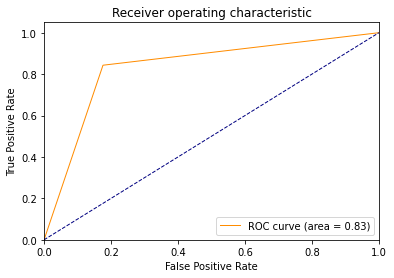

In [64]:
outcome_test = np.argmax(test_labels, 1)
predictions_test = predict_vals

fpr, tpr, thresholds = roc_curve(predictions_test, outcome_test)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [65]:
print("Model restored.") 
print("Pos review ", new_pos_review)
print("Neg review ", new_neg_review)
print(predict_softmax(new_pos_review, vocab))
print(predict_softmax(new_neg_review, vocab))

Model restored.
Pos review  I think that this is a fantastic movie, it really 
Neg review  Man, this movie really sucked. It was terrible. I could not possibly watch this movie again!
Predict: tf.Tensor([[4.14259337e-08 9.99999959e-01]], shape=(1, 2), dtype=float64)
[1]
Predict: tf.Tensor([[1.00000000e+00 4.19938986e-11]], shape=(1, 2), dtype=float64)
[0]
